* (참고)
* 해당 프로젝트는 에디터와 터미널로 진행된다.
* 때문에 아래 코드에서 대부분은 주석처리로 되어 설명을 돕는다.

## 0. 패키지 로딩하기

In [1]:
# # 필요한 패키지를 다운로드 한다.
# !pip install loguru
# !pip install ray

# from PIL                     import Image
# from loguru                  import logger
# from datetime                import datetime
# from tensorflow.keras.layers import Add, Concatenate, Lambda, Input, Conv2D, ReLU, MaxPool2D, UpSampling2D, ZeroPadding2D, BatchNormalization

# import os
# import io
# import csv
# import ray
# import math
# import json
# import click
# import tensorflow as tf

## 1. 데이터셋을 어디에서 구할까?

### 1_1. MPII 데이터셋 다운로드 받기

* 오늘은 MPII Human Pose Datasset을 사용해서 Human Pose Estimation task를 위한 모델을 훈련시켜 보겠다.
* (주의)
* 1) mpiihumanpose_v1.tar.gz 파일은 무려 12GB가 넘는 용량을 가지고 있다.
* 2) 공식 홈페이지에서 다운로드시 수 시간이 소요된다.

In [2]:
# # 아래의 명령어를 한줄씩 터미널에 입력한다.
# sudo apt install unzip # unzip 이 없는 경우 
# mkdir -p ~/aiffel/mpii
# cd ~/aiffel/mpii
# wget https://datasets.d2.mpi-inf.mpg.de/andriluka14cvpr/mpii_human_pose_v1.tar.gz
# wget https://datasets.d2.mpi-inf.mpg.de/andriluka14cvpr/mpii_human_pose_v1_u12_2.zip
# tar -xvf mpii_human_pose_v1.tar.gz -C .
# unzip mpii_human_pose_v1_u12_2.zip

* mpii_human_pose_v1_u12_2.zip을 풀어보면 mpii_human_pose_v1_u12_1.mat 파일이 나와서 열어보기 불편하다.
* 파이썬에서 읽기 쉽도록 json파일로 변환해 두었다.

In [3]:
# # 아래의 명령어를 한줄씩 터미널에 입력한다.
# cd ~/aiffel/mpii/mpii_human_pose_v1_u12_2
# wget https://aiffelstaticprd.blob.core.windows.net/media/documents/train.json
# wget https://aiffelstaticprd.blob.core.windows.net/media/documents/validation.json

* 마지막으로, 오늘의 실습코드를 프로젝트로 구성한 파일을 첨부한다.
* 아래의 명령어를 통해 mpii.zip을 다운로드하여 ~/aiffel/mpii 디렉토리에 압축을 푼다.

In [4]:
# wget https://aiffelstaticprd.blob.core.windows.net/media/documents/mpii.zip -P ~/aiffel/mpii
# cd ~/aiffel/mpii && unzip mpii.zip

## 2. 데이터 전처리하기

* tfrecords_mpii.py라는 파일에 대한 내용이다.

In [5]:
# os.environ["CUDA_VISIBLE_DEVICES"] = "-1" # CPU 사용
# os.environ["TF_CPP_MIN_LOG_LEVEL"] = "3"

# workdir = os.path.join(os.getenv("HOME"), "aiffel/mpii")
# os.chdir(workdir)

# num_train_shards = 64
# num_val_shards   = 8
# ray.init()
# tf.get_logger().setLevel("ERROR")

### 2_1. json 파싱하기

* 위에서 train.json과 validation.json 파일을 다운로드 받았다.
* 이 파일들은 이미지에 담겨 있는 사람들의 pose keypoint 정보들을 가지고 있어서 Pose Estimation을 위한 label로 삼을 수 있다.
* 우선 json이 어떻게 구성되어 있는지 파악해 보기 위해 json 파일을 열어 샘플로 annotation 정보를 1개만 출력해 본다.
* json.dumps()를 활용해서 좀 더 명확하게 beautify하면 더욱 좋다.

In [6]:
import os
import json

json_file_path = os.getenv("HOME") + "/aiffel/mpii/mpii_human_pose_v1_u12_2/train.json"

with open(json_file_path) as train_json:
    train_annos        = json.load(train_json)
    json_formatted_str = json.dumps(train_annos[0], indent = 2) # json beautify
    print(json_formatted_str)

{
  "joints_vis": [
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1
  ],
  "joints": [
    [
      620.0,
      394.0
    ],
    [
      616.0,
      269.0
    ],
    [
      573.0,
      185.0
    ],
    [
      647.0,
      188.0
    ],
    [
      661.0,
      221.0
    ],
    [
      656.0,
      231.0
    ],
    [
      610.0,
      187.0
    ],
    [
      647.0,
      176.0
    ],
    [
      637.0201,
      189.8183
    ],
    [
      695.9799,
      108.1817
    ],
    [
      606.0,
      217.0
    ],
    [
      553.0,
      161.0
    ],
    [
      601.0,
      167.0
    ],
    [
      692.0,
      185.0
    ],
    [
      693.0,
      240.0
    ],
    [
      688.0,
      313.0
    ]
  ],
  "image": "015601864.jpg",
  "scale": 3.021046,
  "center": [
    594.0,
    257.0
  ]
}


* joints가 우리가 label로 사용할 keypoint의 label이다.
* 이미지 형상과 사람의 포즈에 따라 모든 label이 이미지에 나타나지 않기 때문에 joints_vis를 이용해서 실제로 사용할 수 있는 keypoint인지 나타낸다.
* MPII 의 경우 1 (visible) / 0(non)으로만 나누어지기 때문에 조금 더 쉽게 사용할 수 있다.
* coco 의 경우 2 / 1 / 0으로 표현해서 occlusion 상황까지 label화 되어 있다.

* joints 순서는 아래와 같은 순서로 배치되어 저장해 뒀다.
* index 값은 언제든지 바꿔서 사용할 수 있다.
* 0 - 오른쪽 발목
* 1 - 오른쪽 무릎
* 2 - 오른쪽 엉덩이
* 3 - 왼쪽 엉덩이
* 4 - 왼쪽 무릎
* 5 - 왼쪽 발목
* 6 - 골반
* 7 - 가슴(흉부)
* 8 - 목
* 9 - 머리 위
* 10 - 오른쪽 손목
* 11 - 오른쪽 팔꿈치
* 12 - 오른쪽 어깨
* 13 - 왼쪽 어깨
* 14 - 왼쪽 팔꿈치
* 15 - 왼쪽 손목

* 가장 어렵게 느껴지는 값은 scale과 center일 것 같다.
* 높이 = scale * 200px, center는 사람의 중심점 이다.
* 200px이 왜 상수값으로 고정되어 있는지는 정확한 근거는 없다. (단순히 매직넘버)
* https://github.com/bearpaw/pytorch-pose/issues/31
* 검색해 보면 위 링크와 같이 토론이 일어나지만 "사람 키를 200px 로 가정한다" 수준의 정보만 있다.
* 적절한 근거가 없어서 어렵게 느껴지는 부분이지만 "편의상 사용한다" 정도로 이해하고 넘어간다.
* 특이한 점은 scale 정보가 coco dataset에는 scale 값 또한 2차원으로 주어져서 bbox scale이 나오지만 mpii는 높이만 나온다는 점이다.
* 이제 json annotation을 파싱하는 함수를 만들어 보겠다.

In [7]:
# def parse_one_annotation(anno, image_dir):
#     filename          = anno["image"]
#     joints            = anno["joints"]
#     joints_visibility = anno["joints_vis"]
    
#     annotation = {
#         "filename"          : filename,
#         "filepath"          : os.path.join(image_dir, filename),
#         "joints_visibility" : joints_visibility,
#         "joints"            : joints,
#         "center"            : anno["center"],
#         "scale"             : anno["scale"]
#     }
    
#     return annotation

* image의 전체 path를 묶어 dict 타입의 label로 만들어 냈다.
* 이 label을 가지고 학습을 진행하면 된다.

## 3.  tfrecord 파일 만들기

* 이전까지는 tf.keras의 imagedatagenerator를 이용해서 학습데이터를 읽었다.
* 하지만 실제 프로젝트에서는 튜토리얼 데이터셋보다 훨씬 큰 크기의 데이터를 다뤄야한다.
* 학습을 많이 해볼수록 학습 속도에 관심을 가지게 되는데, tensorflow 튜토리얼 문서에는 다음과 같은 표현으로 나타나 있다.
* unless you are using tf.data and reading data is still the bottleneck to training.
* 일반적으로 학습 과정에서 gpu의 연산 속도보다 HDD I/O가 느리기 때문에 병목 현상이 발생하고 대단위 프로젝트 실험에서 효율성이 떨어지는 것을 관찰할 수 있다.
* 따라서 "학습 데이터를 어떻게 빠르게 읽는가?"에 대한 고민을 반드시 수행해야 더 많은 실험을 할 수 있다.

* (질문) 학습 속도를 향상시키기 위해서 데이터 관점에서 고려해야하는 단계는 어떤 단계인가? 속도 향상을 위한 처리 방법을 링크에서 찾아 대답해보자.
* https://www.tensorflow.org/guide/data_performance?hl=ko
* (대답)
* 1. data read(또는 prefetch) 또는 데이터 변환 단계.
* 2. gpu 학습과 병렬적으로 수행되도록 prefetch를 적용해야 한다.
* 3. 수행방법은 tf.data의 map 함수를 이용하고 cache에 저장해두는 방법을 사용해야 한다.

* 내용이 어렵지만 tf에서는 위 변환을 자동화 해주는 도구를 제공한다.
* 데이터셋을 tfrecord 형태로 표현하는 것이다.
* tfrecord는 binary record sequence를 저장하기 위한 형식이다.
* 내부적으로 protocol buffer라는 것을 이용한다.
* https://developers.google.com/protocol-buffers/?hl=ko
* protobuf는 크로스플랫폼에서 사용할 수 있는 직렬화 데이터 라이브러리라고 생각하면 된다.
* 데이터셋 크기가 크기 때문에 빠른 학습을 위해서 이 정보를 tfrecord 파일로 변환해보겠다.

In [8]:
# def build_tf_records(annotations, total_shards, split):
#     chunks  = chunkify(annotations, total_shards)
#     futures = [
#         # train_0001_of_0064.tfrecords
#         build_single_tfrecord.remote(
#             chunk, 
#             f"./tfrecords_mpii/{split}_{str(i + 1).zfill(4)}_of_{str(total_shards).zfill(4)}.tfrecords"
#         ) for i, chunk in enumerate(chunks)
#     ]
#     ray.get(futures)

* 구현 내용을 보면 몇 가지 어려운 용어가 등장한다. tfrecord로 표현하기 위해 필요한 것이다.
* 해석해보자면
* 1. annotation을 total_shards 개수로 나눈다.(chunkify) (train : 64개, val : 8개)
* 2. build_single_tfrecord 함수를 통해 tfrecord로 저장한다.
* 3. 각 chunk끼리 dependency가 없기 때문에 병렬처리가 가능하고, ray를 사용한다.

* (질문) annotation을 왜 shard로 나눠야할까? 아래 링크를 다시 참고해서 대답해보자.
* https://www.tensorflow.org/tutorials/load_data/tfrecord?hl=ko
* (대답)
* 1. I/O 병목을 피하기 위해 입력 파일을 여러 개로 나눈 뒤, 병렬적으로 prefetch 하는 것이 학습 속도를 빠르게 한다.
* 2. 튜토리얼에서는 "경험상 데이터를 읽는 호스트보다 최소 10배 많은 파일을 보유하는 것이 좋습니다. 동시에 각 파일은 I/O prefetch의 이점을 누릴 수 있도록 충분히 커야합니다. (최소 10MB 이상, 이상적으로는 100MB 이상) 이라고 사용 팁을 알려주고 있다.

* tf 튜토리얼에서 알려준 대로 annotation을 적절한 개수로 (여기서는 64개 정도) 나누는 함수를 작성한다.

In [9]:
# def chunkify(l, n):
#     size    = len(l) // n
#     start   = 0
#     results = []
    
#     for i in range(n - 1):
#         results.append(l[start:start + size])
#         start += size
#     results.append(l[start:])
    
#     return results

* l 은 annotation, n은 shard 개수이다.
* shard 개수 단위로 annotation list를 나누어서 새로운 list를 만든다.
* numpy array라고 가정하면 (size, shard, anno_content) 정도의 shape을 가질 것이다.

* tfrecord 1개를 저장하는 함수를 만든다.
* 위에서 설명하지 않은 부분이 있는데, ray를 일단 무시해도 흐름상 큰 관계는 없다.

In [10]:
# @ray.remote
# def build_single_tfrecord(chunk, path):
#     print("start to build tf records for " + path)

#     with tf.io.TFRecordWriter(path) as writer:
#         for anno_list in chunk:
#             tf_example = genreate_tfexample(anno_list)
#             writer.write(tf_example.SerializeToString())

#     print("finished building tf records for " + path)

* TFRecordWriter를 이용해서 anno_list를 shard 개수 단위로 작성한다.
* generate_tfexample 함수를 사용한다.
* (중요) write 할 때 string으로 serialize 해야한다.

* tfrecord는 직렬화된 데이터를 저장하는 표현방법, 라이브러리이기 때문에 규칙을 따라줘야한다.
* https://www.inflearn.com/questions/67208
* tf.example은 아래와 같이 만들 수 있다.

In [11]:
# def generate_tfexample(anno):
#     filename = anno["filename"]
#     filepath = anno["filepath"]
    
#     with open(filepath, "rb") as image_file:
#         content = image_file.read()

#     image = Image.open(filepath)
    
#     if image.format != "JPEG" or image.mode != "RGB":
#         image_rgb = image.convert("RGB")
        
#         with io.BytesIO() as output:
#             image_rgb.save(output, format = "JPEG", quality = 95)
#             content = output.getvalue()

#     width, height = image.size
#     depth         = 3

#     c_x   = int(anno["center"][0])
#     c_y   = int(anno["center"][1])
#     scale = anno["scale"]

#     x = [int(joint[0]) if joint[0] >= 0 else int(joint[0]) for joint in anno["joints"]]
#     y = [int(joint[1]) if joint[1] >= 0 else int(joint[0]) for joint in anno["joints"]]
    
#     # 0 - invisible, 1 - occluded, 2 - visible
#     v = [0 if joint_v == 0 else 2 for joint_v in anno["joints_visibility"]]

#     feature = {
#         "image/height"          : tf.train.Feature(int64_list = tf.train.Int64List(value = [height])),
#         "image/width"           : tf.train.Feature(int64_list = tf.train.Int64List(value = [width])),
#         "image/depth"           : tf.train.Feature(int64_list = tf.train.Int64List(value = [depth])),
#         "image/object/parts/x"  : tf.train.Feature(int64_list = tf.train.Int64List(value = x)),
#         "image/object/parts/y"  : tf.train.Feature(int64_list = tf.train.Int64List(value = y)),
#         "image/object/center/x" : tf.train.Feature(int64_list = tf.train.Int64List(value = [c_x])),
#         "image/object/center/y" : tf.train.Feature(int64_list = tf.train.Int64List(value = [c_y])),
#         "image/object/scale"    : tf.train.Feature(float_list = tf.train.FloatList(value = [scale])),
#         "image/object/parts/v"  : tf.train.Feature(int64_list = tf.train.Int64List(value = v)),
#         "image/encoded"         : _bytes_feature(content),
#         "image/filename"        : _bytes_feature(filename.encode())
#     }

#     return tf.train.Example(features = tf.train.Features(feature = feature))

* 정의한 json의 python type의 값들을 tfexample에 사용할 수 있는 값으로 변환한다.
* image 파일은 byte로 변환한다. bitmap으로 저장하게 되면 파일 용량이 상당히 커지기 때문에 만약 jpeg 타입이 아닌 경우 jpeg으로 변환 후 content로 불러서 저장한다. (H, W, C)
* 각 label 값을 tf.train.Feature로 저장한다. 이 때 데이터 타입에 주의해야 한다.
* 이미지는 byte 인코딩 된 값을 그대로 넣는다.

In [12]:
# def _bytes_feature(value):
#     if isinstance(value, type(tf.constant(0))):
#         value = value.numpy() # BytesList won't unpack a string from an EagerTensor.
        
#     return tf.train.Feature(bytes_list = tf.train.BytesList(value = [value]))

## 4. Ray

* Ray는 파이썬을 위한 간단한 분산 어플리케이션 api 이다. (multiprocessing을 생각하면 된다.)
* (참고자료) https://docs.ray.io/en/latest/

* (질문) multiprocessing과 ray의 사용상 차이점은 무엇인가? 아래 링크를 참고해서 대답해보자.
* https://towardsdatascience.com/10x-faster-parallel-python-without-python-multiprocessing-e5017c93cce1
* (대답) MP는 병렬화를 위해 추상적 구조를 새로 설계해야 하지만 ray는 쓰던 코드에서 거의 수정 없이 병렬화 할 수 있는 장점이 있다.

* 지금까지 위에서 봤던 코드들을 모으고 정리해서 tfrecords_mpii.py라는 파일에 저장했다.
* 아래와 같이 tfrecord 생성을 수행해보자.

In [13]:
!cd ~/aiffel/mpii && python tfrecords_mpii.py

2021-05-10 11:06:42,149	INFO services.py:1269 -- View the Ray dashboard at http://127.0.0.1:8265
Start to parse annotations.
First train annotation:  {'filename': '015601864.jpg', 'filepath': './images/015601864.jpg', 'joints_visibility': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], 'joints': [[620.0, 394.0], [616.0, 269.0], [573.0, 185.0], [647.0, 188.0], [661.0, 221.0], [656.0, 231.0], [610.0, 187.0], [647.0, 176.0], [637.0201, 189.8183], [695.9799, 108.1817], [606.0, 217.0], [553.0, 161.0], [601.0, 167.0], [692.0, 185.0], [693.0, 240.0], [688.0, 313.0]], 'center': [594.0, 257.0], 'scale': 3.021046}
First val annotation:  {'filename': '005808361.jpg', 'filepath': './images/005808361.jpg', 'joints_visibility': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], 'joints': [[804.0, 711.0], [816.0, 510.0], [908.0, 438.0], [1040.0, 454.0], [906.0, 528.0], [883.0, 707.0], [974.0, 446.0], [985.0, 253.0], [982.7591, 235.9694], [962.2409, 80.0306], [869.0, 214.0], [798.0, 340.0], [902.0, 2

(pid=12548) finished building tf records for ./tfrecords_mpii/train_0030_of_0064.tfrecords
(pid=12548) start to build tf records for ./tfrecords_mpii/train_0042_of_0064.tfrecords
(pid=12553) finished building tf records for ./tfrecords_mpii/train_0032_of_0064.tfrecords
(pid=12553) start to build tf records for ./tfrecords_mpii/train_0043_of_0064.tfrecords
(pid=12547) finished building tf records for ./tfrecords_mpii/train_0031_of_0064.tfrecords
(pid=12547) start to build tf records for ./tfrecords_mpii/train_0044_of_0064.tfrecords
(pid=12549) finished building tf records for ./tfrecords_mpii/train_0033_of_0064.tfrecords
(pid=12549) start to build tf records for ./tfrecords_mpii/train_0045_of_0064.tfrecords
(pid=12546) finished building tf records for ./tfrecords_mpii/train_0034_of_0064.tfrecords
(pid=12546) start to build tf records for ./tfrecords_mpii/train_0046_of_0064.tfrecords
(pid=12551) finished building tf records for ./tfrecords_mpii/train_0035_of_0064.tfrecords
(pid=12551) st

* 아래 명령어를 실행해보면 약 200MB 정도의 tfrecords들이 72개 만들어진 것을 알 수 있다.

In [14]:
!cd ~/aiffel/mpii/tfrecords_mpii && ls | wc

     72      72    2072


## 5. data label 로 만들기

* tfrecords 파일을 읽고 전처리를 할 수 있는 dataloader를 만들겠다.
* preprocess.py라는 파일에 코드가 정리되어 있다.

In [15]:
# class Preprocessor(object):
#     def __init__(self, 
#                  image_shape   = (256, 256, 3), 
#                  heatmap_shape = (64, 64, 16), 
#                  is_train      = False):
#         self.is_train      = is_train
#         self.image_shape   = image_shape
#         self.heatmap_shape = heatmap_shape

#     def __call__(self, example):
#         features = self.parse_tfexample(example)
#         image    = tf.io.decode_jpeg(features["image/encoded"])

#         if self.is_train:
#             random_margin                 = tf.random.uniform([1], 0.1, 0.3)[0]
#             image, keypoint_x, keypoint_y = self.crop_roi(image, features, margin = random_margin)
#             image                         = tf.image.resize(image, self.image_shape[0:2])
        
#         else:
#             image, keypoint_x, keypoint_y = self.crop_roi(image, features)
#             image                         = tf.image.resize(image, self.image_shape[0:2])

#         image    = tf.cast(image, tf.float32) / 127.5 - 1
#         heatmaps = self.make_heatmaps(features, keypoint_x, keypoint_y)

#         # print (image.shape, heatmaps.shape, type(heatmaps))

#         return image, heatmaps

#     def parse_tfexample(self, example_proto):
#         image_feature_description = {
#             "image/height"          : tf.io.FixedLenFeature([], tf.int64),
#             "image/width"           : tf.io.FixedLenFeature([], tf.int64),
#             "imaage/depth"          : tf.io.FixedLenFeature([], tf.int64),
#             "image/object/parts/x"  : tf.io.VarLenFeature(tf.int64),
#             "image/object/parts/y"  : tf.io.VarLenFeature(tf.int64),
#             "image/object/parts/v"  : tf.io.VarLenFeature(tf.int64),
#             "image/object/center/x" : tf.io.FixedLenFeature([], tf.int64),
#             "image/object/center/y" : tf.io.FixedLenFeature([], tf.int64),
#             "image/object/scale"    : tf.io.FixedLenFeature([], tf.float32),
#             "image/encoded"         : tf.io.FixedLenFeature([], tf.string),
#             "image/filename"        : tf.io.FixedLenFeature([], tf.string)
#         }
        
#         return tf.io.parse_single_example(example_proto, image_feature_description)

#     def crop_roi(self, image, features, margin = 0.2):
#         img_shape  = tf.shape(image)
#         img_height = img_shape[0]
#         img_width  = img_shape[1]
#         img_depth  = img_shape[2]

#         keypoint_x  = tf.cast(tf.sparse.to_dense(features["image/object/parts/x"]), dtype = tf.int32)
#         keypoint_y  = tf.cast(tf.sparse.to_dense(features["image/object/parts/y"]), dtype = tf.int32)
#         center_x    = features["image/object/center/x"]
#         center_y    = features["image/object/center/y"]
#         body_height = features["image/object/scale"] * 200.0

#         # keypoint 중 유효한 값(visible = 1) 만 사용한다.
#         masked_keypoint_x = tf.boolean_mask(keypoint_x, keypoint_x > 0)
#         masked_keypoint_y = tf.boolean_mask(keypoint_y, keypoint_y > 0)

#         # min, max 값을 찾는다.
#         keypoint_xmin = tf.reduce_min(masked_keypoint_x)
#         keypoint_xmax = tf.reduce_max(masked_keypoint_x)
#         keypoint_ymin = tf.reduce_min(masked_keypoint_y)
#         keypoint_ymax = tf.reduce_max(masked_keypoint_y)

#         # 높이 값을 이용해서 x, y 위치를 재조정 한다. 박스를 정사각형으로 사용하기 위해 아래와 같이 사용한다.
#         xmin = keypoint_xmin - tf.cast(body_height * margin, dtype = tf.int32)
#         xmax = keypoint_xmax + tf.cast(body_height * margin, dtype = tf.int32)
#         ymin = keypoint_ymin - tf.cast(body_height * margin, dtype = tf.int32)
#         ymax = keypoint_ymax + tf.cast(body_height * margin, dtype = tf.int32)

#         # 이미지 크기를 벗어나는 점을 재조정 해준다.
#         effective_xmin   = xmin if xmin > 0 else 0
#         effective_ymin   = ymin if ymin > 0 else 0
#         effective_xmax   = xmax if xmax < img_width  else img_width
#         effective_ymax   = ymax if ymax < img_height else img_height
#         effective_height = effective_ymax - effective_ymin
#         effective_width  = effective_xmax - effective_xmin

#         image      = image[effective_ymin:effective_ymax, effective_xmin:effective_xmax, :]
#         new_shape  = tf.shape(image)
#         new_height = new_shape[0]
#         new_width  = new_shape[1]

#         # shift all keypoints based on the crop area
#         effective_keypoint_x = (keypoint_x - effective_xmin) / new_width
#         effective_keypoint_y = (keypoint_y - effective_ymin) / new_height

#         return image, effective_keypoint_x, effective_keypoint_y

#     def make_heatmaps(self, features, keypoint_x, keypoint_y):
#         v = tf.cast(tf.sparse.to_dense(features["image/object/parts/v"]), dtype = tf.float32)
#         x = tf.cast(tf.math.round(keypoint_x * self.heatmap_shape[0]),    dtype = tf.int32)
#         y = tf.cast(tf.math.round(keypoint_y * self.heatmap_shape[1]),    dtype = tf.int32)

#         num_heatmap   = self.heatmap_shape[2]
#         heatmap_array = tf.TensorArray(tf.float32, 16)

#         for i in range(num_heatmap):
#             gaussian      = self.generate_2d_guassian(self.heatmap_shape[1], self.heatmap_shape[0], y[i], x[i], v[i])
#             heatmap_array = heatmap_array.write(i, gaussian)

#         heatmaps = heatmap_array.stack()
#         heatmaps = tf.transpose(heatmaps, perm = [1, 2, 0]) # change to (64, 64, 16)

#         return heatmaps

#     def generate_2d_guassian(self, height, width, y0, x0, visibility = 2, sigma = 1, scale = 12):
#         """
#         "The same technique as Tompson et al. is used for supervision. A MeanSquared Error (MSE) loss is
#         applied comparing the predicted heatmap to a ground-truth heatmap consisting of a 2D gaussian
#         (with standard deviation of 1 px) centered on the keypoint location."

#         https://github.com/princeton-vl/pose-hg-train/blob/master/src/util/img.lua#L204
#         """
#         heatmap = tf.zeros((height, width))

#         # this gaussian patch is 7x7, let's get four corners of it first
#         xmin = x0 - 3 * sigma
#         ymin = y0 - 3 * sigma
#         xmax = x0 + 3 * sigma
#         ymax = y0 + 3 * sigma
        
#         # if the patch is out of image boundary we simply return nothing according to the source code
#         # [1]"In these cases the joint is either truncated or severely occluded, so for
#         # supervision a ground truth heatmap of all zeros is provided."
        
#         if xmin >= width or ymin >= height or xmax < 0 or ymax < 0 or visibility == 0:
#             return heatmap

#         size = 6 * sigma + 1
#         x, y = tf.meshgrid(tf.range(0, 6 * sigma + 1, 1), tf.range(0, 6 * sigma + 1, 1), indexing = "xy")

#         # the center of the gaussian patch should be 1
#         center_x = size // 2
#         center_y = size // 2

#         # generate this 7x7 gaussian patch
#         gaussian_patch = tf.cast(tf.math.exp(
#             -(tf.square(x - center_x) + tf.math.square(y - center_y)) / (tf.math.square(sigma) * 2)) * scale,
#                                  dtype = tf.float32)

#         # part of the patch could be out of the boundary, so we need to determine the valid range
#         # if xmin = -2, it means the 2 left-most columns are invalid, which is max(0, -(-2)) = 2
#         patch_xmin = tf.math.maximum(0, -xmin)
#         patch_ymin = tf.math.maximum(0, -ymin)
        
#         # if xmin = 59, xmax = 66, but our output is 64x64, then we should discard 2 right-most columns
#         # which is min(64, 66) - 59 = 5, and column 6 and 7 are discarded
#         patch_xmax = tf.math.minimum(xmax, width)  - xmin
#         patch_ymax = tf.math.minimum(ymax, height) - ymin

#         # also, we need to determine where to put this patch in the whole heatmap
#         heatmap_xmin = tf.math.maximum(0, xmin)
#         heatmap_ymin = tf.math.maximum(0, ymin)
#         heatmap_xmax = tf.math.minimum(xmax, width)
#         heatmap_ymax = tf.math.minimum(ymax, height)

#         # finally, insert this patch into the heatmap
#         indices = tf.TensorArray(tf.int32,   1, dynamic_size = True)
#         updates = tf.TensorArray(tf.float32, 1, dynamic_size = True)

#         count = 0

#         for j in tf.range(patch_ymin, patch_ymax):
#             for i in tf.range(patch_xmin, patch_xmax):
#                 indices = indices.write(count, [heatmap_ymin + j, heatmap_xmin + i])
#                 updates = updates.write(count, gaussian_patch[j][i])
#                 count  += 1

#         heatmap = tf.tensor_scatter_nd_update(heatmap, indices.stack(), updates.stack())

#         return heatmap

#     def make_heatmaps(self, features, keypoint_x, keypoint_y):
#         v = tf.cast(tf.sparse.to_dense(features["image/object/parts/v"]), dtype = tf.float32)
#         x = tf.cast(tf.math.round(keypoint_x * self.heatmap_shape[0]),    dtype = tf.int32)
#         y = tf.cast(tf.math.round(keypoint_y * self.heatmap_shape[1]),    dtype = tf.int32)

#         num_heatmap   = self.heatmap_shape[2]
#         heatmap_array = tf.TensorArray(tf.float32, 16)

#         for i in range(num_heatmap):
#             gaussian      = self.generate_2d_guassian(self.heatmap_shape[1], self.heatmap_shape[0], y[i], x[i], v[i])
#             heatmap_array = heatmap_array.write(i, gaussian)

#         heatmaps = heatmap_array.stack()
#         heatmaps = tf.transpose(heatmaps, perm = [1, 2, 0]) # change to (64, 64, 16)

#         return heatmaps

#     def parse_tfexample(self, example_proto):
#         image_feature_description = {
#             "image/height"          : tf.io.FixedLenFeature([], tf.int64),
#             "image/width"           : tf.io.FixedLenFeature([], tf.int64),
#             "image/depth"           : tf.io.FixedLenFeature([], tf.int64),
#             "image/object/parts/x"  : tf.io.VarLenFeature(tf.int64),
#             "image/object/parts/y"  : tf.io.VarLenFeature(tf.int64),
#             "image/object/parts/v"  : tf.io.VarLenFeature(tf.int64),
#             "image/object/center/x" : tf.io.FixedLenFeature([], tf.int64),
#             "image/object/center/y" : tf.io.FixedLenFeature([], tf.int64),
#             "image/object/scale"    : tf.io.FixedLenFeature([], tf.float32),
#             "image/encoded"         : tf.io.FixedLenFeature([], tf.string),
#             "image/filename"        : tf.io.FixedLenFeature([], tf.string),
#         }
        
#         return tf.io.parse_single_example(example_proto, image_feature_description)

* 위 코드를 하나씩 살펴보자.

In [16]:
# class Preprocessor(object):
#     def __init__(self, 
#                  image_shape   = (256, 256, 3), 
#                  heatmap_shape = (64, 64, 16), 
#                  is_train      = False):
#         self.is_train      = is_train
#         self.image_shape   = image_shape
#         self.heatmap_shape = heatmap_shape

#     def __call__(self, example):
#         features = self.parse_tfexample(example)
#         image    = tf.io.decode_jpeg(features["image/encoded"])

#         if self.is_train:
#             random_margin                 = tf.random.uniform([1], 0.1, 0.3)[0]
#             image, keypoint_x, keypoint_y = self.crop_roi(image, features, margin = random_margin)
#             image                         = tf.image.resize(image, self.image_shape[0:2])
        
#         else:
#             image, keypoint_x, keypoint_y = self.crop_roi(image, features)
#             image                         = tf.image.resize(image, self.image_shape[0:2])

#         image    = tf.cast(image, tf.float32) / 127.5 - 1
#         heatmaps = self.make_heatmaps(features, keypoint_x, keypoint_y)

#         # print (image.shape, heatmaps.shape, type(heatmaps))

#         return image, heatmaps

* 위 Preprocessor 클래스 코드에서 __call__() 메소드 내부에서 진행되는 주요 과정을 정리하면 아래와 같다.
* 1. tfrecord 파일이기 때문에 병렬로 읽는 것은 tf가 지원해주고 있다. self.parse_tfexample()에 구현되어 있고 이 함수를 통해 tf.tensor로 이루어진 dictionary 형태의 features를 얻을 수 있다.
* 2. 즉 image는 features["image/encoded"] 형태로 사용할 수 있고 tfrecord를 저장할 때 jpeg encoding 된 값을 넣었으므로 tf.io.decode_jpeg()로 decoding 하여 tensor 형태의 이미지를 얻는다.
* 3. crop_roi() 메소드를 이용해 해당 이미지를 학습하기 편하도록 몇 가지 트릭을 적용한다.
* make_heatmaps() 메소드를 이용해 label을 heatmap으로 나타낸다.

In [17]:
# def parse_tfexample(self, example_proto):
#     image_feature_description = {
#         "image/height"          : tf.io.FixedLenFeature([], tf.int64),
#         "image/width"           : tf.io.FixedLenFeature([], tf.int64),
#         "imaage/depth"          : tf.io.FixedLenFeature([], tf.int64),
#         "image/object/parts/x"  : tf.io.VarLenFeature(tf.int64),
#         "image/object/parts/y"  : tf.io.VarLenFeature(tf.int64),
#         "image/object/parts/v"  : tf.io.VarLenFeature(tf.int64),
#         "image/object/center/x" : tf.io.FixedLenFeature([], tf.int64),
#         "image/object/center/y" : tf.io.FixedLenFeature([], tf.int64),
#         "image/object/scale"    : tf.io.FixedLenFeature([], tf.float32),
#         "image/encoded"         : tf.io.FixedLenFeature([], tf.string),
#         "image/filename"        : tf.io.FixedLenFeature([], tf.string)
#     }

#     return tf.io.parse_single_example(example_proto, image_feature_description)

* tfrecord 파일 형식을 우리가 저장한 data type feature에 맞게 parsing 한다.
* tf가 자동으로 parsing 해주는 점은 아주 편하지만 feature description을 정확하게 알고 있어야하는 단점이 있다.
* 즉, tfrecord에서 사용할 key 값들과 data type을 모르면 tfrecord 파일을 사용하기 굉장히 어렵다. (serialize 되어있으므로)
* 이렇게 얻은 image와 label을 이용해서 적절한 학습형태로 변환한다.

In [18]:
# def crop_roi(self, image, features, margin = 0.2):
#     img_shape  = tf.shape(image)
#     img_height = img_shape[0]
#     img_width  = img_shape[1]
#     img_depth  = img_shape[2]

#     keypoint_x  = tf.cast(tf.sparse.to_dense(features["image/object/parts/x"]), dtype = tf.int32)
#     keypoint_y  = tf.cast(tf.sparse.to_dense(features["image/object/parts/y"]), dtype = tf.int32)
#     center_x    = features["image/object/center/x"]
#     center_y    = features["image/object/center/y"]
#     body_height = features["image/object/scale"] * 200.0

#     # keypoint 중 유효한 값(visible = 1) 만 사용한다.
#     masked_keypoint_x = tf.boolean_mask(keypoint_x, keypoint_x > 0)
#     masked_keypoint_y = tf.boolean_mask(keypoint_y, keypoint_y > 0)

#     # min, max 값을 찾는다.
#     keypoint_xmin = tf.reduce_min(masked_keypoint_x)
#     keypoint_xmax = tf.reduce_max(masked_keypoint_x)
#     keypoint_ymin = tf.reduce_min(masked_keypoint_y)
#     keypoint_ymax = tf.reduce_max(masked_keypoint_y)

#     # 높이 값을 이용해서 x, y 위치를 재조정 한다. 박스를 정사각형으로 사용하기 위해 아래와 같이 사용한다.
#     xmin = keypoint_xmin - tf.cast(body_height * margin, dtype = tf.int32)
#     xmax = keypoint_xmax + tf.cast(body_height * margin, dtype = tf.int32)
#     ymin = keypoint_ymin - tf.cast(body_height * margin, dtype = tf.int32)
#     ymax = keypoint_ymax + tf.cast(body_height * margin, dtype = tf.int32)

#     # 이미지 크기를 벗어나는 점을 재조정 해준다.
#     effective_xmin   = xmin if xmin > 0 else 0
#     effective_ymin   = ymin if ymin > 0 else 0
#     effective_xmax   = xmax if xmax < img_width  else img_width
#     effective_ymax   = ymax if ymax < img_height else img_height
#     effective_height = effective_ymax - effective_ymin
#     effective_width  = effective_xmax - effective_xmin

#     image      = image[effective_ymin:effective_ymax, effective_xmin:effective_xmax, :]
#     new_shape  = tf.shape(image)
#     new_height = new_shape[0]
#     new_width  = new_shape[1]

#     # shift all keypoints based on the crop area
#     effective_keypoint_x = (keypoint_x - effective_xmin) / new_width
#     effective_keypoint_y = (keypoint_y - effective_ymin) / new_height

#     return image, effective_keypoint_x, effective_keypoint_y

* 우리가 알고 있는 것은 joints의 위치, center의 좌표, body height 값 이다.
* 균일하게 학습하기 위해 body width를 적절히 정하는 것도 중요하다.
* 여기서는 높이 정보와 keypoint 위치를 이용해서 정사각형 박스를 사용하는 것을 기본으로 디자인 했다.
* 이와 관련해서는 여러 방법이 있을 수 있겠지만 배우는 단계에서 더 중요하게 봐야할 부분은 우리가 임의로 조정한 crop box가 이미지 바깥으로 나가지 않는지 예외 처리를 잘 해주어야 한다는 점이다.
* (x, y) 좌표로 되어있는 keypoint를 heatmap으로 변경시킨다.

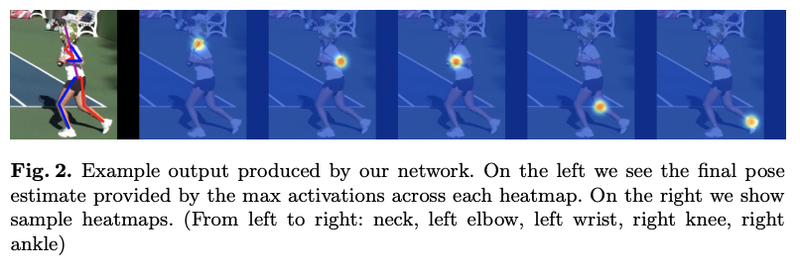

In [20]:
from PIL import Image

Image.open(os.getenv("HOME") + "/Pictures/image.png")

In [21]:
# def make_heatmaps(self, features, keypoint_x, keypoint_y):
#     v = tf.cast(tf.sparse.to_dense(features["image/object/parts/v"]), dtype = tf.float32)
#     x = tf.cast(tf.math.round(keypoint_x * self.heatmap_shape[0]),    dtype = tf.int32)
#     y = tf.cast(tf.math.round(keypoint_y * self.heatmap_shape[1]),    dtype = tf.int32)

#     num_heatmap   = self.heatmap_shape[2]
#     heatmap_array = tf.TensorArray(tf.float32, 16)

#     for i in range(num_heatmap):
#         gaussian      = self.generate_2d_guassian(self.heatmap_shape[1], self.heatmap_shape[0], y[i], x[i], v[i])
#         heatmap_array = heatmap_array.write(i, gaussian)

#     heatmaps = heatmap_array.stack()
#     heatmaps = tf.transpose(heatmaps, perm = [1, 2, 0]) # change to (64, 64, 16)

#     return heatmaps

* 16개의 점을 generate_2d_gaussian() 함수를 이용해서 64x64의 map에 표현한다.
* 2D 가우스 분포 수식을 적용해서 만들 수 있다.

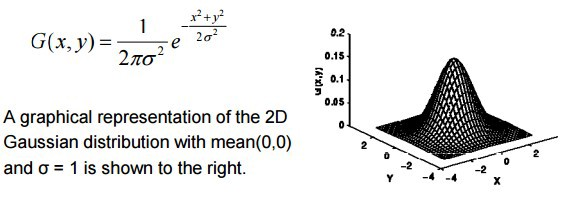

In [22]:
Image.open(os.getenv("HOME") + "/Pictures/image2.png")

In [23]:
# def generate_2d_guassian(self, height, width, y0, x0, visibility = 2, sigma = 1, scale = 12):
#     """
#     "The same technique as Tompson et al. is used for supervision. A MeanSquared Error (MSE) loss is
#     applied comparing the predicted heatmap to a ground-truth heatmap consisting of a 2D gaussian
#     (with standard deviation of 1 px) centered on the keypoint location."

#     https://github.com/princeton-vl/pose-hg-train/blob/master/src/util/img.lua#L204
#     """
#     heatmap = tf.zeros((height, width))

#     # this gaussian patch is 7x7, let's get four corners of it first
#     xmin = x0 - 3 * sigma
#     ymin = y0 - 3 * sigma
#     xmax = x0 + 3 * sigma
#     ymax = y0 + 3 * sigma

#     # if the patch is out of image boundary we simply return nothing according to the source code
#     # [1]"In these cases the joint is either truncated or severely occluded, so for
#     # supervision a ground truth heatmap of all zeros is provided."

#     if xmin >= width or ymin >= height or xmax < 0 or ymax < 0 or visibility == 0:
#         return heatmap

#     size = 6 * sigma + 1
#     x, y = tf.meshgrid(tf.range(0, 6 * sigma + 1, 1), tf.range(0, 6 * sigma + 1, 1), indexing = "xy")

#     # the center of the gaussian patch should be 1
#     center_x = size // 2
#     center_y = size // 2

#     # generate this 7x7 gaussian patch
#     gaussian_patch = tf.cast(tf.math.exp(
#         -(tf.square(x - center_x) + tf.math.square(y - center_y)) / (tf.math.square(sigma) * 2)) * scale,
#                              dtype = tf.float32)

#     # part of the patch could be out of the boundary, so we need to determine the valid range
#     # if xmin = -2, it means the 2 left-most columns are invalid, which is max(0, -(-2)) = 2
#     patch_xmin = tf.math.maximum(0, -xmin)
#     patch_ymin = tf.math.maximum(0, -ymin)

#     # if xmin = 59, xmax = 66, but our output is 64x64, then we should discard 2 right-most columns
#     # which is min(64, 66) - 59 = 5, and column 6 and 7 are discarded
#     patch_xmax = tf.math.minimum(xmax, width)  - xmin
#     patch_ymax = tf.math.minimum(ymax, height) - ymin

#     # also, we need to determine where to put this patch in the whole heatmap
#     heatmap_xmin = tf.math.maximum(0, xmin)
#     heatmap_ymin = tf.math.maximum(0, ymin)
#     heatmap_xmax = tf.math.minimum(xmax, width)
#     heatmap_ymax = tf.math.minimum(ymax, height)

#     # finally, insert this patch into the heatmap
#     indices = tf.TensorArray(tf.int32,   1, dynamic_size = True)
#     updates = tf.TensorArray(tf.float32, 1, dynamic_size = True)

#     count = 0

#     for j in tf.range(patch_ymin, patch_ymax):
#         for i in tf.range(patch_xmin, patch_xmax):
#             indices = indices.write(count, [heatmap_ymin + j, heatmap_xmin + i])
#             updates = updates.write(count, gaussian_patch[j][i])
#             count  += 1

#     heatmap = tf.tensor_scatter_nd_update(heatmap, indices.stack(), updates.stack())

#     return heatmap

* sigma 값이 1 이고, window size 7 인 필터를 이용해서 만들었다.
* 이런 특수 함수들은 공개되어 있는 구현이 많기 때문에 참고해서 사용하는 것을 추천한다.

## 6. 모델을 학습해보자

### 6_1. Hourglass 모델 만들기

* 이번엔 hourglass104.py 파일에 대한 내용이다.

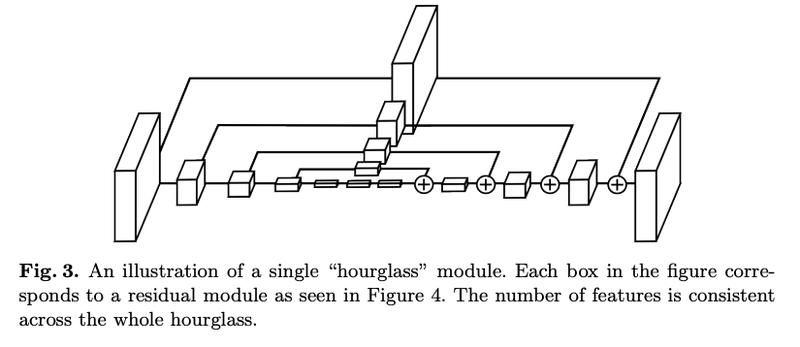

In [24]:
# hourglass 모델을 기억하는가?
Image.open(os.getenv("HOME") + "/Pictures/image3.png")

* 직육면체 박스는 residual block 이었다. 하나씩 구현해본다.

In [25]:
# def BottleneckBlock(inputs, filters, strides = 1, downsample = False, name = None):
#     identity = inputs
    
#     if downsample:
#         identity = Conv2D(
#             filters            = filters, # lift channels first
#             kernel_size        = 1,
#             strides            = strides,
#             padding            = "same",
#             kernel_initializer = "he_normal")(inputs)

#     x = BatchNormalization(momentum = 0.9)(inputs)
#     x = ReLU()(x)
#     x = Conv2D(
#         filters            = filters // 2,
#         kernel_size        = 1,
#         strides            = 1,
#         padding            = "same",
#         kernel_initializer = "he_normal")(x)

#     x = BatchNormalization(momentum = 0.9)(x)
#     x = ReLU()(x)
#     x = Conv2D(
#         filters            = filters // 2,
#         kernel_size        = 3,
#         strides            = strides,
#         padding            = "same",
#         kernel_initializer = "he_normal")(x)

#     x = BatchNormalization(momentum = 0.9)(x)
#     x = ReLU()(x)
#     x = Conv2D(
#         filters            = filters,
#         kernel_size        = 1,
#         strides            = 1,
#         padding            = "same",
#         kernel_initializer = "he_normal")(x)

#     x = Add()([identity, x])
    
#     return x

* resnet 구현과 비슷하기 때문에 쉽게 느껴지는 코드일 것이다.
* (질문) residual block의 2가지 타입을 작성해보자.
* (대답)
* 1. 3x3-3x3 basic block
* 2. 1x1-3x3-1x1 bottleneck block

* 위의 hourglass 모델을 다시 보니 마치 양파처럼 가장 바깥의 layer를 제거하면 똑같은 구조가 나타나는 것을 알 수 있다.
* 이 점을 이용해서 간단하게 모델을 표현할 수 있을 것 같다.

### 6_2. Hourglass module

In [26]:
# def HourglassModule(inputs, order, filters, num_residual):
#     """
#     https://github.com/princeton-vl/pose-hg-train/blob/master/src/models/hg.lua#L3
#     """
    
#     # Upper branch
#     up1 = BottleneckBlock(inputs, filters, downsample = False)

#     for i in range(num_residual):
#         up1 = BottleneckBlock(up1, filters, downsample = False)

#     # Lower branch
#     low1 = MaxPool2D(pool_size = 2, strides = 2)(inputs)
    
#     for i in range(num_residual):
#         low1 = BottleneckBlock(low1, filters, downsample = False)

#     low2 = low1
    
#     if order > 1:
#         low2 = HourglassModule(low1, order - 1, filters, num_residual)
        
#     else:
#         for i in range(num_residual):
#             low2 = BottleneckBlock(low2, filters, downsample = False)

#     low3 = low2
    
#     for i in range(num_residual):
#         low3 = BottleneckBlock(low3, filters, downsample = False)

#     up2 = UpSampling2D(size = 2)(low3)

#     return up2 + up1

* 위처럼 재귀함수를 이용하는 것이다.
* 바깥부터 5개의 양파껍질(층)을 만들고 싶다면 order를 이용해서 5,4…1이 될때까지 HourglassModule을 반복하면 order가 1이 되면 BottleneckBlock으로 대체해주면 아주 간결하게 만들 수 있다.
* 이 hourglass 모듈을 여러 층으로 쌓은 것이 stacked hourglass network 인데, 모델이 깊어지는 만큼 학습이 어려워 intermediate loss (auxilary loss)를 추가해야하는 것을 논문에서 언급하고 있다.

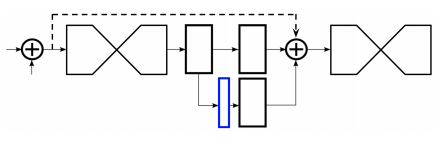

In [27]:
Image.open(os.getenv("HOME") + "/Pictures/image4.png")

In [28]:
# # intermediate output을 위한 linear layer
# def LinearLayer(inputs, filters):
#     x = Conv2D(
#         filters            = filters,
#         kernel_size        = 1,
#         strides            = 1,
#         padding            = "same",
#         kernel_initializer = "he_normal")(inputs)
    
#     x = BatchNormalization(momentum = 0.9)(x)
#     x = ReLU()(x)
    
#     return x

* 따라서 stacked되는 hourglass층 사이사이에 LinearLayer를 삽입하고 중간 loss를 계산해준다.
* 지금까지 만든 hourglass를 여러층으로 쌓으면 stacked hourglass가 된다.

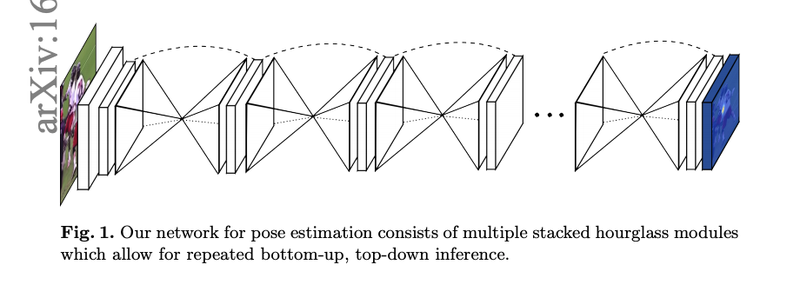

In [29]:
Image.open(os.getenv("HOME") + "/Pictures/image5.png")

### 6_3. Stacked Hourglass

In [30]:
# def StackedHourglassNetwork(input_shape = (256, 256, 3), num_stack = 4, num_residual = 1, num_heatmap = 16):
#     """
#     https://github.com/princeton-vl/pose-hg-train/blob/master/src/models/hg.lua#L33
#     """
#     inputs = Input(shape = input_shape)

#     # initial processing of the image
#     x = Conv2D(
#         filters            = 64,
#         kernel_size        = 7,
#         strides            = 2,
#         padding            = "same",
#         kernel_initializer = "he_normal")(inputs)
#     x = BatchNormalization(momentum = 0.9)(x)
#     x = ReLU()(x)
#     x = BottleneckBlock(x, 128, downsample = True)
#     x = MaxPool2D(pool_size = 2, strides = 2)(x)
#     x = BottleneckBlock(x, 128, downsample = False)
#     x = BottleneckBlock(x, 256, downsample = True)

#     ys = []
    
#     for i in range(num_stack):
#         x = HourglassModule(x, order = 4, filters = 256, num_residual = num_residual)
        
#         for i in range(num_residual):
#             x = BottleneckBlock(x, 256, downsample = False)

#         # predict 256 channels like a fully connected layer.
#         x = LinearLayer(x, 256)

#         # predict final channels, which is also the number of predicted heatmap
#         y = Conv2D(
#             filters            = num_heatmap,
#             kernel_size        = 1,
#             strides            = 1,
#             padding            = "same",
#             kernel_initializer = "he_normal")(x)
#         ys.append(y)

#         # if it's not the last stack, we need to add predictions back
#         if i < num_stack - 1:
#             y_intermediate_1 = Conv2D(filters = 256, kernel_size = 1, strides = 1)(x)
#             y_intermediate_2 = Conv2D(filters = 256, kernel_size = 1, strides = 1)(y)
#             x                = Add()([y_intermediate_1, y_intermediate_2])

#     return tf.keras.Model(inputs, ys, name = "stacked_hourglass")

## 7. 학습 엔진 만들기

* 이번엔 train.py에 대한 설명이다.
* 에디터를 실행할 때는 지금까지 제작한 *.py 모듈들은 여기서 참조(import)되어 사용될 것이다.
* model로 만들어 둔 hourglass와 데이터 전처리용 preprocess를 import 한다.
* 아래는 gpu memory growth 옵션을 조정하는 코드이다.

In [31]:
# def automatic_gpu_usage() :
#     gpus = tf.config.experimental.list_physical_devices("GPU")
    
#     if gpus:
#         try:
#             # Currently, memory growth needs to be the same across GPUs
#             for gpu in gpus:
#                 tf.config.experimental.set_memory_growth(gpu, True)
#             logical_gpus = tf.config.experimental.list_logical_devices("GPU")
#             print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
            
#         except RuntimeError as e:
#             # Memory growth must be set before GPUs have been initialized
#             print(e)

### 7_1. Trainer class

In [32]:
# class Trainer(object):
#     def __init__(self,
#                  model,
#                  epochs,
#                  global_batch_size,
#                  strategy,
#                  initial_learning_rate,
#                  version         = "0.0.1",
#                  start_epoch     = 1,
#                  tensorboard_dir = "./logs"):
        
#         self.start_epoch           = start_epoch
#         self.model                 = model
#         self.epochs                = epochs
#         self.strategy              = strategy
#         self.global_batch_size     = global_batch_size
#         self.loss_object           = tf.keras.losses.MeanSquaredError(reduction = tf.keras.losses.Reduction.NONE)
#         self.optimizer             = tf.keras.optimizers.Adam(learning_rate = initial_learning_rate)
#         self.model                 = model
#         self.current_learning_rate = initial_learning_rate
#         self.last_val_loss         = math.inf
#         self.lowest_val_loss       = math.inf
#         self.patience_count        = 0
#         self.max_patience          = 10
#         self.tensorboard_dir       = tensorboard_dir
#         self.best_model            = None
#         self.version               = version

* 위 코드에서 정의한 학습에 사용할 옵션들 중 몇 가지를 눈여겨 보자.
* 1. loss : MSE(heatmap을 pixel 단위 MSE로 계산) → 실제 계산은 약간 다르다. compute_loss()에서 새로 구현한다.
* 2. strategy : 분산학습용 tf.strategy 이다. 사용 가능한 GPU가 1개뿐이라면 사용하지 않는다.
* 3. optimizer : Adam

#### learning rate

* learning rate는 decay step에 따라 1/10씩 작아지도록 설정했다.

In [33]:
# def lr_decay(self):
#     """
#     This effectively simulate ReduceOnPlateau learning rate schedule. Learning rate
#     will be reduced by a factor of 5 if there's no improvement over [max_patience] epochs
#     """
#     if self.patience_count >= self.max_patience:
#         self.current_learning_rate /= 10.0
#         self.patience_count         = 0
        
#     elif self.last_val_loss == self.lowest_val_loss:
#         self.patience_count = 0
#     self.patience_count    += 1

#     self.optimizer.learning_rate = self.current_learning_rate

# def lr_decay_step(self, epoch):
#     if epoch == 25 or epoch == 50 or epoch == 75:
#         self.current_learning_rate /= 10.0
        
#     self.optimizer.learning_rate = self.current_learning_rate

#### loss function

In [34]:
# def compute_loss(self, labels, outputs):
#     loss = 0
    
#     for output in outputs:
#         weights = tf.cast(labels > 0, dtype = tf.float32) * 81 + 1
#         loss   += tf.math.reduce_mean(
#             tf.math.square(labels - output) * weights) * (1. / self.global_batch_size)
    
#     return loss

* 이론대로라면 self.loss_object를 사용해서 MSE로 구현하는 것이 맞지만 사실 동일 weight MSE는 수렴이 잘 되지 않는다.
* 예측해야하는 positive (joint들) 의 비율이 negative (배경이라고 할 수 있다) 에 비해 상당히 적은 비율로 등장하기 때문이다.
* 이 때문에 실제 구현에서는 약간의 테크닉을 추가해줄 필요가 있다.
* label이 배경이 아닌 경우 (heatmap 값이 0보다 큰 경우) 에 추가적인 weight를 주면 보다 나아지는 경향을 볼 수 있었다.
* weight가 82인 이유는 heatmap 전체 크기인 64x64에서 gaussian point 등장 비율이 7x7 패치이기 때문에 64 / 7 = 9.1 ⇒ 9x9로 계산해 봤다.
* tf.gradienttape을 이용해 loss를 업데이트 하면 된다.

In [35]:
# def train_step(self, inputs):
#     images, labels = inputs
    
#     with tf.GradientTape() as tape:
#         outputs = self.model(images, training = True)
#         loss    = self.compute_loss(labels, outputs)

#     grads = tape.gradient(target = loss, sources = self.model.trainable_variables)
#     self.optimizer.apply_gradients(zip(grads, self.model.trainable_variables))

#     return loss

# def val_step(self, inputs):
#     images, labels = inputs
#     outputs        = self.model(images, training = False)
#     loss           = self.compute_loss(labels, outputs)
    
#     return loss

* 실제 학습하는 함수이다.
* distributed_train_epoch()과 distributed_val_epoch()함수는 gpu를 여러 개 이용하는 분산 학습용 코드이니, 사용하지 않더라도 참고삼아 봐두시길 권한다.

In [36]:
# def run(self, train_dist_dataset, val_dist_dataset):
#     @tf.function
#     def distributed_train_epoch(dataset):
#         tf.print("Start distributed traininng...")
#         total_loss        = 0.0
#         num_train_batches = 0.0
    
#         for one_batch in dataset:
#             # 오류가 발생하면 experimental_run_v2 대신 run을 사용한다.
#             per_replica_loss   = self.strategy.experimental_run_v2(self.train_step, args = (one_batch, ))
#             batch_loss         = self.strategy.reduce(tf.distribute.ReduceOp.SUM, per_replica_loss, axis = None)
#             total_loss        += batch_loss
#             num_train_batches += 1
#             tf.print("Trained batch", num_train_batches, "batch loss", batch_loss, "epoch total loss", total_loss / num_train_batches)
        
#         return total_loss, num_train_batches

#     @tf.function
#     def distributed_val_epoch(dataset):
#         total_loss      = 0.0
#         num_val_batches = 0.0
    
#         for one_batch in dataset:
#             # 오류가 발생하면 experimental_run_v2 대신 run을 사용한다.
#             per_replica_loss = self.strategy.experimental_run_v2(self.val_step, args = (one_batch, ))
#             num_val_batches += 1
#             batch_loss       = self.strategy.reduce(tf.distribute.ReduceOp.SUM, per_replica_loss, axis = None)
#             tf.print("Validated batch", num_val_batches, "batch loss", batch_loss)
        
#             if not tf.math.is_nan(batch_loss):
#                 # TODO: Find out why the last validation batch loss become NaN
#                 total_loss += batch_loss
#             else:
#                 num_val_batches -= 1

#         return total_loss, num_val_batches

# summary_writer = tf.summary.create_file_writer(self.tensorboard_dir)
# summary_writer.set_as_default()

# for epoch in range(self.start_epoch, self.epochs + 1):
#     tf.summary.experimental.set_step(epoch)

#     self.lr_decay()
#     tf.summary.scalar("epoch learning rate", self.current_learning_rate)

#     print(f"Start epoch {epoch} with learning rate {self.current_learning_rate}")

#     train_total_loss, num_train_batches = distributed_train_epoch(train_dist_dataset)
#     train_loss                          = train_total_loss / num_train_batches
#     print(f"Epoch {epoch} train loss {train_loss}")
#     tf.summary.scalar("epoch train loss", train_loss)

#     val_total_loss, num_val_batches = distributed_val_epoch(val_dist_dataset)
#     val_loss                        = val_total_loss / num_val_batches
#     print(f"Epoch {epoch} val loss {val_loss}")
#     tf.summary.scalar("epoch val loss", val_loss)

#     # save model when reach a new lowest validation loss
#     if val_loss < self.lowest_val_loss:
#         self.save_model(epoch, val_loss)
#         self.lowest_val_loss = val_loss
        
#     self.last_val_loss = val_loss

# return self.best_model

In [37]:
# def save_model(self, epoch, loss):
#     model_name = f"./models/model-v{self.version}-epoch-{epoch}-loss-{loss:.4f}.h5"
#     self.model.save_weights(model_name)
    
#     self.best_model = model_name
#     print(f"Model {model_name} saved.")

### 7_2. tf.dataset 만들기

* trainer의 모델 학습 부분은 제작이 완료되었고, tfrecord 파일을 tf.dataset으로 만들어 보겠다.

In [38]:
# def create_dataset(tfrecords, batch_size, num_heatmap, is_train):
#     preprocess = Preprocessor(IMAGE_SHAPE, (HEATMAP_SIZE[0], HEATMAP_SIZE[1], num_heatmap), is_train)

#     dataset = tf.data.Dataset.list_files(tfrecords)
#     dataset = tf.data.TFRecordDataset(dataset)
#     dataset = dataset.map(preprocess, num_parallel_calls = tf.data.experimental.AUTOTUNE)

#     if is_train:
#         dataset = dataset.shuffle(batch_size)

#     dataset = dataset.batch(batch_size)
#     dataset = dataset.prefetch(buffer_size = tf.data.experimental.AUTOTUNE)

#     return dataset

* preprocessor 구현에서 tfrecord 규칙을 모두 정의했기 때문에 단순히 tfrecord list을 읽어와서 tf.data API에 입력한 후, preprocessor를 map으로 적용하면 된다.

### 7_3. train함수 구현

In [39]:
# def train(epochs, 
#           start_epoch, 
#           learning_rate, 
#           tensorboard_dir, 
#           checkpoint, 
#           num_heatmap, 
#           batch_size, 
#           train_tfrecords, 
#           val_tfrecords, 
#           version):
    
#     strategy          = tf.distribute.MirroredStrategy()
#     global_batch_size = strategy.num_replicas_in_sync * batch_size
#     train_dataset     = create_dataset(train_tfrecords, global_batch_size, num_heatmap, is_train = True)
#     val_dataset       = create_dataset(val_tfrecords,   global_batch_size, num_heatmap, is_train = False)

#     if not os.path.exists(os.path.join("./models")):
#         os.makedirs(os.path.join("./models/"))

#     with strategy.scope():
#         train_dist_dataset = strategy.experimental_distribute_dataset(train_dataset)
#         val_dist_dataset   = strategy.experimental_distribute_dataset(val_dataset)

#         model = StackedHourglassNetwork(IMAGE_SHAPE, 4, 1, num_heatmap)
        
#         if checkpoint and os.path.exists(checkpoint):
#             model.load_weights(checkpoint)

#         trainer = Trainer(
#             model,
#             epochs,
#             global_batch_size,
#             strategy,
#             initial_learning_rate = learning_rate,
#             start_epoch           = start_epoch,
#             version               = version,
#             tensorboard_dir       = tensorboard_dir)

#         print("Start training...")
        
#         return trainer.run(train_dist_dataset, val_dist_dataset)

* 이제 train.py를 사용하여 학습해보자.
* (주의) 1 Epoch에 30분 정도 소요될 수 있다. 해당 파일 코드는 50Epoch 학습으로 구현되어 있지만 실제 코드 실행시에는 Epoch 수 등을 적절히 조절해야한다.

In [40]:
!cd ~/aiffel/mpii && python train_hourglass.py

Physical devices cannot be modified after being initialized
Start training...
Start epoch 1 with learning rate 0.0007
Instructions for updating:
Use `tf.data.Iterator.get_next_as_optional()` instead.
Start distributed traininng...
Trained batch 1 batch loss 4.87233829 epoch total loss 4.87233829
Trained batch 2 batch loss 5.14157534 epoch total loss 5.00695705
Trained batch 3 batch loss 5.2083149 epoch total loss 5.07407618
Trained batch 4 batch loss 5.10372543 epoch total loss 5.08148861
Trained batch 5 batch loss 4.99768925 epoch total loss 5.06472874
Trained batch 6 batch loss 5.14413643 epoch total loss 5.07796335
Trained batch 7 batch loss 5.04368162 epoch total loss 5.07306576
Trained batch 8 batch loss 4.94757843 epoch total loss 5.05737972
Trained batch 9 batch loss 4.96343327 epoch total loss 5.04694128
Trained batch 10 batch loss 4.66492939 epoch total loss 5.00874
Trained batch 11 batch loss 4.75339937 epoch total loss 4.98552704
Trained batch 12 batch loss 4.6600523 epoch t

Trained batch 117 batch loss 3.49637699 epoch total loss 3.78864169
Trained batch 118 batch loss 3.40361667 epoch total loss 3.78537893
Trained batch 119 batch loss 3.51367569 epoch total loss 3.7830956
Trained batch 120 batch loss 3.5660181 epoch total loss 3.78128672
Trained batch 121 batch loss 3.56510234 epoch total loss 3.7795
Trained batch 122 batch loss 3.59023285 epoch total loss 3.77794862
Trained batch 123 batch loss 3.57762957 epoch total loss 3.77632
Trained batch 124 batch loss 3.32623506 epoch total loss 3.7726903
Trained batch 125 batch loss 3.52511692 epoch total loss 3.77070975
Trained batch 126 batch loss 3.52690029 epoch total loss 3.76877451
Trained batch 127 batch loss 3.53236818 epoch total loss 3.76691318
Trained batch 128 batch loss 3.46724129 epoch total loss 3.76457214
Trained batch 129 batch loss 3.39531136 epoch total loss 3.76170969
Trained batch 130 batch loss 3.51427 epoch total loss 3.75980639
Trained batch 131 batch loss 3.55919218 epoch total loss 3.75

Trained batch 239 batch loss 3.7358954 epoch total loss 3.59894109
Trained batch 240 batch loss 3.55716085 epoch total loss 3.59876704
Trained batch 241 batch loss 3.17786288 epoch total loss 3.59702063
Trained batch 242 batch loss 3.24672556 epoch total loss 3.59557295
Trained batch 243 batch loss 3.3179369 epoch total loss 3.59443045
Trained batch 244 batch loss 3.37620401 epoch total loss 3.59353614
Trained batch 245 batch loss 3.06513715 epoch total loss 3.5913794
Trained batch 246 batch loss 2.98906636 epoch total loss 3.58893085
Trained batch 247 batch loss 3.10167384 epoch total loss 3.58695841
Trained batch 248 batch loss 2.98923302 epoch total loss 3.58454823
Trained batch 249 batch loss 2.83090448 epoch total loss 3.58152175
Trained batch 250 batch loss 2.75435686 epoch total loss 3.57821298
Trained batch 251 batch loss 3.43814731 epoch total loss 3.57765484
Trained batch 252 batch loss 3.25160122 epoch total loss 3.57636094
Trained batch 253 batch loss 3.45603514 epoch total

Trained batch 360 batch loss 3.37480354 epoch total loss 3.48802614
Trained batch 361 batch loss 2.87917089 epoch total loss 3.48633957
Trained batch 362 batch loss 2.70668674 epoch total loss 3.48418593
Trained batch 363 batch loss 3.16017604 epoch total loss 3.48329329
Trained batch 364 batch loss 3.08805275 epoch total loss 3.4822073
Trained batch 365 batch loss 3.33862281 epoch total loss 3.48181391
Trained batch 366 batch loss 3.25626278 epoch total loss 3.4811976
Trained batch 367 batch loss 3.25086689 epoch total loss 3.48056984
Trained batch 368 batch loss 3.47103262 epoch total loss 3.48054409
Trained batch 369 batch loss 3.35495019 epoch total loss 3.48020387
Trained batch 370 batch loss 3.29184508 epoch total loss 3.47969484
Trained batch 371 batch loss 3.29272604 epoch total loss 3.47919083
Trained batch 372 batch loss 3.10927153 epoch total loss 3.47819638
Trained batch 373 batch loss 3.1318047 epoch total loss 3.47726774
Trained batch 374 batch loss 3.22653 epoch total lo

Trained batch 482 batch loss 3.27115369 epoch total loss 3.42465496
Trained batch 483 batch loss 3.32229519 epoch total loss 3.42444301
Trained batch 484 batch loss 3.28354216 epoch total loss 3.4241519
Trained batch 485 batch loss 3.25473022 epoch total loss 3.42380261
Trained batch 486 batch loss 3.27311277 epoch total loss 3.42349267
Trained batch 487 batch loss 3.20111656 epoch total loss 3.4230361
Trained batch 488 batch loss 3.06086063 epoch total loss 3.4222939
Trained batch 489 batch loss 3.19519091 epoch total loss 3.42182946
Trained batch 490 batch loss 3.15244913 epoch total loss 3.42128
Trained batch 491 batch loss 3.23183322 epoch total loss 3.42089391
Trained batch 492 batch loss 2.99685526 epoch total loss 3.42003202
Trained batch 493 batch loss 2.93705821 epoch total loss 3.41905236
Trained batch 494 batch loss 2.83380699 epoch total loss 3.41786766
Trained batch 495 batch loss 2.93365026 epoch total loss 3.41688943
Trained batch 496 batch loss 3.13877344 epoch total lo

Trained batch 604 batch loss 3.04324293 epoch total loss 3.37027502
Trained batch 605 batch loss 2.95572543 epoch total loss 3.36958981
Trained batch 606 batch loss 2.96284747 epoch total loss 3.36891866
Trained batch 607 batch loss 3.09809494 epoch total loss 3.36847258
Trained batch 608 batch loss 2.99451685 epoch total loss 3.36785746
Trained batch 609 batch loss 3.24277496 epoch total loss 3.36765218
Trained batch 610 batch loss 3.23583722 epoch total loss 3.36743593
Trained batch 611 batch loss 2.78561068 epoch total loss 3.36648393
Trained batch 612 batch loss 2.77235937 epoch total loss 3.36551332
Trained batch 613 batch loss 3.03808784 epoch total loss 3.36497903
Trained batch 614 batch loss 3.18301821 epoch total loss 3.36468291
Trained batch 615 batch loss 3.14104986 epoch total loss 3.36431932
Trained batch 616 batch loss 3.0828054 epoch total loss 3.36386228
Trained batch 617 batch loss 3.05301142 epoch total loss 3.3633585
Trained batch 618 batch loss 3.11704063 epoch tota

Trained batch 725 batch loss 3.06023502 epoch total loss 3.3318696
Trained batch 726 batch loss 2.7723732 epoch total loss 3.33109903
Trained batch 727 batch loss 2.87772322 epoch total loss 3.33047533
Trained batch 728 batch loss 2.93250251 epoch total loss 3.32992887
Trained batch 729 batch loss 2.93291664 epoch total loss 3.32938433
Trained batch 730 batch loss 2.79381084 epoch total loss 3.32865047
Trained batch 731 batch loss 2.71368599 epoch total loss 3.3278091
Trained batch 732 batch loss 2.5701375 epoch total loss 3.32677388
Trained batch 733 batch loss 2.67433214 epoch total loss 3.32588387
Trained batch 734 batch loss 3.03179884 epoch total loss 3.32548308
Trained batch 735 batch loss 3.2558322 epoch total loss 3.32538819
Trained batch 736 batch loss 3.35473299 epoch total loss 3.32542825
Trained batch 737 batch loss 3.22345591 epoch total loss 3.32528973
Trained batch 738 batch loss 3.28892565 epoch total loss 3.32524037
Trained batch 739 batch loss 3.31128907 epoch total l

Trained batch 847 batch loss 3.11900306 epoch total loss 3.29037118
Trained batch 848 batch loss 2.96149302 epoch total loss 3.28998327
Trained batch 849 batch loss 3.3388617 epoch total loss 3.29004073
Trained batch 850 batch loss 3.25115228 epoch total loss 3.28999519
Trained batch 851 batch loss 3.10129 epoch total loss 3.28977346
Trained batch 852 batch loss 3.17222166 epoch total loss 3.28963542
Trained batch 853 batch loss 3.10237074 epoch total loss 3.2894156
Trained batch 854 batch loss 2.92257357 epoch total loss 3.28898621
Trained batch 855 batch loss 2.85084963 epoch total loss 3.28847361
Trained batch 856 batch loss 2.76972 epoch total loss 3.28786778
Trained batch 857 batch loss 2.91002822 epoch total loss 3.28742671
Trained batch 858 batch loss 3.10290122 epoch total loss 3.28721142
Trained batch 859 batch loss 3.08752346 epoch total loss 3.28697896
Trained batch 860 batch loss 3.29847574 epoch total loss 3.28699231
Trained batch 861 batch loss 3.29342341 epoch total loss

Trained batch 969 batch loss 3.19483519 epoch total loss 3.26578283
Trained batch 970 batch loss 3.10408831 epoch total loss 3.26561594
Trained batch 971 batch loss 2.7514894 epoch total loss 3.26508641
Trained batch 972 batch loss 2.96246052 epoch total loss 3.26477504
Trained batch 973 batch loss 2.73552895 epoch total loss 3.2642312
Trained batch 974 batch loss 3.10143971 epoch total loss 3.26406384
Trained batch 975 batch loss 3.01537561 epoch total loss 3.26380873
Trained batch 976 batch loss 3.05214047 epoch total loss 3.263592
Trained batch 977 batch loss 2.75250125 epoch total loss 3.26306891
Trained batch 978 batch loss 2.79736853 epoch total loss 3.26259279
Trained batch 979 batch loss 2.88358879 epoch total loss 3.2622056
Trained batch 980 batch loss 2.86826682 epoch total loss 3.26180339
Trained batch 981 batch loss 2.86617088 epoch total loss 3.26140022
Trained batch 982 batch loss 3.00652432 epoch total loss 3.26114082
Trained batch 983 batch loss 2.79833221 epoch total l

Trained batch 1089 batch loss 2.96482849 epoch total loss 3.23826241
Trained batch 1090 batch loss 2.66492271 epoch total loss 3.23773646
Trained batch 1091 batch loss 2.41247892 epoch total loss 3.2369802
Trained batch 1092 batch loss 2.33833027 epoch total loss 3.23615742
Trained batch 1093 batch loss 2.34899402 epoch total loss 3.2353456
Trained batch 1094 batch loss 2.52592397 epoch total loss 3.2346971
Trained batch 1095 batch loss 2.74838018 epoch total loss 3.23425293
Trained batch 1096 batch loss 3.29646516 epoch total loss 3.23430943
Trained batch 1097 batch loss 3.17754531 epoch total loss 3.2342577
Trained batch 1098 batch loss 3.3759594 epoch total loss 3.23438668
Trained batch 1099 batch loss 3.30912447 epoch total loss 3.23445487
Trained batch 1100 batch loss 3.74618793 epoch total loss 3.23491979
Trained batch 1101 batch loss 3.24503303 epoch total loss 3.23492908
Trained batch 1102 batch loss 2.86235714 epoch total loss 3.23459101
Trained batch 1103 batch loss 3.2711629

Trained batch 1209 batch loss 3.0755496 epoch total loss 3.22071624
Trained batch 1210 batch loss 2.79052401 epoch total loss 3.22036076
Trained batch 1211 batch loss 2.88782167 epoch total loss 3.22008634
Trained batch 1212 batch loss 2.75869036 epoch total loss 3.21970558
Trained batch 1213 batch loss 3.09909129 epoch total loss 3.21960616
Trained batch 1214 batch loss 3.01857114 epoch total loss 3.2194407
Trained batch 1215 batch loss 2.76307678 epoch total loss 3.21906519
Trained batch 1216 batch loss 2.9301672 epoch total loss 3.21882749
Trained batch 1217 batch loss 2.84481907 epoch total loss 3.21852016
Trained batch 1218 batch loss 3.10779619 epoch total loss 3.21842933
Trained batch 1219 batch loss 3.10695839 epoch total loss 3.21833777
Trained batch 1220 batch loss 3.30229664 epoch total loss 3.21840668
Trained batch 1221 batch loss 3.25249052 epoch total loss 3.21843457
Trained batch 1222 batch loss 3.23291039 epoch total loss 3.21844625
Trained batch 1223 batch loss 3.06369

Trained batch 1329 batch loss 2.75268173 epoch total loss 3.20362544
Trained batch 1330 batch loss 2.74252129 epoch total loss 3.20327878
Trained batch 1331 batch loss 2.75197434 epoch total loss 3.20293975
Trained batch 1332 batch loss 2.57298303 epoch total loss 3.20246673
Trained batch 1333 batch loss 2.340976 epoch total loss 3.20182014
Trained batch 1334 batch loss 2.50755692 epoch total loss 3.20129967
Trained batch 1335 batch loss 2.41850567 epoch total loss 3.20071316
Trained batch 1336 batch loss 2.53341675 epoch total loss 3.20021367
Trained batch 1337 batch loss 2.36684251 epoch total loss 3.19959021
Trained batch 1338 batch loss 2.23430848 epoch total loss 3.19886875
Trained batch 1339 batch loss 2.68818116 epoch total loss 3.19848728
Trained batch 1340 batch loss 3.19296122 epoch total loss 3.19848299
Trained batch 1341 batch loss 3.43906832 epoch total loss 3.19866228
Trained batch 1342 batch loss 3.32754111 epoch total loss 3.1987586
Trained batch 1343 batch loss 3.08614

Trained batch 1449 batch loss 2.80441427 epoch total loss 3.18236017
Trained batch 1450 batch loss 3.03027868 epoch total loss 3.18225527
Trained batch 1451 batch loss 2.89266062 epoch total loss 3.18205547
Trained batch 1452 batch loss 2.99549961 epoch total loss 3.1819272
Trained batch 1453 batch loss 2.89931035 epoch total loss 3.18173265
Trained batch 1454 batch loss 2.91817379 epoch total loss 3.18155122
Trained batch 1455 batch loss 3.04779363 epoch total loss 3.18145943
Trained batch 1456 batch loss 2.9939971 epoch total loss 3.18133068
Trained batch 1457 batch loss 2.8536222 epoch total loss 3.18110585
Trained batch 1458 batch loss 2.95789 epoch total loss 3.18095279
Trained batch 1459 batch loss 3.04389095 epoch total loss 3.18085885
Trained batch 1460 batch loss 2.94405842 epoch total loss 3.18069649
Trained batch 1461 batch loss 2.92480659 epoch total loss 3.18052125
Trained batch 1462 batch loss 2.65204239 epoch total loss 3.18015981
Trained batch 1463 batch loss 2.69253349

Trained batch 1569 batch loss 3.0335834 epoch total loss 3.16771722
Trained batch 1570 batch loss 2.95973396 epoch total loss 3.1675849
Trained batch 1571 batch loss 3.20351934 epoch total loss 3.16760778
Trained batch 1572 batch loss 3.19403934 epoch total loss 3.16762447
Trained batch 1573 batch loss 2.97251463 epoch total loss 3.16750073
Trained batch 1574 batch loss 3.11757517 epoch total loss 3.16746902
Trained batch 1575 batch loss 3.02327561 epoch total loss 3.16737747
Trained batch 1576 batch loss 3.18837357 epoch total loss 3.16739082
Trained batch 1577 batch loss 2.8020041 epoch total loss 3.16715932
Trained batch 1578 batch loss 2.99525738 epoch total loss 3.16705036
Trained batch 1579 batch loss 3.14724803 epoch total loss 3.16703796
Trained batch 1580 batch loss 2.91418934 epoch total loss 3.16687775
Trained batch 1581 batch loss 2.9636364 epoch total loss 3.16674948
Trained batch 1582 batch loss 3.34185028 epoch total loss 3.16686
Trained batch 1583 batch loss 3.00953484 

Trained batch 1689 batch loss 3.04621553 epoch total loss 3.15020466
Trained batch 1690 batch loss 2.87889671 epoch total loss 3.1500442
Trained batch 1691 batch loss 3.08230281 epoch total loss 3.15000439
Trained batch 1692 batch loss 3.16865969 epoch total loss 3.15001512
Trained batch 1693 batch loss 3.1142602 epoch total loss 3.14999413
Trained batch 1694 batch loss 3.05686665 epoch total loss 3.14993906
Trained batch 1695 batch loss 3.08381224 epoch total loss 3.1499
Trained batch 1696 batch loss 2.79214025 epoch total loss 3.14968896
Trained batch 1697 batch loss 2.59468222 epoch total loss 3.14936209
Trained batch 1698 batch loss 3.19336629 epoch total loss 3.14938784
Trained batch 1699 batch loss 2.75181675 epoch total loss 3.14915395
Trained batch 1700 batch loss 2.99377942 epoch total loss 3.1490624
Trained batch 1701 batch loss 2.98373795 epoch total loss 3.14896536
Trained batch 1702 batch loss 3.07753611 epoch total loss 3.1489234
Trained batch 1703 batch loss 3.01730371 e

Trained batch 1809 batch loss 2.90934706 epoch total loss 3.13553262
Trained batch 1810 batch loss 2.65208125 epoch total loss 3.13526559
Trained batch 1811 batch loss 2.74551845 epoch total loss 3.1350503
Trained batch 1812 batch loss 2.91299987 epoch total loss 3.13492775
Trained batch 1813 batch loss 2.8111248 epoch total loss 3.13474917
Trained batch 1814 batch loss 3.09502673 epoch total loss 3.13472748
Trained batch 1815 batch loss 2.66577125 epoch total loss 3.13446879
Trained batch 1816 batch loss 2.93138599 epoch total loss 3.13435698
Trained batch 1817 batch loss 3.11014128 epoch total loss 3.13434362
Trained batch 1818 batch loss 2.87097073 epoch total loss 3.1341989
Trained batch 1819 batch loss 2.9687829 epoch total loss 3.13410807
Trained batch 1820 batch loss 2.87430286 epoch total loss 3.13396525
Trained batch 1821 batch loss 3.02582693 epoch total loss 3.13390589
Trained batch 1822 batch loss 2.92677832 epoch total loss 3.13379216
Trained batch 1823 batch loss 3.104949

Trained batch 1929 batch loss 2.91821241 epoch total loss 3.12072587
Trained batch 1930 batch loss 2.70758152 epoch total loss 3.12051177
Trained batch 1931 batch loss 2.54606915 epoch total loss 3.12021422
Trained batch 1932 batch loss 2.99007607 epoch total loss 3.12014699
Trained batch 1933 batch loss 2.45799041 epoch total loss 3.11980438
Trained batch 1934 batch loss 2.9288187 epoch total loss 3.11970568
Trained batch 1935 batch loss 2.81191301 epoch total loss 3.11954665
Trained batch 1936 batch loss 2.96617365 epoch total loss 3.1194675
Trained batch 1937 batch loss 2.86024117 epoch total loss 3.11933374
Trained batch 1938 batch loss 2.87910628 epoch total loss 3.11920977
Trained batch 1939 batch loss 3.03975773 epoch total loss 3.11916852
Trained batch 1940 batch loss 3.23264217 epoch total loss 3.11922693
Trained batch 1941 batch loss 3.46817875 epoch total loss 3.1194067
Trained batch 1942 batch loss 3.19248 epoch total loss 3.11944437
Trained batch 1943 batch loss 3.28098869

Trained batch 2049 batch loss 3.16935444 epoch total loss 3.1086266
Trained batch 2050 batch loss 3.0139811 epoch total loss 3.10858035
Trained batch 2051 batch loss 2.90276527 epoch total loss 3.10848
Trained batch 2052 batch loss 2.86332917 epoch total loss 3.10836053
Trained batch 2053 batch loss 2.8385253 epoch total loss 3.10822916
Trained batch 2054 batch loss 2.73404717 epoch total loss 3.10804677
Trained batch 2055 batch loss 2.96314096 epoch total loss 3.10797644
Trained batch 2056 batch loss 2.85138607 epoch total loss 3.10785174
Trained batch 2057 batch loss 2.83180952 epoch total loss 3.10771775
Trained batch 2058 batch loss 2.70229506 epoch total loss 3.10752058
Trained batch 2059 batch loss 2.73399138 epoch total loss 3.10733914
Trained batch 2060 batch loss 3.01489019 epoch total loss 3.10729408
Trained batch 2061 batch loss 3.02369738 epoch total loss 3.10725355
Trained batch 2062 batch loss 2.81527805 epoch total loss 3.10711217
Trained batch 2063 batch loss 2.99050331

Trained batch 2169 batch loss 2.74889898 epoch total loss 3.0937655
Trained batch 2170 batch loss 2.71766567 epoch total loss 3.09359217
Trained batch 2171 batch loss 2.63206363 epoch total loss 3.0933795
Trained batch 2172 batch loss 2.76737857 epoch total loss 3.09322953
Trained batch 2173 batch loss 2.80190516 epoch total loss 3.09309554
Trained batch 2174 batch loss 2.56876469 epoch total loss 3.09285426
Trained batch 2175 batch loss 2.82539654 epoch total loss 3.09273124
Trained batch 2176 batch loss 2.74242592 epoch total loss 3.09257
Trained batch 2177 batch loss 2.76393414 epoch total loss 3.09241939
Trained batch 2178 batch loss 2.79163623 epoch total loss 3.0922811
Trained batch 2179 batch loss 2.92162037 epoch total loss 3.09220266
Trained batch 2180 batch loss 2.7321229 epoch total loss 3.09203744
Trained batch 2181 batch loss 2.69702673 epoch total loss 3.09185648
Trained batch 2182 batch loss 3.06201601 epoch total loss 3.09184265
Trained batch 2183 batch loss 3.32208061 

Trained batch 2289 batch loss 2.68475246 epoch total loss 3.08537483
Trained batch 2290 batch loss 2.78708863 epoch total loss 3.08524442
Trained batch 2291 batch loss 2.76869631 epoch total loss 3.08510637
Trained batch 2292 batch loss 2.74531126 epoch total loss 3.08495784
Trained batch 2293 batch loss 2.79294133 epoch total loss 3.08483052
Trained batch 2294 batch loss 2.49672461 epoch total loss 3.08457422
Trained batch 2295 batch loss 2.47225642 epoch total loss 3.08430743
Trained batch 2296 batch loss 2.79345369 epoch total loss 3.08418059
Trained batch 2297 batch loss 2.5751543 epoch total loss 3.0839591
Trained batch 2298 batch loss 2.98686218 epoch total loss 3.0839169
Trained batch 2299 batch loss 3.15642095 epoch total loss 3.08394837
Trained batch 2300 batch loss 3.04016638 epoch total loss 3.08392906
Trained batch 2301 batch loss 2.89346552 epoch total loss 3.08384633
Trained batch 2302 batch loss 2.97711968 epoch total loss 3.0838
Trained batch 2303 batch loss 2.95448828 

Trained batch 2409 batch loss 2.74256921 epoch total loss 3.07339048
Trained batch 2410 batch loss 2.69374847 epoch total loss 3.07323313
Trained batch 2411 batch loss 2.95853686 epoch total loss 3.07318544
Trained batch 2412 batch loss 2.88560176 epoch total loss 3.07310772
Trained batch 2413 batch loss 2.80847692 epoch total loss 3.07299805
Trained batch 2414 batch loss 3.15141606 epoch total loss 3.07303071
Trained batch 2415 batch loss 2.92970419 epoch total loss 3.07297134
Trained batch 2416 batch loss 2.7947998 epoch total loss 3.07285619
Trained batch 2417 batch loss 2.5827837 epoch total loss 3.07265353
Trained batch 2418 batch loss 3.11401844 epoch total loss 3.0726707
Trained batch 2419 batch loss 2.94409037 epoch total loss 3.07261753
Trained batch 2420 batch loss 2.81775403 epoch total loss 3.07251215
Trained batch 2421 batch loss 2.74677587 epoch total loss 3.07237744
Trained batch 2422 batch loss 2.83879733 epoch total loss 3.07228112
Trained batch 2423 batch loss 2.95590

Trained batch 2529 batch loss 2.65076303 epoch total loss 3.06366491
Trained batch 2530 batch loss 2.88687062 epoch total loss 3.06359506
Trained batch 2531 batch loss 2.75774288 epoch total loss 3.06347418
Trained batch 2532 batch loss 2.82163191 epoch total loss 3.06337881
Trained batch 2533 batch loss 2.68948197 epoch total loss 3.06323123
Trained batch 2534 batch loss 2.8775878 epoch total loss 3.0631578
Trained batch 2535 batch loss 2.57258892 epoch total loss 3.06296444
Trained batch 2536 batch loss 2.98664784 epoch total loss 3.0629344
Trained batch 2537 batch loss 2.77265143 epoch total loss 3.06282
Trained batch 2538 batch loss 2.79584122 epoch total loss 3.06271482
Trained batch 2539 batch loss 2.87201214 epoch total loss 3.06263971
Trained batch 2540 batch loss 3.16268539 epoch total loss 3.06267905
Trained batch 2541 batch loss 2.89009714 epoch total loss 3.0626111
Trained batch 2542 batch loss 2.76530886 epoch total loss 3.06249404
Trained batch 2543 batch loss 2.62824535 

Trained batch 2649 batch loss 2.22259283 epoch total loss 3.05105519
Trained batch 2650 batch loss 2.84722638 epoch total loss 3.05097818
Trained batch 2651 batch loss 2.6591239 epoch total loss 3.05083036
Trained batch 2652 batch loss 2.76256633 epoch total loss 3.05072188
Trained batch 2653 batch loss 3.16010904 epoch total loss 3.05076313
Trained batch 2654 batch loss 3.16236973 epoch total loss 3.05080509
Trained batch 2655 batch loss 2.96216869 epoch total loss 3.05077195
Trained batch 2656 batch loss 3.11342621 epoch total loss 3.05079532
Trained batch 2657 batch loss 2.86966753 epoch total loss 3.05072713
Trained batch 2658 batch loss 2.80948877 epoch total loss 3.05063653
Trained batch 2659 batch loss 3.18748307 epoch total loss 3.05068803
Trained batch 2660 batch loss 3.09031057 epoch total loss 3.05070281
Trained batch 2661 batch loss 3.56842947 epoch total loss 3.05089736
Trained batch 2662 batch loss 3.17585731 epoch total loss 3.05094433
Trained batch 2663 batch loss 3.029

Trained batch 2769 batch loss 2.42815733 epoch total loss 3.03937078
Trained batch 2770 batch loss 2.65327883 epoch total loss 3.0392313
Trained batch 2771 batch loss 2.57143092 epoch total loss 3.0390625
Trained batch 2772 batch loss 2.51004744 epoch total loss 3.03887153
Trained batch 2773 batch loss 2.63508701 epoch total loss 3.03872585
Trained batch 2774 batch loss 2.6976583 epoch total loss 3.03860283
Trained batch 2775 batch loss 3.02789235 epoch total loss 3.03859901
Trained batch 2776 batch loss 2.8437655 epoch total loss 3.03852892
Trained batch 2777 batch loss 2.66225719 epoch total loss 3.03839326
Trained batch 2778 batch loss 2.43376303 epoch total loss 3.03817558
Trained batch 2779 batch loss 2.57797265 epoch total loss 3.03801012
Trained batch 2780 batch loss 2.58833528 epoch total loss 3.03784823
Trained batch 2781 batch loss 2.50629711 epoch total loss 3.03765678
Epoch 1 train loss 3.037656784057617
Validated batch 1 batch loss 3.09998894
Validated batch 2 batch loss 2

Validated batch 178 batch loss 2.87906861
Validated batch 179 batch loss 3.09533763
Validated batch 180 batch loss 2.70016289
Validated batch 181 batch loss 2.70514059
Validated batch 182 batch loss 2.95269561
Validated batch 183 batch loss 2.93439984
Validated batch 184 batch loss 2.61595941
Validated batch 185 batch loss 2.74907708
Validated batch 186 batch loss 2.83918858
Validated batch 187 batch loss 2.86707044
Validated batch 188 batch loss 2.83312321
Validated batch 189 batch loss 2.75677156
Validated batch 190 batch loss 2.6533978
Validated batch 191 batch loss 2.38456035
Validated batch 192 batch loss 2.62457871
Validated batch 193 batch loss 2.72558498
Validated batch 194 batch loss 2.53810906
Validated batch 195 batch loss 3.08596325
Validated batch 196 batch loss 3.02156973
Validated batch 197 batch loss 2.65006256
Validated batch 198 batch loss 2.74393129
Validated batch 199 batch loss 2.77182126
Validated batch 200 batch loss 2.37748718
Validated batch 201 batch loss 2.66

Trained batch 1 batch loss 2.87627363 epoch total loss 2.87627363
Trained batch 2 batch loss 2.95692 epoch total loss 2.91659689
Trained batch 3 batch loss 2.94885445 epoch total loss 2.92734933
Trained batch 4 batch loss 2.93074703 epoch total loss 2.92819881
Trained batch 5 batch loss 2.94324493 epoch total loss 2.93120813
Trained batch 6 batch loss 2.55143166 epoch total loss 2.86791205
Trained batch 7 batch loss 2.41841459 epoch total loss 2.80369806
Trained batch 8 batch loss 2.25275612 epoch total loss 2.73483038
Trained batch 9 batch loss 2.83559752 epoch total loss 2.74602675
Trained batch 10 batch loss 2.62289047 epoch total loss 2.73371315
Trained batch 11 batch loss 2.61833572 epoch total loss 2.7232244
Trained batch 12 batch loss 2.65208268 epoch total loss 2.71729589
Trained batch 13 batch loss 2.78152442 epoch total loss 2.72223663
Trained batch 14 batch loss 2.58539414 epoch total loss 2.71246219
Trained batch 15 batch loss 2.76612616 epoch total loss 2.71604
Trained bat

Trained batch 124 batch loss 2.70196819 epoch total loss 2.81796765
Trained batch 125 batch loss 2.7300694 epoch total loss 2.81726432
Trained batch 126 batch loss 2.72236156 epoch total loss 2.81651115
Trained batch 127 batch loss 2.8822732 epoch total loss 2.81702876
Trained batch 128 batch loss 2.6184783 epoch total loss 2.81547761
Trained batch 129 batch loss 2.57244587 epoch total loss 2.81359363
Trained batch 130 batch loss 2.54357624 epoch total loss 2.81151652
Trained batch 131 batch loss 2.58997774 epoch total loss 2.80982542
Trained batch 132 batch loss 2.47502494 epoch total loss 2.80728912
Trained batch 133 batch loss 2.78288364 epoch total loss 2.80710578
Trained batch 134 batch loss 2.98829103 epoch total loss 2.80845785
Trained batch 135 batch loss 2.38802433 epoch total loss 2.80534363
Trained batch 136 batch loss 2.59904122 epoch total loss 2.80382657
Trained batch 137 batch loss 2.47869325 epoch total loss 2.80145335
Trained batch 138 batch loss 2.45791674 epoch total

Trained batch 246 batch loss 2.57060528 epoch total loss 2.76432323
Trained batch 247 batch loss 2.46474075 epoch total loss 2.76311016
Trained batch 248 batch loss 2.4831636 epoch total loss 2.76198125
Trained batch 249 batch loss 2.68861437 epoch total loss 2.76168656
Trained batch 250 batch loss 2.63535833 epoch total loss 2.76118135
Trained batch 251 batch loss 2.76532555 epoch total loss 2.76119781
Trained batch 252 batch loss 2.61792946 epoch total loss 2.76062942
Trained batch 253 batch loss 2.85777354 epoch total loss 2.76101327
Trained batch 254 batch loss 2.83485818 epoch total loss 2.7613039
Trained batch 255 batch loss 2.90383029 epoch total loss 2.76186275
Trained batch 256 batch loss 3.23152637 epoch total loss 2.76369739
Trained batch 257 batch loss 3.12023711 epoch total loss 2.76508474
Trained batch 258 batch loss 2.92030334 epoch total loss 2.76568627
Trained batch 259 batch loss 2.75702333 epoch total loss 2.76565289
Trained batch 260 batch loss 2.44982719 epoch tota

Trained batch 368 batch loss 2.84803438 epoch total loss 2.74655652
Trained batch 369 batch loss 3.09608531 epoch total loss 2.74750376
Trained batch 370 batch loss 3.29683018 epoch total loss 2.74898839
Trained batch 371 batch loss 3.11811161 epoch total loss 2.74998331
Trained batch 372 batch loss 3.44163132 epoch total loss 2.7518425
Trained batch 373 batch loss 3.06202364 epoch total loss 2.7526741
Trained batch 374 batch loss 2.90797663 epoch total loss 2.75308919
Trained batch 375 batch loss 2.89992237 epoch total loss 2.75348091
Trained batch 376 batch loss 2.67038083 epoch total loss 2.75326
Trained batch 377 batch loss 2.80774665 epoch total loss 2.75340438
Trained batch 378 batch loss 2.85982895 epoch total loss 2.75368595
Trained batch 379 batch loss 2.55631971 epoch total loss 2.75316525
Trained batch 380 batch loss 2.64593792 epoch total loss 2.7528832
Trained batch 381 batch loss 2.53301764 epoch total loss 2.75230598
Trained batch 382 batch loss 2.93356752 epoch total lo

Trained batch 490 batch loss 2.94547558 epoch total loss 2.73955488
Trained batch 491 batch loss 2.70249319 epoch total loss 2.7394793
Trained batch 492 batch loss 3.031672 epoch total loss 2.7400732
Trained batch 493 batch loss 2.74495673 epoch total loss 2.74008298
Trained batch 494 batch loss 2.84773588 epoch total loss 2.74030113
Trained batch 495 batch loss 2.76468468 epoch total loss 2.74035025
Trained batch 496 batch loss 2.86266923 epoch total loss 2.74059701
Trained batch 497 batch loss 2.93664098 epoch total loss 2.74099135
Trained batch 498 batch loss 2.99018955 epoch total loss 2.74149179
Trained batch 499 batch loss 2.72271109 epoch total loss 2.74145412
Trained batch 500 batch loss 2.93041563 epoch total loss 2.74183202
Trained batch 501 batch loss 2.78364086 epoch total loss 2.74191546
Trained batch 502 batch loss 2.82949829 epoch total loss 2.74209
Trained batch 503 batch loss 2.73321152 epoch total loss 2.74207234
Trained batch 504 batch loss 2.83793736 epoch total los

Trained batch 612 batch loss 2.79730177 epoch total loss 2.72696257
Trained batch 613 batch loss 2.80526209 epoch total loss 2.72709036
Trained batch 614 batch loss 2.99015236 epoch total loss 2.7275188
Trained batch 615 batch loss 3.04702711 epoch total loss 2.72803831
Trained batch 616 batch loss 2.91271162 epoch total loss 2.728338
Trained batch 617 batch loss 2.89505148 epoch total loss 2.72860813
Trained batch 618 batch loss 2.85342693 epoch total loss 2.72881
Trained batch 619 batch loss 2.91525435 epoch total loss 2.72911143
Trained batch 620 batch loss 2.95516229 epoch total loss 2.72947598
Trained batch 621 batch loss 2.90672731 epoch total loss 2.7297616
Trained batch 622 batch loss 2.94772291 epoch total loss 2.73011208
Trained batch 623 batch loss 2.75032258 epoch total loss 2.7301445
Trained batch 624 batch loss 2.74152422 epoch total loss 2.73016286
Trained batch 625 batch loss 2.92777038 epoch total loss 2.730479
Trained batch 626 batch loss 2.75372291 epoch total loss 2

Trained batch 734 batch loss 2.73839283 epoch total loss 2.7266078
Trained batch 735 batch loss 2.98200703 epoch total loss 2.72695541
Trained batch 736 batch loss 2.60543013 epoch total loss 2.72679043
Trained batch 737 batch loss 2.90694618 epoch total loss 2.72703481
Trained batch 738 batch loss 2.82359767 epoch total loss 2.7271657
Trained batch 739 batch loss 2.48721766 epoch total loss 2.72684097
Trained batch 740 batch loss 2.34178758 epoch total loss 2.72632074
Trained batch 741 batch loss 2.44202971 epoch total loss 2.72593689
Trained batch 742 batch loss 2.51998234 epoch total loss 2.72565937
Trained batch 743 batch loss 2.71362114 epoch total loss 2.72564316
Trained batch 744 batch loss 2.75404429 epoch total loss 2.72568154
Trained batch 745 batch loss 2.72351527 epoch total loss 2.72567844
Trained batch 746 batch loss 2.9287169 epoch total loss 2.72595072
Trained batch 747 batch loss 2.58026767 epoch total loss 2.72575569
Trained batch 748 batch loss 2.6223743 epoch total 

Trained batch 856 batch loss 2.70474529 epoch total loss 2.72480536
Trained batch 857 batch loss 2.66085863 epoch total loss 2.72473073
Trained batch 858 batch loss 2.79377103 epoch total loss 2.72481108
Trained batch 859 batch loss 2.86058545 epoch total loss 2.72496915
Trained batch 860 batch loss 2.76732969 epoch total loss 2.7250185
Trained batch 861 batch loss 2.9756074 epoch total loss 2.72530937
Trained batch 862 batch loss 2.71973515 epoch total loss 2.72530293
Trained batch 863 batch loss 2.79376149 epoch total loss 2.72538233
Trained batch 864 batch loss 2.59634948 epoch total loss 2.72523308
Trained batch 865 batch loss 2.73843336 epoch total loss 2.72524834
Trained batch 866 batch loss 2.53227544 epoch total loss 2.72502542
Trained batch 867 batch loss 2.66796684 epoch total loss 2.72495961
Trained batch 868 batch loss 2.8194809 epoch total loss 2.72506857
Trained batch 869 batch loss 2.61917734 epoch total loss 2.72494674
Trained batch 870 batch loss 2.55697274 epoch total

Trained batch 977 batch loss 3.19866776 epoch total loss 2.73015857
Trained batch 978 batch loss 2.66518402 epoch total loss 2.73009229
Trained batch 979 batch loss 2.94490528 epoch total loss 2.73031163
Trained batch 980 batch loss 2.49689889 epoch total loss 2.73007345
Trained batch 981 batch loss 2.73172569 epoch total loss 2.73007512
Trained batch 982 batch loss 2.81596208 epoch total loss 2.73016238
Trained batch 983 batch loss 2.5409739 epoch total loss 2.72997
Trained batch 984 batch loss 2.49980354 epoch total loss 2.72973609
Trained batch 985 batch loss 2.43296051 epoch total loss 2.72943473
Trained batch 986 batch loss 2.63457203 epoch total loss 2.72933841
Trained batch 987 batch loss 2.76787376 epoch total loss 2.72937751
Trained batch 988 batch loss 2.68424654 epoch total loss 2.72933173
Trained batch 989 batch loss 2.81608486 epoch total loss 2.72941971
Trained batch 990 batch loss 2.87910318 epoch total loss 2.72957087
Trained batch 991 batch loss 2.70793986 epoch total 

Trained batch 1097 batch loss 2.54129887 epoch total loss 2.72818923
Trained batch 1098 batch loss 3.02528477 epoch total loss 2.72845984
Trained batch 1099 batch loss 2.86801076 epoch total loss 2.72858667
Trained batch 1100 batch loss 2.77001429 epoch total loss 2.72862434
Trained batch 1101 batch loss 2.38285279 epoch total loss 2.72831035
Trained batch 1102 batch loss 2.64350533 epoch total loss 2.72823334
Trained batch 1103 batch loss 2.35620117 epoch total loss 2.72789598
Trained batch 1104 batch loss 2.72363377 epoch total loss 2.72789216
Trained batch 1105 batch loss 2.57569122 epoch total loss 2.72775459
Trained batch 1106 batch loss 2.61115313 epoch total loss 2.72764897
Trained batch 1107 batch loss 2.4741447 epoch total loss 2.72741985
Trained batch 1108 batch loss 2.40367889 epoch total loss 2.72712779
Trained batch 1109 batch loss 2.4166131 epoch total loss 2.72684765
Trained batch 1110 batch loss 2.39655042 epoch total loss 2.72654986
Trained batch 1111 batch loss 2.5957

Trained batch 1217 batch loss 2.92869163 epoch total loss 2.71852255
Trained batch 1218 batch loss 2.78449583 epoch total loss 2.71857667
Trained batch 1219 batch loss 2.99120569 epoch total loss 2.71880031
Trained batch 1220 batch loss 3.24363565 epoch total loss 2.71923041
Trained batch 1221 batch loss 3.24406672 epoch total loss 2.71966028
Trained batch 1222 batch loss 3.24896145 epoch total loss 2.72009349
Trained batch 1223 batch loss 3.16765165 epoch total loss 2.7204597
Trained batch 1224 batch loss 3.07065439 epoch total loss 2.72074556
Trained batch 1225 batch loss 2.55214429 epoch total loss 2.720608
Trained batch 1226 batch loss 2.45434761 epoch total loss 2.7203908
Trained batch 1227 batch loss 2.50079942 epoch total loss 2.72021174
Trained batch 1228 batch loss 2.46568704 epoch total loss 2.72000456
Trained batch 1229 batch loss 2.47077012 epoch total loss 2.71980166
Trained batch 1230 batch loss 2.45022893 epoch total loss 2.71958256
Trained batch 1231 batch loss 2.584518

Trained batch 1337 batch loss 2.39196348 epoch total loss 2.71675611
Trained batch 1338 batch loss 2.61430645 epoch total loss 2.71667957
Trained batch 1339 batch loss 2.91749549 epoch total loss 2.71682954
Trained batch 1340 batch loss 2.91686797 epoch total loss 2.71697879
Trained batch 1341 batch loss 2.72684646 epoch total loss 2.71698594
Trained batch 1342 batch loss 2.68932724 epoch total loss 2.71696544
Trained batch 1343 batch loss 2.39919424 epoch total loss 2.71672869
Trained batch 1344 batch loss 2.5056324 epoch total loss 2.71657157
Trained batch 1345 batch loss 2.43678498 epoch total loss 2.71636367
Trained batch 1346 batch loss 2.68103075 epoch total loss 2.71633744
Trained batch 1347 batch loss 3.11430621 epoch total loss 2.71663284
Trained batch 1348 batch loss 2.71558189 epoch total loss 2.71663213
Trained batch 1349 batch loss 2.72664809 epoch total loss 2.71663952
Trained batch 1350 batch loss 2.74126554 epoch total loss 2.71665764
Trained batch 1351 batch loss 2.686

Trained batch 1457 batch loss 2.94572806 epoch total loss 2.71310234
Trained batch 1458 batch loss 2.91795182 epoch total loss 2.71324277
Trained batch 1459 batch loss 2.72153044 epoch total loss 2.71324849
Trained batch 1460 batch loss 2.59274769 epoch total loss 2.71316576
Trained batch 1461 batch loss 2.33758569 epoch total loss 2.71290874
Trained batch 1462 batch loss 2.53451586 epoch total loss 2.71278667
Trained batch 1463 batch loss 2.58741355 epoch total loss 2.71270108
Trained batch 1464 batch loss 2.50148487 epoch total loss 2.71255684
Trained batch 1465 batch loss 2.54402089 epoch total loss 2.71244168
Trained batch 1466 batch loss 2.79183817 epoch total loss 2.7124958
Trained batch 1467 batch loss 2.81712818 epoch total loss 2.71256709
Trained batch 1468 batch loss 2.92300987 epoch total loss 2.71271062
Trained batch 1469 batch loss 2.63949 epoch total loss 2.71266055
Trained batch 1470 batch loss 2.66233253 epoch total loss 2.71262646
Trained batch 1471 batch loss 2.799597

Trained batch 1577 batch loss 2.38277364 epoch total loss 2.70782
Trained batch 1578 batch loss 2.31365347 epoch total loss 2.70757
Trained batch 1579 batch loss 2.28266811 epoch total loss 2.7073009
Trained batch 1580 batch loss 2.29141068 epoch total loss 2.70703769
Trained batch 1581 batch loss 2.66695142 epoch total loss 2.70701241
Trained batch 1582 batch loss 3.03653574 epoch total loss 2.70722079
Trained batch 1583 batch loss 2.79593182 epoch total loss 2.70727682
Trained batch 1584 batch loss 2.85534406 epoch total loss 2.70737028
Trained batch 1585 batch loss 2.81823373 epoch total loss 2.70744038
Trained batch 1586 batch loss 2.96922636 epoch total loss 2.70760536
Trained batch 1587 batch loss 2.57410598 epoch total loss 2.70752144
Trained batch 1588 batch loss 2.744838 epoch total loss 2.7075448
Trained batch 1589 batch loss 3.03357267 epoch total loss 2.70775
Trained batch 1590 batch loss 3.02822685 epoch total loss 2.70795155
Trained batch 1591 batch loss 2.57342243 epoch 

Trained batch 1697 batch loss 2.51905417 epoch total loss 2.7028842
Trained batch 1698 batch loss 2.29388523 epoch total loss 2.70264339
Trained batch 1699 batch loss 2.3311708 epoch total loss 2.70242453
Trained batch 1700 batch loss 2.38058162 epoch total loss 2.70223522
Trained batch 1701 batch loss 2.22509813 epoch total loss 2.7019546
Trained batch 1702 batch loss 2.5480113 epoch total loss 2.70186424
Trained batch 1703 batch loss 2.47540879 epoch total loss 2.7017312
Trained batch 1704 batch loss 2.60703325 epoch total loss 2.70167565
Trained batch 1705 batch loss 2.88389158 epoch total loss 2.70178246
Trained batch 1706 batch loss 2.57526898 epoch total loss 2.70170832
Trained batch 1707 batch loss 2.943717 epoch total loss 2.70185018
Trained batch 1708 batch loss 2.61979866 epoch total loss 2.70180202
Trained batch 1709 batch loss 2.74778533 epoch total loss 2.70182872
Trained batch 1710 batch loss 2.76530027 epoch total loss 2.70186567
Trained batch 1711 batch loss 2.71524167 

Trained batch 1817 batch loss 2.22648215 epoch total loss 2.69905186
Trained batch 1818 batch loss 2.1670351 epoch total loss 2.69875932
Trained batch 1819 batch loss 2.42752028 epoch total loss 2.69861031
Trained batch 1820 batch loss 2.49350476 epoch total loss 2.69849753
Trained batch 1821 batch loss 2.82981 epoch total loss 2.69856954
Trained batch 1822 batch loss 2.77490759 epoch total loss 2.6986115
Trained batch 1823 batch loss 3.02462387 epoch total loss 2.69879031
Trained batch 1824 batch loss 2.67367101 epoch total loss 2.69877648
Trained batch 1825 batch loss 2.68875265 epoch total loss 2.69877124
Trained batch 1826 batch loss 2.4994421 epoch total loss 2.69866204
Trained batch 1827 batch loss 2.50864 epoch total loss 2.69855809
Trained batch 1828 batch loss 2.51661062 epoch total loss 2.69845843
Trained batch 1829 batch loss 2.75016046 epoch total loss 2.6984868
Trained batch 1830 batch loss 2.73578358 epoch total loss 2.69850707
Trained batch 1831 batch loss 2.84178019 epo

Trained batch 1937 batch loss 2.9960103 epoch total loss 2.69552302
Trained batch 1938 batch loss 2.79307 epoch total loss 2.69557333
Trained batch 1939 batch loss 2.76599216 epoch total loss 2.69560957
Trained batch 1940 batch loss 2.70873737 epoch total loss 2.69561625
Trained batch 1941 batch loss 2.63262534 epoch total loss 2.69558382
Trained batch 1942 batch loss 2.43489885 epoch total loss 2.69544983
Trained batch 1943 batch loss 2.60172415 epoch total loss 2.69540143
Trained batch 1944 batch loss 2.64459825 epoch total loss 2.6953752
Trained batch 1945 batch loss 2.66748548 epoch total loss 2.6953609
Trained batch 1946 batch loss 2.38537025 epoch total loss 2.69520164
Trained batch 1947 batch loss 2.47270489 epoch total loss 2.69508719
Trained batch 1948 batch loss 2.28833485 epoch total loss 2.69487858
Trained batch 1949 batch loss 2.31823611 epoch total loss 2.69468546
Trained batch 1950 batch loss 2.3361845 epoch total loss 2.69450164
Trained batch 1951 batch loss 2.73020506 

Trained batch 2057 batch loss 2.44916534 epoch total loss 2.69080281
Trained batch 2058 batch loss 2.67734146 epoch total loss 2.69079614
Trained batch 2059 batch loss 2.660851 epoch total loss 2.69078159
Trained batch 2060 batch loss 2.66656208 epoch total loss 2.69077
Trained batch 2061 batch loss 2.65779233 epoch total loss 2.6907537
Trained batch 2062 batch loss 2.65615439 epoch total loss 2.69073701
Trained batch 2063 batch loss 2.783041 epoch total loss 2.69078183
Trained batch 2064 batch loss 2.72525024 epoch total loss 2.69079852
Trained batch 2065 batch loss 2.50504303 epoch total loss 2.6907084
Trained batch 2066 batch loss 2.46552944 epoch total loss 2.69059944
Trained batch 2067 batch loss 2.43145657 epoch total loss 2.69047403
Trained batch 2068 batch loss 2.44911551 epoch total loss 2.69035745
Trained batch 2069 batch loss 2.37918 epoch total loss 2.69020724
Trained batch 2070 batch loss 2.55008793 epoch total loss 2.69013953
Trained batch 2071 batch loss 2.55726242 epoch

Trained batch 2177 batch loss 2.61466026 epoch total loss 2.68871689
Trained batch 2178 batch loss 2.39145112 epoch total loss 2.68858051
Trained batch 2179 batch loss 2.50132918 epoch total loss 2.68849468
Trained batch 2180 batch loss 2.56684685 epoch total loss 2.68843889
Trained batch 2181 batch loss 2.70162916 epoch total loss 2.68844509
Trained batch 2182 batch loss 2.45740843 epoch total loss 2.68833923
Trained batch 2183 batch loss 2.56775427 epoch total loss 2.68828392
Trained batch 2184 batch loss 2.50220156 epoch total loss 2.6881988
Trained batch 2185 batch loss 2.69620299 epoch total loss 2.68820262
Trained batch 2186 batch loss 2.6310873 epoch total loss 2.68817639
Trained batch 2187 batch loss 2.55175018 epoch total loss 2.68811393
Trained batch 2188 batch loss 2.47554016 epoch total loss 2.68801689
Trained batch 2189 batch loss 2.46193314 epoch total loss 2.68791366
Trained batch 2190 batch loss 2.37483168 epoch total loss 2.68777061
Trained batch 2191 batch loss 2.4484

Trained batch 2297 batch loss 3.0188005 epoch total loss 2.68396282
Trained batch 2298 batch loss 2.94281626 epoch total loss 2.68407536
Trained batch 2299 batch loss 2.81961107 epoch total loss 2.68413448
Trained batch 2300 batch loss 2.92553282 epoch total loss 2.68423939
Trained batch 2301 batch loss 2.77244687 epoch total loss 2.68427777
Trained batch 2302 batch loss 2.73519707 epoch total loss 2.6843
Trained batch 2303 batch loss 2.68554449 epoch total loss 2.68430042
Trained batch 2304 batch loss 2.72996831 epoch total loss 2.68432021
Trained batch 2305 batch loss 2.98491192 epoch total loss 2.68445063
Trained batch 2306 batch loss 2.59271908 epoch total loss 2.68441081
Trained batch 2307 batch loss 2.78284264 epoch total loss 2.68445349
Trained batch 2308 batch loss 2.68218136 epoch total loss 2.68445253
Trained batch 2309 batch loss 2.83023572 epoch total loss 2.68451548
Trained batch 2310 batch loss 2.85131979 epoch total loss 2.68458796
Trained batch 2311 batch loss 2.4735915

Trained batch 2417 batch loss 2.3611064 epoch total loss 2.68112826
Trained batch 2418 batch loss 2.39570713 epoch total loss 2.68101025
Trained batch 2419 batch loss 2.4931798 epoch total loss 2.68093252
Trained batch 2420 batch loss 2.33059788 epoch total loss 2.6807878
Trained batch 2421 batch loss 2.27653813 epoch total loss 2.68062067
Trained batch 2422 batch loss 2.15323877 epoch total loss 2.68040299
Trained batch 2423 batch loss 2.05840588 epoch total loss 2.68014646
Trained batch 2424 batch loss 2.05270219 epoch total loss 2.67988753
Trained batch 2425 batch loss 2.35248971 epoch total loss 2.67975259
Trained batch 2426 batch loss 2.82585287 epoch total loss 2.67981267
Trained batch 2427 batch loss 3.0049386 epoch total loss 2.67994666
Trained batch 2428 batch loss 2.84872937 epoch total loss 2.68001604
Trained batch 2429 batch loss 2.71045947 epoch total loss 2.68002868
Trained batch 2430 batch loss 2.76276803 epoch total loss 2.68006277
Trained batch 2431 batch loss 3.326522

Trained batch 2537 batch loss 2.54354215 epoch total loss 2.67601442
Trained batch 2538 batch loss 2.43268871 epoch total loss 2.67591858
Trained batch 2539 batch loss 2.76466584 epoch total loss 2.67595363
Trained batch 2540 batch loss 2.70507884 epoch total loss 2.67596507
Trained batch 2541 batch loss 2.75978088 epoch total loss 2.67599797
Trained batch 2542 batch loss 2.92954683 epoch total loss 2.67609787
Trained batch 2543 batch loss 2.64447069 epoch total loss 2.67608547
Trained batch 2544 batch loss 2.41500378 epoch total loss 2.67598271
Trained batch 2545 batch loss 2.55897522 epoch total loss 2.67593694
Trained batch 2546 batch loss 2.41076851 epoch total loss 2.67583275
Trained batch 2547 batch loss 2.58487153 epoch total loss 2.67579699
Trained batch 2548 batch loss 2.49684763 epoch total loss 2.67572689
Trained batch 2549 batch loss 2.58489227 epoch total loss 2.67569113
Trained batch 2550 batch loss 2.4728694 epoch total loss 2.6756115
Trained batch 2551 batch loss 2.1075

Trained batch 2657 batch loss 2.19968295 epoch total loss 2.6697154
Trained batch 2658 batch loss 2.05480623 epoch total loss 2.6694839
Trained batch 2659 batch loss 2.2368629 epoch total loss 2.6693213
Trained batch 2660 batch loss 2.0989728 epoch total loss 2.66910696
Trained batch 2661 batch loss 2.07952404 epoch total loss 2.66888523
Trained batch 2662 batch loss 2.56739044 epoch total loss 2.66884708
Trained batch 2663 batch loss 3.34606385 epoch total loss 2.66910148
Trained batch 2664 batch loss 3.51655984 epoch total loss 2.66941977
Trained batch 2665 batch loss 2.85161185 epoch total loss 2.66948795
Trained batch 2666 batch loss 2.33626676 epoch total loss 2.66936302
Trained batch 2667 batch loss 2.92219591 epoch total loss 2.66945791
Trained batch 2668 batch loss 2.45894647 epoch total loss 2.669379
Trained batch 2669 batch loss 2.57895255 epoch total loss 2.66934514
Trained batch 2670 batch loss 2.26487899 epoch total loss 2.66919374
Trained batch 2671 batch loss 2.56932521 

Trained batch 2777 batch loss 2.60440683 epoch total loss 2.66553903
Trained batch 2778 batch loss 2.62953496 epoch total loss 2.66552615
Trained batch 2779 batch loss 2.42592049 epoch total loss 2.66543984
Trained batch 2780 batch loss 2.58647919 epoch total loss 2.66541147
Trained batch 2781 batch loss 2.77340913 epoch total loss 2.66545033
Epoch 2 train loss 2.66545033454895
Validated batch 1 batch loss 2.88537979
Validated batch 2 batch loss 2.62910223
Validated batch 3 batch loss 2.38511848
Validated batch 4 batch loss 2.90227461
Validated batch 5 batch loss 2.46483326
Validated batch 6 batch loss 2.51132369
Validated batch 7 batch loss 2.41924
Validated batch 8 batch loss 2.55104971
Validated batch 9 batch loss 2.29189253
Validated batch 10 batch loss 2.67189217
Validated batch 11 batch loss 2.89334106
Validated batch 12 batch loss 2.45315647
Validated batch 13 batch loss 2.70895433
Validated batch 14 batch loss 2.62581229
Validated batch 15 batch loss 2.37029219
Validated batch 

Validated batch 191 batch loss 2.51069212
Validated batch 192 batch loss 2.36437726
Validated batch 193 batch loss 2.66404128
Validated batch 194 batch loss 2.56709886
Validated batch 195 batch loss 2.57094049
Validated batch 196 batch loss 3.13304901
Validated batch 197 batch loss 2.59812784
Validated batch 198 batch loss 2.38279915
Validated batch 199 batch loss 2.55650282
Validated batch 200 batch loss 2.65536809
Validated batch 201 batch loss 2.7393198
Validated batch 202 batch loss 2.5410881
Validated batch 203 batch loss 2.70169973
Validated batch 204 batch loss 2.59796977
Validated batch 205 batch loss 2.5487752
Validated batch 206 batch loss 2.59030962
Validated batch 207 batch loss 2.55611753
Validated batch 208 batch loss 2.44915652
Validated batch 209 batch loss 2.22195554
Validated batch 210 batch loss 2.56151247
Validated batch 211 batch loss 3.22563791
Validated batch 212 batch loss 2.71000576
Validated batch 213 batch loss 2.26043606
Validated batch 214 batch loss 2.6742

Trained batch 9 batch loss 2.18433237 epoch total loss 2.45634222
Trained batch 10 batch loss 2.34547377 epoch total loss 2.44525552
Trained batch 11 batch loss 2.27248287 epoch total loss 2.42954874
Trained batch 12 batch loss 2.40889311 epoch total loss 2.4278276
Trained batch 13 batch loss 2.38193798 epoch total loss 2.42429757
Trained batch 14 batch loss 2.49372768 epoch total loss 2.42925692
Trained batch 15 batch loss 2.34851646 epoch total loss 2.42387438
Trained batch 16 batch loss 2.58920026 epoch total loss 2.4342072
Trained batch 17 batch loss 2.21917939 epoch total loss 2.42155862
Trained batch 18 batch loss 2.48091197 epoch total loss 2.42485595
Trained batch 19 batch loss 2.52608871 epoch total loss 2.43018413
Trained batch 20 batch loss 2.73254585 epoch total loss 2.44530225
Trained batch 21 batch loss 2.96229219 epoch total loss 2.46992064
Trained batch 22 batch loss 2.48817563 epoch total loss 2.47075057
Trained batch 23 batch loss 2.68895817 epoch total loss 2.4802377

Trained batch 132 batch loss 2.68309951 epoch total loss 2.51042819
Trained batch 133 batch loss 2.72026205 epoch total loss 2.51200604
Trained batch 134 batch loss 2.48373342 epoch total loss 2.51179504
Trained batch 135 batch loss 2.5939734 epoch total loss 2.51240373
Trained batch 136 batch loss 2.79782557 epoch total loss 2.51450229
Trained batch 137 batch loss 2.65462494 epoch total loss 2.5155251
Trained batch 138 batch loss 2.77603912 epoch total loss 2.5174129
Trained batch 139 batch loss 2.52926016 epoch total loss 2.51749825
Trained batch 140 batch loss 2.45057392 epoch total loss 2.51702
Trained batch 141 batch loss 2.08879828 epoch total loss 2.51398301
Trained batch 142 batch loss 2.22002983 epoch total loss 2.51191306
Trained batch 143 batch loss 2.21892452 epoch total loss 2.50986433
Trained batch 144 batch loss 2.10938 epoch total loss 2.50708294
Trained batch 145 batch loss 2.75911498 epoch total loss 2.50882125
Trained batch 146 batch loss 2.88060093 epoch total loss 

Trained batch 254 batch loss 2.85110521 epoch total loss 2.53391862
Trained batch 255 batch loss 2.77170873 epoch total loss 2.53485131
Trained batch 256 batch loss 2.64381218 epoch total loss 2.53527689
Trained batch 257 batch loss 2.71474814 epoch total loss 2.53597522
Trained batch 258 batch loss 2.86097 epoch total loss 2.53723478
Trained batch 259 batch loss 2.87385106 epoch total loss 2.5385344
Trained batch 260 batch loss 3.05155468 epoch total loss 2.54050756
Trained batch 261 batch loss 2.90776467 epoch total loss 2.5419147
Trained batch 262 batch loss 2.39804959 epoch total loss 2.54136586
Trained batch 263 batch loss 2.35916805 epoch total loss 2.54067302
Trained batch 264 batch loss 2.54752898 epoch total loss 2.54069901
Trained batch 265 batch loss 2.6365037 epoch total loss 2.54106045
Trained batch 266 batch loss 2.82066083 epoch total loss 2.54211164
Trained batch 267 batch loss 2.66999483 epoch total loss 2.54259062
Trained batch 268 batch loss 2.70179987 epoch total lo

Trained batch 376 batch loss 2.4323597 epoch total loss 2.55184913
Trained batch 377 batch loss 2.60872316 epoch total loss 2.552
Trained batch 378 batch loss 2.53859091 epoch total loss 2.55196452
Trained batch 379 batch loss 2.42845082 epoch total loss 2.5516386
Trained batch 380 batch loss 2.37039781 epoch total loss 2.55116177
Trained batch 381 batch loss 2.48748088 epoch total loss 2.55099463
Trained batch 382 batch loss 2.06338143 epoch total loss 2.54971814
Trained batch 383 batch loss 2.33735132 epoch total loss 2.54916358
Trained batch 384 batch loss 2.43499851 epoch total loss 2.54886627
Trained batch 385 batch loss 2.48670053 epoch total loss 2.54870486
Trained batch 386 batch loss 2.79338694 epoch total loss 2.54933882
Trained batch 387 batch loss 2.53638029 epoch total loss 2.5493052
Trained batch 388 batch loss 2.35935259 epoch total loss 2.54881573
Trained batch 389 batch loss 2.68505573 epoch total loss 2.54916596
Trained batch 390 batch loss 2.47748971 epoch total loss

Trained batch 498 batch loss 2.06265903 epoch total loss 2.5320785
Trained batch 499 batch loss 2.24627185 epoch total loss 2.53150558
Trained batch 500 batch loss 2.43637371 epoch total loss 2.53131533
Trained batch 501 batch loss 2.4284277 epoch total loss 2.53111
Trained batch 502 batch loss 2.43667364 epoch total loss 2.53092194
Trained batch 503 batch loss 2.29446411 epoch total loss 2.53045177
Trained batch 504 batch loss 2.31402397 epoch total loss 2.53002238
Trained batch 505 batch loss 2.40317297 epoch total loss 2.52977109
Trained batch 506 batch loss 2.37171 epoch total loss 2.52945876
Trained batch 507 batch loss 2.05029249 epoch total loss 2.52851367
Trained batch 508 batch loss 2.62219334 epoch total loss 2.52869797
Trained batch 509 batch loss 2.35668516 epoch total loss 2.52836013
Trained batch 510 batch loss 2.23123932 epoch total loss 2.52777743
Trained batch 511 batch loss 2.64122057 epoch total loss 2.5279994
Trained batch 512 batch loss 2.81840611 epoch total loss 

Trained batch 620 batch loss 2.85331154 epoch total loss 2.53453255
Trained batch 621 batch loss 2.66406 epoch total loss 2.53474116
Trained batch 622 batch loss 2.72450638 epoch total loss 2.5350461
Trained batch 623 batch loss 2.48982859 epoch total loss 2.53497362
Trained batch 624 batch loss 2.57350826 epoch total loss 2.53503537
Trained batch 625 batch loss 2.52949905 epoch total loss 2.53502655
Trained batch 626 batch loss 2.58483076 epoch total loss 2.53510618
Trained batch 627 batch loss 2.75142193 epoch total loss 2.53545117
Trained batch 628 batch loss 2.57163548 epoch total loss 2.53550887
Trained batch 629 batch loss 2.58735895 epoch total loss 2.53559136
Trained batch 630 batch loss 2.52433872 epoch total loss 2.53557348
Trained batch 631 batch loss 2.61718369 epoch total loss 2.53570271
Trained batch 632 batch loss 2.28959131 epoch total loss 2.53531337
Trained batch 633 batch loss 2.73855066 epoch total loss 2.53563428
Trained batch 634 batch loss 2.28593111 epoch total 

Trained batch 742 batch loss 2.40570569 epoch total loss 2.54050016
Trained batch 743 batch loss 2.37079763 epoch total loss 2.54027176
Trained batch 744 batch loss 2.51607466 epoch total loss 2.54023933
Trained batch 745 batch loss 2.23622131 epoch total loss 2.5398314
Trained batch 746 batch loss 2.27575541 epoch total loss 2.53947735
Trained batch 747 batch loss 2.50013304 epoch total loss 2.53942466
Trained batch 748 batch loss 2.5544529 epoch total loss 2.53944468
Trained batch 749 batch loss 2.3690567 epoch total loss 2.53921723
Trained batch 750 batch loss 2.28882384 epoch total loss 2.53888321
Trained batch 751 batch loss 2.21549463 epoch total loss 2.53845263
Trained batch 752 batch loss 2.49916816 epoch total loss 2.53840041
Trained batch 753 batch loss 2.17161798 epoch total loss 2.53791332
Trained batch 754 batch loss 2.5408 epoch total loss 2.53791714
Trained batch 755 batch loss 2.69149256 epoch total loss 2.53812051
Trained batch 756 batch loss 2.39546537 epoch total los

Trained batch 864 batch loss 2.30875254 epoch total loss 2.54340649
Trained batch 865 batch loss 2.49345636 epoch total loss 2.54334855
Trained batch 866 batch loss 2.55374217 epoch total loss 2.54336071
Trained batch 867 batch loss 2.30157042 epoch total loss 2.54308176
Trained batch 868 batch loss 2.40405703 epoch total loss 2.54292154
Trained batch 869 batch loss 2.66174769 epoch total loss 2.5430584
Trained batch 870 batch loss 2.41453695 epoch total loss 2.54291058
Trained batch 871 batch loss 2.45833349 epoch total loss 2.54281354
Trained batch 872 batch loss 2.48140788 epoch total loss 2.54274321
Trained batch 873 batch loss 2.90305781 epoch total loss 2.54315591
Trained batch 874 batch loss 2.66075182 epoch total loss 2.54329038
Trained batch 875 batch loss 2.26863813 epoch total loss 2.54297638
Trained batch 876 batch loss 2.61652541 epoch total loss 2.54306
Trained batch 877 batch loss 2.61506963 epoch total loss 2.54314208
Trained batch 878 batch loss 2.5000658 epoch total l

Trained batch 986 batch loss 2.50396442 epoch total loss 2.54580879
Trained batch 987 batch loss 2.33431435 epoch total loss 2.54559445
Trained batch 988 batch loss 2.31303692 epoch total loss 2.5453589
Trained batch 989 batch loss 2.36414194 epoch total loss 2.54517579
Trained batch 990 batch loss 2.45704889 epoch total loss 2.54508686
Trained batch 991 batch loss 2.49161053 epoch total loss 2.54503298
Trained batch 992 batch loss 2.35333538 epoch total loss 2.54483962
Trained batch 993 batch loss 2.86388636 epoch total loss 2.54516077
Trained batch 994 batch loss 2.53908968 epoch total loss 2.54515481
Trained batch 995 batch loss 2.30809069 epoch total loss 2.54491639
Trained batch 996 batch loss 2.00859284 epoch total loss 2.54437804
Trained batch 997 batch loss 2.06990385 epoch total loss 2.54390192
Trained batch 998 batch loss 2.15082335 epoch total loss 2.54350805
Trained batch 999 batch loss 2.47209978 epoch total loss 2.54343677
Trained batch 1000 batch loss 2.27589679 epoch to

Trained batch 1106 batch loss 2.28121138 epoch total loss 2.53883314
Trained batch 1107 batch loss 2.07578659 epoch total loss 2.53841472
Trained batch 1108 batch loss 2.59163952 epoch total loss 2.53846264
Trained batch 1109 batch loss 2.85954475 epoch total loss 2.53875232
Trained batch 1110 batch loss 2.53884 epoch total loss 2.53875232
Trained batch 1111 batch loss 2.52519 epoch total loss 2.53874016
Trained batch 1112 batch loss 2.68285012 epoch total loss 2.53886962
Trained batch 1113 batch loss 2.76023078 epoch total loss 2.5390687
Trained batch 1114 batch loss 2.73254752 epoch total loss 2.53924251
Trained batch 1115 batch loss 2.71980524 epoch total loss 2.53940439
Trained batch 1116 batch loss 2.59689331 epoch total loss 2.53945589
Trained batch 1117 batch loss 2.84114885 epoch total loss 2.53972578
Trained batch 1118 batch loss 3.04548931 epoch total loss 2.54017806
Trained batch 1119 batch loss 2.86706042 epoch total loss 2.54047012
Trained batch 1120 batch loss 2.34830523 

Trained batch 1226 batch loss 2.2546823 epoch total loss 2.54354095
Trained batch 1227 batch loss 2.42444038 epoch total loss 2.54344392
Trained batch 1228 batch loss 2.31635809 epoch total loss 2.54325891
Trained batch 1229 batch loss 2.35336041 epoch total loss 2.54310441
Trained batch 1230 batch loss 2.43578 epoch total loss 2.54301715
Trained batch 1231 batch loss 2.43605709 epoch total loss 2.54293036
Trained batch 1232 batch loss 2.76863241 epoch total loss 2.54311347
Trained batch 1233 batch loss 2.32616925 epoch total loss 2.54293752
Trained batch 1234 batch loss 2.3336525 epoch total loss 2.542768
Trained batch 1235 batch loss 2.14140463 epoch total loss 2.5424428
Trained batch 1236 batch loss 2.41299248 epoch total loss 2.54233813
Trained batch 1237 batch loss 2.45894647 epoch total loss 2.5422709
Trained batch 1238 batch loss 1.92032218 epoch total loss 2.54176855
Trained batch 1239 batch loss 1.63291264 epoch total loss 2.54103494
Trained batch 1240 batch loss 1.80448508 ep

Trained batch 1346 batch loss 2.99187922 epoch total loss 2.53683519
Trained batch 1347 batch loss 3.10086608 epoch total loss 2.5372541
Trained batch 1348 batch loss 2.70642853 epoch total loss 2.5373795
Trained batch 1349 batch loss 3.31778193 epoch total loss 2.53795815
Trained batch 1350 batch loss 2.8250351 epoch total loss 2.53817081
Trained batch 1351 batch loss 2.63068604 epoch total loss 2.53823924
Trained batch 1352 batch loss 2.59547853 epoch total loss 2.53828144
Trained batch 1353 batch loss 2.41201854 epoch total loss 2.53818822
Trained batch 1354 batch loss 2.42096877 epoch total loss 2.53810167
Trained batch 1355 batch loss 2.57015085 epoch total loss 2.53812528
Trained batch 1356 batch loss 2.57811952 epoch total loss 2.5381546
Trained batch 1357 batch loss 2.23366833 epoch total loss 2.53793025
Trained batch 1358 batch loss 2.91737461 epoch total loss 2.53821
Trained batch 1359 batch loss 2.49611425 epoch total loss 2.53817892
Trained batch 1360 batch loss 2.28989172 

Trained batch 1466 batch loss 2.64711142 epoch total loss 2.53236866
Trained batch 1467 batch loss 2.61606169 epoch total loss 2.53242564
Trained batch 1468 batch loss 2.61228824 epoch total loss 2.53248
Trained batch 1469 batch loss 2.31657648 epoch total loss 2.53233314
Trained batch 1470 batch loss 2.43704486 epoch total loss 2.53226829
Trained batch 1471 batch loss 2.87828708 epoch total loss 2.53250337
Trained batch 1472 batch loss 2.69640017 epoch total loss 2.53261471
Trained batch 1473 batch loss 2.89713526 epoch total loss 2.53286219
Trained batch 1474 batch loss 2.81720257 epoch total loss 2.53305507
Trained batch 1475 batch loss 2.78225279 epoch total loss 2.53322387
Trained batch 1476 batch loss 2.74779058 epoch total loss 2.5333693
Trained batch 1477 batch loss 2.45132637 epoch total loss 2.53331399
Trained batch 1478 batch loss 2.14641523 epoch total loss 2.53305221
Trained batch 1479 batch loss 2.27474761 epoch total loss 2.53287745
Trained batch 1480 batch loss 2.385658

Trained batch 1586 batch loss 2.49690366 epoch total loss 2.52821803
Trained batch 1587 batch loss 2.4996841 epoch total loss 2.52820015
Trained batch 1588 batch loss 2.5270896 epoch total loss 2.52819943
Trained batch 1589 batch loss 2.418118 epoch total loss 2.52813029
Trained batch 1590 batch loss 2.39764977 epoch total loss 2.52804828
Trained batch 1591 batch loss 2.25453472 epoch total loss 2.52787638
Trained batch 1592 batch loss 2.13967609 epoch total loss 2.52763247
Trained batch 1593 batch loss 2.27254343 epoch total loss 2.52747226
Trained batch 1594 batch loss 2.53896427 epoch total loss 2.52747965
Trained batch 1595 batch loss 2.47366047 epoch total loss 2.52744579
Trained batch 1596 batch loss 2.54813814 epoch total loss 2.52745867
Trained batch 1597 batch loss 2.79977727 epoch total loss 2.52762938
Trained batch 1598 batch loss 2.66225266 epoch total loss 2.52771354
Trained batch 1599 batch loss 2.55936909 epoch total loss 2.52773333
Trained batch 1600 batch loss 2.587625

Trained batch 1706 batch loss 2.51679182 epoch total loss 2.52675295
Trained batch 1707 batch loss 2.62401462 epoch total loss 2.52681
Trained batch 1708 batch loss 2.58927584 epoch total loss 2.52684665
Trained batch 1709 batch loss 2.54450774 epoch total loss 2.5268569
Trained batch 1710 batch loss 2.23040247 epoch total loss 2.52668357
Trained batch 1711 batch loss 2.39480615 epoch total loss 2.52660656
Trained batch 1712 batch loss 2.13195872 epoch total loss 2.52637601
Trained batch 1713 batch loss 2.38090944 epoch total loss 2.52629113
Trained batch 1714 batch loss 2.73339319 epoch total loss 2.52641201
Trained batch 1715 batch loss 2.53867579 epoch total loss 2.52641892
Trained batch 1716 batch loss 2.5314486 epoch total loss 2.52642179
Trained batch 1717 batch loss 2.28109741 epoch total loss 2.52627897
Trained batch 1718 batch loss 2.41953278 epoch total loss 2.52621675
Trained batch 1719 batch loss 2.41830635 epoch total loss 2.52615404
Trained batch 1720 batch loss 2.1369533

Trained batch 1826 batch loss 2.51494741 epoch total loss 2.52336502
Trained batch 1827 batch loss 2.77229381 epoch total loss 2.5235014
Trained batch 1828 batch loss 2.54850054 epoch total loss 2.52351499
Trained batch 1829 batch loss 2.51080036 epoch total loss 2.52350807
Trained batch 1830 batch loss 2.51000905 epoch total loss 2.52350044
Trained batch 1831 batch loss 2.7484715 epoch total loss 2.52362347
Trained batch 1832 batch loss 2.9903717 epoch total loss 2.5238781
Trained batch 1833 batch loss 2.42513561 epoch total loss 2.52382421
Trained batch 1834 batch loss 2.60140276 epoch total loss 2.52386665
Trained batch 1835 batch loss 2.76391101 epoch total loss 2.52399731
Trained batch 1836 batch loss 2.45120955 epoch total loss 2.52395773
Trained batch 1837 batch loss 2.73337889 epoch total loss 2.52407169
Trained batch 1838 batch loss 2.66804171 epoch total loss 2.52415
Trained batch 1839 batch loss 2.39964867 epoch total loss 2.52408218
Trained batch 1840 batch loss 2.33828068 

Trained batch 1946 batch loss 2.30677485 epoch total loss 2.5200491
Trained batch 1947 batch loss 2.30535793 epoch total loss 2.51993871
Trained batch 1948 batch loss 2.16171217 epoch total loss 2.51975489
Trained batch 1949 batch loss 2.27600765 epoch total loss 2.51962972
Trained batch 1950 batch loss 2.84601545 epoch total loss 2.51979709
Trained batch 1951 batch loss 2.62971926 epoch total loss 2.51985359
Trained batch 1952 batch loss 2.59229827 epoch total loss 2.51989079
Trained batch 1953 batch loss 2.49668741 epoch total loss 2.51987886
Trained batch 1954 batch loss 2.67969418 epoch total loss 2.51996064
Trained batch 1955 batch loss 2.4076345 epoch total loss 2.51990318
Trained batch 1956 batch loss 2.41315556 epoch total loss 2.51984859
Trained batch 1957 batch loss 2.65013218 epoch total loss 2.5199151
Trained batch 1958 batch loss 2.59636831 epoch total loss 2.51995397
Trained batch 1959 batch loss 2.82524729 epoch total loss 2.52010965
Trained batch 1960 batch loss 2.49417

Trained batch 2066 batch loss 2.26442575 epoch total loss 2.51965427
Trained batch 2067 batch loss 2.28093576 epoch total loss 2.51953888
Trained batch 2068 batch loss 2.20080543 epoch total loss 2.51938462
Trained batch 2069 batch loss 2.24778366 epoch total loss 2.51925325
Trained batch 2070 batch loss 1.88376033 epoch total loss 2.51894617
Trained batch 2071 batch loss 1.60498941 epoch total loss 2.51850486
Trained batch 2072 batch loss 1.82981563 epoch total loss 2.5181725
Trained batch 2073 batch loss 1.90192378 epoch total loss 2.51787519
Trained batch 2074 batch loss 1.81895256 epoch total loss 2.51753807
Trained batch 2075 batch loss 1.68010283 epoch total loss 2.51713467
Trained batch 2076 batch loss 2.013309 epoch total loss 2.51689172
Trained batch 2077 batch loss 2.48329616 epoch total loss 2.51687574
Trained batch 2078 batch loss 2.42914915 epoch total loss 2.51683354
Trained batch 2079 batch loss 2.81067657 epoch total loss 2.51697469
Trained batch 2080 batch loss 2.33028

Trained batch 2186 batch loss 2.8196764 epoch total loss 2.51358032
Trained batch 2187 batch loss 2.53146553 epoch total loss 2.51358843
Trained batch 2188 batch loss 2.33485794 epoch total loss 2.51350665
Trained batch 2189 batch loss 2.55842614 epoch total loss 2.51352739
Trained batch 2190 batch loss 2.67491841 epoch total loss 2.51360106
Trained batch 2191 batch loss 2.50755048 epoch total loss 2.5135982
Trained batch 2192 batch loss 2.41283417 epoch total loss 2.51355195
Trained batch 2193 batch loss 2.32015538 epoch total loss 2.51346397
Trained batch 2194 batch loss 2.59687805 epoch total loss 2.51350188
Trained batch 2195 batch loss 2.58345079 epoch total loss 2.51353383
Trained batch 2196 batch loss 2.38954163 epoch total loss 2.51347733
Trained batch 2197 batch loss 2.53933477 epoch total loss 2.51348925
Trained batch 2198 batch loss 2.48635745 epoch total loss 2.51347685
Trained batch 2199 batch loss 2.66851687 epoch total loss 2.51354742
Trained batch 2200 batch loss 2.5736

Trained batch 2306 batch loss 2.873739 epoch total loss 2.50767827
Trained batch 2307 batch loss 2.59314108 epoch total loss 2.50771546
Trained batch 2308 batch loss 2.26798749 epoch total loss 2.50761151
Trained batch 2309 batch loss 2.50894809 epoch total loss 2.50761199
Trained batch 2310 batch loss 2.60833192 epoch total loss 2.50765562
Trained batch 2311 batch loss 2.50552416 epoch total loss 2.50765467
Trained batch 2312 batch loss 2.37639594 epoch total loss 2.50759792
Trained batch 2313 batch loss 2.63319731 epoch total loss 2.50765228
Trained batch 2314 batch loss 2.62461543 epoch total loss 2.50770283
Trained batch 2315 batch loss 2.49003315 epoch total loss 2.5076952
Trained batch 2316 batch loss 2.5163064 epoch total loss 2.50769877
Trained batch 2317 batch loss 2.49460077 epoch total loss 2.50769329
Trained batch 2318 batch loss 2.55402493 epoch total loss 2.50771332
Trained batch 2319 batch loss 2.22935462 epoch total loss 2.50759339
Trained batch 2320 batch loss 2.760445

Trained batch 2426 batch loss 2.51078 epoch total loss 2.50744057
Trained batch 2427 batch loss 2.70608902 epoch total loss 2.50752234
Trained batch 2428 batch loss 2.34451103 epoch total loss 2.50745535
Trained batch 2429 batch loss 2.42169809 epoch total loss 2.50742
Trained batch 2430 batch loss 2.872715 epoch total loss 2.50757027
Trained batch 2431 batch loss 2.66159344 epoch total loss 2.50763369
Trained batch 2432 batch loss 2.91415024 epoch total loss 2.50780082
Trained batch 2433 batch loss 2.18810105 epoch total loss 2.50766945
Trained batch 2434 batch loss 2.430022 epoch total loss 2.5076375
Trained batch 2435 batch loss 2.63131452 epoch total loss 2.50768828
Trained batch 2436 batch loss 2.75922632 epoch total loss 2.50779176
Trained batch 2437 batch loss 2.33574915 epoch total loss 2.50772119
Trained batch 2438 batch loss 2.36240482 epoch total loss 2.50766158
Trained batch 2439 batch loss 2.34402823 epoch total loss 2.50759459
Trained batch 2440 batch loss 2.7109766 epoch

Trained batch 2546 batch loss 2.12165022 epoch total loss 2.504282
Trained batch 2547 batch loss 2.28615427 epoch total loss 2.50419641
Trained batch 2548 batch loss 2.38331366 epoch total loss 2.50414896
Trained batch 2549 batch loss 2.54371023 epoch total loss 2.50416446
Trained batch 2550 batch loss 2.50321722 epoch total loss 2.50416422
Trained batch 2551 batch loss 2.59488916 epoch total loss 2.50419974
Trained batch 2552 batch loss 2.34147668 epoch total loss 2.50413585
Trained batch 2553 batch loss 2.25550771 epoch total loss 2.50403833
Trained batch 2554 batch loss 2.34184265 epoch total loss 2.50397491
Trained batch 2555 batch loss 2.58626127 epoch total loss 2.5040071
Trained batch 2556 batch loss 2.63310027 epoch total loss 2.50405765
Trained batch 2557 batch loss 2.52638 epoch total loss 2.50406647
Trained batch 2558 batch loss 2.59797168 epoch total loss 2.50410318
Trained batch 2559 batch loss 2.73581696 epoch total loss 2.50419378
Trained batch 2560 batch loss 2.81249452

Trained batch 2666 batch loss 2.29810071 epoch total loss 2.50069666
Trained batch 2667 batch loss 2.4219625 epoch total loss 2.5006671
Trained batch 2668 batch loss 2.3215034 epoch total loss 2.50059986
Trained batch 2669 batch loss 2.30470419 epoch total loss 2.50052643
Trained batch 2670 batch loss 2.31971431 epoch total loss 2.50045896
Trained batch 2671 batch loss 2.32182908 epoch total loss 2.50039196
Trained batch 2672 batch loss 2.31699038 epoch total loss 2.5003233
Trained batch 2673 batch loss 2.3356564 epoch total loss 2.50026155
Trained batch 2674 batch loss 2.33409166 epoch total loss 2.50019932
Trained batch 2675 batch loss 2.21748519 epoch total loss 2.5000937
Trained batch 2676 batch loss 2.70544529 epoch total loss 2.50017047
Trained batch 2677 batch loss 2.90717697 epoch total loss 2.50032258
Trained batch 2678 batch loss 2.77375674 epoch total loss 2.50042462
Trained batch 2679 batch loss 2.82348084 epoch total loss 2.50054526
Trained batch 2680 batch loss 3.11598635

Validated batch 6 batch loss 2.50324798
Validated batch 7 batch loss 2.18379164
Validated batch 8 batch loss 2.31215572
Validated batch 9 batch loss 2.39183
Validated batch 10 batch loss 2.38866019
Validated batch 11 batch loss 2.4116621
Validated batch 12 batch loss 2.54408216
Validated batch 13 batch loss 2.32334423
Validated batch 14 batch loss 2.54047012
Validated batch 15 batch loss 2.60085416
Validated batch 16 batch loss 2.90481734
Validated batch 17 batch loss 2.45304441
Validated batch 18 batch loss 2.80658889
Validated batch 19 batch loss 2.46520829
Validated batch 20 batch loss 2.31224203
Validated batch 21 batch loss 2.54383922
Validated batch 22 batch loss 2.54767013
Validated batch 23 batch loss 2.86177897
Validated batch 24 batch loss 2.46557188
Validated batch 25 batch loss 2.79389644
Validated batch 26 batch loss 2.64541912
Validated batch 27 batch loss 2.68795371
Validated batch 28 batch loss 2.64798975
Validated batch 29 batch loss 2.52347136
Validated batch 30 batch

Validated batch 205 batch loss 2.51985598
Validated batch 206 batch loss 2.49014378
Validated batch 207 batch loss 2.43323565
Validated batch 208 batch loss 2.16843367
Validated batch 209 batch loss 2.48193836
Validated batch 210 batch loss 2.88492012
Validated batch 211 batch loss 2.80194068
Validated batch 212 batch loss 2.24708843
Validated batch 213 batch loss 2.37636375
Validated batch 214 batch loss 2.68517542
Validated batch 215 batch loss 2.29510951
Validated batch 216 batch loss 2.6364255
Validated batch 217 batch loss 2.41770148
Validated batch 218 batch loss 2.69897294
Validated batch 219 batch loss 2.67793155
Validated batch 220 batch loss 2.02171016
Validated batch 221 batch loss 2.38640165
Validated batch 222 batch loss 2.64251685
Validated batch 223 batch loss 2.51590729
Validated batch 224 batch loss 2.22741866
Validated batch 225 batch loss 2.31101203
Validated batch 226 batch loss 2.36140203
Validated batch 227 batch loss 2.69997931
Validated batch 228 batch loss 2.36

Trained batch 18 batch loss 2.77092552 epoch total loss 2.57714725
Trained batch 19 batch loss 2.65581942 epoch total loss 2.58128786
Trained batch 20 batch loss 2.62707949 epoch total loss 2.58357739
Trained batch 21 batch loss 2.25759602 epoch total loss 2.56805444
Trained batch 22 batch loss 2.57831502 epoch total loss 2.56852078
Trained batch 23 batch loss 2.65581584 epoch total loss 2.57231617
Trained batch 24 batch loss 2.40077496 epoch total loss 2.56516862
Trained batch 25 batch loss 2.40075064 epoch total loss 2.55859184
Trained batch 26 batch loss 2.231709 epoch total loss 2.54601955
Trained batch 27 batch loss 1.98614621 epoch total loss 2.52528358
Trained batch 28 batch loss 2.56194973 epoch total loss 2.52659297
Trained batch 29 batch loss 2.6535511 epoch total loss 2.53097081
Trained batch 30 batch loss 2.56246209 epoch total loss 2.53202057
Trained batch 31 batch loss 2.68340492 epoch total loss 2.53690386
Trained batch 32 batch loss 2.49652719 epoch total loss 2.5356421

Trained batch 141 batch loss 2.39079571 epoch total loss 2.43254852
Trained batch 142 batch loss 2.48397183 epoch total loss 2.43291068
Trained batch 143 batch loss 2.26392555 epoch total loss 2.43172908
Trained batch 144 batch loss 2.61670351 epoch total loss 2.43301344
Trained batch 145 batch loss 2.66782093 epoch total loss 2.43463278
Trained batch 146 batch loss 2.43121052 epoch total loss 2.43460941
Trained batch 147 batch loss 2.37485743 epoch total loss 2.43420291
Trained batch 148 batch loss 2.55212402 epoch total loss 2.4349997
Trained batch 149 batch loss 2.43184257 epoch total loss 2.43497849
Trained batch 150 batch loss 2.29872108 epoch total loss 2.43407
Trained batch 151 batch loss 2.22315979 epoch total loss 2.43267345
Trained batch 152 batch loss 2.1557374 epoch total loss 2.43085146
Trained batch 153 batch loss 2.48099852 epoch total loss 2.43117905
Trained batch 154 batch loss 2.75668454 epoch total loss 2.43329263
Trained batch 155 batch loss 2.44681072 epoch total l

Trained batch 263 batch loss 2.33001804 epoch total loss 2.40269041
Trained batch 264 batch loss 2.31536794 epoch total loss 2.40235972
Trained batch 265 batch loss 2.21251512 epoch total loss 2.40164328
Trained batch 266 batch loss 2.58101416 epoch total loss 2.40231752
Trained batch 267 batch loss 2.70755148 epoch total loss 2.40346098
Trained batch 268 batch loss 2.54141641 epoch total loss 2.40397573
Trained batch 269 batch loss 2.66897058 epoch total loss 2.40496087
Trained batch 270 batch loss 2.57116604 epoch total loss 2.40557647
Trained batch 271 batch loss 2.18859029 epoch total loss 2.40477562
Trained batch 272 batch loss 2.34562206 epoch total loss 2.40455818
Trained batch 273 batch loss 2.37449408 epoch total loss 2.40444827
Trained batch 274 batch loss 2.13700438 epoch total loss 2.40347219
Trained batch 275 batch loss 2.11215925 epoch total loss 2.40241289
Trained batch 276 batch loss 2.11488891 epoch total loss 2.40137124
Trained batch 277 batch loss 2.11363554 epoch to

Trained batch 385 batch loss 2.10975933 epoch total loss 2.39647937
Trained batch 386 batch loss 1.99083853 epoch total loss 2.39542842
Trained batch 387 batch loss 2.40505266 epoch total loss 2.39545321
Trained batch 388 batch loss 2.22373128 epoch total loss 2.39501071
Trained batch 389 batch loss 2.56282377 epoch total loss 2.39544201
Trained batch 390 batch loss 2.63641429 epoch total loss 2.39606
Trained batch 391 batch loss 2.60548544 epoch total loss 2.39659548
Trained batch 392 batch loss 2.43253517 epoch total loss 2.39668727
Trained batch 393 batch loss 2.35218143 epoch total loss 2.39657402
Trained batch 394 batch loss 2.5858736 epoch total loss 2.39705443
Trained batch 395 batch loss 2.49811268 epoch total loss 2.39731026
Trained batch 396 batch loss 2.4716177 epoch total loss 2.39749789
Trained batch 397 batch loss 2.42761517 epoch total loss 2.39757371
Trained batch 398 batch loss 2.41393 epoch total loss 2.39761496
Trained batch 399 batch loss 2.58327246 epoch total loss

Trained batch 506 batch loss 2.27765512 epoch total loss 2.39262962
Trained batch 507 batch loss 2.22204208 epoch total loss 2.39229298
Trained batch 508 batch loss 2.49591565 epoch total loss 2.39249706
Trained batch 509 batch loss 2.34047651 epoch total loss 2.39239478
Trained batch 510 batch loss 2.53254819 epoch total loss 2.39267
Trained batch 511 batch loss 2.59447765 epoch total loss 2.39306474
Trained batch 512 batch loss 2.54054403 epoch total loss 2.39335275
Trained batch 513 batch loss 2.69806862 epoch total loss 2.39394689
Trained batch 514 batch loss 2.50647163 epoch total loss 2.39416575
Trained batch 515 batch loss 2.43572044 epoch total loss 2.39424634
Trained batch 516 batch loss 2.39930511 epoch total loss 2.39425611
Trained batch 517 batch loss 2.97386765 epoch total loss 2.39537716
Trained batch 518 batch loss 3.21996617 epoch total loss 2.39696908
Trained batch 519 batch loss 2.96652579 epoch total loss 2.39806652
Trained batch 520 batch loss 2.6446507 epoch total 

Trained batch 628 batch loss 2.4795022 epoch total loss 2.40594435
Trained batch 629 batch loss 2.29317 epoch total loss 2.40576506
Trained batch 630 batch loss 2.30731225 epoch total loss 2.40560889
Trained batch 631 batch loss 2.26331782 epoch total loss 2.40538335
Trained batch 632 batch loss 2.03987527 epoch total loss 2.40480494
Trained batch 633 batch loss 2.22638607 epoch total loss 2.40452337
Trained batch 634 batch loss 2.43139076 epoch total loss 2.40456557
Trained batch 635 batch loss 2.37791491 epoch total loss 2.40452361
Trained batch 636 batch loss 2.41502905 epoch total loss 2.4045403
Trained batch 637 batch loss 2.45537353 epoch total loss 2.40462
Trained batch 638 batch loss 2.47191381 epoch total loss 2.40472555
Trained batch 639 batch loss 2.38887405 epoch total loss 2.40470076
Trained batch 640 batch loss 2.44600821 epoch total loss 2.40476537
Trained batch 641 batch loss 2.43437791 epoch total loss 2.40481138
Trained batch 642 batch loss 2.42682743 epoch total loss

Trained batch 750 batch loss 2.28025436 epoch total loss 2.41397309
Trained batch 751 batch loss 2.12949514 epoch total loss 2.41359448
Trained batch 752 batch loss 1.77269948 epoch total loss 2.41274214
Trained batch 753 batch loss 2.38302493 epoch total loss 2.4127028
Trained batch 754 batch loss 2.33400393 epoch total loss 2.41259837
Trained batch 755 batch loss 2.21029186 epoch total loss 2.41233039
Trained batch 756 batch loss 2.02808404 epoch total loss 2.41182208
Trained batch 757 batch loss 2.40675473 epoch total loss 2.4118154
Trained batch 758 batch loss 2.54038811 epoch total loss 2.41198516
Trained batch 759 batch loss 2.22736931 epoch total loss 2.41174197
Trained batch 760 batch loss 2.06257319 epoch total loss 2.41128254
Trained batch 761 batch loss 2.29689264 epoch total loss 2.4111321
Trained batch 762 batch loss 2.08729768 epoch total loss 2.41070724
Trained batch 763 batch loss 2.40828824 epoch total loss 2.41070414
Trained batch 764 batch loss 2.38080335 epoch total

Trained batch 872 batch loss 2.45024395 epoch total loss 2.39886022
Trained batch 873 batch loss 2.05932283 epoch total loss 2.39847136
Trained batch 874 batch loss 2.26908207 epoch total loss 2.3983233
Trained batch 875 batch loss 2.28014588 epoch total loss 2.39818811
Trained batch 876 batch loss 2.137115 epoch total loss 2.39789
Trained batch 877 batch loss 2.18451619 epoch total loss 2.3976469
Trained batch 878 batch loss 2.53935385 epoch total loss 2.39780831
Trained batch 879 batch loss 2.22489953 epoch total loss 2.39761138
Trained batch 880 batch loss 2.06916595 epoch total loss 2.39723825
Trained batch 881 batch loss 1.92166543 epoch total loss 2.39669824
Trained batch 882 batch loss 2.2726922 epoch total loss 2.39655781
Trained batch 883 batch loss 2.45322585 epoch total loss 2.3966217
Trained batch 884 batch loss 2.30723977 epoch total loss 2.39652061
Trained batch 885 batch loss 2.64101338 epoch total loss 2.39679694
Trained batch 886 batch loss 2.26790905 epoch total loss 

Trained batch 994 batch loss 2.71991158 epoch total loss 2.39728785
Trained batch 995 batch loss 2.51283073 epoch total loss 2.39740396
Trained batch 996 batch loss 2.30891943 epoch total loss 2.39731503
Trained batch 997 batch loss 2.66130543 epoch total loss 2.39758
Trained batch 998 batch loss 2.58045745 epoch total loss 2.39776325
Trained batch 999 batch loss 2.54747248 epoch total loss 2.39791298
Trained batch 1000 batch loss 2.33486366 epoch total loss 2.39785
Trained batch 1001 batch loss 2.73716831 epoch total loss 2.39818907
Trained batch 1002 batch loss 2.51996922 epoch total loss 2.39831066
Trained batch 1003 batch loss 2.30307221 epoch total loss 2.39821553
Trained batch 1004 batch loss 2.34273 epoch total loss 2.39816022
Trained batch 1005 batch loss 2.40611172 epoch total loss 2.39816809
Trained batch 1006 batch loss 2.62296939 epoch total loss 2.39839172
Trained batch 1007 batch loss 2.65460253 epoch total loss 2.39864612
Trained batch 1008 batch loss 2.64126015 epoch to

Trained batch 1114 batch loss 2.50076 epoch total loss 2.39934182
Trained batch 1115 batch loss 2.2797482 epoch total loss 2.39923453
Trained batch 1116 batch loss 2.27604103 epoch total loss 2.39912415
Trained batch 1117 batch loss 2.41483951 epoch total loss 2.39913821
Trained batch 1118 batch loss 2.21674633 epoch total loss 2.39897513
Trained batch 1119 batch loss 2.11195636 epoch total loss 2.39871883
Trained batch 1120 batch loss 1.80256248 epoch total loss 2.39818645
Trained batch 1121 batch loss 2.43100333 epoch total loss 2.39821553
Trained batch 1122 batch loss 2.49150872 epoch total loss 2.39829874
Trained batch 1123 batch loss 2.66013718 epoch total loss 2.39853191
Trained batch 1124 batch loss 2.67243052 epoch total loss 2.39877558
Trained batch 1125 batch loss 2.56749392 epoch total loss 2.3989253
Trained batch 1126 batch loss 2.47637939 epoch total loss 2.39899397
Trained batch 1127 batch loss 2.49491262 epoch total loss 2.39907908
Trained batch 1128 batch loss 2.4251389

Trained batch 1234 batch loss 2.47477341 epoch total loss 2.39365172
Trained batch 1235 batch loss 2.56887341 epoch total loss 2.39379358
Trained batch 1236 batch loss 2.51657557 epoch total loss 2.393893
Trained batch 1237 batch loss 2.19611168 epoch total loss 2.39373302
Trained batch 1238 batch loss 2.24110627 epoch total loss 2.39361
Trained batch 1239 batch loss 2.17248 epoch total loss 2.39343143
Trained batch 1240 batch loss 2.23553658 epoch total loss 2.39330411
Trained batch 1241 batch loss 2.46678138 epoch total loss 2.39336324
Trained batch 1242 batch loss 2.07495284 epoch total loss 2.39310694
Trained batch 1243 batch loss 2.67515326 epoch total loss 2.39333367
Trained batch 1244 batch loss 2.40953112 epoch total loss 2.39334655
Trained batch 1245 batch loss 2.69400024 epoch total loss 2.3935883
Trained batch 1246 batch loss 2.51695371 epoch total loss 2.39368725
Trained batch 1247 batch loss 2.29975891 epoch total loss 2.39361191
Trained batch 1248 batch loss 2.62634349 ep

Trained batch 1354 batch loss 2.54182601 epoch total loss 2.39782524
Trained batch 1355 batch loss 2.60723352 epoch total loss 2.39797974
Trained batch 1356 batch loss 2.53665972 epoch total loss 2.39808202
Trained batch 1357 batch loss 2.54517603 epoch total loss 2.39819026
Trained batch 1358 batch loss 2.45388103 epoch total loss 2.39823127
Trained batch 1359 batch loss 2.2153976 epoch total loss 2.3980968
Trained batch 1360 batch loss 2.16240096 epoch total loss 2.39792347
Trained batch 1361 batch loss 2.46355224 epoch total loss 2.39797163
Trained batch 1362 batch loss 2.14385128 epoch total loss 2.39778495
Trained batch 1363 batch loss 2.41650057 epoch total loss 2.39779878
Trained batch 1364 batch loss 2.27002192 epoch total loss 2.39770508
Trained batch 1365 batch loss 2.55990505 epoch total loss 2.39782381
Trained batch 1366 batch loss 2.4344697 epoch total loss 2.39785075
Trained batch 1367 batch loss 2.4767437 epoch total loss 2.39790845
Trained batch 1368 batch loss 2.493215

Trained batch 1474 batch loss 2.31306815 epoch total loss 2.39822173
Trained batch 1475 batch loss 2.39560604 epoch total loss 2.39821982
Trained batch 1476 batch loss 2.30605888 epoch total loss 2.39815736
Trained batch 1477 batch loss 2.33788037 epoch total loss 2.39811659
Trained batch 1478 batch loss 2.17663527 epoch total loss 2.39796662
Trained batch 1479 batch loss 2.18399954 epoch total loss 2.39782214
Trained batch 1480 batch loss 2.39132071 epoch total loss 2.39781785
Trained batch 1481 batch loss 2.31958985 epoch total loss 2.39776492
Trained batch 1482 batch loss 2.23843527 epoch total loss 2.39765739
Trained batch 1483 batch loss 2.0393765 epoch total loss 2.39741588
Trained batch 1484 batch loss 2.4298315 epoch total loss 2.39743781
Trained batch 1485 batch loss 2.2388 epoch total loss 2.397331
Trained batch 1486 batch loss 2.36298609 epoch total loss 2.39730787
Trained batch 1487 batch loss 2.31904221 epoch total loss 2.39725518
Trained batch 1488 batch loss 2.27444506 e

Trained batch 1594 batch loss 2.27929425 epoch total loss 2.39659047
Trained batch 1595 batch loss 2.51412153 epoch total loss 2.39666414
Trained batch 1596 batch loss 2.68774152 epoch total loss 2.39684653
Trained batch 1597 batch loss 2.26358914 epoch total loss 2.39676332
Trained batch 1598 batch loss 2.3753624 epoch total loss 2.39674973
Trained batch 1599 batch loss 2.3119123 epoch total loss 2.39669681
Trained batch 1600 batch loss 2.05494928 epoch total loss 2.39648318
Trained batch 1601 batch loss 2.15944242 epoch total loss 2.39633512
Trained batch 1602 batch loss 2.07539248 epoch total loss 2.39613485
Trained batch 1603 batch loss 1.75323856 epoch total loss 2.39573359
Trained batch 1604 batch loss 2.4036355 epoch total loss 2.3957386
Trained batch 1605 batch loss 2.16422057 epoch total loss 2.39559436
Trained batch 1606 batch loss 2.024611 epoch total loss 2.39536333
Trained batch 1607 batch loss 1.77202487 epoch total loss 2.39497542
Trained batch 1608 batch loss 1.78211343

Trained batch 1714 batch loss 2.31773472 epoch total loss 2.39417315
Trained batch 1715 batch loss 2.33497691 epoch total loss 2.39413857
Trained batch 1716 batch loss 1.88607574 epoch total loss 2.3938427
Trained batch 1717 batch loss 2.03745985 epoch total loss 2.39363527
Trained batch 1718 batch loss 2.26438332 epoch total loss 2.39355969
Trained batch 1719 batch loss 2.14162087 epoch total loss 2.39341331
Trained batch 1720 batch loss 2.345963 epoch total loss 2.39338589
Trained batch 1721 batch loss 2.49376917 epoch total loss 2.39344406
Trained batch 1722 batch loss 2.45510364 epoch total loss 2.39347982
Trained batch 1723 batch loss 2.86881447 epoch total loss 2.39375567
Trained batch 1724 batch loss 2.54578781 epoch total loss 2.39384389
Trained batch 1725 batch loss 2.44402695 epoch total loss 2.39387274
Trained batch 1726 batch loss 2.52957702 epoch total loss 2.39395165
Trained batch 1727 batch loss 2.30823922 epoch total loss 2.39390182
Trained batch 1728 batch loss 2.10892

Trained batch 1834 batch loss 2.57028317 epoch total loss 2.39705348
Trained batch 1835 batch loss 2.63873 epoch total loss 2.39718533
Trained batch 1836 batch loss 2.72463322 epoch total loss 2.39736366
Trained batch 1837 batch loss 2.52516603 epoch total loss 2.39743328
Trained batch 1838 batch loss 2.47833586 epoch total loss 2.39747739
Trained batch 1839 batch loss 2.21051693 epoch total loss 2.39737582
Trained batch 1840 batch loss 2.09423685 epoch total loss 2.39721107
Trained batch 1841 batch loss 2.17950225 epoch total loss 2.39709282
Trained batch 1842 batch loss 2.45423985 epoch total loss 2.39712381
Trained batch 1843 batch loss 2.30014491 epoch total loss 2.39707112
Trained batch 1844 batch loss 2.64176035 epoch total loss 2.39720392
Trained batch 1845 batch loss 2.72253609 epoch total loss 2.39738
Trained batch 1846 batch loss 2.60357332 epoch total loss 2.39749193
Trained batch 1847 batch loss 2.69681478 epoch total loss 2.39765382
Trained batch 1848 batch loss 2.59181356

Trained batch 1954 batch loss 2.74949789 epoch total loss 2.39664865
Trained batch 1955 batch loss 2.70282364 epoch total loss 2.39680505
Trained batch 1956 batch loss 2.11974978 epoch total loss 2.39666343
Trained batch 1957 batch loss 2.22466946 epoch total loss 2.39657545
Trained batch 1958 batch loss 2.31497335 epoch total loss 2.39653373
Trained batch 1959 batch loss 2.23218966 epoch total loss 2.39645
Trained batch 1960 batch loss 2.39989233 epoch total loss 2.39645171
Trained batch 1961 batch loss 2.9934063 epoch total loss 2.39675593
Trained batch 1962 batch loss 2.14610171 epoch total loss 2.39662814
Trained batch 1963 batch loss 1.82143867 epoch total loss 2.39633512
Trained batch 1964 batch loss 1.9369998 epoch total loss 2.39610124
Trained batch 1965 batch loss 2.49490213 epoch total loss 2.39615154
Trained batch 1966 batch loss 2.97909451 epoch total loss 2.39644814
Trained batch 1967 batch loss 2.77770519 epoch total loss 2.39664197
Trained batch 1968 batch loss 2.6161663

Trained batch 2074 batch loss 2.35483384 epoch total loss 2.3971622
Trained batch 2075 batch loss 2.39995527 epoch total loss 2.39716339
Trained batch 2076 batch loss 2.41218615 epoch total loss 2.39717078
Trained batch 2077 batch loss 2.25315428 epoch total loss 2.39710116
Trained batch 2078 batch loss 2.12768173 epoch total loss 2.39697146
Trained batch 2079 batch loss 2.14234591 epoch total loss 2.39684916
Trained batch 2080 batch loss 2.51564789 epoch total loss 2.39690614
Trained batch 2081 batch loss 2.14371872 epoch total loss 2.39678454
Trained batch 2082 batch loss 2.37657738 epoch total loss 2.39677477
Trained batch 2083 batch loss 2.40487504 epoch total loss 2.39677858
Trained batch 2084 batch loss 2.16684365 epoch total loss 2.3966682
Trained batch 2085 batch loss 2.24873972 epoch total loss 2.39659715
Trained batch 2086 batch loss 2.73557115 epoch total loss 2.39675975
Trained batch 2087 batch loss 2.62183309 epoch total loss 2.39686751
Trained batch 2088 batch loss 2.4435

Trained batch 2194 batch loss 2.12854433 epoch total loss 2.39412165
Trained batch 2195 batch loss 2.12922239 epoch total loss 2.39400125
Trained batch 2196 batch loss 2.29825759 epoch total loss 2.39395761
Trained batch 2197 batch loss 2.09456968 epoch total loss 2.39382148
Trained batch 2198 batch loss 2.22557783 epoch total loss 2.39374495
Trained batch 2199 batch loss 2.66780472 epoch total loss 2.39386964
Trained batch 2200 batch loss 2.69338536 epoch total loss 2.39400578
Trained batch 2201 batch loss 2.43647194 epoch total loss 2.39402509
Trained batch 2202 batch loss 2.50265455 epoch total loss 2.3940742
Trained batch 2203 batch loss 2.94971466 epoch total loss 2.39432645
Trained batch 2204 batch loss 2.25970173 epoch total loss 2.39426541
Trained batch 2205 batch loss 2.53737855 epoch total loss 2.3943305
Trained batch 2206 batch loss 2.62778378 epoch total loss 2.39443636
Trained batch 2207 batch loss 2.83147717 epoch total loss 2.39463425
Trained batch 2208 batch loss 2.1277

Trained batch 2314 batch loss 2.26452732 epoch total loss 2.39709759
Trained batch 2315 batch loss 1.89307213 epoch total loss 2.39688
Trained batch 2316 batch loss 2.18995261 epoch total loss 2.3967905
Trained batch 2317 batch loss 2.2239418 epoch total loss 2.39671588
Trained batch 2318 batch loss 2.0780654 epoch total loss 2.39657855
Trained batch 2319 batch loss 2.05897188 epoch total loss 2.39643312
Trained batch 2320 batch loss 2.04746103 epoch total loss 2.39628243
Trained batch 2321 batch loss 2.24767303 epoch total loss 2.39621854
Trained batch 2322 batch loss 2.02095294 epoch total loss 2.39605689
Trained batch 2323 batch loss 1.92385983 epoch total loss 2.39585352
Trained batch 2324 batch loss 2.24603701 epoch total loss 2.39578915
Trained batch 2325 batch loss 2.37744308 epoch total loss 2.39578128
Trained batch 2326 batch loss 2.38068914 epoch total loss 2.39577484
Trained batch 2327 batch loss 2.92200756 epoch total loss 2.39600086
Trained batch 2328 batch loss 2.45307 ep

Trained batch 2434 batch loss 2.48867917 epoch total loss 2.39336944
Trained batch 2435 batch loss 1.96159458 epoch total loss 2.39319205
Trained batch 2436 batch loss 1.80984008 epoch total loss 2.39295244
Trained batch 2437 batch loss 1.88707495 epoch total loss 2.39274502
Trained batch 2438 batch loss 2.37492537 epoch total loss 2.39273787
Trained batch 2439 batch loss 2.30028439 epoch total loss 2.3927
Trained batch 2440 batch loss 2.02076054 epoch total loss 2.39254761
Trained batch 2441 batch loss 2.07044816 epoch total loss 2.39241552
Trained batch 2442 batch loss 2.1156168 epoch total loss 2.39230227
Trained batch 2443 batch loss 2.15208149 epoch total loss 2.39220381
Trained batch 2444 batch loss 2.25315428 epoch total loss 2.39214683
Trained batch 2445 batch loss 2.1332109 epoch total loss 2.39204097
Trained batch 2446 batch loss 2.77592015 epoch total loss 2.39219785
Trained batch 2447 batch loss 2.65468788 epoch total loss 2.39230514
Trained batch 2448 batch loss 2.19466496

Trained batch 2554 batch loss 2.28218555 epoch total loss 2.39270306
Trained batch 2555 batch loss 2.21019745 epoch total loss 2.39263153
Trained batch 2556 batch loss 2.43669701 epoch total loss 2.3926487
Trained batch 2557 batch loss 1.94504166 epoch total loss 2.39247346
Trained batch 2558 batch loss 2.25495863 epoch total loss 2.39241958
Trained batch 2559 batch loss 2.22656822 epoch total loss 2.39235497
Trained batch 2560 batch loss 2.06767535 epoch total loss 2.39222813
Trained batch 2561 batch loss 1.99519277 epoch total loss 2.39207315
Trained batch 2562 batch loss 2.29073334 epoch total loss 2.39203334
Trained batch 2563 batch loss 2.14599252 epoch total loss 2.39193749
Trained batch 2564 batch loss 2.73102665 epoch total loss 2.39206958
Trained batch 2565 batch loss 3.03079247 epoch total loss 2.39231873
Trained batch 2566 batch loss 3.03140068 epoch total loss 2.39256763
Trained batch 2567 batch loss 3.25890541 epoch total loss 2.392905
Trained batch 2568 batch loss 2.97853

Trained batch 2674 batch loss 2.2407496 epoch total loss 2.39041591
Trained batch 2675 batch loss 2.07201719 epoch total loss 2.3902967
Trained batch 2676 batch loss 1.87043011 epoch total loss 2.39010262
Trained batch 2677 batch loss 2.47709918 epoch total loss 2.39013505
Trained batch 2678 batch loss 2.86001587 epoch total loss 2.39031053
Trained batch 2679 batch loss 3.07517624 epoch total loss 2.39056611
Trained batch 2680 batch loss 2.8767643 epoch total loss 2.39074755
Trained batch 2681 batch loss 2.50173235 epoch total loss 2.39078903
Trained batch 2682 batch loss 2.18188882 epoch total loss 2.39071131
Trained batch 2683 batch loss 2.29828501 epoch total loss 2.39067698
Trained batch 2684 batch loss 2.63234 epoch total loss 2.39076686
Trained batch 2685 batch loss 2.70303 epoch total loss 2.39088321
Trained batch 2686 batch loss 2.74047709 epoch total loss 2.39101338
Trained batch 2687 batch loss 2.41960478 epoch total loss 2.39102387
Trained batch 2688 batch loss 2.44238448 ep

Validated batch 20 batch loss 2.47730398
Validated batch 21 batch loss 2.27129912
Validated batch 22 batch loss 2.54648924
Validated batch 23 batch loss 2.29049945
Validated batch 24 batch loss 2.21842527
Validated batch 25 batch loss 2.56723833
Validated batch 26 batch loss 2.85808
Validated batch 27 batch loss 2.34717798
Validated batch 28 batch loss 2.141711
Validated batch 29 batch loss 2.65367794
Validated batch 30 batch loss 2.39212751
Validated batch 31 batch loss 2.51023149
Validated batch 32 batch loss 2.5091548
Validated batch 33 batch loss 2.45951939
Validated batch 34 batch loss 2.65197039
Validated batch 35 batch loss 2.24831963
Validated batch 36 batch loss 1.90144885
Validated batch 37 batch loss 2.46811581
Validated batch 38 batch loss 2.47031689
Validated batch 39 batch loss 2.3105011
Validated batch 40 batch loss 2.13330412
Validated batch 41 batch loss 2.42406225
Validated batch 42 batch loss 2.50987267
Validated batch 43 batch loss 2.31905937
Validated batch 44 batc

Validated batch 218 batch loss 2.07912922
Validated batch 219 batch loss 2.75885463
Validated batch 220 batch loss 2.45207143
Validated batch 221 batch loss 2.13868761
Validated batch 222 batch loss 1.84543276
Validated batch 223 batch loss 2.18004417
Validated batch 224 batch loss 2.2633
Validated batch 225 batch loss 2.34147096
Validated batch 226 batch loss 2.05577445
Validated batch 227 batch loss 2.16031241
Validated batch 228 batch loss 2.36029577
Validated batch 229 batch loss 2.62249279
Validated batch 230 batch loss 2.60457778
Validated batch 231 batch loss 2.42283201
Validated batch 232 batch loss 2.30005813
Validated batch 233 batch loss 2.47726965
Validated batch 234 batch loss 2.68198538
Validated batch 235 batch loss 2.12462902
Validated batch 236 batch loss 1.82382488
Validated batch 237 batch loss 2.41464734
Validated batch 238 batch loss 2.37389922
Validated batch 239 batch loss 2.18716574
Validated batch 240 batch loss 2.31062
Validated batch 241 batch loss 2.50013113

Trained batch 26 batch loss 2.58069706 epoch total loss 2.22030592
Trained batch 27 batch loss 2.31576824 epoch total loss 2.22384167
Trained batch 28 batch loss 2.37279439 epoch total loss 2.2291615
Trained batch 29 batch loss 2.00797439 epoch total loss 2.22153425
Trained batch 30 batch loss 2.46456671 epoch total loss 2.22963548
Trained batch 31 batch loss 2.14604783 epoch total loss 2.22693896
Trained batch 32 batch loss 2.49908113 epoch total loss 2.23544359
Trained batch 33 batch loss 2.65970922 epoch total loss 2.2483
Trained batch 34 batch loss 2.25129294 epoch total loss 2.24838805
Trained batch 35 batch loss 2.31669068 epoch total loss 2.25033951
Trained batch 36 batch loss 2.36457253 epoch total loss 2.25351238
Trained batch 37 batch loss 2.35051513 epoch total loss 2.25613427
Trained batch 38 batch loss 2.59869385 epoch total loss 2.26514888
Trained batch 39 batch loss 2.1657815 epoch total loss 2.26260114
Trained batch 40 batch loss 2.21482897 epoch total loss 2.26140666
T

Trained batch 149 batch loss 2.55859685 epoch total loss 2.34764266
Trained batch 150 batch loss 2.0872798 epoch total loss 2.34590697
Trained batch 151 batch loss 2.32014942 epoch total loss 2.3457365
Trained batch 152 batch loss 2.45417643 epoch total loss 2.34644985
Trained batch 153 batch loss 2.29478931 epoch total loss 2.34611225
Trained batch 154 batch loss 2.51947856 epoch total loss 2.34723783
Trained batch 155 batch loss 2.3653698 epoch total loss 2.34735489
Trained batch 156 batch loss 2.60536885 epoch total loss 2.3490088
Trained batch 157 batch loss 2.25137568 epoch total loss 2.348387
Trained batch 158 batch loss 2.05716109 epoch total loss 2.34654379
Trained batch 159 batch loss 2.34263158 epoch total loss 2.34651899
Trained batch 160 batch loss 2.07104111 epoch total loss 2.34479737
Trained batch 161 batch loss 1.95447159 epoch total loss 2.34237289
Trained batch 162 batch loss 1.77407825 epoch total loss 2.33886504
Trained batch 163 batch loss 1.95856285 epoch total lo

Trained batch 271 batch loss 2.43884611 epoch total loss 2.28406262
Trained batch 272 batch loss 2.41626954 epoch total loss 2.28454852
Trained batch 273 batch loss 2.59098244 epoch total loss 2.28567123
Trained batch 274 batch loss 2.18671751 epoch total loss 2.28531
Trained batch 275 batch loss 2.4266777 epoch total loss 2.28582406
Trained batch 276 batch loss 2.21879935 epoch total loss 2.28558135
Trained batch 277 batch loss 2.02466249 epoch total loss 2.28463936
Trained batch 278 batch loss 2.07164502 epoch total loss 2.28387308
Trained batch 279 batch loss 1.85496616 epoch total loss 2.282336
Trained batch 280 batch loss 2.14026809 epoch total loss 2.28182864
Trained batch 281 batch loss 2.4128139 epoch total loss 2.28229475
Trained batch 282 batch loss 2.21323371 epoch total loss 2.28205
Trained batch 283 batch loss 2.20537472 epoch total loss 2.28177905
Trained batch 284 batch loss 2.42862177 epoch total loss 2.28229618
Trained batch 285 batch loss 2.46506476 epoch total loss 2

Trained batch 393 batch loss 2.14960861 epoch total loss 2.30155945
Trained batch 394 batch loss 2.36049867 epoch total loss 2.30170894
Trained batch 395 batch loss 2.0311954 epoch total loss 2.3010242
Trained batch 396 batch loss 2.58006144 epoch total loss 2.30172873
Trained batch 397 batch loss 2.46593189 epoch total loss 2.30214238
Trained batch 398 batch loss 2.05490541 epoch total loss 2.3015213
Trained batch 399 batch loss 2.26552725 epoch total loss 2.30143118
Trained batch 400 batch loss 2.58651 epoch total loss 2.30214381
Trained batch 401 batch loss 2.42095566 epoch total loss 2.30244
Trained batch 402 batch loss 2.11414337 epoch total loss 2.30197167
Trained batch 403 batch loss 2.1360538 epoch total loss 2.30156
Trained batch 404 batch loss 2.12477446 epoch total loss 2.30112219
Trained batch 405 batch loss 2.17878532 epoch total loss 2.30082
Trained batch 406 batch loss 2.15400219 epoch total loss 2.30045843
Trained batch 407 batch loss 2.36594 epoch total loss 2.30061936

Trained batch 515 batch loss 2.20980024 epoch total loss 2.30033302
Trained batch 516 batch loss 2.17696142 epoch total loss 2.30009413
Trained batch 517 batch loss 2.45190144 epoch total loss 2.30038762
Trained batch 518 batch loss 2.33400631 epoch total loss 2.30045247
Trained batch 519 batch loss 2.01671219 epoch total loss 2.29990578
Trained batch 520 batch loss 2.11148691 epoch total loss 2.29954338
Trained batch 521 batch loss 2.186589 epoch total loss 2.29932666
Trained batch 522 batch loss 2.12718511 epoch total loss 2.29899693
Trained batch 523 batch loss 2.22415733 epoch total loss 2.29885387
Trained batch 524 batch loss 2.18543386 epoch total loss 2.29863739
Trained batch 525 batch loss 1.88647866 epoch total loss 2.29785228
Trained batch 526 batch loss 2.1817 epoch total loss 2.29763126
Trained batch 527 batch loss 2.36034727 epoch total loss 2.29775023
Trained batch 528 batch loss 2.67125964 epoch total loss 2.29845786
Trained batch 529 batch loss 2.13521409 epoch total lo

Trained batch 637 batch loss 2.50436258 epoch total loss 2.31226397
Trained batch 638 batch loss 2.4805119 epoch total loss 2.31252766
Trained batch 639 batch loss 2.24895048 epoch total loss 2.312428
Trained batch 640 batch loss 2.18939877 epoch total loss 2.31223583
Trained batch 641 batch loss 2.35757828 epoch total loss 2.3123064
Trained batch 642 batch loss 2.17716885 epoch total loss 2.31209588
Trained batch 643 batch loss 1.88298416 epoch total loss 2.31142855
Trained batch 644 batch loss 2.21050024 epoch total loss 2.31127167
Trained batch 645 batch loss 2.34812737 epoch total loss 2.31132889
Trained batch 646 batch loss 2.42043 epoch total loss 2.31149769
Trained batch 647 batch loss 2.25975752 epoch total loss 2.31141782
Trained batch 648 batch loss 2.51044369 epoch total loss 2.3117249
Trained batch 649 batch loss 2.22837472 epoch total loss 2.31159663
Trained batch 650 batch loss 2.2946465 epoch total loss 2.31157064
Trained batch 651 batch loss 2.46664119 epoch total loss 

Trained batch 759 batch loss 2.4077158 epoch total loss 2.307724
Trained batch 760 batch loss 2.23365736 epoch total loss 2.30762649
Trained batch 761 batch loss 2.19782948 epoch total loss 2.30748224
Trained batch 762 batch loss 2.26815176 epoch total loss 2.30743074
Trained batch 763 batch loss 2.61252308 epoch total loss 2.30783057
Trained batch 764 batch loss 2.83948 epoch total loss 2.30852652
Trained batch 765 batch loss 2.73812723 epoch total loss 2.30908799
Trained batch 766 batch loss 2.38719606 epoch total loss 2.30919
Trained batch 767 batch loss 2.27134442 epoch total loss 2.30914068
Trained batch 768 batch loss 2.54060841 epoch total loss 2.30944228
Trained batch 769 batch loss 2.29701519 epoch total loss 2.30942607
Trained batch 770 batch loss 2.65705109 epoch total loss 2.30987763
Trained batch 771 batch loss 2.44295192 epoch total loss 2.31005025
Trained batch 772 batch loss 2.79065895 epoch total loss 2.31067276
Trained batch 773 batch loss 2.62586164 epoch total loss 

Trained batch 881 batch loss 1.94428134 epoch total loss 2.31508255
Trained batch 882 batch loss 2.11536121 epoch total loss 2.31485605
Trained batch 883 batch loss 2.69332218 epoch total loss 2.31528473
Trained batch 884 batch loss 2.65243173 epoch total loss 2.3156662
Trained batch 885 batch loss 2.57059383 epoch total loss 2.31595421
Trained batch 886 batch loss 2.7991755 epoch total loss 2.31649947
Trained batch 887 batch loss 2.37158322 epoch total loss 2.31656146
Trained batch 888 batch loss 2.52772403 epoch total loss 2.3167994
Trained batch 889 batch loss 2.59570217 epoch total loss 2.31711316
Trained batch 890 batch loss 2.71028519 epoch total loss 2.31755471
Trained batch 891 batch loss 2.64871836 epoch total loss 2.31792641
Trained batch 892 batch loss 2.79793334 epoch total loss 2.31846452
Trained batch 893 batch loss 2.48712158 epoch total loss 2.31865335
Trained batch 894 batch loss 2.26075697 epoch total loss 2.3185885
Trained batch 895 batch loss 2.44691801 epoch total 

Trained batch 1003 batch loss 2.10991836 epoch total loss 2.31737018
Trained batch 1004 batch loss 2.29003286 epoch total loss 2.317343
Trained batch 1005 batch loss 2.39397502 epoch total loss 2.31741929
Trained batch 1006 batch loss 2.48184776 epoch total loss 2.31758285
Trained batch 1007 batch loss 2.32772589 epoch total loss 2.31759286
Trained batch 1008 batch loss 2.5168612 epoch total loss 2.31779051
Trained batch 1009 batch loss 2.31557226 epoch total loss 2.31778836
Trained batch 1010 batch loss 2.42638803 epoch total loss 2.31789565
Trained batch 1011 batch loss 2.14645362 epoch total loss 2.31772614
Trained batch 1012 batch loss 2.10872507 epoch total loss 2.31751966
Trained batch 1013 batch loss 2.2638545 epoch total loss 2.31746674
Trained batch 1014 batch loss 2.11808109 epoch total loss 2.31727
Trained batch 1015 batch loss 2.00457239 epoch total loss 2.316962
Trained batch 1016 batch loss 1.85350013 epoch total loss 2.31650591
Trained batch 1017 batch loss 2.22941399 ep

Trained batch 1123 batch loss 2.18383837 epoch total loss 2.31232762
Trained batch 1124 batch loss 2.4262464 epoch total loss 2.31242895
Trained batch 1125 batch loss 2.23723888 epoch total loss 2.31236219
Trained batch 1126 batch loss 2.07539368 epoch total loss 2.31215167
Trained batch 1127 batch loss 1.81582904 epoch total loss 2.31171155
Trained batch 1128 batch loss 1.86117625 epoch total loss 2.31131196
Trained batch 1129 batch loss 1.76954317 epoch total loss 2.31083202
Trained batch 1130 batch loss 1.84493351 epoch total loss 2.3104198
Trained batch 1131 batch loss 1.78076899 epoch total loss 2.30995154
Trained batch 1132 batch loss 2.08859468 epoch total loss 2.30975604
Trained batch 1133 batch loss 2.3168149 epoch total loss 2.30976224
Trained batch 1134 batch loss 2.57572126 epoch total loss 2.30999684
Trained batch 1135 batch loss 2.57859516 epoch total loss 2.31023335
Trained batch 1136 batch loss 2.28693342 epoch total loss 2.31021285
Trained batch 1137 batch loss 2.55115

Trained batch 1243 batch loss 2.5229125 epoch total loss 2.31269789
Trained batch 1244 batch loss 2.54145098 epoch total loss 2.31288195
Trained batch 1245 batch loss 2.3648243 epoch total loss 2.31292367
Trained batch 1246 batch loss 2.11027336 epoch total loss 2.31276107
Trained batch 1247 batch loss 2.34218287 epoch total loss 2.31278467
Trained batch 1248 batch loss 2.20438766 epoch total loss 2.31269789
Trained batch 1249 batch loss 2.39674234 epoch total loss 2.31276512
Trained batch 1250 batch loss 2.76570225 epoch total loss 2.31312728
Trained batch 1251 batch loss 2.54653692 epoch total loss 2.31331396
Trained batch 1252 batch loss 2.4328661 epoch total loss 2.31340957
Trained batch 1253 batch loss 2.57349372 epoch total loss 2.31361699
Trained batch 1254 batch loss 2.34281301 epoch total loss 2.31364036
Trained batch 1255 batch loss 2.52891898 epoch total loss 2.31381178
Trained batch 1256 batch loss 2.4412775 epoch total loss 2.31391311
Trained batch 1257 batch loss 2.265019

Trained batch 1363 batch loss 2.49085093 epoch total loss 2.32552195
Trained batch 1364 batch loss 2.31586218 epoch total loss 2.32551503
Trained batch 1365 batch loss 2.32502079 epoch total loss 2.32551455
Trained batch 1366 batch loss 2.49667954 epoch total loss 2.32563972
Trained batch 1367 batch loss 2.36228824 epoch total loss 2.32566667
Trained batch 1368 batch loss 2.30676699 epoch total loss 2.32565284
Trained batch 1369 batch loss 2.66139531 epoch total loss 2.32589817
Trained batch 1370 batch loss 2.63593984 epoch total loss 2.32612443
Trained batch 1371 batch loss 2.90779018 epoch total loss 2.32654858
Trained batch 1372 batch loss 2.70435667 epoch total loss 2.32682395
Trained batch 1373 batch loss 2.74598408 epoch total loss 2.32712936
Trained batch 1374 batch loss 2.38602257 epoch total loss 2.32717228
Trained batch 1375 batch loss 2.20433497 epoch total loss 2.32708287
Trained batch 1376 batch loss 2.50641608 epoch total loss 2.32721329
Trained batch 1377 batch loss 2.48

Trained batch 1483 batch loss 2.67382 epoch total loss 2.32743764
Trained batch 1484 batch loss 2.23680973 epoch total loss 2.32737637
Trained batch 1485 batch loss 2.628721 epoch total loss 2.32757926
Trained batch 1486 batch loss 2.30503345 epoch total loss 2.327564
Trained batch 1487 batch loss 2.39238071 epoch total loss 2.32760763
Trained batch 1488 batch loss 2.39288378 epoch total loss 2.3276515
Trained batch 1489 batch loss 2.78955102 epoch total loss 2.32796168
Trained batch 1490 batch loss 2.48962736 epoch total loss 2.32807016
Trained batch 1491 batch loss 2.25056958 epoch total loss 2.32801819
Trained batch 1492 batch loss 2.295681 epoch total loss 2.32799649
Trained batch 1493 batch loss 2.45240259 epoch total loss 2.32808
Trained batch 1494 batch loss 2.30475664 epoch total loss 2.3280642
Trained batch 1495 batch loss 2.58367491 epoch total loss 2.32823515
Trained batch 1496 batch loss 2.74793768 epoch total loss 2.32851577
Trained batch 1497 batch loss 2.14700317 epoch t

Trained batch 1603 batch loss 2.273247 epoch total loss 2.33112121
Trained batch 1604 batch loss 2.02747321 epoch total loss 2.3309319
Trained batch 1605 batch loss 2.03543019 epoch total loss 2.33074784
Trained batch 1606 batch loss 2.02934098 epoch total loss 2.33056
Trained batch 1607 batch loss 2.28464317 epoch total loss 2.33053136
Trained batch 1608 batch loss 2.6454978 epoch total loss 2.33072734
Trained batch 1609 batch loss 2.41725349 epoch total loss 2.33078122
Trained batch 1610 batch loss 2.32078075 epoch total loss 2.33077502
Trained batch 1611 batch loss 2.5202961 epoch total loss 2.33089256
Trained batch 1612 batch loss 2.84607649 epoch total loss 2.33121228
Trained batch 1613 batch loss 2.5519917 epoch total loss 2.33134913
Trained batch 1614 batch loss 2.07740021 epoch total loss 2.33119178
Trained batch 1615 batch loss 2.45185041 epoch total loss 2.3312664
Trained batch 1616 batch loss 2.66655898 epoch total loss 2.33147383
Trained batch 1617 batch loss 2.44199562 epo

Trained batch 1723 batch loss 1.65884304 epoch total loss 2.32572889
Trained batch 1724 batch loss 1.63318384 epoch total loss 2.3253274
Trained batch 1725 batch loss 1.69266248 epoch total loss 2.32496047
Trained batch 1726 batch loss 1.83450961 epoch total loss 2.32467628
Trained batch 1727 batch loss 1.66478336 epoch total loss 2.32429433
Trained batch 1728 batch loss 1.48374736 epoch total loss 2.32380772
Trained batch 1729 batch loss 1.62542748 epoch total loss 2.32340384
Trained batch 1730 batch loss 2.05191875 epoch total loss 2.32324696
Trained batch 1731 batch loss 2.51945686 epoch total loss 2.32336044
Trained batch 1732 batch loss 2.65989518 epoch total loss 2.32355475
Trained batch 1733 batch loss 2.03856921 epoch total loss 2.32339025
Trained batch 1734 batch loss 2.27415895 epoch total loss 2.32336187
Trained batch 1735 batch loss 2.11786985 epoch total loss 2.32324338
Trained batch 1736 batch loss 2.45613408 epoch total loss 2.32332
Trained batch 1737 batch loss 2.262714

Trained batch 1843 batch loss 2.23628426 epoch total loss 2.3183639
Trained batch 1844 batch loss 2.04334879 epoch total loss 2.31821489
Trained batch 1845 batch loss 1.84942234 epoch total loss 2.31796074
Trained batch 1846 batch loss 1.60785306 epoch total loss 2.31757617
Trained batch 1847 batch loss 1.70628655 epoch total loss 2.31724501
Trained batch 1848 batch loss 2.22970724 epoch total loss 2.31719756
Trained batch 1849 batch loss 2.28473043 epoch total loss 2.31718
Trained batch 1850 batch loss 2.48986435 epoch total loss 2.31727338
Trained batch 1851 batch loss 2.29987168 epoch total loss 2.31726384
Trained batch 1852 batch loss 1.58551824 epoch total loss 2.31686878
Trained batch 1853 batch loss 1.57470918 epoch total loss 2.31646824
Trained batch 1854 batch loss 1.54749548 epoch total loss 2.31605339
Trained batch 1855 batch loss 1.74393916 epoch total loss 2.31574512
Trained batch 1856 batch loss 1.6862998 epoch total loss 2.31540608
Trained batch 1857 batch loss 1.9897208

Trained batch 1963 batch loss 2.96273804 epoch total loss 2.31856346
Trained batch 1964 batch loss 2.72850275 epoch total loss 2.31877208
Trained batch 1965 batch loss 2.38526607 epoch total loss 2.31880593
Trained batch 1966 batch loss 2.25535822 epoch total loss 2.31877375
Trained batch 1967 batch loss 2.3567338 epoch total loss 2.31879306
Trained batch 1968 batch loss 2.6122129 epoch total loss 2.31894207
Trained batch 1969 batch loss 2.27338076 epoch total loss 2.31891918
Trained batch 1970 batch loss 2.13451767 epoch total loss 2.31882524
Trained batch 1971 batch loss 2.41674495 epoch total loss 2.31887484
Trained batch 1972 batch loss 2.49736166 epoch total loss 2.31896544
Trained batch 1973 batch loss 1.7846452 epoch total loss 2.31869483
Trained batch 1974 batch loss 1.93359315 epoch total loss 2.31849957
Trained batch 1975 batch loss 2.41515779 epoch total loss 2.31854844
Trained batch 1976 batch loss 2.70627856 epoch total loss 2.31874466
Trained batch 1977 batch loss 1.98973

Trained batch 2083 batch loss 1.6807425 epoch total loss 2.31917858
Trained batch 2084 batch loss 1.75149202 epoch total loss 2.31890631
Trained batch 2085 batch loss 2.14887333 epoch total loss 2.31882477
Trained batch 2086 batch loss 1.96966553 epoch total loss 2.3186574
Trained batch 2087 batch loss 1.97208595 epoch total loss 2.31849122
Trained batch 2088 batch loss 1.8676312 epoch total loss 2.31827545
Trained batch 2089 batch loss 1.84138536 epoch total loss 2.31804705
Trained batch 2090 batch loss 1.7908709 epoch total loss 2.31779504
Trained batch 2091 batch loss 1.83061433 epoch total loss 2.31756186
Trained batch 2092 batch loss 1.75031 epoch total loss 2.31729078
Trained batch 2093 batch loss 2.58777094 epoch total loss 2.31742024
Trained batch 2094 batch loss 2.45615292 epoch total loss 2.31748629
Trained batch 2095 batch loss 2.81423187 epoch total loss 2.31772351
Trained batch 2096 batch loss 2.77354622 epoch total loss 2.31794095
Trained batch 2097 batch loss 3.02002811 

Trained batch 2203 batch loss 2.49025583 epoch total loss 2.31855631
Trained batch 2204 batch loss 2.58153772 epoch total loss 2.31867576
Trained batch 2205 batch loss 2.49606013 epoch total loss 2.3187561
Trained batch 2206 batch loss 2.24413 epoch total loss 2.31872249
Trained batch 2207 batch loss 2.60926533 epoch total loss 2.31885409
Trained batch 2208 batch loss 2.43865538 epoch total loss 2.31890821
Trained batch 2209 batch loss 2.52202415 epoch total loss 2.31900024
Trained batch 2210 batch loss 2.13903713 epoch total loss 2.3189187
Trained batch 2211 batch loss 2.84935427 epoch total loss 2.31915855
Trained batch 2212 batch loss 2.46009302 epoch total loss 2.31922221
Trained batch 2213 batch loss 2.50888252 epoch total loss 2.3193078
Trained batch 2214 batch loss 2.48032141 epoch total loss 2.31938076
Trained batch 2215 batch loss 2.53413296 epoch total loss 2.3194778
Trained batch 2216 batch loss 2.47018838 epoch total loss 2.31954575
Trained batch 2217 batch loss 2.11172152 

Trained batch 2323 batch loss 2.29950237 epoch total loss 2.3176198
Trained batch 2324 batch loss 2.52188039 epoch total loss 2.31770778
Trained batch 2325 batch loss 2.70717311 epoch total loss 2.31787539
Trained batch 2326 batch loss 2.68447423 epoch total loss 2.31803298
Trained batch 2327 batch loss 2.38168287 epoch total loss 2.3180604
Trained batch 2328 batch loss 2.5708 epoch total loss 2.31816888
Trained batch 2329 batch loss 2.59203339 epoch total loss 2.31828642
Trained batch 2330 batch loss 2.3144474 epoch total loss 2.31828475
Trained batch 2331 batch loss 1.94106376 epoch total loss 2.31812286
Trained batch 2332 batch loss 2.16195107 epoch total loss 2.31805587
Trained batch 2333 batch loss 2.01800609 epoch total loss 2.31792736
Trained batch 2334 batch loss 2.20175529 epoch total loss 2.31787753
Trained batch 2335 batch loss 2.3089571 epoch total loss 2.31787372
Trained batch 2336 batch loss 2.32312822 epoch total loss 2.3178761
Trained batch 2337 batch loss 2.60969114 ep

Trained batch 2443 batch loss 2.66807938 epoch total loss 2.31662393
Trained batch 2444 batch loss 2.54775524 epoch total loss 2.31671858
Trained batch 2445 batch loss 2.38553143 epoch total loss 2.31674671
Trained batch 2446 batch loss 2.58797789 epoch total loss 2.31685758
Trained batch 2447 batch loss 2.39709973 epoch total loss 2.31689024
Trained batch 2448 batch loss 2.39043093 epoch total loss 2.31692052
Trained batch 2449 batch loss 2.37246084 epoch total loss 2.31694317
Trained batch 2450 batch loss 2.16518188 epoch total loss 2.31688118
Trained batch 2451 batch loss 2.29504061 epoch total loss 2.31687212
Trained batch 2452 batch loss 2.58101273 epoch total loss 2.31698
Trained batch 2453 batch loss 2.40868139 epoch total loss 2.31701732
Trained batch 2454 batch loss 2.12390828 epoch total loss 2.31693864
Trained batch 2455 batch loss 2.30948663 epoch total loss 2.31693578
Trained batch 2456 batch loss 2.45445108 epoch total loss 2.31699181
Trained batch 2457 batch loss 2.28154

Trained batch 2563 batch loss 2.49907112 epoch total loss 2.31651163
Trained batch 2564 batch loss 2.13693953 epoch total loss 2.31644154
Trained batch 2565 batch loss 1.91977322 epoch total loss 2.3162868
Trained batch 2566 batch loss 2.26076674 epoch total loss 2.31626534
Trained batch 2567 batch loss 2.48140216 epoch total loss 2.31632948
Trained batch 2568 batch loss 2.33879828 epoch total loss 2.3163383
Trained batch 2569 batch loss 2.69235897 epoch total loss 2.31648469
Trained batch 2570 batch loss 2.68435216 epoch total loss 2.31662798
Trained batch 2571 batch loss 2.98433495 epoch total loss 2.31688762
Trained batch 2572 batch loss 2.73010731 epoch total loss 2.31704831
Trained batch 2573 batch loss 2.59408259 epoch total loss 2.31715608
Trained batch 2574 batch loss 2.84067583 epoch total loss 2.31735945
Trained batch 2575 batch loss 2.35116315 epoch total loss 2.31737256
Trained batch 2576 batch loss 2.26551938 epoch total loss 2.31735253
Trained batch 2577 batch loss 2.6011

Trained batch 2683 batch loss 2.03134918 epoch total loss 2.31591392
Trained batch 2684 batch loss 2.71722436 epoch total loss 2.3160634
Trained batch 2685 batch loss 2.2924583 epoch total loss 2.31605482
Trained batch 2686 batch loss 2.19621968 epoch total loss 2.31601024
Trained batch 2687 batch loss 2.30470085 epoch total loss 2.31600595
Trained batch 2688 batch loss 2.03786421 epoch total loss 2.31590247
Trained batch 2689 batch loss 1.8603816 epoch total loss 2.31573319
Trained batch 2690 batch loss 2.06399 epoch total loss 2.3156395
Trained batch 2691 batch loss 2.41523886 epoch total loss 2.31567645
Trained batch 2692 batch loss 2.69860196 epoch total loss 2.31581879
Trained batch 2693 batch loss 2.73791575 epoch total loss 2.31597543
Trained batch 2694 batch loss 2.02071548 epoch total loss 2.31586576
Trained batch 2695 batch loss 1.78021717 epoch total loss 2.31566715
Trained batch 2696 batch loss 1.89254129 epoch total loss 2.31551
Trained batch 2697 batch loss 1.81546152 epo

Validated batch 35 batch loss 2.06635165
Validated batch 36 batch loss 2.16097879
Validated batch 37 batch loss 2.34209037
Validated batch 38 batch loss 2.66312265
Validated batch 39 batch loss 1.87172568
Validated batch 40 batch loss 1.90333962
Validated batch 41 batch loss 2.12221
Validated batch 42 batch loss 2.53937292
Validated batch 43 batch loss 2.37957764
Validated batch 44 batch loss 2.54851389
Validated batch 45 batch loss 1.95262802
Validated batch 46 batch loss 2.2978158
Validated batch 47 batch loss 2.42527175
Validated batch 48 batch loss 2.55802608
Validated batch 49 batch loss 2.40193486
Validated batch 50 batch loss 2.16149616
Validated batch 51 batch loss 1.82350373
Validated batch 52 batch loss 2.4914856
Validated batch 53 batch loss 2.08038974
Validated batch 54 batch loss 2.29621458
Validated batch 55 batch loss 2.29723549
Validated batch 56 batch loss 2.1315527
Validated batch 57 batch loss 2.44667554
Validated batch 58 batch loss 2.41093588
Validated batch 59 bat

Validated batch 233 batch loss 2.31587529
Validated batch 234 batch loss 2.08552551
Validated batch 235 batch loss 2.0015769
Validated batch 236 batch loss 2.29884076
Validated batch 237 batch loss 2.23206758
Validated batch 238 batch loss 2.30954552
Validated batch 239 batch loss 2.09408808
Validated batch 240 batch loss 2.33172393
Validated batch 241 batch loss 2.10003042
Validated batch 242 batch loss 2.37574434
Validated batch 243 batch loss 2.43132019
Validated batch 244 batch loss 2.2599175
Validated batch 245 batch loss 2.4032259
Validated batch 246 batch loss 1.98404717
Validated batch 247 batch loss 2.25070047
Validated batch 248 batch loss 2.47010756
Validated batch 249 batch loss 2.24088812
Validated batch 250 batch loss 2.05375123
Validated batch 251 batch loss 2.27929544
Validated batch 252 batch loss 2.59627247
Validated batch 253 batch loss 2.10673618
Validated batch 254 batch loss 2.63515377
Validated batch 255 batch loss 2.16272306
Validated batch 256 batch loss 1.9090

Trained batch 35 batch loss 2.57022333 epoch total loss 2.18485737
Trained batch 36 batch loss 2.64285827 epoch total loss 2.19757962
Trained batch 37 batch loss 2.55015969 epoch total loss 2.20710897
Trained batch 38 batch loss 2.17102098 epoch total loss 2.20615935
Trained batch 39 batch loss 2.28089881 epoch total loss 2.20807576
Trained batch 40 batch loss 2.40049 epoch total loss 2.2128861
Trained batch 41 batch loss 2.20873737 epoch total loss 2.21278501
Trained batch 42 batch loss 2.0209024 epoch total loss 2.20821643
Trained batch 43 batch loss 1.95191383 epoch total loss 2.20225573
Trained batch 44 batch loss 2.12091303 epoch total loss 2.20040703
Trained batch 45 batch loss 2.17588234 epoch total loss 2.199862
Trained batch 46 batch loss 1.94820261 epoch total loss 2.19439125
Trained batch 47 batch loss 1.87204647 epoch total loss 2.1875329
Trained batch 48 batch loss 2.26467371 epoch total loss 2.18913984
Trained batch 49 batch loss 2.25609207 epoch total loss 2.19050622
Tra

Trained batch 158 batch loss 1.54041755 epoch total loss 2.18127608
Trained batch 159 batch loss 1.80819952 epoch total loss 2.17892981
Trained batch 160 batch loss 1.55692017 epoch total loss 2.17504215
Trained batch 161 batch loss 1.85034597 epoch total loss 2.17302537
Trained batch 162 batch loss 2.05884409 epoch total loss 2.1723206
Trained batch 163 batch loss 1.99506199 epoch total loss 2.17123294
Trained batch 164 batch loss 2.28166 epoch total loss 2.17190623
Trained batch 165 batch loss 2.08631563 epoch total loss 2.17138743
Trained batch 166 batch loss 1.89074981 epoch total loss 2.16969681
Trained batch 167 batch loss 2.47002268 epoch total loss 2.1714952
Trained batch 168 batch loss 2.58325481 epoch total loss 2.17394614
Trained batch 169 batch loss 2.21723747 epoch total loss 2.1742022
Trained batch 170 batch loss 2.07013273 epoch total loss 2.17359018
Trained batch 171 batch loss 2.34703875 epoch total loss 2.17460442
Trained batch 172 batch loss 2.38510585 epoch total lo

Trained batch 280 batch loss 2.52811337 epoch total loss 2.22640419
Trained batch 281 batch loss 2.74195862 epoch total loss 2.22823882
Trained batch 282 batch loss 2.46978045 epoch total loss 2.22909546
Trained batch 283 batch loss 2.41707945 epoch total loss 2.22975969
Trained batch 284 batch loss 2.33175421 epoch total loss 2.23011875
Trained batch 285 batch loss 2.4713192 epoch total loss 2.2309649
Trained batch 286 batch loss 2.31876826 epoch total loss 2.23127198
Trained batch 287 batch loss 2.27682304 epoch total loss 2.23143053
Trained batch 288 batch loss 1.89861131 epoch total loss 2.23027515
Trained batch 289 batch loss 1.88799644 epoch total loss 2.22909069
Trained batch 290 batch loss 2.2891047 epoch total loss 2.22929764
Trained batch 291 batch loss 2.14562631 epoch total loss 2.22901
Trained batch 292 batch loss 2.04490757 epoch total loss 2.22837973
Trained batch 293 batch loss 2.67135191 epoch total loss 2.22989154
Trained batch 294 batch loss 2.0428977 epoch total los

Trained batch 402 batch loss 2.80122328 epoch total loss 2.26307821
Trained batch 403 batch loss 2.48689532 epoch total loss 2.26363349
Trained batch 404 batch loss 2.43400264 epoch total loss 2.26405525
Trained batch 405 batch loss 2.30885363 epoch total loss 2.26416588
Trained batch 406 batch loss 2.11603498 epoch total loss 2.2638011
Trained batch 407 batch loss 2.29997158 epoch total loss 2.26389
Trained batch 408 batch loss 2.47597075 epoch total loss 2.26440978
Trained batch 409 batch loss 2.11948681 epoch total loss 2.26405549
Trained batch 410 batch loss 2.24951768 epoch total loss 2.26402
Trained batch 411 batch loss 2.47983217 epoch total loss 2.26454496
Trained batch 412 batch loss 2.17147112 epoch total loss 2.26431918
Trained batch 413 batch loss 2.61795211 epoch total loss 2.26517534
Trained batch 414 batch loss 2.49313021 epoch total loss 2.26572609
Trained batch 415 batch loss 2.53287935 epoch total loss 2.26636982
Trained batch 416 batch loss 2.5467968 epoch total loss

Trained batch 524 batch loss 2.2234745 epoch total loss 2.27713752
Trained batch 525 batch loss 2.13353062 epoch total loss 2.27686405
Trained batch 526 batch loss 2.23139358 epoch total loss 2.27677774
Trained batch 527 batch loss 2.22436047 epoch total loss 2.27667832
Trained batch 528 batch loss 2.23767567 epoch total loss 2.27660441
Trained batch 529 batch loss 2.33158636 epoch total loss 2.27670836
Trained batch 530 batch loss 2.60972595 epoch total loss 2.2773366
Trained batch 531 batch loss 2.92908287 epoch total loss 2.27856398
Trained batch 532 batch loss 2.50786877 epoch total loss 2.2789948
Trained batch 533 batch loss 2.60509443 epoch total loss 2.27960682
Trained batch 534 batch loss 2.6705153 epoch total loss 2.28033876
Trained batch 535 batch loss 2.17492437 epoch total loss 2.28014183
Trained batch 536 batch loss 2.24322891 epoch total loss 2.28007293
Trained batch 537 batch loss 2.0591116 epoch total loss 2.27966142
Trained batch 538 batch loss 2.27455091 epoch total l

Trained batch 645 batch loss 1.98029208 epoch total loss 2.27195096
Trained batch 646 batch loss 1.85378504 epoch total loss 2.27130365
Trained batch 647 batch loss 1.91238236 epoch total loss 2.27074885
Trained batch 648 batch loss 2.19972229 epoch total loss 2.27063918
Trained batch 649 batch loss 2.22482038 epoch total loss 2.27056861
Trained batch 650 batch loss 1.93479252 epoch total loss 2.27005196
Trained batch 651 batch loss 1.9969362 epoch total loss 2.26963258
Trained batch 652 batch loss 1.96965623 epoch total loss 2.26917243
Trained batch 653 batch loss 2.10329199 epoch total loss 2.26891828
Trained batch 654 batch loss 2.16815114 epoch total loss 2.26876402
Trained batch 655 batch loss 2.08478546 epoch total loss 2.2684834
Trained batch 656 batch loss 2.08438087 epoch total loss 2.26820254
Trained batch 657 batch loss 2.53044605 epoch total loss 2.26860166
Trained batch 658 batch loss 2.41347075 epoch total loss 2.26882172
Trained batch 659 batch loss 2.21525431 epoch tota

Trained batch 766 batch loss 2.18990803 epoch total loss 2.26223326
Trained batch 767 batch loss 2.29232216 epoch total loss 2.2622726
Trained batch 768 batch loss 2.48287392 epoch total loss 2.26256
Trained batch 769 batch loss 2.66995 epoch total loss 2.26308966
Trained batch 770 batch loss 2.80659604 epoch total loss 2.26379561
Trained batch 771 batch loss 2.52118111 epoch total loss 2.2641294
Trained batch 772 batch loss 2.7011075 epoch total loss 2.26469541
Trained batch 773 batch loss 2.63780069 epoch total loss 2.2651782
Trained batch 774 batch loss 2.65651131 epoch total loss 2.26568365
Trained batch 775 batch loss 2.15076208 epoch total loss 2.26553535
Trained batch 776 batch loss 2.29954267 epoch total loss 2.26557922
Trained batch 777 batch loss 2.27779818 epoch total loss 2.26559496
Trained batch 778 batch loss 2.40462399 epoch total loss 2.26577377
Trained batch 779 batch loss 1.7482394 epoch total loss 2.26510954
Trained batch 780 batch loss 2.0520792 epoch total loss 2.2

Trained batch 888 batch loss 2.39736414 epoch total loss 2.25917029
Trained batch 889 batch loss 2.52614927 epoch total loss 2.2594707
Trained batch 890 batch loss 2.61861467 epoch total loss 2.25987434
Trained batch 891 batch loss 2.38302898 epoch total loss 2.26001239
Trained batch 892 batch loss 2.31909704 epoch total loss 2.26007867
Trained batch 893 batch loss 2.19186497 epoch total loss 2.26000237
Trained batch 894 batch loss 2.42330241 epoch total loss 2.260185
Trained batch 895 batch loss 2.23995447 epoch total loss 2.26016259
Trained batch 896 batch loss 1.98174119 epoch total loss 2.25985169
Trained batch 897 batch loss 1.89236 epoch total loss 2.25944209
Trained batch 898 batch loss 1.88105321 epoch total loss 2.25902081
Trained batch 899 batch loss 2.12659931 epoch total loss 2.25887346
Trained batch 900 batch loss 2.21424699 epoch total loss 2.25882387
Trained batch 901 batch loss 2.02870369 epoch total loss 2.25856829
Trained batch 902 batch loss 2.48067832 epoch total lo

Trained batch 1010 batch loss 2.36288142 epoch total loss 2.26278162
Trained batch 1011 batch loss 2.34223342 epoch total loss 2.2628603
Trained batch 1012 batch loss 2.51856327 epoch total loss 2.26311302
Trained batch 1013 batch loss 2.56525564 epoch total loss 2.26341105
Trained batch 1014 batch loss 2.38980818 epoch total loss 2.26353574
Trained batch 1015 batch loss 2.61141825 epoch total loss 2.26387858
Trained batch 1016 batch loss 2.31466675 epoch total loss 2.26392841
Trained batch 1017 batch loss 2.26152134 epoch total loss 2.26392603
Trained batch 1018 batch loss 2.42010498 epoch total loss 2.26407957
Trained batch 1019 batch loss 2.42555261 epoch total loss 2.26423812
Trained batch 1020 batch loss 2.56045246 epoch total loss 2.26452851
Trained batch 1021 batch loss 2.32052708 epoch total loss 2.26458335
Trained batch 1022 batch loss 2.24468184 epoch total loss 2.2645638
Trained batch 1023 batch loss 1.99256945 epoch total loss 2.2642982
Trained batch 1024 batch loss 2.48306

Trained batch 1130 batch loss 2.27238178 epoch total loss 2.26064253
Trained batch 1131 batch loss 2.2849865 epoch total loss 2.26066399
Trained batch 1132 batch loss 2.30043674 epoch total loss 2.26069927
Trained batch 1133 batch loss 2.00615406 epoch total loss 2.26047444
Trained batch 1134 batch loss 2.2400918 epoch total loss 2.26045656
Trained batch 1135 batch loss 2.5290854 epoch total loss 2.26069307
Trained batch 1136 batch loss 2.39694738 epoch total loss 2.260813
Trained batch 1137 batch loss 2.54943609 epoch total loss 2.26106691
Trained batch 1138 batch loss 2.68170977 epoch total loss 2.26143646
Trained batch 1139 batch loss 2.15195298 epoch total loss 2.26134014
Trained batch 1140 batch loss 2.33056426 epoch total loss 2.26140094
Trained batch 1141 batch loss 2.50448418 epoch total loss 2.26161385
Trained batch 1142 batch loss 2.30581522 epoch total loss 2.26165271
Trained batch 1143 batch loss 2.48041725 epoch total loss 2.26184416
Trained batch 1144 batch loss 2.4856045

Trained batch 1250 batch loss 1.8637737 epoch total loss 2.26365733
Trained batch 1251 batch loss 1.70232034 epoch total loss 2.26320863
Trained batch 1252 batch loss 2.51618338 epoch total loss 2.26341057
Trained batch 1253 batch loss 2.02885 epoch total loss 2.26322341
Trained batch 1254 batch loss 2.16838169 epoch total loss 2.26314783
Trained batch 1255 batch loss 2.08285546 epoch total loss 2.26300406
Trained batch 1256 batch loss 1.96349108 epoch total loss 2.26276541
Trained batch 1257 batch loss 1.84244275 epoch total loss 2.26243114
Trained batch 1258 batch loss 2.26399946 epoch total loss 2.26243234
Trained batch 1259 batch loss 1.98847127 epoch total loss 2.2622149
Trained batch 1260 batch loss 1.90514374 epoch total loss 2.26193142
Trained batch 1261 batch loss 2.01140237 epoch total loss 2.26173258
Trained batch 1262 batch loss 1.92864668 epoch total loss 2.26146889
Trained batch 1263 batch loss 2.40542078 epoch total loss 2.26158285
Trained batch 1264 batch loss 2.0228459

Trained batch 1370 batch loss 2.36247826 epoch total loss 2.25933146
Trained batch 1371 batch loss 2.29885912 epoch total loss 2.25936031
Trained batch 1372 batch loss 2.42430925 epoch total loss 2.25948048
Trained batch 1373 batch loss 2.33863711 epoch total loss 2.25953817
Trained batch 1374 batch loss 2.272012 epoch total loss 2.25954723
Trained batch 1375 batch loss 2.39637399 epoch total loss 2.25964689
Trained batch 1376 batch loss 2.18338585 epoch total loss 2.25959134
Trained batch 1377 batch loss 2.31234956 epoch total loss 2.25962973
Trained batch 1378 batch loss 2.27391577 epoch total loss 2.25964
Trained batch 1379 batch loss 2.20133829 epoch total loss 2.25959778
Trained batch 1380 batch loss 2.29207516 epoch total loss 2.25962138
Trained batch 1381 batch loss 2.10424948 epoch total loss 2.25950885
Trained batch 1382 batch loss 2.48990393 epoch total loss 2.2596755
Trained batch 1383 batch loss 2.4294064 epoch total loss 2.25979829
Trained batch 1384 batch loss 2.4457233 e

Trained batch 1490 batch loss 2.00561213 epoch total loss 2.25642562
Trained batch 1491 batch loss 2.0515337 epoch total loss 2.25628829
Trained batch 1492 batch loss 2.30302095 epoch total loss 2.25631952
Trained batch 1493 batch loss 2.23286676 epoch total loss 2.25630379
Trained batch 1494 batch loss 1.90580654 epoch total loss 2.25606918
Trained batch 1495 batch loss 2.30694675 epoch total loss 2.25610328
Trained batch 1496 batch loss 1.91949642 epoch total loss 2.25587821
Trained batch 1497 batch loss 1.93529487 epoch total loss 2.25566411
Trained batch 1498 batch loss 1.92511213 epoch total loss 2.25544333
Trained batch 1499 batch loss 1.76681578 epoch total loss 2.25511742
Trained batch 1500 batch loss 1.55259466 epoch total loss 2.25464892
Trained batch 1501 batch loss 2.09583092 epoch total loss 2.2545433
Trained batch 1502 batch loss 1.67527676 epoch total loss 2.25415754
Trained batch 1503 batch loss 2.42928839 epoch total loss 2.25427389
Trained batch 1504 batch loss 2.1739

Trained batch 1610 batch loss 2.07209539 epoch total loss 2.25485945
Trained batch 1611 batch loss 2.00789356 epoch total loss 2.25470614
Trained batch 1612 batch loss 2.07323551 epoch total loss 2.25459361
Trained batch 1613 batch loss 2.01084805 epoch total loss 2.25444245
Trained batch 1614 batch loss 2.16096163 epoch total loss 2.25438428
Trained batch 1615 batch loss 1.94726276 epoch total loss 2.25419426
Trained batch 1616 batch loss 2.3802228 epoch total loss 2.25427222
Trained batch 1617 batch loss 2.30059743 epoch total loss 2.25430083
Trained batch 1618 batch loss 2.1725359 epoch total loss 2.25425029
Trained batch 1619 batch loss 2.26166272 epoch total loss 2.25425482
Trained batch 1620 batch loss 2.15568018 epoch total loss 2.25419402
Trained batch 1621 batch loss 2.2764585 epoch total loss 2.25420785
Trained batch 1622 batch loss 2.44239235 epoch total loss 2.25432372
Trained batch 1623 batch loss 2.20675111 epoch total loss 2.2542944
Trained batch 1624 batch loss 2.794504

Trained batch 1730 batch loss 2.36776233 epoch total loss 2.25247383
Trained batch 1731 batch loss 2.2589643 epoch total loss 2.25247765
Trained batch 1732 batch loss 2.4226172 epoch total loss 2.25257587
Trained batch 1733 batch loss 2.20979595 epoch total loss 2.25255108
Trained batch 1734 batch loss 2.27280617 epoch total loss 2.25256276
Trained batch 1735 batch loss 2.2582581 epoch total loss 2.2525661
Trained batch 1736 batch loss 2.4513135 epoch total loss 2.25268054
Trained batch 1737 batch loss 2.65818715 epoch total loss 2.25291419
Trained batch 1738 batch loss 2.26040816 epoch total loss 2.25291848
Trained batch 1739 batch loss 2.1065836 epoch total loss 2.25283432
Trained batch 1740 batch loss 2.26962447 epoch total loss 2.25284386
Trained batch 1741 batch loss 2.35815763 epoch total loss 2.25290442
Trained batch 1742 batch loss 2.49948788 epoch total loss 2.25304604
Trained batch 1743 batch loss 2.63118362 epoch total loss 2.253263
Trained batch 1744 batch loss 2.30381179 e

Trained batch 1850 batch loss 1.91982961 epoch total loss 2.25098014
Trained batch 1851 batch loss 2.06367111 epoch total loss 2.25087905
Trained batch 1852 batch loss 1.79262924 epoch total loss 2.25063133
Trained batch 1853 batch loss 2.03423691 epoch total loss 2.25051475
Trained batch 1854 batch loss 1.92563367 epoch total loss 2.25033951
Trained batch 1855 batch loss 2.10570312 epoch total loss 2.25026131
Trained batch 1856 batch loss 1.89534044 epoch total loss 2.25007033
Trained batch 1857 batch loss 2.00393891 epoch total loss 2.24993777
Trained batch 1858 batch loss 2.21727 epoch total loss 2.24992013
Trained batch 1859 batch loss 1.85345697 epoch total loss 2.24970698
Trained batch 1860 batch loss 2.23412609 epoch total loss 2.2496984
Trained batch 1861 batch loss 2.22821522 epoch total loss 2.24968672
Trained batch 1862 batch loss 1.92783141 epoch total loss 2.24951386
Trained batch 1863 batch loss 2.07017756 epoch total loss 2.24941754
Trained batch 1864 batch loss 2.376658

Trained batch 1970 batch loss 2.01886463 epoch total loss 2.25335765
Trained batch 1971 batch loss 1.94451046 epoch total loss 2.25320101
Trained batch 1972 batch loss 1.97929013 epoch total loss 2.25306225
Trained batch 1973 batch loss 2.14920664 epoch total loss 2.25300956
Trained batch 1974 batch loss 2.08080363 epoch total loss 2.2529223
Trained batch 1975 batch loss 2.28288484 epoch total loss 2.25293732
Trained batch 1976 batch loss 1.93355465 epoch total loss 2.25277567
Trained batch 1977 batch loss 2.2653904 epoch total loss 2.25278234
Trained batch 1978 batch loss 1.97457302 epoch total loss 2.25264168
Trained batch 1979 batch loss 2.15555477 epoch total loss 2.25259256
Trained batch 1980 batch loss 2.13407516 epoch total loss 2.25253296
Trained batch 1981 batch loss 1.96437716 epoch total loss 2.25238752
Trained batch 1982 batch loss 2.04716754 epoch total loss 2.25228405
Trained batch 1983 batch loss 1.99534488 epoch total loss 2.25215435
Trained batch 1984 batch loss 2.2921

Trained batch 2090 batch loss 2.33259773 epoch total loss 2.25220513
Trained batch 2091 batch loss 2.44641066 epoch total loss 2.25229812
Trained batch 2092 batch loss 2.76857209 epoch total loss 2.25254488
Trained batch 2093 batch loss 2.14557266 epoch total loss 2.25249362
Trained batch 2094 batch loss 2.3750031 epoch total loss 2.25255227
Trained batch 2095 batch loss 2.57598019 epoch total loss 2.25270653
Trained batch 2096 batch loss 2.57589531 epoch total loss 2.25286078
Trained batch 2097 batch loss 2.4866724 epoch total loss 2.25297236
Trained batch 2098 batch loss 2.78032923 epoch total loss 2.25322366
Trained batch 2099 batch loss 2.49090624 epoch total loss 2.25333667
Trained batch 2100 batch loss 2.91066885 epoch total loss 2.25364971
Trained batch 2101 batch loss 2.67266941 epoch total loss 2.25384927
Trained batch 2102 batch loss 2.56463575 epoch total loss 2.25399709
Trained batch 2103 batch loss 2.00437188 epoch total loss 2.25387836
Trained batch 2104 batch loss 2.1030

Trained batch 2210 batch loss 2.07728434 epoch total loss 2.24797726
Trained batch 2211 batch loss 1.92389679 epoch total loss 2.24783063
Trained batch 2212 batch loss 2.05865 epoch total loss 2.24774504
Trained batch 2213 batch loss 2.46489024 epoch total loss 2.24784327
Trained batch 2214 batch loss 2.23190546 epoch total loss 2.24783611
Trained batch 2215 batch loss 2.34724331 epoch total loss 2.24788094
Trained batch 2216 batch loss 2.51949334 epoch total loss 2.24800348
Trained batch 2217 batch loss 2.27422309 epoch total loss 2.2480154
Trained batch 2218 batch loss 2.49907398 epoch total loss 2.24812865
Trained batch 2219 batch loss 2.16535521 epoch total loss 2.24809122
Trained batch 2220 batch loss 1.7915777 epoch total loss 2.2478857
Trained batch 2221 batch loss 2.57854772 epoch total loss 2.24803448
Trained batch 2222 batch loss 2.51645947 epoch total loss 2.24815536
Trained batch 2223 batch loss 2.39836645 epoch total loss 2.24822307
Trained batch 2224 batch loss 2.73288584

Trained batch 2330 batch loss 2.05013323 epoch total loss 2.25037408
Trained batch 2331 batch loss 1.94029558 epoch total loss 2.25024104
Trained batch 2332 batch loss 2.16902971 epoch total loss 2.25020623
Trained batch 2333 batch loss 2.30775785 epoch total loss 2.25023079
Trained batch 2334 batch loss 2.91988897 epoch total loss 2.25051785
Trained batch 2335 batch loss 2.5561173 epoch total loss 2.25064874
Trained batch 2336 batch loss 2.2263484 epoch total loss 2.25063825
Trained batch 2337 batch loss 2.30774331 epoch total loss 2.2506628
Trained batch 2338 batch loss 2.24189973 epoch total loss 2.25065899
Trained batch 2339 batch loss 2.10480261 epoch total loss 2.25059652
Trained batch 2340 batch loss 2.16334057 epoch total loss 2.25055933
Trained batch 2341 batch loss 1.62435138 epoch total loss 2.25029206
Trained batch 2342 batch loss 1.48299205 epoch total loss 2.24996424
Trained batch 2343 batch loss 1.44837749 epoch total loss 2.24962211
Trained batch 2344 batch loss 1.40614

Trained batch 2450 batch loss 2.09816885 epoch total loss 2.24819446
Trained batch 2451 batch loss 2.21607423 epoch total loss 2.24818134
Trained batch 2452 batch loss 2.23145723 epoch total loss 2.24817443
Trained batch 2453 batch loss 2.06726456 epoch total loss 2.24810076
Trained batch 2454 batch loss 2.27626252 epoch total loss 2.24811244
Trained batch 2455 batch loss 2.27212191 epoch total loss 2.24812198
Trained batch 2456 batch loss 2.64352298 epoch total loss 2.24828315
Trained batch 2457 batch loss 1.99957323 epoch total loss 2.24818182
Trained batch 2458 batch loss 1.99549079 epoch total loss 2.24807906
Trained batch 2459 batch loss 2.32218838 epoch total loss 2.24810934
Trained batch 2460 batch loss 2.48981857 epoch total loss 2.24820757
Trained batch 2461 batch loss 2.30706048 epoch total loss 2.24823141
Trained batch 2462 batch loss 2.14338422 epoch total loss 2.24818897
Trained batch 2463 batch loss 2.23594522 epoch total loss 2.24818397
Trained batch 2464 batch loss 2.27

Trained batch 2570 batch loss 2.54160118 epoch total loss 2.25193024
Trained batch 2571 batch loss 2.38679457 epoch total loss 2.25198245
Trained batch 2572 batch loss 2.14174199 epoch total loss 2.25193954
Trained batch 2573 batch loss 2.6243577 epoch total loss 2.25208449
Trained batch 2574 batch loss 2.91648793 epoch total loss 2.25234246
Trained batch 2575 batch loss 2.8044405 epoch total loss 2.2525568
Trained batch 2576 batch loss 2.61451626 epoch total loss 2.25269747
Trained batch 2577 batch loss 1.95859396 epoch total loss 2.25258327
Trained batch 2578 batch loss 1.82263398 epoch total loss 2.25241661
Trained batch 2579 batch loss 2.30105066 epoch total loss 2.25243545
Trained batch 2580 batch loss 2.81724024 epoch total loss 2.25265455
Trained batch 2581 batch loss 2.89918423 epoch total loss 2.25290513
Trained batch 2582 batch loss 2.5665338 epoch total loss 2.25302649
Trained batch 2583 batch loss 2.54417133 epoch total loss 2.25313926
Trained batch 2584 batch loss 2.370235

Trained batch 2690 batch loss 2.26506257 epoch total loss 2.25297189
Trained batch 2691 batch loss 2.34710073 epoch total loss 2.2530067
Trained batch 2692 batch loss 2.61894798 epoch total loss 2.25314283
Trained batch 2693 batch loss 2.3162334 epoch total loss 2.2531662
Trained batch 2694 batch loss 2.40065646 epoch total loss 2.25322104
Trained batch 2695 batch loss 2.46077394 epoch total loss 2.25329828
Trained batch 2696 batch loss 2.55800819 epoch total loss 2.25341129
Trained batch 2697 batch loss 2.33164525 epoch total loss 2.25344014
Trained batch 2698 batch loss 2.09743357 epoch total loss 2.25338244
Trained batch 2699 batch loss 2.21697474 epoch total loss 2.25336885
Trained batch 2700 batch loss 2.16574144 epoch total loss 2.25333643
Trained batch 2701 batch loss 2.30869532 epoch total loss 2.25335693
Trained batch 2702 batch loss 2.44287395 epoch total loss 2.25342703
Trained batch 2703 batch loss 2.53357172 epoch total loss 2.25353074
Trained batch 2704 batch loss 2.21860

Validated batch 47 batch loss 2.11898851
Validated batch 48 batch loss 2.27764034
Validated batch 49 batch loss 2.04503465
Validated batch 50 batch loss 2.1737721
Validated batch 51 batch loss 2.27212477
Validated batch 52 batch loss 2.20141363
Validated batch 53 batch loss 2.37734818
Validated batch 54 batch loss 1.97975159
Validated batch 55 batch loss 2.27641463
Validated batch 56 batch loss 2.32318974
Validated batch 57 batch loss 2.24761963
Validated batch 58 batch loss 2.47111
Validated batch 59 batch loss 2.16202259
Validated batch 60 batch loss 2.61472797
Validated batch 61 batch loss 2.1549
Validated batch 62 batch loss 2.25655508
Validated batch 63 batch loss 2.57814407
Validated batch 64 batch loss 2.00543714
Validated batch 65 batch loss 2.09373164
Validated batch 66 batch loss 2.49763417
Validated batch 67 batch loss 2.46041679
Validated batch 68 batch loss 2.1797142
Validated batch 69 batch loss 2.52141881
Validated batch 70 batch loss 2.21740341
Validated batch 71 batch 

Validated batch 245 batch loss 2.04483
Validated batch 246 batch loss 2.45573378
Validated batch 247 batch loss 2.15755177
Validated batch 248 batch loss 2.10596848
Validated batch 249 batch loss 2.49512339
Validated batch 250 batch loss 2.21126461
Validated batch 251 batch loss 2.26193547
Validated batch 252 batch loss 2.47976017
Validated batch 253 batch loss 2.28514624
Validated batch 254 batch loss 2.11353803
Validated batch 255 batch loss 2.326612
Validated batch 256 batch loss 2.58415198
Validated batch 257 batch loss 2.68218541
Validated batch 258 batch loss 2.06393766
Validated batch 259 batch loss 2.29848242
Validated batch 260 batch loss 2.58889914
Validated batch 261 batch loss 2.12345886
Validated batch 262 batch loss 2.47286391
Validated batch 263 batch loss 2.36245298
Validated batch 264 batch loss 2.50149274
Validated batch 265 batch loss 2.57015848
Validated batch 266 batch loss 1.89334047
Validated batch 267 batch loss 2.09538317
Validated batch 268 batch loss 2.541149

Trained batch 43 batch loss 2.28225017 epoch total loss 2.06669378
Trained batch 44 batch loss 2.5169487 epoch total loss 2.07692695
Trained batch 45 batch loss 2.55682755 epoch total loss 2.08759117
Trained batch 46 batch loss 2.49640918 epoch total loss 2.09647846
Trained batch 47 batch loss 2.52800512 epoch total loss 2.10566
Trained batch 48 batch loss 2.42029786 epoch total loss 2.1122148
Trained batch 49 batch loss 2.17693472 epoch total loss 2.11353564
Trained batch 50 batch loss 1.76313114 epoch total loss 2.10652757
Trained batch 51 batch loss 1.6144892 epoch total loss 2.09687972
Trained batch 52 batch loss 2.05854964 epoch total loss 2.09614253
Trained batch 53 batch loss 2.09778023 epoch total loss 2.09617352
Trained batch 54 batch loss 2.33848047 epoch total loss 2.10066056
Trained batch 55 batch loss 1.98860216 epoch total loss 2.09862304
Trained batch 56 batch loss 1.7505511 epoch total loss 2.09240746
Trained batch 57 batch loss 2.2070632 epoch total loss 2.094419
Train

Trained batch 166 batch loss 2.19346666 epoch total loss 2.23166633
Trained batch 167 batch loss 1.85702085 epoch total loss 2.22942305
Trained batch 168 batch loss 1.89987659 epoch total loss 2.22746134
Trained batch 169 batch loss 1.95113504 epoch total loss 2.22582626
Trained batch 170 batch loss 1.82295144 epoch total loss 2.22345638
Trained batch 171 batch loss 2.03374 epoch total loss 2.22234702
Trained batch 172 batch loss 1.91762304 epoch total loss 2.22057533
Trained batch 173 batch loss 2.44078493 epoch total loss 2.22184825
Trained batch 174 batch loss 2.30718541 epoch total loss 2.22233891
Trained batch 175 batch loss 2.47449613 epoch total loss 2.22377968
Trained batch 176 batch loss 1.74335468 epoch total loss 2.22105
Trained batch 177 batch loss 1.70877171 epoch total loss 2.21815562
Trained batch 178 batch loss 1.83445311 epoch total loss 2.216
Trained batch 179 batch loss 1.92329192 epoch total loss 2.21436477
Trained batch 180 batch loss 2.13936424 epoch total loss 2.

Trained batch 288 batch loss 1.95090699 epoch total loss 2.21267605
Trained batch 289 batch loss 1.85997236 epoch total loss 2.21145582
Trained batch 290 batch loss 1.87329149 epoch total loss 2.21028972
Trained batch 291 batch loss 2.28554082 epoch total loss 2.21054816
Trained batch 292 batch loss 2.22494388 epoch total loss 2.21059752
Trained batch 293 batch loss 2.18242645 epoch total loss 2.21050119
Trained batch 294 batch loss 2.18888497 epoch total loss 2.21042776
Trained batch 295 batch loss 2.16416407 epoch total loss 2.21027112
Trained batch 296 batch loss 2.09987903 epoch total loss 2.20989799
Trained batch 297 batch loss 2.19508982 epoch total loss 2.20984817
Trained batch 298 batch loss 2.2134409 epoch total loss 2.20986
Trained batch 299 batch loss 2.26970744 epoch total loss 2.21006036
Trained batch 300 batch loss 2.25115538 epoch total loss 2.21019745
Trained batch 301 batch loss 2.13977242 epoch total loss 2.20996332
Trained batch 302 batch loss 2.01523542 epoch total 

Trained batch 409 batch loss 3.16811013 epoch total loss 2.22527504
Trained batch 410 batch loss 2.4707315 epoch total loss 2.22587371
Trained batch 411 batch loss 1.91448355 epoch total loss 2.22511601
Trained batch 412 batch loss 2.10190988 epoch total loss 2.22481704
Trained batch 413 batch loss 2.08844376 epoch total loss 2.22448683
Trained batch 414 batch loss 2.13509274 epoch total loss 2.22427082
Trained batch 415 batch loss 2.01628685 epoch total loss 2.22376966
Trained batch 416 batch loss 2.11106968 epoch total loss 2.22349882
Trained batch 417 batch loss 2.24371624 epoch total loss 2.22354722
Trained batch 418 batch loss 1.98699868 epoch total loss 2.22298145
Trained batch 419 batch loss 2.01607347 epoch total loss 2.22248745
Trained batch 420 batch loss 2.08810306 epoch total loss 2.22216749
Trained batch 421 batch loss 1.94553494 epoch total loss 2.22151041
Trained batch 422 batch loss 2.12492061 epoch total loss 2.22128177
Trained batch 423 batch loss 2.23121023 epoch tot

Trained batch 531 batch loss 2.39935851 epoch total loss 2.21192527
Trained batch 532 batch loss 1.74003649 epoch total loss 2.21103811
Trained batch 533 batch loss 1.89619887 epoch total loss 2.21044755
Trained batch 534 batch loss 2.04286408 epoch total loss 2.21013379
Trained batch 535 batch loss 1.86162019 epoch total loss 2.20948219
Trained batch 536 batch loss 2.17121053 epoch total loss 2.20941091
Trained batch 537 batch loss 2.2868619 epoch total loss 2.20955515
Trained batch 538 batch loss 2.33127522 epoch total loss 2.20978141
Trained batch 539 batch loss 2.33451414 epoch total loss 2.21001291
Trained batch 540 batch loss 2.07246637 epoch total loss 2.20975828
Trained batch 541 batch loss 2.20995331 epoch total loss 2.20975852
Trained batch 542 batch loss 2.25820041 epoch total loss 2.20984793
Trained batch 543 batch loss 2.46046209 epoch total loss 2.21030951
Trained batch 544 batch loss 2.37165451 epoch total loss 2.2106061
Trained batch 545 batch loss 2.26056743 epoch tota

Trained batch 652 batch loss 2.08403015 epoch total loss 2.20581079
Trained batch 653 batch loss 2.04984617 epoch total loss 2.20557189
Trained batch 654 batch loss 2.14587307 epoch total loss 2.20548058
Trained batch 655 batch loss 2.17416596 epoch total loss 2.20543289
Trained batch 656 batch loss 1.99442279 epoch total loss 2.20511103
Trained batch 657 batch loss 1.84996533 epoch total loss 2.20457053
Trained batch 658 batch loss 1.84570777 epoch total loss 2.20402503
Trained batch 659 batch loss 2.1432 epoch total loss 2.20393276
Trained batch 660 batch loss 1.71970439 epoch total loss 2.20319915
Trained batch 661 batch loss 2.18960357 epoch total loss 2.20317864
Trained batch 662 batch loss 2.15227747 epoch total loss 2.20310163
Trained batch 663 batch loss 2.15695834 epoch total loss 2.20303202
Trained batch 664 batch loss 2.36459541 epoch total loss 2.20327544
Trained batch 665 batch loss 2.36841893 epoch total loss 2.20352364
Trained batch 666 batch loss 2.04597068 epoch total 

Trained batch 774 batch loss 1.76560545 epoch total loss 2.20182
Trained batch 775 batch loss 1.7495563 epoch total loss 2.20123625
Trained batch 776 batch loss 2.02992678 epoch total loss 2.20101547
Trained batch 777 batch loss 1.71190262 epoch total loss 2.20038605
Trained batch 778 batch loss 2.13741 epoch total loss 2.20030522
Trained batch 779 batch loss 1.94008183 epoch total loss 2.19997096
Trained batch 780 batch loss 2.1808002 epoch total loss 2.1999464
Trained batch 781 batch loss 2.19221449 epoch total loss 2.19993663
Trained batch 782 batch loss 1.93827653 epoch total loss 2.19960189
Trained batch 783 batch loss 2.00898719 epoch total loss 2.1993587
Trained batch 784 batch loss 1.81150651 epoch total loss 2.19886398
Trained batch 785 batch loss 1.97359598 epoch total loss 2.19857693
Trained batch 786 batch loss 2.05195761 epoch total loss 2.19839048
Trained batch 787 batch loss 2.28926253 epoch total loss 2.19850612
Trained batch 788 batch loss 2.34885192 epoch total loss 2

Trained batch 896 batch loss 2.46577501 epoch total loss 2.20475554
Trained batch 897 batch loss 2.31631231 epoch total loss 2.20488
Trained batch 898 batch loss 2.58355546 epoch total loss 2.20530152
Trained batch 899 batch loss 1.96717167 epoch total loss 2.20503664
Trained batch 900 batch loss 2.00231266 epoch total loss 2.20481157
Trained batch 901 batch loss 1.99750495 epoch total loss 2.2045815
Trained batch 902 batch loss 2.11549187 epoch total loss 2.20448256
Trained batch 903 batch loss 2.0483768 epoch total loss 2.2043097
Trained batch 904 batch loss 2.24746084 epoch total loss 2.20435739
Trained batch 905 batch loss 2.37205243 epoch total loss 2.20454288
Trained batch 906 batch loss 2.575495 epoch total loss 2.20495224
Trained batch 907 batch loss 2.58875656 epoch total loss 2.20537519
Trained batch 908 batch loss 2.57045078 epoch total loss 2.20577741
Trained batch 909 batch loss 2.26038313 epoch total loss 2.20583749
Trained batch 910 batch loss 2.50792646 epoch total loss

Trained batch 1017 batch loss 2.02234721 epoch total loss 2.20477986
Trained batch 1018 batch loss 2.01559496 epoch total loss 2.20459414
Trained batch 1019 batch loss 1.98687434 epoch total loss 2.20438051
Trained batch 1020 batch loss 1.74563134 epoch total loss 2.20393062
Trained batch 1021 batch loss 2.00289536 epoch total loss 2.20373368
Trained batch 1022 batch loss 1.81611133 epoch total loss 2.2033546
Trained batch 1023 batch loss 2.13904 epoch total loss 2.20329189
Trained batch 1024 batch loss 2.34954429 epoch total loss 2.20343471
Trained batch 1025 batch loss 2.07057571 epoch total loss 2.20330501
Trained batch 1026 batch loss 2.05808783 epoch total loss 2.20316362
Trained batch 1027 batch loss 2.20802855 epoch total loss 2.20316815
Trained batch 1028 batch loss 2.54194403 epoch total loss 2.20349789
Trained batch 1029 batch loss 2.64961648 epoch total loss 2.20393133
Trained batch 1030 batch loss 2.29218459 epoch total loss 2.20401716
Trained batch 1031 batch loss 2.352290

Trained batch 1137 batch loss 1.98176908 epoch total loss 2.20272017
Trained batch 1138 batch loss 1.99072862 epoch total loss 2.20253396
Trained batch 1139 batch loss 1.96637952 epoch total loss 2.20232654
Trained batch 1140 batch loss 2.3498261 epoch total loss 2.202456
Trained batch 1141 batch loss 2.12156868 epoch total loss 2.20238519
Trained batch 1142 batch loss 2.2994566 epoch total loss 2.20247
Trained batch 1143 batch loss 2.26052475 epoch total loss 2.20252085
Trained batch 1144 batch loss 2.41939211 epoch total loss 2.20271063
Trained batch 1145 batch loss 2.56244135 epoch total loss 2.20302486
Trained batch 1146 batch loss 2.12421536 epoch total loss 2.20295596
Trained batch 1147 batch loss 2.43899512 epoch total loss 2.20316172
Trained batch 1148 batch loss 2.2719779 epoch total loss 2.2032218
Trained batch 1149 batch loss 1.94324398 epoch total loss 2.20299554
Trained batch 1150 batch loss 1.69311547 epoch total loss 2.20255232
Trained batch 1151 batch loss 2.05762339 ep

Trained batch 1257 batch loss 2.19709063 epoch total loss 2.20646381
Trained batch 1258 batch loss 2.53179836 epoch total loss 2.2067225
Trained batch 1259 batch loss 2.09337497 epoch total loss 2.20663238
Trained batch 1260 batch loss 2.36069155 epoch total loss 2.20675445
Trained batch 1261 batch loss 2.34343982 epoch total loss 2.20686293
Trained batch 1262 batch loss 2.4048295 epoch total loss 2.20701981
Trained batch 1263 batch loss 2.35907221 epoch total loss 2.20714021
Trained batch 1264 batch loss 2.25604582 epoch total loss 2.20717907
Trained batch 1265 batch loss 2.29008698 epoch total loss 2.2072444
Trained batch 1266 batch loss 2.15942335 epoch total loss 2.20720673
Trained batch 1267 batch loss 2.1688993 epoch total loss 2.20717645
Trained batch 1268 batch loss 2.21456051 epoch total loss 2.20718241
Trained batch 1269 batch loss 1.89234352 epoch total loss 2.20693421
Trained batch 1270 batch loss 1.92058384 epoch total loss 2.20670891
Trained batch 1271 batch loss 2.043216

Trained batch 1377 batch loss 2.35302782 epoch total loss 2.20773602
Trained batch 1378 batch loss 1.94391608 epoch total loss 2.20754457
Trained batch 1379 batch loss 2.34365082 epoch total loss 2.20764327
Trained batch 1380 batch loss 2.06947875 epoch total loss 2.20754313
Trained batch 1381 batch loss 1.93910193 epoch total loss 2.20734882
Trained batch 1382 batch loss 2.21958947 epoch total loss 2.20735765
Trained batch 1383 batch loss 2.32047105 epoch total loss 2.20743966
Trained batch 1384 batch loss 1.91506934 epoch total loss 2.20722818
Trained batch 1385 batch loss 1.74082017 epoch total loss 2.20689154
Trained batch 1386 batch loss 2.01999092 epoch total loss 2.20675659
Trained batch 1387 batch loss 2.39723706 epoch total loss 2.20689392
Trained batch 1388 batch loss 2.3599267 epoch total loss 2.20700407
Trained batch 1389 batch loss 2.4462533 epoch total loss 2.20717645
Trained batch 1390 batch loss 2.43364668 epoch total loss 2.20733929
Trained batch 1391 batch loss 2.2567

Trained batch 1497 batch loss 2.32949615 epoch total loss 2.20699883
Trained batch 1498 batch loss 1.85526991 epoch total loss 2.20676398
Trained batch 1499 batch loss 1.96662199 epoch total loss 2.20660377
Trained batch 1500 batch loss 2.0786047 epoch total loss 2.20651841
Trained batch 1501 batch loss 2.22082567 epoch total loss 2.20652795
Trained batch 1502 batch loss 2.00516915 epoch total loss 2.20639396
Trained batch 1503 batch loss 2.01205873 epoch total loss 2.2062645
Trained batch 1504 batch loss 1.8797282 epoch total loss 2.2060473
Trained batch 1505 batch loss 2.24917388 epoch total loss 2.20607615
Trained batch 1506 batch loss 2.28082299 epoch total loss 2.20612574
Trained batch 1507 batch loss 2.01146889 epoch total loss 2.20599651
Trained batch 1508 batch loss 2.34346962 epoch total loss 2.20608783
Trained batch 1509 batch loss 2.35473228 epoch total loss 2.20618629
Trained batch 1510 batch loss 2.08097529 epoch total loss 2.20610332
Trained batch 1511 batch loss 2.580125

Trained batch 1617 batch loss 2.19535589 epoch total loss 2.21053863
Trained batch 1618 batch loss 1.813416 epoch total loss 2.21029329
Trained batch 1619 batch loss 1.77080154 epoch total loss 2.21002173
Trained batch 1620 batch loss 2.11666918 epoch total loss 2.20996404
Trained batch 1621 batch loss 1.82681155 epoch total loss 2.20972776
Trained batch 1622 batch loss 1.69852638 epoch total loss 2.20941257
Trained batch 1623 batch loss 1.80921078 epoch total loss 2.20916605
Trained batch 1624 batch loss 1.93274701 epoch total loss 2.20899606
Trained batch 1625 batch loss 2.0821836 epoch total loss 2.20891786
Trained batch 1626 batch loss 2.00343156 epoch total loss 2.20879149
Trained batch 1627 batch loss 1.78525853 epoch total loss 2.20853114
Trained batch 1628 batch loss 1.98604131 epoch total loss 2.20839453
Trained batch 1629 batch loss 1.88832951 epoch total loss 2.20819807
Trained batch 1630 batch loss 1.93015456 epoch total loss 2.2080276
Trained batch 1631 batch loss 1.911635

Trained batch 1737 batch loss 2.23104453 epoch total loss 2.20924544
Trained batch 1738 batch loss 2.2060678 epoch total loss 2.20924377
Trained batch 1739 batch loss 2.24055862 epoch total loss 2.20926166
Trained batch 1740 batch loss 2.43350315 epoch total loss 2.20939064
Trained batch 1741 batch loss 2.19549894 epoch total loss 2.20938253
Trained batch 1742 batch loss 2.36504626 epoch total loss 2.20947194
Trained batch 1743 batch loss 2.07858324 epoch total loss 2.20939684
Trained batch 1744 batch loss 2.04111385 epoch total loss 2.20930028
Trained batch 1745 batch loss 2.14133286 epoch total loss 2.20926142
Trained batch 1746 batch loss 2.32135081 epoch total loss 2.20932555
Trained batch 1747 batch loss 2.37565184 epoch total loss 2.20942092
Trained batch 1748 batch loss 2.25468016 epoch total loss 2.20944667
Trained batch 1749 batch loss 2.34971285 epoch total loss 2.20952678
Trained batch 1750 batch loss 1.90991473 epoch total loss 2.20935559
Trained batch 1751 batch loss 2.139

Trained batch 1857 batch loss 2.41366386 epoch total loss 2.20559978
Trained batch 1858 batch loss 2.62448788 epoch total loss 2.20582533
Trained batch 1859 batch loss 2.48465848 epoch total loss 2.20597529
Trained batch 1860 batch loss 2.31886792 epoch total loss 2.20603609
Trained batch 1861 batch loss 2.36855793 epoch total loss 2.20612335
Trained batch 1862 batch loss 2.31237125 epoch total loss 2.20618057
Trained batch 1863 batch loss 1.72747731 epoch total loss 2.20592356
Trained batch 1864 batch loss 1.99811125 epoch total loss 2.20581222
Trained batch 1865 batch loss 1.82637489 epoch total loss 2.20560861
Trained batch 1866 batch loss 2.01358771 epoch total loss 2.20550561
Trained batch 1867 batch loss 1.86171007 epoch total loss 2.20532155
Trained batch 1868 batch loss 2.07934117 epoch total loss 2.20525408
Trained batch 1869 batch loss 2.26958656 epoch total loss 2.20528841
Trained batch 1870 batch loss 2.54183507 epoch total loss 2.20546842
Trained batch 1871 batch loss 2.56

Trained batch 1977 batch loss 1.98495555 epoch total loss 2.20921087
Trained batch 1978 batch loss 2.00247097 epoch total loss 2.20910621
Trained batch 1979 batch loss 2.19228435 epoch total loss 2.20909786
Trained batch 1980 batch loss 2.00585485 epoch total loss 2.20899534
Trained batch 1981 batch loss 1.9616667 epoch total loss 2.20887017
Trained batch 1982 batch loss 2.53433371 epoch total loss 2.20903444
Trained batch 1983 batch loss 2.43992662 epoch total loss 2.20915079
Trained batch 1984 batch loss 2.55909061 epoch total loss 2.20932722
Trained batch 1985 batch loss 2.77869415 epoch total loss 2.20961404
Trained batch 1986 batch loss 2.65162325 epoch total loss 2.20983672
Trained batch 1987 batch loss 2.68106627 epoch total loss 2.21007395
Trained batch 1988 batch loss 2.42286396 epoch total loss 2.210181
Trained batch 1989 batch loss 2.27616692 epoch total loss 2.21021438
Trained batch 1990 batch loss 2.45426226 epoch total loss 2.21033692
Trained batch 1991 batch loss 2.39004

Trained batch 2097 batch loss 2.56974626 epoch total loss 2.20503092
Trained batch 2098 batch loss 2.14747643 epoch total loss 2.2050035
Trained batch 2099 batch loss 2.20556712 epoch total loss 2.20500374
Trained batch 2100 batch loss 1.94306993 epoch total loss 2.20487881
Trained batch 2101 batch loss 2.1182704 epoch total loss 2.20483756
Trained batch 2102 batch loss 1.96326208 epoch total loss 2.20472264
Trained batch 2103 batch loss 2.45709181 epoch total loss 2.20484281
Trained batch 2104 batch loss 2.2899437 epoch total loss 2.2048831
Trained batch 2105 batch loss 2.23265839 epoch total loss 2.20489621
Trained batch 2106 batch loss 2.80193257 epoch total loss 2.20517969
Trained batch 2107 batch loss 2.12745094 epoch total loss 2.20514274
Trained batch 2108 batch loss 2.61597347 epoch total loss 2.20533776
Trained batch 2109 batch loss 2.99211335 epoch total loss 2.20571089
Trained batch 2110 batch loss 2.23616958 epoch total loss 2.20572543
Trained batch 2111 batch loss 2.444352

Trained batch 2217 batch loss 1.77972198 epoch total loss 2.20473409
Trained batch 2218 batch loss 1.62125349 epoch total loss 2.20447087
Trained batch 2219 batch loss 1.58770251 epoch total loss 2.20419312
Trained batch 2220 batch loss 1.7732892 epoch total loss 2.20399904
Trained batch 2221 batch loss 1.87964964 epoch total loss 2.20385313
Trained batch 2222 batch loss 2.36328983 epoch total loss 2.20392489
Trained batch 2223 batch loss 2.5348959 epoch total loss 2.20407367
Trained batch 2224 batch loss 2.56959534 epoch total loss 2.20423818
Trained batch 2225 batch loss 2.29382 epoch total loss 2.20427847
Trained batch 2226 batch loss 2.26782894 epoch total loss 2.20430708
Trained batch 2227 batch loss 2.64862871 epoch total loss 2.20450664
Trained batch 2228 batch loss 2.24697256 epoch total loss 2.20452571
Trained batch 2229 batch loss 2.27000523 epoch total loss 2.20455503
Trained batch 2230 batch loss 2.40928698 epoch total loss 2.20464683
Trained batch 2231 batch loss 3.0131354

Trained batch 2337 batch loss 2.09752703 epoch total loss 2.20520568
Trained batch 2338 batch loss 1.95826852 epoch total loss 2.2051
Trained batch 2339 batch loss 1.97942555 epoch total loss 2.2050035
Trained batch 2340 batch loss 1.73633957 epoch total loss 2.20480323
Trained batch 2341 batch loss 2.07284069 epoch total loss 2.20474696
Trained batch 2342 batch loss 1.99578643 epoch total loss 2.20465755
Trained batch 2343 batch loss 1.99873805 epoch total loss 2.20456958
Trained batch 2344 batch loss 2.07584715 epoch total loss 2.20451474
Trained batch 2345 batch loss 1.94772887 epoch total loss 2.20440507
Trained batch 2346 batch loss 2.44691968 epoch total loss 2.20450854
Trained batch 2347 batch loss 2.66113949 epoch total loss 2.20470309
Trained batch 2348 batch loss 2.1750946 epoch total loss 2.20469046
Trained batch 2349 batch loss 2.26203537 epoch total loss 2.20471501
Trained batch 2350 batch loss 2.2436614 epoch total loss 2.20473146
Trained batch 2351 batch loss 2.30466032 

Trained batch 2457 batch loss 2.36819029 epoch total loss 2.20514941
Trained batch 2458 batch loss 2.40146637 epoch total loss 2.20522928
Trained batch 2459 batch loss 2.36651754 epoch total loss 2.20529485
Trained batch 2460 batch loss 2.48427582 epoch total loss 2.20540833
Trained batch 2461 batch loss 2.66459179 epoch total loss 2.20559502
Trained batch 2462 batch loss 2.56502104 epoch total loss 2.20574093
Trained batch 2463 batch loss 2.2629025 epoch total loss 2.20576406
Trained batch 2464 batch loss 2.57608342 epoch total loss 2.2059145
Trained batch 2465 batch loss 2.57196283 epoch total loss 2.20606279
Trained batch 2466 batch loss 2.73441076 epoch total loss 2.20627713
Trained batch 2467 batch loss 2.67357731 epoch total loss 2.20646644
Trained batch 2468 batch loss 2.80910015 epoch total loss 2.20671058
Trained batch 2469 batch loss 2.52052188 epoch total loss 2.20683765
Trained batch 2470 batch loss 2.72150087 epoch total loss 2.20704603
Trained batch 2471 batch loss 2.4133

Trained batch 2577 batch loss 2.00579596 epoch total loss 2.20780492
Trained batch 2578 batch loss 2.09936309 epoch total loss 2.20776272
Trained batch 2579 batch loss 2.19751644 epoch total loss 2.2077589
Trained batch 2580 batch loss 2.75752163 epoch total loss 2.20797181
Trained batch 2581 batch loss 2.62097025 epoch total loss 2.20813203
Trained batch 2582 batch loss 2.76665163 epoch total loss 2.20834827
Trained batch 2583 batch loss 2.33184481 epoch total loss 2.2083962
Trained batch 2584 batch loss 2.43481445 epoch total loss 2.2084837
Trained batch 2585 batch loss 1.96725452 epoch total loss 2.20839024
Trained batch 2586 batch loss 2.32205582 epoch total loss 2.20843434
Trained batch 2587 batch loss 2.43651 epoch total loss 2.20852256
Trained batch 2588 batch loss 1.98329079 epoch total loss 2.20843554
Trained batch 2589 batch loss 2.17139125 epoch total loss 2.20842123
Trained batch 2590 batch loss 2.11428118 epoch total loss 2.20838475
Trained batch 2591 batch loss 1.95024908

Trained batch 2697 batch loss 2.11279297 epoch total loss 2.20717692
Trained batch 2698 batch loss 2.26699257 epoch total loss 2.2071991
Trained batch 2699 batch loss 2.20365453 epoch total loss 2.2071979
Trained batch 2700 batch loss 2.47676849 epoch total loss 2.20729756
Trained batch 2701 batch loss 2.29148507 epoch total loss 2.2073288
Trained batch 2702 batch loss 2.27415276 epoch total loss 2.20735335
Trained batch 2703 batch loss 2.44695354 epoch total loss 2.20744205
Trained batch 2704 batch loss 2.28556013 epoch total loss 2.20747089
Trained batch 2705 batch loss 2.35805178 epoch total loss 2.20752668
Trained batch 2706 batch loss 2.43599749 epoch total loss 2.20761108
Trained batch 2707 batch loss 2.02756619 epoch total loss 2.20754433
Trained batch 2708 batch loss 1.66863775 epoch total loss 2.20734525
Trained batch 2709 batch loss 2.24725413 epoch total loss 2.20736
Trained batch 2710 batch loss 2.37805247 epoch total loss 2.20742297
Trained batch 2711 batch loss 1.8049258 

Validated batch 59 batch loss 2.28750443
Validated batch 60 batch loss 2.47309589
Validated batch 61 batch loss 2.41134453
Validated batch 62 batch loss 2.7217164
Validated batch 63 batch loss 2.2243681
Validated batch 64 batch loss 2.6489985
Validated batch 65 batch loss 2.25613117
Validated batch 66 batch loss 2.15385842
Validated batch 67 batch loss 2.5374496
Validated batch 68 batch loss 2.41449642
Validated batch 69 batch loss 2.75519276
Validated batch 70 batch loss 2.32823944
Validated batch 71 batch loss 2.75306034
Validated batch 72 batch loss 2.50219584
Validated batch 73 batch loss 2.64000463
Validated batch 74 batch loss 2.45341015
Validated batch 75 batch loss 2.3768332
Validated batch 76 batch loss 2.42204523
Validated batch 77 batch loss 2.72315884
Validated batch 78 batch loss 2.34240913
Validated batch 79 batch loss 2.64968109
Validated batch 80 batch loss 2.40347147
Validated batch 81 batch loss 2.33574605
Validated batch 82 batch loss 2.12660646
Validated batch 83 ba

Validated batch 256 batch loss 2.21968269
Validated batch 257 batch loss 2.30983496
Validated batch 258 batch loss 2.2045958
Validated batch 259 batch loss 2.25717163
Validated batch 260 batch loss 2.22559166
Validated batch 261 batch loss 2.18632555
Validated batch 262 batch loss 2.12590885
Validated batch 263 batch loss 2.6381979
Validated batch 264 batch loss 2.58949804
Validated batch 265 batch loss 2.1903441
Validated batch 266 batch loss 2.56491017
Validated batch 267 batch loss 2.54015136
Validated batch 268 batch loss 1.97482967
Validated batch 269 batch loss 1.91104019
Validated batch 270 batch loss 2.57816935
Validated batch 271 batch loss 2.36516643
Validated batch 272 batch loss 2.07401133
Validated batch 273 batch loss 2.44692874
Validated batch 274 batch loss 1.9849025
Validated batch 275 batch loss 1.95369887
Validated batch 276 batch loss 2.50552225
Validated batch 277 batch loss 2.08434343
Validated batch 278 batch loss 2.12640882
Validated batch 279 batch loss 2.36783

Trained batch 50 batch loss 2.14625478 epoch total loss 2.14931393
Trained batch 51 batch loss 2.30622196 epoch total loss 2.15239048
Trained batch 52 batch loss 2.36035109 epoch total loss 2.15638971
Trained batch 53 batch loss 2.55180264 epoch total loss 2.16385031
Trained batch 54 batch loss 2.72506475 epoch total loss 2.17424321
Trained batch 55 batch loss 2.56873059 epoch total loss 2.1814158
Trained batch 56 batch loss 2.66835308 epoch total loss 2.19011092
Trained batch 57 batch loss 2.36356544 epoch total loss 2.1931541
Trained batch 58 batch loss 2.02543211 epoch total loss 2.19026232
Trained batch 59 batch loss 2.00786662 epoch total loss 2.18717074
Trained batch 60 batch loss 2.1173861 epoch total loss 2.18600774
Trained batch 61 batch loss 2.09497547 epoch total loss 2.18451524
Trained batch 62 batch loss 2.04911423 epoch total loss 2.18233156
Trained batch 63 batch loss 2.11658502 epoch total loss 2.181288
Trained batch 64 batch loss 2.32522583 epoch total loss 2.18353701


Trained batch 172 batch loss 2.21039462 epoch total loss 2.17537856
Trained batch 173 batch loss 2.31582332 epoch total loss 2.17619061
Trained batch 174 batch loss 2.27122784 epoch total loss 2.17673683
Trained batch 175 batch loss 1.97218144 epoch total loss 2.17556787
Trained batch 176 batch loss 2.20375109 epoch total loss 2.17572808
Trained batch 177 batch loss 2.2028532 epoch total loss 2.17588115
Trained batch 178 batch loss 2.27478695 epoch total loss 2.1764369
Trained batch 179 batch loss 2.11995244 epoch total loss 2.17612147
Trained batch 180 batch loss 2.34199715 epoch total loss 2.17704296
Trained batch 181 batch loss 2.24506617 epoch total loss 2.17741871
Trained batch 182 batch loss 2.33284712 epoch total loss 2.17827272
Trained batch 183 batch loss 2.31597 epoch total loss 2.17902517
Trained batch 184 batch loss 2.57671642 epoch total loss 2.18118668
Trained batch 185 batch loss 2.69524097 epoch total loss 2.18396544
Trained batch 186 batch loss 2.14662457 epoch total l

Trained batch 294 batch loss 1.81560636 epoch total loss 2.14693451
Trained batch 295 batch loss 1.81033111 epoch total loss 2.14579344
Trained batch 296 batch loss 2.13158751 epoch total loss 2.14574528
Trained batch 297 batch loss 1.99654198 epoch total loss 2.14524293
Trained batch 298 batch loss 2.11103821 epoch total loss 2.14512801
Trained batch 299 batch loss 2.03170538 epoch total loss 2.14474869
Trained batch 300 batch loss 2.06647444 epoch total loss 2.14448762
Trained batch 301 batch loss 2.41243076 epoch total loss 2.14537787
Trained batch 302 batch loss 2.38942671 epoch total loss 2.14618587
Trained batch 303 batch loss 2.12112856 epoch total loss 2.14610314
Trained batch 304 batch loss 2.2425971 epoch total loss 2.14642072
Trained batch 305 batch loss 2.37100506 epoch total loss 2.14715719
Trained batch 306 batch loss 2.19042158 epoch total loss 2.14729857
Trained batch 307 batch loss 2.16736865 epoch total loss 2.1473639
Trained batch 308 batch loss 2.32701087 epoch tota

Trained batch 415 batch loss 2.23523712 epoch total loss 2.15087342
Trained batch 416 batch loss 2.30397749 epoch total loss 2.15124154
Trained batch 417 batch loss 2.64393592 epoch total loss 2.1524229
Trained batch 418 batch loss 2.36688 epoch total loss 2.15293598
Trained batch 419 batch loss 2.55349827 epoch total loss 2.15389204
Trained batch 420 batch loss 2.64792442 epoch total loss 2.1550684
Trained batch 421 batch loss 2.40336251 epoch total loss 2.15565825
Trained batch 422 batch loss 2.2889123 epoch total loss 2.15597415
Trained batch 423 batch loss 2.344239 epoch total loss 2.15641904
Trained batch 424 batch loss 2.41252804 epoch total loss 2.15702319
Trained batch 425 batch loss 2.00097227 epoch total loss 2.15665603
Trained batch 426 batch loss 1.99509084 epoch total loss 2.1562767
Trained batch 427 batch loss 1.82641649 epoch total loss 2.15550423
Trained batch 428 batch loss 1.94933319 epoch total loss 2.15502262
Trained batch 429 batch loss 1.73634648 epoch total loss 

Trained batch 537 batch loss 2.12588501 epoch total loss 2.16715145
Trained batch 538 batch loss 2.11098194 epoch total loss 2.16704702
Trained batch 539 batch loss 1.92479253 epoch total loss 2.1665976
Trained batch 540 batch loss 2.16972017 epoch total loss 2.16660333
Trained batch 541 batch loss 1.74011874 epoch total loss 2.16581511
Trained batch 542 batch loss 2.21753836 epoch total loss 2.16591048
Trained batch 543 batch loss 2.86249781 epoch total loss 2.16719341
Trained batch 544 batch loss 2.31270742 epoch total loss 2.16746092
Trained batch 545 batch loss 2.33345127 epoch total loss 2.16776562
Trained batch 546 batch loss 2.49471474 epoch total loss 2.16836452
Trained batch 547 batch loss 2.51757526 epoch total loss 2.16900277
Trained batch 548 batch loss 2.74902821 epoch total loss 2.17006135
Trained batch 549 batch loss 2.57544899 epoch total loss 2.17079973
Trained batch 550 batch loss 1.84392297 epoch total loss 2.17020535
Trained batch 551 batch loss 1.98267269 epoch tot

Trained batch 659 batch loss 2.74306059 epoch total loss 2.17772484
Trained batch 660 batch loss 2.45567107 epoch total loss 2.17814612
Trained batch 661 batch loss 2.30369329 epoch total loss 2.17833614
Trained batch 662 batch loss 2.21405935 epoch total loss 2.17839
Trained batch 663 batch loss 2.37287855 epoch total loss 2.17868352
Trained batch 664 batch loss 2.40327454 epoch total loss 2.17902184
Trained batch 665 batch loss 2.20208025 epoch total loss 2.17905641
Trained batch 666 batch loss 2.12293 epoch total loss 2.17897201
Trained batch 667 batch loss 2.22984552 epoch total loss 2.1790483
Trained batch 668 batch loss 2.37046385 epoch total loss 2.17933488
Trained batch 669 batch loss 2.38954043 epoch total loss 2.17964911
Trained batch 670 batch loss 2.19226408 epoch total loss 2.17966795
Trained batch 671 batch loss 2.35944152 epoch total loss 2.17993593
Trained batch 672 batch loss 2.1579814 epoch total loss 2.17990327
Trained batch 673 batch loss 2.32908487 epoch total loss

Trained batch 781 batch loss 2.53396511 epoch total loss 2.1844039
Trained batch 782 batch loss 2.6407814 epoch total loss 2.18498731
Trained batch 783 batch loss 2.40605283 epoch total loss 2.18526959
Trained batch 784 batch loss 2.34488487 epoch total loss 2.1854732
Trained batch 785 batch loss 2.2444768 epoch total loss 2.18554854
Trained batch 786 batch loss 2.28563356 epoch total loss 2.18567586
Trained batch 787 batch loss 2.32459593 epoch total loss 2.18585229
Trained batch 788 batch loss 2.12303257 epoch total loss 2.18577266
Trained batch 789 batch loss 2.29197502 epoch total loss 2.18590713
Trained batch 790 batch loss 2.30830956 epoch total loss 2.1860621
Trained batch 791 batch loss 2.62011981 epoch total loss 2.18661094
Trained batch 792 batch loss 2.63671732 epoch total loss 2.18717933
Trained batch 793 batch loss 2.33997488 epoch total loss 2.18737197
Trained batch 794 batch loss 1.888376 epoch total loss 2.18699551
Trained batch 795 batch loss 1.94470215 epoch total los

Trained batch 903 batch loss 1.84599674 epoch total loss 2.17464805
Trained batch 904 batch loss 2.27021027 epoch total loss 2.17475367
Trained batch 905 batch loss 2.47142935 epoch total loss 2.17508149
Trained batch 906 batch loss 2.39283133 epoch total loss 2.17532206
Trained batch 907 batch loss 2.2422514 epoch total loss 2.17539573
Trained batch 908 batch loss 2.41682911 epoch total loss 2.1756618
Trained batch 909 batch loss 2.06261778 epoch total loss 2.17553735
Trained batch 910 batch loss 2.27198315 epoch total loss 2.17564344
Trained batch 911 batch loss 2.15701389 epoch total loss 2.17562294
Trained batch 912 batch loss 2.0658679 epoch total loss 2.17550254
Trained batch 913 batch loss 2.23857117 epoch total loss 2.17557168
Trained batch 914 batch loss 2.16317177 epoch total loss 2.17555809
Trained batch 915 batch loss 2.02499318 epoch total loss 2.17539358
Trained batch 916 batch loss 2.10334444 epoch total loss 2.1753149
Trained batch 917 batch loss 2.05492735 epoch total 

Trained batch 1024 batch loss 2.03699803 epoch total loss 2.17014074
Trained batch 1025 batch loss 1.91470253 epoch total loss 2.1698916
Trained batch 1026 batch loss 2.38141918 epoch total loss 2.17009783
Trained batch 1027 batch loss 2.40222621 epoch total loss 2.17032385
Trained batch 1028 batch loss 2.30823302 epoch total loss 2.17045808
Trained batch 1029 batch loss 2.56437111 epoch total loss 2.17084098
Trained batch 1030 batch loss 2.25897264 epoch total loss 2.17092657
Trained batch 1031 batch loss 2.10551882 epoch total loss 2.17086315
Trained batch 1032 batch loss 2.29154396 epoch total loss 2.17098
Trained batch 1033 batch loss 2.19261336 epoch total loss 2.17100096
Trained batch 1034 batch loss 2.06378508 epoch total loss 2.17089725
Trained batch 1035 batch loss 1.98014665 epoch total loss 2.17071295
Trained batch 1036 batch loss 2.26670218 epoch total loss 2.17080569
Trained batch 1037 batch loss 2.41333103 epoch total loss 2.17103934
Trained batch 1038 batch loss 2.091348

Trained batch 1144 batch loss 2.13324952 epoch total loss 2.17539692
Trained batch 1145 batch loss 2.50766063 epoch total loss 2.17568707
Trained batch 1146 batch loss 2.39482498 epoch total loss 2.17587829
Trained batch 1147 batch loss 2.18171167 epoch total loss 2.17588329
Trained batch 1148 batch loss 2.69398546 epoch total loss 2.17633462
Trained batch 1149 batch loss 2.50222588 epoch total loss 2.1766181
Trained batch 1150 batch loss 2.74371409 epoch total loss 2.17711139
Trained batch 1151 batch loss 2.62382841 epoch total loss 2.17749929
Trained batch 1152 batch loss 2.74435186 epoch total loss 2.17799139
Trained batch 1153 batch loss 2.1536932 epoch total loss 2.17797041
Trained batch 1154 batch loss 2.29228663 epoch total loss 2.17806959
Trained batch 1155 batch loss 2.47425938 epoch total loss 2.17832613
Trained batch 1156 batch loss 2.23512721 epoch total loss 2.17837524
Trained batch 1157 batch loss 2.00329423 epoch total loss 2.17822361
Trained batch 1158 batch loss 2.1997

Trained batch 1264 batch loss 2.20911884 epoch total loss 2.1760087
Trained batch 1265 batch loss 2.25061822 epoch total loss 2.17606759
Trained batch 1266 batch loss 2.29246449 epoch total loss 2.17615962
Trained batch 1267 batch loss 1.92183101 epoch total loss 2.17595887
Trained batch 1268 batch loss 1.94058275 epoch total loss 2.17577338
Trained batch 1269 batch loss 1.89245427 epoch total loss 2.17555
Trained batch 1270 batch loss 2.12075043 epoch total loss 2.17550683
Trained batch 1271 batch loss 2.13935804 epoch total loss 2.17547846
Trained batch 1272 batch loss 2.10685539 epoch total loss 2.17542458
Trained batch 1273 batch loss 2.07107782 epoch total loss 2.17534256
Trained batch 1274 batch loss 1.84626508 epoch total loss 2.17508435
Trained batch 1275 batch loss 1.71110034 epoch total loss 2.17472053
Trained batch 1276 batch loss 1.92545199 epoch total loss 2.17452526
Trained batch 1277 batch loss 1.54353547 epoch total loss 2.17403102
Trained batch 1278 batch loss 1.587590

Trained batch 1384 batch loss 2.25819635 epoch total loss 2.17331767
Trained batch 1385 batch loss 2.15195322 epoch total loss 2.17330217
Trained batch 1386 batch loss 2.29736185 epoch total loss 2.17339158
Trained batch 1387 batch loss 2.12158251 epoch total loss 2.17335439
Trained batch 1388 batch loss 2.15257573 epoch total loss 2.17333937
Trained batch 1389 batch loss 2.13196254 epoch total loss 2.17330956
Trained batch 1390 batch loss 2.2904067 epoch total loss 2.17339396
Trained batch 1391 batch loss 2.28257608 epoch total loss 2.1734724
Trained batch 1392 batch loss 2.50085878 epoch total loss 2.17370772
Trained batch 1393 batch loss 2.12714553 epoch total loss 2.17367435
Trained batch 1394 batch loss 2.34072208 epoch total loss 2.17379403
Trained batch 1395 batch loss 2.09415674 epoch total loss 2.17373705
Trained batch 1396 batch loss 2.3872869 epoch total loss 2.17389
Trained batch 1397 batch loss 2.18834424 epoch total loss 2.17390037
Trained batch 1398 batch loss 1.86687565

Trained batch 1504 batch loss 2.40753245 epoch total loss 2.17269468
Trained batch 1505 batch loss 2.11010385 epoch total loss 2.1726532
Trained batch 1506 batch loss 2.25960207 epoch total loss 2.1727109
Trained batch 1507 batch loss 2.34613466 epoch total loss 2.17282605
Trained batch 1508 batch loss 2.06437421 epoch total loss 2.17275405
Trained batch 1509 batch loss 2.23719788 epoch total loss 2.17279696
Trained batch 1510 batch loss 2.26047897 epoch total loss 2.1728549
Trained batch 1511 batch loss 2.44993687 epoch total loss 2.17303824
Trained batch 1512 batch loss 2.03742886 epoch total loss 2.1729486
Trained batch 1513 batch loss 1.99773502 epoch total loss 2.17283273
Trained batch 1514 batch loss 1.9720962 epoch total loss 2.17270041
Trained batch 1515 batch loss 2.08863807 epoch total loss 2.17264485
Trained batch 1516 batch loss 2.01567173 epoch total loss 2.17254114
Trained batch 1517 batch loss 2.19259238 epoch total loss 2.17255449
Trained batch 1518 batch loss 2.4795155

Trained batch 1624 batch loss 2.44938421 epoch total loss 2.16715288
Trained batch 1625 batch loss 2.25220537 epoch total loss 2.16720533
Trained batch 1626 batch loss 2.64120603 epoch total loss 2.16749668
Trained batch 1627 batch loss 2.50146437 epoch total loss 2.16770196
Trained batch 1628 batch loss 1.73223805 epoch total loss 2.16743445
Trained batch 1629 batch loss 2.33877087 epoch total loss 2.1675396
Trained batch 1630 batch loss 2.30987835 epoch total loss 2.16762686
Trained batch 1631 batch loss 2.32631755 epoch total loss 2.16772437
Trained batch 1632 batch loss 2.05521917 epoch total loss 2.16765523
Trained batch 1633 batch loss 1.99382436 epoch total loss 2.16754889
Trained batch 1634 batch loss 1.86912251 epoch total loss 2.16736627
Trained batch 1635 batch loss 2.39850307 epoch total loss 2.16750765
Trained batch 1636 batch loss 2.35999966 epoch total loss 2.16762543
Trained batch 1637 batch loss 2.22069597 epoch total loss 2.16765785
Trained batch 1638 batch loss 2.566

Trained batch 1744 batch loss 2.16799212 epoch total loss 2.16698384
Trained batch 1745 batch loss 2.36335135 epoch total loss 2.16709638
Trained batch 1746 batch loss 2.32226944 epoch total loss 2.16718507
Trained batch 1747 batch loss 2.43215132 epoch total loss 2.1673367
Trained batch 1748 batch loss 2.42692041 epoch total loss 2.16748548
Trained batch 1749 batch loss 2.15176964 epoch total loss 2.16747642
Trained batch 1750 batch loss 2.40158653 epoch total loss 2.16761017
Trained batch 1751 batch loss 2.32329798 epoch total loss 2.1676991
Trained batch 1752 batch loss 2.36839247 epoch total loss 2.16781354
Trained batch 1753 batch loss 2.17416143 epoch total loss 2.16781712
Trained batch 1754 batch loss 2.2542038 epoch total loss 2.16786647
Trained batch 1755 batch loss 1.84440374 epoch total loss 2.16768217
Trained batch 1756 batch loss 2.06745648 epoch total loss 2.16762495
Trained batch 1757 batch loss 2.27311707 epoch total loss 2.16768503
Trained batch 1758 batch loss 1.90996

Trained batch 1864 batch loss 2.055 epoch total loss 2.16616178
Trained batch 1865 batch loss 2.08531475 epoch total loss 2.16611814
Trained batch 1866 batch loss 2.33669233 epoch total loss 2.1662097
Trained batch 1867 batch loss 1.91475904 epoch total loss 2.16607499
Trained batch 1868 batch loss 1.9099865 epoch total loss 2.1659379
Trained batch 1869 batch loss 1.90777099 epoch total loss 2.16579962
Trained batch 1870 batch loss 2.2351408 epoch total loss 2.16583681
Trained batch 1871 batch loss 2.40211082 epoch total loss 2.16596293
Trained batch 1872 batch loss 2.48033643 epoch total loss 2.16613102
Trained batch 1873 batch loss 1.96986234 epoch total loss 2.16602612
Trained batch 1874 batch loss 2.20167208 epoch total loss 2.16604519
Trained batch 1875 batch loss 2.13528752 epoch total loss 2.16602874
Trained batch 1876 batch loss 1.86358416 epoch total loss 2.16586757
Trained batch 1877 batch loss 1.81343806 epoch total loss 2.16567969
Trained batch 1878 batch loss 1.84371412 ep

Trained batch 1984 batch loss 2.03557587 epoch total loss 2.16440606
Trained batch 1985 batch loss 2.03245616 epoch total loss 2.16433954
Trained batch 1986 batch loss 1.94576097 epoch total loss 2.16422939
Trained batch 1987 batch loss 1.69749379 epoch total loss 2.16399431
Trained batch 1988 batch loss 1.58594155 epoch total loss 2.16370368
Trained batch 1989 batch loss 1.67326069 epoch total loss 2.16345716
Trained batch 1990 batch loss 1.69271684 epoch total loss 2.16322064
Trained batch 1991 batch loss 1.837093 epoch total loss 2.16305685
Trained batch 1992 batch loss 1.67070127 epoch total loss 2.16280961
Trained batch 1993 batch loss 2.10449409 epoch total loss 2.16278052
Trained batch 1994 batch loss 2.48799133 epoch total loss 2.16294336
Trained batch 1995 batch loss 2.20844841 epoch total loss 2.16296625
Trained batch 1996 batch loss 1.89091694 epoch total loss 2.16283
Trained batch 1997 batch loss 1.5505389 epoch total loss 2.16252351
Trained batch 1998 batch loss 1.89676416

Trained batch 2104 batch loss 2.44609952 epoch total loss 2.16144276
Trained batch 2105 batch loss 2.37914348 epoch total loss 2.16154623
Trained batch 2106 batch loss 2.68726921 epoch total loss 2.16179585
Trained batch 2107 batch loss 2.12683916 epoch total loss 2.1617794
Trained batch 2108 batch loss 2.51966214 epoch total loss 2.16194916
Trained batch 2109 batch loss 2.61286831 epoch total loss 2.16216278
Trained batch 2110 batch loss 2.53814077 epoch total loss 2.16234112
Trained batch 2111 batch loss 2.58210468 epoch total loss 2.16253972
Trained batch 2112 batch loss 2.20261526 epoch total loss 2.16255879
Trained batch 2113 batch loss 2.35208225 epoch total loss 2.16264844
Trained batch 2114 batch loss 2.36215281 epoch total loss 2.16274285
Trained batch 2115 batch loss 2.09049487 epoch total loss 2.16270876
Trained batch 2116 batch loss 2.45014644 epoch total loss 2.16284466
Trained batch 2117 batch loss 2.39179659 epoch total loss 2.16295266
Trained batch 2118 batch loss 1.962

Trained batch 2224 batch loss 1.78250742 epoch total loss 2.16175747
Trained batch 2225 batch loss 1.71908689 epoch total loss 2.16155863
Trained batch 2226 batch loss 2.12338066 epoch total loss 2.16154146
Trained batch 2227 batch loss 2.46888447 epoch total loss 2.16167951
Trained batch 2228 batch loss 2.60564733 epoch total loss 2.16187859
Trained batch 2229 batch loss 2.36424422 epoch total loss 2.16196942
Trained batch 2230 batch loss 2.53217506 epoch total loss 2.16213536
Trained batch 2231 batch loss 2.39297247 epoch total loss 2.16223884
Trained batch 2232 batch loss 2.44092703 epoch total loss 2.16236377
Trained batch 2233 batch loss 2.12933493 epoch total loss 2.16234899
Trained batch 2234 batch loss 2.28908896 epoch total loss 2.16240573
Trained batch 2235 batch loss 2.14177251 epoch total loss 2.16239643
Trained batch 2236 batch loss 2.50719786 epoch total loss 2.16255069
Trained batch 2237 batch loss 2.55785775 epoch total loss 2.16272736
Trained batch 2238 batch loss 2.21

Trained batch 2344 batch loss 2.18042374 epoch total loss 2.16324711
Trained batch 2345 batch loss 2.38405657 epoch total loss 2.16334152
Trained batch 2346 batch loss 2.31439233 epoch total loss 2.1634059
Trained batch 2347 batch loss 2.18466759 epoch total loss 2.16341496
Trained batch 2348 batch loss 2.1798842 epoch total loss 2.16342187
Trained batch 2349 batch loss 2.45170379 epoch total loss 2.16354442
Trained batch 2350 batch loss 2.53767443 epoch total loss 2.16370368
Trained batch 2351 batch loss 1.97577071 epoch total loss 2.16362357
Trained batch 2352 batch loss 2.06984901 epoch total loss 2.16358376
Trained batch 2353 batch loss 1.97362566 epoch total loss 2.16350293
Trained batch 2354 batch loss 2.25267148 epoch total loss 2.16354084
Trained batch 2355 batch loss 2.35558414 epoch total loss 2.16362238
Trained batch 2356 batch loss 2.54662037 epoch total loss 2.16378474
Trained batch 2357 batch loss 2.26077557 epoch total loss 2.16382599
Trained batch 2358 batch loss 1.7820

Trained batch 2464 batch loss 2.13809896 epoch total loss 2.16270328
Trained batch 2465 batch loss 2.10010099 epoch total loss 2.16267776
Trained batch 2466 batch loss 1.56568217 epoch total loss 2.16243577
Trained batch 2467 batch loss 1.51219881 epoch total loss 2.16217232
Trained batch 2468 batch loss 1.98464632 epoch total loss 2.16210055
Trained batch 2469 batch loss 2.03997803 epoch total loss 2.16205096
Trained batch 2470 batch loss 1.9128989 epoch total loss 2.16195035
Trained batch 2471 batch loss 2.19235349 epoch total loss 2.16196251
Trained batch 2472 batch loss 1.94134068 epoch total loss 2.16187334
Trained batch 2473 batch loss 2.24385333 epoch total loss 2.16190648
Trained batch 2474 batch loss 2.5544703 epoch total loss 2.16206527
Trained batch 2475 batch loss 2.58634615 epoch total loss 2.16223669
Trained batch 2476 batch loss 2.08985901 epoch total loss 2.16220737
Trained batch 2477 batch loss 2.51402807 epoch total loss 2.16234946
Trained batch 2478 batch loss 2.2962

Trained batch 2584 batch loss 2.38960528 epoch total loss 2.16428423
Trained batch 2585 batch loss 2.35683846 epoch total loss 2.16435862
Trained batch 2586 batch loss 2.46362782 epoch total loss 2.16447449
Trained batch 2587 batch loss 2.22268486 epoch total loss 2.1644969
Trained batch 2588 batch loss 2.27153635 epoch total loss 2.16453838
Trained batch 2589 batch loss 2.33620167 epoch total loss 2.16460466
Trained batch 2590 batch loss 2.2809329 epoch total loss 2.16464949
Trained batch 2591 batch loss 2.47401929 epoch total loss 2.16476893
Trained batch 2592 batch loss 2.29184508 epoch total loss 2.16481805
Trained batch 2593 batch loss 2.35232544 epoch total loss 2.16489053
Trained batch 2594 batch loss 2.18838692 epoch total loss 2.16489959
Trained batch 2595 batch loss 1.84555 epoch total loss 2.16477656
Trained batch 2596 batch loss 2.39087248 epoch total loss 2.16486382
Trained batch 2597 batch loss 1.9120158 epoch total loss 2.16476655
Trained batch 2598 batch loss 2.28911 ep

Trained batch 2704 batch loss 2.36418056 epoch total loss 2.16171
Trained batch 2705 batch loss 2.42613387 epoch total loss 2.16180778
Trained batch 2706 batch loss 2.18070459 epoch total loss 2.16181469
Trained batch 2707 batch loss 2.19582367 epoch total loss 2.16182733
Trained batch 2708 batch loss 2.16088033 epoch total loss 2.16182685
Trained batch 2709 batch loss 2.23879695 epoch total loss 2.16185522
Trained batch 2710 batch loss 1.88734043 epoch total loss 2.16175389
Trained batch 2711 batch loss 1.67366946 epoch total loss 2.16157389
Trained batch 2712 batch loss 2.044415 epoch total loss 2.16153073
Trained batch 2713 batch loss 1.89629519 epoch total loss 2.16143298
Trained batch 2714 batch loss 2.22757626 epoch total loss 2.1614573
Trained batch 2715 batch loss 2.23775983 epoch total loss 2.16148543
Trained batch 2716 batch loss 2.34486389 epoch total loss 2.16155291
Trained batch 2717 batch loss 2.23026156 epoch total loss 2.16157842
Trained batch 2718 batch loss 2.61327958

Validated batch 70 batch loss 2.23541927
Validated batch 71 batch loss 2.66013145
Validated batch 72 batch loss 2.45706081
Validated batch 73 batch loss 2.6099124
Validated batch 74 batch loss 2.48106432
Validated batch 75 batch loss 2.34887218
Validated batch 76 batch loss 2.37914753
Validated batch 77 batch loss 2.77633381
Validated batch 78 batch loss 2.29468441
Validated batch 79 batch loss 2.66244531
Validated batch 80 batch loss 2.32422376
Validated batch 81 batch loss 2.27736855
Validated batch 82 batch loss 2.07514048
Validated batch 83 batch loss 2.24351215
Validated batch 84 batch loss 2.53366089
Validated batch 85 batch loss 2.45222163
Validated batch 86 batch loss 2.51869678
Validated batch 87 batch loss 2.38523698
Validated batch 88 batch loss 2.15347815
Validated batch 89 batch loss 2.13627625
Validated batch 90 batch loss 2.34692788
Validated batch 91 batch loss 2.51481128
Validated batch 92 batch loss 1.97863722
Validated batch 93 batch loss 2.42908835
Validated batch 9

Validated batch 267 batch loss 1.8980329
Validated batch 268 batch loss 1.76407456
Validated batch 269 batch loss 2.12287211
Validated batch 270 batch loss 1.98340881
Validated batch 271 batch loss 2.47741318
Validated batch 272 batch loss 1.73734593
Validated batch 273 batch loss 2.04383135
Validated batch 274 batch loss 2.27287126
Validated batch 275 batch loss 2.42476559
Validated batch 276 batch loss 2.53863716
Validated batch 277 batch loss 2.25568342
Validated batch 278 batch loss 2.25751162
Validated batch 279 batch loss 2.36813927
Validated batch 280 batch loss 2.32071328
Validated batch 281 batch loss 2.28057766
Validated batch 282 batch loss 2.13388395
Validated batch 283 batch loss 2.18955326
Validated batch 284 batch loss 2.22102213
Validated batch 285 batch loss 2.18538761
Validated batch 286 batch loss 2.55778742
Validated batch 287 batch loss 2.34472895
Validated batch 288 batch loss 2.88036346
Validated batch 289 batch loss 2.48847675
Validated batch 290 batch loss 2.06

Trained batch 57 batch loss 1.96312141 epoch total loss 1.98706019
Trained batch 58 batch loss 1.80799341 epoch total loss 1.98397279
Trained batch 59 batch loss 1.70186448 epoch total loss 1.9791913
Trained batch 60 batch loss 2.24411774 epoch total loss 1.9836067
Trained batch 61 batch loss 1.76267648 epoch total loss 1.979985
Trained batch 62 batch loss 1.84181726 epoch total loss 1.9777565
Trained batch 63 batch loss 1.88845861 epoch total loss 1.9763391
Trained batch 64 batch loss 1.7113024 epoch total loss 1.97219789
Trained batch 65 batch loss 1.77339709 epoch total loss 1.96913946
Trained batch 66 batch loss 2.11015916 epoch total loss 1.97127604
Trained batch 67 batch loss 1.51353574 epoch total loss 1.96444404
Trained batch 68 batch loss 1.97811651 epoch total loss 1.96464515
Trained batch 69 batch loss 2.23166156 epoch total loss 1.96851492
Trained batch 70 batch loss 2.18168736 epoch total loss 1.97156024
Trained batch 71 batch loss 2.17807484 epoch total loss 1.97446883
Tr

Trained batch 179 batch loss 1.70990944 epoch total loss 2.0065887
Trained batch 180 batch loss 1.64178014 epoch total loss 2.00456214
Trained batch 181 batch loss 1.69586587 epoch total loss 2.00285649
Trained batch 182 batch loss 1.68717682 epoch total loss 2.001122
Trained batch 183 batch loss 1.59732938 epoch total loss 1.99891543
Trained batch 184 batch loss 2.11553931 epoch total loss 1.99954915
Trained batch 185 batch loss 1.98634958 epoch total loss 1.99947786
Trained batch 186 batch loss 2.44881964 epoch total loss 2.00189376
Trained batch 187 batch loss 2.01157856 epoch total loss 2.0019455
Trained batch 188 batch loss 2.20219088 epoch total loss 2.00301051
Trained batch 189 batch loss 2.42663479 epoch total loss 2.00525188
Trained batch 190 batch loss 2.41493368 epoch total loss 2.00740814
Trained batch 191 batch loss 2.12934613 epoch total loss 2.00804663
Trained batch 192 batch loss 2.24609733 epoch total loss 2.0092864
Trained batch 193 batch loss 1.7154367 epoch total lo

Trained batch 301 batch loss 1.52655888 epoch total loss 2.03601551
Trained batch 302 batch loss 1.7819463 epoch total loss 2.03517413
Trained batch 303 batch loss 2.27347445 epoch total loss 2.03596067
Trained batch 304 batch loss 1.88070798 epoch total loss 2.03545
Trained batch 305 batch loss 1.93881369 epoch total loss 2.03513312
Trained batch 306 batch loss 2.1202426 epoch total loss 2.03541136
Trained batch 307 batch loss 1.98089886 epoch total loss 2.03523374
Trained batch 308 batch loss 2.15122795 epoch total loss 2.03561044
Trained batch 309 batch loss 2.43182659 epoch total loss 2.03689265
Trained batch 310 batch loss 2.0547173 epoch total loss 2.03695
Trained batch 311 batch loss 1.96294963 epoch total loss 2.03671217
Trained batch 312 batch loss 2.22807908 epoch total loss 2.03732562
Trained batch 313 batch loss 2.33755064 epoch total loss 2.03828454
Trained batch 314 batch loss 2.75621486 epoch total loss 2.04057097
Trained batch 315 batch loss 2.46096683 epoch total loss 

Trained batch 423 batch loss 2.20404363 epoch total loss 2.04891801
Trained batch 424 batch loss 2.36739397 epoch total loss 2.04966903
Trained batch 425 batch loss 2.12065816 epoch total loss 2.04983616
Trained batch 426 batch loss 2.17773 epoch total loss 2.05013633
Trained batch 427 batch loss 2.2338922 epoch total loss 2.05056667
Trained batch 428 batch loss 2.21090627 epoch total loss 2.05094123
Trained batch 429 batch loss 2.0964992 epoch total loss 2.05104733
Trained batch 430 batch loss 2.04534197 epoch total loss 2.05103421
Trained batch 431 batch loss 1.96630108 epoch total loss 2.05083752
Trained batch 432 batch loss 2.18932962 epoch total loss 2.05115819
Trained batch 433 batch loss 1.96450734 epoch total loss 2.05095792
Trained batch 434 batch loss 2.2454381 epoch total loss 2.05140615
Trained batch 435 batch loss 2.51578069 epoch total loss 2.05247378
Trained batch 436 batch loss 2.32860327 epoch total loss 2.05310702
Trained batch 437 batch loss 1.99393308 epoch total lo

Trained batch 545 batch loss 2.17473555 epoch total loss 2.07574153
Trained batch 546 batch loss 2.40010548 epoch total loss 2.07633567
Trained batch 547 batch loss 2.42086601 epoch total loss 2.07696557
Trained batch 548 batch loss 2.45395231 epoch total loss 2.07765365
Trained batch 549 batch loss 2.61524725 epoch total loss 2.07863283
Trained batch 550 batch loss 2.75552678 epoch total loss 2.07986355
Trained batch 551 batch loss 2.55531549 epoch total loss 2.08072639
Trained batch 552 batch loss 2.40459633 epoch total loss 2.08131289
Trained batch 553 batch loss 2.36716557 epoch total loss 2.08183
Trained batch 554 batch loss 2.35272956 epoch total loss 2.08231902
Trained batch 555 batch loss 1.85455704 epoch total loss 2.0819087
Trained batch 556 batch loss 2.02161264 epoch total loss 2.08180022
Trained batch 557 batch loss 1.8690033 epoch total loss 2.08141828
Trained batch 558 batch loss 2.014256 epoch total loss 2.08129787
Trained batch 559 batch loss 1.86078787 epoch total los

Trained batch 666 batch loss 2.1670692 epoch total loss 2.07090974
Trained batch 667 batch loss 1.70302641 epoch total loss 2.07035804
Trained batch 668 batch loss 2.06292939 epoch total loss 2.07034707
Trained batch 669 batch loss 1.59220958 epoch total loss 2.06963229
Trained batch 670 batch loss 1.60967064 epoch total loss 2.06894565
Trained batch 671 batch loss 1.51750875 epoch total loss 2.06812382
Trained batch 672 batch loss 1.75924921 epoch total loss 2.06766415
Trained batch 673 batch loss 1.8125329 epoch total loss 2.06728506
Trained batch 674 batch loss 1.77386987 epoch total loss 2.06684971
Trained batch 675 batch loss 2.3244555 epoch total loss 2.06723142
Trained batch 676 batch loss 1.9686439 epoch total loss 2.0670855
Trained batch 677 batch loss 1.90346479 epoch total loss 2.06684375
Trained batch 678 batch loss 1.87994027 epoch total loss 2.06656814
Trained batch 679 batch loss 1.79484081 epoch total loss 2.06616783
Trained batch 680 batch loss 1.69508994 epoch total l

Trained batch 788 batch loss 2.37110138 epoch total loss 2.07613
Trained batch 789 batch loss 2.49663734 epoch total loss 2.07666278
Trained batch 790 batch loss 2.43705702 epoch total loss 2.07711887
Trained batch 791 batch loss 2.44188881 epoch total loss 2.07758
Trained batch 792 batch loss 2.13511157 epoch total loss 2.07765269
Trained batch 793 batch loss 2.61929798 epoch total loss 2.07833576
Trained batch 794 batch loss 2.32744455 epoch total loss 2.07864952
Trained batch 795 batch loss 2.08385777 epoch total loss 2.07865596
Trained batch 796 batch loss 2.13058376 epoch total loss 2.07872128
Trained batch 797 batch loss 2.18837929 epoch total loss 2.07885885
Trained batch 798 batch loss 2.08848357 epoch total loss 2.07887077
Trained batch 799 batch loss 1.76423168 epoch total loss 2.07847714
Trained batch 800 batch loss 1.84622657 epoch total loss 2.07818675
Trained batch 801 batch loss 1.95182633 epoch total loss 2.07802892
Trained batch 802 batch loss 1.99849725 epoch total lo

Trained batch 910 batch loss 1.67203808 epoch total loss 2.08227253
Trained batch 911 batch loss 2.23541617 epoch total loss 2.08244085
Trained batch 912 batch loss 2.29353905 epoch total loss 2.08267236
Trained batch 913 batch loss 2.45361 epoch total loss 2.08307862
Trained batch 914 batch loss 1.7813313 epoch total loss 2.08274841
Trained batch 915 batch loss 2.42611265 epoch total loss 2.08312368
Trained batch 916 batch loss 1.83667982 epoch total loss 2.08285475
Trained batch 917 batch loss 2.30024433 epoch total loss 2.08309174
Trained batch 918 batch loss 1.88633657 epoch total loss 2.0828774
Trained batch 919 batch loss 2.51155257 epoch total loss 2.08334398
Trained batch 920 batch loss 2.24056458 epoch total loss 2.08351493
Trained batch 921 batch loss 2.22150564 epoch total loss 2.08366489
Trained batch 922 batch loss 2.0630374 epoch total loss 2.08364248
Trained batch 923 batch loss 2.31786442 epoch total loss 2.08389616
Trained batch 924 batch loss 2.26070452 epoch total lo

Trained batch 1031 batch loss 1.96347022 epoch total loss 2.08017635
Trained batch 1032 batch loss 2.14901829 epoch total loss 2.08024311
Trained batch 1033 batch loss 1.84408677 epoch total loss 2.08001423
Trained batch 1034 batch loss 2.07765627 epoch total loss 2.08001208
Trained batch 1035 batch loss 2.36811709 epoch total loss 2.08029032
Trained batch 1036 batch loss 2.42203474 epoch total loss 2.08062029
Trained batch 1037 batch loss 2.40320206 epoch total loss 2.08093166
Trained batch 1038 batch loss 2.35323143 epoch total loss 2.08119392
Trained batch 1039 batch loss 2.09873152 epoch total loss 2.08121061
Trained batch 1040 batch loss 1.99959528 epoch total loss 2.08113217
Trained batch 1041 batch loss 2.26226711 epoch total loss 2.08130598
Trained batch 1042 batch loss 2.09377599 epoch total loss 2.08131814
Trained batch 1043 batch loss 1.85030246 epoch total loss 2.08109665
Trained batch 1044 batch loss 2.10855675 epoch total loss 2.08112288
Trained batch 1045 batch loss 2.11

Trained batch 1151 batch loss 2.42267966 epoch total loss 2.08472252
Trained batch 1152 batch loss 2.14353085 epoch total loss 2.08477354
Trained batch 1153 batch loss 2.15724874 epoch total loss 2.08483648
Trained batch 1154 batch loss 2.36645865 epoch total loss 2.08508039
Trained batch 1155 batch loss 2.62371969 epoch total loss 2.08554697
Trained batch 1156 batch loss 2.43396187 epoch total loss 2.08584833
Trained batch 1157 batch loss 2.46395445 epoch total loss 2.0861752
Trained batch 1158 batch loss 1.70819831 epoch total loss 2.08584881
Trained batch 1159 batch loss 2.31112289 epoch total loss 2.08604312
Trained batch 1160 batch loss 2.01997471 epoch total loss 2.08598614
Trained batch 1161 batch loss 1.7981832 epoch total loss 2.08573818
Trained batch 1162 batch loss 2.16817713 epoch total loss 2.08580923
Trained batch 1163 batch loss 2.13318086 epoch total loss 2.08585
Trained batch 1164 batch loss 2.06876469 epoch total loss 2.08583546
Trained batch 1165 batch loss 1.9134743

Trained batch 1271 batch loss 1.79756117 epoch total loss 2.09067655
Trained batch 1272 batch loss 2.1615715 epoch total loss 2.09073234
Trained batch 1273 batch loss 2.26725864 epoch total loss 2.0908711
Trained batch 1274 batch loss 2.22764349 epoch total loss 2.09097838
Trained batch 1275 batch loss 2.08113551 epoch total loss 2.09097052
Trained batch 1276 batch loss 2.10074568 epoch total loss 2.09097838
Trained batch 1277 batch loss 2.28856087 epoch total loss 2.09113312
Trained batch 1278 batch loss 2.00406361 epoch total loss 2.09106493
Trained batch 1279 batch loss 2.00292873 epoch total loss 2.09099603
Trained batch 1280 batch loss 2.08259726 epoch total loss 2.09098959
Trained batch 1281 batch loss 2.35662484 epoch total loss 2.09119701
Trained batch 1282 batch loss 1.82163763 epoch total loss 2.09098649
Trained batch 1283 batch loss 1.99163878 epoch total loss 2.09090924
Trained batch 1284 batch loss 2.31516719 epoch total loss 2.09108377
Trained batch 1285 batch loss 2.1037

Trained batch 1391 batch loss 1.94448352 epoch total loss 2.09648108
Trained batch 1392 batch loss 2.27689028 epoch total loss 2.09661078
Trained batch 1393 batch loss 1.9187026 epoch total loss 2.09648299
Trained batch 1394 batch loss 2.58074236 epoch total loss 2.09683037
Trained batch 1395 batch loss 2.13555956 epoch total loss 2.09685826
Trained batch 1396 batch loss 2.37341762 epoch total loss 2.09705639
Trained batch 1397 batch loss 2.32403374 epoch total loss 2.09721875
Trained batch 1398 batch loss 2.26086545 epoch total loss 2.09733605
Trained batch 1399 batch loss 2.23424578 epoch total loss 2.09743381
Trained batch 1400 batch loss 2.37698245 epoch total loss 2.09763336
Trained batch 1401 batch loss 2.10830331 epoch total loss 2.09764099
Trained batch 1402 batch loss 2.19493628 epoch total loss 2.09771037
Trained batch 1403 batch loss 2.41800165 epoch total loss 2.09793878
Trained batch 1404 batch loss 2.56457782 epoch total loss 2.09827113
Trained batch 1405 batch loss 2.322

Trained batch 1511 batch loss 1.79124486 epoch total loss 2.10086584
Trained batch 1512 batch loss 1.64518869 epoch total loss 2.10056448
Trained batch 1513 batch loss 1.29426646 epoch total loss 2.10003161
Trained batch 1514 batch loss 1.41040361 epoch total loss 2.099576
Trained batch 1515 batch loss 1.14516842 epoch total loss 2.09894609
Trained batch 1516 batch loss 1.30602789 epoch total loss 2.098423
Trained batch 1517 batch loss 1.4376359 epoch total loss 2.09798741
Trained batch 1518 batch loss 1.83728123 epoch total loss 2.09781575
Trained batch 1519 batch loss 2.16784978 epoch total loss 2.09786201
Trained batch 1520 batch loss 1.76237881 epoch total loss 2.09764123
Trained batch 1521 batch loss 2.48362732 epoch total loss 2.09789515
Trained batch 1522 batch loss 2.29502296 epoch total loss 2.09802461
Trained batch 1523 batch loss 2.26357317 epoch total loss 2.09813333
Trained batch 1524 batch loss 2.36595082 epoch total loss 2.09830904
Trained batch 1525 batch loss 2.2955703

Trained batch 1631 batch loss 2.5801096 epoch total loss 2.10230017
Trained batch 1632 batch loss 2.673594 epoch total loss 2.10265017
Trained batch 1633 batch loss 2.2649579 epoch total loss 2.10274959
Trained batch 1634 batch loss 2.12713647 epoch total loss 2.10276461
Trained batch 1635 batch loss 2.15365267 epoch total loss 2.1027956
Trained batch 1636 batch loss 2.12505 epoch total loss 2.10280919
Trained batch 1637 batch loss 2.34554648 epoch total loss 2.10295749
Trained batch 1638 batch loss 2.50686121 epoch total loss 2.10320401
Trained batch 1639 batch loss 2.22253871 epoch total loss 2.10327673
Trained batch 1640 batch loss 2.34269619 epoch total loss 2.10342288
Trained batch 1641 batch loss 2.61063814 epoch total loss 2.10373187
Trained batch 1642 batch loss 2.29549861 epoch total loss 2.1038487
Trained batch 1643 batch loss 2.22113609 epoch total loss 2.10392
Trained batch 1644 batch loss 2.69720602 epoch total loss 2.10428095
Trained batch 1645 batch loss 2.60286164 epoch

Trained batch 1751 batch loss 2.43740702 epoch total loss 2.10945272
Trained batch 1752 batch loss 2.89613867 epoch total loss 2.10990167
Trained batch 1753 batch loss 2.1801033 epoch total loss 2.10994172
Trained batch 1754 batch loss 1.77087343 epoch total loss 2.10974836
Trained batch 1755 batch loss 1.77038407 epoch total loss 2.10955501
Trained batch 1756 batch loss 1.63305449 epoch total loss 2.10928369
Trained batch 1757 batch loss 1.72619796 epoch total loss 2.10906577
Trained batch 1758 batch loss 2.2357955 epoch total loss 2.10913777
Trained batch 1759 batch loss 1.76376987 epoch total loss 2.10894132
Trained batch 1760 batch loss 2.24636102 epoch total loss 2.10901952
Trained batch 1761 batch loss 2.00918388 epoch total loss 2.10896277
Trained batch 1762 batch loss 2.10661697 epoch total loss 2.10896158
Trained batch 1763 batch loss 1.97693861 epoch total loss 2.10888672
Trained batch 1764 batch loss 2.19765258 epoch total loss 2.10893703
Trained batch 1765 batch loss 1.9005

Trained batch 1871 batch loss 1.9087677 epoch total loss 2.11582279
Trained batch 1872 batch loss 1.67003798 epoch total loss 2.11558461
Trained batch 1873 batch loss 2.02966356 epoch total loss 2.11553884
Trained batch 1874 batch loss 2.21281481 epoch total loss 2.11559081
Trained batch 1875 batch loss 2.40520668 epoch total loss 2.11574531
Trained batch 1876 batch loss 2.34591842 epoch total loss 2.11586809
Trained batch 1877 batch loss 2.41026831 epoch total loss 2.11602473
Trained batch 1878 batch loss 2.45081019 epoch total loss 2.11620307
Trained batch 1879 batch loss 2.27559519 epoch total loss 2.11628795
Trained batch 1880 batch loss 2.47822762 epoch total loss 2.11648059
Trained batch 1881 batch loss 2.36094832 epoch total loss 2.11661053
Trained batch 1882 batch loss 2.05143809 epoch total loss 2.11657596
Trained batch 1883 batch loss 2.28330803 epoch total loss 2.11666441
Trained batch 1884 batch loss 2.27015352 epoch total loss 2.11674595
Trained batch 1885 batch loss 2.353

Trained batch 1991 batch loss 2.38270807 epoch total loss 2.12322831
Trained batch 1992 batch loss 2.37857962 epoch total loss 2.12335658
Trained batch 1993 batch loss 2.22918367 epoch total loss 2.12340951
Trained batch 1994 batch loss 2.3093729 epoch total loss 2.12350273
Trained batch 1995 batch loss 2.40734839 epoch total loss 2.12364507
Trained batch 1996 batch loss 2.05764222 epoch total loss 2.12361193
Trained batch 1997 batch loss 1.90880692 epoch total loss 2.1235044
Trained batch 1998 batch loss 1.85384202 epoch total loss 2.12336946
Trained batch 1999 batch loss 1.94135332 epoch total loss 2.12327838
Trained batch 2000 batch loss 1.99568856 epoch total loss 2.12321448
Trained batch 2001 batch loss 1.8466258 epoch total loss 2.12307644
Trained batch 2002 batch loss 1.82502353 epoch total loss 2.12292767
Trained batch 2003 batch loss 2.25147176 epoch total loss 2.1229918
Trained batch 2004 batch loss 2.20810986 epoch total loss 2.12303424
Trained batch 2005 batch loss 1.947248

Trained batch 2111 batch loss 2.87939787 epoch total loss 2.12411714
Trained batch 2112 batch loss 2.95936847 epoch total loss 2.12451267
Trained batch 2113 batch loss 2.43522525 epoch total loss 2.12465954
Trained batch 2114 batch loss 2.53656745 epoch total loss 2.12485456
Trained batch 2115 batch loss 1.98404896 epoch total loss 2.12478781
Trained batch 2116 batch loss 1.98068559 epoch total loss 2.12471962
Trained batch 2117 batch loss 1.90482891 epoch total loss 2.12461567
Trained batch 2118 batch loss 1.93954897 epoch total loss 2.12452841
Trained batch 2119 batch loss 2.27293444 epoch total loss 2.12459826
Trained batch 2120 batch loss 2.3753 epoch total loss 2.12471676
Trained batch 2121 batch loss 2.5241375 epoch total loss 2.12490487
Trained batch 2122 batch loss 2.55310678 epoch total loss 2.12510681
Trained batch 2123 batch loss 2.54360867 epoch total loss 2.12530375
Trained batch 2124 batch loss 2.33369875 epoch total loss 2.12540174
Trained batch 2125 batch loss 2.1645612

Trained batch 2231 batch loss 2.34607673 epoch total loss 2.12684941
Trained batch 2232 batch loss 2.2219553 epoch total loss 2.12689209
Trained batch 2233 batch loss 1.76501846 epoch total loss 2.1267302
Trained batch 2234 batch loss 1.68142092 epoch total loss 2.12653089
Trained batch 2235 batch loss 2.28065467 epoch total loss 2.12659979
Trained batch 2236 batch loss 2.29092383 epoch total loss 2.12667346
Trained batch 2237 batch loss 2.01808596 epoch total loss 2.12662482
Trained batch 2238 batch loss 2.38187599 epoch total loss 2.12673879
Trained batch 2239 batch loss 1.87613058 epoch total loss 2.12662697
Trained batch 2240 batch loss 1.76826155 epoch total loss 2.12646675
Trained batch 2241 batch loss 2.32325602 epoch total loss 2.12655473
Trained batch 2242 batch loss 1.66811132 epoch total loss 2.12635016
Trained batch 2243 batch loss 1.69200957 epoch total loss 2.12615633
Trained batch 2244 batch loss 1.79727817 epoch total loss 2.12601
Trained batch 2245 batch loss 1.7984004

Trained batch 2351 batch loss 2.29988766 epoch total loss 2.1268084
Trained batch 2352 batch loss 2.32154202 epoch total loss 2.12689137
Trained batch 2353 batch loss 2.11281013 epoch total loss 2.12688518
Trained batch 2354 batch loss 2.28205299 epoch total loss 2.12695122
Trained batch 2355 batch loss 2.13581848 epoch total loss 2.12695503
Trained batch 2356 batch loss 2.35587835 epoch total loss 2.12705231
Trained batch 2357 batch loss 2.25525045 epoch total loss 2.12710667
Trained batch 2358 batch loss 2.48459935 epoch total loss 2.12725806
Trained batch 2359 batch loss 2.07736111 epoch total loss 2.12723684
Trained batch 2360 batch loss 2.12238431 epoch total loss 2.12723494
Trained batch 2361 batch loss 1.76486194 epoch total loss 2.12708139
Trained batch 2362 batch loss 2.14064765 epoch total loss 2.12708712
Trained batch 2363 batch loss 1.99076271 epoch total loss 2.12702942
Trained batch 2364 batch loss 1.62127638 epoch total loss 2.12681532
Trained batch 2365 batch loss 2.033

Trained batch 2471 batch loss 1.89058793 epoch total loss 2.12930274
Trained batch 2472 batch loss 1.84350729 epoch total loss 2.12918711
Trained batch 2473 batch loss 2.06862497 epoch total loss 2.12916279
Trained batch 2474 batch loss 1.78388119 epoch total loss 2.12902308
Trained batch 2475 batch loss 2.10005021 epoch total loss 2.12901139
Trained batch 2476 batch loss 2.03534842 epoch total loss 2.12897348
Trained batch 2477 batch loss 2.01087546 epoch total loss 2.1289258
Trained batch 2478 batch loss 1.99282134 epoch total loss 2.12887073
Trained batch 2479 batch loss 1.92238545 epoch total loss 2.12878752
Trained batch 2480 batch loss 2.02753544 epoch total loss 2.12874651
Trained batch 2481 batch loss 2.21367145 epoch total loss 2.12878084
Trained batch 2482 batch loss 1.9995029 epoch total loss 2.12872887
Trained batch 2483 batch loss 2.15241957 epoch total loss 2.1287384
Trained batch 2484 batch loss 2.29129434 epoch total loss 2.12880373
Trained batch 2485 batch loss 1.94754

Trained batch 2591 batch loss 1.90978098 epoch total loss 2.12747288
Trained batch 2592 batch loss 1.97995305 epoch total loss 2.1274159
Trained batch 2593 batch loss 1.83874989 epoch total loss 2.12730479
Trained batch 2594 batch loss 2.08402753 epoch total loss 2.1272881
Trained batch 2595 batch loss 1.98657286 epoch total loss 2.12723398
Trained batch 2596 batch loss 2.22707987 epoch total loss 2.12727237
Trained batch 2597 batch loss 2.36400843 epoch total loss 2.12736344
Trained batch 2598 batch loss 2.30444551 epoch total loss 2.12743163
Trained batch 2599 batch loss 2.34217691 epoch total loss 2.12751436
Trained batch 2600 batch loss 2.49304247 epoch total loss 2.12765503
Trained batch 2601 batch loss 2.31557822 epoch total loss 2.12772703
Trained batch 2602 batch loss 2.25516224 epoch total loss 2.12777615
Trained batch 2603 batch loss 2.29453373 epoch total loss 2.12784028
Trained batch 2604 batch loss 2.26741457 epoch total loss 2.12789392
Trained batch 2605 batch loss 2.0265

Trained batch 2711 batch loss 2.12064171 epoch total loss 2.1274941
Trained batch 2712 batch loss 1.99927032 epoch total loss 2.12744689
Trained batch 2713 batch loss 2.1875875 epoch total loss 2.12746906
Trained batch 2714 batch loss 2.04239774 epoch total loss 2.12743783
Trained batch 2715 batch loss 2.07719684 epoch total loss 2.12741923
Trained batch 2716 batch loss 1.94964898 epoch total loss 2.12735391
Trained batch 2717 batch loss 1.62611806 epoch total loss 2.12716937
Trained batch 2718 batch loss 1.73516703 epoch total loss 2.12702513
Trained batch 2719 batch loss 1.7517097 epoch total loss 2.12688732
Trained batch 2720 batch loss 2.0888319 epoch total loss 2.12687325
Trained batch 2721 batch loss 2.41011238 epoch total loss 2.12697744
Trained batch 2722 batch loss 2.62212133 epoch total loss 2.12715912
Trained batch 2723 batch loss 1.95528555 epoch total loss 2.12709594
Trained batch 2724 batch loss 2.20777559 epoch total loss 2.12712574
Trained batch 2725 batch loss 2.264499

Validated batch 82 batch loss 2.40803432
Validated batch 83 batch loss 2.13303804
Validated batch 84 batch loss 2.34472179
Validated batch 85 batch loss 2.61835814
Validated batch 86 batch loss 1.9510349
Validated batch 87 batch loss 2.41859269
Validated batch 88 batch loss 2.13984489
Validated batch 89 batch loss 1.67274654
Validated batch 90 batch loss 1.7438972
Validated batch 91 batch loss 1.90108716
Validated batch 92 batch loss 2.38670897
Validated batch 93 batch loss 2.12421
Validated batch 94 batch loss 2.35115862
Validated batch 95 batch loss 2.04529238
Validated batch 96 batch loss 2.12973452
Validated batch 97 batch loss 2.04373479
Validated batch 98 batch loss 2.23140049
Validated batch 99 batch loss 2.15848541
Validated batch 100 batch loss 1.74717712
Validated batch 101 batch loss 2.26252675
Validated batch 102 batch loss 2.16845489
Validated batch 103 batch loss 2.26496243
Validated batch 104 batch loss 2.31908298
Validated batch 105 batch loss 2.15862584
Validated batch

Validated batch 279 batch loss 2.43217373
Validated batch 280 batch loss 2.40392089
Validated batch 281 batch loss 2.29112124
Validated batch 282 batch loss 2.2222774
Validated batch 283 batch loss 2.20464897
Validated batch 284 batch loss 2.35049319
Validated batch 285 batch loss 2.23927546
Validated batch 286 batch loss 2.54186273
Validated batch 287 batch loss 2.32560396
Validated batch 288 batch loss 2.88826156
Validated batch 289 batch loss 2.60276794
Validated batch 290 batch loss 2.04646373
Validated batch 291 batch loss 2.41497684
Validated batch 292 batch loss 2.21324039
Validated batch 293 batch loss 2.64789057
Validated batch 294 batch loss 2.25162697
Validated batch 295 batch loss 2.20080423
Validated batch 296 batch loss 2.50595045
Validated batch 297 batch loss 2.35897207
Validated batch 298 batch loss 2.39901781
Validated batch 299 batch loss 2.32023716
Validated batch 300 batch loss 2.27004862
Validated batch 301 batch loss 2.1079843
Validated batch 302 batch loss 2.314

Trained batch 65 batch loss 1.63976312 epoch total loss 2.06876373
Trained batch 66 batch loss 2.20265436 epoch total loss 2.07079244
Trained batch 67 batch loss 1.93844044 epoch total loss 2.06881714
Trained batch 68 batch loss 1.99516773 epoch total loss 2.067734
Trained batch 69 batch loss 2.08687782 epoch total loss 2.06801152
Trained batch 70 batch loss 2.05228233 epoch total loss 2.06778669
Trained batch 71 batch loss 2.05723405 epoch total loss 2.06763816
Trained batch 72 batch loss 2.13585043 epoch total loss 2.0685854
Trained batch 73 batch loss 2.09876299 epoch total loss 2.06899905
Trained batch 74 batch loss 2.30738449 epoch total loss 2.07222056
Trained batch 75 batch loss 2.13995552 epoch total loss 2.07312369
Trained batch 76 batch loss 2.00501013 epoch total loss 2.07222724
Trained batch 77 batch loss 2.13729095 epoch total loss 2.0730722
Trained batch 78 batch loss 2.46953344 epoch total loss 2.07815504
Trained batch 79 batch loss 2.29188728 epoch total loss 2.08086038

Trained batch 187 batch loss 2.34618759 epoch total loss 2.0289433
Trained batch 188 batch loss 2.30271435 epoch total loss 2.03039932
Trained batch 189 batch loss 2.37358761 epoch total loss 2.03221536
Trained batch 190 batch loss 2.29321718 epoch total loss 2.03358889
Trained batch 191 batch loss 2.65322375 epoch total loss 2.03683305
Trained batch 192 batch loss 2.12281942 epoch total loss 2.03728104
Trained batch 193 batch loss 2.04837251 epoch total loss 2.0373385
Trained batch 194 batch loss 2.06820583 epoch total loss 2.03749752
Trained batch 195 batch loss 1.94597244 epoch total loss 2.03702831
Trained batch 196 batch loss 2.1699152 epoch total loss 2.03770638
Trained batch 197 batch loss 2.09764 epoch total loss 2.0380106
Trained batch 198 batch loss 1.6652081 epoch total loss 2.03612781
Trained batch 199 batch loss 1.65408981 epoch total loss 2.03420782
Trained batch 200 batch loss 1.88058925 epoch total loss 2.03343987
Trained batch 201 batch loss 1.91020441 epoch total loss

Trained batch 309 batch loss 2.41890621 epoch total loss 2.06242895
Trained batch 310 batch loss 2.01443529 epoch total loss 2.06227422
Trained batch 311 batch loss 2.08319449 epoch total loss 2.06234145
Trained batch 312 batch loss 2.49062395 epoch total loss 2.06371403
Trained batch 313 batch loss 2.43365812 epoch total loss 2.06489587
Trained batch 314 batch loss 2.36482859 epoch total loss 2.06585121
Trained batch 315 batch loss 2.29844332 epoch total loss 2.06658959
Trained batch 316 batch loss 2.86602354 epoch total loss 2.06911945
Trained batch 317 batch loss 2.62317967 epoch total loss 2.0708673
Trained batch 318 batch loss 2.36651063 epoch total loss 2.07179689
Trained batch 319 batch loss 2.50362945 epoch total loss 2.07315063
Trained batch 320 batch loss 2.02133441 epoch total loss 2.07298875
Trained batch 321 batch loss 1.63559508 epoch total loss 2.07162619
Trained batch 322 batch loss 1.63797605 epoch total loss 2.0702796
Trained batch 323 batch loss 1.92723179 epoch tota

Trained batch 431 batch loss 2.00986052 epoch total loss 2.05374527
Trained batch 432 batch loss 1.79006362 epoch total loss 2.05313492
Trained batch 433 batch loss 1.95212686 epoch total loss 2.05290174
Trained batch 434 batch loss 1.78843284 epoch total loss 2.05229235
Trained batch 435 batch loss 1.73202658 epoch total loss 2.05155611
Trained batch 436 batch loss 1.61527157 epoch total loss 2.05055571
Trained batch 437 batch loss 1.8658241 epoch total loss 2.05013299
Trained batch 438 batch loss 1.68035293 epoch total loss 2.04928875
Trained batch 439 batch loss 1.85035312 epoch total loss 2.04883552
Trained batch 440 batch loss 2.15011263 epoch total loss 2.04906559
Trained batch 441 batch loss 1.77462089 epoch total loss 2.04844332
Trained batch 442 batch loss 2.27906871 epoch total loss 2.04896498
Trained batch 443 batch loss 1.95525599 epoch total loss 2.0487535
Trained batch 444 batch loss 2.17704225 epoch total loss 2.04904246
Trained batch 445 batch loss 1.7280277 epoch total

Trained batch 553 batch loss 2.29774761 epoch total loss 2.06196547
Trained batch 554 batch loss 2.38220835 epoch total loss 2.06254363
Trained batch 555 batch loss 2.40310955 epoch total loss 2.06315708
Trained batch 556 batch loss 2.14428353 epoch total loss 2.06330323
Trained batch 557 batch loss 2.30057192 epoch total loss 2.06372905
Trained batch 558 batch loss 2.35264826 epoch total loss 2.06424689
Trained batch 559 batch loss 2.40704632 epoch total loss 2.06486
Trained batch 560 batch loss 2.36755753 epoch total loss 2.0654006
Trained batch 561 batch loss 2.05446982 epoch total loss 2.06538105
Trained batch 562 batch loss 2.07246256 epoch total loss 2.06539392
Trained batch 563 batch loss 2.02605295 epoch total loss 2.06532383
Trained batch 564 batch loss 2.21881557 epoch total loss 2.0655961
Trained batch 565 batch loss 2.30716348 epoch total loss 2.06602359
Trained batch 566 batch loss 2.19219 epoch total loss 2.06624651
Trained batch 567 batch loss 2.43678379 epoch total loss

Trained batch 675 batch loss 2.43256617 epoch total loss 2.07870913
Trained batch 676 batch loss 2.45113945 epoch total loss 2.07926
Trained batch 677 batch loss 2.02360964 epoch total loss 2.07917786
Trained batch 678 batch loss 2.22826767 epoch total loss 2.07939768
Trained batch 679 batch loss 2.40133977 epoch total loss 2.07987189
Trained batch 680 batch loss 2.4441998 epoch total loss 2.08040762
Trained batch 681 batch loss 2.29728985 epoch total loss 2.08072615
Trained batch 682 batch loss 2.44506454 epoch total loss 2.08126044
Trained batch 683 batch loss 1.93904793 epoch total loss 2.0810523
Trained batch 684 batch loss 1.94087029 epoch total loss 2.08084726
Trained batch 685 batch loss 2.26999426 epoch total loss 2.08112359
Trained batch 686 batch loss 2.17671347 epoch total loss 2.08126283
Trained batch 687 batch loss 1.75544786 epoch total loss 2.08078861
Trained batch 688 batch loss 2.28698254 epoch total loss 2.0810883
Trained batch 689 batch loss 1.5863868 epoch total los

Trained batch 797 batch loss 1.95565271 epoch total loss 2.07317734
Trained batch 798 batch loss 1.64670742 epoch total loss 2.07264304
Trained batch 799 batch loss 1.96470308 epoch total loss 2.07250786
Trained batch 800 batch loss 1.91774952 epoch total loss 2.0723145
Trained batch 801 batch loss 1.75341058 epoch total loss 2.07191634
Trained batch 802 batch loss 1.9618901 epoch total loss 2.07177925
Trained batch 803 batch loss 1.82700992 epoch total loss 2.07147431
Trained batch 804 batch loss 2.09411049 epoch total loss 2.07150245
Trained batch 805 batch loss 2.14973474 epoch total loss 2.07159972
Trained batch 806 batch loss 1.99138677 epoch total loss 2.0715003
Trained batch 807 batch loss 2.30821848 epoch total loss 2.07179356
Trained batch 808 batch loss 2.40110445 epoch total loss 2.07220101
Trained batch 809 batch loss 1.94304 epoch total loss 2.07204151
Trained batch 810 batch loss 2.11519098 epoch total loss 2.07209468
Trained batch 811 batch loss 2.26032591 epoch total lo

Trained batch 919 batch loss 2.29013252 epoch total loss 2.0738759
Trained batch 920 batch loss 2.26729631 epoch total loss 2.07408619
Trained batch 921 batch loss 1.85344172 epoch total loss 2.07384658
Trained batch 922 batch loss 2.00591826 epoch total loss 2.07377291
Trained batch 923 batch loss 1.61541414 epoch total loss 2.07327628
Trained batch 924 batch loss 2.42743897 epoch total loss 2.07365942
Trained batch 925 batch loss 2.01745367 epoch total loss 2.07359886
Trained batch 926 batch loss 1.90125644 epoch total loss 2.07341266
Trained batch 927 batch loss 2.60821319 epoch total loss 2.07398939
Trained batch 928 batch loss 2.19140482 epoch total loss 2.07411599
Trained batch 929 batch loss 2.1259017 epoch total loss 2.07417178
Trained batch 930 batch loss 1.890113 epoch total loss 2.07397389
Trained batch 931 batch loss 1.86423981 epoch total loss 2.07374859
Trained batch 932 batch loss 2.24725676 epoch total loss 2.07393479
Trained batch 933 batch loss 2.15413547 epoch total 

Trained batch 1040 batch loss 2.15486526 epoch total loss 2.07811213
Trained batch 1041 batch loss 2.25688076 epoch total loss 2.07828379
Trained batch 1042 batch loss 2.0463891 epoch total loss 2.07825327
Trained batch 1043 batch loss 2.12987041 epoch total loss 2.07830262
Trained batch 1044 batch loss 2.14965343 epoch total loss 2.07837105
Trained batch 1045 batch loss 2.16115093 epoch total loss 2.0784502
Trained batch 1046 batch loss 1.6523757 epoch total loss 2.07804275
Trained batch 1047 batch loss 2.20994425 epoch total loss 2.07816887
Trained batch 1048 batch loss 2.11899185 epoch total loss 2.07820773
Trained batch 1049 batch loss 2.34092712 epoch total loss 2.07845807
Trained batch 1050 batch loss 2.24346852 epoch total loss 2.07861519
Trained batch 1051 batch loss 2.14408755 epoch total loss 2.07867742
Trained batch 1052 batch loss 1.92447686 epoch total loss 2.07853079
Trained batch 1053 batch loss 1.94890332 epoch total loss 2.07840776
Trained batch 1054 batch loss 1.93471

Trained batch 1160 batch loss 2.06008625 epoch total loss 2.07550335
Trained batch 1161 batch loss 1.87804663 epoch total loss 2.07533336
Trained batch 1162 batch loss 1.89123 epoch total loss 2.07517481
Trained batch 1163 batch loss 1.50030231 epoch total loss 2.07468033
Trained batch 1164 batch loss 1.56735325 epoch total loss 2.0742445
Trained batch 1165 batch loss 1.62692177 epoch total loss 2.07386065
Trained batch 1166 batch loss 1.56162858 epoch total loss 2.07342124
Trained batch 1167 batch loss 1.30652022 epoch total loss 2.07276416
Trained batch 1168 batch loss 1.39811707 epoch total loss 2.07218671
Trained batch 1169 batch loss 1.69911635 epoch total loss 2.07186747
Trained batch 1170 batch loss 2.11522126 epoch total loss 2.07190466
Trained batch 1171 batch loss 1.46120453 epoch total loss 2.071383
Trained batch 1172 batch loss 1.76034594 epoch total loss 2.07111764
Trained batch 1173 batch loss 2.21546698 epoch total loss 2.07124066
Trained batch 1174 batch loss 2.15451956

Trained batch 1280 batch loss 1.85750103 epoch total loss 2.07326412
Trained batch 1281 batch loss 2.28556943 epoch total loss 2.07342982
Trained batch 1282 batch loss 2.12217 epoch total loss 2.07346797
Trained batch 1283 batch loss 1.51083589 epoch total loss 2.07302928
Trained batch 1284 batch loss 1.23101628 epoch total loss 2.07237339
Trained batch 1285 batch loss 1.41784894 epoch total loss 2.07186413
Trained batch 1286 batch loss 1.63414836 epoch total loss 2.07152367
Trained batch 1287 batch loss 1.43937421 epoch total loss 2.07103252
Trained batch 1288 batch loss 1.54523087 epoch total loss 2.07062435
Trained batch 1289 batch loss 1.95090759 epoch total loss 2.07053137
Trained batch 1290 batch loss 1.65456092 epoch total loss 2.07020903
Trained batch 1291 batch loss 1.94513893 epoch total loss 2.07011199
Trained batch 1292 batch loss 1.91147411 epoch total loss 2.0699892
Trained batch 1293 batch loss 1.73175097 epoch total loss 2.06972766
Trained batch 1294 batch loss 2.036337

Trained batch 1400 batch loss 1.80037475 epoch total loss 2.06574106
Trained batch 1401 batch loss 2.56084156 epoch total loss 2.0660944
Trained batch 1402 batch loss 2.2536869 epoch total loss 2.06622815
Trained batch 1403 batch loss 2.50103235 epoch total loss 2.0665381
Trained batch 1404 batch loss 2.27150321 epoch total loss 2.06668401
Trained batch 1405 batch loss 2.51765203 epoch total loss 2.06700492
Trained batch 1406 batch loss 2.30478811 epoch total loss 2.06717396
Trained batch 1407 batch loss 1.71030188 epoch total loss 2.06692028
Trained batch 1408 batch loss 1.84614158 epoch total loss 2.0667634
Trained batch 1409 batch loss 1.67278469 epoch total loss 2.06648397
Trained batch 1410 batch loss 1.59039688 epoch total loss 2.06614614
Trained batch 1411 batch loss 1.67846346 epoch total loss 2.06587148
Trained batch 1412 batch loss 2.11472225 epoch total loss 2.06590605
Trained batch 1413 batch loss 1.70337892 epoch total loss 2.06564951
Trained batch 1414 batch loss 1.697726

Trained batch 1520 batch loss 2.25033808 epoch total loss 2.06751704
Trained batch 1521 batch loss 2.06904769 epoch total loss 2.06751823
Trained batch 1522 batch loss 2.10858655 epoch total loss 2.06754518
Trained batch 1523 batch loss 1.84225392 epoch total loss 2.06739736
Trained batch 1524 batch loss 1.87002492 epoch total loss 2.06726789
Trained batch 1525 batch loss 1.91253591 epoch total loss 2.06716633
Trained batch 1526 batch loss 1.90413046 epoch total loss 2.06705952
Trained batch 1527 batch loss 1.89839721 epoch total loss 2.06694913
Trained batch 1528 batch loss 2.36554766 epoch total loss 2.06714439
Trained batch 1529 batch loss 2.49726868 epoch total loss 2.06742573
Trained batch 1530 batch loss 2.39063525 epoch total loss 2.06763697
Trained batch 1531 batch loss 2.57780695 epoch total loss 2.06797028
Trained batch 1532 batch loss 2.14421558 epoch total loss 2.06802
Trained batch 1533 batch loss 2.44522595 epoch total loss 2.06826615
Trained batch 1534 batch loss 2.48794

Trained batch 1640 batch loss 2.02556682 epoch total loss 2.07363272
Trained batch 1641 batch loss 2.18455124 epoch total loss 2.07370043
Trained batch 1642 batch loss 2.49587631 epoch total loss 2.07395744
Trained batch 1643 batch loss 2.48218966 epoch total loss 2.07420588
Trained batch 1644 batch loss 2.35417 epoch total loss 2.07437634
Trained batch 1645 batch loss 1.89738059 epoch total loss 2.07426882
Trained batch 1646 batch loss 2.05578899 epoch total loss 2.07425761
Trained batch 1647 batch loss 1.54614782 epoch total loss 2.07393694
Trained batch 1648 batch loss 1.9642998 epoch total loss 2.07387042
Trained batch 1649 batch loss 1.9498558 epoch total loss 2.07379532
Trained batch 1650 batch loss 2.21572542 epoch total loss 2.07388139
Trained batch 1651 batch loss 2.11368656 epoch total loss 2.07390547
Trained batch 1652 batch loss 2.05563545 epoch total loss 2.0738945
Trained batch 1653 batch loss 2.31479406 epoch total loss 2.07404017
Trained batch 1654 batch loss 2.34545922

Trained batch 1760 batch loss 2.16021967 epoch total loss 2.08079123
Trained batch 1761 batch loss 2.16358 epoch total loss 2.0808382
Trained batch 1762 batch loss 2.05607533 epoch total loss 2.08082438
Trained batch 1763 batch loss 2.05500984 epoch total loss 2.08080959
Trained batch 1764 batch loss 2.28942585 epoch total loss 2.08092785
Trained batch 1765 batch loss 2.02150774 epoch total loss 2.08089399
Trained batch 1766 batch loss 2.02969122 epoch total loss 2.08086514
Trained batch 1767 batch loss 2.28236485 epoch total loss 2.08097935
Trained batch 1768 batch loss 2.20037317 epoch total loss 2.08104682
Trained batch 1769 batch loss 2.07694244 epoch total loss 2.08104444
Trained batch 1770 batch loss 2.34148717 epoch total loss 2.08119154
Trained batch 1771 batch loss 2.07260275 epoch total loss 2.08118677
Trained batch 1772 batch loss 2.30261374 epoch total loss 2.0813117
Trained batch 1773 batch loss 2.1558919 epoch total loss 2.0813539
Trained batch 1774 batch loss 2.24420881 

Trained batch 1880 batch loss 2.24660039 epoch total loss 2.08684373
Trained batch 1881 batch loss 2.21844125 epoch total loss 2.08691359
Trained batch 1882 batch loss 2.3319459 epoch total loss 2.087044
Trained batch 1883 batch loss 1.97431958 epoch total loss 2.08698416
Trained batch 1884 batch loss 2.20104527 epoch total loss 2.08704448
Trained batch 1885 batch loss 1.9980607 epoch total loss 2.08699727
Trained batch 1886 batch loss 2.00936151 epoch total loss 2.08695602
Trained batch 1887 batch loss 2.19135165 epoch total loss 2.08701158
Trained batch 1888 batch loss 2.00144625 epoch total loss 2.08696628
Trained batch 1889 batch loss 1.92824149 epoch total loss 2.08688211
Trained batch 1890 batch loss 2.01074958 epoch total loss 2.08684182
Trained batch 1891 batch loss 2.14097881 epoch total loss 2.08687043
Trained batch 1892 batch loss 2.01435804 epoch total loss 2.08683205
Trained batch 1893 batch loss 2.29690862 epoch total loss 2.08694315
Trained batch 1894 batch loss 2.131543

Trained batch 2000 batch loss 2.72421312 epoch total loss 2.08819485
Trained batch 2001 batch loss 2.88410759 epoch total loss 2.08859277
Trained batch 2002 batch loss 2.06410074 epoch total loss 2.08858037
Trained batch 2003 batch loss 1.86143398 epoch total loss 2.08846688
Trained batch 2004 batch loss 1.8320632 epoch total loss 2.08833885
Trained batch 2005 batch loss 1.92206097 epoch total loss 2.08825588
Trained batch 2006 batch loss 1.41908026 epoch total loss 2.08792233
Trained batch 2007 batch loss 1.77871788 epoch total loss 2.08776832
Trained batch 2008 batch loss 1.69758129 epoch total loss 2.08757401
Trained batch 2009 batch loss 1.91874075 epoch total loss 2.08749
Trained batch 2010 batch loss 1.99815392 epoch total loss 2.0874455
Trained batch 2011 batch loss 1.8417722 epoch total loss 2.08732343
Trained batch 2012 batch loss 2.19719791 epoch total loss 2.08737803
Trained batch 2013 batch loss 2.64295816 epoch total loss 2.08765411
Trained batch 2014 batch loss 2.39356065

Trained batch 2120 batch loss 1.39330602 epoch total loss 2.09206176
Trained batch 2121 batch loss 1.13194752 epoch total loss 2.091609
Trained batch 2122 batch loss 1.18749809 epoch total loss 2.09118295
Trained batch 2123 batch loss 1.1249845 epoch total loss 2.09072781
Trained batch 2124 batch loss 1.68027961 epoch total loss 2.09053445
Trained batch 2125 batch loss 1.32318771 epoch total loss 2.09017348
Trained batch 2126 batch loss 2.13077378 epoch total loss 2.09019256
Trained batch 2127 batch loss 2.42066574 epoch total loss 2.09034801
Trained batch 2128 batch loss 2.38142037 epoch total loss 2.09048486
Trained batch 2129 batch loss 1.86174095 epoch total loss 2.09037733
Trained batch 2130 batch loss 2.15108538 epoch total loss 2.09040594
Trained batch 2131 batch loss 2.18872356 epoch total loss 2.09045219
Trained batch 2132 batch loss 2.17756486 epoch total loss 2.09049296
Trained batch 2133 batch loss 2.31119061 epoch total loss 2.09059644
Trained batch 2134 batch loss 2.16026

Trained batch 2240 batch loss 1.77121949 epoch total loss 2.09424138
Trained batch 2241 batch loss 1.65303731 epoch total loss 2.09404445
Trained batch 2242 batch loss 1.79879057 epoch total loss 2.0939126
Trained batch 2243 batch loss 2.19463372 epoch total loss 2.09395766
Trained batch 2244 batch loss 2.41659069 epoch total loss 2.09410143
Trained batch 2245 batch loss 2.63128924 epoch total loss 2.0943408
Trained batch 2246 batch loss 2.64113951 epoch total loss 2.09458423
Trained batch 2247 batch loss 2.63882494 epoch total loss 2.09482622
Trained batch 2248 batch loss 2.44007635 epoch total loss 2.09497976
Trained batch 2249 batch loss 2.37215114 epoch total loss 2.09510303
Trained batch 2250 batch loss 2.22836399 epoch total loss 2.09516239
Trained batch 2251 batch loss 2.1541779 epoch total loss 2.09518862
Trained batch 2252 batch loss 2.58658361 epoch total loss 2.09540677
Trained batch 2253 batch loss 2.41364431 epoch total loss 2.09554791
Trained batch 2254 batch loss 2.37479

Trained batch 2360 batch loss 2.02232 epoch total loss 2.09959269
Trained batch 2361 batch loss 2.41067052 epoch total loss 2.09972429
Trained batch 2362 batch loss 1.98830724 epoch total loss 2.09967709
Trained batch 2363 batch loss 2.28501177 epoch total loss 2.09975576
Trained batch 2364 batch loss 2.30709267 epoch total loss 2.0998435
Trained batch 2365 batch loss 2.11902571 epoch total loss 2.09985161
Trained batch 2366 batch loss 2.0918889 epoch total loss 2.09984803
Trained batch 2367 batch loss 2.42429686 epoch total loss 2.09998512
Trained batch 2368 batch loss 1.98462367 epoch total loss 2.09993672
Trained batch 2369 batch loss 2.25196528 epoch total loss 2.10000086
Trained batch 2370 batch loss 1.91835439 epoch total loss 2.09992409
Trained batch 2371 batch loss 2.18080711 epoch total loss 2.09995818
Trained batch 2372 batch loss 2.34403682 epoch total loss 2.10006118
Trained batch 2373 batch loss 2.40461206 epoch total loss 2.10018969
Trained batch 2374 batch loss 2.2692015

Trained batch 2480 batch loss 2.16501641 epoch total loss 2.09929037
Trained batch 2481 batch loss 2.02754092 epoch total loss 2.09926152
Trained batch 2482 batch loss 2.06582332 epoch total loss 2.09924793
Trained batch 2483 batch loss 2.10597324 epoch total loss 2.09925079
Trained batch 2484 batch loss 2.32267833 epoch total loss 2.09934068
Trained batch 2485 batch loss 1.92086387 epoch total loss 2.09926891
Trained batch 2486 batch loss 1.9915055 epoch total loss 2.09922552
Trained batch 2487 batch loss 1.85049486 epoch total loss 2.09912562
Trained batch 2488 batch loss 1.95002675 epoch total loss 2.09906578
Trained batch 2489 batch loss 2.15162635 epoch total loss 2.099087
Trained batch 2490 batch loss 2.06783175 epoch total loss 2.09907436
Trained batch 2491 batch loss 2.12213635 epoch total loss 2.09908366
Trained batch 2492 batch loss 2.22881222 epoch total loss 2.09913588
Trained batch 2493 batch loss 1.76272798 epoch total loss 2.09900093
Trained batch 2494 batch loss 2.01694

Trained batch 2600 batch loss 2.40938902 epoch total loss 2.09668088
Trained batch 2601 batch loss 2.19492674 epoch total loss 2.09671855
Trained batch 2602 batch loss 1.91997659 epoch total loss 2.0966506
Trained batch 2603 batch loss 1.70533705 epoch total loss 2.0965004
Trained batch 2604 batch loss 1.76569688 epoch total loss 2.09637332
Trained batch 2605 batch loss 2.08540249 epoch total loss 2.09636903
Trained batch 2606 batch loss 2.29397941 epoch total loss 2.09644485
Trained batch 2607 batch loss 2.30343771 epoch total loss 2.09652424
Trained batch 2608 batch loss 2.43233871 epoch total loss 2.09665298
Trained batch 2609 batch loss 2.24418497 epoch total loss 2.09670949
Trained batch 2610 batch loss 2.57103157 epoch total loss 2.09689116
Trained batch 2611 batch loss 2.42625546 epoch total loss 2.09701729
Trained batch 2612 batch loss 2.43897057 epoch total loss 2.09714818
Trained batch 2613 batch loss 2.12203336 epoch total loss 2.09715772
Trained batch 2614 batch loss 2.1386

Trained batch 2720 batch loss 2.71751285 epoch total loss 2.09527636
Trained batch 2721 batch loss 2.45062375 epoch total loss 2.09540677
Trained batch 2722 batch loss 2.05207753 epoch total loss 2.09539104
Trained batch 2723 batch loss 1.87681496 epoch total loss 2.09531069
Trained batch 2724 batch loss 1.7361083 epoch total loss 2.09517908
Trained batch 2725 batch loss 1.69382834 epoch total loss 2.09503174
Trained batch 2726 batch loss 1.99367547 epoch total loss 2.09499454
Trained batch 2727 batch loss 2.43975234 epoch total loss 2.09512091
Trained batch 2728 batch loss 2.50707579 epoch total loss 2.09527183
Trained batch 2729 batch loss 2.80603552 epoch total loss 2.09553242
Trained batch 2730 batch loss 2.25109673 epoch total loss 2.0955894
Trained batch 2731 batch loss 2.18822289 epoch total loss 2.09562325
Trained batch 2732 batch loss 2.37380052 epoch total loss 2.09572506
Trained batch 2733 batch loss 2.00567198 epoch total loss 2.09569216
Trained batch 2734 batch loss 2.2497

Validated batch 97 batch loss 2.38344526
Validated batch 98 batch loss 1.94734275
Validated batch 99 batch loss 2.10332775
Validated batch 100 batch loss 2.24436569
Validated batch 101 batch loss 1.88254404
Validated batch 102 batch loss 2.15302849
Validated batch 103 batch loss 2.32918096
Validated batch 104 batch loss 2.2467432
Validated batch 105 batch loss 2.37319255
Validated batch 106 batch loss 2.37337756
Validated batch 107 batch loss 2.16294718
Validated batch 108 batch loss 1.80017757
Validated batch 109 batch loss 2.2615
Validated batch 110 batch loss 2.50934577
Validated batch 111 batch loss 2.42780948
Validated batch 112 batch loss 2.06883812
Validated batch 113 batch loss 2.3250668
Validated batch 114 batch loss 2.30844355
Validated batch 115 batch loss 2.62181091
Validated batch 116 batch loss 2.17598319
Validated batch 117 batch loss 2.3936739
Validated batch 118 batch loss 2.02848315
Validated batch 119 batch loss 2.06609535
Validated batch 120 batch loss 2.14678979
Va

Validated batch 294 batch loss 2.42644882
Validated batch 295 batch loss 2.10558391
Validated batch 296 batch loss 1.96365571
Validated batch 297 batch loss 1.96816587
Validated batch 298 batch loss 2.5885942
Validated batch 299 batch loss 1.86837506
Validated batch 300 batch loss 2.46412849
Validated batch 301 batch loss 1.96111798
Validated batch 302 batch loss 1.87672782
Validated batch 303 batch loss 2.18471336
Validated batch 304 batch loss 2.27781463
Validated batch 305 batch loss 2.06907725
Validated batch 306 batch loss 2.43513513
Validated batch 307 batch loss 2.20669603
Validated batch 308 batch loss 1.92467904
Validated batch 309 batch loss 2.26142573
Validated batch 310 batch loss 2.49560881
Validated batch 311 batch loss 2.45529461
Validated batch 312 batch loss 2.00938702
Validated batch 313 batch loss 2.58371496
Validated batch 314 batch loss 2.44276929
Validated batch 315 batch loss 1.86985707
Validated batch 316 batch loss 2.00191641
Validated batch 317 batch loss 2.59

Trained batch 74 batch loss 1.67257571 epoch total loss 1.98955846
Trained batch 75 batch loss 1.50241041 epoch total loss 1.9830631
Trained batch 76 batch loss 1.83749509 epoch total loss 1.98114777
Trained batch 77 batch loss 1.98285079 epoch total loss 1.98116982
Trained batch 78 batch loss 1.77539217 epoch total loss 1.97853172
Trained batch 79 batch loss 1.75042903 epoch total loss 1.97564423
Trained batch 80 batch loss 1.56209707 epoch total loss 1.97047496
Trained batch 81 batch loss 1.75076783 epoch total loss 1.96776247
Trained batch 82 batch loss 1.9001317 epoch total loss 1.96693778
Trained batch 83 batch loss 1.63642395 epoch total loss 1.96295571
Trained batch 84 batch loss 1.57947123 epoch total loss 1.95839036
Trained batch 85 batch loss 1.99834657 epoch total loss 1.95886052
Trained batch 86 batch loss 1.84932017 epoch total loss 1.95758677
Trained batch 87 batch loss 1.98547542 epoch total loss 1.95790732
Trained batch 88 batch loss 2.12103152 epoch total loss 1.959761

Trained batch 196 batch loss 2.31100464 epoch total loss 2.02538633
Trained batch 197 batch loss 1.97249615 epoch total loss 2.02511787
Trained batch 198 batch loss 2.16969442 epoch total loss 2.02584815
Trained batch 199 batch loss 2.03236866 epoch total loss 2.02588081
Trained batch 200 batch loss 1.76093447 epoch total loss 2.02455616
Trained batch 201 batch loss 2.03765583 epoch total loss 2.02462125
Trained batch 202 batch loss 2.21956897 epoch total loss 2.02558637
Trained batch 203 batch loss 1.93842971 epoch total loss 2.02515697
Trained batch 204 batch loss 2.27941513 epoch total loss 2.02640343
Trained batch 205 batch loss 2.10887766 epoch total loss 2.02680564
Trained batch 206 batch loss 2.11461902 epoch total loss 2.02723193
Trained batch 207 batch loss 2.3141849 epoch total loss 2.02861834
Trained batch 208 batch loss 2.03885603 epoch total loss 2.02866745
Trained batch 209 batch loss 1.89319289 epoch total loss 2.02801919
Trained batch 210 batch loss 2.02114987 epoch tot

Trained batch 317 batch loss 2.14030457 epoch total loss 2.03039742
Trained batch 318 batch loss 2.11744332 epoch total loss 2.03067112
Trained batch 319 batch loss 2.46309376 epoch total loss 2.03202653
Trained batch 320 batch loss 2.36993647 epoch total loss 2.03308249
Trained batch 321 batch loss 2.08762527 epoch total loss 2.03325248
Trained batch 322 batch loss 1.95822406 epoch total loss 2.03301954
Trained batch 323 batch loss 2.02675295 epoch total loss 2.03300023
Trained batch 324 batch loss 2.07259488 epoch total loss 2.0331223
Trained batch 325 batch loss 2.05853868 epoch total loss 2.0332005
Trained batch 326 batch loss 2.13458514 epoch total loss 2.0335114
Trained batch 327 batch loss 2.56702948 epoch total loss 2.0351429
Trained batch 328 batch loss 2.17991304 epoch total loss 2.03558445
Trained batch 329 batch loss 1.79764748 epoch total loss 2.03486133
Trained batch 330 batch loss 2.08818746 epoch total loss 2.03502297
Trained batch 331 batch loss 1.75214624 epoch total 

Trained batch 439 batch loss 2.16672134 epoch total loss 2.05518365
Trained batch 440 batch loss 1.83309662 epoch total loss 2.05467868
Trained batch 441 batch loss 1.93299103 epoch total loss 2.05440283
Trained batch 442 batch loss 1.94611013 epoch total loss 2.05415773
Trained batch 443 batch loss 1.76707053 epoch total loss 2.05350971
Trained batch 444 batch loss 1.83194375 epoch total loss 2.0530107
Trained batch 445 batch loss 2.33763647 epoch total loss 2.05365038
Trained batch 446 batch loss 1.94547486 epoch total loss 2.05340791
Trained batch 447 batch loss 1.95804477 epoch total loss 2.05319476
Trained batch 448 batch loss 2.27562428 epoch total loss 2.05369115
Trained batch 449 batch loss 2.50260043 epoch total loss 2.05469108
Trained batch 450 batch loss 2.12952709 epoch total loss 2.05485725
Trained batch 451 batch loss 2.03523684 epoch total loss 2.05481386
Trained batch 452 batch loss 2.05772972 epoch total loss 2.0548203
Trained batch 453 batch loss 2.16686749 epoch tota

Trained batch 561 batch loss 1.86654389 epoch total loss 2.06383419
Trained batch 562 batch loss 1.75620782 epoch total loss 2.06328702
Trained batch 563 batch loss 1.8096236 epoch total loss 2.06283641
Trained batch 564 batch loss 1.60611486 epoch total loss 2.0620265
Trained batch 565 batch loss 1.76588631 epoch total loss 2.06150222
Trained batch 566 batch loss 1.97523296 epoch total loss 2.06134987
Trained batch 567 batch loss 1.90530205 epoch total loss 2.0610745
Trained batch 568 batch loss 1.70017076 epoch total loss 2.06043911
Trained batch 569 batch loss 2.1054194 epoch total loss 2.06051826
Trained batch 570 batch loss 2.22540188 epoch total loss 2.06080747
Trained batch 571 batch loss 2.39794683 epoch total loss 2.06139803
Trained batch 572 batch loss 1.88922119 epoch total loss 2.06109715
Trained batch 573 batch loss 1.93723571 epoch total loss 2.0608809
Trained batch 574 batch loss 2.17917156 epoch total loss 2.06108713
Trained batch 575 batch loss 2.09706092 epoch total l

Trained batch 682 batch loss 1.68384254 epoch total loss 2.03604078
Trained batch 683 batch loss 2.13085604 epoch total loss 2.03617954
Trained batch 684 batch loss 2.23519397 epoch total loss 2.03647065
Trained batch 685 batch loss 2.3912065 epoch total loss 2.0369885
Trained batch 686 batch loss 2.09308267 epoch total loss 2.03707051
Trained batch 687 batch loss 2.04683638 epoch total loss 2.03708458
Trained batch 688 batch loss 1.9128803 epoch total loss 2.0369041
Trained batch 689 batch loss 1.90943801 epoch total loss 2.03671908
Trained batch 690 batch loss 2.22340298 epoch total loss 2.03698969
Trained batch 691 batch loss 1.95090902 epoch total loss 2.036865
Trained batch 692 batch loss 1.98040271 epoch total loss 2.03678346
Trained batch 693 batch loss 1.4887234 epoch total loss 2.03599262
Trained batch 694 batch loss 1.99689126 epoch total loss 2.03593636
Trained batch 695 batch loss 1.9691993 epoch total loss 2.03584027
Trained batch 696 batch loss 2.34987521 epoch total loss

Trained batch 804 batch loss 2.11053014 epoch total loss 2.04382586
Trained batch 805 batch loss 2.22848964 epoch total loss 2.04405522
Trained batch 806 batch loss 2.09348297 epoch total loss 2.0441165
Trained batch 807 batch loss 2.20884466 epoch total loss 2.04432082
Trained batch 808 batch loss 2.19476938 epoch total loss 2.04450703
Trained batch 809 batch loss 2.14007 epoch total loss 2.04462504
Trained batch 810 batch loss 1.89295578 epoch total loss 2.04443789
Trained batch 811 batch loss 2.09939551 epoch total loss 2.0445056
Trained batch 812 batch loss 2.04711556 epoch total loss 2.0445087
Trained batch 813 batch loss 2.04767776 epoch total loss 2.04451275
Trained batch 814 batch loss 2.09038973 epoch total loss 2.04456902
Trained batch 815 batch loss 2.32087183 epoch total loss 2.04490805
Trained batch 816 batch loss 2.21738 epoch total loss 2.04511952
Trained batch 817 batch loss 2.02392626 epoch total loss 2.04509354
Trained batch 818 batch loss 2.2583046 epoch total loss 2

Trained batch 926 batch loss 2.08767 epoch total loss 2.05430174
Trained batch 927 batch loss 1.74973416 epoch total loss 2.0539732
Trained batch 928 batch loss 2.15896964 epoch total loss 2.05408645
Trained batch 929 batch loss 1.76386535 epoch total loss 2.05377412
Trained batch 930 batch loss 2.02539706 epoch total loss 2.0537436
Trained batch 931 batch loss 2.02247882 epoch total loss 2.05371
Trained batch 932 batch loss 1.89347291 epoch total loss 2.05353785
Trained batch 933 batch loss 1.90984488 epoch total loss 2.05338383
Trained batch 934 batch loss 2.14170218 epoch total loss 2.05347848
Trained batch 935 batch loss 2.10532093 epoch total loss 2.05353379
Trained batch 936 batch loss 2.07958889 epoch total loss 2.05356169
Trained batch 937 batch loss 2.00416231 epoch total loss 2.053509
Trained batch 938 batch loss 2.02283978 epoch total loss 2.05347633
Trained batch 939 batch loss 1.83826661 epoch total loss 2.05324721
Trained batch 940 batch loss 1.67280841 epoch total loss 2

Trained batch 1047 batch loss 2.10361981 epoch total loss 2.05644846
Trained batch 1048 batch loss 2.17084432 epoch total loss 2.05655766
Trained batch 1049 batch loss 2.34985662 epoch total loss 2.05683732
Trained batch 1050 batch loss 2.18407297 epoch total loss 2.05695844
Trained batch 1051 batch loss 2.19969654 epoch total loss 2.05709434
Trained batch 1052 batch loss 2.18577242 epoch total loss 2.05721664
Trained batch 1053 batch loss 2.2134428 epoch total loss 2.05736494
Trained batch 1054 batch loss 2.15668488 epoch total loss 2.05745912
Trained batch 1055 batch loss 1.95318604 epoch total loss 2.05736041
Trained batch 1056 batch loss 2.21237731 epoch total loss 2.05750704
Trained batch 1057 batch loss 2.20634913 epoch total loss 2.05764794
Trained batch 1058 batch loss 2.25770187 epoch total loss 2.05783701
Trained batch 1059 batch loss 2.17364526 epoch total loss 2.05794644
Trained batch 1060 batch loss 1.99226606 epoch total loss 2.05788445
Trained batch 1061 batch loss 1.998

Trained batch 1167 batch loss 1.98703122 epoch total loss 2.05016875
Trained batch 1168 batch loss 1.89900589 epoch total loss 2.05003929
Trained batch 1169 batch loss 2.19213128 epoch total loss 2.05016088
Trained batch 1170 batch loss 2.07388496 epoch total loss 2.05018115
Trained batch 1171 batch loss 2.06104064 epoch total loss 2.05019045
Trained batch 1172 batch loss 2.07747 epoch total loss 2.05021358
Trained batch 1173 batch loss 2.007442 epoch total loss 2.0501771
Trained batch 1174 batch loss 2.17249417 epoch total loss 2.05028129
Trained batch 1175 batch loss 2.00751376 epoch total loss 2.05024505
Trained batch 1176 batch loss 1.90483534 epoch total loss 2.05012131
Trained batch 1177 batch loss 2.09769201 epoch total loss 2.0501616
Trained batch 1178 batch loss 1.9548707 epoch total loss 2.05008078
Trained batch 1179 batch loss 2.32613945 epoch total loss 2.0503149
Trained batch 1180 batch loss 2.20503378 epoch total loss 2.05044603
Trained batch 1181 batch loss 2.3338995 epo

Trained batch 1287 batch loss 2.13016677 epoch total loss 2.05108237
Trained batch 1288 batch loss 2.16439605 epoch total loss 2.05117035
Trained batch 1289 batch loss 2.06258631 epoch total loss 2.05117917
Trained batch 1290 batch loss 2.34103441 epoch total loss 2.051404
Trained batch 1291 batch loss 2.25516653 epoch total loss 2.05156159
Trained batch 1292 batch loss 2.31073093 epoch total loss 2.05176234
Trained batch 1293 batch loss 2.29939842 epoch total loss 2.05195379
Trained batch 1294 batch loss 2.29317093 epoch total loss 2.05214024
Trained batch 1295 batch loss 2.1453259 epoch total loss 2.05221224
Trained batch 1296 batch loss 2.11395383 epoch total loss 2.05226
Trained batch 1297 batch loss 2.22736096 epoch total loss 2.05239487
Trained batch 1298 batch loss 2.44034243 epoch total loss 2.05269384
Trained batch 1299 batch loss 2.26810503 epoch total loss 2.05285954
Trained batch 1300 batch loss 2.58814049 epoch total loss 2.05327129
Trained batch 1301 batch loss 2.47243857

Trained batch 1407 batch loss 2.47505808 epoch total loss 2.06122041
Trained batch 1408 batch loss 1.91554594 epoch total loss 2.06111693
Trained batch 1409 batch loss 2.12965775 epoch total loss 2.06116557
Trained batch 1410 batch loss 2.11649132 epoch total loss 2.06120491
Trained batch 1411 batch loss 2.12989855 epoch total loss 2.06125355
Trained batch 1412 batch loss 2.02753305 epoch total loss 2.06122971
Trained batch 1413 batch loss 1.84502041 epoch total loss 2.06107664
Trained batch 1414 batch loss 2.04091763 epoch total loss 2.06106234
Trained batch 1415 batch loss 2.29571509 epoch total loss 2.06122828
Trained batch 1416 batch loss 2.11912751 epoch total loss 2.06126904
Trained batch 1417 batch loss 1.95131421 epoch total loss 2.06119156
Trained batch 1418 batch loss 2.02910566 epoch total loss 2.06116891
Trained batch 1419 batch loss 1.27906156 epoch total loss 2.06061769
Trained batch 1420 batch loss 1.438694 epoch total loss 2.06017971
Trained batch 1421 batch loss 1.5410

Trained batch 1527 batch loss 1.83899164 epoch total loss 2.05709147
Trained batch 1528 batch loss 2.65856218 epoch total loss 2.0574851
Trained batch 1529 batch loss 2.33163381 epoch total loss 2.05766439
Trained batch 1530 batch loss 2.37331748 epoch total loss 2.05787063
Trained batch 1531 batch loss 2.5053966 epoch total loss 2.05816293
Trained batch 1532 batch loss 2.12902451 epoch total loss 2.05820894
Trained batch 1533 batch loss 2.46573591 epoch total loss 2.05847502
Trained batch 1534 batch loss 2.08389163 epoch total loss 2.05849147
Trained batch 1535 batch loss 2.12648249 epoch total loss 2.05853581
Trained batch 1536 batch loss 2.12264442 epoch total loss 2.05857754
Trained batch 1537 batch loss 2.17136 epoch total loss 2.05865097
Trained batch 1538 batch loss 2.4922955 epoch total loss 2.05893278
Trained batch 1539 batch loss 2.38343906 epoch total loss 2.05914378
Trained batch 1540 batch loss 2.00830126 epoch total loss 2.05911064
Trained batch 1541 batch loss 1.88580275

Trained batch 1647 batch loss 2.19970179 epoch total loss 2.06220865
Trained batch 1648 batch loss 2.42990017 epoch total loss 2.06243181
Trained batch 1649 batch loss 2.39915705 epoch total loss 2.0626359
Trained batch 1650 batch loss 1.93894029 epoch total loss 2.06256104
Trained batch 1651 batch loss 2.13401937 epoch total loss 2.06260419
Trained batch 1652 batch loss 2.23229456 epoch total loss 2.06270695
Trained batch 1653 batch loss 2.11295891 epoch total loss 2.06273746
Trained batch 1654 batch loss 2.43030691 epoch total loss 2.06295967
Trained batch 1655 batch loss 1.98517215 epoch total loss 2.0629127
Trained batch 1656 batch loss 2.42526627 epoch total loss 2.06313133
Trained batch 1657 batch loss 2.26621151 epoch total loss 2.06325388
Trained batch 1658 batch loss 2.10309529 epoch total loss 2.06327796
Trained batch 1659 batch loss 1.8291266 epoch total loss 2.06313682
Trained batch 1660 batch loss 1.74851227 epoch total loss 2.06294727
Trained batch 1661 batch loss 1.61388

Trained batch 1767 batch loss 2.39780235 epoch total loss 2.06344032
Trained batch 1768 batch loss 2.21101499 epoch total loss 2.06352377
Trained batch 1769 batch loss 2.26493955 epoch total loss 2.06363773
Trained batch 1770 batch loss 1.95284581 epoch total loss 2.06357503
Trained batch 1771 batch loss 1.81904483 epoch total loss 2.06343699
Trained batch 1772 batch loss 1.58823109 epoch total loss 2.06316876
Trained batch 1773 batch loss 1.65777862 epoch total loss 2.06294012
Trained batch 1774 batch loss 1.49691248 epoch total loss 2.06262088
Trained batch 1775 batch loss 2.06319523 epoch total loss 2.06262136
Trained batch 1776 batch loss 2.16579127 epoch total loss 2.06267929
Trained batch 1777 batch loss 2.01347494 epoch total loss 2.06265163
Trained batch 1778 batch loss 1.74437499 epoch total loss 2.06247258
Trained batch 1779 batch loss 1.9651444 epoch total loss 2.06241798
Trained batch 1780 batch loss 2.30767155 epoch total loss 2.06255579
Trained batch 1781 batch loss 2.471

Trained batch 1887 batch loss 1.8476193 epoch total loss 2.06284118
Trained batch 1888 batch loss 1.8952558 epoch total loss 2.06275249
Trained batch 1889 batch loss 1.61411667 epoch total loss 2.06251478
Trained batch 1890 batch loss 2.06957889 epoch total loss 2.0625186
Trained batch 1891 batch loss 1.47873616 epoch total loss 2.06220984
Trained batch 1892 batch loss 1.7104311 epoch total loss 2.06202388
Trained batch 1893 batch loss 1.86397755 epoch total loss 2.06191945
Trained batch 1894 batch loss 1.97139311 epoch total loss 2.06187153
Trained batch 1895 batch loss 1.71031141 epoch total loss 2.06168604
Trained batch 1896 batch loss 1.73079669 epoch total loss 2.06151152
Trained batch 1897 batch loss 1.39061439 epoch total loss 2.0611577
Trained batch 1898 batch loss 1.44950223 epoch total loss 2.0608356
Trained batch 1899 batch loss 1.70311117 epoch total loss 2.06064725
Trained batch 1900 batch loss 1.68548083 epoch total loss 2.06044984
Trained batch 1901 batch loss 1.36080146

Trained batch 2007 batch loss 1.69600964 epoch total loss 2.06162167
Trained batch 2008 batch loss 1.87808871 epoch total loss 2.06153035
Trained batch 2009 batch loss 2.12181759 epoch total loss 2.06156015
Trained batch 2010 batch loss 1.92888975 epoch total loss 2.06149411
Trained batch 2011 batch loss 1.74728131 epoch total loss 2.06133771
Trained batch 2012 batch loss 1.75053585 epoch total loss 2.06118321
Trained batch 2013 batch loss 1.93604732 epoch total loss 2.06112099
Trained batch 2014 batch loss 1.8211987 epoch total loss 2.06100202
Trained batch 2015 batch loss 1.63657081 epoch total loss 2.06079149
Trained batch 2016 batch loss 1.87876415 epoch total loss 2.06070113
Trained batch 2017 batch loss 1.98570848 epoch total loss 2.06066394
Trained batch 2018 batch loss 1.92174947 epoch total loss 2.06059527
Trained batch 2019 batch loss 1.91851616 epoch total loss 2.06052494
Trained batch 2020 batch loss 1.90203404 epoch total loss 2.06044626
Trained batch 2021 batch loss 1.786

Trained batch 2127 batch loss 2.10719013 epoch total loss 2.06100416
Trained batch 2128 batch loss 2.0271945 epoch total loss 2.06098843
Trained batch 2129 batch loss 1.70413136 epoch total loss 2.06082082
Trained batch 2130 batch loss 1.896065 epoch total loss 2.06074333
Trained batch 2131 batch loss 2.220613 epoch total loss 2.06081843
Trained batch 2132 batch loss 2.30122256 epoch total loss 2.06093121
Trained batch 2133 batch loss 2.25509501 epoch total loss 2.06102204
Trained batch 2134 batch loss 2.13740563 epoch total loss 2.06105781
Trained batch 2135 batch loss 2.23938417 epoch total loss 2.06114125
Trained batch 2136 batch loss 2.04906917 epoch total loss 2.06113553
Trained batch 2137 batch loss 1.94321203 epoch total loss 2.06108046
Trained batch 2138 batch loss 2.20757294 epoch total loss 2.06114888
Trained batch 2139 batch loss 2.3795743 epoch total loss 2.06129766
Trained batch 2140 batch loss 2.25767708 epoch total loss 2.06138945
Trained batch 2141 batch loss 2.13824415

Trained batch 2247 batch loss 2.30089808 epoch total loss 2.05878019
Trained batch 2248 batch loss 2.10872364 epoch total loss 2.0588026
Trained batch 2249 batch loss 1.93049645 epoch total loss 2.05874562
Trained batch 2250 batch loss 2.28696251 epoch total loss 2.05884695
Trained batch 2251 batch loss 2.0988555 epoch total loss 2.05886459
Trained batch 2252 batch loss 2.38567019 epoch total loss 2.05900979
Trained batch 2253 batch loss 2.34200621 epoch total loss 2.05913544
Trained batch 2254 batch loss 2.20955706 epoch total loss 2.05920196
Trained batch 2255 batch loss 2.29338145 epoch total loss 2.05930591
Trained batch 2256 batch loss 2.18267345 epoch total loss 2.0593605
Trained batch 2257 batch loss 2.38113856 epoch total loss 2.05950332
Trained batch 2258 batch loss 2.17411137 epoch total loss 2.0595541
Trained batch 2259 batch loss 2.36773133 epoch total loss 2.05969048
Trained batch 2260 batch loss 2.39801884 epoch total loss 2.0598402
Trained batch 2261 batch loss 2.5122289

Trained batch 2367 batch loss 1.79999471 epoch total loss 2.0657568
Trained batch 2368 batch loss 1.86362362 epoch total loss 2.06567144
Trained batch 2369 batch loss 2.24690127 epoch total loss 2.06574821
Trained batch 2370 batch loss 2.26463223 epoch total loss 2.06583214
Trained batch 2371 batch loss 2.14497781 epoch total loss 2.06586552
Trained batch 2372 batch loss 2.26552153 epoch total loss 2.06594968
Trained batch 2373 batch loss 1.88826275 epoch total loss 2.06587481
Trained batch 2374 batch loss 2.32617855 epoch total loss 2.06598449
Trained batch 2375 batch loss 1.80603194 epoch total loss 2.06587505
Trained batch 2376 batch loss 2.23125887 epoch total loss 2.06594467
Trained batch 2377 batch loss 2.09023643 epoch total loss 2.06595492
Trained batch 2378 batch loss 2.04693842 epoch total loss 2.06594682
Trained batch 2379 batch loss 2.06272364 epoch total loss 2.06594539
Trained batch 2380 batch loss 2.20499158 epoch total loss 2.06600404
Trained batch 2381 batch loss 1.894

Trained batch 2487 batch loss 1.92100203 epoch total loss 2.06631112
Trained batch 2488 batch loss 1.95251536 epoch total loss 2.06626558
Trained batch 2489 batch loss 2.03559732 epoch total loss 2.06625319
Trained batch 2490 batch loss 1.69542956 epoch total loss 2.06610417
Trained batch 2491 batch loss 1.62607527 epoch total loss 2.06592751
Trained batch 2492 batch loss 2.06723213 epoch total loss 2.06592822
Trained batch 2493 batch loss 2.061481 epoch total loss 2.06592631
Trained batch 2494 batch loss 2.36531878 epoch total loss 2.06604648
Trained batch 2495 batch loss 1.92717433 epoch total loss 2.06599069
Trained batch 2496 batch loss 1.78124666 epoch total loss 2.06587672
Trained batch 2497 batch loss 1.93172109 epoch total loss 2.06582284
Trained batch 2498 batch loss 2.27328944 epoch total loss 2.06590605
Trained batch 2499 batch loss 2.05118561 epoch total loss 2.0659
Trained batch 2500 batch loss 1.68841243 epoch total loss 2.06574917
Trained batch 2501 batch loss 1.4911176 

Trained batch 2607 batch loss 1.70574307 epoch total loss 2.0689702
Trained batch 2608 batch loss 1.68608415 epoch total loss 2.06882334
Trained batch 2609 batch loss 2.1356 epoch total loss 2.06884885
Trained batch 2610 batch loss 1.96029353 epoch total loss 2.06880736
Trained batch 2611 batch loss 2.12028527 epoch total loss 2.06882715
Trained batch 2612 batch loss 2.31947875 epoch total loss 2.068923
Trained batch 2613 batch loss 2.23459172 epoch total loss 2.06898642
Trained batch 2614 batch loss 2.24209452 epoch total loss 2.06905246
Trained batch 2615 batch loss 2.42286634 epoch total loss 2.06918788
Trained batch 2616 batch loss 2.41142201 epoch total loss 2.06931877
Trained batch 2617 batch loss 2.37859797 epoch total loss 2.06943679
Trained batch 2618 batch loss 1.89043343 epoch total loss 2.0693686
Trained batch 2619 batch loss 2.23297071 epoch total loss 2.06943107
Trained batch 2620 batch loss 2.34267855 epoch total loss 2.06953526
Trained batch 2621 batch loss 2.18799019 e

Trained batch 2727 batch loss 2.33807 epoch total loss 2.06680822
Trained batch 2728 batch loss 2.10152388 epoch total loss 2.06682086
Trained batch 2729 batch loss 1.81793571 epoch total loss 2.06672978
Trained batch 2730 batch loss 2.08928108 epoch total loss 2.06673813
Trained batch 2731 batch loss 2.36627388 epoch total loss 2.0668478
Trained batch 2732 batch loss 2.17000747 epoch total loss 2.06688547
Trained batch 2733 batch loss 2.09536409 epoch total loss 2.06689572
Trained batch 2734 batch loss 2.07429838 epoch total loss 2.06689835
Trained batch 2735 batch loss 2.19410753 epoch total loss 2.06694508
Trained batch 2736 batch loss 2.11714196 epoch total loss 2.06696343
Trained batch 2737 batch loss 2.05394316 epoch total loss 2.06695867
Trained batch 2738 batch loss 2.33995628 epoch total loss 2.06705832
Trained batch 2739 batch loss 2.12983561 epoch total loss 2.06708121
Trained batch 2740 batch loss 2.1136508 epoch total loss 2.06709814
Trained batch 2741 batch loss 1.8627469

Validated batch 109 batch loss 2.51110792
Validated batch 110 batch loss 2.03160477
Validated batch 111 batch loss 1.94713736
Validated batch 112 batch loss 2.05508304
Validated batch 113 batch loss 2.46084237
Validated batch 114 batch loss 1.7822808
Validated batch 115 batch loss 2.65381575
Validated batch 116 batch loss 2.12279034
Validated batch 117 batch loss 1.86325777
Validated batch 118 batch loss 2.23926663
Validated batch 119 batch loss 2.20393944
Validated batch 120 batch loss 2.02614379
Validated batch 121 batch loss 2.37640667
Validated batch 122 batch loss 2.09177017
Validated batch 123 batch loss 1.96392369
Validated batch 124 batch loss 2.18376255
Validated batch 125 batch loss 2.6699121
Validated batch 126 batch loss 2.59702158
Validated batch 127 batch loss 2.11020279
Validated batch 128 batch loss 2.66728139
Validated batch 129 batch loss 2.22624063
Validated batch 130 batch loss 1.66370237
Validated batch 131 batch loss 2.29140139
Validated batch 132 batch loss 2.528

Validated batch 306 batch loss 2.51443863
Validated batch 307 batch loss 2.41935682
Validated batch 308 batch loss 2.57843852
Validated batch 309 batch loss 2.50419
Validated batch 310 batch loss 2.62238598
Validated batch 311 batch loss 2.46058226
Validated batch 312 batch loss 2.46796536
Validated batch 313 batch loss 1.91417456
Validated batch 314 batch loss 2.27150726
Validated batch 315 batch loss 2.27306652
Validated batch 316 batch loss 2.56631923
Validated batch 317 batch loss 2.38097286
Validated batch 318 batch loss 2.52614355
Validated batch 319 batch loss 2.19832444
Validated batch 320 batch loss 1.98897302
Validated batch 321 batch loss 2.23192883
Validated batch 322 batch loss 2.44259262
Validated batch 323 batch loss 2.1389668
Validated batch 324 batch loss 2.13546586
Validated batch 325 batch loss 2.26014304
Validated batch 326 batch loss 2.30216694
Validated batch 327 batch loss 2.25981
Validated batch 328 batch loss 2.08406305
Validated batch 329 batch loss 2.32772517

Trained batch 82 batch loss 2.31271124 epoch total loss 2.04431629
Trained batch 83 batch loss 2.2353344 epoch total loss 2.04661751
Trained batch 84 batch loss 2.21174145 epoch total loss 2.04858351
Trained batch 85 batch loss 1.95112658 epoch total loss 2.04743695
Trained batch 86 batch loss 1.96268439 epoch total loss 2.04645133
Trained batch 87 batch loss 2.4097507 epoch total loss 2.05062699
Trained batch 88 batch loss 2.21476269 epoch total loss 2.05249238
Trained batch 89 batch loss 2.11430526 epoch total loss 2.05318689
Trained batch 90 batch loss 2.28811216 epoch total loss 2.0557971
Trained batch 91 batch loss 1.89840555 epoch total loss 2.05406761
Trained batch 92 batch loss 2.35241699 epoch total loss 2.05731058
Trained batch 93 batch loss 2.32433033 epoch total loss 2.06018162
Trained batch 94 batch loss 1.81847334 epoch total loss 2.05761027
Trained batch 95 batch loss 1.82056677 epoch total loss 2.05511498
Trained batch 96 batch loss 2.02918553 epoch total loss 2.0548450

Trained batch 204 batch loss 2.5042603 epoch total loss 2.03839159
Trained batch 205 batch loss 2.19972754 epoch total loss 2.03917861
Trained batch 206 batch loss 1.50165379 epoch total loss 2.03656936
Trained batch 207 batch loss 1.63240385 epoch total loss 2.03461671
Trained batch 208 batch loss 1.6514101 epoch total loss 2.03277445
Trained batch 209 batch loss 2.12498522 epoch total loss 2.03321576
Trained batch 210 batch loss 1.43299162 epoch total loss 2.03035736
Trained batch 211 batch loss 1.77445877 epoch total loss 2.02914453
Trained batch 212 batch loss 2.23141146 epoch total loss 2.03009868
Trained batch 213 batch loss 2.32839155 epoch total loss 2.03149915
Trained batch 214 batch loss 2.33548498 epoch total loss 2.03291965
Trained batch 215 batch loss 2.11712742 epoch total loss 2.03331137
Trained batch 216 batch loss 2.10314918 epoch total loss 2.03363466
Trained batch 217 batch loss 2.05667472 epoch total loss 2.03374076
Trained batch 218 batch loss 2.03752 epoch total l

Trained batch 326 batch loss 2.26963139 epoch total loss 2.04271412
Trained batch 327 batch loss 1.94608 epoch total loss 2.04241872
Trained batch 328 batch loss 2.03334141 epoch total loss 2.04239106
Trained batch 329 batch loss 2.00484347 epoch total loss 2.04227686
Trained batch 330 batch loss 1.70057356 epoch total loss 2.04124117
Trained batch 331 batch loss 2.04748964 epoch total loss 2.04126024
Trained batch 332 batch loss 2.23959422 epoch total loss 2.04185772
Trained batch 333 batch loss 2.21796 epoch total loss 2.04238653
Trained batch 334 batch loss 1.94483018 epoch total loss 2.04209423
Trained batch 335 batch loss 1.99800575 epoch total loss 2.04196262
Trained batch 336 batch loss 2.16822338 epoch total loss 2.04233837
Trained batch 337 batch loss 2.24069262 epoch total loss 2.04292703
Trained batch 338 batch loss 2.43481064 epoch total loss 2.04408646
Trained batch 339 batch loss 2.28891778 epoch total loss 2.04480886
Trained batch 340 batch loss 2.62927389 epoch total lo

Trained batch 448 batch loss 2.21092129 epoch total loss 2.02651715
Trained batch 449 batch loss 2.21420693 epoch total loss 2.02693534
Trained batch 450 batch loss 1.9343375 epoch total loss 2.02672958
Trained batch 451 batch loss 2.08432269 epoch total loss 2.02685714
Trained batch 452 batch loss 1.89823365 epoch total loss 2.0265727
Trained batch 453 batch loss 1.82641459 epoch total loss 2.02613091
Trained batch 454 batch loss 1.87733674 epoch total loss 2.02580309
Trained batch 455 batch loss 1.7312808 epoch total loss 2.02515578
Trained batch 456 batch loss 2.10466146 epoch total loss 2.02533
Trained batch 457 batch loss 2.06782627 epoch total loss 2.02542305
Trained batch 458 batch loss 2.07861495 epoch total loss 2.02553916
Trained batch 459 batch loss 2.10952139 epoch total loss 2.02572203
Trained batch 460 batch loss 1.87599051 epoch total loss 2.02539659
Trained batch 461 batch loss 1.83550835 epoch total loss 2.0249846
Trained batch 462 batch loss 1.75231171 epoch total los

Trained batch 570 batch loss 2.31996894 epoch total loss 2.00589609
Trained batch 571 batch loss 2.14545393 epoch total loss 2.00614047
Trained batch 572 batch loss 2.19766545 epoch total loss 2.00647521
Trained batch 573 batch loss 2.18609428 epoch total loss 2.00678873
Trained batch 574 batch loss 2.34418344 epoch total loss 2.00737643
Trained batch 575 batch loss 2.25582671 epoch total loss 2.00780869
Trained batch 576 batch loss 2.39236116 epoch total loss 2.00847626
Trained batch 577 batch loss 2.19928503 epoch total loss 2.00880694
Trained batch 578 batch loss 2.54137468 epoch total loss 2.00972843
Trained batch 579 batch loss 2.36233 epoch total loss 2.01033735
Trained batch 580 batch loss 1.96763706 epoch total loss 2.01026368
Trained batch 581 batch loss 1.91218758 epoch total loss 2.01009512
Trained batch 582 batch loss 2.08560634 epoch total loss 2.01022482
Trained batch 583 batch loss 2.18142843 epoch total loss 2.01051831
Trained batch 584 batch loss 2.38802099 epoch total

Trained batch 691 batch loss 2.42108822 epoch total loss 2.01705337
Trained batch 692 batch loss 2.39247489 epoch total loss 2.01759601
Trained batch 693 batch loss 2.51071906 epoch total loss 2.01830745
Trained batch 694 batch loss 2.54949522 epoch total loss 2.01907277
Trained batch 695 batch loss 2.79479885 epoch total loss 2.02018905
Trained batch 696 batch loss 2.67213297 epoch total loss 2.02112579
Trained batch 697 batch loss 2.35809112 epoch total loss 2.02160907
Trained batch 698 batch loss 2.01652312 epoch total loss 2.02160168
Trained batch 699 batch loss 1.90822089 epoch total loss 2.02143955
Trained batch 700 batch loss 2.10022545 epoch total loss 2.02155209
Trained batch 701 batch loss 2.04593301 epoch total loss 2.02158666
Trained batch 702 batch loss 1.56984627 epoch total loss 2.02094316
Trained batch 703 batch loss 2.14092827 epoch total loss 2.02111387
Trained batch 704 batch loss 2.59152746 epoch total loss 2.02192402
Trained batch 705 batch loss 2.30601811 epoch to

Trained batch 813 batch loss 1.95279717 epoch total loss 2.02646017
Trained batch 814 batch loss 2.03676915 epoch total loss 2.02647281
Trained batch 815 batch loss 1.95796323 epoch total loss 2.02638865
Trained batch 816 batch loss 2.27749419 epoch total loss 2.02669644
Trained batch 817 batch loss 2.38897562 epoch total loss 2.02714
Trained batch 818 batch loss 2.27795172 epoch total loss 2.02744651
Trained batch 819 batch loss 2.54670286 epoch total loss 2.02808046
Trained batch 820 batch loss 2.2554903 epoch total loss 2.02835774
Trained batch 821 batch loss 1.91406298 epoch total loss 2.02821851
Trained batch 822 batch loss 1.86748338 epoch total loss 2.028023
Trained batch 823 batch loss 1.99379766 epoch total loss 2.02798128
Trained batch 824 batch loss 1.97314966 epoch total loss 2.02791476
Trained batch 825 batch loss 2.17167354 epoch total loss 2.02808905
Trained batch 826 batch loss 2.00766349 epoch total loss 2.02806425
Trained batch 827 batch loss 2.07496357 epoch total lo

Trained batch 935 batch loss 2.14816666 epoch total loss 2.03302932
Trained batch 936 batch loss 2.1433146 epoch total loss 2.0331471
Trained batch 937 batch loss 2.37515807 epoch total loss 2.03351212
Trained batch 938 batch loss 2.37085438 epoch total loss 2.03387165
Trained batch 939 batch loss 2.35169339 epoch total loss 2.03421021
Trained batch 940 batch loss 2.03000164 epoch total loss 2.03420568
Trained batch 941 batch loss 2.1691947 epoch total loss 2.0343492
Trained batch 942 batch loss 2.05876 epoch total loss 2.03437495
Trained batch 943 batch loss 2.35404158 epoch total loss 2.03471398
Trained batch 944 batch loss 2.20124578 epoch total loss 2.03489041
Trained batch 945 batch loss 2.22653866 epoch total loss 2.03509331
Trained batch 946 batch loss 2.34062982 epoch total loss 2.03541613
Trained batch 947 batch loss 2.32220936 epoch total loss 2.03571892
Trained batch 948 batch loss 2.13613224 epoch total loss 2.03582501
Trained batch 949 batch loss 2.21935201 epoch total los

Trained batch 1056 batch loss 1.92342615 epoch total loss 2.03500414
Trained batch 1057 batch loss 2.20327878 epoch total loss 2.0351634
Trained batch 1058 batch loss 1.35046148 epoch total loss 2.0345161
Trained batch 1059 batch loss 1.7890116 epoch total loss 2.03428435
Trained batch 1060 batch loss 1.88544083 epoch total loss 2.03414392
Trained batch 1061 batch loss 1.87009466 epoch total loss 2.03398943
Trained batch 1062 batch loss 2.03293681 epoch total loss 2.03398848
Trained batch 1063 batch loss 2.10691547 epoch total loss 2.03405714
Trained batch 1064 batch loss 2.0802815 epoch total loss 2.03410053
Trained batch 1065 batch loss 2.08081675 epoch total loss 2.0341444
Trained batch 1066 batch loss 1.91958427 epoch total loss 2.03403711
Trained batch 1067 batch loss 2.33023453 epoch total loss 2.03431463
Trained batch 1068 batch loss 2.23945904 epoch total loss 2.0345068
Trained batch 1069 batch loss 2.00798583 epoch total loss 2.034482
Trained batch 1070 batch loss 2.27807379 e

Trained batch 1176 batch loss 2.43047905 epoch total loss 2.03442764
Trained batch 1177 batch loss 2.03697228 epoch total loss 2.03442955
Trained batch 1178 batch loss 2.02335119 epoch total loss 2.03442025
Trained batch 1179 batch loss 2.25973105 epoch total loss 2.03461146
Trained batch 1180 batch loss 2.38765454 epoch total loss 2.03491068
Trained batch 1181 batch loss 2.44683456 epoch total loss 2.03525949
Trained batch 1182 batch loss 2.53015518 epoch total loss 2.03567815
Trained batch 1183 batch loss 2.7859273 epoch total loss 2.03631234
Trained batch 1184 batch loss 2.65517521 epoch total loss 2.03683519
Trained batch 1185 batch loss 2.06756949 epoch total loss 2.03686118
Trained batch 1186 batch loss 1.90024698 epoch total loss 2.03674579
Trained batch 1187 batch loss 1.86876941 epoch total loss 2.03660417
Trained batch 1188 batch loss 1.98743939 epoch total loss 2.03656292
Trained batch 1189 batch loss 2.14334679 epoch total loss 2.0366528
Trained batch 1190 batch loss 1.9157

Trained batch 1296 batch loss 2.6300509 epoch total loss 2.04658794
Trained batch 1297 batch loss 2.29892254 epoch total loss 2.04678249
Trained batch 1298 batch loss 2.51166582 epoch total loss 2.0471406
Trained batch 1299 batch loss 1.92195129 epoch total loss 2.04704404
Trained batch 1300 batch loss 2.15910673 epoch total loss 2.04713035
Trained batch 1301 batch loss 2.04279137 epoch total loss 2.04712701
Trained batch 1302 batch loss 2.19454193 epoch total loss 2.04724026
Trained batch 1303 batch loss 2.34130645 epoch total loss 2.04746604
Trained batch 1304 batch loss 2.08457279 epoch total loss 2.04749441
Trained batch 1305 batch loss 1.81172967 epoch total loss 2.04731369
Trained batch 1306 batch loss 2.29493093 epoch total loss 2.04750323
Trained batch 1307 batch loss 2.39967299 epoch total loss 2.04777265
Trained batch 1308 batch loss 2.05098104 epoch total loss 2.04777527
Trained batch 1309 batch loss 1.87567782 epoch total loss 2.0476439
Trained batch 1310 batch loss 2.13048

Trained batch 1416 batch loss 2.01473141 epoch total loss 2.04544353
Trained batch 1417 batch loss 2.05981445 epoch total loss 2.04545379
Trained batch 1418 batch loss 1.78341794 epoch total loss 2.04526901
Trained batch 1419 batch loss 2.08687615 epoch total loss 2.04529834
Trained batch 1420 batch loss 2.00863099 epoch total loss 2.04527235
Trained batch 1421 batch loss 2.41723728 epoch total loss 2.04553413
Trained batch 1422 batch loss 1.89525068 epoch total loss 2.04542851
Trained batch 1423 batch loss 2.03256607 epoch total loss 2.04541945
Trained batch 1424 batch loss 2.16137648 epoch total loss 2.04550076
Trained batch 1425 batch loss 1.91698575 epoch total loss 2.04541063
Trained batch 1426 batch loss 1.83772838 epoch total loss 2.04526496
Trained batch 1427 batch loss 1.80057514 epoch total loss 2.04509354
Trained batch 1428 batch loss 2.11453128 epoch total loss 2.04514217
Trained batch 1429 batch loss 1.98592973 epoch total loss 2.04510069
Trained batch 1430 batch loss 1.88

Trained batch 1536 batch loss 2.29861426 epoch total loss 2.04263759
Trained batch 1537 batch loss 2.35678339 epoch total loss 2.04284191
Trained batch 1538 batch loss 2.11983871 epoch total loss 2.04289198
Trained batch 1539 batch loss 2.25115061 epoch total loss 2.0430274
Trained batch 1540 batch loss 2.04377317 epoch total loss 2.04302788
Trained batch 1541 batch loss 2.37156415 epoch total loss 2.04324102
Trained batch 1542 batch loss 2.09736347 epoch total loss 2.04327631
Trained batch 1543 batch loss 2.05055952 epoch total loss 2.04328084
Trained batch 1544 batch loss 2.24789834 epoch total loss 2.0434134
Trained batch 1545 batch loss 1.96526468 epoch total loss 2.04336286
Trained batch 1546 batch loss 1.97610259 epoch total loss 2.04331923
Trained batch 1547 batch loss 2.22512484 epoch total loss 2.04343677
Trained batch 1548 batch loss 1.81506 epoch total loss 2.04328918
Trained batch 1549 batch loss 1.88787317 epoch total loss 2.04318905
Trained batch 1550 batch loss 1.7821967

Trained batch 1656 batch loss 2.13502359 epoch total loss 2.04313397
Trained batch 1657 batch loss 2.19285178 epoch total loss 2.04322433
Trained batch 1658 batch loss 2.11020947 epoch total loss 2.04326463
Trained batch 1659 batch loss 1.8977977 epoch total loss 2.04317689
Trained batch 1660 batch loss 1.74771881 epoch total loss 2.04299903
Trained batch 1661 batch loss 1.97982597 epoch total loss 2.04296088
Trained batch 1662 batch loss 1.81942761 epoch total loss 2.04282641
Trained batch 1663 batch loss 1.59503531 epoch total loss 2.042557
Trained batch 1664 batch loss 2.07792282 epoch total loss 2.04257822
Trained batch 1665 batch loss 2.07951307 epoch total loss 2.04260063
Trained batch 1666 batch loss 2.1340692 epoch total loss 2.04265547
Trained batch 1667 batch loss 2.06817532 epoch total loss 2.04267073
Trained batch 1668 batch loss 2.28546333 epoch total loss 2.04281616
Trained batch 1669 batch loss 2.01060796 epoch total loss 2.04279685
Trained batch 1670 batch loss 2.020407

Trained batch 1776 batch loss 1.76857817 epoch total loss 2.04333353
Trained batch 1777 batch loss 1.71759176 epoch total loss 2.04315019
Trained batch 1778 batch loss 1.76818681 epoch total loss 2.04299545
Trained batch 1779 batch loss 1.61255693 epoch total loss 2.04275346
Trained batch 1780 batch loss 1.63512599 epoch total loss 2.04252434
Trained batch 1781 batch loss 1.99664068 epoch total loss 2.04249859
Trained batch 1782 batch loss 2.1270771 epoch total loss 2.04254603
Trained batch 1783 batch loss 2.15461421 epoch total loss 2.04260898
Trained batch 1784 batch loss 1.9068948 epoch total loss 2.04253292
Trained batch 1785 batch loss 2.17908573 epoch total loss 2.04260945
Trained batch 1786 batch loss 2.06202698 epoch total loss 2.04262042
Trained batch 1787 batch loss 1.80125654 epoch total loss 2.04248524
Trained batch 1788 batch loss 2.31370974 epoch total loss 2.04263687
Trained batch 1789 batch loss 2.30850554 epoch total loss 2.04278564
Trained batch 1790 batch loss 1.9948

Trained batch 1896 batch loss 1.71887136 epoch total loss 2.04242611
Trained batch 1897 batch loss 1.90206242 epoch total loss 2.04235196
Trained batch 1898 batch loss 1.84726226 epoch total loss 2.0422492
Trained batch 1899 batch loss 2.07435465 epoch total loss 2.04226613
Trained batch 1900 batch loss 2.16951466 epoch total loss 2.04233313
Trained batch 1901 batch loss 2.41902685 epoch total loss 2.04253125
Trained batch 1902 batch loss 1.97858548 epoch total loss 2.04249763
Trained batch 1903 batch loss 2.24351692 epoch total loss 2.04260302
Trained batch 1904 batch loss 2.7747426 epoch total loss 2.04298759
Trained batch 1905 batch loss 2.09671545 epoch total loss 2.04301572
Trained batch 1906 batch loss 2.14350867 epoch total loss 2.04306865
Trained batch 1907 batch loss 2.28822732 epoch total loss 2.04319715
Trained batch 1908 batch loss 2.31271076 epoch total loss 2.0433383
Trained batch 1909 batch loss 1.96164274 epoch total loss 2.04329562
Trained batch 1910 batch loss 1.72906

Trained batch 2016 batch loss 1.79016662 epoch total loss 2.04232979
Trained batch 2017 batch loss 1.90907907 epoch total loss 2.04226375
Trained batch 2018 batch loss 1.83988345 epoch total loss 2.04216361
Trained batch 2019 batch loss 1.63263392 epoch total loss 2.04196072
Trained batch 2020 batch loss 1.91314793 epoch total loss 2.04189706
Trained batch 2021 batch loss 1.94306076 epoch total loss 2.04184794
Trained batch 2022 batch loss 2.18410826 epoch total loss 2.04191828
Trained batch 2023 batch loss 2.25451684 epoch total loss 2.04202342
Trained batch 2024 batch loss 1.79115319 epoch total loss 2.0418992
Trained batch 2025 batch loss 2.02233696 epoch total loss 2.04188967
Trained batch 2026 batch loss 2.18431902 epoch total loss 2.04196
Trained batch 2027 batch loss 2.07624292 epoch total loss 2.04197669
Trained batch 2028 batch loss 2.06077814 epoch total loss 2.04198599
Trained batch 2029 batch loss 2.04201388 epoch total loss 2.04198599
Trained batch 2030 batch loss 1.784369

Trained batch 2136 batch loss 1.96109664 epoch total loss 2.04160047
Trained batch 2137 batch loss 1.95446718 epoch total loss 2.0415597
Trained batch 2138 batch loss 2.22542906 epoch total loss 2.04164577
Trained batch 2139 batch loss 2.25094271 epoch total loss 2.04174352
Trained batch 2140 batch loss 2.70516443 epoch total loss 2.04205346
Trained batch 2141 batch loss 2.3832252 epoch total loss 2.04221296
Trained batch 2142 batch loss 2.29959106 epoch total loss 2.04233313
Trained batch 2143 batch loss 2.44498634 epoch total loss 2.042521
Trained batch 2144 batch loss 2.09167504 epoch total loss 2.04254413
Trained batch 2145 batch loss 2.01943731 epoch total loss 2.0425334
Trained batch 2146 batch loss 2.0841918 epoch total loss 2.04255271
Trained batch 2147 batch loss 2.08822536 epoch total loss 2.04257393
Trained batch 2148 batch loss 1.79770875 epoch total loss 2.04246
Trained batch 2149 batch loss 1.84639716 epoch total loss 2.04236865
Trained batch 2150 batch loss 1.88031602 ep

Trained batch 2256 batch loss 1.86124265 epoch total loss 2.04503131
Trained batch 2257 batch loss 1.57056665 epoch total loss 2.04482126
Trained batch 2258 batch loss 2.11953688 epoch total loss 2.0448544
Trained batch 2259 batch loss 1.83756828 epoch total loss 2.04476261
Trained batch 2260 batch loss 1.71431959 epoch total loss 2.04461646
Trained batch 2261 batch loss 1.98692238 epoch total loss 2.04459071
Trained batch 2262 batch loss 2.27091026 epoch total loss 2.04469085
Trained batch 2263 batch loss 2.10808659 epoch total loss 2.04471874
Trained batch 2264 batch loss 2.18249416 epoch total loss 2.04477978
Trained batch 2265 batch loss 2.27143908 epoch total loss 2.04488
Trained batch 2266 batch loss 2.53123474 epoch total loss 2.04509449
Trained batch 2267 batch loss 2.47846985 epoch total loss 2.0452857
Trained batch 2268 batch loss 2.1902771 epoch total loss 2.0453496
Trained batch 2269 batch loss 1.95823932 epoch total loss 2.04531121
Trained batch 2270 batch loss 2.20643353 

Trained batch 2376 batch loss 1.6878885 epoch total loss 2.04510736
Trained batch 2377 batch loss 2.13845015 epoch total loss 2.0451467
Trained batch 2378 batch loss 1.98567271 epoch total loss 2.04512191
Trained batch 2379 batch loss 2.07506657 epoch total loss 2.04513454
Trained batch 2380 batch loss 2.21657705 epoch total loss 2.04520655
Trained batch 2381 batch loss 2.06772757 epoch total loss 2.04521608
Trained batch 2382 batch loss 2.31493735 epoch total loss 2.04532933
Trained batch 2383 batch loss 2.39544821 epoch total loss 2.04547644
Trained batch 2384 batch loss 2.38571811 epoch total loss 2.04561901
Trained batch 2385 batch loss 2.12315226 epoch total loss 2.04565144
Trained batch 2386 batch loss 2.29968691 epoch total loss 2.04575801
Trained batch 2387 batch loss 2.21934271 epoch total loss 2.04583073
Trained batch 2388 batch loss 1.9001 epoch total loss 2.04576969
Trained batch 2389 batch loss 1.87551677 epoch total loss 2.0456984
Trained batch 2390 batch loss 1.8753283 e

Trained batch 2496 batch loss 1.82924128 epoch total loss 2.0471189
Trained batch 2497 batch loss 1.49557281 epoch total loss 2.04689813
Trained batch 2498 batch loss 1.6247474 epoch total loss 2.04672909
Trained batch 2499 batch loss 1.56213903 epoch total loss 2.04653502
Trained batch 2500 batch loss 1.69676054 epoch total loss 2.04639506
Trained batch 2501 batch loss 1.86061513 epoch total loss 2.04632092
Trained batch 2502 batch loss 1.7837702 epoch total loss 2.04621601
Trained batch 2503 batch loss 1.6562233 epoch total loss 2.04606
Trained batch 2504 batch loss 1.55729568 epoch total loss 2.04586482
Trained batch 2505 batch loss 1.70380592 epoch total loss 2.04572821
Trained batch 2506 batch loss 1.88439608 epoch total loss 2.04566383
Trained batch 2507 batch loss 1.72711349 epoch total loss 2.04553676
Trained batch 2508 batch loss 1.95701241 epoch total loss 2.04550147
Trained batch 2509 batch loss 1.84799922 epoch total loss 2.04542279
Trained batch 2510 batch loss 1.93515778 

Trained batch 2616 batch loss 1.66014636 epoch total loss 2.0405829
Trained batch 2617 batch loss 2.02781606 epoch total loss 2.04057813
Trained batch 2618 batch loss 2.03581524 epoch total loss 2.04057622
Trained batch 2619 batch loss 1.62686586 epoch total loss 2.04041839
Trained batch 2620 batch loss 1.85671544 epoch total loss 2.04034829
Trained batch 2621 batch loss 1.33998477 epoch total loss 2.04008102
Trained batch 2622 batch loss 1.9154489 epoch total loss 2.04003358
Trained batch 2623 batch loss 1.87930083 epoch total loss 2.03997231
Trained batch 2624 batch loss 2.12042451 epoch total loss 2.04000306
Trained batch 2625 batch loss 2.30863142 epoch total loss 2.04010534
Trained batch 2626 batch loss 1.56301641 epoch total loss 2.03992367
Trained batch 2627 batch loss 1.6871388 epoch total loss 2.0397892
Trained batch 2628 batch loss 2.10993767 epoch total loss 2.0398159
Trained batch 2629 batch loss 1.73252535 epoch total loss 2.03969908
Trained batch 2630 batch loss 1.7927858

Trained batch 2736 batch loss 2.13225818 epoch total loss 2.04230309
Trained batch 2737 batch loss 2.06166506 epoch total loss 2.04231
Trained batch 2738 batch loss 1.93599606 epoch total loss 2.04227138
Trained batch 2739 batch loss 2.12969804 epoch total loss 2.04230332
Trained batch 2740 batch loss 1.81706905 epoch total loss 2.04222107
Trained batch 2741 batch loss 1.98545122 epoch total loss 2.04220033
Trained batch 2742 batch loss 2.0300355 epoch total loss 2.0421958
Trained batch 2743 batch loss 2.06510639 epoch total loss 2.04220414
Trained batch 2744 batch loss 1.89899731 epoch total loss 2.04215193
Trained batch 2745 batch loss 2.09254265 epoch total loss 2.04217052
Trained batch 2746 batch loss 2.07948923 epoch total loss 2.04218411
Trained batch 2747 batch loss 2.11560941 epoch total loss 2.04221082
Trained batch 2748 batch loss 1.98264098 epoch total loss 2.04218912
Trained batch 2749 batch loss 2.03830767 epoch total loss 2.04218745
Trained batch 2750 batch loss 2.0733294

Validated batch 124 batch loss 2.20716739
Validated batch 125 batch loss 2.52893257
Validated batch 126 batch loss 1.86086547
Validated batch 127 batch loss 1.89582992
Validated batch 128 batch loss 1.92683768
Validated batch 129 batch loss 2.3698535
Validated batch 130 batch loss 2.23453808
Validated batch 131 batch loss 2.37166429
Validated batch 132 batch loss 2.27102757
Validated batch 133 batch loss 2.44543028
Validated batch 134 batch loss 2.38588881
Validated batch 135 batch loss 2.37594032
Validated batch 136 batch loss 2.14475203
Validated batch 137 batch loss 2.00267839
Validated batch 138 batch loss 2.12429762
Validated batch 139 batch loss 2.3552103
Validated batch 140 batch loss 2.45909309
Validated batch 141 batch loss 2.31652021
Validated batch 142 batch loss 2.27215719
Validated batch 143 batch loss 2.14015985
Validated batch 144 batch loss 2.36035013
Validated batch 145 batch loss 2.06092381
Validated batch 146 batch loss 2.38446856
Validated batch 147 batch loss 2.598

Validated batch 321 batch loss 2.15239763
Validated batch 322 batch loss 2.3404932
Validated batch 323 batch loss 2.0361445
Validated batch 324 batch loss 2.37184405
Validated batch 325 batch loss 2.63398409
Validated batch 326 batch loss 2.18725395
Validated batch 327 batch loss 2.29640722
Validated batch 328 batch loss 2.33156538
Validated batch 329 batch loss 1.90873301
Validated batch 330 batch loss 2.28206396
Validated batch 331 batch loss 2.44126129
Validated batch 332 batch loss 2.02455
Validated batch 333 batch loss 2.07514477
Validated batch 334 batch loss 2.18831778
Validated batch 335 batch loss 2.22779346
Validated batch 336 batch loss 2.36289024
Validated batch 337 batch loss 2.3044734
Validated batch 338 batch loss 2.23365974
Validated batch 339 batch loss 2.04503155
Validated batch 340 batch loss 2.03068876
Validated batch 341 batch loss 2.46336555
Validated batch 342 batch loss 2.49367237
Validated batch 343 batch loss 2.28774405
Validated batch 344 batch loss 2.3684725

Trained batch 91 batch loss 1.64515591 epoch total loss 1.99509275
Trained batch 92 batch loss 2.4000721 epoch total loss 1.99949467
Trained batch 93 batch loss 2.24158335 epoch total loss 2.00209761
Trained batch 94 batch loss 1.99265802 epoch total loss 2.00199723
Trained batch 95 batch loss 1.97215402 epoch total loss 2.00168324
Trained batch 96 batch loss 1.74374354 epoch total loss 1.99899626
Trained batch 97 batch loss 1.96803534 epoch total loss 1.99867702
Trained batch 98 batch loss 1.96220803 epoch total loss 1.99830484
Trained batch 99 batch loss 1.89240146 epoch total loss 1.99723506
Trained batch 100 batch loss 1.90083361 epoch total loss 1.99627101
Trained batch 101 batch loss 2.0086062 epoch total loss 1.9963932
Trained batch 102 batch loss 2.07255745 epoch total loss 1.99713993
Trained batch 103 batch loss 2.13267 epoch total loss 1.99845576
Trained batch 104 batch loss 1.84416223 epoch total loss 1.9969722
Trained batch 105 batch loss 2.10200858 epoch total loss 1.99797

Trained batch 213 batch loss 1.87316942 epoch total loss 2.00198
Trained batch 214 batch loss 1.78751028 epoch total loss 2.00097775
Trained batch 215 batch loss 1.5186522 epoch total loss 1.99873447
Trained batch 216 batch loss 1.83466887 epoch total loss 1.99797487
Trained batch 217 batch loss 2.29647565 epoch total loss 1.99935043
Trained batch 218 batch loss 2.60697222 epoch total loss 2.00213766
Trained batch 219 batch loss 2.74651504 epoch total loss 2.00553656
Trained batch 220 batch loss 2.62313604 epoch total loss 2.00834394
Trained batch 221 batch loss 2.5948298 epoch total loss 2.01099753
Trained batch 222 batch loss 2.21043777 epoch total loss 2.01189613
Trained batch 223 batch loss 1.83123541 epoch total loss 2.01108599
Trained batch 224 batch loss 1.81312656 epoch total loss 2.01020217
Trained batch 225 batch loss 2.15751076 epoch total loss 2.01085687
Trained batch 226 batch loss 1.89399934 epoch total loss 2.01034
Trained batch 227 batch loss 2.09030962 epoch total loss

Trained batch 335 batch loss 2.18528509 epoch total loss 2.03077197
Trained batch 336 batch loss 2.22887254 epoch total loss 2.03136158
Trained batch 337 batch loss 2.31339049 epoch total loss 2.03219843
Trained batch 338 batch loss 1.98400354 epoch total loss 2.03205585
Trained batch 339 batch loss 2.39338303 epoch total loss 2.03312182
Trained batch 340 batch loss 2.40160584 epoch total loss 2.03420544
Trained batch 341 batch loss 1.90981495 epoch total loss 2.03384066
Trained batch 342 batch loss 2.4467597 epoch total loss 2.03504801
Trained batch 343 batch loss 2.20905852 epoch total loss 2.03555536
Trained batch 344 batch loss 2.53830314 epoch total loss 2.03701687
Trained batch 345 batch loss 2.26363087 epoch total loss 2.03767371
Trained batch 346 batch loss 2.19833946 epoch total loss 2.03813815
Trained batch 347 batch loss 1.85674822 epoch total loss 2.03761554
Trained batch 348 batch loss 2.1124804 epoch total loss 2.03783059
Trained batch 349 batch loss 2.41240811 epoch tota

Trained batch 457 batch loss 1.96159458 epoch total loss 2.02649117
Trained batch 458 batch loss 1.7955339 epoch total loss 2.02598691
Trained batch 459 batch loss 1.7609024 epoch total loss 2.02540946
Trained batch 460 batch loss 2.21013498 epoch total loss 2.0258112
Trained batch 461 batch loss 2.03536105 epoch total loss 2.0258317
Trained batch 462 batch loss 1.89143217 epoch total loss 2.02554083
Trained batch 463 batch loss 2.11575603 epoch total loss 2.02573586
Trained batch 464 batch loss 2.01805902 epoch total loss 2.02571917
Trained batch 465 batch loss 1.89398372 epoch total loss 2.02543592
Trained batch 466 batch loss 1.87951207 epoch total loss 2.02512288
Trained batch 467 batch loss 2.01468349 epoch total loss 2.02510047
Trained batch 468 batch loss 1.68345392 epoch total loss 2.02437043
Trained batch 469 batch loss 1.74307287 epoch total loss 2.02377081
Trained batch 470 batch loss 1.72023249 epoch total loss 2.02312493
Trained batch 471 batch loss 1.97409284 epoch total 

Trained batch 579 batch loss 2.31267262 epoch total loss 2.01690483
Trained batch 580 batch loss 2.1267972 epoch total loss 2.01709437
Trained batch 581 batch loss 2.32023859 epoch total loss 2.01761603
Trained batch 582 batch loss 2.2436 epoch total loss 2.01800442
Trained batch 583 batch loss 2.10190177 epoch total loss 2.01814818
Trained batch 584 batch loss 2.30258155 epoch total loss 2.01863527
Trained batch 585 batch loss 2.26876163 epoch total loss 2.019063
Trained batch 586 batch loss 2.16892242 epoch total loss 2.01931882
Trained batch 587 batch loss 2.00054812 epoch total loss 2.01928663
Trained batch 588 batch loss 2.24813318 epoch total loss 2.01967597
Trained batch 589 batch loss 2.05250382 epoch total loss 2.01973176
Trained batch 590 batch loss 2.08748484 epoch total loss 2.01984668
Trained batch 591 batch loss 2.14788985 epoch total loss 2.0200634
Trained batch 592 batch loss 2.10971308 epoch total loss 2.0202148
Trained batch 593 batch loss 1.81268239 epoch total loss 

Trained batch 701 batch loss 1.93692589 epoch total loss 2.01952171
Trained batch 702 batch loss 2.04220891 epoch total loss 2.01955414
Trained batch 703 batch loss 1.96414328 epoch total loss 2.01947522
Trained batch 704 batch loss 1.81825876 epoch total loss 2.01918936
Trained batch 705 batch loss 1.84091878 epoch total loss 2.0189364
Trained batch 706 batch loss 1.84485424 epoch total loss 2.01868987
Trained batch 707 batch loss 2.25742722 epoch total loss 2.01902771
Trained batch 708 batch loss 1.93433213 epoch total loss 2.01890802
Trained batch 709 batch loss 2.16752934 epoch total loss 2.01911759
Trained batch 710 batch loss 2.01968384 epoch total loss 2.01911831
Trained batch 711 batch loss 2.22586298 epoch total loss 2.01940894
Trained batch 712 batch loss 1.71747828 epoch total loss 2.01898503
Trained batch 713 batch loss 1.93102145 epoch total loss 2.01886177
Trained batch 714 batch loss 2.23995662 epoch total loss 2.01917148
Trained batch 715 batch loss 2.26814032 epoch tot

Trained batch 823 batch loss 2.0710876 epoch total loss 2.00362301
Trained batch 824 batch loss 1.8558687 epoch total loss 2.00344372
Trained batch 825 batch loss 1.83243465 epoch total loss 2.00323653
Trained batch 826 batch loss 2.23654842 epoch total loss 2.00351882
Trained batch 827 batch loss 2.2309072 epoch total loss 2.00379395
Trained batch 828 batch loss 2.05659604 epoch total loss 2.00385785
Trained batch 829 batch loss 2.28091621 epoch total loss 2.00419188
Trained batch 830 batch loss 1.80376482 epoch total loss 2.00395036
Trained batch 831 batch loss 1.57298219 epoch total loss 2.0034318
Trained batch 832 batch loss 1.47710609 epoch total loss 2.00279903
Trained batch 833 batch loss 1.58818865 epoch total loss 2.00230122
Trained batch 834 batch loss 1.82196355 epoch total loss 2.00208521
Trained batch 835 batch loss 2.13981271 epoch total loss 2.00225
Trained batch 836 batch loss 2.26343966 epoch total loss 2.00256252
Trained batch 837 batch loss 2.60142374 epoch total los

Trained batch 945 batch loss 2.26579118 epoch total loss 2.00756741
Trained batch 946 batch loss 2.12681651 epoch total loss 2.00769329
Trained batch 947 batch loss 1.85641837 epoch total loss 2.00753379
Trained batch 948 batch loss 1.86868978 epoch total loss 2.00738716
Trained batch 949 batch loss 1.80956638 epoch total loss 2.00717878
Trained batch 950 batch loss 1.75964606 epoch total loss 2.00691819
Trained batch 951 batch loss 1.33626604 epoch total loss 2.00621295
Trained batch 952 batch loss 1.69716787 epoch total loss 2.00588846
Trained batch 953 batch loss 1.59722257 epoch total loss 2.00545955
Trained batch 954 batch loss 1.45359755 epoch total loss 2.00488091
Trained batch 955 batch loss 1.43511927 epoch total loss 2.00428438
Trained batch 956 batch loss 1.23835731 epoch total loss 2.0034833
Trained batch 957 batch loss 1.46499074 epoch total loss 2.00292039
Trained batch 958 batch loss 1.69335198 epoch total loss 2.00259733
Trained batch 959 batch loss 1.62976122 epoch tot

Trained batch 1066 batch loss 2.19221425 epoch total loss 2.00614667
Trained batch 1067 batch loss 2.01521945 epoch total loss 2.00615501
Trained batch 1068 batch loss 2.18160057 epoch total loss 2.00631928
Trained batch 1069 batch loss 2.38450861 epoch total loss 2.0066731
Trained batch 1070 batch loss 2.19415 epoch total loss 2.00684834
Trained batch 1071 batch loss 2.20172501 epoch total loss 2.00703025
Trained batch 1072 batch loss 2.22739196 epoch total loss 2.00723553
Trained batch 1073 batch loss 2.07817936 epoch total loss 2.00730181
Trained batch 1074 batch loss 2.33001494 epoch total loss 2.00760221
Trained batch 1075 batch loss 2.29737353 epoch total loss 2.00787187
Trained batch 1076 batch loss 2.0667336 epoch total loss 2.00792646
Trained batch 1077 batch loss 1.88875985 epoch total loss 2.0078156
Trained batch 1078 batch loss 1.52311516 epoch total loss 2.00736618
Trained batch 1079 batch loss 1.49779487 epoch total loss 2.00689387
Trained batch 1080 batch loss 1.55589366

Trained batch 1186 batch loss 2.28590775 epoch total loss 2.01251364
Trained batch 1187 batch loss 2.31859398 epoch total loss 2.01277161
Trained batch 1188 batch loss 2.17436981 epoch total loss 2.01290751
Trained batch 1189 batch loss 1.57439804 epoch total loss 2.01253891
Trained batch 1190 batch loss 1.83219016 epoch total loss 2.01238728
Trained batch 1191 batch loss 1.91573679 epoch total loss 2.01230621
Trained batch 1192 batch loss 2.23350906 epoch total loss 2.0124917
Trained batch 1193 batch loss 1.76246953 epoch total loss 2.01228213
Trained batch 1194 batch loss 1.66562986 epoch total loss 2.01199174
Trained batch 1195 batch loss 1.61116552 epoch total loss 2.01165628
Trained batch 1196 batch loss 1.73651993 epoch total loss 2.01142621
Trained batch 1197 batch loss 1.59874034 epoch total loss 2.01108146
Trained batch 1198 batch loss 1.48961747 epoch total loss 2.0106461
Trained batch 1199 batch loss 1.80438423 epoch total loss 2.01047397
Trained batch 1200 batch loss 1.9146

Trained batch 1306 batch loss 1.80800915 epoch total loss 2.00638127
Trained batch 1307 batch loss 1.72978425 epoch total loss 2.00616956
Trained batch 1308 batch loss 1.7924912 epoch total loss 2.00600624
Trained batch 1309 batch loss 1.60588384 epoch total loss 2.00570059
Trained batch 1310 batch loss 2.22139072 epoch total loss 2.00586534
Trained batch 1311 batch loss 2.33651257 epoch total loss 2.00611758
Trained batch 1312 batch loss 1.90882182 epoch total loss 2.00604343
Trained batch 1313 batch loss 2.12742567 epoch total loss 2.00613594
Trained batch 1314 batch loss 2.32137918 epoch total loss 2.00637579
Trained batch 1315 batch loss 2.47377968 epoch total loss 2.00673127
Trained batch 1316 batch loss 2.4303894 epoch total loss 2.00705314
Trained batch 1317 batch loss 2.28765392 epoch total loss 2.00726628
Trained batch 1318 batch loss 2.19686127 epoch total loss 2.00741
Trained batch 1319 batch loss 2.74521708 epoch total loss 2.00796938
Trained batch 1320 batch loss 2.3965284

Trained batch 1426 batch loss 2.16583061 epoch total loss 2.00848317
Trained batch 1427 batch loss 1.79214108 epoch total loss 2.00833178
Trained batch 1428 batch loss 2.18991947 epoch total loss 2.00845885
Trained batch 1429 batch loss 2.06596518 epoch total loss 2.00849915
Trained batch 1430 batch loss 2.19262838 epoch total loss 2.00862789
Trained batch 1431 batch loss 2.36405849 epoch total loss 2.00887632
Trained batch 1432 batch loss 2.07920623 epoch total loss 2.0089252
Trained batch 1433 batch loss 2.08486795 epoch total loss 2.00897837
Trained batch 1434 batch loss 2.16604424 epoch total loss 2.0090878
Trained batch 1435 batch loss 1.80564499 epoch total loss 2.00894618
Trained batch 1436 batch loss 2.05842614 epoch total loss 2.00898051
Trained batch 1437 batch loss 2.08946 epoch total loss 2.00903654
Trained batch 1438 batch loss 2.0524416 epoch total loss 2.00906658
Trained batch 1439 batch loss 1.90017498 epoch total loss 2.008991
Trained batch 1440 batch loss 2.11162138 e

Trained batch 1546 batch loss 2.16630077 epoch total loss 2.0123353
Trained batch 1547 batch loss 2.22078514 epoch total loss 2.01247
Trained batch 1548 batch loss 2.26995397 epoch total loss 2.01263642
Trained batch 1549 batch loss 2.16932917 epoch total loss 2.01273751
Trained batch 1550 batch loss 2.01880097 epoch total loss 2.01274157
Trained batch 1551 batch loss 2.1423068 epoch total loss 2.01282501
Trained batch 1552 batch loss 2.38122272 epoch total loss 2.01306224
Trained batch 1553 batch loss 2.18777514 epoch total loss 2.01317477
Trained batch 1554 batch loss 2.0658946 epoch total loss 2.01320863
Trained batch 1555 batch loss 2.21751475 epoch total loss 2.01334023
Trained batch 1556 batch loss 2.50602818 epoch total loss 2.01365685
Trained batch 1557 batch loss 2.13179064 epoch total loss 2.01373267
Trained batch 1558 batch loss 2.22197628 epoch total loss 2.01386642
Trained batch 1559 batch loss 2.09830642 epoch total loss 2.01392055
Trained batch 1560 batch loss 2.13210869

Trained batch 1666 batch loss 2.54772 epoch total loss 2.01539326
Trained batch 1667 batch loss 1.89703453 epoch total loss 2.01532221
Trained batch 1668 batch loss 1.93816543 epoch total loss 2.01527596
Trained batch 1669 batch loss 2.12948847 epoch total loss 2.01534438
Trained batch 1670 batch loss 1.87564325 epoch total loss 2.0152607
Trained batch 1671 batch loss 1.53360105 epoch total loss 2.01497245
Trained batch 1672 batch loss 1.37340212 epoch total loss 2.01458883
Trained batch 1673 batch loss 1.29556775 epoch total loss 2.01415896
Trained batch 1674 batch loss 1.70050955 epoch total loss 2.01397157
Trained batch 1675 batch loss 1.73154044 epoch total loss 2.01380301
Trained batch 1676 batch loss 2.16752291 epoch total loss 2.01389456
Trained batch 1677 batch loss 1.84212565 epoch total loss 2.01379204
Trained batch 1678 batch loss 1.39383686 epoch total loss 2.01342273
Trained batch 1679 batch loss 1.34067345 epoch total loss 2.01302195
Trained batch 1680 batch loss 1.388283

Trained batch 1786 batch loss 2.38007808 epoch total loss 2.0102396
Trained batch 1787 batch loss 2.35659599 epoch total loss 2.01043367
Trained batch 1788 batch loss 2.26531696 epoch total loss 2.01057625
Trained batch 1789 batch loss 2.13723087 epoch total loss 2.01064682
Trained batch 1790 batch loss 2.04696512 epoch total loss 2.01066709
Trained batch 1791 batch loss 2.13915014 epoch total loss 2.01073885
Trained batch 1792 batch loss 2.01773 epoch total loss 2.0107429
Trained batch 1793 batch loss 2.3480258 epoch total loss 2.01093102
Trained batch 1794 batch loss 2.21908903 epoch total loss 2.01104712
Trained batch 1795 batch loss 1.91636133 epoch total loss 2.0109942
Trained batch 1796 batch loss 1.95002532 epoch total loss 2.01096034
Trained batch 1797 batch loss 1.99321163 epoch total loss 2.01095033
Trained batch 1798 batch loss 2.05074 epoch total loss 2.0109725
Trained batch 1799 batch loss 2.0290339 epoch total loss 2.01098251
Trained batch 1800 batch loss 1.69438553 epoch

Trained batch 1906 batch loss 2.11236 epoch total loss 2.0152235
Trained batch 1907 batch loss 2.33165407 epoch total loss 2.0153892
Trained batch 1908 batch loss 2.43112612 epoch total loss 2.01560712
Trained batch 1909 batch loss 2.33184719 epoch total loss 2.01577282
Trained batch 1910 batch loss 2.34783268 epoch total loss 2.01594663
Trained batch 1911 batch loss 2.15400743 epoch total loss 2.01601911
Trained batch 1912 batch loss 2.13492346 epoch total loss 2.01608133
Trained batch 1913 batch loss 2.23654699 epoch total loss 2.01619649
Trained batch 1914 batch loss 2.1664 epoch total loss 2.01627493
Trained batch 1915 batch loss 2.1199286 epoch total loss 2.01632905
Trained batch 1916 batch loss 2.14551282 epoch total loss 2.01639652
Trained batch 1917 batch loss 1.9412632 epoch total loss 2.01635718
Trained batch 1918 batch loss 1.79437017 epoch total loss 2.01624155
Trained batch 1919 batch loss 2.04784703 epoch total loss 2.016258
Trained batch 1920 batch loss 2.14133191 epoch 

Trained batch 2026 batch loss 2.02435112 epoch total loss 2.01458049
Trained batch 2027 batch loss 1.68625283 epoch total loss 2.0144186
Trained batch 2028 batch loss 1.66652536 epoch total loss 2.01424694
Trained batch 2029 batch loss 1.7088486 epoch total loss 2.0140965
Trained batch 2030 batch loss 1.95101309 epoch total loss 2.01406527
Trained batch 2031 batch loss 1.9782958 epoch total loss 2.01404762
Trained batch 2032 batch loss 1.96186745 epoch total loss 2.01402187
Trained batch 2033 batch loss 1.54231381 epoch total loss 2.01379
Trained batch 2034 batch loss 1.82032943 epoch total loss 2.01369476
Trained batch 2035 batch loss 1.65901279 epoch total loss 2.01352048
Trained batch 2036 batch loss 2.14756823 epoch total loss 2.01358628
Trained batch 2037 batch loss 2.47146797 epoch total loss 2.01381111
Trained batch 2038 batch loss 2.12380838 epoch total loss 2.01386523
Trained batch 2039 batch loss 2.18856239 epoch total loss 2.01395082
Trained batch 2040 batch loss 2.43520713 

Trained batch 2146 batch loss 1.76661372 epoch total loss 2.01109886
Trained batch 2147 batch loss 1.66296792 epoch total loss 2.01093698
Trained batch 2148 batch loss 1.75939 epoch total loss 2.01081967
Trained batch 2149 batch loss 1.63664603 epoch total loss 2.01064563
Trained batch 2150 batch loss 1.81979251 epoch total loss 2.01055694
Trained batch 2151 batch loss 1.3406595 epoch total loss 2.01024556
Trained batch 2152 batch loss 1.82757926 epoch total loss 2.01016068
Trained batch 2153 batch loss 1.94146013 epoch total loss 2.01012874
Trained batch 2154 batch loss 1.57686663 epoch total loss 2.00992751
Trained batch 2155 batch loss 1.75804102 epoch total loss 2.00981045
Trained batch 2156 batch loss 1.9005332 epoch total loss 2.00975966
Trained batch 2157 batch loss 2.3601675 epoch total loss 2.00992227
Trained batch 2158 batch loss 2.32019663 epoch total loss 2.01006603
Trained batch 2159 batch loss 2.3153317 epoch total loss 2.01020765
Trained batch 2160 batch loss 2.27315664 

Trained batch 2266 batch loss 2.17604208 epoch total loss 2.01213646
Trained batch 2267 batch loss 1.914868 epoch total loss 2.01209354
Trained batch 2268 batch loss 2.30179405 epoch total loss 2.01222134
Trained batch 2269 batch loss 2.47755 epoch total loss 2.01242638
Trained batch 2270 batch loss 2.42772579 epoch total loss 2.01260924
Trained batch 2271 batch loss 2.36569118 epoch total loss 2.01276469
Trained batch 2272 batch loss 2.35427976 epoch total loss 2.01291513
Trained batch 2273 batch loss 2.57855058 epoch total loss 2.01316404
Trained batch 2274 batch loss 2.2168467 epoch total loss 2.01325369
Trained batch 2275 batch loss 1.90223527 epoch total loss 2.01320481
Trained batch 2276 batch loss 1.82546377 epoch total loss 2.01312256
Trained batch 2277 batch loss 1.97743416 epoch total loss 2.01310682
Trained batch 2278 batch loss 2.25610018 epoch total loss 2.0132134
Trained batch 2279 batch loss 1.9322294 epoch total loss 2.01317787
Trained batch 2280 batch loss 2.01458311 e

Trained batch 2386 batch loss 2.01168823 epoch total loss 2.01562476
Trained batch 2387 batch loss 1.81422341 epoch total loss 2.0155406
Trained batch 2388 batch loss 1.73862553 epoch total loss 2.01542473
Trained batch 2389 batch loss 1.85915077 epoch total loss 2.0153594
Trained batch 2390 batch loss 2.35139418 epoch total loss 2.0155
Trained batch 2391 batch loss 2.12821388 epoch total loss 2.01554728
Trained batch 2392 batch loss 2.31769443 epoch total loss 2.01567364
Trained batch 2393 batch loss 1.84852433 epoch total loss 2.01560378
Trained batch 2394 batch loss 1.93077159 epoch total loss 2.01556826
Trained batch 2395 batch loss 1.97003579 epoch total loss 2.01554942
Trained batch 2396 batch loss 2.10642576 epoch total loss 2.01558733
Trained batch 2397 batch loss 2.31139231 epoch total loss 2.01571083
Trained batch 2398 batch loss 2.24169469 epoch total loss 2.01580501
Trained batch 2399 batch loss 1.74769032 epoch total loss 2.01569319
Trained batch 2400 batch loss 1.78866863

Trained batch 2506 batch loss 2.09805298 epoch total loss 2.01371908
Trained batch 2507 batch loss 2.11443639 epoch total loss 2.01375914
Trained batch 2508 batch loss 1.96551967 epoch total loss 2.01373982
Trained batch 2509 batch loss 1.92146778 epoch total loss 2.01370311
Trained batch 2510 batch loss 1.94383335 epoch total loss 2.01367521
Trained batch 2511 batch loss 1.73849583 epoch total loss 2.01356554
Trained batch 2512 batch loss 2.05405402 epoch total loss 2.01358175
Trained batch 2513 batch loss 2.04938889 epoch total loss 2.01359582
Trained batch 2514 batch loss 2.13812757 epoch total loss 2.01364541
Trained batch 2515 batch loss 2.1352706 epoch total loss 2.01369381
Trained batch 2516 batch loss 1.9475081 epoch total loss 2.01366735
Trained batch 2517 batch loss 2.1358583 epoch total loss 2.01371598
Trained batch 2518 batch loss 1.99906349 epoch total loss 2.01371
Trained batch 2519 batch loss 2.116431 epoch total loss 2.01375079
Trained batch 2520 batch loss 2.07397556 e

Trained batch 2626 batch loss 1.91259956 epoch total loss 2.013834
Trained batch 2627 batch loss 2.23181248 epoch total loss 2.01391697
Trained batch 2628 batch loss 1.99520218 epoch total loss 2.01390982
Trained batch 2629 batch loss 2.23177791 epoch total loss 2.01399279
Trained batch 2630 batch loss 1.90614855 epoch total loss 2.01395178
Trained batch 2631 batch loss 1.92797446 epoch total loss 2.01391912
Trained batch 2632 batch loss 2.00991797 epoch total loss 2.01391745
Trained batch 2633 batch loss 1.99900293 epoch total loss 2.01391172
Trained batch 2634 batch loss 2.20445204 epoch total loss 2.0139842
Trained batch 2635 batch loss 2.520046 epoch total loss 2.01417637
Trained batch 2636 batch loss 2.1353457 epoch total loss 2.01422215
Trained batch 2637 batch loss 2.20610881 epoch total loss 2.01429486
Trained batch 2638 batch loss 2.3730731 epoch total loss 2.014431
Trained batch 2639 batch loss 1.69985 epoch total loss 2.01431179
Trained batch 2640 batch loss 1.89987206 epoch

Trained batch 2746 batch loss 1.92909789 epoch total loss 2.01305366
Trained batch 2747 batch loss 1.95617521 epoch total loss 2.01303291
Trained batch 2748 batch loss 1.77891219 epoch total loss 2.01294756
Trained batch 2749 batch loss 1.91363811 epoch total loss 2.01291156
Trained batch 2750 batch loss 1.71734142 epoch total loss 2.01280403
Trained batch 2751 batch loss 1.90935588 epoch total loss 2.01276636
Trained batch 2752 batch loss 1.91319704 epoch total loss 2.01273012
Trained batch 2753 batch loss 1.98178554 epoch total loss 2.01271892
Trained batch 2754 batch loss 1.9537338 epoch total loss 2.01269746
Trained batch 2755 batch loss 1.67966783 epoch total loss 2.01257658
Trained batch 2756 batch loss 2.00460482 epoch total loss 2.01257348
Trained batch 2757 batch loss 1.74608755 epoch total loss 2.01247692
Trained batch 2758 batch loss 1.81204498 epoch total loss 2.0124042
Trained batch 2759 batch loss 1.61986113 epoch total loss 2.01226187
Trained batch 2760 batch loss 1.8477

Validated batch 140 batch loss 2.24713612
Validated batch 141 batch loss 2.3026011
Validated batch 142 batch loss 2.04151654
Validated batch 143 batch loss 2.09742069
Validated batch 144 batch loss 2.04350281
Validated batch 145 batch loss 2.03350234
Validated batch 146 batch loss 2.13659954
Validated batch 147 batch loss 1.68406248
Validated batch 148 batch loss 2.01606917
Validated batch 149 batch loss 2.18237495
Validated batch 150 batch loss 2.08452392
Validated batch 151 batch loss 2.48106241
Validated batch 152 batch loss 1.99915659
Validated batch 153 batch loss 2.6319859
Validated batch 154 batch loss 1.99945474
Validated batch 155 batch loss 2.17958975
Validated batch 156 batch loss 2.56306171
Validated batch 157 batch loss 1.86414111
Validated batch 158 batch loss 2.0201931
Validated batch 159 batch loss 2.24650455
Validated batch 160 batch loss 2.26858759
Validated batch 161 batch loss 1.91519845
Validated batch 162 batch loss 2.30503607
Validated batch 163 batch loss 1.9736

Validated batch 336 batch loss 2.15847468
Validated batch 337 batch loss 2.00813866
Validated batch 338 batch loss 2.21689177
Validated batch 339 batch loss 2.33851814
Validated batch 340 batch loss 2.49610043
Validated batch 341 batch loss 2.26330757
Validated batch 342 batch loss 2.26836586
Validated batch 343 batch loss 2.45645976
Validated batch 344 batch loss 2.58164382
Validated batch 345 batch loss 2.19209743
Validated batch 346 batch loss 2.1411531
Validated batch 347 batch loss 2.09005022
Validated batch 348 batch loss 1.48103559
Validated batch 349 batch loss 2.0789485
Validated batch 350 batch loss 2.29750299
Validated batch 351 batch loss 2.06138277
Validated batch 352 batch loss 2.06627965
Validated batch 353 batch loss 1.91440701
Validated batch 354 batch loss 2.31672573
Validated batch 355 batch loss 2.20279
Validated batch 356 batch loss 2.50470614
Validated batch 357 batch loss 2.09119749
Validated batch 358 batch loss 1.97345603
Validated batch 359 batch loss 1.730584

Trained batch 101 batch loss 1.68575835 epoch total loss 1.81258714
Trained batch 102 batch loss 1.69467258 epoch total loss 1.81143117
Trained batch 103 batch loss 1.9876163 epoch total loss 1.81314158
Trained batch 104 batch loss 1.47289157 epoch total loss 1.80986989
Trained batch 105 batch loss 1.55326343 epoch total loss 1.8074261
Trained batch 106 batch loss 1.50940633 epoch total loss 1.80461454
Trained batch 107 batch loss 1.36536431 epoch total loss 1.80050945
Trained batch 108 batch loss 1.4968034 epoch total loss 1.79769742
Trained batch 109 batch loss 1.53013945 epoch total loss 1.79524279
Trained batch 110 batch loss 1.82736874 epoch total loss 1.79553473
Trained batch 111 batch loss 1.91894102 epoch total loss 1.79664648
Trained batch 112 batch loss 1.74368215 epoch total loss 1.79617369
Trained batch 113 batch loss 1.66567135 epoch total loss 1.79501867
Trained batch 114 batch loss 1.38711596 epoch total loss 1.79144061
Trained batch 115 batch loss 1.87706411 epoch total

Trained batch 223 batch loss 2.05155945 epoch total loss 1.86635923
Trained batch 224 batch loss 1.81101882 epoch total loss 1.86611211
Trained batch 225 batch loss 2.06744957 epoch total loss 1.86700702
Trained batch 226 batch loss 1.8824749 epoch total loss 1.86707544
Trained batch 227 batch loss 1.75635815 epoch total loss 1.86658764
Trained batch 228 batch loss 1.56615949 epoch total loss 1.86527
Trained batch 229 batch loss 1.71056223 epoch total loss 1.86459446
Trained batch 230 batch loss 1.73317468 epoch total loss 1.86402309
Trained batch 231 batch loss 2.04126048 epoch total loss 1.86479032
Trained batch 232 batch loss 1.84345043 epoch total loss 1.86469829
Trained batch 233 batch loss 1.64248705 epoch total loss 1.86374462
Trained batch 234 batch loss 1.88030899 epoch total loss 1.86381543
Trained batch 235 batch loss 1.98426342 epoch total loss 1.86432791
Trained batch 236 batch loss 1.64336383 epoch total loss 1.86339164
Trained batch 237 batch loss 1.4469533 epoch total l

Trained batch 344 batch loss 1.7863183 epoch total loss 1.86536765
Trained batch 345 batch loss 2.28461623 epoch total loss 1.86658275
Trained batch 346 batch loss 1.89120042 epoch total loss 1.86665392
Trained batch 347 batch loss 2.01737714 epoch total loss 1.86708832
Trained batch 348 batch loss 2.03055239 epoch total loss 1.86755812
Trained batch 349 batch loss 2.13567924 epoch total loss 1.86832631
Trained batch 350 batch loss 2.32271051 epoch total loss 1.8696245
Trained batch 351 batch loss 2.25004625 epoch total loss 1.87070847
Trained batch 352 batch loss 1.98772013 epoch total loss 1.87104082
Trained batch 353 batch loss 1.83056808 epoch total loss 1.87092626
Trained batch 354 batch loss 1.87060368 epoch total loss 1.87092531
Trained batch 355 batch loss 2.05592346 epoch total loss 1.87144637
Trained batch 356 batch loss 2.09407163 epoch total loss 1.87207174
Trained batch 357 batch loss 2.26590681 epoch total loss 1.87317491
Trained batch 358 batch loss 1.95862496 epoch tota

Trained batch 466 batch loss 2.02512383 epoch total loss 1.90199244
Trained batch 467 batch loss 2.25171852 epoch total loss 1.90274131
Trained batch 468 batch loss 2.11943698 epoch total loss 1.90320432
Trained batch 469 batch loss 2.09854198 epoch total loss 1.90362096
Trained batch 470 batch loss 2.22479463 epoch total loss 1.90430427
Trained batch 471 batch loss 2.18080163 epoch total loss 1.90489125
Trained batch 472 batch loss 2.364115 epoch total loss 1.90586424
Trained batch 473 batch loss 2.06630564 epoch total loss 1.90620339
Trained batch 474 batch loss 2.30149174 epoch total loss 1.90703738
Trained batch 475 batch loss 2.2923727 epoch total loss 1.9078486
Trained batch 476 batch loss 2.16538596 epoch total loss 1.90838969
Trained batch 477 batch loss 1.98479819 epoch total loss 1.9085499
Trained batch 478 batch loss 2.06116676 epoch total loss 1.90886915
Trained batch 479 batch loss 1.88872623 epoch total loss 1.90882707
Trained batch 480 batch loss 1.97718716 epoch total l

Trained batch 587 batch loss 1.75747585 epoch total loss 1.92961061
Trained batch 588 batch loss 1.80941379 epoch total loss 1.92940617
Trained batch 589 batch loss 1.7800833 epoch total loss 1.92915261
Trained batch 590 batch loss 1.65648174 epoch total loss 1.92869043
Trained batch 591 batch loss 1.85006142 epoch total loss 1.92855752
Trained batch 592 batch loss 1.83363545 epoch total loss 1.92839706
Trained batch 593 batch loss 2.14381576 epoch total loss 1.92876029
Trained batch 594 batch loss 1.84069872 epoch total loss 1.92861211
Trained batch 595 batch loss 2.09128881 epoch total loss 1.92888558
Trained batch 596 batch loss 2.1484046 epoch total loss 1.92925394
Trained batch 597 batch loss 2.06197596 epoch total loss 1.92947626
Trained batch 598 batch loss 1.97360504 epoch total loss 1.92955017
Trained batch 599 batch loss 1.94657397 epoch total loss 1.92957842
Trained batch 600 batch loss 1.91559291 epoch total loss 1.9295553
Trained batch 601 batch loss 1.82037258 epoch total

Trained batch 709 batch loss 1.93238401 epoch total loss 1.92611098
Trained batch 710 batch loss 1.96811569 epoch total loss 1.92617011
Trained batch 711 batch loss 1.80334044 epoch total loss 1.92599738
Trained batch 712 batch loss 1.86648989 epoch total loss 1.92591381
Trained batch 713 batch loss 2.21121049 epoch total loss 1.92631388
Trained batch 714 batch loss 2.33795547 epoch total loss 1.92689049
Trained batch 715 batch loss 2.27777696 epoch total loss 1.92738128
Trained batch 716 batch loss 1.76518297 epoch total loss 1.92715466
Trained batch 717 batch loss 1.49255717 epoch total loss 1.9265486
Trained batch 718 batch loss 1.82033718 epoch total loss 1.92640066
Trained batch 719 batch loss 1.83477581 epoch total loss 1.92627311
Trained batch 720 batch loss 1.85504 epoch total loss 1.92617404
Trained batch 721 batch loss 1.78679478 epoch total loss 1.92598069
Trained batch 722 batch loss 1.83971477 epoch total loss 1.92586124
Trained batch 723 batch loss 1.90619934 epoch total 

Trained batch 830 batch loss 2.17821789 epoch total loss 1.938164
Trained batch 831 batch loss 2.03827405 epoch total loss 1.93828452
Trained batch 832 batch loss 2.03718 epoch total loss 1.93840349
Trained batch 833 batch loss 2.06135798 epoch total loss 1.93855119
Trained batch 834 batch loss 2.28956294 epoch total loss 1.938972
Trained batch 835 batch loss 2.00575495 epoch total loss 1.93905199
Trained batch 836 batch loss 2.10228 epoch total loss 1.93924725
Trained batch 837 batch loss 1.85947526 epoch total loss 1.939152
Trained batch 838 batch loss 1.75877 epoch total loss 1.93893671
Trained batch 839 batch loss 2.04511571 epoch total loss 1.93906331
Trained batch 840 batch loss 1.93894506 epoch total loss 1.93906319
Trained batch 841 batch loss 1.54306889 epoch total loss 1.93859243
Trained batch 842 batch loss 1.57567549 epoch total loss 1.93816137
Trained batch 843 batch loss 1.5638473 epoch total loss 1.93771732
Trained batch 844 batch loss 1.62648857 epoch total loss 1.93734

Trained batch 952 batch loss 2.12077689 epoch total loss 1.94102895
Trained batch 953 batch loss 2.19422579 epoch total loss 1.94129467
Trained batch 954 batch loss 1.80817926 epoch total loss 1.9411552
Trained batch 955 batch loss 1.94625521 epoch total loss 1.94116056
Trained batch 956 batch loss 2.25373936 epoch total loss 1.94148755
Trained batch 957 batch loss 2.08791566 epoch total loss 1.94164062
Trained batch 958 batch loss 1.82197833 epoch total loss 1.94151568
Trained batch 959 batch loss 2.04888749 epoch total loss 1.94162762
Trained batch 960 batch loss 1.86414909 epoch total loss 1.94154692
Trained batch 961 batch loss 1.9091475 epoch total loss 1.94151318
Trained batch 962 batch loss 2.13181949 epoch total loss 1.94171107
Trained batch 963 batch loss 2.23093581 epoch total loss 1.94201136
Trained batch 964 batch loss 2.40384698 epoch total loss 1.94249046
Trained batch 965 batch loss 2.41418314 epoch total loss 1.94297922
Trained batch 966 batch loss 2.21211338 epoch tota

Trained batch 1073 batch loss 1.89688587 epoch total loss 1.94208384
Trained batch 1074 batch loss 2.36516047 epoch total loss 1.94247782
Trained batch 1075 batch loss 1.77478528 epoch total loss 1.9423219
Trained batch 1076 batch loss 1.89747071 epoch total loss 1.94228029
Trained batch 1077 batch loss 1.83307552 epoch total loss 1.94217885
Trained batch 1078 batch loss 1.96203136 epoch total loss 1.94219708
Trained batch 1079 batch loss 1.90467441 epoch total loss 1.94216239
Trained batch 1080 batch loss 2.09289122 epoch total loss 1.94230187
Trained batch 1081 batch loss 1.76781666 epoch total loss 1.94214046
Trained batch 1082 batch loss 1.71190262 epoch total loss 1.94192767
Trained batch 1083 batch loss 1.83555484 epoch total loss 1.94182932
Trained batch 1084 batch loss 1.2876265 epoch total loss 1.94122589
Trained batch 1085 batch loss 1.52719688 epoch total loss 1.94084418
Trained batch 1086 batch loss 1.48897862 epoch total loss 1.94042814
Trained batch 1087 batch loss 1.4971

Trained batch 1193 batch loss 2.12268853 epoch total loss 1.95294631
Trained batch 1194 batch loss 1.92754126 epoch total loss 1.95292497
Trained batch 1195 batch loss 2.27833843 epoch total loss 1.95319736
Trained batch 1196 batch loss 2.19930935 epoch total loss 1.953403
Trained batch 1197 batch loss 2.22748017 epoch total loss 1.953632
Trained batch 1198 batch loss 2.14803958 epoch total loss 1.95379424
Trained batch 1199 batch loss 2.09423566 epoch total loss 1.95391142
Trained batch 1200 batch loss 1.93340266 epoch total loss 1.95389426
Trained batch 1201 batch loss 2.15043664 epoch total loss 1.95405781
Trained batch 1202 batch loss 2.30348158 epoch total loss 1.95434856
Trained batch 1203 batch loss 1.94755554 epoch total loss 1.95434284
Trained batch 1204 batch loss 1.43092799 epoch total loss 1.95390809
Trained batch 1205 batch loss 1.66230798 epoch total loss 1.95366621
Trained batch 1206 batch loss 1.72023737 epoch total loss 1.95347261
Trained batch 1207 batch loss 1.790431

Trained batch 1313 batch loss 1.77311468 epoch total loss 1.95834506
Trained batch 1314 batch loss 1.7905302 epoch total loss 1.95821738
Trained batch 1315 batch loss 1.74858117 epoch total loss 1.958058
Trained batch 1316 batch loss 1.94379961 epoch total loss 1.95804715
Trained batch 1317 batch loss 1.75052333 epoch total loss 1.95788956
Trained batch 1318 batch loss 1.53422308 epoch total loss 1.95756805
Trained batch 1319 batch loss 1.69948602 epoch total loss 1.95737243
Trained batch 1320 batch loss 1.89236701 epoch total loss 1.95732307
Trained batch 1321 batch loss 1.81800127 epoch total loss 1.95721769
Trained batch 1322 batch loss 2.12492442 epoch total loss 1.95734465
Trained batch 1323 batch loss 2.15938544 epoch total loss 1.95749736
Trained batch 1324 batch loss 1.95953631 epoch total loss 1.95749891
Trained batch 1325 batch loss 1.51637328 epoch total loss 1.95716596
Trained batch 1326 batch loss 1.77174306 epoch total loss 1.95702612
Trained batch 1327 batch loss 1.67678

Trained batch 1433 batch loss 1.64410889 epoch total loss 1.95405042
Trained batch 1434 batch loss 1.51343358 epoch total loss 1.95374322
Trained batch 1435 batch loss 1.50214 epoch total loss 1.95342851
Trained batch 1436 batch loss 1.50041795 epoch total loss 1.95311308
Trained batch 1437 batch loss 1.59018326 epoch total loss 1.95286047
Trained batch 1438 batch loss 2.38203144 epoch total loss 1.95315897
Trained batch 1439 batch loss 2.30935764 epoch total loss 1.95340645
Trained batch 1440 batch loss 2.39997101 epoch total loss 1.95371652
Trained batch 1441 batch loss 2.52374554 epoch total loss 1.95411205
Trained batch 1442 batch loss 2.62953877 epoch total loss 1.95458055
Trained batch 1443 batch loss 2.77950859 epoch total loss 1.95515227
Trained batch 1444 batch loss 1.94746554 epoch total loss 1.95514691
Trained batch 1445 batch loss 2.03549314 epoch total loss 1.95520246
Trained batch 1446 batch loss 2.00134206 epoch total loss 1.95523429
Trained batch 1447 batch loss 2.01175

Trained batch 1552 batch loss 1.82622814 epoch total loss 1.95817232
Trained batch 1553 batch loss 1.64588523 epoch total loss 1.95797133
Trained batch 1554 batch loss 2.05672216 epoch total loss 1.95803487
Trained batch 1555 batch loss 1.95053959 epoch total loss 1.95803
Trained batch 1556 batch loss 2.06831193 epoch total loss 1.95810091
Trained batch 1557 batch loss 1.84367394 epoch total loss 1.95802736
Trained batch 1558 batch loss 1.66297269 epoch total loss 1.95783806
Trained batch 1559 batch loss 2.15118599 epoch total loss 1.95796204
Trained batch 1560 batch loss 2.19227743 epoch total loss 1.95811236
Trained batch 1561 batch loss 1.96285582 epoch total loss 1.95811546
Trained batch 1562 batch loss 2.1232214 epoch total loss 1.9582212
Trained batch 1563 batch loss 1.80711365 epoch total loss 1.95812452
Trained batch 1564 batch loss 1.8686744 epoch total loss 1.9580673
Trained batch 1565 batch loss 1.78873801 epoch total loss 1.95795918
Trained batch 1566 batch loss 2.11535597 

Trained batch 1672 batch loss 2.31267381 epoch total loss 1.96764767
Trained batch 1673 batch loss 2.39807272 epoch total loss 1.96790504
Trained batch 1674 batch loss 2.29896593 epoch total loss 1.96810293
Trained batch 1675 batch loss 2.10632443 epoch total loss 1.96818554
Trained batch 1676 batch loss 2.06299853 epoch total loss 1.96824205
Trained batch 1677 batch loss 2.18543625 epoch total loss 1.96837163
Trained batch 1678 batch loss 2.24123907 epoch total loss 1.96853423
Trained batch 1679 batch loss 1.93296814 epoch total loss 1.96851301
Trained batch 1680 batch loss 1.45856941 epoch total loss 1.96820939
Trained batch 1681 batch loss 1.59697485 epoch total loss 1.96798849
Trained batch 1682 batch loss 1.42481506 epoch total loss 1.96766555
Trained batch 1683 batch loss 1.71632981 epoch total loss 1.96751618
Trained batch 1684 batch loss 2.04656219 epoch total loss 1.96756327
Trained batch 1685 batch loss 1.88844621 epoch total loss 1.9675163
Trained batch 1686 batch loss 2.191

Trained batch 1792 batch loss 2.52282763 epoch total loss 1.96979141
Trained batch 1793 batch loss 1.7713964 epoch total loss 1.96968079
Trained batch 1794 batch loss 1.77588713 epoch total loss 1.96957278
Trained batch 1795 batch loss 1.93930578 epoch total loss 1.96955585
Trained batch 1796 batch loss 2.13523674 epoch total loss 1.96964812
Trained batch 1797 batch loss 1.82431138 epoch total loss 1.96956718
Trained batch 1798 batch loss 1.91884208 epoch total loss 1.96953905
Trained batch 1799 batch loss 2.15835452 epoch total loss 1.96964407
Trained batch 1800 batch loss 1.98986149 epoch total loss 1.96965528
Trained batch 1801 batch loss 2.13234544 epoch total loss 1.96974552
Trained batch 1802 batch loss 2.06731248 epoch total loss 1.96979976
Trained batch 1803 batch loss 2.30594802 epoch total loss 1.96998608
Trained batch 1804 batch loss 2.36279607 epoch total loss 1.97020388
Trained batch 1805 batch loss 2.54370379 epoch total loss 1.97052157
Trained batch 1806 batch loss 2.369

Trained batch 1912 batch loss 2.03938818 epoch total loss 1.97558784
Trained batch 1913 batch loss 1.9737488 epoch total loss 1.97558677
Trained batch 1914 batch loss 1.93278134 epoch total loss 1.97556448
Trained batch 1915 batch loss 2.20478296 epoch total loss 1.97568429
Trained batch 1916 batch loss 2.14618492 epoch total loss 1.97577322
Trained batch 1917 batch loss 2.36671305 epoch total loss 1.97597718
Trained batch 1918 batch loss 2.13978934 epoch total loss 1.97606266
Trained batch 1919 batch loss 2.03101635 epoch total loss 1.97609127
Trained batch 1920 batch loss 2.1303072 epoch total loss 1.97617161
Trained batch 1921 batch loss 2.04914236 epoch total loss 1.97620952
Trained batch 1922 batch loss 1.98224974 epoch total loss 1.97621262
Trained batch 1923 batch loss 2.03396773 epoch total loss 1.97624266
Trained batch 1924 batch loss 2.02489448 epoch total loss 1.97626793
Trained batch 1925 batch loss 2.05741835 epoch total loss 1.97631013
Trained batch 1926 batch loss 1.8970

Trained batch 2032 batch loss 2.11053801 epoch total loss 1.97236
Trained batch 2033 batch loss 2.40167904 epoch total loss 1.97257113
Trained batch 2034 batch loss 2.06519794 epoch total loss 1.97261667
Trained batch 2035 batch loss 2.16199183 epoch total loss 1.97270977
Trained batch 2036 batch loss 2.00598359 epoch total loss 1.97272611
Trained batch 2037 batch loss 2.34091687 epoch total loss 1.97290683
Trained batch 2038 batch loss 2.09388924 epoch total loss 1.97296631
Trained batch 2039 batch loss 1.91152608 epoch total loss 1.97293615
Trained batch 2040 batch loss 1.79806256 epoch total loss 1.97285044
Trained batch 2041 batch loss 1.70189476 epoch total loss 1.97271776
Trained batch 2042 batch loss 2.40136862 epoch total loss 1.97292769
Trained batch 2043 batch loss 2.03424835 epoch total loss 1.97295761
Trained batch 2044 batch loss 2.31640315 epoch total loss 1.9731257
Trained batch 2045 batch loss 2.03561425 epoch total loss 1.97315621
Trained batch 2046 batch loss 2.329346

Trained batch 2152 batch loss 2.41019821 epoch total loss 1.97609413
Trained batch 2153 batch loss 2.56459975 epoch total loss 1.97636747
Trained batch 2154 batch loss 2.62685895 epoch total loss 1.97666955
Trained batch 2155 batch loss 2.6736269 epoch total loss 1.97699296
Trained batch 2156 batch loss 2.53293943 epoch total loss 1.97725081
Trained batch 2157 batch loss 2.36069775 epoch total loss 1.97742856
Trained batch 2158 batch loss 1.99215007 epoch total loss 1.97743547
Trained batch 2159 batch loss 2.09986758 epoch total loss 1.97749221
Trained batch 2160 batch loss 1.79846811 epoch total loss 1.97740936
Trained batch 2161 batch loss 1.76068008 epoch total loss 1.97730899
Trained batch 2162 batch loss 1.77312124 epoch total loss 1.97721457
Trained batch 2163 batch loss 2.1468215 epoch total loss 1.97729301
Trained batch 2164 batch loss 2.36628532 epoch total loss 1.97747278
Trained batch 2165 batch loss 2.18856668 epoch total loss 1.97757018
Trained batch 2166 batch loss 2.5555

Trained batch 2272 batch loss 1.91854513 epoch total loss 1.97278309
Trained batch 2273 batch loss 2.22049952 epoch total loss 1.97289217
Trained batch 2274 batch loss 1.88687849 epoch total loss 1.97285426
Trained batch 2275 batch loss 1.98153317 epoch total loss 1.97285795
Trained batch 2276 batch loss 1.88511848 epoch total loss 1.97281957
Trained batch 2277 batch loss 2.21103477 epoch total loss 1.97292411
Trained batch 2278 batch loss 2.36543274 epoch total loss 1.97309625
Trained batch 2279 batch loss 1.86132836 epoch total loss 1.97304726
Trained batch 2280 batch loss 2.0370326 epoch total loss 1.97307539
Trained batch 2281 batch loss 2.35393858 epoch total loss 1.9732424
Trained batch 2282 batch loss 2.1462822 epoch total loss 1.97331822
Trained batch 2283 batch loss 2.04983211 epoch total loss 1.97335184
Trained batch 2284 batch loss 1.85159433 epoch total loss 1.97329843
Trained batch 2285 batch loss 2.14450026 epoch total loss 1.97337341
Trained batch 2286 batch loss 1.70422

Trained batch 2392 batch loss 1.94793272 epoch total loss 1.97620547
Trained batch 2393 batch loss 1.97358465 epoch total loss 1.9762044
Trained batch 2394 batch loss 2.23349953 epoch total loss 1.9763118
Trained batch 2395 batch loss 2.65321207 epoch total loss 1.97659457
Trained batch 2396 batch loss 2.3749094 epoch total loss 1.97676075
Trained batch 2397 batch loss 2.11036015 epoch total loss 1.97681653
Trained batch 2398 batch loss 2.12427592 epoch total loss 1.97687817
Trained batch 2399 batch loss 1.94450736 epoch total loss 1.97686458
Trained batch 2400 batch loss 1.70665717 epoch total loss 1.97675192
Trained batch 2401 batch loss 1.78587794 epoch total loss 1.97667229
Trained batch 2402 batch loss 1.46857452 epoch total loss 1.97646081
Trained batch 2403 batch loss 1.8989886 epoch total loss 1.97642863
Trained batch 2404 batch loss 1.78251743 epoch total loss 1.97634804
Trained batch 2405 batch loss 2.01844668 epoch total loss 1.97636557
Trained batch 2406 batch loss 1.874022

Trained batch 2512 batch loss 2.25804806 epoch total loss 1.97676253
Trained batch 2513 batch loss 2.20259094 epoch total loss 1.97685242
Trained batch 2514 batch loss 2.15385818 epoch total loss 1.97692275
Trained batch 2515 batch loss 2.33314967 epoch total loss 1.97706437
Trained batch 2516 batch loss 2.33546305 epoch total loss 1.97720683
Trained batch 2517 batch loss 2.14297676 epoch total loss 1.97727275
Trained batch 2518 batch loss 1.87538064 epoch total loss 1.97723234
Trained batch 2519 batch loss 1.95696151 epoch total loss 1.97722423
Trained batch 2520 batch loss 2.02555037 epoch total loss 1.97724342
Trained batch 2521 batch loss 2.10886025 epoch total loss 1.97729564
Trained batch 2522 batch loss 1.94654036 epoch total loss 1.97728348
Trained batch 2523 batch loss 2.08536124 epoch total loss 1.97732639
Trained batch 2524 batch loss 2.15643883 epoch total loss 1.9773972
Trained batch 2525 batch loss 2.27745676 epoch total loss 1.97751606
Trained batch 2526 batch loss 2.475

Trained batch 2632 batch loss 2.23874164 epoch total loss 1.98128545
Trained batch 2633 batch loss 1.97391653 epoch total loss 1.98128271
Trained batch 2634 batch loss 2.09332395 epoch total loss 1.98132515
Trained batch 2635 batch loss 2.11943102 epoch total loss 1.98137772
Trained batch 2636 batch loss 2.06826091 epoch total loss 1.98141062
Trained batch 2637 batch loss 2.05003071 epoch total loss 1.98143661
Trained batch 2638 batch loss 1.80800319 epoch total loss 1.98137093
Trained batch 2639 batch loss 2.02951646 epoch total loss 1.98138905
Trained batch 2640 batch loss 2.03888965 epoch total loss 1.98141086
Trained batch 2641 batch loss 1.79353201 epoch total loss 1.98133969
Trained batch 2642 batch loss 2.02629662 epoch total loss 1.98135674
Trained batch 2643 batch loss 2.12580419 epoch total loss 1.98141146
Trained batch 2644 batch loss 2.15241122 epoch total loss 1.98147619
Trained batch 2645 batch loss 2.11363029 epoch total loss 1.98152614
Trained batch 2646 batch loss 1.97

Trained batch 2752 batch loss 1.86333179 epoch total loss 1.98408949
Trained batch 2753 batch loss 2.10984588 epoch total loss 1.98413515
Trained batch 2754 batch loss 1.84388864 epoch total loss 1.98408425
Trained batch 2755 batch loss 1.90721476 epoch total loss 1.98405635
Trained batch 2756 batch loss 2.5736773 epoch total loss 1.98427033
Trained batch 2757 batch loss 2.17121339 epoch total loss 1.98433816
Trained batch 2758 batch loss 2.16197348 epoch total loss 1.98440266
Trained batch 2759 batch loss 2.04792547 epoch total loss 1.98442566
Trained batch 2760 batch loss 1.80647254 epoch total loss 1.98436117
Trained batch 2761 batch loss 2.18262935 epoch total loss 1.98443305
Trained batch 2762 batch loss 1.90319943 epoch total loss 1.98440361
Trained batch 2763 batch loss 1.95191121 epoch total loss 1.98439193
Trained batch 2764 batch loss 1.88910294 epoch total loss 1.98435748
Trained batch 2765 batch loss 1.84910011 epoch total loss 1.9843086
Trained batch 2766 batch loss 1.5833

Validated batch 150 batch loss 2.27579093
Validated batch 151 batch loss 2.17468143
Validated batch 152 batch loss 2.30544806
Validated batch 153 batch loss 1.99636912
Validated batch 154 batch loss 2.20328665
Validated batch 155 batch loss 2.37720704
Validated batch 156 batch loss 2.06360388
Validated batch 157 batch loss 1.92742395
Validated batch 158 batch loss 1.99815035
Validated batch 159 batch loss 2.48055601
Validated batch 160 batch loss 1.85126519
Validated batch 161 batch loss 2.58919716
Validated batch 162 batch loss 2.03891325
Validated batch 163 batch loss 1.93246543
Validated batch 164 batch loss 2.28242683
Validated batch 165 batch loss 2.25939894
Validated batch 166 batch loss 2.0206008
Validated batch 167 batch loss 2.40838718
Validated batch 168 batch loss 2.07832789
Validated batch 169 batch loss 2.10200572
Validated batch 170 batch loss 2.17047906
Validated batch 171 batch loss 2.67495894
Validated batch 172 batch loss 2.52484894
Validated batch 173 batch loss 2.01

Validated batch 346 batch loss 2.55167913
Validated batch 347 batch loss 2.31084061
Validated batch 348 batch loss 2.20987272
Validated batch 349 batch loss 2.28685117
Validated batch 350 batch loss 1.90930188
Validated batch 351 batch loss 2.06984591
Validated batch 352 batch loss 2.43563724
Validated batch 353 batch loss 1.72572374
Validated batch 354 batch loss 2.33967447
Validated batch 355 batch loss 2.05308843
Validated batch 356 batch loss 1.81534529
Validated batch 357 batch loss 2.34787583
Validated batch 358 batch loss 2.1404376
Validated batch 359 batch loss 2.22121167
Validated batch 360 batch loss 2.25372338
Validated batch 361 batch loss 2.10569859
Validated batch 362 batch loss 2.34461689
Validated batch 363 batch loss 2.60254669
Validated batch 364 batch loss 2.58372927
Validated batch 365 batch loss 2.16223073
Validated batch 366 batch loss 1.9111886
Validated batch 367 batch loss 2.34574246
Validated batch 368 batch loss 2.15180254
Validated batch 369 batch loss 2.004

Trained batch 106 batch loss 2.12809229 epoch total loss 1.87928092
Trained batch 107 batch loss 2.44344592 epoch total loss 1.88455355
Trained batch 108 batch loss 2.17987728 epoch total loss 1.88728797
Trained batch 109 batch loss 1.97260952 epoch total loss 1.88807082
Trained batch 110 batch loss 1.93097591 epoch total loss 1.88846076
Trained batch 111 batch loss 1.77368164 epoch total loss 1.88742673
Trained batch 112 batch loss 2.01003265 epoch total loss 1.88852143
Trained batch 113 batch loss 2.1796298 epoch total loss 1.89109766
Trained batch 114 batch loss 1.89792442 epoch total loss 1.89115751
Trained batch 115 batch loss 2.50716639 epoch total loss 1.89651406
Trained batch 116 batch loss 1.96192074 epoch total loss 1.89707792
Trained batch 117 batch loss 1.88190413 epoch total loss 1.8969481
Trained batch 118 batch loss 2.00995755 epoch total loss 1.89790595
Trained batch 119 batch loss 1.89662647 epoch total loss 1.8978951
Trained batch 120 batch loss 1.60826826 epoch total

Trained batch 228 batch loss 2.02069926 epoch total loss 1.9098655
Trained batch 229 batch loss 2.36923 epoch total loss 1.91187155
Trained batch 230 batch loss 2.18982649 epoch total loss 1.91308
Trained batch 231 batch loss 1.99725735 epoch total loss 1.9134444
Trained batch 232 batch loss 2.03501153 epoch total loss 1.91396832
Trained batch 233 batch loss 2.13840413 epoch total loss 1.91493154
Trained batch 234 batch loss 2.1723094 epoch total loss 1.91603136
Trained batch 235 batch loss 2.10200167 epoch total loss 1.91682267
Trained batch 236 batch loss 2.19308257 epoch total loss 1.91799331
Trained batch 237 batch loss 2.16579318 epoch total loss 1.91903889
Trained batch 238 batch loss 1.89497566 epoch total loss 1.91893792
Trained batch 239 batch loss 2.44485021 epoch total loss 1.92113841
Trained batch 240 batch loss 1.94467545 epoch total loss 1.9212364
Trained batch 241 batch loss 1.97351217 epoch total loss 1.92145336
Trained batch 242 batch loss 2.15623498 epoch total loss 1

Trained batch 350 batch loss 2.29575491 epoch total loss 1.94814074
Trained batch 351 batch loss 1.90672827 epoch total loss 1.94802272
Trained batch 352 batch loss 2.2083838 epoch total loss 1.94876242
Trained batch 353 batch loss 2.29322457 epoch total loss 1.94973814
Trained batch 354 batch loss 1.8762455 epoch total loss 1.94953048
Trained batch 355 batch loss 1.67266583 epoch total loss 1.94875062
Trained batch 356 batch loss 1.84815478 epoch total loss 1.94846797
Trained batch 357 batch loss 1.65756953 epoch total loss 1.94765317
Trained batch 358 batch loss 1.99725556 epoch total loss 1.9477917
Trained batch 359 batch loss 2.04952931 epoch total loss 1.94807506
Trained batch 360 batch loss 1.87333226 epoch total loss 1.94786751
Trained batch 361 batch loss 2.03851819 epoch total loss 1.94811857
Trained batch 362 batch loss 1.75798368 epoch total loss 1.94759345
Trained batch 363 batch loss 2.20191765 epoch total loss 1.94829392
Trained batch 364 batch loss 1.66402674 epoch total

Trained batch 472 batch loss 1.85961783 epoch total loss 1.93083739
Trained batch 473 batch loss 1.62821937 epoch total loss 1.9301976
Trained batch 474 batch loss 2.11398625 epoch total loss 1.93058538
Trained batch 475 batch loss 2.04599214 epoch total loss 1.93082845
Trained batch 476 batch loss 1.82654703 epoch total loss 1.93060935
Trained batch 477 batch loss 2.05015302 epoch total loss 1.93085992
Trained batch 478 batch loss 2.21319938 epoch total loss 1.93145061
Trained batch 479 batch loss 2.02090168 epoch total loss 1.93163729
Trained batch 480 batch loss 2.2670517 epoch total loss 1.93233609
Trained batch 481 batch loss 1.75169992 epoch total loss 1.93196046
Trained batch 482 batch loss 1.76194096 epoch total loss 1.93160784
Trained batch 483 batch loss 1.72460318 epoch total loss 1.93117929
Trained batch 484 batch loss 1.74633777 epoch total loss 1.93079734
Trained batch 485 batch loss 1.55896485 epoch total loss 1.9300307
Trained batch 486 batch loss 1.57387161 epoch total

Trained batch 593 batch loss 1.985533 epoch total loss 1.92861545
Trained batch 594 batch loss 2.19496727 epoch total loss 1.9290638
Trained batch 595 batch loss 1.72447026 epoch total loss 1.92872
Trained batch 596 batch loss 1.92517185 epoch total loss 1.92871404
Trained batch 597 batch loss 2.13687277 epoch total loss 1.9290626
Trained batch 598 batch loss 2.45567203 epoch total loss 1.92994332
Trained batch 599 batch loss 2.23884988 epoch total loss 1.93045902
Trained batch 600 batch loss 2.4576292 epoch total loss 1.93133771
Trained batch 601 batch loss 1.92387617 epoch total loss 1.9313252
Trained batch 602 batch loss 1.8415277 epoch total loss 1.93117607
Trained batch 603 batch loss 1.91216981 epoch total loss 1.93114448
Trained batch 604 batch loss 1.51448321 epoch total loss 1.93045473
Trained batch 605 batch loss 1.42335248 epoch total loss 1.92961645
Trained batch 606 batch loss 1.41879153 epoch total loss 1.92877364
Trained batch 607 batch loss 1.60586095 epoch total loss 1

Trained batch 715 batch loss 2.02757168 epoch total loss 1.94114757
Trained batch 716 batch loss 1.77442718 epoch total loss 1.94091475
Trained batch 717 batch loss 2.06755137 epoch total loss 1.9410913
Trained batch 718 batch loss 2.04746771 epoch total loss 1.94123948
Trained batch 719 batch loss 1.79347551 epoch total loss 1.94103396
Trained batch 720 batch loss 2.34036684 epoch total loss 1.94158852
Trained batch 721 batch loss 2.24169064 epoch total loss 1.9420048
Trained batch 722 batch loss 2.02447724 epoch total loss 1.942119
Trained batch 723 batch loss 1.93308842 epoch total loss 1.9421066
Trained batch 724 batch loss 1.96383095 epoch total loss 1.94213665
Trained batch 725 batch loss 2.23970819 epoch total loss 1.9425472
Trained batch 726 batch loss 2.1523335 epoch total loss 1.94283617
Trained batch 727 batch loss 2.21182871 epoch total loss 1.94320607
Trained batch 728 batch loss 2.10452724 epoch total loss 1.94342756
Trained batch 729 batch loss 2.07114935 epoch total los

Trained batch 836 batch loss 2.28515172 epoch total loss 1.96353543
Trained batch 837 batch loss 2.96119976 epoch total loss 1.9647274
Trained batch 838 batch loss 2.43131781 epoch total loss 1.96528411
Trained batch 839 batch loss 2.18614292 epoch total loss 1.96554732
Trained batch 840 batch loss 1.93888676 epoch total loss 1.96551561
Trained batch 841 batch loss 1.77434599 epoch total loss 1.96528816
Trained batch 842 batch loss 1.70538735 epoch total loss 1.96497965
Trained batch 843 batch loss 1.72684312 epoch total loss 1.964697
Trained batch 844 batch loss 1.95169842 epoch total loss 1.96468163
Trained batch 845 batch loss 2.14217854 epoch total loss 1.96489167
Trained batch 846 batch loss 2.01640511 epoch total loss 1.96495259
Trained batch 847 batch loss 1.6469698 epoch total loss 1.96457708
Trained batch 848 batch loss 1.55320108 epoch total loss 1.96409202
Trained batch 849 batch loss 1.67391336 epoch total loss 1.96375024
Trained batch 850 batch loss 1.77423453 epoch total 

Trained batch 957 batch loss 2.30337477 epoch total loss 1.96295261
Trained batch 958 batch loss 2.24664903 epoch total loss 1.96324885
Trained batch 959 batch loss 2.28284431 epoch total loss 1.96358204
Trained batch 960 batch loss 2.24176693 epoch total loss 1.96387184
Trained batch 961 batch loss 2.16060352 epoch total loss 1.96407664
Trained batch 962 batch loss 1.73761535 epoch total loss 1.96384132
Trained batch 963 batch loss 2.05399251 epoch total loss 1.9639349
Trained batch 964 batch loss 2.34501433 epoch total loss 1.9643302
Trained batch 965 batch loss 2.16706228 epoch total loss 1.96454024
Trained batch 966 batch loss 1.82108736 epoch total loss 1.96439171
Trained batch 967 batch loss 2.1380825 epoch total loss 1.96457136
Trained batch 968 batch loss 2.1730547 epoch total loss 1.96478677
Trained batch 969 batch loss 2.04611206 epoch total loss 1.96487069
Trained batch 970 batch loss 2.26879621 epoch total loss 1.96518409
Trained batch 971 batch loss 2.16810679 epoch total 

Trained batch 1077 batch loss 1.98619473 epoch total loss 1.96248603
Trained batch 1078 batch loss 1.97821796 epoch total loss 1.96250069
Trained batch 1079 batch loss 1.83880258 epoch total loss 1.96238601
Trained batch 1080 batch loss 1.69146729 epoch total loss 1.9621352
Trained batch 1081 batch loss 1.88851714 epoch total loss 1.96206701
Trained batch 1082 batch loss 2.04931855 epoch total loss 1.96214759
Trained batch 1083 batch loss 1.72137022 epoch total loss 1.96192539
Trained batch 1084 batch loss 1.56916034 epoch total loss 1.96156299
Trained batch 1085 batch loss 1.42797899 epoch total loss 1.96107113
Trained batch 1086 batch loss 2.17493701 epoch total loss 1.96126819
Trained batch 1087 batch loss 2.01885962 epoch total loss 1.96132112
Trained batch 1088 batch loss 1.8269906 epoch total loss 1.96119761
Trained batch 1089 batch loss 2.03502917 epoch total loss 1.96126521
Trained batch 1090 batch loss 1.55181551 epoch total loss 1.96088958
Trained batch 1091 batch loss 1.8081

Trained batch 1197 batch loss 1.24980748 epoch total loss 1.9592098
Trained batch 1198 batch loss 1.25891507 epoch total loss 1.95862532
Trained batch 1199 batch loss 1.34360528 epoch total loss 1.95811224
Trained batch 1200 batch loss 1.34300339 epoch total loss 1.95759964
Trained batch 1201 batch loss 1.44917583 epoch total loss 1.95717645
Trained batch 1202 batch loss 1.26474357 epoch total loss 1.95660019
Trained batch 1203 batch loss 1.41001213 epoch total loss 1.95614576
Trained batch 1204 batch loss 1.87441444 epoch total loss 1.95607805
Trained batch 1205 batch loss 1.87847304 epoch total loss 1.95601356
Trained batch 1206 batch loss 1.57651567 epoch total loss 1.95569885
Trained batch 1207 batch loss 1.36397445 epoch total loss 1.95520854
Trained batch 1208 batch loss 2.04958439 epoch total loss 1.95528674
Trained batch 1209 batch loss 1.68570232 epoch total loss 1.95506382
Trained batch 1210 batch loss 2.11636519 epoch total loss 1.95519722
Trained batch 1211 batch loss 1.799

Trained batch 1317 batch loss 2.25072265 epoch total loss 1.95030022
Trained batch 1318 batch loss 2.13294792 epoch total loss 1.95043886
Trained batch 1319 batch loss 2.09562206 epoch total loss 1.95054901
Trained batch 1320 batch loss 2.31737661 epoch total loss 1.95082688
Trained batch 1321 batch loss 2.27956533 epoch total loss 1.95107579
Trained batch 1322 batch loss 1.96767986 epoch total loss 1.95108843
Trained batch 1323 batch loss 2.01761532 epoch total loss 1.95113862
Trained batch 1324 batch loss 2.19202662 epoch total loss 1.95132065
Trained batch 1325 batch loss 2.20259428 epoch total loss 1.95151031
Trained batch 1326 batch loss 2.40238976 epoch total loss 1.9518503
Trained batch 1327 batch loss 2.04083586 epoch total loss 1.95191741
Trained batch 1328 batch loss 1.88633645 epoch total loss 1.95186794
Trained batch 1329 batch loss 2.09277344 epoch total loss 1.95197392
Trained batch 1330 batch loss 2.24482965 epoch total loss 1.95219409
Trained batch 1331 batch loss 2.059

Trained batch 1437 batch loss 2.16719866 epoch total loss 1.95347261
Trained batch 1438 batch loss 2.17068076 epoch total loss 1.95362365
Trained batch 1439 batch loss 2.340312 epoch total loss 1.95389235
Trained batch 1440 batch loss 2.37561607 epoch total loss 1.95418537
Trained batch 1441 batch loss 2.22182274 epoch total loss 1.95437109
Trained batch 1442 batch loss 1.90670204 epoch total loss 1.95433807
Trained batch 1443 batch loss 2.04060745 epoch total loss 1.9543978
Trained batch 1444 batch loss 1.99341822 epoch total loss 1.95442486
Trained batch 1445 batch loss 1.85778368 epoch total loss 1.95435786
Trained batch 1446 batch loss 2.06632948 epoch total loss 1.95443535
Trained batch 1447 batch loss 2.27583313 epoch total loss 1.95465755
Trained batch 1448 batch loss 2.02887 epoch total loss 1.9547087
Trained batch 1449 batch loss 1.99589944 epoch total loss 1.95473707
Trained batch 1450 batch loss 1.87918425 epoch total loss 1.95468497
Trained batch 1451 batch loss 1.93984747 

Trained batch 1557 batch loss 2.01101637 epoch total loss 1.95769811
Trained batch 1558 batch loss 2.12130356 epoch total loss 1.95780313
Trained batch 1559 batch loss 1.76494813 epoch total loss 1.95767939
Trained batch 1560 batch loss 1.92332804 epoch total loss 1.95765746
Trained batch 1561 batch loss 1.71621275 epoch total loss 1.95750284
Trained batch 1562 batch loss 1.96258759 epoch total loss 1.95750606
Trained batch 1563 batch loss 1.45625639 epoch total loss 1.95718539
Trained batch 1564 batch loss 1.69618022 epoch total loss 1.95701861
Trained batch 1565 batch loss 1.90670252 epoch total loss 1.95698643
Trained batch 1566 batch loss 1.93339837 epoch total loss 1.95697141
Trained batch 1567 batch loss 1.9071672 epoch total loss 1.9569397
Trained batch 1568 batch loss 2.00523043 epoch total loss 1.95697033
Trained batch 1569 batch loss 2.03381443 epoch total loss 1.95701945
Trained batch 1570 batch loss 2.12547302 epoch total loss 1.95712674
Trained batch 1571 batch loss 2.1996

Trained batch 1677 batch loss 2.39881229 epoch total loss 1.95018399
Trained batch 1678 batch loss 1.84378505 epoch total loss 1.95012057
Trained batch 1679 batch loss 1.81496835 epoch total loss 1.95004
Trained batch 1680 batch loss 1.86994803 epoch total loss 1.9499923
Trained batch 1681 batch loss 1.96403897 epoch total loss 1.95000064
Trained batch 1682 batch loss 2.02149177 epoch total loss 1.9500432
Trained batch 1683 batch loss 1.87642395 epoch total loss 1.94999945
Trained batch 1684 batch loss 2.13479853 epoch total loss 1.95010924
Trained batch 1685 batch loss 2.10840821 epoch total loss 1.95020318
Trained batch 1686 batch loss 2.47187376 epoch total loss 1.95051253
Trained batch 1687 batch loss 2.45042562 epoch total loss 1.95080888
Trained batch 1688 batch loss 1.94909084 epoch total loss 1.95080781
Trained batch 1689 batch loss 2.28961825 epoch total loss 1.95100844
Trained batch 1690 batch loss 1.89812887 epoch total loss 1.95097709
Trained batch 1691 batch loss 1.9775140

Trained batch 1797 batch loss 2.02107644 epoch total loss 1.94778097
Trained batch 1798 batch loss 2.21443582 epoch total loss 1.94792926
Trained batch 1799 batch loss 2.21214414 epoch total loss 1.94807613
Trained batch 1800 batch loss 2.23714066 epoch total loss 1.94823658
Trained batch 1801 batch loss 2.31097221 epoch total loss 1.94843805
Trained batch 1802 batch loss 2.36519837 epoch total loss 1.94866931
Trained batch 1803 batch loss 2.31540489 epoch total loss 1.9488728
Trained batch 1804 batch loss 2.65823603 epoch total loss 1.94926596
Trained batch 1805 batch loss 1.99872 epoch total loss 1.94929338
Trained batch 1806 batch loss 1.9917326 epoch total loss 1.94931686
Trained batch 1807 batch loss 2.04128861 epoch total loss 1.94936776
Trained batch 1808 batch loss 2.03701448 epoch total loss 1.94941628
Trained batch 1809 batch loss 2.20593309 epoch total loss 1.94955814
Trained batch 1810 batch loss 1.66594541 epoch total loss 1.9494015
Trained batch 1811 batch loss 1.73008239

Trained batch 1917 batch loss 2.47647738 epoch total loss 1.9472537
Trained batch 1918 batch loss 2.07593727 epoch total loss 1.9473207
Trained batch 1919 batch loss 1.86515117 epoch total loss 1.94727802
Trained batch 1920 batch loss 2.50328922 epoch total loss 1.94756746
Trained batch 1921 batch loss 2.25685835 epoch total loss 1.94772851
Trained batch 1922 batch loss 2.18633556 epoch total loss 1.94785261
Trained batch 1923 batch loss 2.26103473 epoch total loss 1.94801545
Trained batch 1924 batch loss 2.1445291 epoch total loss 1.94811761
Trained batch 1925 batch loss 1.75507569 epoch total loss 1.94801736
Trained batch 1926 batch loss 1.90022469 epoch total loss 1.94799244
Trained batch 1927 batch loss 2.24717712 epoch total loss 1.94814765
Trained batch 1928 batch loss 2.15768528 epoch total loss 1.94825637
Trained batch 1929 batch loss 2.27597857 epoch total loss 1.94842625
Trained batch 1930 batch loss 2.32488513 epoch total loss 1.94862127
Trained batch 1931 batch loss 2.02378

Trained batch 2037 batch loss 2.23577356 epoch total loss 1.94989359
Trained batch 2038 batch loss 2.04992318 epoch total loss 1.94994271
Trained batch 2039 batch loss 2.13496733 epoch total loss 1.95003343
Trained batch 2040 batch loss 2.11450338 epoch total loss 1.95011401
Trained batch 2041 batch loss 2.2793386 epoch total loss 1.9502753
Trained batch 2042 batch loss 2.09933424 epoch total loss 1.95034838
Trained batch 2043 batch loss 2.13477588 epoch total loss 1.95043862
Trained batch 2044 batch loss 1.75242817 epoch total loss 1.9503417
Trained batch 2045 batch loss 1.9317739 epoch total loss 1.95033276
Trained batch 2046 batch loss 1.6665206 epoch total loss 1.950194
Trained batch 2047 batch loss 1.85031676 epoch total loss 1.95014524
Trained batch 2048 batch loss 1.95741773 epoch total loss 1.95014882
Trained batch 2049 batch loss 1.86262405 epoch total loss 1.95010602
Trained batch 2050 batch loss 2.17996025 epoch total loss 1.9502182
Trained batch 2051 batch loss 2.176476 epo

Trained batch 2157 batch loss 1.86845434 epoch total loss 1.94845724
Trained batch 2158 batch loss 1.97605145 epoch total loss 1.94847
Trained batch 2159 batch loss 1.98966718 epoch total loss 1.94848919
Trained batch 2160 batch loss 1.98894429 epoch total loss 1.94850779
Trained batch 2161 batch loss 2.06654644 epoch total loss 1.94856238
Trained batch 2162 batch loss 2.34190941 epoch total loss 1.9487443
Trained batch 2163 batch loss 2.22812176 epoch total loss 1.9488734
Trained batch 2164 batch loss 2.13752437 epoch total loss 1.94896066
Trained batch 2165 batch loss 1.93760026 epoch total loss 1.9489553
Trained batch 2166 batch loss 1.74651062 epoch total loss 1.94886184
Trained batch 2167 batch loss 1.97820711 epoch total loss 1.94887531
Trained batch 2168 batch loss 2.3449254 epoch total loss 1.94905794
Trained batch 2169 batch loss 2.09139132 epoch total loss 1.9491235
Trained batch 2170 batch loss 2.06348562 epoch total loss 1.94917619
Trained batch 2171 batch loss 2.14611149 e

Trained batch 2277 batch loss 2.10207105 epoch total loss 1.95378137
Trained batch 2278 batch loss 1.97554612 epoch total loss 1.95379102
Trained batch 2279 batch loss 2.25597048 epoch total loss 1.95392346
Trained batch 2280 batch loss 2.2015202 epoch total loss 1.95403218
Trained batch 2281 batch loss 2.0552783 epoch total loss 1.95407653
Trained batch 2282 batch loss 2.38972139 epoch total loss 1.95426738
Trained batch 2283 batch loss 1.82831144 epoch total loss 1.95421219
Trained batch 2284 batch loss 1.90628147 epoch total loss 1.95419109
Trained batch 2285 batch loss 1.98441207 epoch total loss 1.95420432
Trained batch 2286 batch loss 1.71413374 epoch total loss 1.95409942
Trained batch 2287 batch loss 1.77538955 epoch total loss 1.95402133
Trained batch 2288 batch loss 1.80244613 epoch total loss 1.95395494
Trained batch 2289 batch loss 1.60273576 epoch total loss 1.95380139
Trained batch 2290 batch loss 1.43157578 epoch total loss 1.95357347
Trained batch 2291 batch loss 1.7268

Trained batch 2397 batch loss 1.87204862 epoch total loss 1.95476627
Trained batch 2398 batch loss 1.88062274 epoch total loss 1.9547354
Trained batch 2399 batch loss 2.19243574 epoch total loss 1.95483446
Trained batch 2400 batch loss 1.86204076 epoch total loss 1.95479572
Trained batch 2401 batch loss 1.73778605 epoch total loss 1.95470536
Trained batch 2402 batch loss 2.05111361 epoch total loss 1.95474553
Trained batch 2403 batch loss 2.06223273 epoch total loss 1.95479023
Trained batch 2404 batch loss 2.05694866 epoch total loss 1.95483279
Trained batch 2405 batch loss 2.09198141 epoch total loss 1.95488977
Trained batch 2406 batch loss 2.28286147 epoch total loss 1.95502591
Trained batch 2407 batch loss 2.29335618 epoch total loss 1.95516658
Trained batch 2408 batch loss 1.59317255 epoch total loss 1.95501626
Trained batch 2409 batch loss 1.9801203 epoch total loss 1.95502663
Trained batch 2410 batch loss 2.14525652 epoch total loss 1.95510542
Trained batch 2411 batch loss 2.2261

Trained batch 2517 batch loss 1.09500265 epoch total loss 1.95521295
Trained batch 2518 batch loss 1.16123414 epoch total loss 1.95489764
Trained batch 2519 batch loss 1.21264374 epoch total loss 1.95460284
Trained batch 2520 batch loss 1.28959203 epoch total loss 1.95433891
Trained batch 2521 batch loss 1.83510947 epoch total loss 1.95429158
Trained batch 2522 batch loss 1.74566388 epoch total loss 1.95420885
Trained batch 2523 batch loss 1.91880536 epoch total loss 1.9541949
Trained batch 2524 batch loss 1.77472639 epoch total loss 1.95412385
Trained batch 2525 batch loss 2.22737479 epoch total loss 1.9542321
Trained batch 2526 batch loss 2.06137156 epoch total loss 1.95427454
Trained batch 2527 batch loss 2.00181365 epoch total loss 1.95429349
Trained batch 2528 batch loss 1.98994446 epoch total loss 1.95430744
Trained batch 2529 batch loss 1.98121083 epoch total loss 1.95431817
Trained batch 2530 batch loss 2.16692686 epoch total loss 1.95440221
Trained batch 2531 batch loss 1.8958

Trained batch 2637 batch loss 2.00893021 epoch total loss 1.95504558
Trained batch 2638 batch loss 1.9755162 epoch total loss 1.95505333
Trained batch 2639 batch loss 1.95821524 epoch total loss 1.9550544
Trained batch 2640 batch loss 2.21307445 epoch total loss 1.95515215
Trained batch 2641 batch loss 1.93407166 epoch total loss 1.95514417
Trained batch 2642 batch loss 2.37419462 epoch total loss 1.95530272
Trained batch 2643 batch loss 2.28624964 epoch total loss 1.95542789
Trained batch 2644 batch loss 2.15824461 epoch total loss 1.95550454
Trained batch 2645 batch loss 1.98107219 epoch total loss 1.95551419
Trained batch 2646 batch loss 1.99831104 epoch total loss 1.95553041
Trained batch 2647 batch loss 2.48484588 epoch total loss 1.95573044
Trained batch 2648 batch loss 1.99305391 epoch total loss 1.9557445
Trained batch 2649 batch loss 2.51764512 epoch total loss 1.95595658
Trained batch 2650 batch loss 2.46252346 epoch total loss 1.95614779
Trained batch 2651 batch loss 2.85830

Trained batch 2757 batch loss 2.03659129 epoch total loss 1.96005499
Trained batch 2758 batch loss 2.30976415 epoch total loss 1.96018171
Trained batch 2759 batch loss 1.86352563 epoch total loss 1.96014678
Trained batch 2760 batch loss 1.84390163 epoch total loss 1.96010458
Trained batch 2761 batch loss 1.85742426 epoch total loss 1.96006739
Trained batch 2762 batch loss 1.92943132 epoch total loss 1.96005619
Trained batch 2763 batch loss 1.62683654 epoch total loss 1.95993567
Trained batch 2764 batch loss 1.7587136 epoch total loss 1.95986295
Trained batch 2765 batch loss 1.64628601 epoch total loss 1.95974958
Trained batch 2766 batch loss 1.92916512 epoch total loss 1.95973849
Trained batch 2767 batch loss 1.92425442 epoch total loss 1.95972574
Trained batch 2768 batch loss 1.55749595 epoch total loss 1.95958042
Trained batch 2769 batch loss 1.57465863 epoch total loss 1.95944142
Trained batch 2770 batch loss 2.11489582 epoch total loss 1.95949745
Trained batch 2771 batch loss 1.594

Validated batch 158 batch loss 2.31636643
Validated batch 159 batch loss 2.41412687
Validated batch 160 batch loss 2.31647491
Validated batch 161 batch loss 2.6351378
Validated batch 162 batch loss 2.38578129
Validated batch 163 batch loss 2.31400824
Validated batch 164 batch loss 2.11042476
Validated batch 165 batch loss 2.01986074
Validated batch 166 batch loss 2.23899174
Validated batch 167 batch loss 2.28706551
Validated batch 168 batch loss 1.7937324
Validated batch 169 batch loss 2.43171549
Validated batch 170 batch loss 2.14171934
Validated batch 171 batch loss 2.05305624
Validated batch 172 batch loss 2.26004028
Validated batch 173 batch loss 2.17175198
Validated batch 174 batch loss 2.2151432
Validated batch 175 batch loss 2.34228182
Validated batch 176 batch loss 2.16086221
Validated batch 177 batch loss 2.43539143
Validated batch 178 batch loss 2.92150927
Validated batch 179 batch loss 2.5767355
Validated batch 180 batch loss 2.15321136
Validated batch 181 batch loss 2.23443

Validated batch 355 batch loss 1.99840689
Validated batch 356 batch loss 2.12953138
Validated batch 357 batch loss 2.29422665
Validated batch 358 batch loss 2.55365086
Validated batch 359 batch loss 1.91989732
Validated batch 360 batch loss 1.79017127
Validated batch 361 batch loss 1.79551017
Validated batch 362 batch loss 1.69027162
Validated batch 363 batch loss 2.57834268
Validated batch 364 batch loss 1.68752193
Validated batch 365 batch loss 1.78521943
Validated batch 366 batch loss 2.1103034
Validated batch 367 batch loss 2.44008803
Validated batch 368 batch loss 2.32828546
Validated batch 369 batch loss 2.42230105
Validated batch 370 batch loss 2.07460546
Epoch 15 val loss 2.232362985610962
Start epoch 16 with learning rate 0.0007
Start distributed traininng...
Trained batch 1 batch loss 2.53245115 epoch total loss 2.53245115
Trained batch 2 batch loss 2.10248947 epoch total loss 2.31747031
Trained batch 3 batch loss 2.62418795 epoch total loss 2.41970944
Trained batch 4 batch l

Trained batch 112 batch loss 2.16862559 epoch total loss 1.96159947
Trained batch 113 batch loss 2.04871249 epoch total loss 1.9623704
Trained batch 114 batch loss 2.05200553 epoch total loss 1.96315658
Trained batch 115 batch loss 1.71118307 epoch total loss 1.96096551
Trained batch 116 batch loss 1.62975812 epoch total loss 1.95811033
Trained batch 117 batch loss 1.87527752 epoch total loss 1.95740223
Trained batch 118 batch loss 1.50045013 epoch total loss 1.95352972
Trained batch 119 batch loss 1.85207272 epoch total loss 1.95267713
Trained batch 120 batch loss 1.54829538 epoch total loss 1.9493072
Trained batch 121 batch loss 1.61812413 epoch total loss 1.94657016
Trained batch 122 batch loss 1.63215041 epoch total loss 1.94399297
Trained batch 123 batch loss 1.64666986 epoch total loss 1.94157577
Trained batch 124 batch loss 1.65374649 epoch total loss 1.93925452
Trained batch 125 batch loss 1.84860682 epoch total loss 1.93852925
Trained batch 126 batch loss 1.65337908 epoch tota

Trained batch 233 batch loss 1.77657509 epoch total loss 1.89476383
Trained batch 234 batch loss 1.62047303 epoch total loss 1.89359176
Trained batch 235 batch loss 1.84267759 epoch total loss 1.89337504
Trained batch 236 batch loss 1.32718801 epoch total loss 1.89097595
Trained batch 237 batch loss 1.84370577 epoch total loss 1.89077652
Trained batch 238 batch loss 2.16318846 epoch total loss 1.89192104
Trained batch 239 batch loss 2.1052649 epoch total loss 1.89281368
Trained batch 240 batch loss 2.16148758 epoch total loss 1.89393318
Trained batch 241 batch loss 2.13941 epoch total loss 1.89495182
Trained batch 242 batch loss 1.92215991 epoch total loss 1.89506412
Trained batch 243 batch loss 1.85249376 epoch total loss 1.894889
Trained batch 244 batch loss 2.09588432 epoch total loss 1.89571285
Trained batch 245 batch loss 1.91340029 epoch total loss 1.89578497
Trained batch 246 batch loss 1.66508925 epoch total loss 1.89484727
Trained batch 247 batch loss 1.97882104 epoch total lo

Trained batch 354 batch loss 1.90712976 epoch total loss 1.87964904
Trained batch 355 batch loss 1.77414513 epoch total loss 1.87935185
Trained batch 356 batch loss 1.62424874 epoch total loss 1.87863541
Trained batch 357 batch loss 1.90798604 epoch total loss 1.87871754
Trained batch 358 batch loss 1.84670949 epoch total loss 1.87862802
Trained batch 359 batch loss 1.58234072 epoch total loss 1.87780273
Trained batch 360 batch loss 1.65942574 epoch total loss 1.87719607
Trained batch 361 batch loss 1.46957362 epoch total loss 1.8760668
Trained batch 362 batch loss 1.71893644 epoch total loss 1.87563276
Trained batch 363 batch loss 1.98905993 epoch total loss 1.87594533
Trained batch 364 batch loss 1.38011312 epoch total loss 1.87458313
Trained batch 365 batch loss 1.97591138 epoch total loss 1.87486076
Trained batch 366 batch loss 1.66788065 epoch total loss 1.87429523
Trained batch 367 batch loss 1.9608295 epoch total loss 1.87453103
Trained batch 368 batch loss 2.13903284 epoch tota

Trained batch 476 batch loss 2.01568937 epoch total loss 1.87604058
Trained batch 477 batch loss 1.47142839 epoch total loss 1.87519228
Trained batch 478 batch loss 1.94831288 epoch total loss 1.87534523
Trained batch 479 batch loss 1.97423232 epoch total loss 1.8755517
Trained batch 480 batch loss 1.80330443 epoch total loss 1.87540114
Trained batch 481 batch loss 2.15812588 epoch total loss 1.87598896
Trained batch 482 batch loss 1.98861086 epoch total loss 1.87622261
Trained batch 483 batch loss 1.77163315 epoch total loss 1.87600601
Trained batch 484 batch loss 1.64995146 epoch total loss 1.87553895
Trained batch 485 batch loss 1.68435359 epoch total loss 1.87514472
Trained batch 486 batch loss 1.64681971 epoch total loss 1.8746748
Trained batch 487 batch loss 1.82647753 epoch total loss 1.87457585
Trained batch 488 batch loss 1.9712826 epoch total loss 1.87477398
Trained batch 489 batch loss 1.87200093 epoch total loss 1.87476838
Trained batch 490 batch loss 1.92661583 epoch total

Trained batch 597 batch loss 1.71878529 epoch total loss 1.88131618
Trained batch 598 batch loss 1.92111206 epoch total loss 1.88138282
Trained batch 599 batch loss 1.82320666 epoch total loss 1.88128567
Trained batch 600 batch loss 1.87957048 epoch total loss 1.88128281
Trained batch 601 batch loss 1.61840749 epoch total loss 1.88084531
Trained batch 602 batch loss 2.03245211 epoch total loss 1.8810972
Trained batch 603 batch loss 1.7980361 epoch total loss 1.88095963
Trained batch 604 batch loss 1.55061483 epoch total loss 1.8804127
Trained batch 605 batch loss 1.35523188 epoch total loss 1.87954462
Trained batch 606 batch loss 1.68362129 epoch total loss 1.87922132
Trained batch 607 batch loss 1.94000185 epoch total loss 1.87932134
Trained batch 608 batch loss 1.92469394 epoch total loss 1.87939596
Trained batch 609 batch loss 1.80155969 epoch total loss 1.87926805
Trained batch 610 batch loss 1.90159619 epoch total loss 1.87930465
Trained batch 611 batch loss 2.110533 epoch total l

Trained batch 719 batch loss 1.55947137 epoch total loss 1.873824
Trained batch 720 batch loss 1.80395007 epoch total loss 1.87372696
Trained batch 721 batch loss 1.86593485 epoch total loss 1.87371612
Trained batch 722 batch loss 1.82479286 epoch total loss 1.87364841
Trained batch 723 batch loss 1.79728651 epoch total loss 1.87354279
Trained batch 724 batch loss 1.76944351 epoch total loss 1.8733989
Trained batch 725 batch loss 1.74561071 epoch total loss 1.87322271
Trained batch 726 batch loss 1.86066806 epoch total loss 1.87320542
Trained batch 727 batch loss 1.9370513 epoch total loss 1.87329316
Trained batch 728 batch loss 2.03227758 epoch total loss 1.87351155
Trained batch 729 batch loss 1.81264031 epoch total loss 1.87342799
Trained batch 730 batch loss 1.84525561 epoch total loss 1.87338936
Trained batch 731 batch loss 2.01711512 epoch total loss 1.87358594
Trained batch 732 batch loss 1.60516906 epoch total loss 1.87321925
Trained batch 733 batch loss 1.55317473 epoch total 

Trained batch 841 batch loss 2.4093473 epoch total loss 1.87913597
Trained batch 842 batch loss 1.92502117 epoch total loss 1.87919056
Trained batch 843 batch loss 1.60728633 epoch total loss 1.87886798
Trained batch 844 batch loss 1.66288185 epoch total loss 1.87861204
Trained batch 845 batch loss 1.5254581 epoch total loss 1.87819421
Trained batch 846 batch loss 1.36126709 epoch total loss 1.87758315
Trained batch 847 batch loss 1.71287644 epoch total loss 1.87738872
Trained batch 848 batch loss 1.71144438 epoch total loss 1.87719297
Trained batch 849 batch loss 1.5871954 epoch total loss 1.87685132
Trained batch 850 batch loss 1.99096608 epoch total loss 1.87698555
Trained batch 851 batch loss 1.65600371 epoch total loss 1.87672591
Trained batch 852 batch loss 1.59328806 epoch total loss 1.8763932
Trained batch 853 batch loss 1.84151447 epoch total loss 1.87635231
Trained batch 854 batch loss 1.36004472 epoch total loss 1.87574768
Trained batch 855 batch loss 2.05656242 epoch total 

Trained batch 963 batch loss 1.53262699 epoch total loss 1.88477695
Trained batch 964 batch loss 1.72279239 epoch total loss 1.88460886
Trained batch 965 batch loss 1.6409384 epoch total loss 1.88435638
Trained batch 966 batch loss 1.93895388 epoch total loss 1.88441288
Trained batch 967 batch loss 2.76513958 epoch total loss 1.88532376
Trained batch 968 batch loss 2.34884167 epoch total loss 1.88580263
Trained batch 969 batch loss 2.12557 epoch total loss 1.88605011
Trained batch 970 batch loss 1.7874949 epoch total loss 1.88594842
Trained batch 971 batch loss 1.80562782 epoch total loss 1.88586581
Trained batch 972 batch loss 1.6594156 epoch total loss 1.88563275
Trained batch 973 batch loss 1.70292711 epoch total loss 1.885445
Trained batch 974 batch loss 1.86344671 epoch total loss 1.88542235
Trained batch 975 batch loss 1.92857432 epoch total loss 1.88546658
Trained batch 976 batch loss 1.67071629 epoch total loss 1.88524663
Trained batch 977 batch loss 1.77588606 epoch total loss

Trained batch 1084 batch loss 1.88177943 epoch total loss 1.8933394
Trained batch 1085 batch loss 1.75845122 epoch total loss 1.89321518
Trained batch 1086 batch loss 2.08101106 epoch total loss 1.89338815
Trained batch 1087 batch loss 2.00277472 epoch total loss 1.89348865
Trained batch 1088 batch loss 1.77085471 epoch total loss 1.89337587
Trained batch 1089 batch loss 2.24526143 epoch total loss 1.89369905
Trained batch 1090 batch loss 1.92106962 epoch total loss 1.8937242
Trained batch 1091 batch loss 2.11237812 epoch total loss 1.89392459
Trained batch 1092 batch loss 1.99716806 epoch total loss 1.89401901
Trained batch 1093 batch loss 2.049474 epoch total loss 1.89416134
Trained batch 1094 batch loss 2.33559275 epoch total loss 1.89456499
Trained batch 1095 batch loss 2.0712204 epoch total loss 1.8947264
Trained batch 1096 batch loss 2.24806142 epoch total loss 1.89504874
Trained batch 1097 batch loss 2.38869596 epoch total loss 1.89549863
Trained batch 1098 batch loss 2.30461597

Trained batch 1204 batch loss 2.14676285 epoch total loss 1.90959537
Trained batch 1205 batch loss 2.14617825 epoch total loss 1.90979171
Trained batch 1206 batch loss 1.93843532 epoch total loss 1.90981555
Trained batch 1207 batch loss 1.84511578 epoch total loss 1.90976202
Trained batch 1208 batch loss 2.14168358 epoch total loss 1.90995395
Trained batch 1209 batch loss 2.19195747 epoch total loss 1.91018713
Trained batch 1210 batch loss 2.21192288 epoch total loss 1.91043651
Trained batch 1211 batch loss 1.99255395 epoch total loss 1.91050446
Trained batch 1212 batch loss 2.03468204 epoch total loss 1.91060686
Trained batch 1213 batch loss 1.95698833 epoch total loss 1.91064513
Trained batch 1214 batch loss 2.26673746 epoch total loss 1.9109385
Trained batch 1215 batch loss 1.87055647 epoch total loss 1.91090536
Trained batch 1216 batch loss 1.91231024 epoch total loss 1.91090655
Trained batch 1217 batch loss 2.09128141 epoch total loss 1.91105473
Trained batch 1218 batch loss 2.017

Trained batch 1324 batch loss 1.71288252 epoch total loss 1.9200902
Trained batch 1325 batch loss 1.52126861 epoch total loss 1.9197892
Trained batch 1326 batch loss 1.63391638 epoch total loss 1.91957366
Trained batch 1327 batch loss 1.55026984 epoch total loss 1.91929543
Trained batch 1328 batch loss 1.56058049 epoch total loss 1.9190253
Trained batch 1329 batch loss 1.41117406 epoch total loss 1.91864312
Trained batch 1330 batch loss 1.55681872 epoch total loss 1.91837108
Trained batch 1331 batch loss 1.53411078 epoch total loss 1.91808248
Trained batch 1332 batch loss 1.98305738 epoch total loss 1.91813135
Trained batch 1333 batch loss 2.06308293 epoch total loss 1.91824
Trained batch 1334 batch loss 2.45167208 epoch total loss 1.9186399
Trained batch 1335 batch loss 2.51570511 epoch total loss 1.91908705
Trained batch 1336 batch loss 2.28760958 epoch total loss 1.9193629
Trained batch 1337 batch loss 2.2236352 epoch total loss 1.91959047
Trained batch 1338 batch loss 2.68122935 ep

Trained batch 1444 batch loss 1.78576064 epoch total loss 1.92337906
Trained batch 1445 batch loss 1.80434418 epoch total loss 1.92329681
Trained batch 1446 batch loss 1.64903426 epoch total loss 1.92310703
Trained batch 1447 batch loss 2.05543971 epoch total loss 1.92319846
Trained batch 1448 batch loss 2.12065363 epoch total loss 1.92333484
Trained batch 1449 batch loss 1.88201475 epoch total loss 1.92330635
Trained batch 1450 batch loss 1.92969799 epoch total loss 1.92331076
Trained batch 1451 batch loss 1.92541897 epoch total loss 1.92331231
Trained batch 1452 batch loss 1.95753133 epoch total loss 1.92333579
Trained batch 1453 batch loss 2.13036346 epoch total loss 1.92347825
Trained batch 1454 batch loss 2.07224464 epoch total loss 1.92358065
Trained batch 1455 batch loss 2.24256706 epoch total loss 1.9238
Trained batch 1456 batch loss 2.0822165 epoch total loss 1.92390883
Trained batch 1457 batch loss 2.21224332 epoch total loss 1.9241066
Trained batch 1458 batch loss 2.18607473

Trained batch 1564 batch loss 2.0371418 epoch total loss 1.92456651
Trained batch 1565 batch loss 2.25040197 epoch total loss 1.92477477
Trained batch 1566 batch loss 1.75626254 epoch total loss 1.92466724
Trained batch 1567 batch loss 1.77655935 epoch total loss 1.92457271
Trained batch 1568 batch loss 1.76241589 epoch total loss 1.92446935
Trained batch 1569 batch loss 1.85354316 epoch total loss 1.92442405
Trained batch 1570 batch loss 1.64864469 epoch total loss 1.92424846
Trained batch 1571 batch loss 1.83654809 epoch total loss 1.92419267
Trained batch 1572 batch loss 1.8889668 epoch total loss 1.92417026
Trained batch 1573 batch loss 1.98779368 epoch total loss 1.92421067
Trained batch 1574 batch loss 2.21484709 epoch total loss 1.92439532
Trained batch 1575 batch loss 1.83716869 epoch total loss 1.92434
Trained batch 1576 batch loss 2.0145154 epoch total loss 1.92439711
Trained batch 1577 batch loss 1.84688818 epoch total loss 1.924348
Trained batch 1578 batch loss 1.9773252 ep

Trained batch 1684 batch loss 1.70378327 epoch total loss 1.93000722
Trained batch 1685 batch loss 2.17724371 epoch total loss 1.93015385
Trained batch 1686 batch loss 1.81005716 epoch total loss 1.93008268
Trained batch 1687 batch loss 2.13368773 epoch total loss 1.93020344
Trained batch 1688 batch loss 1.84529769 epoch total loss 1.93015313
Trained batch 1689 batch loss 2.07523537 epoch total loss 1.93023896
Trained batch 1690 batch loss 1.83405554 epoch total loss 1.93018198
Trained batch 1691 batch loss 2.12001324 epoch total loss 1.93029428
Trained batch 1692 batch loss 2.30040026 epoch total loss 1.93051302
Trained batch 1693 batch loss 1.69631875 epoch total loss 1.93037462
Trained batch 1694 batch loss 1.72349977 epoch total loss 1.93025243
Trained batch 1695 batch loss 1.75187337 epoch total loss 1.93014729
Trained batch 1696 batch loss 1.92877734 epoch total loss 1.93014646
Trained batch 1697 batch loss 1.93438208 epoch total loss 1.93014884
Trained batch 1698 batch loss 2.13

Trained batch 1804 batch loss 1.38463783 epoch total loss 1.9304651
Trained batch 1805 batch loss 1.5549289 epoch total loss 1.93025708
Trained batch 1806 batch loss 1.8898654 epoch total loss 1.93023467
Trained batch 1807 batch loss 1.65497494 epoch total loss 1.93008244
Trained batch 1808 batch loss 1.60117197 epoch total loss 1.92990041
Trained batch 1809 batch loss 1.91503143 epoch total loss 1.92989218
Trained batch 1810 batch loss 1.81101882 epoch total loss 1.92982662
Trained batch 1811 batch loss 1.50448298 epoch total loss 1.92959166
Trained batch 1812 batch loss 1.83386242 epoch total loss 1.92953885
Trained batch 1813 batch loss 1.80110872 epoch total loss 1.92946804
Trained batch 1814 batch loss 2.06325769 epoch total loss 1.92954171
Trained batch 1815 batch loss 1.91085792 epoch total loss 1.92953146
Trained batch 1816 batch loss 1.49323499 epoch total loss 1.92929113
Trained batch 1817 batch loss 1.81472731 epoch total loss 1.92922807
Trained batch 1818 batch loss 1.49898

Trained batch 1924 batch loss 1.80532098 epoch total loss 1.93243659
Trained batch 1925 batch loss 1.96058905 epoch total loss 1.93245125
Trained batch 1926 batch loss 2.27683878 epoch total loss 1.93263006
Trained batch 1927 batch loss 2.12375093 epoch total loss 1.93272936
Trained batch 1928 batch loss 2.0316577 epoch total loss 1.93278062
Trained batch 1929 batch loss 1.88649082 epoch total loss 1.93275666
Trained batch 1930 batch loss 2.2079761 epoch total loss 1.93289924
Trained batch 1931 batch loss 2.43573308 epoch total loss 1.93315971
Trained batch 1932 batch loss 2.03002667 epoch total loss 1.9332099
Trained batch 1933 batch loss 2.36867237 epoch total loss 1.93343508
Trained batch 1934 batch loss 2.292171 epoch total loss 1.93362069
Trained batch 1935 batch loss 2.55925226 epoch total loss 1.93394399
Trained batch 1936 batch loss 2.56496096 epoch total loss 1.93426991
Trained batch 1937 batch loss 2.45250797 epoch total loss 1.93453741
Trained batch 1938 batch loss 2.2647485

Trained batch 2044 batch loss 2.22995949 epoch total loss 1.93514657
Trained batch 2045 batch loss 2.08805323 epoch total loss 1.93522143
Trained batch 2046 batch loss 2.09251213 epoch total loss 1.93529832
Trained batch 2047 batch loss 1.74222922 epoch total loss 1.93520403
Trained batch 2048 batch loss 2.28929472 epoch total loss 1.93537688
Trained batch 2049 batch loss 2.22992897 epoch total loss 1.93552065
Trained batch 2050 batch loss 2.07350731 epoch total loss 1.935588
Trained batch 2051 batch loss 1.6272552 epoch total loss 1.93543756
Trained batch 2052 batch loss 1.95971441 epoch total loss 1.93544948
Trained batch 2053 batch loss 2.03453803 epoch total loss 1.93549764
Trained batch 2054 batch loss 1.9736712 epoch total loss 1.93551624
Trained batch 2055 batch loss 1.86667466 epoch total loss 1.93548274
Trained batch 2056 batch loss 2.05977 epoch total loss 1.93554318
Trained batch 2057 batch loss 1.88215184 epoch total loss 1.93551719
Trained batch 2058 batch loss 1.70216107 

Trained batch 2164 batch loss 1.75517619 epoch total loss 1.93664706
Trained batch 2165 batch loss 1.63756287 epoch total loss 1.93650901
Trained batch 2166 batch loss 1.55123305 epoch total loss 1.93633115
Trained batch 2167 batch loss 1.80664134 epoch total loss 1.93627131
Trained batch 2168 batch loss 1.96663928 epoch total loss 1.93628538
Trained batch 2169 batch loss 1.68012011 epoch total loss 1.93616736
Trained batch 2170 batch loss 1.78094935 epoch total loss 1.93609571
Trained batch 2171 batch loss 1.97854 epoch total loss 1.93611526
Trained batch 2172 batch loss 1.62878609 epoch total loss 1.93597376
Trained batch 2173 batch loss 2.05749369 epoch total loss 1.93602979
Trained batch 2174 batch loss 1.59427547 epoch total loss 1.93587255
Trained batch 2175 batch loss 1.63706434 epoch total loss 1.93573523
Trained batch 2176 batch loss 1.51559448 epoch total loss 1.93554211
Trained batch 2177 batch loss 1.64353216 epoch total loss 1.935408
Trained batch 2178 batch loss 2.0598633

Trained batch 2284 batch loss 1.89009047 epoch total loss 1.93670833
Trained batch 2285 batch loss 2.21204257 epoch total loss 1.93682885
Trained batch 2286 batch loss 2.0772469 epoch total loss 1.93689013
Trained batch 2287 batch loss 1.76123238 epoch total loss 1.93681335
Trained batch 2288 batch loss 1.89067149 epoch total loss 1.93679321
Trained batch 2289 batch loss 1.72902894 epoch total loss 1.93670237
Trained batch 2290 batch loss 1.80915022 epoch total loss 1.9366467
Trained batch 2291 batch loss 1.97248316 epoch total loss 1.93666244
Trained batch 2292 batch loss 2.03746295 epoch total loss 1.93670642
Trained batch 2293 batch loss 1.88517094 epoch total loss 1.93668401
Trained batch 2294 batch loss 2.17872548 epoch total loss 1.93678951
Trained batch 2295 batch loss 2.18132162 epoch total loss 1.93689597
Trained batch 2296 batch loss 1.88684189 epoch total loss 1.93687415
Trained batch 2297 batch loss 1.92571831 epoch total loss 1.93686926
Trained batch 2298 batch loss 2.1020

Trained batch 2404 batch loss 1.94088793 epoch total loss 1.93763363
Trained batch 2405 batch loss 1.92031574 epoch total loss 1.93762648
Trained batch 2406 batch loss 2.40705323 epoch total loss 1.93782163
Trained batch 2407 batch loss 2.18151093 epoch total loss 1.93792295
Trained batch 2408 batch loss 2.72705698 epoch total loss 1.93825066
Trained batch 2409 batch loss 2.11277747 epoch total loss 1.93832314
Trained batch 2410 batch loss 2.21009779 epoch total loss 1.93843579
Trained batch 2411 batch loss 2.10030746 epoch total loss 1.93850291
Trained batch 2412 batch loss 1.93250561 epoch total loss 1.9385004
Trained batch 2413 batch loss 2.17952681 epoch total loss 1.93860042
Trained batch 2414 batch loss 1.91538334 epoch total loss 1.93859088
Trained batch 2415 batch loss 1.53746247 epoch total loss 1.93842483
Trained batch 2416 batch loss 1.63655305 epoch total loss 1.93829989
Trained batch 2417 batch loss 1.85327518 epoch total loss 1.93826485
Trained batch 2418 batch loss 2.068

Trained batch 2524 batch loss 2.43956423 epoch total loss 1.93840849
Trained batch 2525 batch loss 2.69317961 epoch total loss 1.93870747
Trained batch 2526 batch loss 2.60661697 epoch total loss 1.93897176
Trained batch 2527 batch loss 2.29636812 epoch total loss 1.93911326
Trained batch 2528 batch loss 2.12577939 epoch total loss 1.93918717
Trained batch 2529 batch loss 2.60313821 epoch total loss 1.93944967
Trained batch 2530 batch loss 2.63876963 epoch total loss 1.939726
Trained batch 2531 batch loss 2.08512926 epoch total loss 1.93978345
Trained batch 2532 batch loss 2.03408146 epoch total loss 1.93982065
Trained batch 2533 batch loss 2.58245182 epoch total loss 1.94007444
Trained batch 2534 batch loss 2.066962 epoch total loss 1.94012451
Trained batch 2535 batch loss 2.23833418 epoch total loss 1.94024205
Trained batch 2536 batch loss 1.97072697 epoch total loss 1.94025409
Trained batch 2537 batch loss 2.01419 epoch total loss 1.94028318
Trained batch 2538 batch loss 2.35129023 

Trained batch 2644 batch loss 1.77344704 epoch total loss 1.93916631
Trained batch 2645 batch loss 1.48722386 epoch total loss 1.93899548
Trained batch 2646 batch loss 1.87564683 epoch total loss 1.93897152
Trained batch 2647 batch loss 1.26980901 epoch total loss 1.9387188
Trained batch 2648 batch loss 1.53471947 epoch total loss 1.93856621
Trained batch 2649 batch loss 1.52908051 epoch total loss 1.93841171
Trained batch 2650 batch loss 2.0959065 epoch total loss 1.93847108
Trained batch 2651 batch loss 2.23673725 epoch total loss 1.93858361
Trained batch 2652 batch loss 2.12791181 epoch total loss 1.93865502
Trained batch 2653 batch loss 1.81804991 epoch total loss 1.93860948
Trained batch 2654 batch loss 2.06937647 epoch total loss 1.93865871
Trained batch 2655 batch loss 1.9311322 epoch total loss 1.93865585
Trained batch 2656 batch loss 2.06846404 epoch total loss 1.93870473
Trained batch 2657 batch loss 1.99316728 epoch total loss 1.93872523
Trained batch 2658 batch loss 2.32241

Trained batch 2764 batch loss 2.46479297 epoch total loss 1.93852127
Trained batch 2765 batch loss 2.30593944 epoch total loss 1.93865418
Trained batch 2766 batch loss 2.23862243 epoch total loss 1.93876266
Trained batch 2767 batch loss 2.0482471 epoch total loss 1.93880236
Trained batch 2768 batch loss 2.40495229 epoch total loss 1.93897069
Trained batch 2769 batch loss 2.36787558 epoch total loss 1.93912554
Trained batch 2770 batch loss 2.3213551 epoch total loss 1.93926346
Trained batch 2771 batch loss 2.45090961 epoch total loss 1.939448
Trained batch 2772 batch loss 2.34643769 epoch total loss 1.93959486
Trained batch 2773 batch loss 2.61614513 epoch total loss 1.93983889
Trained batch 2774 batch loss 2.12971258 epoch total loss 1.93990743
Trained batch 2775 batch loss 2.28873968 epoch total loss 1.94003308
Trained batch 2776 batch loss 2.06139803 epoch total loss 1.94007683
Trained batch 2777 batch loss 2.23682714 epoch total loss 1.94018376
Trained batch 2778 batch loss 2.198285

Validated batch 169 batch loss 2.47323275
Validated batch 170 batch loss 2.47038651
Validated batch 171 batch loss 2.46754599
Validated batch 172 batch loss 1.92415929
Validated batch 173 batch loss 2.4530642
Validated batch 174 batch loss 2.63873935
Validated batch 175 batch loss 2.32545757
Validated batch 176 batch loss 2.02977276
Validated batch 177 batch loss 2.24886
Validated batch 178 batch loss 2.54830146
Validated batch 179 batch loss 1.82612729
Validated batch 180 batch loss 2.52775264
Validated batch 181 batch loss 2.01490855
Validated batch 182 batch loss 1.65801811
Validated batch 183 batch loss 1.70349264
Validated batch 184 batch loss 1.68917477
Validated batch 185 batch loss 2.3842423
Validated batch 186 batch loss 1.97973657
Validated batch 187 batch loss 2.15711284
Validated batch 188 batch loss 2.35049582
Validated batch 189 batch loss 2.20634532
Validated batch 190 batch loss 2.20545316
Validated batch 191 batch loss 1.90550029
Validated batch 192 batch loss 1.956542

Validated batch 366 batch loss 1.99981177
Validated batch 367 batch loss 2.15215015
Validated batch 368 batch loss 2.2955935
Validated batch 369 batch loss 2.12764716
Validated batch 370 batch loss 2.09968615
Epoch 16 val loss 2.2152485847473145
Start epoch 17 with learning rate 0.0007
Start distributed traininng...
Trained batch 1 batch loss 2.00475311 epoch total loss 2.00475311
Trained batch 2 batch loss 1.78166318 epoch total loss 1.89320815
Trained batch 3 batch loss 2.1297462 epoch total loss 1.97205412
Trained batch 4 batch loss 1.73866796 epoch total loss 1.91370761
Trained batch 5 batch loss 1.85674059 epoch total loss 1.90231419
Trained batch 6 batch loss 1.69735265 epoch total loss 1.86815393
Trained batch 7 batch loss 1.78228354 epoch total loss 1.8558867
Trained batch 8 batch loss 1.70670569 epoch total loss 1.83723915
Trained batch 9 batch loss 2.03820801 epoch total loss 1.85956907
Trained batch 10 batch loss 1.89270306 epoch total loss 1.86288261
Trained batch 11 batch 

Trained batch 119 batch loss 2.05024958 epoch total loss 1.8443886
Trained batch 120 batch loss 2.31773782 epoch total loss 1.84833312
Trained batch 121 batch loss 1.9707514 epoch total loss 1.84934485
Trained batch 122 batch loss 1.44157171 epoch total loss 1.84600246
Trained batch 123 batch loss 1.70367122 epoch total loss 1.84484529
Trained batch 124 batch loss 1.8079921 epoch total loss 1.84454811
Trained batch 125 batch loss 1.84551501 epoch total loss 1.84455585
Trained batch 126 batch loss 1.61986744 epoch total loss 1.84277272
Trained batch 127 batch loss 2.01561165 epoch total loss 1.84413362
Trained batch 128 batch loss 1.89556241 epoch total loss 1.84453547
Trained batch 129 batch loss 1.55598259 epoch total loss 1.84229863
Trained batch 130 batch loss 1.60829496 epoch total loss 1.84049857
Trained batch 131 batch loss 1.86019707 epoch total loss 1.84064901
Trained batch 132 batch loss 1.80991614 epoch total loss 1.84041619
Trained batch 133 batch loss 2.03571963 epoch total

Trained batch 240 batch loss 1.87065887 epoch total loss 1.86654294
Trained batch 241 batch loss 1.66032326 epoch total loss 1.86568725
Trained batch 242 batch loss 1.68727267 epoch total loss 1.86495006
Trained batch 243 batch loss 1.52834797 epoch total loss 1.86356485
Trained batch 244 batch loss 1.77040648 epoch total loss 1.86318302
Trained batch 245 batch loss 1.962605 epoch total loss 1.86358893
Trained batch 246 batch loss 2.20501733 epoch total loss 1.86497688
Trained batch 247 batch loss 1.95642865 epoch total loss 1.86534703
Trained batch 248 batch loss 2.14580441 epoch total loss 1.86647797
Trained batch 249 batch loss 2.34510326 epoch total loss 1.8684001
Trained batch 250 batch loss 2.21656466 epoch total loss 1.8697927
Trained batch 251 batch loss 1.85313034 epoch total loss 1.8697263
Trained batch 252 batch loss 1.97025144 epoch total loss 1.87012517
Trained batch 253 batch loss 1.87814903 epoch total loss 1.87015688
Trained batch 254 batch loss 1.77760065 epoch total l

Trained batch 361 batch loss 1.65881038 epoch total loss 1.85016954
Trained batch 362 batch loss 1.70443034 epoch total loss 1.84976685
Trained batch 363 batch loss 1.8580476 epoch total loss 1.84978962
Trained batch 364 batch loss 1.93984771 epoch total loss 1.85003698
Trained batch 365 batch loss 2.07304287 epoch total loss 1.85064793
Trained batch 366 batch loss 1.78364801 epoch total loss 1.85046482
Trained batch 367 batch loss 1.64012384 epoch total loss 1.84989178
Trained batch 368 batch loss 1.8877207 epoch total loss 1.84999454
Trained batch 369 batch loss 1.61597013 epoch total loss 1.84936023
Trained batch 370 batch loss 2.01556563 epoch total loss 1.84980953
Trained batch 371 batch loss 2.01754427 epoch total loss 1.85026157
Trained batch 372 batch loss 1.66599762 epoch total loss 1.84976625
Trained batch 373 batch loss 1.96080279 epoch total loss 1.85006392
Trained batch 374 batch loss 2.33247137 epoch total loss 1.85135376
Trained batch 375 batch loss 2.53856421 epoch tota

Trained batch 482 batch loss 1.97999835 epoch total loss 1.87409472
Trained batch 483 batch loss 2.05752373 epoch total loss 1.87447441
Trained batch 484 batch loss 1.71946692 epoch total loss 1.87415421
Trained batch 485 batch loss 1.62177956 epoch total loss 1.87363386
Trained batch 486 batch loss 2.05291128 epoch total loss 1.8740027
Trained batch 487 batch loss 1.60507131 epoch total loss 1.8734504
Trained batch 488 batch loss 2.14745951 epoch total loss 1.87401187
Trained batch 489 batch loss 1.8809489 epoch total loss 1.87402606
Trained batch 490 batch loss 1.79406798 epoch total loss 1.87386286
Trained batch 491 batch loss 2.03785396 epoch total loss 1.87419689
Trained batch 492 batch loss 2.11288095 epoch total loss 1.87468195
Trained batch 493 batch loss 1.97506773 epoch total loss 1.87488556
Trained batch 494 batch loss 1.77433527 epoch total loss 1.87468207
Trained batch 495 batch loss 1.73260677 epoch total loss 1.87439513
Trained batch 496 batch loss 1.76757741 epoch total

Trained batch 604 batch loss 1.43971205 epoch total loss 1.86922896
Trained batch 605 batch loss 1.8664813 epoch total loss 1.86922431
Trained batch 606 batch loss 2.11782598 epoch total loss 1.86963451
Trained batch 607 batch loss 2.1575551 epoch total loss 1.87010896
Trained batch 608 batch loss 2.37840891 epoch total loss 1.87094498
Trained batch 609 batch loss 2.0443182 epoch total loss 1.87122965
Trained batch 610 batch loss 2.01797938 epoch total loss 1.87147021
Trained batch 611 batch loss 2.01056194 epoch total loss 1.8716979
Trained batch 612 batch loss 1.85941851 epoch total loss 1.87167776
Trained batch 613 batch loss 1.89612794 epoch total loss 1.87171769
Trained batch 614 batch loss 1.76970053 epoch total loss 1.87155139
Trained batch 615 batch loss 1.75519371 epoch total loss 1.87136233
Trained batch 616 batch loss 1.6310935 epoch total loss 1.87097228
Trained batch 617 batch loss 1.99194264 epoch total loss 1.87116838
Trained batch 618 batch loss 1.60032535 epoch total l

Trained batch 725 batch loss 1.46392536 epoch total loss 1.86453366
Trained batch 726 batch loss 1.59389246 epoch total loss 1.86416078
Trained batch 727 batch loss 1.34198844 epoch total loss 1.86344266
Trained batch 728 batch loss 1.36913204 epoch total loss 1.86276364
Trained batch 729 batch loss 1.64869666 epoch total loss 1.86246991
Trained batch 730 batch loss 2.1174798 epoch total loss 1.86281919
Trained batch 731 batch loss 2.05138636 epoch total loss 1.86307716
Trained batch 732 batch loss 2.58369 epoch total loss 1.86406171
Trained batch 733 batch loss 2.23999166 epoch total loss 1.86457455
Trained batch 734 batch loss 2.26996 epoch total loss 1.86512697
Trained batch 735 batch loss 2.4616344 epoch total loss 1.86593854
Trained batch 736 batch loss 2.38893223 epoch total loss 1.86664915
Trained batch 737 batch loss 1.6459676 epoch total loss 1.8663497
Trained batch 738 batch loss 2.09006143 epoch total loss 1.86665285
Trained batch 739 batch loss 1.99352598 epoch total loss 1

Trained batch 847 batch loss 1.59644604 epoch total loss 1.86820483
Trained batch 848 batch loss 2.11478448 epoch total loss 1.86849558
Trained batch 849 batch loss 2.39596367 epoch total loss 1.8691169
Trained batch 850 batch loss 1.98219967 epoch total loss 1.86924994
Trained batch 851 batch loss 1.9093231 epoch total loss 1.86929703
Trained batch 852 batch loss 1.69368124 epoch total loss 1.86909091
Trained batch 853 batch loss 1.61036444 epoch total loss 1.86878753
Trained batch 854 batch loss 1.63281786 epoch total loss 1.86851132
Trained batch 855 batch loss 1.73026538 epoch total loss 1.86834955
Trained batch 856 batch loss 1.9009645 epoch total loss 1.8683877
Trained batch 857 batch loss 1.74488747 epoch total loss 1.86824358
Trained batch 858 batch loss 2.14412832 epoch total loss 1.86856508
Trained batch 859 batch loss 1.68080759 epoch total loss 1.86834657
Trained batch 860 batch loss 1.89029777 epoch total loss 1.86837196
Trained batch 861 batch loss 1.74422503 epoch total 

Trained batch 968 batch loss 1.94301915 epoch total loss 1.87123287
Trained batch 969 batch loss 1.6304183 epoch total loss 1.87098432
Trained batch 970 batch loss 2.19875169 epoch total loss 1.87132215
Trained batch 971 batch loss 1.80700135 epoch total loss 1.87125587
Trained batch 972 batch loss 1.90634155 epoch total loss 1.871292
Trained batch 973 batch loss 1.70067501 epoch total loss 1.87111676
Trained batch 974 batch loss 1.71614504 epoch total loss 1.87095761
Trained batch 975 batch loss 1.98855352 epoch total loss 1.87107825
Trained batch 976 batch loss 1.882442 epoch total loss 1.87108982
Trained batch 977 batch loss 1.84291673 epoch total loss 1.87106097
Trained batch 978 batch loss 2.00004 epoch total loss 1.87119281
Trained batch 979 batch loss 1.75014412 epoch total loss 1.87106919
Trained batch 980 batch loss 1.85468328 epoch total loss 1.8710525
Trained batch 981 batch loss 1.69221032 epoch total loss 1.87087023
Trained batch 982 batch loss 1.86526692 epoch total loss 

Trained batch 1088 batch loss 2.02588034 epoch total loss 1.87607467
Trained batch 1089 batch loss 1.89985752 epoch total loss 1.87609649
Trained batch 1090 batch loss 1.98228717 epoch total loss 1.87619388
Trained batch 1091 batch loss 1.82064974 epoch total loss 1.8761431
Trained batch 1092 batch loss 2.25912547 epoch total loss 1.87649369
Trained batch 1093 batch loss 1.78789139 epoch total loss 1.87641263
Trained batch 1094 batch loss 1.84235704 epoch total loss 1.8763814
Trained batch 1095 batch loss 1.80243623 epoch total loss 1.87631392
Trained batch 1096 batch loss 2.11847401 epoch total loss 1.87653482
Trained batch 1097 batch loss 2.24690413 epoch total loss 1.8768723
Trained batch 1098 batch loss 1.95349348 epoch total loss 1.87694228
Trained batch 1099 batch loss 1.7226336 epoch total loss 1.87680185
Trained batch 1100 batch loss 1.58549786 epoch total loss 1.87653697
Trained batch 1101 batch loss 1.53796041 epoch total loss 1.87622941
Trained batch 1102 batch loss 1.637357

Trained batch 1208 batch loss 1.65138364 epoch total loss 1.88342
Trained batch 1209 batch loss 1.52842522 epoch total loss 1.88312626
Trained batch 1210 batch loss 1.41255665 epoch total loss 1.8827374
Trained batch 1211 batch loss 1.59577191 epoch total loss 1.88250041
Trained batch 1212 batch loss 2.06013107 epoch total loss 1.88264692
Trained batch 1213 batch loss 2.02756643 epoch total loss 1.88276637
Trained batch 1214 batch loss 2.06438708 epoch total loss 1.88291609
Trained batch 1215 batch loss 1.90134013 epoch total loss 1.88293123
Trained batch 1216 batch loss 2.26743841 epoch total loss 1.88324738
Trained batch 1217 batch loss 2.28705287 epoch total loss 1.88357925
Trained batch 1218 batch loss 1.931283 epoch total loss 1.88361847
Trained batch 1219 batch loss 2.17374468 epoch total loss 1.88385653
Trained batch 1220 batch loss 1.89717519 epoch total loss 1.8838675
Trained batch 1221 batch loss 1.77516425 epoch total loss 1.88377845
Trained batch 1222 batch loss 1.37088847 

Trained batch 1328 batch loss 2.02483368 epoch total loss 1.88865149
Trained batch 1329 batch loss 2.35284829 epoch total loss 1.88900065
Trained batch 1330 batch loss 2.17596817 epoch total loss 1.88921654
Trained batch 1331 batch loss 2.28633761 epoch total loss 1.88951492
Trained batch 1332 batch loss 2.37861085 epoch total loss 1.88988209
Trained batch 1333 batch loss 2.29967117 epoch total loss 1.89018941
Trained batch 1334 batch loss 2.53544092 epoch total loss 1.89067316
Trained batch 1335 batch loss 1.91504359 epoch total loss 1.8906914
Trained batch 1336 batch loss 1.77617967 epoch total loss 1.89060569
Trained batch 1337 batch loss 1.87004828 epoch total loss 1.89059031
Trained batch 1338 batch loss 1.61253691 epoch total loss 1.89038253
Trained batch 1339 batch loss 2.26554084 epoch total loss 1.89066279
Trained batch 1340 batch loss 1.88316119 epoch total loss 1.89065707
Trained batch 1341 batch loss 1.7267828 epoch total loss 1.89053488
Trained batch 1342 batch loss 2.1946

Trained batch 1448 batch loss 2.1000948 epoch total loss 1.89952397
Trained batch 1449 batch loss 1.71401155 epoch total loss 1.89939606
Trained batch 1450 batch loss 1.45570278 epoch total loss 1.89909017
Trained batch 1451 batch loss 1.96057749 epoch total loss 1.89913261
Trained batch 1452 batch loss 1.81346011 epoch total loss 1.8990736
Trained batch 1453 batch loss 1.32498336 epoch total loss 1.89867842
Trained batch 1454 batch loss 1.55106401 epoch total loss 1.89843929
Trained batch 1455 batch loss 1.592942 epoch total loss 1.89822948
Trained batch 1456 batch loss 1.40882611 epoch total loss 1.89789343
Trained batch 1457 batch loss 1.46820796 epoch total loss 1.89759851
Trained batch 1458 batch loss 1.63484669 epoch total loss 1.89741826
Trained batch 1459 batch loss 1.85920179 epoch total loss 1.89739203
Trained batch 1460 batch loss 1.69256186 epoch total loss 1.89725173
Trained batch 1461 batch loss 1.65159357 epoch total loss 1.89708364
Trained batch 1462 batch loss 1.922121

Trained batch 1568 batch loss 1.74261904 epoch total loss 1.90226912
Trained batch 1569 batch loss 2.04122686 epoch total loss 1.9023577
Trained batch 1570 batch loss 1.86762071 epoch total loss 1.90233564
Trained batch 1571 batch loss 2.37301207 epoch total loss 1.90263534
Trained batch 1572 batch loss 2.17173815 epoch total loss 1.9028064
Trained batch 1573 batch loss 2.18030787 epoch total loss 1.90298295
Trained batch 1574 batch loss 2.12313938 epoch total loss 1.90312266
Trained batch 1575 batch loss 2.20442915 epoch total loss 1.90331399
Trained batch 1576 batch loss 2.06221819 epoch total loss 1.90341485
Trained batch 1577 batch loss 2.08701038 epoch total loss 1.90353119
Trained batch 1578 batch loss 1.99304104 epoch total loss 1.90358782
Trained batch 1579 batch loss 2.13425422 epoch total loss 1.90373397
Trained batch 1580 batch loss 1.88442588 epoch total loss 1.90372181
Trained batch 1581 batch loss 2.12032151 epoch total loss 1.90385878
Trained batch 1582 batch loss 1.9203

Trained batch 1688 batch loss 1.7953341 epoch total loss 1.90411925
Trained batch 1689 batch loss 1.89746559 epoch total loss 1.90411532
Trained batch 1690 batch loss 2.0268712 epoch total loss 1.90418792
Trained batch 1691 batch loss 1.80349565 epoch total loss 1.90412843
Trained batch 1692 batch loss 1.87895179 epoch total loss 1.90411353
Trained batch 1693 batch loss 1.95412588 epoch total loss 1.90414298
Trained batch 1694 batch loss 2.0300765 epoch total loss 1.90421736
Trained batch 1695 batch loss 2.1104672 epoch total loss 1.90433896
Trained batch 1696 batch loss 1.88687956 epoch total loss 1.9043287
Trained batch 1697 batch loss 2.221246 epoch total loss 1.90451539
Trained batch 1698 batch loss 2.17757463 epoch total loss 1.9046762
Trained batch 1699 batch loss 1.92691851 epoch total loss 1.90468931
Trained batch 1700 batch loss 1.7665441 epoch total loss 1.90460813
Trained batch 1701 batch loss 1.74469519 epoch total loss 1.90451407
Trained batch 1702 batch loss 2.00542092 ep

Trained batch 1808 batch loss 1.454687 epoch total loss 1.90626788
Trained batch 1809 batch loss 1.57630372 epoch total loss 1.90608549
Trained batch 1810 batch loss 1.79598331 epoch total loss 1.90602458
Trained batch 1811 batch loss 1.53704298 epoch total loss 1.90582085
Trained batch 1812 batch loss 1.89065683 epoch total loss 1.9058125
Trained batch 1813 batch loss 1.79061866 epoch total loss 1.90574896
Trained batch 1814 batch loss 1.30987656 epoch total loss 1.90542042
Trained batch 1815 batch loss 1.42537034 epoch total loss 1.9051559
Trained batch 1816 batch loss 1.32156527 epoch total loss 1.90483451
Trained batch 1817 batch loss 1.5778805 epoch total loss 1.9046545
Trained batch 1818 batch loss 1.44855595 epoch total loss 1.90440369
Trained batch 1819 batch loss 1.93828106 epoch total loss 1.90442228
Trained batch 1820 batch loss 1.56345201 epoch total loss 1.90423489
Trained batch 1821 batch loss 2.29511547 epoch total loss 1.90444958
Trained batch 1822 batch loss 1.70584667

Trained batch 1928 batch loss 2.11540866 epoch total loss 1.90983737
Trained batch 1929 batch loss 1.99766755 epoch total loss 1.9098829
Trained batch 1930 batch loss 1.78622162 epoch total loss 1.90981877
Trained batch 1931 batch loss 1.93193078 epoch total loss 1.90983021
Trained batch 1932 batch loss 2.05940247 epoch total loss 1.90990758
Trained batch 1933 batch loss 2.09063339 epoch total loss 1.91000104
Trained batch 1934 batch loss 2.06488204 epoch total loss 1.91008115
Trained batch 1935 batch loss 1.86409771 epoch total loss 1.91005731
Trained batch 1936 batch loss 1.62284935 epoch total loss 1.90990901
Trained batch 1937 batch loss 1.46674311 epoch total loss 1.90968025
Trained batch 1938 batch loss 1.95967019 epoch total loss 1.909706
Trained batch 1939 batch loss 1.59032226 epoch total loss 1.90954125
Trained batch 1940 batch loss 1.89387655 epoch total loss 1.90953314
Trained batch 1941 batch loss 1.80746424 epoch total loss 1.90948057
Trained batch 1942 batch loss 2.05685

Trained batch 2048 batch loss 2.11663485 epoch total loss 1.90964746
Trained batch 2049 batch loss 2.1146493 epoch total loss 1.9097476
Trained batch 2050 batch loss 2.17014146 epoch total loss 1.90987456
Trained batch 2051 batch loss 1.87815392 epoch total loss 1.90985918
Trained batch 2052 batch loss 1.86044323 epoch total loss 1.90983498
Trained batch 2053 batch loss 1.9301579 epoch total loss 1.90984488
Trained batch 2054 batch loss 1.95284295 epoch total loss 1.90986586
Trained batch 2055 batch loss 1.9815526 epoch total loss 1.90990067
Trained batch 2056 batch loss 1.88266063 epoch total loss 1.90988743
Trained batch 2057 batch loss 1.986426 epoch total loss 1.90992463
Trained batch 2058 batch loss 1.78989196 epoch total loss 1.90986621
Trained batch 2059 batch loss 2.26175666 epoch total loss 1.91003704
Trained batch 2060 batch loss 1.73582315 epoch total loss 1.90995252
Trained batch 2061 batch loss 1.77683949 epoch total loss 1.90988791
Trained batch 2062 batch loss 2.22124481

Trained batch 2168 batch loss 2.04947495 epoch total loss 1.90759885
Trained batch 2169 batch loss 1.90187144 epoch total loss 1.90759623
Trained batch 2170 batch loss 1.9495182 epoch total loss 1.90761566
Trained batch 2171 batch loss 1.97946608 epoch total loss 1.90764868
Trained batch 2172 batch loss 2.02163625 epoch total loss 1.90770113
Trained batch 2173 batch loss 2.18138647 epoch total loss 1.90782702
Trained batch 2174 batch loss 2.24924326 epoch total loss 1.9079839
Trained batch 2175 batch loss 1.6485939 epoch total loss 1.90786457
Trained batch 2176 batch loss 1.81298637 epoch total loss 1.90782094
Trained batch 2177 batch loss 1.85915327 epoch total loss 1.90779877
Trained batch 2178 batch loss 2.29990673 epoch total loss 1.90797865
Trained batch 2179 batch loss 1.67396319 epoch total loss 1.90787125
Trained batch 2180 batch loss 2.05899358 epoch total loss 1.90794063
Trained batch 2181 batch loss 1.89512682 epoch total loss 1.90793467
Trained batch 2182 batch loss 2.01414

Trained batch 2288 batch loss 1.86903119 epoch total loss 1.90592182
Trained batch 2289 batch loss 2.20449877 epoch total loss 1.90605223
Trained batch 2290 batch loss 2.25716805 epoch total loss 1.90620565
Trained batch 2291 batch loss 1.92513609 epoch total loss 1.906214
Trained batch 2292 batch loss 1.85183907 epoch total loss 1.9061904
Trained batch 2293 batch loss 1.98493838 epoch total loss 1.90622461
Trained batch 2294 batch loss 2.0075407 epoch total loss 1.90626872
Trained batch 2295 batch loss 2.10624528 epoch total loss 1.90635598
Trained batch 2296 batch loss 2.23840785 epoch total loss 1.90650058
Trained batch 2297 batch loss 2.00389266 epoch total loss 1.9065429
Trained batch 2298 batch loss 2.13956213 epoch total loss 1.90664434
Trained batch 2299 batch loss 2.05195069 epoch total loss 1.90670753
Trained batch 2300 batch loss 2.20872068 epoch total loss 1.90683866
Trained batch 2301 batch loss 2.12721801 epoch total loss 1.90693462
Trained batch 2302 batch loss 2.253654 

Trained batch 2408 batch loss 1.6468401 epoch total loss 1.90964711
Trained batch 2409 batch loss 1.58540392 epoch total loss 1.90951252
Trained batch 2410 batch loss 2.03660345 epoch total loss 1.90956521
Trained batch 2411 batch loss 1.85549 epoch total loss 1.9095428
Trained batch 2412 batch loss 2.03222752 epoch total loss 1.9095937
Trained batch 2413 batch loss 1.74948978 epoch total loss 1.9095273
Trained batch 2414 batch loss 1.88539815 epoch total loss 1.90951729
Trained batch 2415 batch loss 1.82201576 epoch total loss 1.90948093
Trained batch 2416 batch loss 2.0135 epoch total loss 1.90952408
Trained batch 2417 batch loss 1.98494685 epoch total loss 1.9095552
Trained batch 2418 batch loss 1.88652503 epoch total loss 1.90954578
Trained batch 2419 batch loss 1.46437967 epoch total loss 1.90936172
Trained batch 2420 batch loss 1.69082618 epoch total loss 1.90927148
Trained batch 2421 batch loss 1.97465491 epoch total loss 1.90929854
Trained batch 2422 batch loss 2.02619123 epoch

Trained batch 2528 batch loss 1.93267167 epoch total loss 1.91242087
Trained batch 2529 batch loss 2.11934304 epoch total loss 1.91250265
Trained batch 2530 batch loss 1.88700187 epoch total loss 1.91249263
Trained batch 2531 batch loss 2.01738739 epoch total loss 1.91253424
Trained batch 2532 batch loss 1.88955152 epoch total loss 1.91252518
Trained batch 2533 batch loss 1.8657372 epoch total loss 1.9125067
Trained batch 2534 batch loss 2.20225191 epoch total loss 1.91262102
Trained batch 2535 batch loss 2.12755823 epoch total loss 1.91270566
Trained batch 2536 batch loss 2.28600693 epoch total loss 1.912853
Trained batch 2537 batch loss 2.06174684 epoch total loss 1.91291153
Trained batch 2538 batch loss 1.9937489 epoch total loss 1.91294336
Trained batch 2539 batch loss 1.70265341 epoch total loss 1.91286051
Trained batch 2540 batch loss 1.91804039 epoch total loss 1.91286254
Trained batch 2541 batch loss 2.04614496 epoch total loss 1.91291511
Trained batch 2542 batch loss 1.8793966

Trained batch 2648 batch loss 1.87485301 epoch total loss 1.91424453
Trained batch 2649 batch loss 1.75493538 epoch total loss 1.91418433
Trained batch 2650 batch loss 1.88036609 epoch total loss 1.91417158
Trained batch 2651 batch loss 2.04154444 epoch total loss 1.91421962
Trained batch 2652 batch loss 1.83907604 epoch total loss 1.91419125
Trained batch 2653 batch loss 2.1943891 epoch total loss 1.91429675
Trained batch 2654 batch loss 1.74596906 epoch total loss 1.91423345
Trained batch 2655 batch loss 1.62243915 epoch total loss 1.91412354
Trained batch 2656 batch loss 1.69912672 epoch total loss 1.91404259
Trained batch 2657 batch loss 1.50900972 epoch total loss 1.91389012
Trained batch 2658 batch loss 1.51916575 epoch total loss 1.91374159
Trained batch 2659 batch loss 1.61904061 epoch total loss 1.91363072
Trained batch 2660 batch loss 1.35868049 epoch total loss 1.91342223
Trained batch 2661 batch loss 1.9372133 epoch total loss 1.91343105
Trained batch 2662 batch loss 1.6518

Trained batch 2768 batch loss 1.97597969 epoch total loss 1.91809201
Trained batch 2769 batch loss 2.07018328 epoch total loss 1.91814709
Trained batch 2770 batch loss 1.91419041 epoch total loss 1.91814554
Trained batch 2771 batch loss 1.89478779 epoch total loss 1.91813719
Trained batch 2772 batch loss 1.8113625 epoch total loss 1.91809869
Trained batch 2773 batch loss 1.85507333 epoch total loss 1.91807604
Trained batch 2774 batch loss 1.90832114 epoch total loss 1.91807246
Trained batch 2775 batch loss 2.03812957 epoch total loss 1.91811562
Trained batch 2776 batch loss 1.69994581 epoch total loss 1.91803694
Trained batch 2777 batch loss 1.58543491 epoch total loss 1.91791725
Trained batch 2778 batch loss 1.6979872 epoch total loss 1.91783798
Trained batch 2779 batch loss 1.56289077 epoch total loss 1.9177103
Trained batch 2780 batch loss 1.91643143 epoch total loss 1.91770983
Trained batch 2781 batch loss 1.78501379 epoch total loss 1.91766214
Epoch 17 train loss 1.917662143707275

Validated batch 176 batch loss 2.56873703
Validated batch 177 batch loss 2.39210153
Validated batch 178 batch loss 2.09908557
Validated batch 179 batch loss 2.12941408
Validated batch 180 batch loss 2.28908873
Validated batch 181 batch loss 2.37111807
Validated batch 182 batch loss 2.1124022
Validated batch 183 batch loss 2.18966985
Validated batch 184 batch loss 2.12304354
Validated batch 185 batch loss 2.44098067
Validated batch 186 batch loss 2.09494042
Validated batch 187 batch loss 2.09288597
Validated batch 188 batch loss 2.0542016
Validated batch 189 batch loss 2.09944
Validated batch 190 batch loss 2.232517
Validated batch 191 batch loss 2.06733418
Validated batch 192 batch loss 1.86204362
Validated batch 193 batch loss 2.27542877
Validated batch 194 batch loss 1.8610028
Validated batch 195 batch loss 2.23089528
Validated batch 196 batch loss 2.43821478
Validated batch 197 batch loss 2.05208349
Validated batch 198 batch loss 2.40538883
Validated batch 199 batch loss 2.34117985


Model ./models/model-v0.0.1-epoch-17-loss-2.1801.h5 saved.
Start epoch 18 with learning rate 0.0007
Start distributed traininng...
Trained batch 1 batch loss 1.69111562 epoch total loss 1.69111562
Trained batch 2 batch loss 1.82567525 epoch total loss 1.75839543
Trained batch 3 batch loss 1.82065535 epoch total loss 1.7791487
Trained batch 4 batch loss 1.85069358 epoch total loss 1.79703498
Trained batch 5 batch loss 1.68517351 epoch total loss 1.77466273
Trained batch 6 batch loss 1.7806474 epoch total loss 1.77566016
Trained batch 7 batch loss 1.65310884 epoch total loss 1.75815284
Trained batch 8 batch loss 1.51327038 epoch total loss 1.72754252
Trained batch 9 batch loss 1.62524879 epoch total loss 1.71617651
Trained batch 10 batch loss 1.52561951 epoch total loss 1.6971209
Trained batch 11 batch loss 1.55250955 epoch total loss 1.68397439
Trained batch 12 batch loss 1.47441101 epoch total loss 1.6665107
Trained batch 13 batch loss 1.9150362 epoch total loss 1.68562818
Trained batc

Trained batch 122 batch loss 1.98552799 epoch total loss 1.87061715
Trained batch 123 batch loss 2.06590319 epoch total loss 1.87220478
Trained batch 124 batch loss 1.79005146 epoch total loss 1.87154233
Trained batch 125 batch loss 2.08862925 epoch total loss 1.87327898
Trained batch 126 batch loss 2.27986956 epoch total loss 1.87650585
Trained batch 127 batch loss 2.13186169 epoch total loss 1.87851655
Trained batch 128 batch loss 1.84418654 epoch total loss 1.87824845
Trained batch 129 batch loss 1.81474495 epoch total loss 1.87775612
Trained batch 130 batch loss 1.94679725 epoch total loss 1.8782872
Trained batch 131 batch loss 1.65867805 epoch total loss 1.87661076
Trained batch 132 batch loss 2.34520721 epoch total loss 1.88016069
Trained batch 133 batch loss 2.32673931 epoch total loss 1.88351846
Trained batch 134 batch loss 2.50841808 epoch total loss 1.88818192
Trained batch 135 batch loss 2.32166409 epoch total loss 1.89139295
Trained batch 136 batch loss 2.46402764 epoch tot

Trained batch 243 batch loss 1.59805286 epoch total loss 1.94172442
Trained batch 244 batch loss 1.57712746 epoch total loss 1.94023013
Trained batch 245 batch loss 1.77082872 epoch total loss 1.93953872
Trained batch 246 batch loss 1.70828593 epoch total loss 1.93859863
Trained batch 247 batch loss 2.18045521 epoch total loss 1.93957782
Trained batch 248 batch loss 1.88803113 epoch total loss 1.93936992
Trained batch 249 batch loss 2.04093122 epoch total loss 1.93977773
Trained batch 250 batch loss 2.41477752 epoch total loss 1.94167769
Trained batch 251 batch loss 2.03904295 epoch total loss 1.9420656
Trained batch 252 batch loss 2.09128237 epoch total loss 1.94265771
Trained batch 253 batch loss 2.15334225 epoch total loss 1.94349051
Trained batch 254 batch loss 2.03581357 epoch total loss 1.94385397
Trained batch 255 batch loss 2.01794314 epoch total loss 1.94414461
Trained batch 256 batch loss 1.64111555 epoch total loss 1.94296086
Trained batch 257 batch loss 1.68581152 epoch tot

Trained batch 364 batch loss 2.00347281 epoch total loss 1.93038857
Trained batch 365 batch loss 1.68732858 epoch total loss 1.92972267
Trained batch 366 batch loss 1.77664125 epoch total loss 1.92930424
Trained batch 367 batch loss 1.75475109 epoch total loss 1.92882872
Trained batch 368 batch loss 1.81574142 epoch total loss 1.92852139
Trained batch 369 batch loss 1.81367362 epoch total loss 1.92821014
Trained batch 370 batch loss 1.67150247 epoch total loss 1.92751634
Trained batch 371 batch loss 1.7480427 epoch total loss 1.92703259
Trained batch 372 batch loss 1.50818551 epoch total loss 1.92590666
Trained batch 373 batch loss 1.64794064 epoch total loss 1.92516136
Trained batch 374 batch loss 2.05824733 epoch total loss 1.9255172
Trained batch 375 batch loss 1.89726031 epoch total loss 1.92544186
Trained batch 376 batch loss 1.93649983 epoch total loss 1.92547143
Trained batch 377 batch loss 1.86178803 epoch total loss 1.92530251
Trained batch 378 batch loss 2.18293571 epoch tota

Trained batch 486 batch loss 2.23517656 epoch total loss 1.93306124
Trained batch 487 batch loss 2.02048397 epoch total loss 1.93324077
Trained batch 488 batch loss 1.79957032 epoch total loss 1.93296695
Trained batch 489 batch loss 2.02861691 epoch total loss 1.93316245
Trained batch 490 batch loss 1.84940529 epoch total loss 1.93299162
Trained batch 491 batch loss 1.88977599 epoch total loss 1.93290365
Trained batch 492 batch loss 1.71048748 epoch total loss 1.93245161
Trained batch 493 batch loss 1.70153344 epoch total loss 1.93198323
Trained batch 494 batch loss 1.55589807 epoch total loss 1.93122196
Trained batch 495 batch loss 1.82085013 epoch total loss 1.93099892
Trained batch 496 batch loss 1.54812467 epoch total loss 1.93022692
Trained batch 497 batch loss 1.5275619 epoch total loss 1.92941678
Trained batch 498 batch loss 1.70846391 epoch total loss 1.92897308
Trained batch 499 batch loss 2.2089262 epoch total loss 1.92953408
Trained batch 500 batch loss 1.93942451 epoch tota

Trained batch 608 batch loss 1.67287934 epoch total loss 1.90930474
Trained batch 609 batch loss 1.82289958 epoch total loss 1.90916288
Trained batch 610 batch loss 1.98483896 epoch total loss 1.90928698
Trained batch 611 batch loss 2.20534515 epoch total loss 1.90977144
Trained batch 612 batch loss 2.36116028 epoch total loss 1.91050911
Trained batch 613 batch loss 2.17452669 epoch total loss 1.91093981
Trained batch 614 batch loss 2.13456869 epoch total loss 1.911304
Trained batch 615 batch loss 2.12317324 epoch total loss 1.91164851
Trained batch 616 batch loss 1.75156546 epoch total loss 1.91138864
Trained batch 617 batch loss 2.0079124 epoch total loss 1.91154516
Trained batch 618 batch loss 2.03203034 epoch total loss 1.91174
Trained batch 619 batch loss 1.79539 epoch total loss 1.91155207
Trained batch 620 batch loss 1.88726425 epoch total loss 1.91151285
Trained batch 621 batch loss 2.06920671 epoch total loss 1.91176677
Trained batch 622 batch loss 2.40413952 epoch total loss 

Trained batch 730 batch loss 1.63528764 epoch total loss 1.89655125
Trained batch 731 batch loss 1.55746889 epoch total loss 1.89608741
Trained batch 732 batch loss 1.56321168 epoch total loss 1.89563274
Trained batch 733 batch loss 1.60172939 epoch total loss 1.89523172
Trained batch 734 batch loss 1.70652056 epoch total loss 1.89497459
Trained batch 735 batch loss 2.13958883 epoch total loss 1.89530754
Trained batch 736 batch loss 1.49239826 epoch total loss 1.89476013
Trained batch 737 batch loss 2.02232122 epoch total loss 1.89493322
Trained batch 738 batch loss 1.67855811 epoch total loss 1.89464009
Trained batch 739 batch loss 1.78113651 epoch total loss 1.89448643
Trained batch 740 batch loss 1.86021388 epoch total loss 1.89444017
Trained batch 741 batch loss 1.93980265 epoch total loss 1.89450145
Trained batch 742 batch loss 1.58893096 epoch total loss 1.8940897
Trained batch 743 batch loss 1.71327317 epoch total loss 1.89384627
Trained batch 744 batch loss 1.5642488 epoch tota

Trained batch 852 batch loss 1.07368684 epoch total loss 1.88990116
Trained batch 853 batch loss 1.28468728 epoch total loss 1.88919163
Trained batch 854 batch loss 1.40896523 epoch total loss 1.88862932
Trained batch 855 batch loss 1.36122167 epoch total loss 1.88801241
Trained batch 856 batch loss 1.11441183 epoch total loss 1.88710868
Trained batch 857 batch loss 1.1105566 epoch total loss 1.88620257
Trained batch 858 batch loss 1.73263943 epoch total loss 1.88602364
Trained batch 859 batch loss 1.77273273 epoch total loss 1.88589168
Trained batch 860 batch loss 1.84603953 epoch total loss 1.88584542
Trained batch 861 batch loss 1.67602587 epoch total loss 1.88560164
Trained batch 862 batch loss 1.64645195 epoch total loss 1.88532424
Trained batch 863 batch loss 1.66300106 epoch total loss 1.88506663
Trained batch 864 batch loss 2.05646396 epoch total loss 1.88526511
Trained batch 865 batch loss 1.69803071 epoch total loss 1.88504863
Trained batch 866 batch loss 1.58962154 epoch tot

Trained batch 974 batch loss 1.92256713 epoch total loss 1.88262689
Trained batch 975 batch loss 2.30152082 epoch total loss 1.88305652
Trained batch 976 batch loss 1.81376338 epoch total loss 1.88298547
Trained batch 977 batch loss 1.93413413 epoch total loss 1.88303781
Trained batch 978 batch loss 1.78053713 epoch total loss 1.8829329
Trained batch 979 batch loss 1.77706707 epoch total loss 1.8828249
Trained batch 980 batch loss 1.53137445 epoch total loss 1.8824662
Trained batch 981 batch loss 1.83517337 epoch total loss 1.88241804
Trained batch 982 batch loss 1.79084361 epoch total loss 1.88232481
Trained batch 983 batch loss 2.01284027 epoch total loss 1.88245761
Trained batch 984 batch loss 2.20955253 epoch total loss 1.88279009
Trained batch 985 batch loss 2.15064788 epoch total loss 1.88306201
Trained batch 986 batch loss 2.05725527 epoch total loss 1.88323867
Trained batch 987 batch loss 1.88920426 epoch total loss 1.88324463
Trained batch 988 batch loss 2.39367199 epoch total

Trained batch 1094 batch loss 2.01629114 epoch total loss 1.88323677
Trained batch 1095 batch loss 1.9628644 epoch total loss 1.88330948
Trained batch 1096 batch loss 1.8690654 epoch total loss 1.88329649
Trained batch 1097 batch loss 2.13957715 epoch total loss 1.88353026
Trained batch 1098 batch loss 1.88853788 epoch total loss 1.88353467
Trained batch 1099 batch loss 1.46753538 epoch total loss 1.88315618
Trained batch 1100 batch loss 1.76635551 epoch total loss 1.88305
Trained batch 1101 batch loss 1.49452853 epoch total loss 1.88269722
Trained batch 1102 batch loss 1.46187377 epoch total loss 1.8823154
Trained batch 1103 batch loss 1.51997256 epoch total loss 1.88198686
Trained batch 1104 batch loss 1.68490767 epoch total loss 1.88180828
Trained batch 1105 batch loss 1.81941617 epoch total loss 1.88175178
Trained batch 1106 batch loss 1.99734712 epoch total loss 1.8818562
Trained batch 1107 batch loss 1.82237661 epoch total loss 1.88180244
Trained batch 1108 batch loss 1.52039385 

Trained batch 1214 batch loss 1.60764718 epoch total loss 1.88527083
Trained batch 1215 batch loss 1.30762506 epoch total loss 1.88479531
Trained batch 1216 batch loss 1.47472167 epoch total loss 1.88445807
Trained batch 1217 batch loss 1.34311867 epoch total loss 1.88401318
Trained batch 1218 batch loss 1.58289051 epoch total loss 1.88376606
Trained batch 1219 batch loss 1.76216388 epoch total loss 1.88366628
Trained batch 1220 batch loss 1.48328757 epoch total loss 1.88333821
Trained batch 1221 batch loss 2.12602735 epoch total loss 1.88353693
Trained batch 1222 batch loss 1.67274666 epoch total loss 1.88336456
Trained batch 1223 batch loss 1.77962482 epoch total loss 1.88327956
Trained batch 1224 batch loss 1.5653528 epoch total loss 1.88301992
Trained batch 1225 batch loss 1.95589912 epoch total loss 1.88307941
Trained batch 1226 batch loss 1.44960904 epoch total loss 1.88272583
Trained batch 1227 batch loss 1.33654845 epoch total loss 1.88228083
Trained batch 1228 batch loss 1.634

Trained batch 1334 batch loss 1.77492213 epoch total loss 1.88800132
Trained batch 1335 batch loss 1.57386959 epoch total loss 1.88776612
Trained batch 1336 batch loss 1.75010395 epoch total loss 1.88766301
Trained batch 1337 batch loss 1.53930688 epoch total loss 1.88740242
Trained batch 1338 batch loss 1.91491246 epoch total loss 1.88742292
Trained batch 1339 batch loss 2.11998248 epoch total loss 1.88759649
Trained batch 1340 batch loss 2.0580163 epoch total loss 1.88772368
Trained batch 1341 batch loss 2.08019018 epoch total loss 1.88786721
Trained batch 1342 batch loss 2.39397264 epoch total loss 1.88824439
Trained batch 1343 batch loss 1.96045661 epoch total loss 1.88829815
Trained batch 1344 batch loss 2.11888862 epoch total loss 1.8884697
Trained batch 1345 batch loss 1.88575482 epoch total loss 1.88846767
Trained batch 1346 batch loss 2.02555823 epoch total loss 1.88856959
Trained batch 1347 batch loss 1.70828068 epoch total loss 1.88843572
Trained batch 1348 batch loss 1.7561

Trained batch 1454 batch loss 1.38515747 epoch total loss 1.88547051
Trained batch 1455 batch loss 1.51784372 epoch total loss 1.88521779
Trained batch 1456 batch loss 1.53985119 epoch total loss 1.88498056
Trained batch 1457 batch loss 1.51162338 epoch total loss 1.88472438
Trained batch 1458 batch loss 1.55244851 epoch total loss 1.88449657
Trained batch 1459 batch loss 1.87134349 epoch total loss 1.88448751
Trained batch 1460 batch loss 1.58510256 epoch total loss 1.88428247
Trained batch 1461 batch loss 1.72622442 epoch total loss 1.88417447
Trained batch 1462 batch loss 1.60293174 epoch total loss 1.88398206
Trained batch 1463 batch loss 2.04993653 epoch total loss 1.88409567
Trained batch 1464 batch loss 2.57390738 epoch total loss 1.8845669
Trained batch 1465 batch loss 2.13857722 epoch total loss 1.88474035
Trained batch 1466 batch loss 2.19776464 epoch total loss 1.88495386
Trained batch 1467 batch loss 1.6862886 epoch total loss 1.88481843
Trained batch 1468 batch loss 2.1603

Trained batch 1574 batch loss 2.03019881 epoch total loss 1.87850392
Trained batch 1575 batch loss 2.29530597 epoch total loss 1.87876856
Trained batch 1576 batch loss 2.48330617 epoch total loss 1.8791523
Trained batch 1577 batch loss 2.35014486 epoch total loss 1.87945092
Trained batch 1578 batch loss 2.18286753 epoch total loss 1.8796432
Trained batch 1579 batch loss 2.86539507 epoch total loss 1.8802675
Trained batch 1580 batch loss 2.40198755 epoch total loss 1.88059783
Trained batch 1581 batch loss 2.25213909 epoch total loss 1.88083279
Trained batch 1582 batch loss 1.88039577 epoch total loss 1.88083255
Trained batch 1583 batch loss 1.65493739 epoch total loss 1.88068986
Trained batch 1584 batch loss 1.33008671 epoch total loss 1.88034225
Trained batch 1585 batch loss 1.55845833 epoch total loss 1.88013911
Trained batch 1586 batch loss 2.01666546 epoch total loss 1.88022518
Trained batch 1587 batch loss 2.15134573 epoch total loss 1.88039601
Trained batch 1588 batch loss 1.60348

Trained batch 1694 batch loss 1.93390965 epoch total loss 1.88084829
Trained batch 1695 batch loss 2.13120294 epoch total loss 1.88099587
Trained batch 1696 batch loss 1.81653929 epoch total loss 1.88095796
Trained batch 1697 batch loss 1.64704633 epoch total loss 1.88082016
Trained batch 1698 batch loss 1.51787245 epoch total loss 1.88060629
Trained batch 1699 batch loss 1.79120076 epoch total loss 1.88055372
Trained batch 1700 batch loss 2.16140604 epoch total loss 1.88071895
Trained batch 1701 batch loss 2.4747014 epoch total loss 1.88106811
Trained batch 1702 batch loss 2.39149618 epoch total loss 1.88136804
Trained batch 1703 batch loss 1.97872853 epoch total loss 1.88142526
Trained batch 1704 batch loss 1.74289286 epoch total loss 1.88134396
Trained batch 1705 batch loss 1.81279683 epoch total loss 1.88130367
Trained batch 1706 batch loss 1.77802253 epoch total loss 1.88124323
Trained batch 1707 batch loss 1.29057765 epoch total loss 1.88089716
Trained batch 1708 batch loss 1.399

Trained batch 1814 batch loss 1.40054774 epoch total loss 1.87917209
Trained batch 1815 batch loss 1.26273847 epoch total loss 1.87883246
Trained batch 1816 batch loss 2.15772843 epoch total loss 1.878986
Trained batch 1817 batch loss 1.6350162 epoch total loss 1.87885165
Trained batch 1818 batch loss 1.61372852 epoch total loss 1.87870586
Trained batch 1819 batch loss 1.59917903 epoch total loss 1.8785522
Trained batch 1820 batch loss 1.57734513 epoch total loss 1.87838674
Trained batch 1821 batch loss 1.71653843 epoch total loss 1.87829781
Trained batch 1822 batch loss 1.6258316 epoch total loss 1.87815917
Trained batch 1823 batch loss 1.43230486 epoch total loss 1.87791467
Trained batch 1824 batch loss 1.44184709 epoch total loss 1.87767565
Trained batch 1825 batch loss 1.65442681 epoch total loss 1.87755334
Trained batch 1826 batch loss 1.76033473 epoch total loss 1.87748909
Trained batch 1827 batch loss 1.85380065 epoch total loss 1.8774761
Trained batch 1828 batch loss 1.77773273

Trained batch 1934 batch loss 1.49161029 epoch total loss 1.88055563
Trained batch 1935 batch loss 1.60391235 epoch total loss 1.8804127
Trained batch 1936 batch loss 1.55961418 epoch total loss 1.880247
Trained batch 1937 batch loss 2.04635119 epoch total loss 1.88033283
Trained batch 1938 batch loss 2.01278496 epoch total loss 1.88040113
Trained batch 1939 batch loss 1.89113712 epoch total loss 1.88040662
Trained batch 1940 batch loss 1.76062417 epoch total loss 1.88034487
Trained batch 1941 batch loss 1.95355344 epoch total loss 1.88038266
Trained batch 1942 batch loss 1.80268216 epoch total loss 1.88034272
Trained batch 1943 batch loss 2.0522871 epoch total loss 1.88043118
Trained batch 1944 batch loss 1.96801329 epoch total loss 1.88047624
Trained batch 1945 batch loss 1.96320438 epoch total loss 1.88051867
Trained batch 1946 batch loss 2.11141872 epoch total loss 1.88063729
Trained batch 1947 batch loss 2.42708874 epoch total loss 1.88091791
Trained batch 1948 batch loss 2.210058

Trained batch 2054 batch loss 1.68313861 epoch total loss 1.8814503
Trained batch 2055 batch loss 1.92564631 epoch total loss 1.88147175
Trained batch 2056 batch loss 2.03271818 epoch total loss 1.88154542
Trained batch 2057 batch loss 2.28514171 epoch total loss 1.88174152
Trained batch 2058 batch loss 2.06214738 epoch total loss 1.88182926
Trained batch 2059 batch loss 2.05232096 epoch total loss 1.88191211
Trained batch 2060 batch loss 1.97159624 epoch total loss 1.88195562
Trained batch 2061 batch loss 1.81058311 epoch total loss 1.88192093
Trained batch 2062 batch loss 1.87562788 epoch total loss 1.88191795
Trained batch 2063 batch loss 2.03610015 epoch total loss 1.8819927
Trained batch 2064 batch loss 2.02484155 epoch total loss 1.88206196
Trained batch 2065 batch loss 1.71157825 epoch total loss 1.88197947
Trained batch 2066 batch loss 2.05438328 epoch total loss 1.88206291
Trained batch 2067 batch loss 1.82009256 epoch total loss 1.88203299
Trained batch 2068 batch loss 1.6891

Trained batch 2174 batch loss 1.62131548 epoch total loss 1.87928367
Trained batch 2175 batch loss 1.91282701 epoch total loss 1.87929916
Trained batch 2176 batch loss 2.03201246 epoch total loss 1.87936926
Trained batch 2177 batch loss 2.06879568 epoch total loss 1.87945628
Trained batch 2178 batch loss 1.78295076 epoch total loss 1.87941206
Trained batch 2179 batch loss 2.26423621 epoch total loss 1.8795886
Trained batch 2180 batch loss 1.73267198 epoch total loss 1.87952125
Trained batch 2181 batch loss 1.62087095 epoch total loss 1.87940276
Trained batch 2182 batch loss 1.58876336 epoch total loss 1.87926972
Trained batch 2183 batch loss 1.61998725 epoch total loss 1.87915099
Trained batch 2184 batch loss 1.90327394 epoch total loss 1.87916207
Trained batch 2185 batch loss 2.09925985 epoch total loss 1.87926269
Trained batch 2186 batch loss 1.97727633 epoch total loss 1.87930739
Trained batch 2187 batch loss 1.9681226 epoch total loss 1.87934804
Trained batch 2188 batch loss 2.1947

Trained batch 2294 batch loss 2.35821652 epoch total loss 1.88197088
Trained batch 2295 batch loss 1.88056564 epoch total loss 1.88197017
Trained batch 2296 batch loss 1.70195913 epoch total loss 1.88189185
Trained batch 2297 batch loss 2.14615297 epoch total loss 1.88200688
Trained batch 2298 batch loss 1.7047416 epoch total loss 1.88192964
Trained batch 2299 batch loss 1.68058932 epoch total loss 1.88184214
Trained batch 2300 batch loss 1.69081426 epoch total loss 1.88175905
Trained batch 2301 batch loss 1.62821329 epoch total loss 1.88164902
Trained batch 2302 batch loss 1.72427702 epoch total loss 1.88158059
Trained batch 2303 batch loss 1.85566247 epoch total loss 1.88156927
Trained batch 2304 batch loss 1.78660488 epoch total loss 1.88152802
Trained batch 2305 batch loss 2.06143594 epoch total loss 1.8816061
Trained batch 2306 batch loss 1.93723249 epoch total loss 1.88163006
Trained batch 2307 batch loss 1.97154093 epoch total loss 1.88166916
Trained batch 2308 batch loss 2.1194

Trained batch 2414 batch loss 2.13594604 epoch total loss 1.88305581
Trained batch 2415 batch loss 1.75329721 epoch total loss 1.88300216
Trained batch 2416 batch loss 2.10377216 epoch total loss 1.8830936
Trained batch 2417 batch loss 2.28562498 epoch total loss 1.88326013
Trained batch 2418 batch loss 2.14823675 epoch total loss 1.8833698
Trained batch 2419 batch loss 2.16345263 epoch total loss 1.88348567
Trained batch 2420 batch loss 1.93100095 epoch total loss 1.88350534
Trained batch 2421 batch loss 1.86577368 epoch total loss 1.88349807
Trained batch 2422 batch loss 1.69134462 epoch total loss 1.88341868
Trained batch 2423 batch loss 2.09307218 epoch total loss 1.88350534
Trained batch 2424 batch loss 1.57375407 epoch total loss 1.88337755
Trained batch 2425 batch loss 1.79779017 epoch total loss 1.88334227
Trained batch 2426 batch loss 1.95292151 epoch total loss 1.883371
Trained batch 2427 batch loss 1.63178539 epoch total loss 1.8832674
Trained batch 2428 batch loss 1.8217077

Trained batch 2534 batch loss 2.28285599 epoch total loss 1.88795125
Trained batch 2535 batch loss 2.31777787 epoch total loss 1.88812077
Trained batch 2536 batch loss 2.1143446 epoch total loss 1.88820994
Trained batch 2537 batch loss 1.85179734 epoch total loss 1.88819551
Trained batch 2538 batch loss 1.83097684 epoch total loss 1.88817298
Trained batch 2539 batch loss 2.05459285 epoch total loss 1.88823855
Trained batch 2540 batch loss 2.16974115 epoch total loss 1.88834953
Trained batch 2541 batch loss 2.35681176 epoch total loss 1.88853395
Trained batch 2542 batch loss 2.06837153 epoch total loss 1.88860464
Trained batch 2543 batch loss 1.90350485 epoch total loss 1.88861048
Trained batch 2544 batch loss 1.89036429 epoch total loss 1.88861108
Trained batch 2545 batch loss 2.12404275 epoch total loss 1.88870358
Trained batch 2546 batch loss 2.12347126 epoch total loss 1.88879573
Trained batch 2547 batch loss 1.70239067 epoch total loss 1.88872254
Trained batch 2548 batch loss 1.982

Trained batch 2654 batch loss 2.09252357 epoch total loss 1.89541745
Trained batch 2655 batch loss 2.15511084 epoch total loss 1.89551532
Trained batch 2656 batch loss 2.03399181 epoch total loss 1.89556754
Trained batch 2657 batch loss 2.29123878 epoch total loss 1.89571643
Trained batch 2658 batch loss 1.64625573 epoch total loss 1.89562261
Trained batch 2659 batch loss 1.93501723 epoch total loss 1.89563751
Trained batch 2660 batch loss 1.79363918 epoch total loss 1.89559901
Trained batch 2661 batch loss 2.18068 epoch total loss 1.89570618
Trained batch 2662 batch loss 2.0066762 epoch total loss 1.8957479
Trained batch 2663 batch loss 2.27465439 epoch total loss 1.89589012
Trained batch 2664 batch loss 1.56092072 epoch total loss 1.89576447
Trained batch 2665 batch loss 1.95461106 epoch total loss 1.89578652
Trained batch 2666 batch loss 1.51211905 epoch total loss 1.89564264
Trained batch 2667 batch loss 1.66872883 epoch total loss 1.89555764
Trained batch 2668 batch loss 1.9918032

Trained batch 2774 batch loss 1.77904391 epoch total loss 1.8971144
Trained batch 2775 batch loss 1.84013081 epoch total loss 1.89709389
Trained batch 2776 batch loss 1.8589685 epoch total loss 1.89708018
Trained batch 2777 batch loss 1.33491206 epoch total loss 1.89687777
Trained batch 2778 batch loss 1.63366246 epoch total loss 1.89678299
Trained batch 2779 batch loss 1.74131107 epoch total loss 1.89672697
Trained batch 2780 batch loss 1.88280702 epoch total loss 1.89672196
Trained batch 2781 batch loss 1.91441429 epoch total loss 1.8967284
Epoch 18 train loss 1.8967283964157104
Validated batch 1 batch loss 2.09529257
Validated batch 2 batch loss 1.91391492
Validated batch 3 batch loss 2.07403278
Validated batch 4 batch loss 2.07350779
Validated batch 5 batch loss 2.45529699
Validated batch 6 batch loss 2.10763741
Validated batch 7 batch loss 2.16886091
Validated batch 8 batch loss 2.01765251
Validated batch 9 batch loss 2.28212643
Validated batch 10 batch loss 2.61549187
Validated b

Validated batch 185 batch loss 1.99182761
Validated batch 186 batch loss 2.23242664
Validated batch 187 batch loss 2.06771541
Validated batch 188 batch loss 1.89654589
Validated batch 189 batch loss 2.21757221
Validated batch 190 batch loss 2.04209733
Validated batch 191 batch loss 2.1526289
Validated batch 192 batch loss 1.81571126
Validated batch 193 batch loss 2.11909246
Validated batch 194 batch loss 2.04557538
Validated batch 195 batch loss 2.22530794
Validated batch 196 batch loss 2.16585207
Validated batch 197 batch loss 2.11463928
Validated batch 198 batch loss 2.27587557
Validated batch 199 batch loss 2.28359389
Validated batch 200 batch loss 2.18706846
Validated batch 201 batch loss 2.34916759
Validated batch 202 batch loss 2.13799119
Validated batch 203 batch loss 1.8831234
Validated batch 204 batch loss 1.88592124
Validated batch 205 batch loss 2.56238341
Validated batch 206 batch loss 1.84639287
Validated batch 207 batch loss 2.52971458
Validated batch 208 batch loss 2.028

Trained batch 6 batch loss 1.65221024 epoch total loss 1.69374847
Trained batch 7 batch loss 1.66219652 epoch total loss 1.68924105
Trained batch 8 batch loss 1.7956481 epoch total loss 1.70254183
Trained batch 9 batch loss 1.95945728 epoch total loss 1.73108804
Trained batch 10 batch loss 2.09717369 epoch total loss 1.76769662
Trained batch 11 batch loss 1.81094623 epoch total loss 1.77162826
Trained batch 12 batch loss 2.04571 epoch total loss 1.7944684
Trained batch 13 batch loss 2.10381794 epoch total loss 1.8182646
Trained batch 14 batch loss 2.05013251 epoch total loss 1.83482659
Trained batch 15 batch loss 2.10877943 epoch total loss 1.85309017
Trained batch 16 batch loss 2.06837249 epoch total loss 1.86654532
Trained batch 17 batch loss 2.16154242 epoch total loss 1.88389814
Trained batch 18 batch loss 2.27296591 epoch total loss 1.90551293
Trained batch 19 batch loss 1.90983188 epoch total loss 1.90574026
Trained batch 20 batch loss 1.79569554 epoch total loss 1.90023804
Train

Trained batch 129 batch loss 1.74723041 epoch total loss 1.7999723
Trained batch 130 batch loss 1.64684582 epoch total loss 1.79879439
Trained batch 131 batch loss 1.94791889 epoch total loss 1.79993284
Trained batch 132 batch loss 1.78348327 epoch total loss 1.79980814
Trained batch 133 batch loss 1.97227454 epoch total loss 1.8011049
Trained batch 134 batch loss 1.77487254 epoch total loss 1.80090916
Trained batch 135 batch loss 1.47853494 epoch total loss 1.79852116
Trained batch 136 batch loss 1.26460028 epoch total loss 1.79459524
Trained batch 137 batch loss 1.21079016 epoch total loss 1.79033387
Trained batch 138 batch loss 1.40828824 epoch total loss 1.78756547
Trained batch 139 batch loss 1.49713063 epoch total loss 1.78547597
Trained batch 140 batch loss 1.64779007 epoch total loss 1.78449261
Trained batch 141 batch loss 1.61249447 epoch total loss 1.78327274
Trained batch 142 batch loss 1.43792236 epoch total loss 1.78084075
Trained batch 143 batch loss 1.63959789 epoch tota

Trained batch 250 batch loss 2.30190611 epoch total loss 1.84122694
Trained batch 251 batch loss 2.24097824 epoch total loss 1.84281957
Trained batch 252 batch loss 2.37344599 epoch total loss 1.84492517
Trained batch 253 batch loss 2.22956514 epoch total loss 1.84644544
Trained batch 254 batch loss 2.08045959 epoch total loss 1.84736669
Trained batch 255 batch loss 2.21123695 epoch total loss 1.84879363
Trained batch 256 batch loss 1.99977601 epoch total loss 1.84938347
Trained batch 257 batch loss 2.08424544 epoch total loss 1.85029733
Trained batch 258 batch loss 1.92722273 epoch total loss 1.85059547
Trained batch 259 batch loss 2.04564524 epoch total loss 1.85134864
Trained batch 260 batch loss 2.12954402 epoch total loss 1.85241866
Trained batch 261 batch loss 1.76049185 epoch total loss 1.8520664
Trained batch 262 batch loss 2.08729219 epoch total loss 1.85296416
Trained batch 263 batch loss 1.90038455 epoch total loss 1.85314453
Trained batch 264 batch loss 1.92240334 epoch tot

Trained batch 372 batch loss 2.39096689 epoch total loss 1.87711036
Trained batch 373 batch loss 2.35375738 epoch total loss 1.87838817
Trained batch 374 batch loss 2.27385879 epoch total loss 1.87944555
Trained batch 375 batch loss 2.51504779 epoch total loss 1.88114059
Trained batch 376 batch loss 1.71692622 epoch total loss 1.88070381
Trained batch 377 batch loss 1.64847827 epoch total loss 1.88008797
Trained batch 378 batch loss 1.83702779 epoch total loss 1.87997401
Trained batch 379 batch loss 1.89667153 epoch total loss 1.88001812
Trained batch 380 batch loss 1.86863363 epoch total loss 1.87998819
Trained batch 381 batch loss 2.08053 epoch total loss 1.8805145
Trained batch 382 batch loss 1.59019399 epoch total loss 1.87975454
Trained batch 383 batch loss 1.99718404 epoch total loss 1.88006115
Trained batch 384 batch loss 1.97109926 epoch total loss 1.88029814
Trained batch 385 batch loss 2.05692911 epoch total loss 1.88075697
Trained batch 386 batch loss 2.05934048 epoch total 

Trained batch 494 batch loss 1.99719751 epoch total loss 1.87330174
Trained batch 495 batch loss 1.8252207 epoch total loss 1.87320459
Trained batch 496 batch loss 1.97409868 epoch total loss 1.87340808
Trained batch 497 batch loss 1.5780139 epoch total loss 1.8728137
Trained batch 498 batch loss 1.42736101 epoch total loss 1.87191916
Trained batch 499 batch loss 1.57999957 epoch total loss 1.8713342
Trained batch 500 batch loss 1.52695239 epoch total loss 1.87064552
Trained batch 501 batch loss 1.81021333 epoch total loss 1.87052488
Trained batch 502 batch loss 1.94707441 epoch total loss 1.87067747
Trained batch 503 batch loss 1.80216014 epoch total loss 1.87054133
Trained batch 504 batch loss 1.75690603 epoch total loss 1.87031579
Trained batch 505 batch loss 1.88696492 epoch total loss 1.87034881
Trained batch 506 batch loss 2.01278424 epoch total loss 1.87063015
Trained batch 507 batch loss 1.74545896 epoch total loss 1.87038338
Trained batch 508 batch loss 1.82776594 epoch total 

Trained batch 615 batch loss 1.87239385 epoch total loss 1.86302066
Trained batch 616 batch loss 1.87267566 epoch total loss 1.86303627
Trained batch 617 batch loss 2.51337862 epoch total loss 1.86409044
Trained batch 618 batch loss 2.15139151 epoch total loss 1.86455524
Trained batch 619 batch loss 2.40092444 epoch total loss 1.86542177
Trained batch 620 batch loss 1.5158546 epoch total loss 1.86485791
Trained batch 621 batch loss 1.83685708 epoch total loss 1.86481297
Trained batch 622 batch loss 2.22514129 epoch total loss 1.86539221
Trained batch 623 batch loss 1.80920053 epoch total loss 1.86530197
Trained batch 624 batch loss 2.01898861 epoch total loss 1.86554837
Trained batch 625 batch loss 2.40594673 epoch total loss 1.86641312
Trained batch 626 batch loss 1.87644172 epoch total loss 1.86642909
Trained batch 627 batch loss 1.97632611 epoch total loss 1.86660445
Trained batch 628 batch loss 1.89404643 epoch total loss 1.86664808
Trained batch 629 batch loss 1.64195883 epoch tot

Trained batch 737 batch loss 2.18466878 epoch total loss 1.86582696
Trained batch 738 batch loss 1.73405969 epoch total loss 1.86564839
Trained batch 739 batch loss 1.50534511 epoch total loss 1.86516082
Trained batch 740 batch loss 1.95583582 epoch total loss 1.86528337
Trained batch 741 batch loss 2.24349 epoch total loss 1.86579382
Trained batch 742 batch loss 1.91655898 epoch total loss 1.86586213
Trained batch 743 batch loss 1.61511624 epoch total loss 1.86552465
Trained batch 744 batch loss 1.96600103 epoch total loss 1.86565959
Trained batch 745 batch loss 2.03486371 epoch total loss 1.86588681
Trained batch 746 batch loss 2.38340187 epoch total loss 1.86658061
Trained batch 747 batch loss 2.3944788 epoch total loss 1.8672874
Trained batch 748 batch loss 2.15094256 epoch total loss 1.8676666
Trained batch 749 batch loss 2.00715446 epoch total loss 1.86785293
Trained batch 750 batch loss 2.59535885 epoch total loss 1.86882293
Trained batch 751 batch loss 2.36311889 epoch total lo

Trained batch 859 batch loss 1.37416899 epoch total loss 1.86263525
Trained batch 860 batch loss 2.0036788 epoch total loss 1.86279917
Trained batch 861 batch loss 2.09698343 epoch total loss 1.86307108
Trained batch 862 batch loss 1.95399129 epoch total loss 1.86317658
Trained batch 863 batch loss 1.94185519 epoch total loss 1.86326778
Trained batch 864 batch loss 2.11436439 epoch total loss 1.86355841
Trained batch 865 batch loss 2.20161581 epoch total loss 1.8639493
Trained batch 866 batch loss 1.92274928 epoch total loss 1.86401725
Trained batch 867 batch loss 1.95411551 epoch total loss 1.86412108
Trained batch 868 batch loss 1.8457346 epoch total loss 1.86409986
Trained batch 869 batch loss 2.03780794 epoch total loss 1.86429977
Trained batch 870 batch loss 2.1905508 epoch total loss 1.86467481
Trained batch 871 batch loss 2.01131272 epoch total loss 1.86484325
Trained batch 872 batch loss 1.92605042 epoch total loss 1.86491334
Trained batch 873 batch loss 2.25958133 epoch total 

Trained batch 981 batch loss 1.69281614 epoch total loss 1.87209296
Trained batch 982 batch loss 1.6498456 epoch total loss 1.8718667
Trained batch 983 batch loss 1.90893006 epoch total loss 1.87190437
Trained batch 984 batch loss 2.04033542 epoch total loss 1.87207556
Trained batch 985 batch loss 2.03533936 epoch total loss 1.87224138
Trained batch 986 batch loss 2.1185739 epoch total loss 1.87249112
Trained batch 987 batch loss 1.81541431 epoch total loss 1.8724333
Trained batch 988 batch loss 1.64965749 epoch total loss 1.87220788
Trained batch 989 batch loss 1.88876176 epoch total loss 1.87222457
Trained batch 990 batch loss 1.63552237 epoch total loss 1.87198544
Trained batch 991 batch loss 1.99880219 epoch total loss 1.87211347
Trained batch 992 batch loss 2.1801672 epoch total loss 1.87242401
Trained batch 993 batch loss 2.26989794 epoch total loss 1.87282419
Trained batch 994 batch loss 2.12111807 epoch total loss 1.87307405
Trained batch 995 batch loss 1.94646847 epoch total l

Trained batch 1101 batch loss 1.79231834 epoch total loss 1.8653177
Trained batch 1102 batch loss 1.77613282 epoch total loss 1.86523676
Trained batch 1103 batch loss 1.35924053 epoch total loss 1.86477792
Trained batch 1104 batch loss 1.16621852 epoch total loss 1.86414528
Trained batch 1105 batch loss 1.21384418 epoch total loss 1.86355674
Trained batch 1106 batch loss 1.71149266 epoch total loss 1.86341918
Trained batch 1107 batch loss 1.81512892 epoch total loss 1.86337566
Trained batch 1108 batch loss 2.04152894 epoch total loss 1.86353636
Trained batch 1109 batch loss 2.19733763 epoch total loss 1.86383736
Trained batch 1110 batch loss 1.70526147 epoch total loss 1.86369455
Trained batch 1111 batch loss 1.73940325 epoch total loss 1.86358273
Trained batch 1112 batch loss 1.71569526 epoch total loss 1.86344969
Trained batch 1113 batch loss 1.61312544 epoch total loss 1.86322463
Trained batch 1114 batch loss 1.75850987 epoch total loss 1.86313069
Trained batch 1115 batch loss 1.872

Trained batch 1221 batch loss 1.64829147 epoch total loss 1.86444342
Trained batch 1222 batch loss 2.12854743 epoch total loss 1.86465955
Trained batch 1223 batch loss 1.94100559 epoch total loss 1.86472189
Trained batch 1224 batch loss 2.12670755 epoch total loss 1.86493599
Trained batch 1225 batch loss 1.81016839 epoch total loss 1.86489117
Trained batch 1226 batch loss 2.2024405 epoch total loss 1.86516643
Trained batch 1227 batch loss 1.78630638 epoch total loss 1.86510229
Trained batch 1228 batch loss 1.82512546 epoch total loss 1.86506975
Trained batch 1229 batch loss 1.75051939 epoch total loss 1.86497653
Trained batch 1230 batch loss 1.923576 epoch total loss 1.86502421
Trained batch 1231 batch loss 1.75870848 epoch total loss 1.8649379
Trained batch 1232 batch loss 1.70313478 epoch total loss 1.86480653
Trained batch 1233 batch loss 1.83472991 epoch total loss 1.86478209
Trained batch 1234 batch loss 2.02635217 epoch total loss 1.86491311
Trained batch 1235 batch loss 2.077852

Trained batch 1341 batch loss 1.66943192 epoch total loss 1.85495901
Trained batch 1342 batch loss 1.78536892 epoch total loss 1.85490716
Trained batch 1343 batch loss 1.53699422 epoch total loss 1.85467052
Trained batch 1344 batch loss 1.87119341 epoch total loss 1.85468268
Trained batch 1345 batch loss 1.7427671 epoch total loss 1.85459948
Trained batch 1346 batch loss 1.7246455 epoch total loss 1.85450292
Trained batch 1347 batch loss 1.68789 epoch total loss 1.8543793
Trained batch 1348 batch loss 1.6447494 epoch total loss 1.85422373
Trained batch 1349 batch loss 1.63454306 epoch total loss 1.85406089
Trained batch 1350 batch loss 1.71871495 epoch total loss 1.85396063
Trained batch 1351 batch loss 1.90086544 epoch total loss 1.85399544
Trained batch 1352 batch loss 2.2571764 epoch total loss 1.85429358
Trained batch 1353 batch loss 1.85165048 epoch total loss 1.85429156
Trained batch 1354 batch loss 1.70369089 epoch total loss 1.85418022
Trained batch 1355 batch loss 1.92648792 e

Trained batch 1461 batch loss 2.01931524 epoch total loss 1.86515939
Trained batch 1462 batch loss 1.83704829 epoch total loss 1.8651402
Trained batch 1463 batch loss 2.12447667 epoch total loss 1.86531746
Trained batch 1464 batch loss 2.21255183 epoch total loss 1.86555469
Trained batch 1465 batch loss 2.0389545 epoch total loss 1.86567318
Trained batch 1466 batch loss 2.00838304 epoch total loss 1.86577046
Trained batch 1467 batch loss 2.28325939 epoch total loss 1.86605501
Trained batch 1468 batch loss 1.86785138 epoch total loss 1.86605632
Trained batch 1469 batch loss 1.97248781 epoch total loss 1.86612868
Trained batch 1470 batch loss 1.71270227 epoch total loss 1.86602426
Trained batch 1471 batch loss 2.48109245 epoch total loss 1.86644244
Trained batch 1472 batch loss 2.32274246 epoch total loss 1.86675251
Trained batch 1473 batch loss 2.15875697 epoch total loss 1.86695063
Trained batch 1474 batch loss 2.55515051 epoch total loss 1.86741757
Trained batch 1475 batch loss 2.3334

Trained batch 1581 batch loss 1.6356988 epoch total loss 1.87322605
Trained batch 1582 batch loss 1.74329901 epoch total loss 1.87314391
Trained batch 1583 batch loss 1.86921501 epoch total loss 1.87314141
Trained batch 1584 batch loss 1.9306736 epoch total loss 1.87317777
Trained batch 1585 batch loss 1.83456993 epoch total loss 1.87315333
Trained batch 1586 batch loss 1.71516848 epoch total loss 1.87305367
Trained batch 1587 batch loss 1.74795699 epoch total loss 1.87297487
Trained batch 1588 batch loss 1.53251219 epoch total loss 1.87276042
Trained batch 1589 batch loss 1.80846429 epoch total loss 1.87271988
Trained batch 1590 batch loss 1.61834168 epoch total loss 1.87256
Trained batch 1591 batch loss 2.00700736 epoch total loss 1.87264454
Trained batch 1592 batch loss 1.60834551 epoch total loss 1.87247849
Trained batch 1593 batch loss 1.75287902 epoch total loss 1.8724035
Trained batch 1594 batch loss 1.51511204 epoch total loss 1.87217939
Trained batch 1595 batch loss 1.7374227 

Trained batch 1701 batch loss 1.89258242 epoch total loss 1.87522733
Trained batch 1702 batch loss 2.4195385 epoch total loss 1.87554705
Trained batch 1703 batch loss 1.81153226 epoch total loss 1.8755095
Trained batch 1704 batch loss 1.63620603 epoch total loss 1.87536907
Trained batch 1705 batch loss 1.73064756 epoch total loss 1.87528419
Trained batch 1706 batch loss 2.0519278 epoch total loss 1.87538779
Trained batch 1707 batch loss 1.7450881 epoch total loss 1.87531149
Trained batch 1708 batch loss 1.81675017 epoch total loss 1.87527716
Trained batch 1709 batch loss 1.94494379 epoch total loss 1.87531781
Trained batch 1710 batch loss 1.76928926 epoch total loss 1.87525582
Trained batch 1711 batch loss 2.00205898 epoch total loss 1.87532985
Trained batch 1712 batch loss 2.01229501 epoch total loss 1.87540984
Trained batch 1713 batch loss 1.92799103 epoch total loss 1.87544048
Trained batch 1714 batch loss 1.95347166 epoch total loss 1.87548602
Trained batch 1715 batch loss 1.650015

Trained batch 1821 batch loss 1.89813447 epoch total loss 1.86936712
Trained batch 1822 batch loss 1.75729418 epoch total loss 1.86930561
Trained batch 1823 batch loss 1.97790754 epoch total loss 1.86936522
Trained batch 1824 batch loss 1.45448196 epoch total loss 1.86913776
Trained batch 1825 batch loss 1.65638828 epoch total loss 1.8690213
Trained batch 1826 batch loss 1.80864823 epoch total loss 1.86898816
Trained batch 1827 batch loss 2.04785299 epoch total loss 1.86908615
Trained batch 1828 batch loss 2.02414107 epoch total loss 1.8691709
Trained batch 1829 batch loss 2.00639415 epoch total loss 1.86924589
Trained batch 1830 batch loss 2.28762293 epoch total loss 1.86947453
Trained batch 1831 batch loss 1.6230762 epoch total loss 1.86934
Trained batch 1832 batch loss 1.67588985 epoch total loss 1.86923432
Trained batch 1833 batch loss 1.726071 epoch total loss 1.86915624
Trained batch 1834 batch loss 1.6316489 epoch total loss 1.86902666
Trained batch 1835 batch loss 1.59519887 ep

Trained batch 1941 batch loss 1.48586631 epoch total loss 1.86969864
Trained batch 1942 batch loss 1.51718736 epoch total loss 1.86951697
Trained batch 1943 batch loss 1.7619108 epoch total loss 1.86946166
Trained batch 1944 batch loss 1.7222898 epoch total loss 1.86938584
Trained batch 1945 batch loss 1.64541721 epoch total loss 1.8692708
Trained batch 1946 batch loss 1.54270768 epoch total loss 1.86910295
Trained batch 1947 batch loss 1.49476922 epoch total loss 1.86891079
Trained batch 1948 batch loss 2.01568508 epoch total loss 1.86898613
Trained batch 1949 batch loss 1.83300912 epoch total loss 1.86896765
Trained batch 1950 batch loss 1.964396 epoch total loss 1.86901653
Trained batch 1951 batch loss 1.90736 epoch total loss 1.86903632
Trained batch 1952 batch loss 2.09391975 epoch total loss 1.86915147
Trained batch 1953 batch loss 2.01707673 epoch total loss 1.86922729
Trained batch 1954 batch loss 2.09239411 epoch total loss 1.86934137
Trained batch 1955 batch loss 2.3699255 ep

Trained batch 2061 batch loss 1.47470796 epoch total loss 1.86930871
Trained batch 2062 batch loss 1.82755148 epoch total loss 1.86928856
Trained batch 2063 batch loss 1.85647607 epoch total loss 1.86928225
Trained batch 2064 batch loss 1.84683847 epoch total loss 1.8692714
Trained batch 2065 batch loss 1.96515322 epoch total loss 1.86931789
Trained batch 2066 batch loss 1.84653425 epoch total loss 1.8693068
Trained batch 2067 batch loss 1.64442813 epoch total loss 1.86919808
Trained batch 2068 batch loss 1.48717773 epoch total loss 1.86901319
Trained batch 2069 batch loss 1.37847 epoch total loss 1.86877608
Trained batch 2070 batch loss 1.61854875 epoch total loss 1.86865532
Trained batch 2071 batch loss 1.55069101 epoch total loss 1.86850178
Trained batch 2072 batch loss 1.7881248 epoch total loss 1.86846304
Trained batch 2073 batch loss 2.13082528 epoch total loss 1.86858952
Trained batch 2074 batch loss 2.38504887 epoch total loss 1.86883855
Trained batch 2075 batch loss 2.13751507

Trained batch 2181 batch loss 1.79608 epoch total loss 1.86737442
Trained batch 2182 batch loss 1.53406751 epoch total loss 1.86722171
Trained batch 2183 batch loss 1.85805607 epoch total loss 1.86721754
Trained batch 2184 batch loss 2.17583776 epoch total loss 1.86735892
Trained batch 2185 batch loss 1.68788 epoch total loss 1.86727679
Trained batch 2186 batch loss 1.76512861 epoch total loss 1.86723
Trained batch 2187 batch loss 1.78732181 epoch total loss 1.86719358
Trained batch 2188 batch loss 1.72559285 epoch total loss 1.86712885
Trained batch 2189 batch loss 1.58183217 epoch total loss 1.86699843
Trained batch 2190 batch loss 1.88663232 epoch total loss 1.86700749
Trained batch 2191 batch loss 1.9516784 epoch total loss 1.86704612
Trained batch 2192 batch loss 2.45900726 epoch total loss 1.86731613
Trained batch 2193 batch loss 1.71329904 epoch total loss 1.86724591
Trained batch 2194 batch loss 2.26996851 epoch total loss 1.86742938
Trained batch 2195 batch loss 2.3160522 epoc

Trained batch 2301 batch loss 1.81519485 epoch total loss 1.86613417
Trained batch 2302 batch loss 1.82597208 epoch total loss 1.86611676
Trained batch 2303 batch loss 1.82989097 epoch total loss 1.86610115
Trained batch 2304 batch loss 1.97162628 epoch total loss 1.86614692
Trained batch 2305 batch loss 1.83894551 epoch total loss 1.86613512
Trained batch 2306 batch loss 1.99837518 epoch total loss 1.86619246
Trained batch 2307 batch loss 2.02836442 epoch total loss 1.86626279
Trained batch 2308 batch loss 1.74228907 epoch total loss 1.86620903
Trained batch 2309 batch loss 1.83225465 epoch total loss 1.86619425
Trained batch 2310 batch loss 1.77778363 epoch total loss 1.86615598
Trained batch 2311 batch loss 1.74788773 epoch total loss 1.86610484
Trained batch 2312 batch loss 1.67831409 epoch total loss 1.86602366
Trained batch 2313 batch loss 1.66058767 epoch total loss 1.86593485
Trained batch 2314 batch loss 1.71731019 epoch total loss 1.86587059
Trained batch 2315 batch loss 1.61

Trained batch 2421 batch loss 1.98475373 epoch total loss 1.86871207
Trained batch 2422 batch loss 1.77183747 epoch total loss 1.86867213
Trained batch 2423 batch loss 1.68415809 epoch total loss 1.86859596
Trained batch 2424 batch loss 1.91804695 epoch total loss 1.86861634
Trained batch 2425 batch loss 1.8429414 epoch total loss 1.86860561
Trained batch 2426 batch loss 2.04243 epoch total loss 1.86867726
Trained batch 2427 batch loss 2.03068352 epoch total loss 1.86874413
Trained batch 2428 batch loss 1.84653711 epoch total loss 1.86873496
Trained batch 2429 batch loss 2.19074583 epoch total loss 1.86886764
Trained batch 2430 batch loss 1.89580274 epoch total loss 1.86887884
Trained batch 2431 batch loss 1.54385972 epoch total loss 1.86874509
Trained batch 2432 batch loss 1.64002776 epoch total loss 1.86865115
Trained batch 2433 batch loss 1.72782493 epoch total loss 1.86859334
Trained batch 2434 batch loss 1.712767 epoch total loss 1.86852932
Trained batch 2435 batch loss 1.24279499

Trained batch 2541 batch loss 1.63950109 epoch total loss 1.86920977
Trained batch 2542 batch loss 2.15695357 epoch total loss 1.8693229
Trained batch 2543 batch loss 2.1598568 epoch total loss 1.8694371
Trained batch 2544 batch loss 1.85877776 epoch total loss 1.86943293
Trained batch 2545 batch loss 1.89358056 epoch total loss 1.86944246
Trained batch 2546 batch loss 1.75728285 epoch total loss 1.86939836
Trained batch 2547 batch loss 1.63105023 epoch total loss 1.86930478
Trained batch 2548 batch loss 1.53576899 epoch total loss 1.86917377
Trained batch 2549 batch loss 1.87332225 epoch total loss 1.86917543
Trained batch 2550 batch loss 2.00315332 epoch total loss 1.86922789
Trained batch 2551 batch loss 2.1238029 epoch total loss 1.86932778
Trained batch 2552 batch loss 1.8533957 epoch total loss 1.86932158
Trained batch 2553 batch loss 1.9659338 epoch total loss 1.86935937
Trained batch 2554 batch loss 2.40766621 epoch total loss 1.86957026
Trained batch 2555 batch loss 2.31486 ep

Trained batch 2661 batch loss 1.9799974 epoch total loss 1.87256849
Trained batch 2662 batch loss 1.98602915 epoch total loss 1.87261105
Trained batch 2663 batch loss 2.02972698 epoch total loss 1.87267
Trained batch 2664 batch loss 1.75951505 epoch total loss 1.8726275
Trained batch 2665 batch loss 1.7850672 epoch total loss 1.87259471
Trained batch 2666 batch loss 2.10288715 epoch total loss 1.87268114
Trained batch 2667 batch loss 1.68269396 epoch total loss 1.87260985
Trained batch 2668 batch loss 1.83501065 epoch total loss 1.87259579
Trained batch 2669 batch loss 2.32555175 epoch total loss 1.87276554
Trained batch 2670 batch loss 2.11727977 epoch total loss 1.87285709
Trained batch 2671 batch loss 2.10813046 epoch total loss 1.87294507
Trained batch 2672 batch loss 1.70002043 epoch total loss 1.87288034
Trained batch 2673 batch loss 1.99910283 epoch total loss 1.87292755
Trained batch 2674 batch loss 2.00776792 epoch total loss 1.87297809
Trained batch 2675 batch loss 1.99843037

Trained batch 2781 batch loss 2.38422823 epoch total loss 1.87403524
Epoch 19 train loss 1.8740352392196655
Validated batch 1 batch loss 2.16793442
Validated batch 2 batch loss 2.14757824
Validated batch 3 batch loss 2.23017263
Validated batch 4 batch loss 2.24457312
Validated batch 5 batch loss 2.43934608
Validated batch 6 batch loss 1.86825752
Validated batch 7 batch loss 2.15991783
Validated batch 8 batch loss 2.17825055
Validated batch 9 batch loss 2.06854177
Validated batch 10 batch loss 2.21967793
Validated batch 11 batch loss 2.34853053
Validated batch 12 batch loss 2.38155985
Validated batch 13 batch loss 2.39001751
Validated batch 14 batch loss 2.61210895
Validated batch 15 batch loss 2.37168503
Validated batch 16 batch loss 2.30188227
Validated batch 17 batch loss 2.33194375
Validated batch 18 batch loss 2.03402758
Validated batch 19 batch loss 2.12085104
Validated batch 20 batch loss 2.06580114
Validated batch 21 batch loss 2.04633904
Validated batch 22 batch loss 2.21794701

Validated batch 197 batch loss 2.04173374
Validated batch 198 batch loss 1.73494434
Validated batch 199 batch loss 2.23376131
Validated batch 200 batch loss 1.59835935
Validated batch 201 batch loss 1.9725368
Validated batch 202 batch loss 1.98858643
Validated batch 203 batch loss 1.92220688
Validated batch 204 batch loss 1.88118398
Validated batch 205 batch loss 1.96009851
Validated batch 206 batch loss 1.69136548
Validated batch 207 batch loss 2.37049866
Validated batch 208 batch loss 2.0739789
Validated batch 209 batch loss 1.98835456
Validated batch 210 batch loss 2.14126873
Validated batch 211 batch loss 1.98264408
Validated batch 212 batch loss 1.99701786
Validated batch 213 batch loss 2.33226919
Validated batch 214 batch loss 2.4782238
Validated batch 215 batch loss 2.56306815
Validated batch 216 batch loss 2.34618
Validated batch 217 batch loss 1.94974256
Validated batch 218 batch loss 1.86510217
Validated batch 219 batch loss 2.47979093
Validated batch 220 batch loss 2.1867401

Trained batch 14 batch loss 1.91073048 epoch total loss 1.79278529
Trained batch 15 batch loss 1.44131613 epoch total loss 1.76935399
Trained batch 16 batch loss 1.63077784 epoch total loss 1.76069295
Trained batch 17 batch loss 1.35690212 epoch total loss 1.7369405
Trained batch 18 batch loss 1.36580515 epoch total loss 1.71632183
Trained batch 19 batch loss 1.52530766 epoch total loss 1.70626855
Trained batch 20 batch loss 1.56099844 epoch total loss 1.69900489
Trained batch 21 batch loss 1.86712241 epoch total loss 1.70701051
Trained batch 22 batch loss 1.89548743 epoch total loss 1.71557772
Trained batch 23 batch loss 1.3906889 epoch total loss 1.70145214
Trained batch 24 batch loss 1.75021613 epoch total loss 1.70348406
Trained batch 25 batch loss 2.03737116 epoch total loss 1.71683955
Trained batch 26 batch loss 2.04486275 epoch total loss 1.72945583
Trained batch 27 batch loss 1.96252787 epoch total loss 1.73808813
Trained batch 28 batch loss 1.73517132 epoch total loss 1.737983

Trained batch 137 batch loss 1.94229865 epoch total loss 1.79582059
Trained batch 138 batch loss 1.71957934 epoch total loss 1.79526806
Trained batch 139 batch loss 1.58553302 epoch total loss 1.79375911
Trained batch 140 batch loss 1.65435362 epoch total loss 1.79276335
Trained batch 141 batch loss 1.68860257 epoch total loss 1.79202461
Trained batch 142 batch loss 1.60959494 epoch total loss 1.79073989
Trained batch 143 batch loss 1.93767738 epoch total loss 1.79176748
Trained batch 144 batch loss 1.37409925 epoch total loss 1.78886688
Trained batch 145 batch loss 1.96450067 epoch total loss 1.79007816
Trained batch 146 batch loss 2.22781253 epoch total loss 1.7930764
Trained batch 147 batch loss 1.7888577 epoch total loss 1.79304767
Trained batch 148 batch loss 1.84361196 epoch total loss 1.7933892
Trained batch 149 batch loss 1.84597731 epoch total loss 1.79374218
Trained batch 150 batch loss 1.8510319 epoch total loss 1.79412413
Trained batch 151 batch loss 1.92623603 epoch total 

Trained batch 258 batch loss 1.65356243 epoch total loss 1.83049369
Trained batch 259 batch loss 1.95829558 epoch total loss 1.8309871
Trained batch 260 batch loss 1.83122635 epoch total loss 1.83098805
Trained batch 261 batch loss 1.60351801 epoch total loss 1.83011651
Trained batch 262 batch loss 1.7389313 epoch total loss 1.82976842
Trained batch 263 batch loss 1.59418631 epoch total loss 1.82887268
Trained batch 264 batch loss 1.83875561 epoch total loss 1.82891
Trained batch 265 batch loss 1.94340944 epoch total loss 1.82934213
Trained batch 266 batch loss 1.90254068 epoch total loss 1.82961726
Trained batch 267 batch loss 2.08883548 epoch total loss 1.8305881
Trained batch 268 batch loss 2.03699422 epoch total loss 1.83135831
Trained batch 269 batch loss 2.00357795 epoch total loss 1.83199847
Trained batch 270 batch loss 2.12181497 epoch total loss 1.83307195
Trained batch 271 batch loss 1.91769981 epoch total loss 1.83338416
Trained batch 272 batch loss 1.83925867 epoch total lo

Trained batch 379 batch loss 1.69797361 epoch total loss 1.84325528
Trained batch 380 batch loss 1.84829319 epoch total loss 1.84326851
Trained batch 381 batch loss 1.93307054 epoch total loss 1.84350407
Trained batch 382 batch loss 1.82356405 epoch total loss 1.84345186
Trained batch 383 batch loss 1.62913799 epoch total loss 1.84289229
Trained batch 384 batch loss 1.67846417 epoch total loss 1.84246409
Trained batch 385 batch loss 1.54048908 epoch total loss 1.84167969
Trained batch 386 batch loss 1.73559 epoch total loss 1.84140491
Trained batch 387 batch loss 1.61878371 epoch total loss 1.84082961
Trained batch 388 batch loss 1.8013401 epoch total loss 1.84072781
Trained batch 389 batch loss 1.91494346 epoch total loss 1.84091854
Trained batch 390 batch loss 1.87360883 epoch total loss 1.84100235
Trained batch 391 batch loss 2.29298258 epoch total loss 1.8421582
Trained batch 392 batch loss 2.10221028 epoch total loss 1.84282172
Trained batch 393 batch loss 2.1956048 epoch total lo

Trained batch 501 batch loss 1.71174014 epoch total loss 1.85206747
Trained batch 502 batch loss 1.56747317 epoch total loss 1.85150051
Trained batch 503 batch loss 1.46305621 epoch total loss 1.85072827
Trained batch 504 batch loss 1.62229133 epoch total loss 1.85027504
Trained batch 505 batch loss 1.66007733 epoch total loss 1.84989846
Trained batch 506 batch loss 1.87779939 epoch total loss 1.84995365
Trained batch 507 batch loss 1.80803311 epoch total loss 1.84987092
Trained batch 508 batch loss 1.84036231 epoch total loss 1.8498522
Trained batch 509 batch loss 2.04131126 epoch total loss 1.85022831
Trained batch 510 batch loss 1.75690341 epoch total loss 1.85004532
Trained batch 511 batch loss 1.62421894 epoch total loss 1.84960341
Trained batch 512 batch loss 2.05943799 epoch total loss 1.85001326
Trained batch 513 batch loss 1.66597962 epoch total loss 1.84965444
Trained batch 514 batch loss 1.53328431 epoch total loss 1.84903896
Trained batch 515 batch loss 1.68893981 epoch tot

Trained batch 623 batch loss 2.1203413 epoch total loss 1.84887815
Trained batch 624 batch loss 1.82958794 epoch total loss 1.84884727
Trained batch 625 batch loss 1.92207 epoch total loss 1.84896445
Trained batch 626 batch loss 1.85119402 epoch total loss 1.84896803
Trained batch 627 batch loss 1.81352818 epoch total loss 1.8489114
Trained batch 628 batch loss 1.98424864 epoch total loss 1.84912694
Trained batch 629 batch loss 2.04440188 epoch total loss 1.84943748
Trained batch 630 batch loss 2.03892374 epoch total loss 1.84973824
Trained batch 631 batch loss 1.85893583 epoch total loss 1.84975278
Trained batch 632 batch loss 1.66489315 epoch total loss 1.84946024
Trained batch 633 batch loss 1.67411709 epoch total loss 1.8491832
Trained batch 634 batch loss 1.67702818 epoch total loss 1.84891164
Trained batch 635 batch loss 1.73601353 epoch total loss 1.84873378
Trained batch 636 batch loss 1.78166842 epoch total loss 1.84862816
Trained batch 637 batch loss 1.67823172 epoch total lo

Trained batch 744 batch loss 1.66267824 epoch total loss 1.85767305
Trained batch 745 batch loss 1.5236094 epoch total loss 1.85722458
Trained batch 746 batch loss 1.62857509 epoch total loss 1.8569181
Trained batch 747 batch loss 1.49759459 epoch total loss 1.85643697
Trained batch 748 batch loss 1.84960282 epoch total loss 1.85642791
Trained batch 749 batch loss 1.88314724 epoch total loss 1.85646355
Trained batch 750 batch loss 1.95478439 epoch total loss 1.85659468
Trained batch 751 batch loss 1.72552729 epoch total loss 1.85642028
Trained batch 752 batch loss 2.19131756 epoch total loss 1.85686553
Trained batch 753 batch loss 2.23759985 epoch total loss 1.85737109
Trained batch 754 batch loss 2.07460761 epoch total loss 1.85765922
Trained batch 755 batch loss 1.79962742 epoch total loss 1.85758245
Trained batch 756 batch loss 1.81731009 epoch total loss 1.85752904
Trained batch 757 batch loss 2.06968284 epoch total loss 1.85780942
Trained batch 758 batch loss 1.51022637 epoch tota

Trained batch 866 batch loss 1.69212222 epoch total loss 1.84982753
Trained batch 867 batch loss 1.85240269 epoch total loss 1.84983051
Trained batch 868 batch loss 1.84926128 epoch total loss 1.84982991
Trained batch 869 batch loss 2.07763243 epoch total loss 1.85009205
Trained batch 870 batch loss 1.85070419 epoch total loss 1.85009277
Trained batch 871 batch loss 1.79247594 epoch total loss 1.85002661
Trained batch 872 batch loss 1.69500208 epoch total loss 1.84984875
Trained batch 873 batch loss 1.45582509 epoch total loss 1.84939742
Trained batch 874 batch loss 1.29155135 epoch total loss 1.84875906
Trained batch 875 batch loss 1.40777564 epoch total loss 1.84825504
Trained batch 876 batch loss 1.30453825 epoch total loss 1.84763432
Trained batch 877 batch loss 1.37379467 epoch total loss 1.84709406
Trained batch 878 batch loss 1.21346605 epoch total loss 1.84637249
Trained batch 879 batch loss 2.12000155 epoch total loss 1.84668374
Trained batch 880 batch loss 1.88225436 epoch to

Trained batch 987 batch loss 1.98110318 epoch total loss 1.83739543
Trained batch 988 batch loss 2.39691734 epoch total loss 1.83796179
Trained batch 989 batch loss 2.26002336 epoch total loss 1.83838856
Trained batch 990 batch loss 2.23117208 epoch total loss 1.83878529
Trained batch 991 batch loss 1.92143619 epoch total loss 1.83886862
Trained batch 992 batch loss 1.76314163 epoch total loss 1.83879232
Trained batch 993 batch loss 1.6961925 epoch total loss 1.8386488
Trained batch 994 batch loss 1.47059417 epoch total loss 1.83827841
Trained batch 995 batch loss 2.04043508 epoch total loss 1.83848155
Trained batch 996 batch loss 1.46950245 epoch total loss 1.83811116
Trained batch 997 batch loss 1.93322718 epoch total loss 1.83820653
Trained batch 998 batch loss 2.33069777 epoch total loss 1.83869994
Trained batch 999 batch loss 2.67387342 epoch total loss 1.83953595
Trained batch 1000 batch loss 2.62241936 epoch total loss 1.8403188
Trained batch 1001 batch loss 2.11007 epoch total 

Trained batch 1107 batch loss 1.9069612 epoch total loss 1.85395098
Trained batch 1108 batch loss 1.84373546 epoch total loss 1.8539418
Trained batch 1109 batch loss 1.89524889 epoch total loss 1.85397899
Trained batch 1110 batch loss 1.88417852 epoch total loss 1.85400629
Trained batch 1111 batch loss 2.39401269 epoch total loss 1.85449243
Trained batch 1112 batch loss 2.36937809 epoch total loss 1.85495543
Trained batch 1113 batch loss 1.79208565 epoch total loss 1.85489881
Trained batch 1114 batch loss 1.96701241 epoch total loss 1.85499954
Trained batch 1115 batch loss 1.90652633 epoch total loss 1.85504568
Trained batch 1116 batch loss 1.83958805 epoch total loss 1.85503185
Trained batch 1117 batch loss 1.76436567 epoch total loss 1.85495079
Trained batch 1118 batch loss 1.67342496 epoch total loss 1.8547883
Trained batch 1119 batch loss 1.85077906 epoch total loss 1.85478473
Trained batch 1120 batch loss 1.97961223 epoch total loss 1.85489607
Trained batch 1121 batch loss 1.76645

Trained batch 1227 batch loss 2.12884688 epoch total loss 1.86268771
Trained batch 1228 batch loss 1.86575675 epoch total loss 1.86269021
Trained batch 1229 batch loss 1.58153284 epoch total loss 1.86246145
Trained batch 1230 batch loss 1.66010654 epoch total loss 1.86229694
Trained batch 1231 batch loss 1.72059548 epoch total loss 1.8621819
Trained batch 1232 batch loss 2.04083562 epoch total loss 1.86232686
Trained batch 1233 batch loss 1.88986886 epoch total loss 1.86234927
Trained batch 1234 batch loss 1.81177902 epoch total loss 1.86230826
Trained batch 1235 batch loss 1.58446181 epoch total loss 1.86208332
Trained batch 1236 batch loss 1.61556792 epoch total loss 1.86188376
Trained batch 1237 batch loss 1.49492645 epoch total loss 1.86158705
Trained batch 1238 batch loss 1.63770413 epoch total loss 1.86140621
Trained batch 1239 batch loss 1.48069966 epoch total loss 1.861099
Trained batch 1240 batch loss 1.55969262 epoch total loss 1.86085594
Trained batch 1241 batch loss 2.06680

Trained batch 1347 batch loss 2.17905307 epoch total loss 1.84816408
Trained batch 1348 batch loss 1.85929585 epoch total loss 1.84817243
Trained batch 1349 batch loss 2.01707649 epoch total loss 1.8482976
Trained batch 1350 batch loss 2.16229153 epoch total loss 1.84853029
Trained batch 1351 batch loss 1.86028945 epoch total loss 1.84853899
Trained batch 1352 batch loss 1.84409618 epoch total loss 1.84853566
Trained batch 1353 batch loss 2.09218597 epoch total loss 1.84871578
Trained batch 1354 batch loss 2.03562474 epoch total loss 1.84885383
Trained batch 1355 batch loss 1.66666269 epoch total loss 1.84871948
Trained batch 1356 batch loss 1.77379632 epoch total loss 1.84866416
Trained batch 1357 batch loss 1.82382512 epoch total loss 1.84864581
Trained batch 1358 batch loss 1.79483914 epoch total loss 1.84860623
Trained batch 1359 batch loss 1.84351659 epoch total loss 1.84860241
Trained batch 1360 batch loss 2.33388186 epoch total loss 1.84895933
Trained batch 1361 batch loss 2.331

Trained batch 1467 batch loss 2.13914442 epoch total loss 1.85274124
Trained batch 1468 batch loss 1.8381722 epoch total loss 1.85273135
Trained batch 1469 batch loss 1.94581294 epoch total loss 1.85279465
Trained batch 1470 batch loss 2.14650726 epoch total loss 1.85299444
Trained batch 1471 batch loss 1.81580198 epoch total loss 1.85296929
Trained batch 1472 batch loss 2.1567049 epoch total loss 1.85317564
Trained batch 1473 batch loss 1.9822135 epoch total loss 1.85326314
Trained batch 1474 batch loss 1.94082284 epoch total loss 1.85332263
Trained batch 1475 batch loss 1.76715 epoch total loss 1.85326421
Trained batch 1476 batch loss 2.13795066 epoch total loss 1.85345709
Trained batch 1477 batch loss 1.91228747 epoch total loss 1.85349691
Trained batch 1478 batch loss 1.71327949 epoch total loss 1.85340214
Trained batch 1479 batch loss 1.91435039 epoch total loss 1.85344326
Trained batch 1480 batch loss 1.97274375 epoch total loss 1.85352385
Trained batch 1481 batch loss 2.09670877

Trained batch 1587 batch loss 1.64770484 epoch total loss 1.85255
Trained batch 1588 batch loss 1.8158288 epoch total loss 1.8525269
Trained batch 1589 batch loss 1.94457412 epoch total loss 1.85258484
Trained batch 1590 batch loss 2.23802662 epoch total loss 1.85282731
Trained batch 1591 batch loss 2.17338395 epoch total loss 1.85302877
Trained batch 1592 batch loss 1.78926706 epoch total loss 1.85298872
Trained batch 1593 batch loss 1.88275766 epoch total loss 1.85300744
Trained batch 1594 batch loss 1.99116123 epoch total loss 1.8530941
Trained batch 1595 batch loss 1.78993058 epoch total loss 1.85305464
Trained batch 1596 batch loss 1.81998754 epoch total loss 1.8530339
Trained batch 1597 batch loss 1.60933578 epoch total loss 1.85288131
Trained batch 1598 batch loss 1.80332851 epoch total loss 1.85285032
Trained batch 1599 batch loss 2.00123262 epoch total loss 1.85294306
Trained batch 1600 batch loss 1.69914329 epoch total loss 1.85284698
Trained batch 1601 batch loss 1.6570586 e

Trained batch 1707 batch loss 1.52821136 epoch total loss 1.85463548
Trained batch 1708 batch loss 1.6570909 epoch total loss 1.85451972
Trained batch 1709 batch loss 1.78420782 epoch total loss 1.8544786
Trained batch 1710 batch loss 2.06350088 epoch total loss 1.85460079
Trained batch 1711 batch loss 1.70011377 epoch total loss 1.85451055
Trained batch 1712 batch loss 1.6408397 epoch total loss 1.85438585
Trained batch 1713 batch loss 1.60756648 epoch total loss 1.85424173
Trained batch 1714 batch loss 1.64148951 epoch total loss 1.85411775
Trained batch 1715 batch loss 1.49405372 epoch total loss 1.85390782
Trained batch 1716 batch loss 1.0885644 epoch total loss 1.85346186
Trained batch 1717 batch loss 1.31793523 epoch total loss 1.85314989
Trained batch 1718 batch loss 1.56995 epoch total loss 1.85298514
Trained batch 1719 batch loss 2.00007915 epoch total loss 1.85307062
Trained batch 1720 batch loss 1.92593551 epoch total loss 1.85311306
Trained batch 1721 batch loss 2.13732433 

Trained batch 1827 batch loss 2.2030611 epoch total loss 1.85736775
Trained batch 1828 batch loss 1.65419769 epoch total loss 1.85725665
Trained batch 1829 batch loss 1.94820356 epoch total loss 1.85730636
Trained batch 1830 batch loss 1.99243081 epoch total loss 1.85738027
Trained batch 1831 batch loss 1.80164874 epoch total loss 1.85734987
Trained batch 1832 batch loss 1.86209702 epoch total loss 1.8573525
Trained batch 1833 batch loss 1.91684771 epoch total loss 1.8573848
Trained batch 1834 batch loss 1.88400018 epoch total loss 1.85739934
Trained batch 1835 batch loss 1.65663075 epoch total loss 1.85729
Trained batch 1836 batch loss 1.79345417 epoch total loss 1.85725522
Trained batch 1837 batch loss 1.77530193 epoch total loss 1.85721064
Trained batch 1838 batch loss 2.07410622 epoch total loss 1.85732877
Trained batch 1839 batch loss 2.11472034 epoch total loss 1.85746872
Trained batch 1840 batch loss 1.78560734 epoch total loss 1.85742974
Trained batch 1841 batch loss 1.56869745

Trained batch 1947 batch loss 1.82383823 epoch total loss 1.85964429
Trained batch 1948 batch loss 2.04869509 epoch total loss 1.85974133
Trained batch 1949 batch loss 1.55541575 epoch total loss 1.85958517
Trained batch 1950 batch loss 1.97205698 epoch total loss 1.85964298
Trained batch 1951 batch loss 1.72314453 epoch total loss 1.85957301
Trained batch 1952 batch loss 1.92059541 epoch total loss 1.85960424
Trained batch 1953 batch loss 1.62863541 epoch total loss 1.85948598
Trained batch 1954 batch loss 1.28920233 epoch total loss 1.85919416
Trained batch 1955 batch loss 1.75517535 epoch total loss 1.85914099
Trained batch 1956 batch loss 1.76526403 epoch total loss 1.85909307
Trained batch 1957 batch loss 1.96392334 epoch total loss 1.8591466
Trained batch 1958 batch loss 2.26606417 epoch total loss 1.85935438
Trained batch 1959 batch loss 2.1958282 epoch total loss 1.85952616
Trained batch 1960 batch loss 2.03467655 epoch total loss 1.85961556
Trained batch 1961 batch loss 1.6086

Trained batch 2067 batch loss 1.98336804 epoch total loss 1.86032295
Trained batch 2068 batch loss 1.61736012 epoch total loss 1.86020553
Trained batch 2069 batch loss 1.56589723 epoch total loss 1.86006331
Trained batch 2070 batch loss 1.86888766 epoch total loss 1.86006761
Trained batch 2071 batch loss 2.45140505 epoch total loss 1.86035311
Trained batch 2072 batch loss 2.34259987 epoch total loss 1.86058581
Trained batch 2073 batch loss 1.98832464 epoch total loss 1.86064744
Trained batch 2074 batch loss 2.09780693 epoch total loss 1.86076176
Trained batch 2075 batch loss 1.79229426 epoch total loss 1.86072874
Trained batch 2076 batch loss 1.45376861 epoch total loss 1.86053276
Trained batch 2077 batch loss 1.98575497 epoch total loss 1.86059308
Trained batch 2078 batch loss 2.04896164 epoch total loss 1.8606838
Trained batch 2079 batch loss 1.84062839 epoch total loss 1.86067414
Trained batch 2080 batch loss 1.9273771 epoch total loss 1.86070633
Trained batch 2081 batch loss 1.8064

Trained batch 2187 batch loss 1.74198771 epoch total loss 1.85613155
Trained batch 2188 batch loss 2.00999165 epoch total loss 1.85620189
Trained batch 2189 batch loss 2.06506848 epoch total loss 1.85629725
Trained batch 2190 batch loss 1.86102796 epoch total loss 1.85629952
Trained batch 2191 batch loss 2.1970098 epoch total loss 1.85645497
Trained batch 2192 batch loss 2.45876598 epoch total loss 1.85672975
Trained batch 2193 batch loss 1.75821817 epoch total loss 1.85668492
Trained batch 2194 batch loss 1.76677334 epoch total loss 1.85664392
Trained batch 2195 batch loss 2.05083108 epoch total loss 1.85673237
Trained batch 2196 batch loss 1.90969348 epoch total loss 1.85675645
Trained batch 2197 batch loss 1.81389785 epoch total loss 1.85673702
Trained batch 2198 batch loss 1.95259738 epoch total loss 1.85678065
Trained batch 2199 batch loss 1.61372912 epoch total loss 1.85667014
Trained batch 2200 batch loss 1.86857557 epoch total loss 1.85667562
Trained batch 2201 batch loss 2.230

Trained batch 2307 batch loss 2.03240204 epoch total loss 1.854972
Trained batch 2308 batch loss 1.5122683 epoch total loss 1.85482347
Trained batch 2309 batch loss 1.94938874 epoch total loss 1.85486436
Trained batch 2310 batch loss 1.91151059 epoch total loss 1.85488892
Trained batch 2311 batch loss 1.8287431 epoch total loss 1.85487759
Trained batch 2312 batch loss 2.21676469 epoch total loss 1.85503411
Trained batch 2313 batch loss 2.18187141 epoch total loss 1.85517538
Trained batch 2314 batch loss 1.45551455 epoch total loss 1.85500264
Trained batch 2315 batch loss 1.65894389 epoch total loss 1.854918
Trained batch 2316 batch loss 1.63003075 epoch total loss 1.85482085
Trained batch 2317 batch loss 2.46353078 epoch total loss 1.85508347
Trained batch 2318 batch loss 2.02183437 epoch total loss 1.85515547
Trained batch 2319 batch loss 2.12979078 epoch total loss 1.85527396
Trained batch 2320 batch loss 2.66421843 epoch total loss 1.85562265
Trained batch 2321 batch loss 2.15391946

Trained batch 2427 batch loss 1.78842461 epoch total loss 1.85520256
Trained batch 2428 batch loss 2.06051683 epoch total loss 1.85528719
Trained batch 2429 batch loss 1.76337671 epoch total loss 1.85524929
Trained batch 2430 batch loss 1.86931646 epoch total loss 1.85525501
Trained batch 2431 batch loss 1.9904213 epoch total loss 1.85531044
Trained batch 2432 batch loss 1.86950016 epoch total loss 1.8553164
Trained batch 2433 batch loss 2.17671061 epoch total loss 1.85544848
Trained batch 2434 batch loss 1.97607875 epoch total loss 1.85549808
Trained batch 2435 batch loss 2.11534238 epoch total loss 1.85560465
Trained batch 2436 batch loss 1.91864657 epoch total loss 1.85563052
Trained batch 2437 batch loss 1.96314907 epoch total loss 1.85567474
Trained batch 2438 batch loss 1.8908267 epoch total loss 1.85568905
Trained batch 2439 batch loss 2.392838 epoch total loss 1.85590935
Trained batch 2440 batch loss 1.86099768 epoch total loss 1.85591137
Trained batch 2441 batch loss 1.8095574

Trained batch 2547 batch loss 1.91489887 epoch total loss 1.85457599
Trained batch 2548 batch loss 2.25395799 epoch total loss 1.85473263
Trained batch 2549 batch loss 1.89833307 epoch total loss 1.8547498
Trained batch 2550 batch loss 1.82992041 epoch total loss 1.85474014
Trained batch 2551 batch loss 1.88405156 epoch total loss 1.85475171
Trained batch 2552 batch loss 1.72176909 epoch total loss 1.85469961
Trained batch 2553 batch loss 1.68227589 epoch total loss 1.85463202
Trained batch 2554 batch loss 1.53231847 epoch total loss 1.85450578
Trained batch 2555 batch loss 1.74824858 epoch total loss 1.85446405
Trained batch 2556 batch loss 1.84059143 epoch total loss 1.85445881
Trained batch 2557 batch loss 1.73361981 epoch total loss 1.85441136
Trained batch 2558 batch loss 1.74506748 epoch total loss 1.85436869
Trained batch 2559 batch loss 1.87665212 epoch total loss 1.85437727
Trained batch 2560 batch loss 2.09222889 epoch total loss 1.85447025
Trained batch 2561 batch loss 1.568

Trained batch 2667 batch loss 2.0688231 epoch total loss 1.8525995
Trained batch 2668 batch loss 1.84219217 epoch total loss 1.85259557
Trained batch 2669 batch loss 1.41469574 epoch total loss 1.85243154
Trained batch 2670 batch loss 2.17497659 epoch total loss 1.85255218
Trained batch 2671 batch loss 2.20859623 epoch total loss 1.85268545
Trained batch 2672 batch loss 2.33761954 epoch total loss 1.85286689
Trained batch 2673 batch loss 2.1948607 epoch total loss 1.8529948
Trained batch 2674 batch loss 2.10829115 epoch total loss 1.85309029
Trained batch 2675 batch loss 2.42314148 epoch total loss 1.85330355
Trained batch 2676 batch loss 2.15883088 epoch total loss 1.85341763
Trained batch 2677 batch loss 1.92044497 epoch total loss 1.85344267
Trained batch 2678 batch loss 1.93706298 epoch total loss 1.8534739
Trained batch 2679 batch loss 1.71990633 epoch total loss 1.85342395
Trained batch 2680 batch loss 1.83840024 epoch total loss 1.85341835
Trained batch 2681 batch loss 1.5988169

Validated batch 8 batch loss 2.39476371
Validated batch 9 batch loss 1.65771985
Validated batch 10 batch loss 2.22599888
Validated batch 11 batch loss 2.4704988
Validated batch 12 batch loss 2.38021135
Validated batch 13 batch loss 2.45494986
Validated batch 14 batch loss 2.52850246
Validated batch 15 batch loss 2.10689688
Validated batch 16 batch loss 2.11765313
Validated batch 17 batch loss 2.24457026
Validated batch 18 batch loss 2.70704412
Validated batch 19 batch loss 2.36957979
Validated batch 20 batch loss 2.26230121
Validated batch 21 batch loss 2.41421986
Validated batch 22 batch loss 2.58623981
Validated batch 23 batch loss 2.49903202
Validated batch 24 batch loss 2.23658109
Validated batch 25 batch loss 2.72367287
Validated batch 26 batch loss 2.13274527
Validated batch 27 batch loss 2.06327438
Validated batch 28 batch loss 2.41844368
Validated batch 29 batch loss 2.10065699
Validated batch 30 batch loss 2.01723886
Validated batch 31 batch loss 2.36494136
Validated batch 32 

Validated batch 206 batch loss 2.47639704
Validated batch 207 batch loss 2.40409088
Validated batch 208 batch loss 2.23165
Validated batch 209 batch loss 2.14419079
Validated batch 210 batch loss 2.46786594
Validated batch 211 batch loss 2.94459
Validated batch 212 batch loss 2.50836802
Validated batch 213 batch loss 1.92674959
Validated batch 214 batch loss 2.7006557
Validated batch 215 batch loss 2.60649323
Validated batch 216 batch loss 2.40746784
Validated batch 217 batch loss 2.60669231
Validated batch 218 batch loss 2.70818329
Validated batch 219 batch loss 2.57660747
Validated batch 220 batch loss 2.5024333
Validated batch 221 batch loss 1.83356929
Validated batch 222 batch loss 2.46638966
Validated batch 223 batch loss 2.50925255
Validated batch 224 batch loss 2.43263769
Validated batch 225 batch loss 2.23209906
Validated batch 226 batch loss 2.55204248
Validated batch 227 batch loss 2.28082275
Validated batch 228 batch loss 2.49906135
Validated batch 229 batch loss 2.32052279


Trained batch 19 batch loss 2.26851153 epoch total loss 1.91992748
Trained batch 20 batch loss 1.77625632 epoch total loss 1.91274393
Trained batch 21 batch loss 1.96390224 epoch total loss 1.91518
Trained batch 22 batch loss 1.93843019 epoch total loss 1.91623688
Trained batch 23 batch loss 1.6915319 epoch total loss 1.90646708
Trained batch 24 batch loss 1.76406336 epoch total loss 1.90053368
Trained batch 25 batch loss 1.76786816 epoch total loss 1.89522707
Trained batch 26 batch loss 2.07075787 epoch total loss 1.90197825
Trained batch 27 batch loss 1.96476197 epoch total loss 1.90430367
Trained batch 28 batch loss 1.43512833 epoch total loss 1.88754737
Trained batch 29 batch loss 1.3781215 epoch total loss 1.86998093
Trained batch 30 batch loss 1.49572015 epoch total loss 1.85750556
Trained batch 31 batch loss 1.72105634 epoch total loss 1.853104
Trained batch 32 batch loss 1.66122 epoch total loss 1.84710765
Trained batch 33 batch loss 1.68145716 epoch total loss 1.84208798
Train

Trained batch 142 batch loss 1.72282696 epoch total loss 1.81108522
Trained batch 143 batch loss 1.63086617 epoch total loss 1.80982494
Trained batch 144 batch loss 1.79247606 epoch total loss 1.80970442
Trained batch 145 batch loss 1.7899605 epoch total loss 1.80956817
Trained batch 146 batch loss 1.96919966 epoch total loss 1.81066167
Trained batch 147 batch loss 2.13182878 epoch total loss 1.81284654
Trained batch 148 batch loss 1.87405932 epoch total loss 1.81326008
Trained batch 149 batch loss 1.95803165 epoch total loss 1.81423175
Trained batch 150 batch loss 1.92814374 epoch total loss 1.814991
Trained batch 151 batch loss 1.59593439 epoch total loss 1.81354046
Trained batch 152 batch loss 2.07908225 epoch total loss 1.81528735
Trained batch 153 batch loss 1.75504732 epoch total loss 1.81489348
Trained batch 154 batch loss 1.65409184 epoch total loss 1.81384933
Trained batch 155 batch loss 1.8269459 epoch total loss 1.81393373
Trained batch 156 batch loss 1.84340334 epoch total 

Trained batch 264 batch loss 1.82667947 epoch total loss 1.77730525
Trained batch 265 batch loss 2.5622642 epoch total loss 1.78026736
Trained batch 266 batch loss 2.68950343 epoch total loss 1.78368556
Trained batch 267 batch loss 1.79857194 epoch total loss 1.78374135
Trained batch 268 batch loss 1.41196716 epoch total loss 1.78235412
Trained batch 269 batch loss 1.69010448 epoch total loss 1.78201115
Trained batch 270 batch loss 1.44975519 epoch total loss 1.78078055
Trained batch 271 batch loss 1.52361917 epoch total loss 1.77983165
Trained batch 272 batch loss 1.21437097 epoch total loss 1.77775288
Trained batch 273 batch loss 1.64879835 epoch total loss 1.77728045
Trained batch 274 batch loss 1.70294905 epoch total loss 1.77700913
Trained batch 275 batch loss 1.74279654 epoch total loss 1.77688479
Trained batch 276 batch loss 1.56903684 epoch total loss 1.77613163
Trained batch 277 batch loss 2.04538 epoch total loss 1.77710366
Trained batch 278 batch loss 2.12630367 epoch total 

Trained batch 386 batch loss 1.76824236 epoch total loss 1.79807746
Trained batch 387 batch loss 1.53613818 epoch total loss 1.79740071
Trained batch 388 batch loss 1.93091774 epoch total loss 1.79774475
Trained batch 389 batch loss 1.73716426 epoch total loss 1.79758906
Trained batch 390 batch loss 1.78569651 epoch total loss 1.79755855
Trained batch 391 batch loss 1.7868489 epoch total loss 1.79753125
Trained batch 392 batch loss 1.76288438 epoch total loss 1.79744279
Trained batch 393 batch loss 2.00117683 epoch total loss 1.79796124
Trained batch 394 batch loss 2.07353139 epoch total loss 1.79866064
Trained batch 395 batch loss 1.95196056 epoch total loss 1.79904878
Trained batch 396 batch loss 2.35340881 epoch total loss 1.80044866
Trained batch 397 batch loss 1.77266169 epoch total loss 1.80037856
Trained batch 398 batch loss 1.7811693 epoch total loss 1.8003304
Trained batch 399 batch loss 1.82601595 epoch total loss 1.80039465
Trained batch 400 batch loss 2.11404181 epoch total

Trained batch 508 batch loss 1.83521128 epoch total loss 1.81155467
Trained batch 509 batch loss 1.43339121 epoch total loss 1.81081176
Trained batch 510 batch loss 1.75202012 epoch total loss 1.81069648
Trained batch 511 batch loss 1.83716536 epoch total loss 1.81074822
Trained batch 512 batch loss 2.00971723 epoch total loss 1.81113684
Trained batch 513 batch loss 2.05065608 epoch total loss 1.81160378
Trained batch 514 batch loss 1.504076 epoch total loss 1.81100547
Trained batch 515 batch loss 1.85686171 epoch total loss 1.81109452
Trained batch 516 batch loss 1.61811888 epoch total loss 1.81072056
Trained batch 517 batch loss 1.72213173 epoch total loss 1.81054914
Trained batch 518 batch loss 1.99805605 epoch total loss 1.81091106
Trained batch 519 batch loss 1.51378572 epoch total loss 1.81033862
Trained batch 520 batch loss 1.56414723 epoch total loss 1.80986512
Trained batch 521 batch loss 1.60935557 epoch total loss 1.80948031
Trained batch 522 batch loss 1.82912469 epoch tota

Trained batch 629 batch loss 1.89370418 epoch total loss 1.81140482
Trained batch 630 batch loss 1.64812398 epoch total loss 1.81114554
Trained batch 631 batch loss 2.19984555 epoch total loss 1.81176162
Trained batch 632 batch loss 1.67595792 epoch total loss 1.81154656
Trained batch 633 batch loss 1.79482937 epoch total loss 1.8115201
Trained batch 634 batch loss 2.30763435 epoch total loss 1.81230259
Trained batch 635 batch loss 2.20636654 epoch total loss 1.81292331
Trained batch 636 batch loss 2.34282517 epoch total loss 1.81375635
Trained batch 637 batch loss 2.5173254 epoch total loss 1.81486094
Trained batch 638 batch loss 2.22388649 epoch total loss 1.81550205
Trained batch 639 batch loss 2.11265802 epoch total loss 1.81596708
Trained batch 640 batch loss 1.84093332 epoch total loss 1.81600606
Trained batch 641 batch loss 1.63037562 epoch total loss 1.81571651
Trained batch 642 batch loss 1.51964 epoch total loss 1.81525528
Trained batch 643 batch loss 1.35411692 epoch total l

Trained batch 751 batch loss 1.72661734 epoch total loss 1.81573236
Trained batch 752 batch loss 2.27680707 epoch total loss 1.81634557
Trained batch 753 batch loss 1.94953501 epoch total loss 1.81652248
Trained batch 754 batch loss 1.50824022 epoch total loss 1.81611371
Trained batch 755 batch loss 1.70347965 epoch total loss 1.81596458
Trained batch 756 batch loss 1.52224088 epoch total loss 1.81557596
Trained batch 757 batch loss 1.53944957 epoch total loss 1.81521118
Trained batch 758 batch loss 1.96315408 epoch total loss 1.81540632
Trained batch 759 batch loss 1.7097 epoch total loss 1.81526709
Trained batch 760 batch loss 1.85169196 epoch total loss 1.81531501
Trained batch 761 batch loss 2.19911385 epoch total loss 1.81581926
Trained batch 762 batch loss 2.19155288 epoch total loss 1.81631243
Trained batch 763 batch loss 2.04014206 epoch total loss 1.81660581
Trained batch 764 batch loss 2.27685475 epoch total loss 1.81720817
Trained batch 765 batch loss 1.79947889 epoch total 

Trained batch 872 batch loss 2.23209238 epoch total loss 1.81730735
Trained batch 873 batch loss 1.74087083 epoch total loss 1.81721973
Trained batch 874 batch loss 1.61133659 epoch total loss 1.81698418
Trained batch 875 batch loss 1.69069266 epoch total loss 1.81683981
Trained batch 876 batch loss 1.71126592 epoch total loss 1.81671941
Trained batch 877 batch loss 2.3937974 epoch total loss 1.81737733
Trained batch 878 batch loss 2.33318 epoch total loss 1.81796479
Trained batch 879 batch loss 1.85813344 epoch total loss 1.81801057
Trained batch 880 batch loss 1.95939565 epoch total loss 1.81817114
Trained batch 881 batch loss 2.39559841 epoch total loss 1.81882656
Trained batch 882 batch loss 2.00328875 epoch total loss 1.81903577
Trained batch 883 batch loss 2.14390421 epoch total loss 1.81940365
Trained batch 884 batch loss 2.00123477 epoch total loss 1.8196094
Trained batch 885 batch loss 2.81848049 epoch total loss 1.82073808
Trained batch 886 batch loss 2.30803943 epoch total l

Trained batch 994 batch loss 1.9963 epoch total loss 1.81312275
Trained batch 995 batch loss 2.21139503 epoch total loss 1.81352305
Trained batch 996 batch loss 2.1807375 epoch total loss 1.81389177
Trained batch 997 batch loss 2.01254964 epoch total loss 1.81409109
Trained batch 998 batch loss 2.19610739 epoch total loss 1.81447387
Trained batch 999 batch loss 1.7327038 epoch total loss 1.81439197
Trained batch 1000 batch loss 1.41410255 epoch total loss 1.81399167
Trained batch 1001 batch loss 1.52806318 epoch total loss 1.81370604
Trained batch 1002 batch loss 1.82025278 epoch total loss 1.81371272
Trained batch 1003 batch loss 1.61703968 epoch total loss 1.81351662
Trained batch 1004 batch loss 2.02525926 epoch total loss 1.8137275
Trained batch 1005 batch loss 2.12964964 epoch total loss 1.81404185
Trained batch 1006 batch loss 1.87761605 epoch total loss 1.81410503
Trained batch 1007 batch loss 1.37175381 epoch total loss 1.81366563
Trained batch 1008 batch loss 1.4860059 epoch t

Trained batch 1114 batch loss 2.05476356 epoch total loss 1.817191
Trained batch 1115 batch loss 1.9673903 epoch total loss 1.81732583
Trained batch 1116 batch loss 1.8063761 epoch total loss 1.81731594
Trained batch 1117 batch loss 1.91309774 epoch total loss 1.81740177
Trained batch 1118 batch loss 1.80552697 epoch total loss 1.81739116
Trained batch 1119 batch loss 1.74523354 epoch total loss 1.81732666
Trained batch 1120 batch loss 2.1272583 epoch total loss 1.81760347
Trained batch 1121 batch loss 1.90199316 epoch total loss 1.81767869
Trained batch 1122 batch loss 1.37692058 epoch total loss 1.8172859
Trained batch 1123 batch loss 1.54370201 epoch total loss 1.81704223
Trained batch 1124 batch loss 1.58016074 epoch total loss 1.81683159
Trained batch 1125 batch loss 1.41804028 epoch total loss 1.81647706
Trained batch 1126 batch loss 1.47058833 epoch total loss 1.81616986
Trained batch 1127 batch loss 1.69739652 epoch total loss 1.81606448
Trained batch 1128 batch loss 1.9629209 

Trained batch 1234 batch loss 1.99034524 epoch total loss 1.82207346
Trained batch 1235 batch loss 1.83767688 epoch total loss 1.8220861
Trained batch 1236 batch loss 1.96068633 epoch total loss 1.82219827
Trained batch 1237 batch loss 2.02571583 epoch total loss 1.82236278
Trained batch 1238 batch loss 2.19734812 epoch total loss 1.82266557
Trained batch 1239 batch loss 1.87914407 epoch total loss 1.82271111
Trained batch 1240 batch loss 2.42637181 epoch total loss 1.82319784
Trained batch 1241 batch loss 2.0971427 epoch total loss 1.82341862
Trained batch 1242 batch loss 1.85259342 epoch total loss 1.8234421
Trained batch 1243 batch loss 2.08009219 epoch total loss 1.82364857
Trained batch 1244 batch loss 2.0077951 epoch total loss 1.82379663
Trained batch 1245 batch loss 1.81414413 epoch total loss 1.82378888
Trained batch 1246 batch loss 1.88917458 epoch total loss 1.82384133
Trained batch 1247 batch loss 1.87809968 epoch total loss 1.82388496
Trained batch 1248 batch loss 1.918107

Trained batch 1354 batch loss 2.27640724 epoch total loss 1.83126926
Trained batch 1355 batch loss 2.18667221 epoch total loss 1.83153164
Trained batch 1356 batch loss 1.59406137 epoch total loss 1.83135641
Trained batch 1357 batch loss 1.7185744 epoch total loss 1.83127332
Trained batch 1358 batch loss 1.73600245 epoch total loss 1.83120322
Trained batch 1359 batch loss 1.64685202 epoch total loss 1.83106768
Trained batch 1360 batch loss 1.86787558 epoch total loss 1.83109474
Trained batch 1361 batch loss 2.20296216 epoch total loss 1.83136785
Trained batch 1362 batch loss 1.73114228 epoch total loss 1.8312943
Trained batch 1363 batch loss 2.25711298 epoch total loss 1.83160675
Trained batch 1364 batch loss 1.83251703 epoch total loss 1.83160746
Trained batch 1365 batch loss 1.93534327 epoch total loss 1.8316834
Trained batch 1366 batch loss 2.24113131 epoch total loss 1.83198321
Trained batch 1367 batch loss 2.01615286 epoch total loss 1.83211792
Trained batch 1368 batch loss 1.94433

Trained batch 1474 batch loss 1.56994295 epoch total loss 1.83084869
Trained batch 1475 batch loss 1.6224432 epoch total loss 1.83070743
Trained batch 1476 batch loss 1.81137443 epoch total loss 1.83069432
Trained batch 1477 batch loss 1.54238236 epoch total loss 1.83049917
Trained batch 1478 batch loss 1.64780653 epoch total loss 1.83037543
Trained batch 1479 batch loss 1.54455698 epoch total loss 1.83018231
Trained batch 1480 batch loss 1.67448246 epoch total loss 1.83007717
Trained batch 1481 batch loss 1.82427406 epoch total loss 1.83007324
Trained batch 1482 batch loss 1.81095815 epoch total loss 1.83006036
Trained batch 1483 batch loss 1.77461958 epoch total loss 1.83002293
Trained batch 1484 batch loss 2.07349706 epoch total loss 1.83018708
Trained batch 1485 batch loss 2.08990836 epoch total loss 1.83036184
Trained batch 1486 batch loss 1.74486971 epoch total loss 1.83030438
Trained batch 1487 batch loss 1.94883096 epoch total loss 1.83038402
Trained batch 1488 batch loss 1.563

Trained batch 1594 batch loss 1.74830294 epoch total loss 1.82955
Trained batch 1595 batch loss 2.03418779 epoch total loss 1.8296783
Trained batch 1596 batch loss 1.75747061 epoch total loss 1.82963312
Trained batch 1597 batch loss 1.55092072 epoch total loss 1.82945871
Trained batch 1598 batch loss 1.82364392 epoch total loss 1.82945514
Trained batch 1599 batch loss 2.23104811 epoch total loss 1.82970619
Trained batch 1600 batch loss 2.12844014 epoch total loss 1.82989287
Trained batch 1601 batch loss 2.09278679 epoch total loss 1.83005702
Trained batch 1602 batch loss 2.07219672 epoch total loss 1.8302083
Trained batch 1603 batch loss 2.24327 epoch total loss 1.83046591
Trained batch 1604 batch loss 1.69904542 epoch total loss 1.8303839
Trained batch 1605 batch loss 1.75764537 epoch total loss 1.8303386
Trained batch 1606 batch loss 1.59069777 epoch total loss 1.83018923
Trained batch 1607 batch loss 1.34851789 epoch total loss 1.82988954
Trained batch 1608 batch loss 1.54446185 epo

Trained batch 1714 batch loss 1.82556224 epoch total loss 1.83048391
Trained batch 1715 batch loss 2.04499888 epoch total loss 1.83060896
Trained batch 1716 batch loss 1.73408771 epoch total loss 1.8305527
Trained batch 1717 batch loss 1.61700141 epoch total loss 1.83042836
Trained batch 1718 batch loss 1.67951393 epoch total loss 1.8303405
Trained batch 1719 batch loss 1.90923464 epoch total loss 1.83038628
Trained batch 1720 batch loss 1.85225773 epoch total loss 1.83039904
Trained batch 1721 batch loss 2.1730628 epoch total loss 1.83059824
Trained batch 1722 batch loss 1.84500861 epoch total loss 1.83060658
Trained batch 1723 batch loss 2.08811212 epoch total loss 1.83075595
Trained batch 1724 batch loss 1.82965362 epoch total loss 1.83075535
Trained batch 1725 batch loss 1.95234811 epoch total loss 1.83082581
Trained batch 1726 batch loss 2.044487 epoch total loss 1.83094954
Trained batch 1727 batch loss 1.93338609 epoch total loss 1.83100891
Trained batch 1728 batch loss 1.9982616

Trained batch 1834 batch loss 2.0206418 epoch total loss 1.83150887
Trained batch 1835 batch loss 2.14285421 epoch total loss 1.83167851
Trained batch 1836 batch loss 2.21134949 epoch total loss 1.83188534
Trained batch 1837 batch loss 2.25067711 epoch total loss 1.83211339
Trained batch 1838 batch loss 2.18212605 epoch total loss 1.83230376
Trained batch 1839 batch loss 2.35486293 epoch total loss 1.83258808
Trained batch 1840 batch loss 2.30538106 epoch total loss 1.83284497
Trained batch 1841 batch loss 1.79322433 epoch total loss 1.83282351
Trained batch 1842 batch loss 1.55699241 epoch total loss 1.83267367
Trained batch 1843 batch loss 1.96518946 epoch total loss 1.83274555
Trained batch 1844 batch loss 1.78573096 epoch total loss 1.83271992
Trained batch 1845 batch loss 1.64685965 epoch total loss 1.83261931
Trained batch 1846 batch loss 1.8967309 epoch total loss 1.832654
Trained batch 1847 batch loss 1.87838483 epoch total loss 1.83267879
Trained batch 1848 batch loss 1.780263

Trained batch 1954 batch loss 1.60397601 epoch total loss 1.84063947
Trained batch 1955 batch loss 1.76080954 epoch total loss 1.8405987
Trained batch 1956 batch loss 1.98144603 epoch total loss 1.8406707
Trained batch 1957 batch loss 1.61240411 epoch total loss 1.840554
Trained batch 1958 batch loss 1.55181074 epoch total loss 1.84040642
Trained batch 1959 batch loss 1.51981401 epoch total loss 1.84024274
Trained batch 1960 batch loss 1.54576516 epoch total loss 1.84009254
Trained batch 1961 batch loss 1.60894024 epoch total loss 1.83997464
Trained batch 1962 batch loss 2.1098702 epoch total loss 1.84011221
Trained batch 1963 batch loss 2.30461407 epoch total loss 1.84034884
Trained batch 1964 batch loss 2.15232563 epoch total loss 1.84050763
Trained batch 1965 batch loss 1.97352386 epoch total loss 1.84057546
Trained batch 1966 batch loss 1.91463709 epoch total loss 1.84061301
Trained batch 1967 batch loss 2.29806 epoch total loss 1.84084558
Trained batch 1968 batch loss 1.88448107 e

Trained batch 2074 batch loss 1.48844147 epoch total loss 1.83826458
Trained batch 2075 batch loss 1.42097604 epoch total loss 1.83806348
Trained batch 2076 batch loss 1.8189497 epoch total loss 1.83805418
Trained batch 2077 batch loss 1.6810298 epoch total loss 1.8379786
Trained batch 2078 batch loss 1.46976614 epoch total loss 1.83780134
Trained batch 2079 batch loss 1.71939504 epoch total loss 1.83774447
Trained batch 2080 batch loss 1.36339021 epoch total loss 1.83751631
Trained batch 2081 batch loss 1.51931894 epoch total loss 1.83736336
Trained batch 2082 batch loss 1.60533309 epoch total loss 1.8372519
Trained batch 2083 batch loss 1.43662381 epoch total loss 1.8370595
Trained batch 2084 batch loss 1.38095045 epoch total loss 1.83684063
Trained batch 2085 batch loss 1.75713134 epoch total loss 1.83680236
Trained batch 2086 batch loss 1.85828209 epoch total loss 1.83681273
Trained batch 2087 batch loss 1.96691644 epoch total loss 1.83687496
Trained batch 2088 batch loss 1.9177713

Trained batch 2194 batch loss 1.70147705 epoch total loss 1.83345103
Trained batch 2195 batch loss 1.7192322 epoch total loss 1.83339894
Trained batch 2196 batch loss 1.42636132 epoch total loss 1.83321357
Trained batch 2197 batch loss 1.55444884 epoch total loss 1.83308673
Trained batch 2198 batch loss 1.94085336 epoch total loss 1.83313572
Trained batch 2199 batch loss 1.54073524 epoch total loss 1.83300281
Trained batch 2200 batch loss 1.48067713 epoch total loss 1.83284271
Trained batch 2201 batch loss 1.27157295 epoch total loss 1.8325876
Trained batch 2202 batch loss 1.35260582 epoch total loss 1.83236969
Trained batch 2203 batch loss 1.44129491 epoch total loss 1.83219218
Trained batch 2204 batch loss 1.7471478 epoch total loss 1.83215356
Trained batch 2205 batch loss 2.27950525 epoch total loss 1.83235645
Trained batch 2206 batch loss 2.02596211 epoch total loss 1.83244419
Trained batch 2207 batch loss 2.18553805 epoch total loss 1.83260417
Trained batch 2208 batch loss 2.21208

Trained batch 2314 batch loss 2.06242394 epoch total loss 1.83639753
Trained batch 2315 batch loss 2.15747 epoch total loss 1.83653605
Trained batch 2316 batch loss 2.13812232 epoch total loss 1.83666635
Trained batch 2317 batch loss 1.96547556 epoch total loss 1.8367219
Trained batch 2318 batch loss 2.01217127 epoch total loss 1.8367976
Trained batch 2319 batch loss 2.15344501 epoch total loss 1.83693409
Trained batch 2320 batch loss 1.975016 epoch total loss 1.83699358
Trained batch 2321 batch loss 2.10178423 epoch total loss 1.83710766
Trained batch 2322 batch loss 2.1116209 epoch total loss 1.83722591
Trained batch 2323 batch loss 2.29201674 epoch total loss 1.83742166
Trained batch 2324 batch loss 2.09780788 epoch total loss 1.83753371
Trained batch 2325 batch loss 2.05282784 epoch total loss 1.83762622
Trained batch 2326 batch loss 2.18808222 epoch total loss 1.8377769
Trained batch 2327 batch loss 1.83187652 epoch total loss 1.8377744
Trained batch 2328 batch loss 1.98428321 epo

Trained batch 2434 batch loss 2.20338583 epoch total loss 1.84091294
Trained batch 2435 batch loss 1.83058262 epoch total loss 1.84090877
Trained batch 2436 batch loss 2.02703333 epoch total loss 1.84098506
Trained batch 2437 batch loss 2.03284907 epoch total loss 1.84106374
Trained batch 2438 batch loss 1.68951392 epoch total loss 1.84100151
Trained batch 2439 batch loss 1.81129575 epoch total loss 1.84098947
Trained batch 2440 batch loss 1.89665282 epoch total loss 1.84101224
Trained batch 2441 batch loss 1.94657803 epoch total loss 1.84105551
Trained batch 2442 batch loss 1.74738538 epoch total loss 1.84101725
Trained batch 2443 batch loss 1.99359703 epoch total loss 1.84107971
Trained batch 2444 batch loss 1.94131207 epoch total loss 1.84112084
Trained batch 2445 batch loss 1.66347861 epoch total loss 1.84104812
Trained batch 2446 batch loss 1.90221131 epoch total loss 1.84107327
Trained batch 2447 batch loss 1.45054424 epoch total loss 1.84091365
Trained batch 2448 batch loss 1.91

Trained batch 2554 batch loss 1.85646701 epoch total loss 1.84066474
Trained batch 2555 batch loss 2.10771942 epoch total loss 1.84076929
Trained batch 2556 batch loss 1.96378851 epoch total loss 1.84081745
Trained batch 2557 batch loss 1.87580848 epoch total loss 1.84083116
Trained batch 2558 batch loss 1.62581587 epoch total loss 1.84074724
Trained batch 2559 batch loss 1.82065344 epoch total loss 1.84073937
Trained batch 2560 batch loss 1.96885538 epoch total loss 1.84078944
Trained batch 2561 batch loss 1.94027567 epoch total loss 1.8408283
Trained batch 2562 batch loss 1.80751324 epoch total loss 1.84081531
Trained batch 2563 batch loss 1.43348622 epoch total loss 1.84065652
Trained batch 2564 batch loss 1.70818067 epoch total loss 1.84060478
Trained batch 2565 batch loss 1.70753098 epoch total loss 1.84055281
Trained batch 2566 batch loss 1.70063841 epoch total loss 1.84049833
Trained batch 2567 batch loss 1.88606262 epoch total loss 1.84051621
Trained batch 2568 batch loss 1.481

Trained batch 2674 batch loss 1.57302809 epoch total loss 1.83694661
Trained batch 2675 batch loss 1.65021122 epoch total loss 1.83687687
Trained batch 2676 batch loss 1.58990419 epoch total loss 1.83678448
Trained batch 2677 batch loss 1.73710823 epoch total loss 1.83674741
Trained batch 2678 batch loss 1.35154915 epoch total loss 1.83656621
Trained batch 2679 batch loss 1.62216282 epoch total loss 1.8364861
Trained batch 2680 batch loss 1.45536804 epoch total loss 1.836344
Trained batch 2681 batch loss 1.80780911 epoch total loss 1.83633327
Trained batch 2682 batch loss 1.77246058 epoch total loss 1.83630943
Trained batch 2683 batch loss 1.85570431 epoch total loss 1.83631659
Trained batch 2684 batch loss 1.53820801 epoch total loss 1.83620548
Trained batch 2685 batch loss 1.57586122 epoch total loss 1.83610845
Trained batch 2686 batch loss 1.71067083 epoch total loss 1.83606172
Trained batch 2687 batch loss 1.63821065 epoch total loss 1.83598804
Trained batch 2688 batch loss 1.82699

Validated batch 20 batch loss 2.41153097
Validated batch 21 batch loss 2.27855396
Validated batch 22 batch loss 2.15763092
Validated batch 23 batch loss 2.04681897
Validated batch 24 batch loss 1.56175542
Validated batch 25 batch loss 1.62855864
Validated batch 26 batch loss 2.54386687
Validated batch 27 batch loss 2.18261337
Validated batch 28 batch loss 1.95215869
Validated batch 29 batch loss 2.1092298
Validated batch 30 batch loss 2.01469922
Validated batch 31 batch loss 2.03886223
Validated batch 32 batch loss 2.57009411
Validated batch 33 batch loss 2.275213
Validated batch 34 batch loss 1.83641505
Validated batch 35 batch loss 1.8995893
Validated batch 36 batch loss 2.08172417
Validated batch 37 batch loss 2.409513
Validated batch 38 batch loss 2.15081596
Validated batch 39 batch loss 2.69201565
Validated batch 40 batch loss 2.10472035
Validated batch 41 batch loss 2.42890406
Validated batch 42 batch loss 2.29432058
Validated batch 43 batch loss 2.27934742
Validated batch 44 bat

Validated batch 218 batch loss 2.29176831
Validated batch 219 batch loss 2.77700067
Validated batch 220 batch loss 2.27249813
Validated batch 221 batch loss 2.18863988
Validated batch 222 batch loss 2.11081314
Validated batch 223 batch loss 2.91176748
Validated batch 224 batch loss 1.82911098
Validated batch 225 batch loss 2.26270533
Validated batch 226 batch loss 2.34211254
Validated batch 227 batch loss 1.55858099
Validated batch 228 batch loss 1.74975562
Validated batch 229 batch loss 1.84938848
Validated batch 230 batch loss 2.11202621
Validated batch 231 batch loss 2.2498827
Validated batch 232 batch loss 2.53843284
Validated batch 233 batch loss 2.20864582
Validated batch 234 batch loss 2.22781324
Validated batch 235 batch loss 2.27063322
Validated batch 236 batch loss 1.85873652
Validated batch 237 batch loss 2.19369411
Validated batch 238 batch loss 2.41853809
Validated batch 239 batch loss 1.91011024
Validated batch 240 batch loss 1.90632701
Validated batch 241 batch loss 2.17

Trained batch 27 batch loss 1.64419556 epoch total loss 1.68938279
Trained batch 28 batch loss 1.36030984 epoch total loss 1.67763019
Trained batch 29 batch loss 1.8431325 epoch total loss 1.68333709
Trained batch 30 batch loss 2.04003215 epoch total loss 1.69522691
Trained batch 31 batch loss 1.71388912 epoch total loss 1.69582891
Trained batch 32 batch loss 1.68486989 epoch total loss 1.69548655
Trained batch 33 batch loss 1.43566072 epoch total loss 1.68761301
Trained batch 34 batch loss 1.65594161 epoch total loss 1.68668151
Trained batch 35 batch loss 1.44573438 epoch total loss 1.67979741
Trained batch 36 batch loss 1.53546262 epoch total loss 1.67578804
Trained batch 37 batch loss 1.58009911 epoch total loss 1.67320192
Trained batch 38 batch loss 1.41523254 epoch total loss 1.66641331
Trained batch 39 batch loss 1.64838064 epoch total loss 1.66595089
Trained batch 40 batch loss 1.62117219 epoch total loss 1.6648314
Trained batch 41 batch loss 1.28414631 epoch total loss 1.655546

Trained batch 150 batch loss 1.74794972 epoch total loss 1.77021849
Trained batch 151 batch loss 1.6274097 epoch total loss 1.7692728
Trained batch 152 batch loss 1.56165993 epoch total loss 1.76790679
Trained batch 153 batch loss 1.81288171 epoch total loss 1.76820087
Trained batch 154 batch loss 1.74353766 epoch total loss 1.76804066
Trained batch 155 batch loss 1.51651204 epoch total loss 1.76641786
Trained batch 156 batch loss 1.7110815 epoch total loss 1.76606321
Trained batch 157 batch loss 1.61131 epoch total loss 1.76507747
Trained batch 158 batch loss 1.60619831 epoch total loss 1.76407194
Trained batch 159 batch loss 1.55659854 epoch total loss 1.76276708
Trained batch 160 batch loss 1.31496644 epoch total loss 1.7599684
Trained batch 161 batch loss 1.4248091 epoch total loss 1.75788665
Trained batch 162 batch loss 1.39739954 epoch total loss 1.75566137
Trained batch 163 batch loss 1.47937346 epoch total loss 1.75396633
Trained batch 164 batch loss 1.62568557 epoch total loss

Trained batch 271 batch loss 2.15842485 epoch total loss 1.77214754
Trained batch 272 batch loss 2.181427 epoch total loss 1.7736522
Trained batch 273 batch loss 1.76407456 epoch total loss 1.77361715
Trained batch 274 batch loss 1.68177712 epoch total loss 1.77328193
Trained batch 275 batch loss 1.4980514 epoch total loss 1.77228105
Trained batch 276 batch loss 2.15493369 epoch total loss 1.77366745
Trained batch 277 batch loss 1.69066429 epoch total loss 1.77336788
Trained batch 278 batch loss 1.62615633 epoch total loss 1.77283835
Trained batch 279 batch loss 1.83911037 epoch total loss 1.77307594
Trained batch 280 batch loss 1.86717272 epoch total loss 1.77341199
Trained batch 281 batch loss 1.87350118 epoch total loss 1.77376819
Trained batch 282 batch loss 2.07745552 epoch total loss 1.77484512
Trained batch 283 batch loss 1.82365608 epoch total loss 1.77501762
Trained batch 284 batch loss 1.92758632 epoch total loss 1.77555478
Trained batch 285 batch loss 2.08727193 epoch total 

Trained batch 392 batch loss 1.58438969 epoch total loss 1.78040552
Trained batch 393 batch loss 1.59075034 epoch total loss 1.77992296
Trained batch 394 batch loss 1.7371974 epoch total loss 1.77981448
Trained batch 395 batch loss 1.58376515 epoch total loss 1.77931809
Trained batch 396 batch loss 1.86710691 epoch total loss 1.77953982
Trained batch 397 batch loss 2.07335687 epoch total loss 1.78027987
Trained batch 398 batch loss 1.83792365 epoch total loss 1.78042483
Trained batch 399 batch loss 1.84097362 epoch total loss 1.78057659
Trained batch 400 batch loss 1.5750016 epoch total loss 1.78006268
Trained batch 401 batch loss 2.1257925 epoch total loss 1.78092492
Trained batch 402 batch loss 1.72168112 epoch total loss 1.78077745
Trained batch 403 batch loss 2.04737067 epoch total loss 1.78143907
Trained batch 404 batch loss 1.98308635 epoch total loss 1.7819382
Trained batch 405 batch loss 2.16573834 epoch total loss 1.78288579
Trained batch 406 batch loss 2.25616384 epoch total 

Trained batch 514 batch loss 1.84794307 epoch total loss 1.80998099
Trained batch 515 batch loss 2.3279016 epoch total loss 1.81098652
Trained batch 516 batch loss 2.23677325 epoch total loss 1.81181169
Trained batch 517 batch loss 2.09704256 epoch total loss 1.81236339
Trained batch 518 batch loss 1.66470563 epoch total loss 1.81207836
Trained batch 519 batch loss 1.98430586 epoch total loss 1.81241024
Trained batch 520 batch loss 2.07519627 epoch total loss 1.81291568
Trained batch 521 batch loss 2.28797483 epoch total loss 1.8138274
Trained batch 522 batch loss 2.49770164 epoch total loss 1.81513751
Trained batch 523 batch loss 2.46953106 epoch total loss 1.81638873
Trained batch 524 batch loss 2.43586326 epoch total loss 1.81757092
Trained batch 525 batch loss 2.33882189 epoch total loss 1.8185637
Trained batch 526 batch loss 2.05386162 epoch total loss 1.81901109
Trained batch 527 batch loss 1.68059993 epoch total loss 1.81874835
Trained batch 528 batch loss 1.59492755 epoch total

Trained batch 635 batch loss 1.49620271 epoch total loss 1.82519853
Trained batch 636 batch loss 1.65643048 epoch total loss 1.82493317
Trained batch 637 batch loss 1.78218091 epoch total loss 1.82486606
Trained batch 638 batch loss 1.61353326 epoch total loss 1.82453477
Trained batch 639 batch loss 1.78860223 epoch total loss 1.82447851
Trained batch 640 batch loss 1.59650505 epoch total loss 1.82412243
Trained batch 641 batch loss 1.98520589 epoch total loss 1.82437372
Trained batch 642 batch loss 2.33185196 epoch total loss 1.82516432
Trained batch 643 batch loss 1.9570148 epoch total loss 1.82536936
Trained batch 644 batch loss 1.95819902 epoch total loss 1.82557571
Trained batch 645 batch loss 2.1169 epoch total loss 1.82602751
Trained batch 646 batch loss 1.97304535 epoch total loss 1.82625496
Trained batch 647 batch loss 2.08084059 epoch total loss 1.82664847
Trained batch 648 batch loss 1.75384438 epoch total loss 1.82653606
Trained batch 649 batch loss 2.00422096 epoch total l

Trained batch 757 batch loss 1.94044852 epoch total loss 1.82052934
Trained batch 758 batch loss 2.17265081 epoch total loss 1.8209939
Trained batch 759 batch loss 2.16366076 epoch total loss 1.82144535
Trained batch 760 batch loss 1.9952271 epoch total loss 1.82167411
Trained batch 761 batch loss 2.1306181 epoch total loss 1.82208
Trained batch 762 batch loss 1.7673986 epoch total loss 1.82200837
Trained batch 763 batch loss 1.80401325 epoch total loss 1.82198465
Trained batch 764 batch loss 1.882406 epoch total loss 1.8220638
Trained batch 765 batch loss 1.83522606 epoch total loss 1.82208097
Trained batch 766 batch loss 1.73653436 epoch total loss 1.82196939
Trained batch 767 batch loss 2.24918652 epoch total loss 1.82252634
Trained batch 768 batch loss 1.83792031 epoch total loss 1.82254636
Trained batch 769 batch loss 1.96678662 epoch total loss 1.82273388
Trained batch 770 batch loss 1.85188735 epoch total loss 1.82277179
Trained batch 771 batch loss 2.01881862 epoch total loss 1

Trained batch 879 batch loss 2.3209691 epoch total loss 1.82569265
Trained batch 880 batch loss 2.3388598 epoch total loss 1.82627583
Trained batch 881 batch loss 2.27978635 epoch total loss 1.82679057
Trained batch 882 batch loss 1.72398174 epoch total loss 1.82667398
Trained batch 883 batch loss 1.79480696 epoch total loss 1.82663786
Trained batch 884 batch loss 1.59338045 epoch total loss 1.82637405
Trained batch 885 batch loss 1.84361386 epoch total loss 1.82639349
Trained batch 886 batch loss 1.30029166 epoch total loss 1.8257997
Trained batch 887 batch loss 1.14779711 epoch total loss 1.82503545
Trained batch 888 batch loss 1.29665852 epoch total loss 1.82444036
Trained batch 889 batch loss 1.5425446 epoch total loss 1.82412326
Trained batch 890 batch loss 1.75803113 epoch total loss 1.82404912
Trained batch 891 batch loss 1.94376886 epoch total loss 1.82418334
Trained batch 892 batch loss 1.65476024 epoch total loss 1.82399344
Trained batch 893 batch loss 1.12719107 epoch total 

Trained batch 1000 batch loss 2.20997047 epoch total loss 1.81048703
Trained batch 1001 batch loss 2.17042637 epoch total loss 1.81084657
Trained batch 1002 batch loss 2.06953406 epoch total loss 1.81110489
Trained batch 1003 batch loss 2.34683561 epoch total loss 1.81163895
Trained batch 1004 batch loss 1.96761072 epoch total loss 1.81179428
Trained batch 1005 batch loss 1.98163962 epoch total loss 1.81196332
Trained batch 1006 batch loss 1.71542156 epoch total loss 1.81186748
Trained batch 1007 batch loss 1.51994216 epoch total loss 1.81157756
Trained batch 1008 batch loss 1.97865164 epoch total loss 1.81174326
Trained batch 1009 batch loss 2.02234864 epoch total loss 1.81195199
Trained batch 1010 batch loss 2.16164923 epoch total loss 1.81229818
Trained batch 1011 batch loss 1.98308969 epoch total loss 1.81246698
Trained batch 1012 batch loss 1.91050088 epoch total loss 1.8125639
Trained batch 1013 batch loss 1.59240162 epoch total loss 1.81234658
Trained batch 1014 batch loss 1.422

Trained batch 1120 batch loss 2.11325836 epoch total loss 1.81329548
Trained batch 1121 batch loss 1.93603098 epoch total loss 1.81340504
Trained batch 1122 batch loss 2.01425958 epoch total loss 1.81358409
Trained batch 1123 batch loss 1.70090914 epoch total loss 1.81348372
Trained batch 1124 batch loss 1.5529784 epoch total loss 1.81325197
Trained batch 1125 batch loss 1.40908527 epoch total loss 1.81289268
Trained batch 1126 batch loss 1.92563987 epoch total loss 1.81299281
Trained batch 1127 batch loss 2.20605826 epoch total loss 1.81334162
Trained batch 1128 batch loss 1.85091877 epoch total loss 1.813375
Trained batch 1129 batch loss 1.83739305 epoch total loss 1.81339622
Trained batch 1130 batch loss 2.13744 epoch total loss 1.81368291
Trained batch 1131 batch loss 2.17373753 epoch total loss 1.81400132
Trained batch 1132 batch loss 2.4917829 epoch total loss 1.8146
Trained batch 1133 batch loss 2.18086481 epoch total loss 1.81492329
Trained batch 1134 batch loss 2.25035954 epoc

Trained batch 1240 batch loss 1.56335235 epoch total loss 1.81574512
Trained batch 1241 batch loss 1.54527092 epoch total loss 1.81552708
Trained batch 1242 batch loss 1.47972751 epoch total loss 1.81525671
Trained batch 1243 batch loss 1.79638684 epoch total loss 1.81524158
Trained batch 1244 batch loss 1.80288279 epoch total loss 1.81523168
Trained batch 1245 batch loss 1.40600169 epoch total loss 1.81490302
Trained batch 1246 batch loss 1.16996455 epoch total loss 1.81438529
Trained batch 1247 batch loss 1.80360699 epoch total loss 1.81437671
Trained batch 1248 batch loss 1.41611409 epoch total loss 1.81405759
Trained batch 1249 batch loss 1.80631578 epoch total loss 1.81405139
Trained batch 1250 batch loss 1.78815484 epoch total loss 1.81403065
Trained batch 1251 batch loss 1.2461642 epoch total loss 1.8135767
Trained batch 1252 batch loss 1.56393576 epoch total loss 1.81337726
Trained batch 1253 batch loss 1.5950098 epoch total loss 1.81320298
Trained batch 1254 batch loss 1.25524

Trained batch 1360 batch loss 1.76277351 epoch total loss 1.81392324
Trained batch 1361 batch loss 1.30561447 epoch total loss 1.81354976
Trained batch 1362 batch loss 1.83763111 epoch total loss 1.8135674
Trained batch 1363 batch loss 1.90849853 epoch total loss 1.81363702
Trained batch 1364 batch loss 2.18938112 epoch total loss 1.81391263
Trained batch 1365 batch loss 2.00819921 epoch total loss 1.81405497
Trained batch 1366 batch loss 1.98526156 epoch total loss 1.81418037
Trained batch 1367 batch loss 2.22418261 epoch total loss 1.8144803
Trained batch 1368 batch loss 1.77067673 epoch total loss 1.81444836
Trained batch 1369 batch loss 1.44277465 epoch total loss 1.81417692
Trained batch 1370 batch loss 1.94040728 epoch total loss 1.81426907
Trained batch 1371 batch loss 1.72906339 epoch total loss 1.81420684
Trained batch 1372 batch loss 1.95878303 epoch total loss 1.81431222
Trained batch 1373 batch loss 2.02816606 epoch total loss 1.81446791
Trained batch 1374 batch loss 2.2125

Trained batch 1480 batch loss 1.84047961 epoch total loss 1.81524098
Trained batch 1481 batch loss 2.04920578 epoch total loss 1.81539905
Trained batch 1482 batch loss 1.89243531 epoch total loss 1.81545091
Trained batch 1483 batch loss 2.02586174 epoch total loss 1.81559289
Trained batch 1484 batch loss 2.31591034 epoch total loss 1.81593
Trained batch 1485 batch loss 2.25355768 epoch total loss 1.81622469
Trained batch 1486 batch loss 2.15028572 epoch total loss 1.81644964
Trained batch 1487 batch loss 2.12770271 epoch total loss 1.81665897
Trained batch 1488 batch loss 2.2447021 epoch total loss 1.81694651
Trained batch 1489 batch loss 1.88372636 epoch total loss 1.81699145
Trained batch 1490 batch loss 1.45595586 epoch total loss 1.81674922
Trained batch 1491 batch loss 1.95263195 epoch total loss 1.81684029
Trained batch 1492 batch loss 2.02329731 epoch total loss 1.81697869
Trained batch 1493 batch loss 1.5161016 epoch total loss 1.81677711
Trained batch 1494 batch loss 1.6673629

Trained batch 1600 batch loss 2.41000891 epoch total loss 1.82451296
Trained batch 1601 batch loss 1.85862875 epoch total loss 1.8245343
Trained batch 1602 batch loss 1.82552171 epoch total loss 1.82453477
Trained batch 1603 batch loss 2.01423311 epoch total loss 1.82465315
Trained batch 1604 batch loss 1.87726355 epoch total loss 1.82468593
Trained batch 1605 batch loss 1.56746328 epoch total loss 1.82452559
Trained batch 1606 batch loss 1.3640306 epoch total loss 1.82423878
Trained batch 1607 batch loss 1.55288696 epoch total loss 1.82407
Trained batch 1608 batch loss 1.42282903 epoch total loss 1.82382047
Trained batch 1609 batch loss 1.50237417 epoch total loss 1.8236208
Trained batch 1610 batch loss 1.45924675 epoch total loss 1.82339442
Trained batch 1611 batch loss 1.54573619 epoch total loss 1.82322204
Trained batch 1612 batch loss 1.54685855 epoch total loss 1.82305062
Trained batch 1613 batch loss 1.73519957 epoch total loss 1.82299602
Trained batch 1614 batch loss 1.88882267

Trained batch 1720 batch loss 1.76910639 epoch total loss 1.81979287
Trained batch 1721 batch loss 1.65362883 epoch total loss 1.81969631
Trained batch 1722 batch loss 1.53080475 epoch total loss 1.81952846
Trained batch 1723 batch loss 1.42893422 epoch total loss 1.81930184
Trained batch 1724 batch loss 1.44265199 epoch total loss 1.81908333
Trained batch 1725 batch loss 1.08445656 epoch total loss 1.8186574
Trained batch 1726 batch loss 1.34362245 epoch total loss 1.81838214
Trained batch 1727 batch loss 1.54995322 epoch total loss 1.81822681
Trained batch 1728 batch loss 1.68530154 epoch total loss 1.81814981
Trained batch 1729 batch loss 1.92150974 epoch total loss 1.81820965
Trained batch 1730 batch loss 1.67031324 epoch total loss 1.81812429
Trained batch 1731 batch loss 1.57870674 epoch total loss 1.81798589
Trained batch 1732 batch loss 1.14863276 epoch total loss 1.81759942
Trained batch 1733 batch loss 1.60780215 epoch total loss 1.81747842
Trained batch 1734 batch loss 1.749

Trained batch 1840 batch loss 1.8594743 epoch total loss 1.81394923
Trained batch 1841 batch loss 1.52231169 epoch total loss 1.81379068
Trained batch 1842 batch loss 1.44559801 epoch total loss 1.81359076
Trained batch 1843 batch loss 1.69857979 epoch total loss 1.8135283
Trained batch 1844 batch loss 1.42120826 epoch total loss 1.81331551
Trained batch 1845 batch loss 1.54008436 epoch total loss 1.81316745
Trained batch 1846 batch loss 2.19175696 epoch total loss 1.81337249
Trained batch 1847 batch loss 1.79055226 epoch total loss 1.8133601
Trained batch 1848 batch loss 1.6659162 epoch total loss 1.81328034
Trained batch 1849 batch loss 1.67763376 epoch total loss 1.81320703
Trained batch 1850 batch loss 2.05610204 epoch total loss 1.8133384
Trained batch 1851 batch loss 1.94700623 epoch total loss 1.81341064
Trained batch 1852 batch loss 1.52049434 epoch total loss 1.81325245
Trained batch 1853 batch loss 1.73711491 epoch total loss 1.81321132
Trained batch 1854 batch loss 1.8697121

Trained batch 1960 batch loss 2.1605773 epoch total loss 1.81602919
Trained batch 1961 batch loss 2.28743029 epoch total loss 1.81626952
Trained batch 1962 batch loss 2.36341119 epoch total loss 1.81654847
Trained batch 1963 batch loss 2.53906822 epoch total loss 1.81691658
Trained batch 1964 batch loss 2.6306262 epoch total loss 1.81733084
Trained batch 1965 batch loss 1.59104419 epoch total loss 1.81721568
Trained batch 1966 batch loss 1.66468406 epoch total loss 1.8171382
Trained batch 1967 batch loss 1.50006461 epoch total loss 1.8169769
Trained batch 1968 batch loss 1.79482341 epoch total loss 1.8169657
Trained batch 1969 batch loss 2.14614964 epoch total loss 1.81713295
Trained batch 1970 batch loss 1.5323894 epoch total loss 1.81698847
Trained batch 1971 batch loss 2.13300133 epoch total loss 1.8171488
Trained batch 1972 batch loss 1.94557905 epoch total loss 1.81721389
Trained batch 1973 batch loss 2.1591661 epoch total loss 1.81738722
Trained batch 1974 batch loss 1.80287588 e

Trained batch 2080 batch loss 1.717278 epoch total loss 1.8130182
Trained batch 2081 batch loss 2.16141725 epoch total loss 1.81318557
Trained batch 2082 batch loss 1.81502366 epoch total loss 1.81318641
Trained batch 2083 batch loss 2.08198142 epoch total loss 1.81331551
Trained batch 2084 batch loss 1.65917921 epoch total loss 1.8132416
Trained batch 2085 batch loss 1.62993431 epoch total loss 1.81315362
Trained batch 2086 batch loss 1.74392843 epoch total loss 1.81312037
Trained batch 2087 batch loss 1.87849629 epoch total loss 1.81315172
Trained batch 2088 batch loss 1.74025738 epoch total loss 1.81311679
Trained batch 2089 batch loss 1.69396758 epoch total loss 1.81305969
Trained batch 2090 batch loss 2.05414104 epoch total loss 1.81317508
Trained batch 2091 batch loss 1.77304471 epoch total loss 1.81315577
Trained batch 2092 batch loss 1.58629751 epoch total loss 1.81304729
Trained batch 2093 batch loss 1.66740119 epoch total loss 1.81297779
Trained batch 2094 batch loss 1.659663

Trained batch 2200 batch loss 1.78868961 epoch total loss 1.80794477
Trained batch 2201 batch loss 2.13956976 epoch total loss 1.80809546
Trained batch 2202 batch loss 2.18432236 epoch total loss 1.8082664
Trained batch 2203 batch loss 2.34730291 epoch total loss 1.80851102
Trained batch 2204 batch loss 2.02333641 epoch total loss 1.80860865
Trained batch 2205 batch loss 2.15554094 epoch total loss 1.80876589
Trained batch 2206 batch loss 2.13897061 epoch total loss 1.80891562
Trained batch 2207 batch loss 1.90327168 epoch total loss 1.80895841
Trained batch 2208 batch loss 2.09088778 epoch total loss 1.80908597
Trained batch 2209 batch loss 2.22353 epoch total loss 1.80927372
Trained batch 2210 batch loss 2.07146215 epoch total loss 1.80939233
Trained batch 2211 batch loss 2.37437439 epoch total loss 1.8096478
Trained batch 2212 batch loss 2.01639867 epoch total loss 1.80974126
Trained batch 2213 batch loss 2.20822954 epoch total loss 1.80992138
Trained batch 2214 batch loss 1.7614487

Trained batch 2320 batch loss 1.91201663 epoch total loss 1.80905616
Trained batch 2321 batch loss 1.83833218 epoch total loss 1.8090688
Trained batch 2322 batch loss 1.80971575 epoch total loss 1.80906904
Trained batch 2323 batch loss 1.83903909 epoch total loss 1.80908179
Trained batch 2324 batch loss 1.93805838 epoch total loss 1.80913734
Trained batch 2325 batch loss 1.82402992 epoch total loss 1.80914378
Trained batch 2326 batch loss 2.481076 epoch total loss 1.80943263
Trained batch 2327 batch loss 1.85385525 epoch total loss 1.8094517
Trained batch 2328 batch loss 1.79909015 epoch total loss 1.80944741
Trained batch 2329 batch loss 1.7886169 epoch total loss 1.80943847
Trained batch 2330 batch loss 1.99180508 epoch total loss 1.80951667
Trained batch 2331 batch loss 2.12336874 epoch total loss 1.80965137
Trained batch 2332 batch loss 1.79742742 epoch total loss 1.80964613
Trained batch 2333 batch loss 1.88076353 epoch total loss 1.80967665
Trained batch 2334 batch loss 2.2452530

Trained batch 2440 batch loss 1.69848144 epoch total loss 1.81118989
Trained batch 2441 batch loss 2.09927917 epoch total loss 1.81130779
Trained batch 2442 batch loss 1.866467 epoch total loss 1.81133044
Trained batch 2443 batch loss 1.58872592 epoch total loss 1.81123948
Trained batch 2444 batch loss 1.80569339 epoch total loss 1.8112371
Trained batch 2445 batch loss 1.74716473 epoch total loss 1.81121087
Trained batch 2446 batch loss 1.66838062 epoch total loss 1.81115258
Trained batch 2447 batch loss 1.93536913 epoch total loss 1.81120336
Trained batch 2448 batch loss 1.72335744 epoch total loss 1.81116736
Trained batch 2449 batch loss 1.97151327 epoch total loss 1.81123292
Trained batch 2450 batch loss 1.51213777 epoch total loss 1.81111085
Trained batch 2451 batch loss 1.66240454 epoch total loss 1.8110503
Trained batch 2452 batch loss 1.86677659 epoch total loss 1.81107295
Trained batch 2453 batch loss 1.706002 epoch total loss 1.81103015
Trained batch 2454 batch loss 1.63980091

Trained batch 2560 batch loss 1.31483054 epoch total loss 1.81114411
Trained batch 2561 batch loss 1.12457347 epoch total loss 1.81087601
Trained batch 2562 batch loss 1.64683485 epoch total loss 1.810812
Trained batch 2563 batch loss 1.48139048 epoch total loss 1.81068349
Trained batch 2564 batch loss 1.63765025 epoch total loss 1.81061602
Trained batch 2565 batch loss 2.17241383 epoch total loss 1.81075704
Trained batch 2566 batch loss 1.78833103 epoch total loss 1.81074834
Trained batch 2567 batch loss 1.92125738 epoch total loss 1.81079149
Trained batch 2568 batch loss 1.80558968 epoch total loss 1.81078947
Trained batch 2569 batch loss 1.61678851 epoch total loss 1.81071389
Trained batch 2570 batch loss 1.73020554 epoch total loss 1.81068254
Trained batch 2571 batch loss 1.89085543 epoch total loss 1.81071365
Trained batch 2572 batch loss 2.10285449 epoch total loss 1.81082726
Trained batch 2573 batch loss 1.92947817 epoch total loss 1.81087351
Trained batch 2574 batch loss 1.9737

Trained batch 2680 batch loss 2.01894522 epoch total loss 1.81530595
Trained batch 2681 batch loss 1.82640386 epoch total loss 1.81531
Trained batch 2682 batch loss 1.30753171 epoch total loss 1.8151207
Trained batch 2683 batch loss 1.4406476 epoch total loss 1.8149811
Trained batch 2684 batch loss 1.57757092 epoch total loss 1.81489265
Trained batch 2685 batch loss 1.36087346 epoch total loss 1.81472349
Trained batch 2686 batch loss 1.74760234 epoch total loss 1.81469858
Trained batch 2687 batch loss 1.87534165 epoch total loss 1.81472111
Trained batch 2688 batch loss 1.79581833 epoch total loss 1.81471419
Trained batch 2689 batch loss 1.7504909 epoch total loss 1.81469023
Trained batch 2690 batch loss 2.01964331 epoch total loss 1.81476641
Trained batch 2691 batch loss 2.28154135 epoch total loss 1.81494
Trained batch 2692 batch loss 2.070647 epoch total loss 1.81503499
Trained batch 2693 batch loss 1.92812288 epoch total loss 1.81507707
Trained batch 2694 batch loss 1.73570335 epoch

Validated batch 30 batch loss 2.34702921
Validated batch 31 batch loss 2.34017134
Validated batch 32 batch loss 2.24999213
Validated batch 33 batch loss 2.43705606
Validated batch 34 batch loss 2.68690848
Validated batch 35 batch loss 2.16799116
Validated batch 36 batch loss 2.20211411
Validated batch 37 batch loss 2.25167179
Validated batch 38 batch loss 2.68493295
Validated batch 39 batch loss 1.73101735
Validated batch 40 batch loss 1.82867527
Validated batch 41 batch loss 1.94114017
Validated batch 42 batch loss 2.45761347
Validated batch 43 batch loss 2.12149763
Validated batch 44 batch loss 2.48552513
Validated batch 45 batch loss 1.69286692
Validated batch 46 batch loss 2.20548129
Validated batch 47 batch loss 1.86618245
Validated batch 48 batch loss 2.28560781
Validated batch 49 batch loss 2.35897255
Validated batch 50 batch loss 1.806476
Validated batch 51 batch loss 2.53328466
Validated batch 52 batch loss 1.86054409
Validated batch 53 batch loss 2.08910012
Validated batch 54

Validated batch 228 batch loss 2.43738508
Validated batch 229 batch loss 2.3670845
Validated batch 230 batch loss 2.10784054
Validated batch 231 batch loss 2.27899313
Validated batch 232 batch loss 2.34814453
Validated batch 233 batch loss 2.23776245
Validated batch 234 batch loss 2.16878295
Validated batch 235 batch loss 1.96991754
Validated batch 236 batch loss 1.76197863
Validated batch 237 batch loss 2.33085394
Validated batch 238 batch loss 2.34681702
Validated batch 239 batch loss 2.09500456
Validated batch 240 batch loss 2.14002848
Validated batch 241 batch loss 2.35692263
Validated batch 242 batch loss 2.2201333
Validated batch 243 batch loss 2.31006622
Validated batch 244 batch loss 2.48235512
Validated batch 245 batch loss 2.15462923
Validated batch 246 batch loss 2.05764437
Validated batch 247 batch loss 2.49951434
Validated batch 248 batch loss 1.90987885
Validated batch 249 batch loss 2.76855755
Validated batch 250 batch loss 2.57382345
Validated batch 251 batch loss 2.493

Trained batch 33 batch loss 2.23046732 epoch total loss 1.69389296
Trained batch 34 batch loss 2.22309852 epoch total loss 1.70945787
Trained batch 35 batch loss 1.94466043 epoch total loss 1.71617794
Trained batch 36 batch loss 2.44769859 epoch total loss 1.73649788
Trained batch 37 batch loss 2.10841751 epoch total loss 1.74654984
Trained batch 38 batch loss 1.84059763 epoch total loss 1.74902487
Trained batch 39 batch loss 1.55184066 epoch total loss 1.74396884
Trained batch 40 batch loss 1.8797754 epoch total loss 1.74736404
Trained batch 41 batch loss 2.35052395 epoch total loss 1.7620753
Trained batch 42 batch loss 2.18198824 epoch total loss 1.77207327
Trained batch 43 batch loss 2.06762767 epoch total loss 1.77894664
Trained batch 44 batch loss 1.755826 epoch total loss 1.77842128
Trained batch 45 batch loss 1.70915842 epoch total loss 1.77688205
Trained batch 46 batch loss 1.58860505 epoch total loss 1.77278912
Trained batch 47 batch loss 1.52705336 epoch total loss 1.76756072

Trained batch 155 batch loss 1.87617135 epoch total loss 1.80449653
Trained batch 156 batch loss 2.25935793 epoch total loss 1.80741239
Trained batch 157 batch loss 1.9069705 epoch total loss 1.80804658
Trained batch 158 batch loss 1.57195568 epoch total loss 1.80655241
Trained batch 159 batch loss 1.6122272 epoch total loss 1.80533
Trained batch 160 batch loss 1.49868751 epoch total loss 1.80341363
Trained batch 161 batch loss 1.65522575 epoch total loss 1.8024931
Trained batch 162 batch loss 1.28827143 epoch total loss 1.79931891
Trained batch 163 batch loss 1.34098375 epoch total loss 1.79650688
Trained batch 164 batch loss 1.58522952 epoch total loss 1.79521871
Trained batch 165 batch loss 1.63702083 epoch total loss 1.79425991
Trained batch 166 batch loss 1.92288983 epoch total loss 1.79503477
Trained batch 167 batch loss 1.31675923 epoch total loss 1.79217088
Trained batch 168 batch loss 1.61116 epoch total loss 1.79109335
Trained batch 169 batch loss 1.71437359 epoch total loss 

Trained batch 277 batch loss 1.86343884 epoch total loss 1.77234936
Trained batch 278 batch loss 1.64467812 epoch total loss 1.77189016
Trained batch 279 batch loss 1.72158098 epoch total loss 1.7717098
Trained batch 280 batch loss 1.90910327 epoch total loss 1.77220047
Trained batch 281 batch loss 1.79039955 epoch total loss 1.7722652
Trained batch 282 batch loss 1.93922246 epoch total loss 1.77285719
Trained batch 283 batch loss 1.79560304 epoch total loss 1.77293754
Trained batch 284 batch loss 1.82430077 epoch total loss 1.7731185
Trained batch 285 batch loss 1.63870668 epoch total loss 1.77264678
Trained batch 286 batch loss 1.61173105 epoch total loss 1.77208412
Trained batch 287 batch loss 1.62838078 epoch total loss 1.77158344
Trained batch 288 batch loss 1.87322402 epoch total loss 1.77193642
Trained batch 289 batch loss 1.52577209 epoch total loss 1.77108455
Trained batch 290 batch loss 1.5122776 epoch total loss 1.77019215
Trained batch 291 batch loss 1.33210301 epoch total 

Trained batch 398 batch loss 1.93741131 epoch total loss 1.75614846
Trained batch 399 batch loss 1.65937781 epoch total loss 1.75590587
Trained batch 400 batch loss 1.79042888 epoch total loss 1.75599217
Trained batch 401 batch loss 1.66193342 epoch total loss 1.75575757
Trained batch 402 batch loss 1.89420581 epoch total loss 1.75610197
Trained batch 403 batch loss 1.73721433 epoch total loss 1.75605524
Trained batch 404 batch loss 1.50364685 epoch total loss 1.75543046
Trained batch 405 batch loss 1.54886723 epoch total loss 1.75492048
Trained batch 406 batch loss 1.33532083 epoch total loss 1.75388706
Trained batch 407 batch loss 1.67119 epoch total loss 1.75368381
Trained batch 408 batch loss 1.88148069 epoch total loss 1.75399709
Trained batch 409 batch loss 1.71761775 epoch total loss 1.75390804
Trained batch 410 batch loss 1.52477014 epoch total loss 1.75334918
Trained batch 411 batch loss 1.83676052 epoch total loss 1.75355208
Trained batch 412 batch loss 1.55222034 epoch total

Trained batch 519 batch loss 1.97757971 epoch total loss 1.77064788
Trained batch 520 batch loss 1.88544679 epoch total loss 1.77086866
Trained batch 521 batch loss 2.1124177 epoch total loss 1.77152419
Trained batch 522 batch loss 1.97597814 epoch total loss 1.77191579
Trained batch 523 batch loss 1.87323666 epoch total loss 1.77210951
Trained batch 524 batch loss 1.72318411 epoch total loss 1.77201617
Trained batch 525 batch loss 2.17123699 epoch total loss 1.77277672
Trained batch 526 batch loss 1.97335613 epoch total loss 1.77315795
Trained batch 527 batch loss 1.95564353 epoch total loss 1.77350426
Trained batch 528 batch loss 1.94041109 epoch total loss 1.7738204
Trained batch 529 batch loss 1.82964814 epoch total loss 1.7739259
Trained batch 530 batch loss 1.96451283 epoch total loss 1.77428555
Trained batch 531 batch loss 1.86033392 epoch total loss 1.77444768
Trained batch 532 batch loss 1.88967538 epoch total loss 1.77466416
Trained batch 533 batch loss 1.86544037 epoch total

Trained batch 640 batch loss 1.29009342 epoch total loss 1.77941704
Trained batch 641 batch loss 1.52661967 epoch total loss 1.77902269
Trained batch 642 batch loss 1.86618447 epoch total loss 1.77915847
Trained batch 643 batch loss 1.8250922 epoch total loss 1.77922988
Trained batch 644 batch loss 1.6893754 epoch total loss 1.77909029
Trained batch 645 batch loss 1.69556189 epoch total loss 1.7789607
Trained batch 646 batch loss 1.74067402 epoch total loss 1.77890158
Trained batch 647 batch loss 1.85530782 epoch total loss 1.77901971
Trained batch 648 batch loss 1.80224717 epoch total loss 1.7790556
Trained batch 649 batch loss 2.11647677 epoch total loss 1.77957547
Trained batch 650 batch loss 2.04277539 epoch total loss 1.7799803
Trained batch 651 batch loss 1.59581971 epoch total loss 1.77969742
Trained batch 652 batch loss 2.33006668 epoch total loss 1.78054154
Trained batch 653 batch loss 2.0443635 epoch total loss 1.78094542
Trained batch 654 batch loss 1.87154841 epoch total lo

Trained batch 762 batch loss 2.018 epoch total loss 1.78070724
Trained batch 763 batch loss 1.92188179 epoch total loss 1.78089225
Trained batch 764 batch loss 2.12144041 epoch total loss 1.7813381
Trained batch 765 batch loss 1.98693585 epoch total loss 1.78160679
Trained batch 766 batch loss 2.18390918 epoch total loss 1.78213203
Trained batch 767 batch loss 2.1183269 epoch total loss 1.78257036
Trained batch 768 batch loss 2.0016439 epoch total loss 1.78285551
Trained batch 769 batch loss 1.90871608 epoch total loss 1.78301919
Trained batch 770 batch loss 1.84786844 epoch total loss 1.78310347
Trained batch 771 batch loss 2.20810652 epoch total loss 1.78365469
Trained batch 772 batch loss 2.01113796 epoch total loss 1.78394926
Trained batch 773 batch loss 2.17388582 epoch total loss 1.78445363
Trained batch 774 batch loss 1.98718643 epoch total loss 1.78471565
Trained batch 775 batch loss 1.63809276 epoch total loss 1.78452635
Trained batch 776 batch loss 1.80464315 epoch total loss

Trained batch 884 batch loss 1.76990426 epoch total loss 1.78023148
Trained batch 885 batch loss 1.65967667 epoch total loss 1.78009522
Trained batch 886 batch loss 1.46459222 epoch total loss 1.77973914
Trained batch 887 batch loss 1.53482413 epoch total loss 1.77946293
Trained batch 888 batch loss 1.83338 epoch total loss 1.77952373
Trained batch 889 batch loss 1.18227196 epoch total loss 1.77885187
Trained batch 890 batch loss 1.19180453 epoch total loss 1.77819216
Trained batch 891 batch loss 1.41077948 epoch total loss 1.77777982
Trained batch 892 batch loss 1.30002916 epoch total loss 1.77724421
Trained batch 893 batch loss 1.26097798 epoch total loss 1.77666616
Trained batch 894 batch loss 1.64829612 epoch total loss 1.77652252
Trained batch 895 batch loss 1.39413047 epoch total loss 1.77609539
Trained batch 896 batch loss 1.39602339 epoch total loss 1.77567112
Trained batch 897 batch loss 1.47558522 epoch total loss 1.77533662
Trained batch 898 batch loss 1.81423259 epoch total

Trained batch 1005 batch loss 2.11236691 epoch total loss 1.77665877
Trained batch 1006 batch loss 1.76309323 epoch total loss 1.7766453
Trained batch 1007 batch loss 1.46348 epoch total loss 1.77633429
Trained batch 1008 batch loss 1.93633437 epoch total loss 1.77649295
Trained batch 1009 batch loss 1.70306385 epoch total loss 1.77642024
Trained batch 1010 batch loss 1.82662725 epoch total loss 1.77647
Trained batch 1011 batch loss 2.0704658 epoch total loss 1.7767607
Trained batch 1012 batch loss 1.69092727 epoch total loss 1.77667582
Trained batch 1013 batch loss 1.71305871 epoch total loss 1.776613
Trained batch 1014 batch loss 1.46890473 epoch total loss 1.77630949
Trained batch 1015 batch loss 2.14298296 epoch total loss 1.77667069
Trained batch 1016 batch loss 1.94159544 epoch total loss 1.77683318
Trained batch 1017 batch loss 2.02306104 epoch total loss 1.77707529
Trained batch 1018 batch loss 2.3787365 epoch total loss 1.77766633
Trained batch 1019 batch loss 1.9486016 epoch 

Trained batch 1125 batch loss 1.89480758 epoch total loss 1.78541172
Trained batch 1126 batch loss 2.19296098 epoch total loss 1.78577363
Trained batch 1127 batch loss 1.82095146 epoch total loss 1.78580487
Trained batch 1128 batch loss 1.74256361 epoch total loss 1.78576648
Trained batch 1129 batch loss 1.83191848 epoch total loss 1.78580737
Trained batch 1130 batch loss 1.71441066 epoch total loss 1.78574419
Trained batch 1131 batch loss 1.9304651 epoch total loss 1.7858721
Trained batch 1132 batch loss 1.64299464 epoch total loss 1.78574574
Trained batch 1133 batch loss 1.72551155 epoch total loss 1.78569257
Trained batch 1134 batch loss 1.50484693 epoch total loss 1.78544497
Trained batch 1135 batch loss 1.41718078 epoch total loss 1.78512049
Trained batch 1136 batch loss 1.42244911 epoch total loss 1.78480136
Trained batch 1137 batch loss 1.91197014 epoch total loss 1.78491318
Trained batch 1138 batch loss 2.06913352 epoch total loss 1.78516293
Trained batch 1139 batch loss 2.0258

Trained batch 1245 batch loss 1.53068852 epoch total loss 1.77747262
Trained batch 1246 batch loss 1.68627453 epoch total loss 1.77739942
Trained batch 1247 batch loss 1.33395791 epoch total loss 1.77704382
Trained batch 1248 batch loss 1.75896013 epoch total loss 1.7770294
Trained batch 1249 batch loss 1.88297796 epoch total loss 1.77711427
Trained batch 1250 batch loss 1.86186194 epoch total loss 1.77718198
Trained batch 1251 batch loss 1.60424149 epoch total loss 1.77704382
Trained batch 1252 batch loss 1.9996798 epoch total loss 1.77722168
Trained batch 1253 batch loss 2.13261223 epoch total loss 1.77750528
Trained batch 1254 batch loss 2.3248148 epoch total loss 1.77794158
Trained batch 1255 batch loss 2.15354609 epoch total loss 1.77824092
Trained batch 1256 batch loss 2.03127766 epoch total loss 1.77844238
Trained batch 1257 batch loss 1.96681392 epoch total loss 1.77859223
Trained batch 1258 batch loss 1.37204468 epoch total loss 1.77826905
Trained batch 1259 batch loss 1.84316

Trained batch 1365 batch loss 1.34799767 epoch total loss 1.78615451
Trained batch 1366 batch loss 1.69349945 epoch total loss 1.78608668
Trained batch 1367 batch loss 1.56565845 epoch total loss 1.78592551
Trained batch 1368 batch loss 1.22272038 epoch total loss 1.78551376
Trained batch 1369 batch loss 1.55835676 epoch total loss 1.78534782
Trained batch 1370 batch loss 1.61799407 epoch total loss 1.78522563
Trained batch 1371 batch loss 1.43628812 epoch total loss 1.784971
Trained batch 1372 batch loss 1.52420759 epoch total loss 1.78478098
Trained batch 1373 batch loss 1.53430033 epoch total loss 1.78459847
Trained batch 1374 batch loss 1.51904666 epoch total loss 1.78440511
Trained batch 1375 batch loss 1.64209533 epoch total loss 1.78430164
Trained batch 1376 batch loss 1.99862957 epoch total loss 1.78445733
Trained batch 1377 batch loss 2.09285259 epoch total loss 1.78468132
Trained batch 1378 batch loss 2.34857154 epoch total loss 1.78509057
Trained batch 1379 batch loss 1.9775

Trained batch 1485 batch loss 1.88051927 epoch total loss 1.78167725
Trained batch 1486 batch loss 1.96339893 epoch total loss 1.78179955
Trained batch 1487 batch loss 1.92192221 epoch total loss 1.78189373
Trained batch 1488 batch loss 2.09927535 epoch total loss 1.78210711
Trained batch 1489 batch loss 1.94748044 epoch total loss 1.78221822
Trained batch 1490 batch loss 2.08410645 epoch total loss 1.78242087
Trained batch 1491 batch loss 1.84820843 epoch total loss 1.78246498
Trained batch 1492 batch loss 1.76225495 epoch total loss 1.78245139
Trained batch 1493 batch loss 1.57261908 epoch total loss 1.78231072
Trained batch 1494 batch loss 1.48689151 epoch total loss 1.78211296
Trained batch 1495 batch loss 1.90426505 epoch total loss 1.78219473
Trained batch 1496 batch loss 1.6803236 epoch total loss 1.78212667
Trained batch 1497 batch loss 1.60675097 epoch total loss 1.78200948
Trained batch 1498 batch loss 1.47691894 epoch total loss 1.78180575
Trained batch 1499 batch loss 1.617

Trained batch 1605 batch loss 1.50256538 epoch total loss 1.77724111
Trained batch 1606 batch loss 1.54016328 epoch total loss 1.77709353
Trained batch 1607 batch loss 2.00717306 epoch total loss 1.7772367
Trained batch 1608 batch loss 1.72048831 epoch total loss 1.77720129
Trained batch 1609 batch loss 1.27293897 epoch total loss 1.77688789
Trained batch 1610 batch loss 1.5187465 epoch total loss 1.77672768
Trained batch 1611 batch loss 1.4655633 epoch total loss 1.77653444
Trained batch 1612 batch loss 2.23073435 epoch total loss 1.77681625
Trained batch 1613 batch loss 1.94999552 epoch total loss 1.77692354
Trained batch 1614 batch loss 1.70212638 epoch total loss 1.77687728
Trained batch 1615 batch loss 1.62918818 epoch total loss 1.77678573
Trained batch 1616 batch loss 1.67471957 epoch total loss 1.77672267
Trained batch 1617 batch loss 1.28899133 epoch total loss 1.77642107
Trained batch 1618 batch loss 1.36445904 epoch total loss 1.77616656
Trained batch 1619 batch loss 1.42713

Trained batch 1725 batch loss 2.03461552 epoch total loss 1.7744962
Trained batch 1726 batch loss 1.90787566 epoch total loss 1.77457345
Trained batch 1727 batch loss 2.00126338 epoch total loss 1.77470469
Trained batch 1728 batch loss 1.87648535 epoch total loss 1.77476358
Trained batch 1729 batch loss 1.77141118 epoch total loss 1.77476168
Trained batch 1730 batch loss 1.90855515 epoch total loss 1.77483892
Trained batch 1731 batch loss 1.62885988 epoch total loss 1.77475464
Trained batch 1732 batch loss 1.70474195 epoch total loss 1.77471435
Trained batch 1733 batch loss 1.8511982 epoch total loss 1.77475846
Trained batch 1734 batch loss 1.60991406 epoch total loss 1.77466345
Trained batch 1735 batch loss 1.44255316 epoch total loss 1.774472
Trained batch 1736 batch loss 1.68488801 epoch total loss 1.77442038
Trained batch 1737 batch loss 1.61409664 epoch total loss 1.77432799
Trained batch 1738 batch loss 1.64137602 epoch total loss 1.77425158
Trained batch 1739 batch loss 1.483805

Trained batch 1845 batch loss 2.19208431 epoch total loss 1.78104782
Trained batch 1846 batch loss 1.77011442 epoch total loss 1.78104186
Trained batch 1847 batch loss 1.99978817 epoch total loss 1.78116024
Trained batch 1848 batch loss 1.90111601 epoch total loss 1.7812252
Trained batch 1849 batch loss 1.94231153 epoch total loss 1.78131235
Trained batch 1850 batch loss 1.5884521 epoch total loss 1.78120804
Trained batch 1851 batch loss 1.75714457 epoch total loss 1.78119504
Trained batch 1852 batch loss 2.07994771 epoch total loss 1.78135622
Trained batch 1853 batch loss 1.6892128 epoch total loss 1.78130651
Trained batch 1854 batch loss 2.00395417 epoch total loss 1.78142655
Trained batch 1855 batch loss 1.80252671 epoch total loss 1.78143799
Trained batch 1856 batch loss 1.78041756 epoch total loss 1.7814374
Trained batch 1857 batch loss 1.49716508 epoch total loss 1.78128433
Trained batch 1858 batch loss 1.1307416 epoch total loss 1.78093421
Trained batch 1859 batch loss 1.3367033

Trained batch 1965 batch loss 2.00111318 epoch total loss 1.78713465
Trained batch 1966 batch loss 2.05988741 epoch total loss 1.78727329
Trained batch 1967 batch loss 2.05995607 epoch total loss 1.78741193
Trained batch 1968 batch loss 1.79768419 epoch total loss 1.78741717
Trained batch 1969 batch loss 2.04496551 epoch total loss 1.78754795
Trained batch 1970 batch loss 1.88981175 epoch total loss 1.78759992
Trained batch 1971 batch loss 1.84054184 epoch total loss 1.78762674
Trained batch 1972 batch loss 1.74797201 epoch total loss 1.78760672
Trained batch 1973 batch loss 1.68432951 epoch total loss 1.78755438
Trained batch 1974 batch loss 1.87712061 epoch total loss 1.7875998
Trained batch 1975 batch loss 1.50569332 epoch total loss 1.78745699
Trained batch 1976 batch loss 1.34387767 epoch total loss 1.78723252
Trained batch 1977 batch loss 1.81085253 epoch total loss 1.78724444
Trained batch 1978 batch loss 1.70999622 epoch total loss 1.78720546
Trained batch 1979 batch loss 2.026

Trained batch 2085 batch loss 1.79541612 epoch total loss 1.7887851
Trained batch 2086 batch loss 1.77461076 epoch total loss 1.78877831
Trained batch 2087 batch loss 1.76746297 epoch total loss 1.78876817
Trained batch 2088 batch loss 1.67829609 epoch total loss 1.78871524
Trained batch 2089 batch loss 1.66991973 epoch total loss 1.78865838
Trained batch 2090 batch loss 1.5964818 epoch total loss 1.78856635
Trained batch 2091 batch loss 1.58148742 epoch total loss 1.78846741
Trained batch 2092 batch loss 1.58903384 epoch total loss 1.78837204
Trained batch 2093 batch loss 1.66370988 epoch total loss 1.78831255
Trained batch 2094 batch loss 1.67842698 epoch total loss 1.7882601
Trained batch 2095 batch loss 2.02613974 epoch total loss 1.78837371
Trained batch 2096 batch loss 1.8391403 epoch total loss 1.78839791
Trained batch 2097 batch loss 1.6571312 epoch total loss 1.78833532
Trained batch 2098 batch loss 2.16658163 epoch total loss 1.78851557
Trained batch 2099 batch loss 2.1148943

Trained batch 2205 batch loss 1.77576649 epoch total loss 1.79283118
Trained batch 2206 batch loss 1.90113735 epoch total loss 1.7928803
Trained batch 2207 batch loss 1.57047749 epoch total loss 1.79277956
Trained batch 2208 batch loss 1.64841151 epoch total loss 1.79271424
Trained batch 2209 batch loss 1.91970456 epoch total loss 1.7927717
Trained batch 2210 batch loss 1.66345584 epoch total loss 1.79271328
Trained batch 2211 batch loss 1.45095301 epoch total loss 1.79255867
Trained batch 2212 batch loss 1.46058726 epoch total loss 1.79240859
Trained batch 2213 batch loss 1.47612512 epoch total loss 1.79226565
Trained batch 2214 batch loss 1.81507516 epoch total loss 1.79227602
Trained batch 2215 batch loss 1.6024003 epoch total loss 1.79219031
Trained batch 2216 batch loss 1.90697968 epoch total loss 1.79224205
Trained batch 2217 batch loss 1.83328676 epoch total loss 1.79226053
Trained batch 2218 batch loss 2.11956978 epoch total loss 1.79240811
Trained batch 2219 batch loss 1.98526

Trained batch 2325 batch loss 1.8440603 epoch total loss 1.79959047
Trained batch 2326 batch loss 1.6587832 epoch total loss 1.79952991
Trained batch 2327 batch loss 1.41552055 epoch total loss 1.79936492
Trained batch 2328 batch loss 1.84543514 epoch total loss 1.79938459
Trained batch 2329 batch loss 1.54809272 epoch total loss 1.79927659
Trained batch 2330 batch loss 1.63421822 epoch total loss 1.79920578
Trained batch 2331 batch loss 1.44766855 epoch total loss 1.79905498
Trained batch 2332 batch loss 1.64297938 epoch total loss 1.7989881
Trained batch 2333 batch loss 1.93467069 epoch total loss 1.79904616
Trained batch 2334 batch loss 1.45671678 epoch total loss 1.79889941
Trained batch 2335 batch loss 1.44835925 epoch total loss 1.79874933
Trained batch 2336 batch loss 1.39907885 epoch total loss 1.79857814
Trained batch 2337 batch loss 1.53000426 epoch total loss 1.79846311
Trained batch 2338 batch loss 1.67699814 epoch total loss 1.79841101
Trained batch 2339 batch loss 1.53752

Trained batch 2445 batch loss 1.91156828 epoch total loss 1.79386067
Trained batch 2446 batch loss 1.78806484 epoch total loss 1.79385829
Trained batch 2447 batch loss 1.70166028 epoch total loss 1.79382062
Trained batch 2448 batch loss 2.04662299 epoch total loss 1.79392374
Trained batch 2449 batch loss 2.03451133 epoch total loss 1.79402208
Trained batch 2450 batch loss 2.06415749 epoch total loss 1.79413223
Trained batch 2451 batch loss 1.68629849 epoch total loss 1.79408836
Trained batch 2452 batch loss 1.8058672 epoch total loss 1.79409301
Trained batch 2453 batch loss 1.90795112 epoch total loss 1.79413939
Trained batch 2454 batch loss 1.99676108 epoch total loss 1.79422188
Trained batch 2455 batch loss 1.64040399 epoch total loss 1.79415929
Trained batch 2456 batch loss 1.75458634 epoch total loss 1.79414308
Trained batch 2457 batch loss 1.82141232 epoch total loss 1.79415417
Trained batch 2458 batch loss 2.08118391 epoch total loss 1.79427087
Trained batch 2459 batch loss 1.949

Trained batch 2565 batch loss 1.91695964 epoch total loss 1.79491234
Trained batch 2566 batch loss 1.3897295 epoch total loss 1.79475439
Trained batch 2567 batch loss 1.77353549 epoch total loss 1.79474616
Trained batch 2568 batch loss 2.19958782 epoch total loss 1.79490376
Trained batch 2569 batch loss 2.1483779 epoch total loss 1.79504144
Trained batch 2570 batch loss 1.83373511 epoch total loss 1.79505634
Trained batch 2571 batch loss 1.58898187 epoch total loss 1.79497623
Trained batch 2572 batch loss 2.14972949 epoch total loss 1.79511416
Trained batch 2573 batch loss 2.33515 epoch total loss 1.79532397
Trained batch 2574 batch loss 2.1692121 epoch total loss 1.79546928
Trained batch 2575 batch loss 1.97749138 epoch total loss 1.79554009
Trained batch 2576 batch loss 2.00684166 epoch total loss 1.79562211
Trained batch 2577 batch loss 2.63424635 epoch total loss 1.79594755
Trained batch 2578 batch loss 2.39182281 epoch total loss 1.79617858
Trained batch 2579 batch loss 2.325423 e

Trained batch 2685 batch loss 1.92059016 epoch total loss 1.79590189
Trained batch 2686 batch loss 1.68945897 epoch total loss 1.79586232
Trained batch 2687 batch loss 1.54112411 epoch total loss 1.79576743
Trained batch 2688 batch loss 1.73442888 epoch total loss 1.79574454
Trained batch 2689 batch loss 1.55550778 epoch total loss 1.79565525
Trained batch 2690 batch loss 1.64225221 epoch total loss 1.79559815
Trained batch 2691 batch loss 2.01360321 epoch total loss 1.79567921
Trained batch 2692 batch loss 1.78674781 epoch total loss 1.79567587
Trained batch 2693 batch loss 1.70977247 epoch total loss 1.79564404
Trained batch 2694 batch loss 2.0103519 epoch total loss 1.79572368
Trained batch 2695 batch loss 1.7813822 epoch total loss 1.79571831
Trained batch 2696 batch loss 1.92560649 epoch total loss 1.79576659
Trained batch 2697 batch loss 1.7006669 epoch total loss 1.79573131
Trained batch 2698 batch loss 1.95763993 epoch total loss 1.79579127
Trained batch 2699 batch loss 2.02859

Validated batch 38 batch loss 2.32314515
Validated batch 39 batch loss 2.54540801
Validated batch 40 batch loss 2.76918864
Validated batch 41 batch loss 2.37376785
Validated batch 42 batch loss 2.08198762
Validated batch 43 batch loss 2.10709095
Validated batch 44 batch loss 2.30893302
Validated batch 45 batch loss 1.83446479
Validated batch 46 batch loss 1.87166941
Validated batch 47 batch loss 1.99069023
Validated batch 48 batch loss 2.30415
Validated batch 49 batch loss 1.95200193
Validated batch 50 batch loss 2.15180063
Validated batch 51 batch loss 2.1041472
Validated batch 52 batch loss 2.30884695
Validated batch 53 batch loss 1.87042356
Validated batch 54 batch loss 2.04973817
Validated batch 55 batch loss 2.15792131
Validated batch 56 batch loss 1.95445907
Validated batch 57 batch loss 2.22739768
Validated batch 58 batch loss 2.37723231
Validated batch 59 batch loss 2.16930914
Validated batch 60 batch loss 2.31195521
Validated batch 61 batch loss 2.32239914
Validated batch 62 b

Validated batch 236 batch loss 1.77326763
Validated batch 237 batch loss 2.33415365
Validated batch 238 batch loss 2.19442
Validated batch 239 batch loss 2.07444096
Validated batch 240 batch loss 2.17286062
Validated batch 241 batch loss 2.2964654
Validated batch 242 batch loss 2.06815982
Validated batch 243 batch loss 2.15515423
Validated batch 244 batch loss 2.45270109
Validated batch 245 batch loss 2.08908796
Validated batch 246 batch loss 1.97126484
Validated batch 247 batch loss 2.45276904
Validated batch 248 batch loss 1.79665911
Validated batch 249 batch loss 2.69956827
Validated batch 250 batch loss 2.43388414
Validated batch 251 batch loss 2.45532751
Validated batch 252 batch loss 2.23182774
Validated batch 253 batch loss 1.82421637
Validated batch 254 batch loss 1.94985867
Validated batch 255 batch loss 1.82026207
Validated batch 256 batch loss 2.40514112
Validated batch 257 batch loss 2.26600504
Validated batch 258 batch loss 2.24002218
Validated batch 259 batch loss 2.54268

Trained batch 38 batch loss 1.98169684 epoch total loss 1.74877429
Trained batch 39 batch loss 1.87033939 epoch total loss 1.75189126
Trained batch 40 batch loss 1.94873333 epoch total loss 1.75681233
Trained batch 41 batch loss 1.87490606 epoch total loss 1.75969267
Trained batch 42 batch loss 2.018291 epoch total loss 1.76584971
Trained batch 43 batch loss 1.89866889 epoch total loss 1.76893842
Trained batch 44 batch loss 1.54301286 epoch total loss 1.76380384
Trained batch 45 batch loss 1.59378433 epoch total loss 1.76002574
Trained batch 46 batch loss 1.76712477 epoch total loss 1.76018012
Trained batch 47 batch loss 1.78923798 epoch total loss 1.76079834
Trained batch 48 batch loss 1.77851498 epoch total loss 1.76116753
Trained batch 49 batch loss 2.04126811 epoch total loss 1.76688385
Trained batch 50 batch loss 1.74726009 epoch total loss 1.76649141
Trained batch 51 batch loss 1.68285334 epoch total loss 1.76485145
Trained batch 52 batch loss 2.18523741 epoch total loss 1.772935

Trained batch 160 batch loss 1.8346554 epoch total loss 1.73676169
Trained batch 161 batch loss 1.68111551 epoch total loss 1.7364161
Trained batch 162 batch loss 1.62665582 epoch total loss 1.73573852
Trained batch 163 batch loss 1.62157381 epoch total loss 1.73503816
Trained batch 164 batch loss 1.68646026 epoch total loss 1.73474193
Trained batch 165 batch loss 1.95982921 epoch total loss 1.73610616
Trained batch 166 batch loss 1.5433712 epoch total loss 1.73494506
Trained batch 167 batch loss 1.42663026 epoch total loss 1.73309898
Trained batch 168 batch loss 1.55230117 epoch total loss 1.73202276
Trained batch 169 batch loss 1.6794982 epoch total loss 1.73171198
Trained batch 170 batch loss 1.64322364 epoch total loss 1.73119152
Trained batch 171 batch loss 1.86380136 epoch total loss 1.73196697
Trained batch 172 batch loss 1.47716188 epoch total loss 1.73048556
Trained batch 173 batch loss 1.96658039 epoch total loss 1.73185039
Trained batch 174 batch loss 2.09401321 epoch total 

Trained batch 281 batch loss 1.6360898 epoch total loss 1.75423431
Trained batch 282 batch loss 1.83542371 epoch total loss 1.7545222
Trained batch 283 batch loss 2.17239714 epoch total loss 1.75599885
Trained batch 284 batch loss 1.9149034 epoch total loss 1.75655842
Trained batch 285 batch loss 1.79864478 epoch total loss 1.756706
Trained batch 286 batch loss 1.88587594 epoch total loss 1.75715768
Trained batch 287 batch loss 1.78810775 epoch total loss 1.75726557
Trained batch 288 batch loss 1.67156637 epoch total loss 1.75696802
Trained batch 289 batch loss 1.85945952 epoch total loss 1.75732267
Trained batch 290 batch loss 1.52105498 epoch total loss 1.75650787
Trained batch 291 batch loss 1.39508402 epoch total loss 1.75526595
Trained batch 292 batch loss 1.42789602 epoch total loss 1.75414479
Trained batch 293 batch loss 1.37403297 epoch total loss 1.75284743
Trained batch 294 batch loss 1.3222847 epoch total loss 1.75138283
Trained batch 295 batch loss 1.31811094 epoch total lo

Trained batch 403 batch loss 1.81099606 epoch total loss 1.77385974
Trained batch 404 batch loss 1.68321061 epoch total loss 1.77363539
Trained batch 405 batch loss 1.77789855 epoch total loss 1.77364588
Trained batch 406 batch loss 1.8879801 epoch total loss 1.77392757
Trained batch 407 batch loss 2.12313628 epoch total loss 1.77478552
Trained batch 408 batch loss 2.20222 epoch total loss 1.77583313
Trained batch 409 batch loss 2.00613356 epoch total loss 1.77639616
Trained batch 410 batch loss 1.66935611 epoch total loss 1.77613509
Trained batch 411 batch loss 1.70321178 epoch total loss 1.77595758
Trained batch 412 batch loss 1.95038795 epoch total loss 1.77638102
Trained batch 413 batch loss 1.85920668 epoch total loss 1.77658153
Trained batch 414 batch loss 1.83209705 epoch total loss 1.77671552
Trained batch 415 batch loss 1.67930818 epoch total loss 1.77648091
Trained batch 416 batch loss 1.79076362 epoch total loss 1.77651525
Trained batch 417 batch loss 1.4488622 epoch total l

Trained batch 525 batch loss 2.13718414 epoch total loss 1.78383625
Trained batch 526 batch loss 1.79283679 epoch total loss 1.78385341
Trained batch 527 batch loss 1.89335489 epoch total loss 1.78406119
Trained batch 528 batch loss 1.71496344 epoch total loss 1.7839303
Trained batch 529 batch loss 1.94836986 epoch total loss 1.7842412
Trained batch 530 batch loss 2.24370098 epoch total loss 1.78510809
Trained batch 531 batch loss 2.18257952 epoch total loss 1.7858566
Trained batch 532 batch loss 2.15782642 epoch total loss 1.78655577
Trained batch 533 batch loss 2.35634637 epoch total loss 1.78762484
Trained batch 534 batch loss 2.41230679 epoch total loss 1.78879464
Trained batch 535 batch loss 2.41697693 epoch total loss 1.78996873
Trained batch 536 batch loss 1.799052 epoch total loss 1.78998578
Trained batch 537 batch loss 1.5443064 epoch total loss 1.78952825
Trained batch 538 batch loss 1.31190324 epoch total loss 1.7886405
Trained batch 539 batch loss 1.50084674 epoch total los

Trained batch 646 batch loss 1.46856558 epoch total loss 1.77328122
Trained batch 647 batch loss 1.76552165 epoch total loss 1.77326918
Trained batch 648 batch loss 1.37717628 epoch total loss 1.77265799
Trained batch 649 batch loss 1.63045084 epoch total loss 1.77243888
Trained batch 650 batch loss 1.70354962 epoch total loss 1.77233291
Trained batch 651 batch loss 1.21210527 epoch total loss 1.77147233
Trained batch 652 batch loss 1.46670032 epoch total loss 1.77100492
Trained batch 653 batch loss 1.6980207 epoch total loss 1.7708931
Trained batch 654 batch loss 1.88597012 epoch total loss 1.77106905
Trained batch 655 batch loss 1.87983155 epoch total loss 1.77123523
Trained batch 656 batch loss 1.97562647 epoch total loss 1.77154672
Trained batch 657 batch loss 2.29712105 epoch total loss 1.77234662
Trained batch 658 batch loss 1.96579826 epoch total loss 1.77264071
Trained batch 659 batch loss 1.85920572 epoch total loss 1.77277219
Trained batch 660 batch loss 2.07649589 epoch tota

Trained batch 768 batch loss 1.95214331 epoch total loss 1.76306546
Trained batch 769 batch loss 1.99344182 epoch total loss 1.76336503
Trained batch 770 batch loss 1.96823144 epoch total loss 1.76363111
Trained batch 771 batch loss 1.83199406 epoch total loss 1.7637198
Trained batch 772 batch loss 1.68414521 epoch total loss 1.7636168
Trained batch 773 batch loss 1.47382462 epoch total loss 1.76324201
Trained batch 774 batch loss 1.97489357 epoch total loss 1.76351547
Trained batch 775 batch loss 1.70508575 epoch total loss 1.76344
Trained batch 776 batch loss 1.5893786 epoch total loss 1.76321566
Trained batch 777 batch loss 1.52709711 epoch total loss 1.7629118
Trained batch 778 batch loss 1.81475115 epoch total loss 1.76297832
Trained batch 779 batch loss 1.56342125 epoch total loss 1.76272225
Trained batch 780 batch loss 1.42189837 epoch total loss 1.76228523
Trained batch 781 batch loss 1.62606573 epoch total loss 1.76211095
Trained batch 782 batch loss 2.20713758 epoch total los

Trained batch 890 batch loss 1.63247728 epoch total loss 1.76377428
Trained batch 891 batch loss 1.320171 epoch total loss 1.76327646
Trained batch 892 batch loss 1.70922518 epoch total loss 1.7632159
Trained batch 893 batch loss 1.12989187 epoch total loss 1.76250672
Trained batch 894 batch loss 1.50847626 epoch total loss 1.76222241
Trained batch 895 batch loss 1.37076163 epoch total loss 1.76178503
Trained batch 896 batch loss 1.44120371 epoch total loss 1.76142716
Trained batch 897 batch loss 1.33508074 epoch total loss 1.76095188
Trained batch 898 batch loss 1.56505156 epoch total loss 1.76073372
Trained batch 899 batch loss 2.11568069 epoch total loss 1.76112866
Trained batch 900 batch loss 2.25887871 epoch total loss 1.76168168
Trained batch 901 batch loss 2.32284832 epoch total loss 1.76230454
Trained batch 902 batch loss 2.37100458 epoch total loss 1.76297939
Trained batch 903 batch loss 1.92661285 epoch total loss 1.76316059
Trained batch 904 batch loss 2.5136795 epoch total 

Trained batch 1011 batch loss 2.32443094 epoch total loss 1.77282107
Trained batch 1012 batch loss 1.98380685 epoch total loss 1.77302957
Trained batch 1013 batch loss 1.76438475 epoch total loss 1.77302098
Trained batch 1014 batch loss 1.91071165 epoch total loss 1.77315688
Trained batch 1015 batch loss 1.94889545 epoch total loss 1.77333
Trained batch 1016 batch loss 1.78732061 epoch total loss 1.7733438
Trained batch 1017 batch loss 1.77755797 epoch total loss 1.77334797
Trained batch 1018 batch loss 1.951998 epoch total loss 1.77352345
Trained batch 1019 batch loss 2.17487097 epoch total loss 1.77391744
Trained batch 1020 batch loss 1.86679626 epoch total loss 1.77400851
Trained batch 1021 batch loss 1.80692148 epoch total loss 1.7740407
Trained batch 1022 batch loss 1.60551047 epoch total loss 1.77387571
Trained batch 1023 batch loss 1.77844393 epoch total loss 1.77388024
Trained batch 1024 batch loss 1.72767389 epoch total loss 1.77383506
Trained batch 1025 batch loss 1.92332077 

Trained batch 1131 batch loss 1.95955157 epoch total loss 1.77332616
Trained batch 1132 batch loss 1.87724042 epoch total loss 1.77341783
Trained batch 1133 batch loss 1.99899828 epoch total loss 1.77361703
Trained batch 1134 batch loss 1.96751809 epoch total loss 1.77378798
Trained batch 1135 batch loss 1.5995549 epoch total loss 1.77363455
Trained batch 1136 batch loss 1.61088324 epoch total loss 1.77349126
Trained batch 1137 batch loss 1.91817594 epoch total loss 1.77361846
Trained batch 1138 batch loss 1.93538928 epoch total loss 1.77376068
Trained batch 1139 batch loss 2.21892643 epoch total loss 1.77415144
Trained batch 1140 batch loss 1.71806097 epoch total loss 1.77410221
Trained batch 1141 batch loss 1.45459008 epoch total loss 1.77382219
Trained batch 1142 batch loss 1.66763711 epoch total loss 1.77372921
Trained batch 1143 batch loss 1.7197423 epoch total loss 1.773682
Trained batch 1144 batch loss 1.18494022 epoch total loss 1.77316737
Trained batch 1145 batch loss 1.678371

Trained batch 1251 batch loss 1.65862834 epoch total loss 1.76665461
Trained batch 1252 batch loss 1.83840191 epoch total loss 1.76671195
Trained batch 1253 batch loss 2.15115452 epoch total loss 1.76701868
Trained batch 1254 batch loss 2.08970761 epoch total loss 1.76727593
Trained batch 1255 batch loss 1.95796549 epoch total loss 1.76742792
Trained batch 1256 batch loss 2.14279318 epoch total loss 1.76772678
Trained batch 1257 batch loss 2.10475445 epoch total loss 1.76799488
Trained batch 1258 batch loss 1.75495529 epoch total loss 1.76798451
Trained batch 1259 batch loss 1.85101223 epoch total loss 1.76805055
Trained batch 1260 batch loss 1.67980981 epoch total loss 1.76798058
Trained batch 1261 batch loss 1.80339277 epoch total loss 1.76800871
Trained batch 1262 batch loss 1.4397912 epoch total loss 1.76774859
Trained batch 1263 batch loss 1.53539276 epoch total loss 1.76756454
Trained batch 1264 batch loss 1.67105532 epoch total loss 1.76748836
Trained batch 1265 batch loss 1.885

Trained batch 1370 batch loss 1.46905875 epoch total loss 1.76748276
Trained batch 1371 batch loss 1.34105659 epoch total loss 1.76717174
Trained batch 1372 batch loss 1.62391078 epoch total loss 1.76706743
Trained batch 1373 batch loss 1.48861992 epoch total loss 1.76686454
Trained batch 1374 batch loss 1.78890383 epoch total loss 1.76688051
Trained batch 1375 batch loss 2.02435708 epoch total loss 1.76706779
Trained batch 1376 batch loss 1.96613407 epoch total loss 1.76721239
Trained batch 1377 batch loss 1.79911828 epoch total loss 1.76723564
Trained batch 1378 batch loss 1.8318007 epoch total loss 1.76728249
Trained batch 1379 batch loss 1.97819793 epoch total loss 1.76743543
Trained batch 1380 batch loss 1.7527585 epoch total loss 1.7674247
Trained batch 1381 batch loss 1.61517334 epoch total loss 1.76731455
Trained batch 1382 batch loss 2.05474901 epoch total loss 1.76752245
Trained batch 1383 batch loss 2.00325918 epoch total loss 1.76769292
Trained batch 1384 batch loss 1.75444

Trained batch 1490 batch loss 1.89492774 epoch total loss 1.76325214
Trained batch 1491 batch loss 2.02725053 epoch total loss 1.76342916
Trained batch 1492 batch loss 1.58551896 epoch total loss 1.76331
Trained batch 1493 batch loss 1.2456162 epoch total loss 1.76296318
Trained batch 1494 batch loss 1.99214172 epoch total loss 1.7631166
Trained batch 1495 batch loss 2.07342768 epoch total loss 1.76332414
Trained batch 1496 batch loss 1.83699989 epoch total loss 1.76337337
Trained batch 1497 batch loss 1.66753149 epoch total loss 1.76330936
Trained batch 1498 batch loss 1.82325733 epoch total loss 1.76334929
Trained batch 1499 batch loss 1.83143938 epoch total loss 1.76339483
Trained batch 1500 batch loss 1.60794771 epoch total loss 1.76329112
Trained batch 1501 batch loss 1.67430985 epoch total loss 1.76323187
Trained batch 1502 batch loss 1.82226562 epoch total loss 1.76327121
Trained batch 1503 batch loss 1.8529321 epoch total loss 1.76333094
Trained batch 1504 batch loss 1.55995309

Trained batch 1610 batch loss 1.61719894 epoch total loss 1.77113986
Trained batch 1611 batch loss 1.53781271 epoch total loss 1.77099502
Trained batch 1612 batch loss 1.87852216 epoch total loss 1.77106166
Trained batch 1613 batch loss 1.79282236 epoch total loss 1.77107513
Trained batch 1614 batch loss 1.64168537 epoch total loss 1.7709949
Trained batch 1615 batch loss 1.83460784 epoch total loss 1.77103436
Trained batch 1616 batch loss 1.3367455 epoch total loss 1.77076554
Trained batch 1617 batch loss 1.42129874 epoch total loss 1.77054954
Trained batch 1618 batch loss 1.59438181 epoch total loss 1.7704407
Trained batch 1619 batch loss 1.43758845 epoch total loss 1.77023506
Trained batch 1620 batch loss 1.3495636 epoch total loss 1.76997542
Trained batch 1621 batch loss 1.28772449 epoch total loss 1.769678
Trained batch 1622 batch loss 1.64963555 epoch total loss 1.76960397
Trained batch 1623 batch loss 1.87829924 epoch total loss 1.76967096
Trained batch 1624 batch loss 1.8241086 

Trained batch 1730 batch loss 1.95326185 epoch total loss 1.77357709
Trained batch 1731 batch loss 1.66549015 epoch total loss 1.77351463
Trained batch 1732 batch loss 2.13799858 epoch total loss 1.77372503
Trained batch 1733 batch loss 1.75575292 epoch total loss 1.77371478
Trained batch 1734 batch loss 1.62587118 epoch total loss 1.77362955
Trained batch 1735 batch loss 2.06016874 epoch total loss 1.77379465
Trained batch 1736 batch loss 2.02324677 epoch total loss 1.7739383
Trained batch 1737 batch loss 1.83319962 epoch total loss 1.77397239
Trained batch 1738 batch loss 2.14446163 epoch total loss 1.77418566
Trained batch 1739 batch loss 1.80859733 epoch total loss 1.77420545
Trained batch 1740 batch loss 1.39156055 epoch total loss 1.77398551
Trained batch 1741 batch loss 1.49118519 epoch total loss 1.77382314
Trained batch 1742 batch loss 1.67035913 epoch total loss 1.77376378
Trained batch 1743 batch loss 1.93177986 epoch total loss 1.77385449
Trained batch 1744 batch loss 1.452

Trained batch 1850 batch loss 1.6329211 epoch total loss 1.77768743
Trained batch 1851 batch loss 1.62590575 epoch total loss 1.77760541
Trained batch 1852 batch loss 2.02445769 epoch total loss 1.77773869
Trained batch 1853 batch loss 2.01822639 epoch total loss 1.77786851
Trained batch 1854 batch loss 1.82202196 epoch total loss 1.77789235
Trained batch 1855 batch loss 2.1989634 epoch total loss 1.77811933
Trained batch 1856 batch loss 1.88661981 epoch total loss 1.77817786
Trained batch 1857 batch loss 1.59802282 epoch total loss 1.77808094
Trained batch 1858 batch loss 1.83200812 epoch total loss 1.77810991
Trained batch 1859 batch loss 1.62301886 epoch total loss 1.77802658
Trained batch 1860 batch loss 1.82048345 epoch total loss 1.77804935
Trained batch 1861 batch loss 1.62395513 epoch total loss 1.77796662
Trained batch 1862 batch loss 1.81442642 epoch total loss 1.77798617
Trained batch 1863 batch loss 1.63514411 epoch total loss 1.77790964
Trained batch 1864 batch loss 1.3865

Trained batch 1970 batch loss 2.22496724 epoch total loss 1.77696788
Trained batch 1971 batch loss 1.74614406 epoch total loss 1.77695227
Trained batch 1972 batch loss 2.19084406 epoch total loss 1.77716208
Trained batch 1973 batch loss 1.8337481 epoch total loss 1.7771908
Trained batch 1974 batch loss 2.11558485 epoch total loss 1.77736223
Trained batch 1975 batch loss 1.72870839 epoch total loss 1.77733755
Trained batch 1976 batch loss 1.66714728 epoch total loss 1.77728188
Trained batch 1977 batch loss 1.78142476 epoch total loss 1.77728403
Trained batch 1978 batch loss 2.05058622 epoch total loss 1.77742207
Trained batch 1979 batch loss 2.20412302 epoch total loss 1.77763772
Trained batch 1980 batch loss 2.0136807 epoch total loss 1.77775693
Trained batch 1981 batch loss 1.89270377 epoch total loss 1.77781498
Trained batch 1982 batch loss 2.03765488 epoch total loss 1.77794611
Trained batch 1983 batch loss 1.51444602 epoch total loss 1.7778132
Trained batch 1984 batch loss 1.892268

Trained batch 2090 batch loss 1.71310186 epoch total loss 1.77913797
Trained batch 2091 batch loss 1.67523193 epoch total loss 1.77908838
Trained batch 2092 batch loss 2.05669689 epoch total loss 1.77922106
Trained batch 2093 batch loss 1.99288797 epoch total loss 1.7793231
Trained batch 2094 batch loss 1.84954035 epoch total loss 1.77935672
Trained batch 2095 batch loss 1.69433689 epoch total loss 1.77931607
Trained batch 2096 batch loss 1.8378427 epoch total loss 1.77934408
Trained batch 2097 batch loss 1.94626057 epoch total loss 1.77942371
Trained batch 2098 batch loss 2.36550093 epoch total loss 1.77970302
Trained batch 2099 batch loss 1.89585042 epoch total loss 1.77975833
Trained batch 2100 batch loss 1.57145476 epoch total loss 1.77965915
Trained batch 2101 batch loss 1.76826906 epoch total loss 1.77965379
Trained batch 2102 batch loss 1.79206181 epoch total loss 1.77965963
Trained batch 2103 batch loss 1.87824738 epoch total loss 1.77970648
Trained batch 2104 batch loss 1.9095

Trained batch 2210 batch loss 2.28645325 epoch total loss 1.77969098
Trained batch 2211 batch loss 1.87332296 epoch total loss 1.7797333
Trained batch 2212 batch loss 1.97227132 epoch total loss 1.7798202
Trained batch 2213 batch loss 1.86510396 epoch total loss 1.77985871
Trained batch 2214 batch loss 1.90895009 epoch total loss 1.779917
Trained batch 2215 batch loss 1.87071049 epoch total loss 1.77995801
Trained batch 2216 batch loss 1.80284381 epoch total loss 1.77996826
Trained batch 2217 batch loss 2.14614534 epoch total loss 1.78013349
Trained batch 2218 batch loss 2.37871218 epoch total loss 1.78040338
Trained batch 2219 batch loss 2.49348712 epoch total loss 1.78072464
Trained batch 2220 batch loss 2.1254437 epoch total loss 1.78088
Trained batch 2221 batch loss 2.47689676 epoch total loss 1.78119326
Trained batch 2222 batch loss 2.39853883 epoch total loss 1.78147101
Trained batch 2223 batch loss 1.82745254 epoch total loss 1.78149176
Trained batch 2224 batch loss 1.5745815 ep

Trained batch 2330 batch loss 1.65627742 epoch total loss 1.78105593
Trained batch 2331 batch loss 1.39213073 epoch total loss 1.78088903
Trained batch 2332 batch loss 1.81982017 epoch total loss 1.78090572
Trained batch 2333 batch loss 2.01309395 epoch total loss 1.78100538
Trained batch 2334 batch loss 1.80936742 epoch total loss 1.78101754
Trained batch 2335 batch loss 2.05769706 epoch total loss 1.78113604
Trained batch 2336 batch loss 1.90147281 epoch total loss 1.78118753
Trained batch 2337 batch loss 1.56314456 epoch total loss 1.78109419
Trained batch 2338 batch loss 1.71698344 epoch total loss 1.78106666
Trained batch 2339 batch loss 1.74504757 epoch total loss 1.78105128
Trained batch 2340 batch loss 1.57034242 epoch total loss 1.78096116
Trained batch 2341 batch loss 1.06465483 epoch total loss 1.78065515
Trained batch 2342 batch loss 1.22361946 epoch total loss 1.78041732
Trained batch 2343 batch loss 1.02227139 epoch total loss 1.78009379
Trained batch 2344 batch loss 0.90

Trained batch 2450 batch loss 1.79161191 epoch total loss 1.78151727
Trained batch 2451 batch loss 1.85921264 epoch total loss 1.78154898
Trained batch 2452 batch loss 1.58057392 epoch total loss 1.78146708
Trained batch 2453 batch loss 1.66105866 epoch total loss 1.78141797
Trained batch 2454 batch loss 2.05206728 epoch total loss 1.78152835
Trained batch 2455 batch loss 1.96786022 epoch total loss 1.78160417
Trained batch 2456 batch loss 2.1072228 epoch total loss 1.78173685
Trained batch 2457 batch loss 1.74496388 epoch total loss 1.78172195
Trained batch 2458 batch loss 1.92609167 epoch total loss 1.78178084
Trained batch 2459 batch loss 1.88459063 epoch total loss 1.78182268
Trained batch 2460 batch loss 2.09237194 epoch total loss 1.78194892
Trained batch 2461 batch loss 1.95600867 epoch total loss 1.78201962
Trained batch 2462 batch loss 1.73035884 epoch total loss 1.78199863
Trained batch 2463 batch loss 1.780671 epoch total loss 1.78199816
Trained batch 2464 batch loss 2.09008

Trained batch 2570 batch loss 1.68074858 epoch total loss 1.7817198
Trained batch 2571 batch loss 1.5684309 epoch total loss 1.78163683
Trained batch 2572 batch loss 1.5311147 epoch total loss 1.78153956
Trained batch 2573 batch loss 1.57560456 epoch total loss 1.78145945
Trained batch 2574 batch loss 1.7440598 epoch total loss 1.78144503
Trained batch 2575 batch loss 1.43581891 epoch total loss 1.78131092
Trained batch 2576 batch loss 1.87372136 epoch total loss 1.78134668
Trained batch 2577 batch loss 1.79302287 epoch total loss 1.78135121
Trained batch 2578 batch loss 1.61985469 epoch total loss 1.7812885
Trained batch 2579 batch loss 1.5539161 epoch total loss 1.78120017
Trained batch 2580 batch loss 1.60178256 epoch total loss 1.78113055
Trained batch 2581 batch loss 1.63385177 epoch total loss 1.78107345
Trained batch 2582 batch loss 1.58592498 epoch total loss 1.78099787
Trained batch 2583 batch loss 1.28431499 epoch total loss 1.78080559
Trained batch 2584 batch loss 1.26568341

Trained batch 2690 batch loss 1.75905621 epoch total loss 1.77826095
Trained batch 2691 batch loss 1.75631011 epoch total loss 1.77825284
Trained batch 2692 batch loss 1.59034514 epoch total loss 1.77818298
Trained batch 2693 batch loss 1.74106419 epoch total loss 1.77816927
Trained batch 2694 batch loss 1.31759226 epoch total loss 1.77799821
Trained batch 2695 batch loss 1.24387479 epoch total loss 1.7778
Trained batch 2696 batch loss 1.29053366 epoch total loss 1.77761924
Trained batch 2697 batch loss 1.56593037 epoch total loss 1.77754068
Trained batch 2698 batch loss 1.62743616 epoch total loss 1.77748513
Trained batch 2699 batch loss 1.74471474 epoch total loss 1.77747297
Trained batch 2700 batch loss 1.54093266 epoch total loss 1.77738535
Trained batch 2701 batch loss 1.53957915 epoch total loss 1.77729726
Trained batch 2702 batch loss 1.51476371 epoch total loss 1.7772001
Trained batch 2703 batch loss 1.89027929 epoch total loss 1.77724183
Trained batch 2704 batch loss 1.8365891

Validated batch 46 batch loss 2.19292688
Validated batch 47 batch loss 1.79946136
Validated batch 48 batch loss 2.24918914
Validated batch 49 batch loss 2.23578548
Validated batch 50 batch loss 1.80305421
Validated batch 51 batch loss 2.49569154
Validated batch 52 batch loss 1.79911637
Validated batch 53 batch loss 2.1799562
Validated batch 54 batch loss 2.30736399
Validated batch 55 batch loss 2.33026552
Validated batch 56 batch loss 1.90756142
Validated batch 57 batch loss 2.68078041
Validated batch 58 batch loss 1.98648214
Validated batch 59 batch loss 2.10809231
Validated batch 60 batch loss 2.04955673
Validated batch 61 batch loss 1.95359623
Validated batch 62 batch loss 1.80188966
Validated batch 63 batch loss 1.87153876
Validated batch 64 batch loss 2.16076469
Validated batch 65 batch loss 2.24037194
Validated batch 66 batch loss 1.84260821
Validated batch 67 batch loss 1.86518192
Validated batch 68 batch loss 2.15258527
Validated batch 69 batch loss 2.29150081
Validated batch 7

Validated batch 243 batch loss 2.25625372
Validated batch 244 batch loss 2.20577073
Validated batch 245 batch loss 2.38252091
Validated batch 246 batch loss 2.24662018
Validated batch 247 batch loss 1.98467207
Validated batch 248 batch loss 2.18728566
Validated batch 249 batch loss 2.51232386
Validated batch 250 batch loss 2.31093216
Validated batch 251 batch loss 2.20360804
Validated batch 252 batch loss 2.5165112
Validated batch 253 batch loss 2.24793243
Validated batch 254 batch loss 2.60885644
Validated batch 255 batch loss 2.27908969
Validated batch 256 batch loss 2.35282946
Validated batch 257 batch loss 2.2027874
Validated batch 258 batch loss 1.99810946
Validated batch 259 batch loss 2.25435138
Validated batch 260 batch loss 2.34411669
Validated batch 261 batch loss 1.82518196
Validated batch 262 batch loss 2.37908363
Validated batch 263 batch loss 2.28041935
Validated batch 264 batch loss 2.02859116
Validated batch 265 batch loss 2.14642
Validated batch 266 batch loss 2.162298

Trained batch 43 batch loss 1.86738276 epoch total loss 1.59775949
Trained batch 44 batch loss 2.162848 epoch total loss 1.6106025
Trained batch 45 batch loss 2.20474815 epoch total loss 1.62380576
Trained batch 46 batch loss 1.42615104 epoch total loss 1.61950886
Trained batch 47 batch loss 1.8751024 epoch total loss 1.62494695
Trained batch 48 batch loss 2.02634215 epoch total loss 1.63330936
Trained batch 49 batch loss 2.19338918 epoch total loss 1.64473963
Trained batch 50 batch loss 1.67774057 epoch total loss 1.64539957
Trained batch 51 batch loss 1.91503429 epoch total loss 1.6506865
Trained batch 52 batch loss 2.16850328 epoch total loss 1.66064453
Trained batch 53 batch loss 2.1679225 epoch total loss 1.67021585
Trained batch 54 batch loss 2.19486785 epoch total loss 1.67993164
Trained batch 55 batch loss 2.3452096 epoch total loss 1.69202757
Trained batch 56 batch loss 2.27576137 epoch total loss 1.70245147
Trained batch 57 batch loss 2.09330034 epoch total loss 1.70930839
Tr

Trained batch 165 batch loss 1.84276962 epoch total loss 1.75901031
Trained batch 166 batch loss 1.63945508 epoch total loss 1.75829017
Trained batch 167 batch loss 1.31307578 epoch total loss 1.75562418
Trained batch 168 batch loss 1.55239177 epoch total loss 1.75441456
Trained batch 169 batch loss 1.56174469 epoch total loss 1.75327444
Trained batch 170 batch loss 1.65819752 epoch total loss 1.75271511
Trained batch 171 batch loss 1.77647316 epoch total loss 1.75285399
Trained batch 172 batch loss 1.79070544 epoch total loss 1.75307417
Trained batch 173 batch loss 1.0500201 epoch total loss 1.74901021
Trained batch 174 batch loss 1.69016814 epoch total loss 1.74867201
Trained batch 175 batch loss 1.9586246 epoch total loss 1.74987161
Trained batch 176 batch loss 1.88121867 epoch total loss 1.75061798
Trained batch 177 batch loss 1.72055674 epoch total loss 1.75044811
Trained batch 178 batch loss 1.79412258 epoch total loss 1.75069356
Trained batch 179 batch loss 1.63881207 epoch tota

Trained batch 286 batch loss 2.17274666 epoch total loss 1.71083319
Trained batch 287 batch loss 1.87977505 epoch total loss 1.71142173
Trained batch 288 batch loss 2.05780959 epoch total loss 1.71262443
Trained batch 289 batch loss 2.07450461 epoch total loss 1.71387661
Trained batch 290 batch loss 2.20874953 epoch total loss 1.71558297
Trained batch 291 batch loss 1.79864049 epoch total loss 1.71586847
Trained batch 292 batch loss 1.64478207 epoch total loss 1.71562493
Trained batch 293 batch loss 1.74583125 epoch total loss 1.71572804
Trained batch 294 batch loss 1.73679423 epoch total loss 1.71579969
Trained batch 295 batch loss 1.59348214 epoch total loss 1.71538496
Trained batch 296 batch loss 1.63483357 epoch total loss 1.71511281
Trained batch 297 batch loss 1.83063102 epoch total loss 1.71550179
Trained batch 298 batch loss 1.7442162 epoch total loss 1.71559811
Trained batch 299 batch loss 1.99446809 epoch total loss 1.71653068
Trained batch 300 batch loss 2.1767385 epoch tota

Trained batch 408 batch loss 1.5667696 epoch total loss 1.73023891
Trained batch 409 batch loss 2.06496215 epoch total loss 1.73105729
Trained batch 410 batch loss 1.73109746 epoch total loss 1.73105741
Trained batch 411 batch loss 2.0651536 epoch total loss 1.73187017
Trained batch 412 batch loss 1.88757014 epoch total loss 1.73224807
Trained batch 413 batch loss 1.62674332 epoch total loss 1.73199272
Trained batch 414 batch loss 1.69734216 epoch total loss 1.73190892
Trained batch 415 batch loss 1.75094545 epoch total loss 1.73195481
Trained batch 416 batch loss 1.693313 epoch total loss 1.73186183
Trained batch 417 batch loss 2.07608747 epoch total loss 1.73268735
Trained batch 418 batch loss 2.36142612 epoch total loss 1.73419166
Trained batch 419 batch loss 2.0123744 epoch total loss 1.73485553
Trained batch 420 batch loss 1.95850492 epoch total loss 1.73538804
Trained batch 421 batch loss 1.41626978 epoch total loss 1.73463
Trained batch 422 batch loss 1.58662403 epoch total loss

Trained batch 530 batch loss 2.41481638 epoch total loss 1.75035131
Trained batch 531 batch loss 2.20344019 epoch total loss 1.75120461
Trained batch 532 batch loss 2.02831221 epoch total loss 1.75172555
Trained batch 533 batch loss 2.25355339 epoch total loss 1.75266695
Trained batch 534 batch loss 2.22829461 epoch total loss 1.75355768
Trained batch 535 batch loss 2.19926953 epoch total loss 1.75439072
Trained batch 536 batch loss 2.02418661 epoch total loss 1.75489414
Trained batch 537 batch loss 1.98261642 epoch total loss 1.75531816
Trained batch 538 batch loss 1.90414083 epoch total loss 1.75559473
Trained batch 539 batch loss 1.78253925 epoch total loss 1.75564468
Trained batch 540 batch loss 1.9557333 epoch total loss 1.75601518
Trained batch 541 batch loss 1.98015237 epoch total loss 1.75642955
Trained batch 542 batch loss 1.99099088 epoch total loss 1.75686228
Trained batch 543 batch loss 2.02984214 epoch total loss 1.75736499
Trained batch 544 batch loss 1.89459538 epoch tot

Trained batch 651 batch loss 1.92587161 epoch total loss 1.76986206
Trained batch 652 batch loss 2.23160481 epoch total loss 1.77057016
Trained batch 653 batch loss 1.83905041 epoch total loss 1.77067506
Trained batch 654 batch loss 1.92594361 epoch total loss 1.77091253
Trained batch 655 batch loss 2.14822531 epoch total loss 1.77148843
Trained batch 656 batch loss 2.06377554 epoch total loss 1.77193391
Trained batch 657 batch loss 2.52573967 epoch total loss 1.7730813
Trained batch 658 batch loss 2.03903103 epoch total loss 1.77348554
Trained batch 659 batch loss 1.74707818 epoch total loss 1.77344549
Trained batch 660 batch loss 2.11057115 epoch total loss 1.7739563
Trained batch 661 batch loss 1.92573941 epoch total loss 1.77418602
Trained batch 662 batch loss 1.86992359 epoch total loss 1.7743305
Trained batch 663 batch loss 2.25060081 epoch total loss 1.77504885
Trained batch 664 batch loss 2.43500948 epoch total loss 1.77604294
Trained batch 665 batch loss 1.75476027 epoch total

Trained batch 772 batch loss 1.84839654 epoch total loss 1.78120387
Trained batch 773 batch loss 1.59336483 epoch total loss 1.7809608
Trained batch 774 batch loss 1.80263114 epoch total loss 1.78098881
Trained batch 775 batch loss 1.56239116 epoch total loss 1.78070676
Trained batch 776 batch loss 1.96898365 epoch total loss 1.78094935
Trained batch 777 batch loss 1.42590857 epoch total loss 1.78049242
Trained batch 778 batch loss 2.05276203 epoch total loss 1.78084242
Trained batch 779 batch loss 1.84789813 epoch total loss 1.78092849
Trained batch 780 batch loss 1.856583 epoch total loss 1.78102541
Trained batch 781 batch loss 1.870116 epoch total loss 1.78113949
Trained batch 782 batch loss 1.73490703 epoch total loss 1.78108037
Trained batch 783 batch loss 1.64809918 epoch total loss 1.78091049
Trained batch 784 batch loss 1.58092427 epoch total loss 1.78065538
Trained batch 785 batch loss 1.49697196 epoch total loss 1.78029394
Trained batch 786 batch loss 1.73757529 epoch total l

Trained batch 894 batch loss 2.08687496 epoch total loss 1.77361
Trained batch 895 batch loss 1.86213541 epoch total loss 1.77370894
Trained batch 896 batch loss 1.73085642 epoch total loss 1.77366102
Trained batch 897 batch loss 1.61073065 epoch total loss 1.77347946
Trained batch 898 batch loss 1.70397866 epoch total loss 1.77340198
Trained batch 899 batch loss 1.98504448 epoch total loss 1.77363741
Trained batch 900 batch loss 1.76725554 epoch total loss 1.77363026
Trained batch 901 batch loss 1.599967 epoch total loss 1.7734375
Trained batch 902 batch loss 1.60895109 epoch total loss 1.77325523
Trained batch 903 batch loss 1.38120317 epoch total loss 1.77282107
Trained batch 904 batch loss 1.69032013 epoch total loss 1.77272975
Trained batch 905 batch loss 1.60451424 epoch total loss 1.77254391
Trained batch 906 batch loss 2.06931853 epoch total loss 1.77287149
Trained batch 907 batch loss 1.64909196 epoch total loss 1.772735
Trained batch 908 batch loss 1.60366285 epoch total loss

Trained batch 1015 batch loss 1.50415063 epoch total loss 1.7623651
Trained batch 1016 batch loss 1.15078843 epoch total loss 1.7617631
Trained batch 1017 batch loss 1.666327 epoch total loss 1.76166928
Trained batch 1018 batch loss 1.53255916 epoch total loss 1.76144433
Trained batch 1019 batch loss 1.77455461 epoch total loss 1.76145709
Trained batch 1020 batch loss 1.78676784 epoch total loss 1.76148188
Trained batch 1021 batch loss 1.68672526 epoch total loss 1.76140869
Trained batch 1022 batch loss 1.48508024 epoch total loss 1.76113832
Trained batch 1023 batch loss 2.08791757 epoch total loss 1.7614578
Trained batch 1024 batch loss 1.77708125 epoch total loss 1.76147306
Trained batch 1025 batch loss 1.28039312 epoch total loss 1.76100373
Trained batch 1026 batch loss 1.23491979 epoch total loss 1.76049089
Trained batch 1027 batch loss 1.27305508 epoch total loss 1.76001632
Trained batch 1028 batch loss 1.68526101 epoch total loss 1.7599436
Trained batch 1029 batch loss 1.45196176

Trained batch 1135 batch loss 2.2177844 epoch total loss 1.76039445
Trained batch 1136 batch loss 2.14596772 epoch total loss 1.76073396
Trained batch 1137 batch loss 1.6546613 epoch total loss 1.76064062
Trained batch 1138 batch loss 1.79014575 epoch total loss 1.76066661
Trained batch 1139 batch loss 1.51898885 epoch total loss 1.76045442
Trained batch 1140 batch loss 2.25167012 epoch total loss 1.76088536
Trained batch 1141 batch loss 1.86685133 epoch total loss 1.76097822
Trained batch 1142 batch loss 2.00511765 epoch total loss 1.76119196
Trained batch 1143 batch loss 1.67870879 epoch total loss 1.76111984
Trained batch 1144 batch loss 1.90514934 epoch total loss 1.76124573
Trained batch 1145 batch loss 1.93385291 epoch total loss 1.76139641
Trained batch 1146 batch loss 1.87763441 epoch total loss 1.76149797
Trained batch 1147 batch loss 1.96066701 epoch total loss 1.76167166
Trained batch 1148 batch loss 1.88373089 epoch total loss 1.761778
Trained batch 1149 batch loss 1.971640

Trained batch 1255 batch loss 1.24088776 epoch total loss 1.76911438
Trained batch 1256 batch loss 1.20736694 epoch total loss 1.76866698
Trained batch 1257 batch loss 1.56383336 epoch total loss 1.76850402
Trained batch 1258 batch loss 1.46832824 epoch total loss 1.76826537
Trained batch 1259 batch loss 1.41775036 epoch total loss 1.76798689
Trained batch 1260 batch loss 1.47452748 epoch total loss 1.76775408
Trained batch 1261 batch loss 1.16712523 epoch total loss 1.76727784
Trained batch 1262 batch loss 1.89321041 epoch total loss 1.76737773
Trained batch 1263 batch loss 1.66138017 epoch total loss 1.76729381
Trained batch 1264 batch loss 1.65915287 epoch total loss 1.76720822
Trained batch 1265 batch loss 1.61132264 epoch total loss 1.76708508
Trained batch 1266 batch loss 1.63408291 epoch total loss 1.76697993
Trained batch 1267 batch loss 1.84714317 epoch total loss 1.76704323
Trained batch 1268 batch loss 1.47224283 epoch total loss 1.76681066
Trained batch 1269 batch loss 1.60

Trained batch 1375 batch loss 1.74896789 epoch total loss 1.77048922
Trained batch 1376 batch loss 1.7599535 epoch total loss 1.77048159
Trained batch 1377 batch loss 1.78389335 epoch total loss 1.77049136
Trained batch 1378 batch loss 1.71855307 epoch total loss 1.77045357
Trained batch 1379 batch loss 1.8235271 epoch total loss 1.77049208
Trained batch 1380 batch loss 2.14448953 epoch total loss 1.77076304
Trained batch 1381 batch loss 1.98737824 epoch total loss 1.77091992
Trained batch 1382 batch loss 2.1607523 epoch total loss 1.77120185
Trained batch 1383 batch loss 2.09064221 epoch total loss 1.77143288
Trained batch 1384 batch loss 2.12135243 epoch total loss 1.7716856
Trained batch 1385 batch loss 1.99091601 epoch total loss 1.77184403
Trained batch 1386 batch loss 2.218997 epoch total loss 1.77216661
Trained batch 1387 batch loss 2.20890927 epoch total loss 1.77248156
Trained batch 1388 batch loss 1.93216658 epoch total loss 1.7725966
Trained batch 1389 batch loss 1.98235214 

Trained batch 1495 batch loss 2.02936935 epoch total loss 1.77206314
Trained batch 1496 batch loss 1.70549381 epoch total loss 1.77201867
Trained batch 1497 batch loss 2.426651 epoch total loss 1.77245605
Trained batch 1498 batch loss 2.02347779 epoch total loss 1.77262354
Trained batch 1499 batch loss 1.6740526 epoch total loss 1.77255785
Trained batch 1500 batch loss 1.87875879 epoch total loss 1.77262855
Trained batch 1501 batch loss 1.73071957 epoch total loss 1.77260065
Trained batch 1502 batch loss 1.65775871 epoch total loss 1.77252412
Trained batch 1503 batch loss 1.5397234 epoch total loss 1.77236927
Trained batch 1504 batch loss 1.59357715 epoch total loss 1.77225041
Trained batch 1505 batch loss 1.72213078 epoch total loss 1.77221715
Trained batch 1506 batch loss 1.45832372 epoch total loss 1.77200866
Trained batch 1507 batch loss 1.75606835 epoch total loss 1.77199805
Trained batch 1508 batch loss 1.79743123 epoch total loss 1.77201486
Trained batch 1509 batch loss 1.496499

Trained batch 1615 batch loss 2.00514627 epoch total loss 1.77137721
Trained batch 1616 batch loss 1.88004088 epoch total loss 1.77144444
Trained batch 1617 batch loss 1.65813184 epoch total loss 1.77137446
Trained batch 1618 batch loss 1.51740766 epoch total loss 1.77121747
Trained batch 1619 batch loss 1.89701235 epoch total loss 1.77129507
Trained batch 1620 batch loss 1.93631768 epoch total loss 1.77139699
Trained batch 1621 batch loss 1.60232651 epoch total loss 1.77129269
Trained batch 1622 batch loss 1.77730465 epoch total loss 1.77129638
Trained batch 1623 batch loss 1.83077896 epoch total loss 1.7713331
Trained batch 1624 batch loss 1.55795741 epoch total loss 1.77120161
Trained batch 1625 batch loss 1.73691368 epoch total loss 1.77118039
Trained batch 1626 batch loss 1.76305795 epoch total loss 1.77117538
Trained batch 1627 batch loss 1.74892354 epoch total loss 1.77116179
Trained batch 1628 batch loss 2.13661551 epoch total loss 1.77138627
Trained batch 1629 batch loss 2.092

Trained batch 1735 batch loss 1.89878035 epoch total loss 1.76919103
Trained batch 1736 batch loss 1.12366557 epoch total loss 1.76881921
Trained batch 1737 batch loss 1.90121484 epoch total loss 1.76889539
Trained batch 1738 batch loss 1.71887815 epoch total loss 1.76886666
Trained batch 1739 batch loss 1.63164806 epoch total loss 1.76878774
Trained batch 1740 batch loss 1.30076933 epoch total loss 1.76851881
Trained batch 1741 batch loss 1.33857441 epoch total loss 1.7682718
Trained batch 1742 batch loss 1.4125303 epoch total loss 1.76806772
Trained batch 1743 batch loss 1.42626286 epoch total loss 1.76787162
Trained batch 1744 batch loss 1.6434381 epoch total loss 1.76780033
Trained batch 1745 batch loss 2.26826477 epoch total loss 1.76808715
Trained batch 1746 batch loss 1.8255496 epoch total loss 1.76811993
Trained batch 1747 batch loss 1.68045151 epoch total loss 1.76806974
Trained batch 1748 batch loss 1.84589732 epoch total loss 1.76811433
Trained batch 1749 batch loss 1.484667

Trained batch 1855 batch loss 1.78859282 epoch total loss 1.76432824
Trained batch 1856 batch loss 2.01473212 epoch total loss 1.76446307
Trained batch 1857 batch loss 1.84110963 epoch total loss 1.76450431
Trained batch 1858 batch loss 1.5767535 epoch total loss 1.76440322
Trained batch 1859 batch loss 1.4372946 epoch total loss 1.76422727
Trained batch 1860 batch loss 1.46068656 epoch total loss 1.76406407
Trained batch 1861 batch loss 1.35254359 epoch total loss 1.76384294
Trained batch 1862 batch loss 1.24194968 epoch total loss 1.76356268
Trained batch 1863 batch loss 1.28495097 epoch total loss 1.76330578
Trained batch 1864 batch loss 1.51134825 epoch total loss 1.76317048
Trained batch 1865 batch loss 1.15305614 epoch total loss 1.76284337
Trained batch 1866 batch loss 1.03277266 epoch total loss 1.76245213
Trained batch 1867 batch loss 1.38680971 epoch total loss 1.76225078
Trained batch 1868 batch loss 1.78078628 epoch total loss 1.76226079
Trained batch 1869 batch loss 1.2215

Trained batch 1975 batch loss 1.55227554 epoch total loss 1.76555872
Trained batch 1976 batch loss 1.39012027 epoch total loss 1.7653687
Trained batch 1977 batch loss 1.37423849 epoch total loss 1.76517093
Trained batch 1978 batch loss 1.26602983 epoch total loss 1.76491857
Trained batch 1979 batch loss 1.40873098 epoch total loss 1.76473856
Trained batch 1980 batch loss 1.54019547 epoch total loss 1.76462531
Trained batch 1981 batch loss 1.71005261 epoch total loss 1.76459765
Trained batch 1982 batch loss 1.54249811 epoch total loss 1.7644856
Trained batch 1983 batch loss 1.43153143 epoch total loss 1.76431775
Trained batch 1984 batch loss 1.5640856 epoch total loss 1.76421678
Trained batch 1985 batch loss 1.57701361 epoch total loss 1.76412237
Trained batch 1986 batch loss 1.65199327 epoch total loss 1.76406598
Trained batch 1987 batch loss 1.62269402 epoch total loss 1.76399493
Trained batch 1988 batch loss 1.85336876 epoch total loss 1.76403975
Trained batch 1989 batch loss 1.32107

Trained batch 2095 batch loss 1.9659189 epoch total loss 1.76351774
Trained batch 2096 batch loss 2.07474899 epoch total loss 1.76366615
Trained batch 2097 batch loss 2.01812887 epoch total loss 1.76378751
Trained batch 2098 batch loss 1.73520017 epoch total loss 1.7637738
Trained batch 2099 batch loss 1.88325787 epoch total loss 1.76383078
Trained batch 2100 batch loss 1.8534646 epoch total loss 1.76387346
Trained batch 2101 batch loss 1.77249014 epoch total loss 1.76387751
Trained batch 2102 batch loss 1.97391558 epoch total loss 1.76397741
Trained batch 2103 batch loss 1.57283568 epoch total loss 1.76388657
Trained batch 2104 batch loss 1.65556514 epoch total loss 1.76383507
Trained batch 2105 batch loss 1.70113087 epoch total loss 1.76380527
Trained batch 2106 batch loss 1.68761206 epoch total loss 1.76376903
Trained batch 2107 batch loss 1.53457379 epoch total loss 1.76366031
Trained batch 2108 batch loss 1.37410617 epoch total loss 1.76347542
Trained batch 2109 batch loss 1.62537

Trained batch 2215 batch loss 1.62467623 epoch total loss 1.76271427
Trained batch 2216 batch loss 1.49518812 epoch total loss 1.76259351
Trained batch 2217 batch loss 1.68688583 epoch total loss 1.76255929
Trained batch 2218 batch loss 2.13640404 epoch total loss 1.76272786
Trained batch 2219 batch loss 1.64809537 epoch total loss 1.76267624
Trained batch 2220 batch loss 2.054672 epoch total loss 1.76280785
Trained batch 2221 batch loss 1.47303021 epoch total loss 1.76267743
Trained batch 2222 batch loss 1.7966063 epoch total loss 1.76269269
Trained batch 2223 batch loss 1.86363387 epoch total loss 1.76273799
Trained batch 2224 batch loss 1.92387867 epoch total loss 1.76281047
Trained batch 2225 batch loss 1.81317854 epoch total loss 1.76283312
Trained batch 2226 batch loss 2.13896322 epoch total loss 1.76300204
Trained batch 2227 batch loss 1.45896888 epoch total loss 1.76286554
Trained batch 2228 batch loss 1.9607724 epoch total loss 1.76295435
Trained batch 2229 batch loss 1.568851

Trained batch 2335 batch loss 1.18966436 epoch total loss 1.76237893
Trained batch 2336 batch loss 1.28179765 epoch total loss 1.76217318
Trained batch 2337 batch loss 1.55446863 epoch total loss 1.76208436
Trained batch 2338 batch loss 1.52670908 epoch total loss 1.76198375
Trained batch 2339 batch loss 1.56619334 epoch total loss 1.76190019
Trained batch 2340 batch loss 1.74142194 epoch total loss 1.76189137
Trained batch 2341 batch loss 1.6866169 epoch total loss 1.76185918
Trained batch 2342 batch loss 1.77491295 epoch total loss 1.76186466
Trained batch 2343 batch loss 1.22079706 epoch total loss 1.76163375
Trained batch 2344 batch loss 1.32009757 epoch total loss 1.7614454
Trained batch 2345 batch loss 1.16234457 epoch total loss 1.76118982
Trained batch 2346 batch loss 1.68675196 epoch total loss 1.76115799
Trained batch 2347 batch loss 1.31555915 epoch total loss 1.76096809
Trained batch 2348 batch loss 1.55357623 epoch total loss 1.76087987
Trained batch 2349 batch loss 2.0313

Trained batch 2455 batch loss 1.4456265 epoch total loss 1.7635746
Trained batch 2456 batch loss 1.69325852 epoch total loss 1.76354599
Trained batch 2457 batch loss 1.28719473 epoch total loss 1.76335216
Trained batch 2458 batch loss 1.35283315 epoch total loss 1.76318514
Trained batch 2459 batch loss 1.71324563 epoch total loss 1.76316488
Trained batch 2460 batch loss 1.83543539 epoch total loss 1.76319432
Trained batch 2461 batch loss 1.96072209 epoch total loss 1.76327467
Trained batch 2462 batch loss 2.02100754 epoch total loss 1.76337934
Trained batch 2463 batch loss 2.08839059 epoch total loss 1.7635113
Trained batch 2464 batch loss 1.52244925 epoch total loss 1.76341343
Trained batch 2465 batch loss 1.82176363 epoch total loss 1.76343715
Trained batch 2466 batch loss 1.49430037 epoch total loss 1.76332796
Trained batch 2467 batch loss 1.89691842 epoch total loss 1.76338208
Trained batch 2468 batch loss 1.79812896 epoch total loss 1.76339626
Trained batch 2469 batch loss 1.90598

Trained batch 2575 batch loss 1.85795689 epoch total loss 1.75913382
Trained batch 2576 batch loss 1.91766798 epoch total loss 1.75919533
Trained batch 2577 batch loss 1.72120619 epoch total loss 1.75918055
Trained batch 2578 batch loss 1.70400715 epoch total loss 1.75915921
Trained batch 2579 batch loss 1.54741883 epoch total loss 1.75907707
Trained batch 2580 batch loss 1.68004572 epoch total loss 1.75904644
Trained batch 2581 batch loss 1.63678193 epoch total loss 1.75899911
Trained batch 2582 batch loss 1.55550885 epoch total loss 1.75892031
Trained batch 2583 batch loss 1.6662693 epoch total loss 1.75888455
Trained batch 2584 batch loss 1.86412597 epoch total loss 1.75892532
Trained batch 2585 batch loss 1.53088021 epoch total loss 1.75883698
Trained batch 2586 batch loss 1.43684316 epoch total loss 1.75871265
Trained batch 2587 batch loss 1.63861191 epoch total loss 1.75866616
Trained batch 2588 batch loss 1.69150662 epoch total loss 1.75864017
Trained batch 2589 batch loss 1.740

Trained batch 2695 batch loss 1.84267974 epoch total loss 1.76159537
Trained batch 2696 batch loss 1.45422125 epoch total loss 1.76148129
Trained batch 2697 batch loss 1.77901256 epoch total loss 1.76148772
Trained batch 2698 batch loss 1.74467242 epoch total loss 1.76148152
Trained batch 2699 batch loss 1.51049876 epoch total loss 1.76138854
Trained batch 2700 batch loss 1.6892066 epoch total loss 1.76136172
Trained batch 2701 batch loss 1.54805994 epoch total loss 1.76128268
Trained batch 2702 batch loss 1.70647943 epoch total loss 1.76126242
Trained batch 2703 batch loss 1.93304777 epoch total loss 1.76132607
Trained batch 2704 batch loss 1.65999866 epoch total loss 1.76128864
Trained batch 2705 batch loss 2.05402637 epoch total loss 1.76139688
Trained batch 2706 batch loss 1.93270016 epoch total loss 1.76146019
Trained batch 2707 batch loss 1.73278379 epoch total loss 1.76144958
Trained batch 2708 batch loss 2.29263067 epoch total loss 1.76164567
Trained batch 2709 batch loss 2.125

Validated batch 55 batch loss 2.42047191
Validated batch 56 batch loss 2.5941453
Validated batch 57 batch loss 2.91801739
Validated batch 58 batch loss 2.56608105
Validated batch 59 batch loss 1.89195025
Validated batch 60 batch loss 2.08913875
Validated batch 61 batch loss 2.36747789
Validated batch 62 batch loss 2.45057869
Validated batch 63 batch loss 2.33415174
Validated batch 64 batch loss 2.07679129
Validated batch 65 batch loss 2.59415507
Validated batch 66 batch loss 2.49701881
Validated batch 67 batch loss 2.44193125
Validated batch 68 batch loss 2.29658151
Validated batch 69 batch loss 2.10529423
Validated batch 70 batch loss 1.86290884
Validated batch 71 batch loss 1.46366668
Validated batch 72 batch loss 2.47407913
Validated batch 73 batch loss 2.1381042
Validated batch 74 batch loss 2.06438494
Validated batch 75 batch loss 2.14286757
Validated batch 76 batch loss 2.28689337
Validated batch 77 batch loss 2.15268087
Validated batch 78 batch loss 2.35826015
Validated batch 79

Validated batch 252 batch loss 2.27995157
Validated batch 253 batch loss 2.14365292
Validated batch 254 batch loss 2.46264887
Validated batch 255 batch loss 1.89915371
Validated batch 256 batch loss 2.1826179
Validated batch 257 batch loss 2.58058453
Validated batch 258 batch loss 2.74741364
Validated batch 259 batch loss 2.49186873
Validated batch 260 batch loss 2.51891708
Validated batch 261 batch loss 2.36028218
Validated batch 262 batch loss 2.32882786
Validated batch 263 batch loss 2.38322353
Validated batch 264 batch loss 2.36525249
Validated batch 265 batch loss 2.84555292
Validated batch 266 batch loss 1.9819504
Validated batch 267 batch loss 2.10281491
Validated batch 268 batch loss 2.1702733
Validated batch 269 batch loss 2.58175182
Validated batch 270 batch loss 2.05023074
Validated batch 271 batch loss 1.72595477
Validated batch 272 batch loss 1.92978942
Validated batch 273 batch loss 2.26378059
Validated batch 274 batch loss 2.34558654
Validated batch 275 batch loss 2.3829

Trained batch 48 batch loss 1.64586377 epoch total loss 1.73693955
Trained batch 49 batch loss 1.36595547 epoch total loss 1.72936857
Trained batch 50 batch loss 1.70833492 epoch total loss 1.72894788
Trained batch 51 batch loss 1.41151011 epoch total loss 1.7227236
Trained batch 52 batch loss 1.40235877 epoch total loss 1.71656275
Trained batch 53 batch loss 1.29148781 epoch total loss 1.70854247
Trained batch 54 batch loss 1.36072862 epoch total loss 1.70210135
Trained batch 55 batch loss 1.42852259 epoch total loss 1.69712722
Trained batch 56 batch loss 1.4974556 epoch total loss 1.69356155
Trained batch 57 batch loss 1.76650035 epoch total loss 1.69484127
Trained batch 58 batch loss 2.10791063 epoch total loss 1.70196307
Trained batch 59 batch loss 1.9070518 epoch total loss 1.70543921
Trained batch 60 batch loss 1.91238785 epoch total loss 1.70888829
Trained batch 61 batch loss 2.11817265 epoch total loss 1.71559787
Trained batch 62 batch loss 2.00208426 epoch total loss 1.7202185

Trained batch 170 batch loss 1.84598589 epoch total loss 1.77123916
Trained batch 171 batch loss 1.92506099 epoch total loss 1.7721386
Trained batch 172 batch loss 1.57140589 epoch total loss 1.77097166
Trained batch 173 batch loss 1.69130647 epoch total loss 1.77051115
Trained batch 174 batch loss 1.98223698 epoch total loss 1.77172804
Trained batch 175 batch loss 1.90240455 epoch total loss 1.77247477
Trained batch 176 batch loss 2.16216183 epoch total loss 1.77468884
Trained batch 177 batch loss 2.21976447 epoch total loss 1.77720344
Trained batch 178 batch loss 1.59718919 epoch total loss 1.77619219
Trained batch 179 batch loss 2.05700231 epoch total loss 1.77776098
Trained batch 180 batch loss 1.75123191 epoch total loss 1.77761352
Trained batch 181 batch loss 1.69798052 epoch total loss 1.7771734
Trained batch 182 batch loss 1.65534616 epoch total loss 1.77650404
Trained batch 183 batch loss 1.82000446 epoch total loss 1.77674174
Trained batch 184 batch loss 1.80711102 epoch tota

Trained batch 291 batch loss 1.96619439 epoch total loss 1.76120818
Trained batch 292 batch loss 1.83349907 epoch total loss 1.76145577
Trained batch 293 batch loss 2.10720921 epoch total loss 1.76263595
Trained batch 294 batch loss 2.13354921 epoch total loss 1.76389754
Trained batch 295 batch loss 2.35232306 epoch total loss 1.76589215
Trained batch 296 batch loss 1.80556989 epoch total loss 1.76602602
Trained batch 297 batch loss 1.87714732 epoch total loss 1.76640022
Trained batch 298 batch loss 1.98520255 epoch total loss 1.76713455
Trained batch 299 batch loss 1.51753223 epoch total loss 1.76629961
Trained batch 300 batch loss 1.11467195 epoch total loss 1.76412761
Trained batch 301 batch loss 1.36414886 epoch total loss 1.76279879
Trained batch 302 batch loss 1.90738606 epoch total loss 1.76327753
Trained batch 303 batch loss 1.79567075 epoch total loss 1.76338446
Trained batch 304 batch loss 1.85259044 epoch total loss 1.76367795
Trained batch 305 batch loss 1.52608347 epoch to

Trained batch 412 batch loss 1.84820414 epoch total loss 1.7434237
Trained batch 413 batch loss 1.96436751 epoch total loss 1.74395871
Trained batch 414 batch loss 2.04337311 epoch total loss 1.74468195
Trained batch 415 batch loss 2.02147865 epoch total loss 1.74534893
Trained batch 416 batch loss 1.84670162 epoch total loss 1.74559259
Trained batch 417 batch loss 1.75053501 epoch total loss 1.7456044
Trained batch 418 batch loss 2.08270192 epoch total loss 1.74641085
Trained batch 419 batch loss 2.06875873 epoch total loss 1.74718034
Trained batch 420 batch loss 1.30154276 epoch total loss 1.74611914
Trained batch 421 batch loss 1.85561907 epoch total loss 1.74637926
Trained batch 422 batch loss 1.7301296 epoch total loss 1.74634063
Trained batch 423 batch loss 1.36280859 epoch total loss 1.74543393
Trained batch 424 batch loss 1.70430481 epoch total loss 1.74533689
Trained batch 425 batch loss 1.31883371 epoch total loss 1.74433339
Trained batch 426 batch loss 1.9137094 epoch total 

Trained batch 534 batch loss 1.54845858 epoch total loss 1.74986589
Trained batch 535 batch loss 1.62599099 epoch total loss 1.74963439
Trained batch 536 batch loss 1.45800948 epoch total loss 1.74909031
Trained batch 537 batch loss 1.54294622 epoch total loss 1.74870646
Trained batch 538 batch loss 1.72084606 epoch total loss 1.7486546
Trained batch 539 batch loss 2.23731542 epoch total loss 1.74956119
Trained batch 540 batch loss 1.93557811 epoch total loss 1.74990571
Trained batch 541 batch loss 2.17615318 epoch total loss 1.75069356
Trained batch 542 batch loss 1.61703241 epoch total loss 1.75044692
Trained batch 543 batch loss 1.90173864 epoch total loss 1.75072551
Trained batch 544 batch loss 2.21665359 epoch total loss 1.75158215
Trained batch 545 batch loss 1.86528444 epoch total loss 1.75179076
Trained batch 546 batch loss 1.92593884 epoch total loss 1.75210977
Trained batch 547 batch loss 1.76664472 epoch total loss 1.75213635
Trained batch 548 batch loss 2.10417271 epoch tot

Trained batch 655 batch loss 1.4921366 epoch total loss 1.75468564
Trained batch 656 batch loss 1.45614672 epoch total loss 1.75423062
Trained batch 657 batch loss 1.47753263 epoch total loss 1.75380945
Trained batch 658 batch loss 1.56009388 epoch total loss 1.75351501
Trained batch 659 batch loss 1.41263413 epoch total loss 1.75299764
Trained batch 660 batch loss 1.54212213 epoch total loss 1.75267816
Trained batch 661 batch loss 1.66532731 epoch total loss 1.75254595
Trained batch 662 batch loss 1.49121368 epoch total loss 1.75215113
Trained batch 663 batch loss 1.28819108 epoch total loss 1.75145137
Trained batch 664 batch loss 1.43542492 epoch total loss 1.75097549
Trained batch 665 batch loss 1.46464252 epoch total loss 1.75054479
Trained batch 666 batch loss 1.3259021 epoch total loss 1.74990726
Trained batch 667 batch loss 1.65963984 epoch total loss 1.74977195
Trained batch 668 batch loss 1.50361073 epoch total loss 1.7494036
Trained batch 669 batch loss 1.35973716 epoch total

Trained batch 776 batch loss 1.34504426 epoch total loss 1.73918843
Trained batch 777 batch loss 1.55061364 epoch total loss 1.73894584
Trained batch 778 batch loss 1.74041677 epoch total loss 1.73894763
Trained batch 779 batch loss 1.69144583 epoch total loss 1.73888659
Trained batch 780 batch loss 1.76422858 epoch total loss 1.73891914
Trained batch 781 batch loss 1.79565167 epoch total loss 1.73899174
Trained batch 782 batch loss 1.67817354 epoch total loss 1.73891413
Trained batch 783 batch loss 1.43842793 epoch total loss 1.7385304
Trained batch 784 batch loss 1.56056392 epoch total loss 1.7383033
Trained batch 785 batch loss 1.84511018 epoch total loss 1.73843944
Trained batch 786 batch loss 2.11196518 epoch total loss 1.73891461
Trained batch 787 batch loss 2.00490475 epoch total loss 1.73925257
Trained batch 788 batch loss 1.83119154 epoch total loss 1.73936915
Trained batch 789 batch loss 2.02293539 epoch total loss 1.73972857
Trained batch 790 batch loss 1.5890708 epoch total

Trained batch 898 batch loss 1.30232358 epoch total loss 1.72800016
Trained batch 899 batch loss 1.0799762 epoch total loss 1.72727931
Trained batch 900 batch loss 1.1871835 epoch total loss 1.72667909
Trained batch 901 batch loss 1.30865312 epoch total loss 1.72621512
Trained batch 902 batch loss 1.50817573 epoch total loss 1.72597337
Trained batch 903 batch loss 1.6898644 epoch total loss 1.72593331
Trained batch 904 batch loss 1.86092067 epoch total loss 1.72608268
Trained batch 905 batch loss 2.00701952 epoch total loss 1.72639322
Trained batch 906 batch loss 1.9218905 epoch total loss 1.72660899
Trained batch 907 batch loss 2.03948164 epoch total loss 1.72695386
Trained batch 908 batch loss 1.96941364 epoch total loss 1.72722089
Trained batch 909 batch loss 1.917377 epoch total loss 1.72743
Trained batch 910 batch loss 1.95638096 epoch total loss 1.72768164
Trained batch 911 batch loss 1.74079919 epoch total loss 1.72769606
Trained batch 912 batch loss 1.54022145 epoch total loss 

Trained batch 1019 batch loss 1.61929846 epoch total loss 1.72303522
Trained batch 1020 batch loss 1.136096 epoch total loss 1.72245979
Trained batch 1021 batch loss 1.8322351 epoch total loss 1.72256732
Trained batch 1022 batch loss 1.84045959 epoch total loss 1.7226826
Trained batch 1023 batch loss 1.73888934 epoch total loss 1.72269845
Trained batch 1024 batch loss 1.43521273 epoch total loss 1.72241771
Trained batch 1025 batch loss 1.85932279 epoch total loss 1.72255135
Trained batch 1026 batch loss 1.88076425 epoch total loss 1.72270548
Trained batch 1027 batch loss 1.72505641 epoch total loss 1.72270787
Trained batch 1028 batch loss 1.72361159 epoch total loss 1.7227087
Trained batch 1029 batch loss 1.6095314 epoch total loss 1.72259867
Trained batch 1030 batch loss 1.95787144 epoch total loss 1.7228272
Trained batch 1031 batch loss 2.31619883 epoch total loss 1.72340262
Trained batch 1032 batch loss 2.07408595 epoch total loss 1.72374249
Trained batch 1033 batch loss 2.04838467 

Trained batch 1139 batch loss 1.58621979 epoch total loss 1.73067522
Trained batch 1140 batch loss 1.53750837 epoch total loss 1.7305057
Trained batch 1141 batch loss 1.44898558 epoch total loss 1.73025894
Trained batch 1142 batch loss 1.47088361 epoch total loss 1.73003173
Trained batch 1143 batch loss 1.75155091 epoch total loss 1.73005068
Trained batch 1144 batch loss 1.48830032 epoch total loss 1.72983932
Trained batch 1145 batch loss 1.45793629 epoch total loss 1.72960174
Trained batch 1146 batch loss 1.62085259 epoch total loss 1.72950685
Trained batch 1147 batch loss 1.79842389 epoch total loss 1.72956705
Trained batch 1148 batch loss 1.72907066 epoch total loss 1.72956657
Trained batch 1149 batch loss 1.72065306 epoch total loss 1.72955894
Trained batch 1150 batch loss 1.85679746 epoch total loss 1.72966957
Trained batch 1151 batch loss 1.65060258 epoch total loss 1.72960091
Trained batch 1152 batch loss 1.3750217 epoch total loss 1.72929311
Trained batch 1153 batch loss 1.8869

Trained batch 1259 batch loss 1.6744504 epoch total loss 1.72842491
Trained batch 1260 batch loss 1.626755 epoch total loss 1.7283442
Trained batch 1261 batch loss 1.43353772 epoch total loss 1.72811043
Trained batch 1262 batch loss 1.64772892 epoch total loss 1.72804666
Trained batch 1263 batch loss 1.68005884 epoch total loss 1.72800875
Trained batch 1264 batch loss 1.72927 epoch total loss 1.72800982
Trained batch 1265 batch loss 2.03098083 epoch total loss 1.72824931
Trained batch 1266 batch loss 1.82811069 epoch total loss 1.72832823
Trained batch 1267 batch loss 1.52760506 epoch total loss 1.7281698
Trained batch 1268 batch loss 1.8258357 epoch total loss 1.72824681
Trained batch 1269 batch loss 1.71550906 epoch total loss 1.72823691
Trained batch 1270 batch loss 1.64052844 epoch total loss 1.72816789
Trained batch 1271 batch loss 1.54938161 epoch total loss 1.72802711
Trained batch 1272 batch loss 1.48474 epoch total loss 1.72783577
Trained batch 1273 batch loss 1.69467115 epoch

Trained batch 1379 batch loss 1.7299751 epoch total loss 1.72752261
Trained batch 1380 batch loss 1.41902328 epoch total loss 1.72729897
Trained batch 1381 batch loss 1.92431366 epoch total loss 1.72744167
Trained batch 1382 batch loss 1.68735874 epoch total loss 1.72741258
Trained batch 1383 batch loss 1.85143328 epoch total loss 1.72750223
Trained batch 1384 batch loss 2.17691231 epoch total loss 1.72782695
Trained batch 1385 batch loss 1.82886791 epoch total loss 1.72789991
Trained batch 1386 batch loss 2.11800981 epoch total loss 1.72818124
Trained batch 1387 batch loss 2.06357646 epoch total loss 1.728423
Trained batch 1388 batch loss 2.06213355 epoch total loss 1.72866333
Trained batch 1389 batch loss 1.83796191 epoch total loss 1.728742
Trained batch 1390 batch loss 1.65714025 epoch total loss 1.72869051
Trained batch 1391 batch loss 1.66673326 epoch total loss 1.72864604
Trained batch 1392 batch loss 1.61330402 epoch total loss 1.72856319
Trained batch 1393 batch loss 1.7585432

Trained batch 1499 batch loss 1.77681327 epoch total loss 1.73515666
Trained batch 1500 batch loss 1.77870107 epoch total loss 1.73518574
Trained batch 1501 batch loss 1.93130183 epoch total loss 1.7353164
Trained batch 1502 batch loss 1.89408374 epoch total loss 1.73542213
Trained batch 1503 batch loss 1.65021026 epoch total loss 1.73536539
Trained batch 1504 batch loss 1.65608239 epoch total loss 1.73531258
Trained batch 1505 batch loss 1.37770009 epoch total loss 1.735075
Trained batch 1506 batch loss 1.55853653 epoch total loss 1.73495781
Trained batch 1507 batch loss 1.57702875 epoch total loss 1.73485303
Trained batch 1508 batch loss 1.86391926 epoch total loss 1.73493874
Trained batch 1509 batch loss 1.69350076 epoch total loss 1.73491132
Trained batch 1510 batch loss 1.58658528 epoch total loss 1.73481321
Trained batch 1511 batch loss 1.925668 epoch total loss 1.73493958
Trained batch 1512 batch loss 1.98803282 epoch total loss 1.73510695
Trained batch 1513 batch loss 1.9539520

Trained batch 1619 batch loss 1.972996 epoch total loss 1.72964
Trained batch 1620 batch loss 2.22259951 epoch total loss 1.72994435
Trained batch 1621 batch loss 1.97633731 epoch total loss 1.73009634
Trained batch 1622 batch loss 1.94227779 epoch total loss 1.73022711
Trained batch 1623 batch loss 2.0171752 epoch total loss 1.7304039
Trained batch 1624 batch loss 2.13916087 epoch total loss 1.73065567
Trained batch 1625 batch loss 2.00163126 epoch total loss 1.73082244
Trained batch 1626 batch loss 1.93153572 epoch total loss 1.73094594
Trained batch 1627 batch loss 1.89019704 epoch total loss 1.73104382
Trained batch 1628 batch loss 2.20216942 epoch total loss 1.73133314
Trained batch 1629 batch loss 1.90430748 epoch total loss 1.73143935
Trained batch 1630 batch loss 2.22116375 epoch total loss 1.73173976
Trained batch 1631 batch loss 1.74847317 epoch total loss 1.73175013
Trained batch 1632 batch loss 1.79048765 epoch total loss 1.73178613
Trained batch 1633 batch loss 1.57293558 

Trained batch 1739 batch loss 1.88935781 epoch total loss 1.735919
Trained batch 1740 batch loss 1.72441137 epoch total loss 1.73591244
Trained batch 1741 batch loss 1.70090771 epoch total loss 1.7358923
Trained batch 1742 batch loss 1.92254305 epoch total loss 1.73599946
Trained batch 1743 batch loss 1.66776478 epoch total loss 1.73596025
Trained batch 1744 batch loss 1.85912907 epoch total loss 1.73603094
Trained batch 1745 batch loss 1.65337765 epoch total loss 1.73598349
Trained batch 1746 batch loss 1.44716096 epoch total loss 1.73581815
Trained batch 1747 batch loss 1.61811507 epoch total loss 1.73575079
Trained batch 1748 batch loss 2.12401676 epoch total loss 1.735973
Trained batch 1749 batch loss 2.13532948 epoch total loss 1.73620129
Trained batch 1750 batch loss 2.34351611 epoch total loss 1.7365483
Trained batch 1751 batch loss 2.25699234 epoch total loss 1.73684549
Trained batch 1752 batch loss 2.2116518 epoch total loss 1.73711658
Trained batch 1753 batch loss 1.95554268 

Trained batch 1859 batch loss 1.70317471 epoch total loss 1.74487746
Trained batch 1860 batch loss 1.57957208 epoch total loss 1.74478865
Trained batch 1861 batch loss 1.7913084 epoch total loss 1.74481356
Trained batch 1862 batch loss 1.81331217 epoch total loss 1.7448504
Trained batch 1863 batch loss 1.57736766 epoch total loss 1.74476051
Trained batch 1864 batch loss 1.39882994 epoch total loss 1.7445749
Trained batch 1865 batch loss 1.59624481 epoch total loss 1.74449539
Trained batch 1866 batch loss 1.36308646 epoch total loss 1.74429095
Trained batch 1867 batch loss 1.51423168 epoch total loss 1.74416769
Trained batch 1868 batch loss 2.26392031 epoch total loss 1.74444592
Trained batch 1869 batch loss 1.76549757 epoch total loss 1.74445713
Trained batch 1870 batch loss 1.79948425 epoch total loss 1.74448657
Trained batch 1871 batch loss 2.0158205 epoch total loss 1.74463165
Trained batch 1872 batch loss 1.91890395 epoch total loss 1.74472475
Trained batch 1873 batch loss 1.692623

Trained batch 1979 batch loss 1.66972768 epoch total loss 1.74414539
Trained batch 1980 batch loss 1.74617791 epoch total loss 1.74414647
Trained batch 1981 batch loss 1.52476215 epoch total loss 1.7440356
Trained batch 1982 batch loss 1.44247198 epoch total loss 1.74388337
Trained batch 1983 batch loss 1.29569733 epoch total loss 1.74365735
Trained batch 1984 batch loss 1.29510474 epoch total loss 1.74343133
Trained batch 1985 batch loss 0.980871677 epoch total loss 1.74304724
Trained batch 1986 batch loss 1.10564923 epoch total loss 1.74272633
Trained batch 1987 batch loss 1.30199385 epoch total loss 1.74250448
Trained batch 1988 batch loss 1.17502022 epoch total loss 1.74221909
Trained batch 1989 batch loss 1.23726618 epoch total loss 1.74196517
Trained batch 1990 batch loss 1.40090775 epoch total loss 1.74179375
Trained batch 1991 batch loss 1.63883579 epoch total loss 1.74174213
Trained batch 1992 batch loss 1.82626891 epoch total loss 1.74178457
Trained batch 1993 batch loss 1.47

Trained batch 2099 batch loss 1.89166725 epoch total loss 1.73815227
Trained batch 2100 batch loss 1.72748959 epoch total loss 1.73814726
Trained batch 2101 batch loss 1.68524981 epoch total loss 1.73812211
Trained batch 2102 batch loss 1.69222426 epoch total loss 1.73810017
Trained batch 2103 batch loss 1.99696469 epoch total loss 1.73822331
Trained batch 2104 batch loss 1.82842469 epoch total loss 1.73826611
Trained batch 2105 batch loss 1.91230297 epoch total loss 1.73834884
Trained batch 2106 batch loss 1.83545804 epoch total loss 1.73839498
Trained batch 2107 batch loss 2.20631838 epoch total loss 1.73861706
Trained batch 2108 batch loss 1.839535 epoch total loss 1.73866498
Trained batch 2109 batch loss 1.86571 epoch total loss 1.73872519
Trained batch 2110 batch loss 1.42177355 epoch total loss 1.73857498
Trained batch 2111 batch loss 1.6377691 epoch total loss 1.7385273
Trained batch 2112 batch loss 1.39394176 epoch total loss 1.7383641
Trained batch 2113 batch loss 1.70696902 e

Trained batch 2219 batch loss 1.9491241 epoch total loss 1.74324298
Trained batch 2220 batch loss 1.8945353 epoch total loss 1.74331105
Trained batch 2221 batch loss 1.64145756 epoch total loss 1.74326515
Trained batch 2222 batch loss 1.75628781 epoch total loss 1.74327111
Trained batch 2223 batch loss 1.72882795 epoch total loss 1.74326456
Trained batch 2224 batch loss 1.34471357 epoch total loss 1.74308538
Trained batch 2225 batch loss 1.48566198 epoch total loss 1.74296963
Trained batch 2226 batch loss 1.44575286 epoch total loss 1.74283612
Trained batch 2227 batch loss 1.61843193 epoch total loss 1.74278021
Trained batch 2228 batch loss 1.35034096 epoch total loss 1.74260414
Trained batch 2229 batch loss 1.64604783 epoch total loss 1.74256074
Trained batch 2230 batch loss 1.59447193 epoch total loss 1.74249434
Trained batch 2231 batch loss 1.32487321 epoch total loss 1.74230719
Trained batch 2232 batch loss 1.58813739 epoch total loss 1.74223816
Trained batch 2233 batch loss 1.4908

Trained batch 2339 batch loss 1.56473291 epoch total loss 1.74520516
Trained batch 2340 batch loss 2.04513502 epoch total loss 1.74533331
Trained batch 2341 batch loss 1.80324674 epoch total loss 1.74535811
Trained batch 2342 batch loss 1.59673548 epoch total loss 1.74529457
Trained batch 2343 batch loss 1.82628667 epoch total loss 1.74532914
Trained batch 2344 batch loss 2.152951 epoch total loss 1.74550295
Trained batch 2345 batch loss 2.16038942 epoch total loss 1.74567986
Trained batch 2346 batch loss 1.82604206 epoch total loss 1.74571407
Trained batch 2347 batch loss 2.02179718 epoch total loss 1.74583185
Trained batch 2348 batch loss 1.92060435 epoch total loss 1.74590611
Trained batch 2349 batch loss 2.29100418 epoch total loss 1.74613822
Trained batch 2350 batch loss 1.76965606 epoch total loss 1.74614823
Trained batch 2351 batch loss 1.65982747 epoch total loss 1.74611139
Trained batch 2352 batch loss 1.68667293 epoch total loss 1.74608612
Trained batch 2353 batch loss 1.8859

Trained batch 2459 batch loss 1.64897645 epoch total loss 1.74718451
Trained batch 2460 batch loss 1.7458185 epoch total loss 1.7471838
Trained batch 2461 batch loss 1.71366215 epoch total loss 1.74717033
Trained batch 2462 batch loss 1.82584834 epoch total loss 1.74720216
Trained batch 2463 batch loss 2.0726347 epoch total loss 1.74733436
Trained batch 2464 batch loss 1.5287466 epoch total loss 1.74724567
Trained batch 2465 batch loss 1.33120179 epoch total loss 1.74707687
Trained batch 2466 batch loss 2.04826045 epoch total loss 1.74719906
Trained batch 2467 batch loss 1.86044395 epoch total loss 1.74724483
Trained batch 2468 batch loss 1.6198256 epoch total loss 1.74719322
Trained batch 2469 batch loss 1.9096086 epoch total loss 1.74725902
Trained batch 2470 batch loss 1.85933626 epoch total loss 1.74730432
Trained batch 2471 batch loss 1.85370243 epoch total loss 1.74734735
Trained batch 2472 batch loss 1.86755896 epoch total loss 1.74739599
Trained batch 2473 batch loss 1.5477035 

Trained batch 2579 batch loss 1.74527466 epoch total loss 1.74678254
Trained batch 2580 batch loss 1.68448067 epoch total loss 1.74675846
Trained batch 2581 batch loss 1.93836033 epoch total loss 1.74683273
Trained batch 2582 batch loss 2.16528177 epoch total loss 1.74699461
Trained batch 2583 batch loss 1.8673197 epoch total loss 1.74704123
Trained batch 2584 batch loss 2.10052419 epoch total loss 1.74717808
Trained batch 2585 batch loss 2.06187344 epoch total loss 1.74729979
Trained batch 2586 batch loss 2.17694068 epoch total loss 1.74746585
Trained batch 2587 batch loss 1.95652342 epoch total loss 1.74754667
Trained batch 2588 batch loss 1.94292402 epoch total loss 1.74762213
Trained batch 2589 batch loss 2.07741404 epoch total loss 1.74774969
Trained batch 2590 batch loss 1.63233507 epoch total loss 1.7477051
Trained batch 2591 batch loss 1.63623381 epoch total loss 1.74766207
Trained batch 2592 batch loss 2.16427946 epoch total loss 1.74782276
Trained batch 2593 batch loss 2.0976

Trained batch 2699 batch loss 1.85287237 epoch total loss 1.74938023
Trained batch 2700 batch loss 1.97816539 epoch total loss 1.74946487
Trained batch 2701 batch loss 2.06555891 epoch total loss 1.74958181
Trained batch 2702 batch loss 2.01487 epoch total loss 1.74967992
Trained batch 2703 batch loss 1.71408772 epoch total loss 1.74966669
Trained batch 2704 batch loss 1.86579156 epoch total loss 1.74970961
Trained batch 2705 batch loss 1.93883085 epoch total loss 1.74977958
Trained batch 2706 batch loss 1.76424122 epoch total loss 1.74978495
Trained batch 2707 batch loss 2.00404739 epoch total loss 1.74987876
Trained batch 2708 batch loss 1.70316768 epoch total loss 1.74986148
Trained batch 2709 batch loss 1.86670125 epoch total loss 1.74990463
Trained batch 2710 batch loss 1.9047339 epoch total loss 1.74996185
Trained batch 2711 batch loss 2.64530444 epoch total loss 1.75029218
Trained batch 2712 batch loss 2.1743536 epoch total loss 1.75044847
Trained batch 2713 batch loss 1.4756593

Validated batch 62 batch loss 2.54879069
Validated batch 63 batch loss 2.04853153
Validated batch 64 batch loss 2.45202565
Validated batch 65 batch loss 2.09125662
Validated batch 66 batch loss 1.96133208
Validated batch 67 batch loss 2.27121043
Validated batch 68 batch loss 2.36466813
Validated batch 69 batch loss 2.5876236
Validated batch 70 batch loss 2.23836279
Validated batch 71 batch loss 2.48033071
Validated batch 72 batch loss 2.49329948
Validated batch 73 batch loss 2.54988813
Validated batch 74 batch loss 2.51247668
Validated batch 75 batch loss 2.34419298
Validated batch 76 batch loss 2.35839319
Validated batch 77 batch loss 2.64766884
Validated batch 78 batch loss 2.22749019
Validated batch 79 batch loss 2.62519908
Validated batch 80 batch loss 2.39740705
Validated batch 81 batch loss 2.24615431
Validated batch 82 batch loss 2.14839554
Validated batch 83 batch loss 2.1912365
Validated batch 84 batch loss 2.23352
Validated batch 85 batch loss 2.38634515
Validated batch 86 ba

Validated batch 259 batch loss 2.64942503
Validated batch 260 batch loss 2.17341447
Validated batch 261 batch loss 2.30337191
Validated batch 262 batch loss 2.3956387
Validated batch 263 batch loss 2.10864663
Validated batch 264 batch loss 2.82426405
Validated batch 265 batch loss 2.14542842
Validated batch 266 batch loss 2.19779
Validated batch 267 batch loss 2.23749447
Validated batch 268 batch loss 2.11293888
Validated batch 269 batch loss 2.44901371
Validated batch 270 batch loss 1.63699841
Validated batch 271 batch loss 1.80750012
Validated batch 272 batch loss 2.07795143
Validated batch 273 batch loss 2.47569227
Validated batch 274 batch loss 2.06608319
Validated batch 275 batch loss 2.24283814
Validated batch 276 batch loss 1.70415366
Validated batch 277 batch loss 2.21278429
Validated batch 278 batch loss 2.05622578
Validated batch 279 batch loss 2.32626414
Validated batch 280 batch loss 2.14587879
Validated batch 281 batch loss 2.13350677
Validated batch 282 batch loss 2.32498

Trained batch 52 batch loss 1.62963486 epoch total loss 1.73170829
Trained batch 53 batch loss 1.85252094 epoch total loss 1.73398781
Trained batch 54 batch loss 1.52776945 epoch total loss 1.73016894
Trained batch 55 batch loss 1.90596104 epoch total loss 1.73336518
Trained batch 56 batch loss 1.9175396 epoch total loss 1.73665404
Trained batch 57 batch loss 1.37204754 epoch total loss 1.73025739
Trained batch 58 batch loss 1.65442228 epoch total loss 1.72894979
Trained batch 59 batch loss 1.27564788 epoch total loss 1.72126675
Trained batch 60 batch loss 1.83437371 epoch total loss 1.72315192
Trained batch 61 batch loss 1.73961544 epoch total loss 1.72342181
Trained batch 62 batch loss 1.62506759 epoch total loss 1.72183549
Trained batch 63 batch loss 1.37790108 epoch total loss 1.71637619
Trained batch 64 batch loss 1.58578765 epoch total loss 1.71433568
Trained batch 65 batch loss 1.57758594 epoch total loss 1.71223176
Trained batch 66 batch loss 1.501827 epoch total loss 1.7090437

Trained batch 174 batch loss 1.95442927 epoch total loss 1.74854064
Trained batch 175 batch loss 2.13213277 epoch total loss 1.75073254
Trained batch 176 batch loss 2.01450181 epoch total loss 1.75223124
Trained batch 177 batch loss 1.9909308 epoch total loss 1.75357985
Trained batch 178 batch loss 1.59164715 epoch total loss 1.75267017
Trained batch 179 batch loss 1.93317735 epoch total loss 1.75367844
Trained batch 180 batch loss 1.77516842 epoch total loss 1.75379789
Trained batch 181 batch loss 1.65956 epoch total loss 1.75327718
Trained batch 182 batch loss 1.61738086 epoch total loss 1.75253046
Trained batch 183 batch loss 1.45732081 epoch total loss 1.7509172
Trained batch 184 batch loss 1.55061877 epoch total loss 1.7498287
Trained batch 185 batch loss 1.42539871 epoch total loss 1.74807489
Trained batch 186 batch loss 1.83663034 epoch total loss 1.74855113
Trained batch 187 batch loss 1.67695427 epoch total loss 1.74816811
Trained batch 188 batch loss 1.47615623 epoch total lo

Trained batch 295 batch loss 1.75214839 epoch total loss 1.71789551
Trained batch 296 batch loss 2.03524804 epoch total loss 1.71896768
Trained batch 297 batch loss 1.71267211 epoch total loss 1.71894646
Trained batch 298 batch loss 2.2945118 epoch total loss 1.72087789
Trained batch 299 batch loss 1.8717556 epoch total loss 1.7213825
Trained batch 300 batch loss 1.89040256 epoch total loss 1.72194576
Trained batch 301 batch loss 1.4885323 epoch total loss 1.72117031
Trained batch 302 batch loss 1.90349245 epoch total loss 1.7217741
Trained batch 303 batch loss 1.94351292 epoch total loss 1.72250593
Trained batch 304 batch loss 1.67037785 epoch total loss 1.72233438
Trained batch 305 batch loss 1.5671128 epoch total loss 1.7218256
Trained batch 306 batch loss 1.68987226 epoch total loss 1.72172117
Trained batch 307 batch loss 1.75761437 epoch total loss 1.72183812
Trained batch 308 batch loss 1.42802382 epoch total loss 1.7208842
Trained batch 309 batch loss 1.47270203 epoch total loss

Trained batch 417 batch loss 1.52332246 epoch total loss 1.7129271
Trained batch 418 batch loss 1.47338367 epoch total loss 1.71235406
Trained batch 419 batch loss 1.83680689 epoch total loss 1.71265101
Trained batch 420 batch loss 1.53932095 epoch total loss 1.71223831
Trained batch 421 batch loss 1.61289406 epoch total loss 1.7120024
Trained batch 422 batch loss 1.48403752 epoch total loss 1.71146214
Trained batch 423 batch loss 1.79746747 epoch total loss 1.71166539
Trained batch 424 batch loss 1.70469177 epoch total loss 1.71164906
Trained batch 425 batch loss 1.22562265 epoch total loss 1.71050549
Trained batch 426 batch loss 1.84122372 epoch total loss 1.71081245
Trained batch 427 batch loss 1.78769016 epoch total loss 1.71099257
Trained batch 428 batch loss 1.64831793 epoch total loss 1.71084607
Trained batch 429 batch loss 1.40551615 epoch total loss 1.71013439
Trained batch 430 batch loss 1.87256718 epoch total loss 1.71051204
Trained batch 431 batch loss 1.91624105 epoch tota

Trained batch 538 batch loss 1.60933113 epoch total loss 1.71981382
Trained batch 539 batch loss 1.88049936 epoch total loss 1.72011197
Trained batch 540 batch loss 1.81239295 epoch total loss 1.72028279
Trained batch 541 batch loss 1.32559705 epoch total loss 1.71955323
Trained batch 542 batch loss 1.53701448 epoch total loss 1.71921647
Trained batch 543 batch loss 1.67565751 epoch total loss 1.71913624
Trained batch 544 batch loss 1.69377375 epoch total loss 1.71908963
Trained batch 545 batch loss 2.00303698 epoch total loss 1.71961069
Trained batch 546 batch loss 1.66430748 epoch total loss 1.71950936
Trained batch 547 batch loss 1.80059576 epoch total loss 1.71965766
Trained batch 548 batch loss 1.53624272 epoch total loss 1.71932292
Trained batch 549 batch loss 1.65920532 epoch total loss 1.71921337
Trained batch 550 batch loss 1.74054062 epoch total loss 1.71925211
Trained batch 551 batch loss 1.79417777 epoch total loss 1.71938813
Trained batch 552 batch loss 1.68179429 epoch to

Trained batch 659 batch loss 2.08877039 epoch total loss 1.72581637
Trained batch 660 batch loss 1.90207648 epoch total loss 1.72608352
Trained batch 661 batch loss 1.87143469 epoch total loss 1.72630346
Trained batch 662 batch loss 1.59406734 epoch total loss 1.72610366
Trained batch 663 batch loss 1.80580878 epoch total loss 1.72622395
Trained batch 664 batch loss 1.7156744 epoch total loss 1.72620809
Trained batch 665 batch loss 1.82594013 epoch total loss 1.72635806
Trained batch 666 batch loss 1.60419595 epoch total loss 1.72617471
Trained batch 667 batch loss 1.49393094 epoch total loss 1.72582638
Trained batch 668 batch loss 1.88498449 epoch total loss 1.72606468
Trained batch 669 batch loss 1.39544415 epoch total loss 1.72557044
Trained batch 670 batch loss 1.29883027 epoch total loss 1.72493351
Trained batch 671 batch loss 1.60579681 epoch total loss 1.724756
Trained batch 672 batch loss 1.6679163 epoch total loss 1.72467148
Trained batch 673 batch loss 2.11975241 epoch total 

Trained batch 781 batch loss 1.6244905 epoch total loss 1.72146976
Trained batch 782 batch loss 1.84498537 epoch total loss 1.72162771
Trained batch 783 batch loss 2.02959275 epoch total loss 1.72202098
Trained batch 784 batch loss 2.1272788 epoch total loss 1.72253788
Trained batch 785 batch loss 1.49432707 epoch total loss 1.72224724
Trained batch 786 batch loss 1.46435499 epoch total loss 1.72191918
Trained batch 787 batch loss 1.70273542 epoch total loss 1.72189486
Trained batch 788 batch loss 1.72427726 epoch total loss 1.72189784
Trained batch 789 batch loss 1.87811446 epoch total loss 1.72209585
Trained batch 790 batch loss 2.06257153 epoch total loss 1.72252691
Trained batch 791 batch loss 1.68379724 epoch total loss 1.72247803
Trained batch 792 batch loss 1.17500293 epoch total loss 1.72178686
Trained batch 793 batch loss 1.67084372 epoch total loss 1.7217226
Trained batch 794 batch loss 1.94152427 epoch total loss 1.72199953
Trained batch 795 batch loss 2.04989386 epoch total

Trained batch 902 batch loss 1.28160572 epoch total loss 1.7208246
Trained batch 903 batch loss 1.70925653 epoch total loss 1.72081184
Trained batch 904 batch loss 1.73233247 epoch total loss 1.72082448
Trained batch 905 batch loss 2.11152935 epoch total loss 1.72125626
Trained batch 906 batch loss 1.60999751 epoch total loss 1.72113347
Trained batch 907 batch loss 1.86169124 epoch total loss 1.72128844
Trained batch 908 batch loss 1.90677786 epoch total loss 1.72149265
Trained batch 909 batch loss 2.12922668 epoch total loss 1.72194123
Trained batch 910 batch loss 1.90025783 epoch total loss 1.72213721
Trained batch 911 batch loss 1.64283764 epoch total loss 1.72205019
Trained batch 912 batch loss 2.02038145 epoch total loss 1.7223773
Trained batch 913 batch loss 1.89496922 epoch total loss 1.72256637
Trained batch 914 batch loss 2.13683176 epoch total loss 1.7230196
Trained batch 915 batch loss 1.92330921 epoch total loss 1.72323859
Trained batch 916 batch loss 1.64073825 epoch total

Trained batch 1023 batch loss 1.5631088 epoch total loss 1.72134435
Trained batch 1024 batch loss 1.64414096 epoch total loss 1.72126901
Trained batch 1025 batch loss 1.70903277 epoch total loss 1.72125697
Trained batch 1026 batch loss 1.78482282 epoch total loss 1.72131896
Trained batch 1027 batch loss 1.74348545 epoch total loss 1.72134054
Trained batch 1028 batch loss 1.79111242 epoch total loss 1.72140849
Trained batch 1029 batch loss 1.92989135 epoch total loss 1.72161114
Trained batch 1030 batch loss 2.00562906 epoch total loss 1.72188687
Trained batch 1031 batch loss 1.95842695 epoch total loss 1.72211623
Trained batch 1032 batch loss 1.9470315 epoch total loss 1.72233415
Trained batch 1033 batch loss 2.02998209 epoch total loss 1.72263205
Trained batch 1034 batch loss 1.57922745 epoch total loss 1.72249329
Trained batch 1035 batch loss 1.92419648 epoch total loss 1.7226882
Trained batch 1036 batch loss 2.07987404 epoch total loss 1.72303295
Trained batch 1037 batch loss 1.86842

Trained batch 1143 batch loss 1.66414928 epoch total loss 1.73352182
Trained batch 1144 batch loss 2.27067041 epoch total loss 1.73399127
Trained batch 1145 batch loss 1.89984584 epoch total loss 1.73413622
Trained batch 1146 batch loss 1.53268147 epoch total loss 1.73396039
Trained batch 1147 batch loss 1.55441892 epoch total loss 1.73380387
Trained batch 1148 batch loss 1.77110362 epoch total loss 1.73383641
Trained batch 1149 batch loss 1.60605645 epoch total loss 1.73372519
Trained batch 1150 batch loss 2.27574253 epoch total loss 1.73419654
Trained batch 1151 batch loss 1.69142032 epoch total loss 1.73415935
Trained batch 1152 batch loss 1.96232986 epoch total loss 1.73435736
Trained batch 1153 batch loss 1.97097898 epoch total loss 1.73456264
Trained batch 1154 batch loss 1.75587547 epoch total loss 1.73458111
Trained batch 1155 batch loss 1.77595305 epoch total loss 1.73461688
Trained batch 1156 batch loss 1.39772487 epoch total loss 1.73432553
Trained batch 1157 batch loss 1.63

Trained batch 1263 batch loss 1.77685308 epoch total loss 1.73037302
Trained batch 1264 batch loss 1.42424035 epoch total loss 1.73013091
Trained batch 1265 batch loss 1.72817016 epoch total loss 1.73012948
Trained batch 1266 batch loss 1.90229249 epoch total loss 1.7302655
Trained batch 1267 batch loss 1.70789528 epoch total loss 1.73024797
Trained batch 1268 batch loss 2.28641915 epoch total loss 1.73068655
Trained batch 1269 batch loss 1.69363725 epoch total loss 1.73065734
Trained batch 1270 batch loss 1.87355042 epoch total loss 1.73076975
Trained batch 1271 batch loss 1.87175298 epoch total loss 1.73088074
Trained batch 1272 batch loss 1.55507994 epoch total loss 1.73074269
Trained batch 1273 batch loss 1.75057459 epoch total loss 1.73075819
Trained batch 1274 batch loss 1.69408774 epoch total loss 1.73072934
Trained batch 1275 batch loss 1.56274533 epoch total loss 1.73059762
Trained batch 1276 batch loss 2.00928569 epoch total loss 1.73081601
Trained batch 1277 batch loss 1.702

Trained batch 1383 batch loss 1.7043097 epoch total loss 1.72500038
Trained batch 1384 batch loss 1.73291969 epoch total loss 1.7250061
Trained batch 1385 batch loss 1.76736343 epoch total loss 1.72503662
Trained batch 1386 batch loss 1.82540512 epoch total loss 1.7251091
Trained batch 1387 batch loss 2.00722957 epoch total loss 1.72531259
Trained batch 1388 batch loss 1.95836735 epoch total loss 1.72548044
Trained batch 1389 batch loss 1.84301472 epoch total loss 1.72556508
Trained batch 1390 batch loss 1.78995299 epoch total loss 1.72561145
Trained batch 1391 batch loss 1.93872344 epoch total loss 1.72576463
Trained batch 1392 batch loss 1.47489262 epoch total loss 1.72558439
Trained batch 1393 batch loss 1.81813192 epoch total loss 1.72565079
Trained batch 1394 batch loss 1.76426029 epoch total loss 1.72567844
Trained batch 1395 batch loss 1.96173596 epoch total loss 1.7258476
Trained batch 1396 batch loss 1.77752233 epoch total loss 1.72588468
Trained batch 1397 batch loss 1.852684

Trained batch 1503 batch loss 1.995911 epoch total loss 1.72852552
Trained batch 1504 batch loss 1.70052755 epoch total loss 1.7285068
Trained batch 1505 batch loss 1.50274432 epoch total loss 1.72835684
Trained batch 1506 batch loss 2.09466529 epoch total loss 1.72860014
Trained batch 1507 batch loss 1.89041781 epoch total loss 1.72870743
Trained batch 1508 batch loss 1.91404259 epoch total loss 1.72883034
Trained batch 1509 batch loss 1.99268842 epoch total loss 1.72900522
Trained batch 1510 batch loss 2.07175255 epoch total loss 1.72923219
Trained batch 1511 batch loss 2.0975976 epoch total loss 1.72947598
Trained batch 1512 batch loss 1.6785289 epoch total loss 1.72944224
Trained batch 1513 batch loss 1.76713 epoch total loss 1.72946715
Trained batch 1514 batch loss 2.02965784 epoch total loss 1.7296654
Trained batch 1515 batch loss 2.32816505 epoch total loss 1.73006046
Trained batch 1516 batch loss 1.88311529 epoch total loss 1.73016131
Trained batch 1517 batch loss 1.84273458 ep

Trained batch 1623 batch loss 1.26444459 epoch total loss 1.73384976
Trained batch 1624 batch loss 1.8228184 epoch total loss 1.73390448
Trained batch 1625 batch loss 1.77275229 epoch total loss 1.73392832
Trained batch 1626 batch loss 1.69799399 epoch total loss 1.73390627
Trained batch 1627 batch loss 1.44879246 epoch total loss 1.73373091
Trained batch 1628 batch loss 1.45593143 epoch total loss 1.7335602
Trained batch 1629 batch loss 1.58480465 epoch total loss 1.73346889
Trained batch 1630 batch loss 1.49854827 epoch total loss 1.73332477
Trained batch 1631 batch loss 1.50340402 epoch total loss 1.73318374
Trained batch 1632 batch loss 1.24021876 epoch total loss 1.73288178
Trained batch 1633 batch loss 1.49811912 epoch total loss 1.7327379
Trained batch 1634 batch loss 1.48933053 epoch total loss 1.73258889
Trained batch 1635 batch loss 1.36824679 epoch total loss 1.73236609
Trained batch 1636 batch loss 1.21500468 epoch total loss 1.73204982
Trained batch 1637 batch loss 1.31002

Trained batch 1743 batch loss 1.6426059 epoch total loss 1.72652411
Trained batch 1744 batch loss 1.54155 epoch total loss 1.72641802
Trained batch 1745 batch loss 1.7347846 epoch total loss 1.72642291
Trained batch 1746 batch loss 1.9035089 epoch total loss 1.72652435
Trained batch 1747 batch loss 1.93452191 epoch total loss 1.72664344
Trained batch 1748 batch loss 1.7751261 epoch total loss 1.72667122
Trained batch 1749 batch loss 1.59303439 epoch total loss 1.72659469
Trained batch 1750 batch loss 1.75874281 epoch total loss 1.72661316
Trained batch 1751 batch loss 1.31358469 epoch total loss 1.72637725
Trained batch 1752 batch loss 1.40546763 epoch total loss 1.72619402
Trained batch 1753 batch loss 1.66307592 epoch total loss 1.72615802
Trained batch 1754 batch loss 2.11246967 epoch total loss 1.72637832
Trained batch 1755 batch loss 2.14233208 epoch total loss 1.72661531
Trained batch 1756 batch loss 1.98126268 epoch total loss 1.72676039
Trained batch 1757 batch loss 1.84337485 

Trained batch 1863 batch loss 1.94288361 epoch total loss 1.73088872
Trained batch 1864 batch loss 1.76423609 epoch total loss 1.73090661
Trained batch 1865 batch loss 1.77610743 epoch total loss 1.73093081
Trained batch 1866 batch loss 1.48819816 epoch total loss 1.73080087
Trained batch 1867 batch loss 1.82814348 epoch total loss 1.73085296
Trained batch 1868 batch loss 1.67586541 epoch total loss 1.73082352
Trained batch 1869 batch loss 1.47520602 epoch total loss 1.73068666
Trained batch 1870 batch loss 1.58622 epoch total loss 1.73060942
Trained batch 1871 batch loss 1.58525598 epoch total loss 1.73053169
Trained batch 1872 batch loss 1.36029339 epoch total loss 1.73033392
Trained batch 1873 batch loss 1.45358169 epoch total loss 1.7301861
Trained batch 1874 batch loss 1.46955276 epoch total loss 1.73004699
Trained batch 1875 batch loss 1.30661035 epoch total loss 1.72982121
Trained batch 1876 batch loss 1.25198257 epoch total loss 1.72956645
Trained batch 1877 batch loss 1.311432

Trained batch 1983 batch loss 1.96536207 epoch total loss 1.73060787
Trained batch 1984 batch loss 1.527583 epoch total loss 1.73050559
Trained batch 1985 batch loss 1.4718107 epoch total loss 1.73037529
Trained batch 1986 batch loss 1.60159326 epoch total loss 1.73031044
Trained batch 1987 batch loss 1.24642026 epoch total loss 1.7300669
Trained batch 1988 batch loss 1.39669681 epoch total loss 1.72989917
Trained batch 1989 batch loss 1.13417983 epoch total loss 1.72959971
Trained batch 1990 batch loss 1.21987987 epoch total loss 1.72934365
Trained batch 1991 batch loss 1.10138202 epoch total loss 1.72902822
Trained batch 1992 batch loss 1.07914734 epoch total loss 1.72870195
Trained batch 1993 batch loss 1.08360815 epoch total loss 1.72837818
Trained batch 1994 batch loss 1.59621644 epoch total loss 1.7283119
Trained batch 1995 batch loss 1.55651748 epoch total loss 1.72822571
Trained batch 1996 batch loss 1.74188399 epoch total loss 1.72823262
Trained batch 1997 batch loss 1.6679096

Trained batch 2103 batch loss 1.53127193 epoch total loss 1.72777236
Trained batch 2104 batch loss 1.44235873 epoch total loss 1.72763681
Trained batch 2105 batch loss 1.57915211 epoch total loss 1.72756624
Trained batch 2106 batch loss 1.68286645 epoch total loss 1.72754502
Trained batch 2107 batch loss 1.70153677 epoch total loss 1.72753263
Trained batch 2108 batch loss 1.77230144 epoch total loss 1.72755373
Trained batch 2109 batch loss 1.41486239 epoch total loss 1.72740543
Trained batch 2110 batch loss 2.04013944 epoch total loss 1.72755361
Trained batch 2111 batch loss 1.62693846 epoch total loss 1.72750604
Trained batch 2112 batch loss 1.62783325 epoch total loss 1.72745883
Trained batch 2113 batch loss 1.6983099 epoch total loss 1.72744501
Trained batch 2114 batch loss 1.87626076 epoch total loss 1.72751534
Trained batch 2115 batch loss 2.33194971 epoch total loss 1.7278012
Trained batch 2116 batch loss 2.0403676 epoch total loss 1.7279489
Trained batch 2117 batch loss 1.866636

Trained batch 2223 batch loss 1.86626041 epoch total loss 1.73019016
Trained batch 2224 batch loss 1.47698557 epoch total loss 1.73007631
Trained batch 2225 batch loss 1.90494156 epoch total loss 1.73015499
Trained batch 2226 batch loss 1.81051552 epoch total loss 1.73019099
Trained batch 2227 batch loss 1.83312321 epoch total loss 1.73023725
Trained batch 2228 batch loss 1.9690274 epoch total loss 1.73034441
Trained batch 2229 batch loss 2.05265307 epoch total loss 1.73048902
Trained batch 2230 batch loss 2.08829618 epoch total loss 1.73064947
Trained batch 2231 batch loss 2.17574668 epoch total loss 1.73084903
Trained batch 2232 batch loss 2.40245342 epoch total loss 1.73114991
Trained batch 2233 batch loss 1.79668522 epoch total loss 1.73117924
Trained batch 2234 batch loss 1.82388008 epoch total loss 1.73122072
Trained batch 2235 batch loss 1.4045155 epoch total loss 1.73107457
Trained batch 2236 batch loss 1.99465013 epoch total loss 1.73119247
Trained batch 2237 batch loss 1.9330

Trained batch 2343 batch loss 1.54218912 epoch total loss 1.73249793
Trained batch 2344 batch loss 1.50392473 epoch total loss 1.73240042
Trained batch 2345 batch loss 1.92947924 epoch total loss 1.73248446
Trained batch 2346 batch loss 1.66862762 epoch total loss 1.73245728
Trained batch 2347 batch loss 1.71760249 epoch total loss 1.73245084
Trained batch 2348 batch loss 1.57648611 epoch total loss 1.73238444
Trained batch 2349 batch loss 1.26014638 epoch total loss 1.73218346
Trained batch 2350 batch loss 1.2892735 epoch total loss 1.73199499
Trained batch 2351 batch loss 1.38071012 epoch total loss 1.7318455
Trained batch 2352 batch loss 1.64084816 epoch total loss 1.73180687
Trained batch 2353 batch loss 1.46573079 epoch total loss 1.73169386
Trained batch 2354 batch loss 1.62011313 epoch total loss 1.73164642
Trained batch 2355 batch loss 1.54162383 epoch total loss 1.73156571
Trained batch 2356 batch loss 1.71897471 epoch total loss 1.73156035
Trained batch 2357 batch loss 1.7030

Trained batch 2463 batch loss 1.43656087 epoch total loss 1.7328943
Trained batch 2464 batch loss 1.84809589 epoch total loss 1.73294103
Trained batch 2465 batch loss 1.37656295 epoch total loss 1.73279643
Trained batch 2466 batch loss 1.3234508 epoch total loss 1.73263037
Trained batch 2467 batch loss 1.64213026 epoch total loss 1.73259366
Trained batch 2468 batch loss 1.32443666 epoch total loss 1.73242819
Trained batch 2469 batch loss 1.52168131 epoch total loss 1.73234272
Trained batch 2470 batch loss 1.38700509 epoch total loss 1.73220301
Trained batch 2471 batch loss 1.87901413 epoch total loss 1.73226237
Trained batch 2472 batch loss 1.48244357 epoch total loss 1.73216128
Trained batch 2473 batch loss 1.76894736 epoch total loss 1.7321763
Trained batch 2474 batch loss 1.49791729 epoch total loss 1.73208165
Trained batch 2475 batch loss 1.6648103 epoch total loss 1.73205447
Trained batch 2476 batch loss 1.55317593 epoch total loss 1.73198235
Trained batch 2477 batch loss 1.406831

Trained batch 2583 batch loss 1.16195643 epoch total loss 1.73267233
Trained batch 2584 batch loss 1.51871538 epoch total loss 1.73258948
Trained batch 2585 batch loss 1.78169954 epoch total loss 1.73260856
Trained batch 2586 batch loss 1.67861915 epoch total loss 1.7325877
Trained batch 2587 batch loss 1.637398 epoch total loss 1.73255074
Trained batch 2588 batch loss 1.31074476 epoch total loss 1.73238778
Trained batch 2589 batch loss 1.7722646 epoch total loss 1.73240316
Trained batch 2590 batch loss 1.44885576 epoch total loss 1.73229373
Trained batch 2591 batch loss 1.81004751 epoch total loss 1.73232365
Trained batch 2592 batch loss 1.92657328 epoch total loss 1.73239875
Trained batch 2593 batch loss 2.27444601 epoch total loss 1.73260772
Trained batch 2594 batch loss 1.93390357 epoch total loss 1.73268545
Trained batch 2595 batch loss 2.04734898 epoch total loss 1.73280668
Trained batch 2596 batch loss 1.90940094 epoch total loss 1.73287463
Trained batch 2597 batch loss 1.872395

Trained batch 2703 batch loss 1.88473976 epoch total loss 1.73201954
Trained batch 2704 batch loss 1.65367 epoch total loss 1.73199069
Trained batch 2705 batch loss 1.91390789 epoch total loss 1.73205793
Trained batch 2706 batch loss 1.76492691 epoch total loss 1.73207021
Trained batch 2707 batch loss 1.33066618 epoch total loss 1.73192191
Trained batch 2708 batch loss 1.66778731 epoch total loss 1.73189831
Trained batch 2709 batch loss 1.65163493 epoch total loss 1.73186874
Trained batch 2710 batch loss 1.67401147 epoch total loss 1.73184729
Trained batch 2711 batch loss 1.79931295 epoch total loss 1.7318722
Trained batch 2712 batch loss 2.0316031 epoch total loss 1.73198271
Trained batch 2713 batch loss 1.90988433 epoch total loss 1.73204827
Trained batch 2714 batch loss 1.97644329 epoch total loss 1.73213828
Trained batch 2715 batch loss 2.17476511 epoch total loss 1.73230135
Trained batch 2716 batch loss 2.17522764 epoch total loss 1.73246443
Trained batch 2717 batch loss 2.2863304

Validated batch 68 batch loss 2.38345337
Validated batch 69 batch loss 2.56005859
Validated batch 70 batch loss 2.77669191
Validated batch 71 batch loss 2.11180687
Validated batch 72 batch loss 2.6998589
Validated batch 73 batch loss 2.65954733
Validated batch 74 batch loss 2.55944157
Validated batch 75 batch loss 2.51569939
Validated batch 76 batch loss 2.58073664
Validated batch 77 batch loss 2.60229588
Validated batch 78 batch loss 2.7187376
Validated batch 79 batch loss 2.24898434
Validated batch 80 batch loss 2.73771596
Validated batch 81 batch loss 2.34715652
Validated batch 82 batch loss 2.05362654
Validated batch 83 batch loss 2.26025438
Validated batch 84 batch loss 2.16654778
Validated batch 85 batch loss 2.30375385
Validated batch 86 batch loss 2.49542093
Validated batch 87 batch loss 2.58838272
Validated batch 88 batch loss 2.49783278
Validated batch 89 batch loss 2.10649586
Validated batch 90 batch loss 2.12549782
Validated batch 91 batch loss 2.49245882
Validated batch 92

Validated batch 265 batch loss 1.90911722
Validated batch 266 batch loss 1.88011122
Validated batch 267 batch loss 1.84800339
Validated batch 268 batch loss 2.40159822
Validated batch 269 batch loss 2.23267436
Validated batch 270 batch loss 2.47593665
Validated batch 271 batch loss 2.49715233
Validated batch 272 batch loss 2.43185878
Validated batch 273 batch loss 2.48165536
Validated batch 274 batch loss 2.38208151
Validated batch 275 batch loss 2.07380056
Validated batch 276 batch loss 2.12634802
Validated batch 277 batch loss 1.94213474
Validated batch 278 batch loss 2.43155527
Validated batch 279 batch loss 2.33709764
Validated batch 280 batch loss 2.463552
Validated batch 281 batch loss 2.36397433
Validated batch 282 batch loss 2.16227531
Validated batch 283 batch loss 2.3827
Validated batch 284 batch loss 2.30740952
Validated batch 285 batch loss 2.36410689
Validated batch 286 batch loss 2.62727022
Validated batch 287 batch loss 2.56250906
Validated batch 288 batch loss 2.9569454

Trained batch 56 batch loss 1.47446012 epoch total loss 1.82482839
Trained batch 57 batch loss 1.82915437 epoch total loss 1.82490432
Trained batch 58 batch loss 1.71203589 epoch total loss 1.82295835
Trained batch 59 batch loss 1.66501474 epoch total loss 1.82028139
Trained batch 60 batch loss 1.31906867 epoch total loss 1.8119278
Trained batch 61 batch loss 1.74642134 epoch total loss 1.81085396
Trained batch 62 batch loss 1.55354 epoch total loss 1.80670381
Trained batch 63 batch loss 1.69256568 epoch total loss 1.80489206
Trained batch 64 batch loss 1.68664622 epoch total loss 1.80304444
Trained batch 65 batch loss 1.45508194 epoch total loss 1.79769123
Trained batch 66 batch loss 1.59590471 epoch total loss 1.79463387
Trained batch 67 batch loss 1.63971925 epoch total loss 1.79232156
Trained batch 68 batch loss 1.79806185 epoch total loss 1.79240608
Trained batch 69 batch loss 2.0357964 epoch total loss 1.79593349
Trained batch 70 batch loss 1.93122554 epoch total loss 1.79786623


Trained batch 178 batch loss 1.65153432 epoch total loss 1.76455402
Trained batch 179 batch loss 1.46935344 epoch total loss 1.76290488
Trained batch 180 batch loss 1.40448058 epoch total loss 1.76091361
Trained batch 181 batch loss 1.44608569 epoch total loss 1.75917411
Trained batch 182 batch loss 1.39550936 epoch total loss 1.75717604
Trained batch 183 batch loss 1.72190142 epoch total loss 1.75698316
Trained batch 184 batch loss 1.80764055 epoch total loss 1.75725853
Trained batch 185 batch loss 1.60791707 epoch total loss 1.75645125
Trained batch 186 batch loss 1.84580696 epoch total loss 1.75693154
Trained batch 187 batch loss 1.93991983 epoch total loss 1.75791013
Trained batch 188 batch loss 1.55236173 epoch total loss 1.75681674
Trained batch 189 batch loss 2.00700235 epoch total loss 1.75814044
Trained batch 190 batch loss 2.02969694 epoch total loss 1.75956964
Trained batch 191 batch loss 2.03747702 epoch total loss 1.76102471
Trained batch 192 batch loss 2.09706259 epoch to

Trained batch 300 batch loss 1.87297511 epoch total loss 1.72952783
Trained batch 301 batch loss 1.89703119 epoch total loss 1.7300843
Trained batch 302 batch loss 2.14017677 epoch total loss 1.73144233
Trained batch 303 batch loss 2.21219134 epoch total loss 1.73302901
Trained batch 304 batch loss 1.75579584 epoch total loss 1.73310387
Trained batch 305 batch loss 1.59400272 epoch total loss 1.73264778
Trained batch 306 batch loss 1.52740979 epoch total loss 1.73197711
Trained batch 307 batch loss 1.65133381 epoch total loss 1.73171425
Trained batch 308 batch loss 1.78364599 epoch total loss 1.73188281
Trained batch 309 batch loss 1.68200302 epoch total loss 1.7317214
Trained batch 310 batch loss 1.00157654 epoch total loss 1.72936618
Trained batch 311 batch loss 0.978998125 epoch total loss 1.72695339
Trained batch 312 batch loss 1.21478784 epoch total loss 1.72531188
Trained batch 313 batch loss 1.05399752 epoch total loss 1.72316718
Trained batch 314 batch loss 1.50292385 epoch tot

Trained batch 421 batch loss 1.95379066 epoch total loss 1.73255455
Trained batch 422 batch loss 1.62218642 epoch total loss 1.73229301
Trained batch 423 batch loss 1.47203958 epoch total loss 1.73167777
Trained batch 424 batch loss 1.6837889 epoch total loss 1.73156476
Trained batch 425 batch loss 1.91209054 epoch total loss 1.73198962
Trained batch 426 batch loss 1.59688652 epoch total loss 1.73167241
Trained batch 427 batch loss 1.41315103 epoch total loss 1.73092639
Trained batch 428 batch loss 1.33672607 epoch total loss 1.73000538
Trained batch 429 batch loss 1.37236905 epoch total loss 1.72917175
Trained batch 430 batch loss 1.60897934 epoch total loss 1.72889233
Trained batch 431 batch loss 1.79000866 epoch total loss 1.72903419
Trained batch 432 batch loss 1.90849066 epoch total loss 1.72944963
Trained batch 433 batch loss 1.83330369 epoch total loss 1.72968948
Trained batch 434 batch loss 1.83818913 epoch total loss 1.72993958
Trained batch 435 batch loss 1.87505174 epoch tot

Trained batch 542 batch loss 1.53639281 epoch total loss 1.7165097
Trained batch 543 batch loss 1.38835716 epoch total loss 1.71590543
Trained batch 544 batch loss 1.50585318 epoch total loss 1.71551931
Trained batch 545 batch loss 1.67241919 epoch total loss 1.71544027
Trained batch 546 batch loss 1.61080861 epoch total loss 1.71524858
Trained batch 547 batch loss 1.87727785 epoch total loss 1.7155447
Trained batch 548 batch loss 1.82741499 epoch total loss 1.71574879
Trained batch 549 batch loss 1.96471953 epoch total loss 1.71620226
Trained batch 550 batch loss 1.7399404 epoch total loss 1.71624541
Trained batch 551 batch loss 2.13120937 epoch total loss 1.71699858
Trained batch 552 batch loss 2.05359292 epoch total loss 1.71760833
Trained batch 553 batch loss 2.19878602 epoch total loss 1.71847844
Trained batch 554 batch loss 1.69474053 epoch total loss 1.71843565
Trained batch 555 batch loss 1.28096676 epoch total loss 1.71764743
Trained batch 556 batch loss 1.3749007 epoch total 

Trained batch 664 batch loss 1.62094045 epoch total loss 1.72247553
Trained batch 665 batch loss 1.88493919 epoch total loss 1.72271979
Trained batch 666 batch loss 1.5453552 epoch total loss 1.72245347
Trained batch 667 batch loss 1.6123091 epoch total loss 1.72228837
Trained batch 668 batch loss 2.26311135 epoch total loss 1.72309792
Trained batch 669 batch loss 1.77213526 epoch total loss 1.72317111
Trained batch 670 batch loss 1.81246305 epoch total loss 1.72330451
Trained batch 671 batch loss 1.83246446 epoch total loss 1.72346723
Trained batch 672 batch loss 1.8892045 epoch total loss 1.72371387
Trained batch 673 batch loss 1.73674726 epoch total loss 1.72373307
Trained batch 674 batch loss 1.53577828 epoch total loss 1.72345424
Trained batch 675 batch loss 1.56805706 epoch total loss 1.72322404
Trained batch 676 batch loss 1.92737484 epoch total loss 1.72352612
Trained batch 677 batch loss 1.76353049 epoch total loss 1.72358525
Trained batch 678 batch loss 1.38748813 epoch total

Trained batch 786 batch loss 1.51600254 epoch total loss 1.72067273
Trained batch 787 batch loss 1.81316221 epoch total loss 1.72079015
Trained batch 788 batch loss 1.57786989 epoch total loss 1.72060883
Trained batch 789 batch loss 1.60888386 epoch total loss 1.72046721
Trained batch 790 batch loss 1.63054824 epoch total loss 1.72035325
Trained batch 791 batch loss 1.56240046 epoch total loss 1.72015357
Trained batch 792 batch loss 1.72657788 epoch total loss 1.72016168
Trained batch 793 batch loss 2.02452946 epoch total loss 1.72054553
Trained batch 794 batch loss 1.56586444 epoch total loss 1.72035074
Trained batch 795 batch loss 1.50477266 epoch total loss 1.72007954
Trained batch 796 batch loss 1.42892551 epoch total loss 1.71971381
Trained batch 797 batch loss 1.32576311 epoch total loss 1.71921957
Trained batch 798 batch loss 1.2936914 epoch total loss 1.71868634
Trained batch 799 batch loss 1.24512422 epoch total loss 1.71809363
Trained batch 800 batch loss 1.42495871 epoch tot

Trained batch 908 batch loss 1.72750688 epoch total loss 1.71980584
Trained batch 909 batch loss 2.07513189 epoch total loss 1.72019672
Trained batch 910 batch loss 1.94900548 epoch total loss 1.72044814
Trained batch 911 batch loss 1.6794014 epoch total loss 1.72040308
Trained batch 912 batch loss 1.9030683 epoch total loss 1.72060347
Trained batch 913 batch loss 1.92037845 epoch total loss 1.72082222
Trained batch 914 batch loss 1.82411611 epoch total loss 1.72093523
Trained batch 915 batch loss 2.01352572 epoch total loss 1.72125506
Trained batch 916 batch loss 1.67761862 epoch total loss 1.72120738
Trained batch 917 batch loss 1.34045839 epoch total loss 1.72079217
Trained batch 918 batch loss 1.63401628 epoch total loss 1.72069764
Trained batch 919 batch loss 1.71112633 epoch total loss 1.72068727
Trained batch 920 batch loss 1.91194606 epoch total loss 1.72089529
Trained batch 921 batch loss 2.25712323 epoch total loss 1.72147739
Trained batch 922 batch loss 1.99368262 epoch tota

Trained batch 1029 batch loss 1.73249435 epoch total loss 1.70199049
Trained batch 1030 batch loss 1.19464302 epoch total loss 1.70149803
Trained batch 1031 batch loss 1.4166218 epoch total loss 1.7012217
Trained batch 1032 batch loss 1.4624815 epoch total loss 1.70099044
Trained batch 1033 batch loss 1.44739819 epoch total loss 1.70074487
Trained batch 1034 batch loss 1.6568172 epoch total loss 1.70070243
Trained batch 1035 batch loss 1.50192571 epoch total loss 1.7005105
Trained batch 1036 batch loss 1.33276904 epoch total loss 1.7001555
Trained batch 1037 batch loss 1.71766663 epoch total loss 1.70017231
Trained batch 1038 batch loss 1.74415135 epoch total loss 1.70021474
Trained batch 1039 batch loss 1.57675958 epoch total loss 1.70009589
Trained batch 1040 batch loss 1.61460972 epoch total loss 1.70001376
Trained batch 1041 batch loss 1.67660463 epoch total loss 1.69999123
Trained batch 1042 batch loss 1.67846429 epoch total loss 1.6999706
Trained batch 1043 batch loss 1.52824354 

Trained batch 1149 batch loss 1.26110315 epoch total loss 1.70666492
Trained batch 1150 batch loss 1.49146342 epoch total loss 1.70647776
Trained batch 1151 batch loss 1.35800815 epoch total loss 1.70617509
Trained batch 1152 batch loss 1.34951043 epoch total loss 1.70586538
Trained batch 1153 batch loss 1.54258156 epoch total loss 1.70572388
Trained batch 1154 batch loss 1.67596602 epoch total loss 1.70569813
Trained batch 1155 batch loss 1.61413717 epoch total loss 1.70561886
Trained batch 1156 batch loss 1.68494081 epoch total loss 1.70560098
Trained batch 1157 batch loss 1.4891454 epoch total loss 1.70541382
Trained batch 1158 batch loss 1.69503021 epoch total loss 1.70540488
Trained batch 1159 batch loss 1.67483616 epoch total loss 1.70537853
Trained batch 1160 batch loss 1.49831414 epoch total loss 1.7052
Trained batch 1161 batch loss 1.61299658 epoch total loss 1.70512056
Trained batch 1162 batch loss 1.7332418 epoch total loss 1.70514488
Trained batch 1163 batch loss 1.60746336

Trained batch 1269 batch loss 2.01570654 epoch total loss 1.70183432
Trained batch 1270 batch loss 1.98974597 epoch total loss 1.70206094
Trained batch 1271 batch loss 1.66009331 epoch total loss 1.70202804
Trained batch 1272 batch loss 1.58787978 epoch total loss 1.70193827
Trained batch 1273 batch loss 1.96888471 epoch total loss 1.70214808
Trained batch 1274 batch loss 1.80502272 epoch total loss 1.70222878
Trained batch 1275 batch loss 1.61332119 epoch total loss 1.70215893
Trained batch 1276 batch loss 1.8154583 epoch total loss 1.70224774
Trained batch 1277 batch loss 1.7967242 epoch total loss 1.70232165
Trained batch 1278 batch loss 1.75922418 epoch total loss 1.70236623
Trained batch 1279 batch loss 2.21355104 epoch total loss 1.70276594
Trained batch 1280 batch loss 2.20991182 epoch total loss 1.70316219
Trained batch 1281 batch loss 1.69436228 epoch total loss 1.70315528
Trained batch 1282 batch loss 1.34325457 epoch total loss 1.70287454
Trained batch 1283 batch loss 1.3849

Trained batch 1389 batch loss 1.75629854 epoch total loss 1.70765519
Trained batch 1390 batch loss 1.89558506 epoch total loss 1.70779037
Trained batch 1391 batch loss 1.64594042 epoch total loss 1.70774591
Trained batch 1392 batch loss 1.74812114 epoch total loss 1.70777488
Trained batch 1393 batch loss 1.43595278 epoch total loss 1.70757985
Trained batch 1394 batch loss 1.67644966 epoch total loss 1.70755756
Trained batch 1395 batch loss 1.71834493 epoch total loss 1.70756519
Trained batch 1396 batch loss 1.57572985 epoch total loss 1.70747077
Trained batch 1397 batch loss 1.59689116 epoch total loss 1.70739162
Trained batch 1398 batch loss 1.63733292 epoch total loss 1.70734155
Trained batch 1399 batch loss 1.37106335 epoch total loss 1.70710123
Trained batch 1400 batch loss 1.59334755 epoch total loss 1.70701993
Trained batch 1401 batch loss 1.29575109 epoch total loss 1.70672631
Trained batch 1402 batch loss 1.45869493 epoch total loss 1.70654941
Trained batch 1403 batch loss 1.39

Trained batch 1509 batch loss 1.68690777 epoch total loss 1.69520414
Trained batch 1510 batch loss 1.11631203 epoch total loss 1.69482064
Trained batch 1511 batch loss 0.890600145 epoch total loss 1.69428849
Trained batch 1512 batch loss 1.24577093 epoch total loss 1.6939919
Trained batch 1513 batch loss 1.66418695 epoch total loss 1.69397223
Trained batch 1514 batch loss 1.58643866 epoch total loss 1.69390118
Trained batch 1515 batch loss 1.36897588 epoch total loss 1.69368672
Trained batch 1516 batch loss 1.18519664 epoch total loss 1.69335127
Trained batch 1517 batch loss 1.34979057 epoch total loss 1.69312489
Trained batch 1518 batch loss 1.41513836 epoch total loss 1.69294167
Trained batch 1519 batch loss 1.25175405 epoch total loss 1.69265127
Trained batch 1520 batch loss 1.31690145 epoch total loss 1.69240403
Trained batch 1521 batch loss 1.54015672 epoch total loss 1.6923039
Trained batch 1522 batch loss 1.45019162 epoch total loss 1.69214475
Trained batch 1523 batch loss 1.515

Trained batch 1629 batch loss 1.37906098 epoch total loss 1.68993306
Trained batch 1630 batch loss 1.73370862 epoch total loss 1.68995988
Trained batch 1631 batch loss 1.77894211 epoch total loss 1.69001448
Trained batch 1632 batch loss 1.48214221 epoch total loss 1.68988705
Trained batch 1633 batch loss 1.87122 epoch total loss 1.68999827
Trained batch 1634 batch loss 1.96817231 epoch total loss 1.6901685
Trained batch 1635 batch loss 1.4860841 epoch total loss 1.69004369
Trained batch 1636 batch loss 1.56338048 epoch total loss 1.68996632
Trained batch 1637 batch loss 1.80874276 epoch total loss 1.69003892
Trained batch 1638 batch loss 1.56635594 epoch total loss 1.68996346
Trained batch 1639 batch loss 1.45285368 epoch total loss 1.68981886
Trained batch 1640 batch loss 1.79220676 epoch total loss 1.68988121
Trained batch 1641 batch loss 1.56777132 epoch total loss 1.68980694
Trained batch 1642 batch loss 1.57099438 epoch total loss 1.68973458
Trained batch 1643 batch loss 1.6458673

Trained batch 1749 batch loss 1.88058722 epoch total loss 1.68281722
Trained batch 1750 batch loss 1.6354363 epoch total loss 1.68279016
Trained batch 1751 batch loss 1.6876961 epoch total loss 1.68279302
Trained batch 1752 batch loss 1.9417901 epoch total loss 1.68294084
Trained batch 1753 batch loss 1.29268575 epoch total loss 1.68271828
Trained batch 1754 batch loss 1.62532783 epoch total loss 1.68268549
Trained batch 1755 batch loss 1.57287693 epoch total loss 1.68262303
Trained batch 1756 batch loss 1.69223511 epoch total loss 1.68262839
Trained batch 1757 batch loss 2.06932688 epoch total loss 1.68284857
Trained batch 1758 batch loss 1.55118251 epoch total loss 1.68277371
Trained batch 1759 batch loss 1.68306983 epoch total loss 1.68277383
Trained batch 1760 batch loss 1.70925903 epoch total loss 1.68278897
Trained batch 1761 batch loss 1.74232733 epoch total loss 1.68282282
Trained batch 1762 batch loss 1.90411496 epoch total loss 1.68294835
Trained batch 1763 batch loss 1.50628

Trained batch 1869 batch loss 1.71433401 epoch total loss 1.68090355
Trained batch 1870 batch loss 1.71048307 epoch total loss 1.68091929
Trained batch 1871 batch loss 1.58069289 epoch total loss 1.68086576
Trained batch 1872 batch loss 1.71450174 epoch total loss 1.68088377
Trained batch 1873 batch loss 1.8626318 epoch total loss 1.6809808
Trained batch 1874 batch loss 1.91222811 epoch total loss 1.68110418
Trained batch 1875 batch loss 1.97070456 epoch total loss 1.68125856
Trained batch 1876 batch loss 1.82734013 epoch total loss 1.68133652
Trained batch 1877 batch loss 1.66375363 epoch total loss 1.6813271
Trained batch 1878 batch loss 1.52749527 epoch total loss 1.68124533
Trained batch 1879 batch loss 1.5193758 epoch total loss 1.68115914
Trained batch 1880 batch loss 1.59177 epoch total loss 1.68111157
Trained batch 1881 batch loss 1.87893844 epoch total loss 1.68121672
Trained batch 1882 batch loss 1.51799011 epoch total loss 1.68113
Trained batch 1883 batch loss 1.50061512 epo

Trained batch 1989 batch loss 1.28053153 epoch total loss 1.67277622
Trained batch 1990 batch loss 1.09747994 epoch total loss 1.67248702
Trained batch 1991 batch loss 1.29465044 epoch total loss 1.67229736
Trained batch 1992 batch loss 1.60472488 epoch total loss 1.67226338
Trained batch 1993 batch loss 1.41093731 epoch total loss 1.67213225
Trained batch 1994 batch loss 1.76515949 epoch total loss 1.67217886
Trained batch 1995 batch loss 1.67102718 epoch total loss 1.67217839
Trained batch 1996 batch loss 1.37506068 epoch total loss 1.6720295
Trained batch 1997 batch loss 1.07433581 epoch total loss 1.67173016
Trained batch 1998 batch loss 1.26620948 epoch total loss 1.67152715
Trained batch 1999 batch loss 1.36701715 epoch total loss 1.6713748
Trained batch 2000 batch loss 1.71751344 epoch total loss 1.67139781
Trained batch 2001 batch loss 1.51583707 epoch total loss 1.67132008
Trained batch 2002 batch loss 2.20371318 epoch total loss 1.67158604
Trained batch 2003 batch loss 2.0300

Trained batch 2109 batch loss 1.53221738 epoch total loss 1.66676521
Trained batch 2110 batch loss 1.71994352 epoch total loss 1.66679037
Trained batch 2111 batch loss 1.48700547 epoch total loss 1.66670525
Trained batch 2112 batch loss 1.32375813 epoch total loss 1.66654289
Trained batch 2113 batch loss 1.52169657 epoch total loss 1.66647434
Trained batch 2114 batch loss 1.43162763 epoch total loss 1.66636324
Trained batch 2115 batch loss 1.78694046 epoch total loss 1.66642022
Trained batch 2116 batch loss 1.88435078 epoch total loss 1.66652322
Trained batch 2117 batch loss 1.46315026 epoch total loss 1.66642714
Trained batch 2118 batch loss 1.48248446 epoch total loss 1.66634023
Trained batch 2119 batch loss 1.82815814 epoch total loss 1.66641653
Trained batch 2120 batch loss 2.14739251 epoch total loss 1.6666435
Trained batch 2121 batch loss 2.10115433 epoch total loss 1.6668483
Trained batch 2122 batch loss 1.80334437 epoch total loss 1.66691256
Trained batch 2123 batch loss 2.2181

Trained batch 2228 batch loss 1.66767621 epoch total loss 1.65743697
Trained batch 2229 batch loss 1.55149186 epoch total loss 1.6573894
Trained batch 2230 batch loss 1.28000391 epoch total loss 1.65722024
Trained batch 2231 batch loss 1.08674943 epoch total loss 1.65696442
Trained batch 2232 batch loss 1.47670937 epoch total loss 1.65688372
Trained batch 2233 batch loss 1.38318634 epoch total loss 1.65676129
Trained batch 2234 batch loss 1.41920769 epoch total loss 1.65665495
Trained batch 2235 batch loss 1.12527668 epoch total loss 1.65641713
Trained batch 2236 batch loss 1.21400046 epoch total loss 1.65621936
Trained batch 2237 batch loss 1.16379976 epoch total loss 1.65599918
Trained batch 2238 batch loss 1.15237975 epoch total loss 1.65577412
Trained batch 2239 batch loss 1.3184433 epoch total loss 1.65562344
Trained batch 2240 batch loss 1.57841814 epoch total loss 1.65558898
Trained batch 2241 batch loss 1.07850027 epoch total loss 1.65533149
Trained batch 2242 batch loss 1.6133

Trained batch 2348 batch loss 1.64238119 epoch total loss 1.65087521
Trained batch 2349 batch loss 1.5854795 epoch total loss 1.65084732
Trained batch 2350 batch loss 1.77523017 epoch total loss 1.65090024
Trained batch 2351 batch loss 1.68473089 epoch total loss 1.65091467
Trained batch 2352 batch loss 1.20487511 epoch total loss 1.65072501
Trained batch 2353 batch loss 1.52201736 epoch total loss 1.65067029
Trained batch 2354 batch loss 1.38506556 epoch total loss 1.6505574
Trained batch 2355 batch loss 1.24600589 epoch total loss 1.65038562
Trained batch 2356 batch loss 1.56067991 epoch total loss 1.65034759
Trained batch 2357 batch loss 2.01719165 epoch total loss 1.65050316
Trained batch 2358 batch loss 1.44809628 epoch total loss 1.65041733
Trained batch 2359 batch loss 2.02771521 epoch total loss 1.65057731
Trained batch 2360 batch loss 2.0340147 epoch total loss 1.65073979
Trained batch 2361 batch loss 1.80180311 epoch total loss 1.65080369
Trained batch 2362 batch loss 1.66782

Trained batch 2468 batch loss 1.55524969 epoch total loss 1.6508106
Trained batch 2469 batch loss 1.80531275 epoch total loss 1.6508733
Trained batch 2470 batch loss 1.70491886 epoch total loss 1.65089512
Trained batch 2471 batch loss 1.77490807 epoch total loss 1.65094531
Trained batch 2472 batch loss 1.7155652 epoch total loss 1.65097141
Trained batch 2473 batch loss 1.88282454 epoch total loss 1.65106523
Trained batch 2474 batch loss 2.10459161 epoch total loss 1.65124846
Trained batch 2475 batch loss 1.94436419 epoch total loss 1.65136695
Trained batch 2476 batch loss 1.77964139 epoch total loss 1.65141869
Trained batch 2477 batch loss 2.05148602 epoch total loss 1.65158021
Trained batch 2478 batch loss 1.56763577 epoch total loss 1.65154636
Trained batch 2479 batch loss 1.42628074 epoch total loss 1.6514554
Trained batch 2480 batch loss 1.52025259 epoch total loss 1.65140247
Trained batch 2481 batch loss 1.53616655 epoch total loss 1.65135622
Trained batch 2482 batch loss 1.743396

Trained batch 2588 batch loss 1.87104058 epoch total loss 1.64849579
Trained batch 2589 batch loss 1.80679941 epoch total loss 1.64855683
Trained batch 2590 batch loss 1.63648164 epoch total loss 1.6485523
Trained batch 2591 batch loss 1.77397656 epoch total loss 1.6486007
Trained batch 2592 batch loss 1.27567673 epoch total loss 1.64845693
Trained batch 2593 batch loss 1.1819334 epoch total loss 1.64827704
Trained batch 2594 batch loss 1.36995935 epoch total loss 1.64816988
Trained batch 2595 batch loss 1.86914957 epoch total loss 1.64825499
Trained batch 2596 batch loss 1.90618992 epoch total loss 1.64835441
Trained batch 2597 batch loss 1.53633714 epoch total loss 1.64831114
Trained batch 2598 batch loss 1.81342125 epoch total loss 1.64837468
Trained batch 2599 batch loss 1.67844844 epoch total loss 1.64838624
Trained batch 2600 batch loss 1.65950012 epoch total loss 1.64839053
Trained batch 2601 batch loss 1.68730402 epoch total loss 1.64840555
Trained batch 2602 batch loss 1.63683

Trained batch 2708 batch loss 1.32530892 epoch total loss 1.64754927
Trained batch 2709 batch loss 1.79608178 epoch total loss 1.64760411
Trained batch 2710 batch loss 1.78245962 epoch total loss 1.6476537
Trained batch 2711 batch loss 1.67619753 epoch total loss 1.64766431
Trained batch 2712 batch loss 1.63130379 epoch total loss 1.64765823
Trained batch 2713 batch loss 1.64971638 epoch total loss 1.64765906
Trained batch 2714 batch loss 1.31108129 epoch total loss 1.64753509
Trained batch 2715 batch loss 1.5474081 epoch total loss 1.64749813
Trained batch 2716 batch loss 1.83806634 epoch total loss 1.64756823
Trained batch 2717 batch loss 1.90832806 epoch total loss 1.64766419
Trained batch 2718 batch loss 1.72441483 epoch total loss 1.64769256
Trained batch 2719 batch loss 1.99331677 epoch total loss 1.64781952
Trained batch 2720 batch loss 1.63679314 epoch total loss 1.64781547
Trained batch 2721 batch loss 1.67314243 epoch total loss 1.64782488
Trained batch 2722 batch loss 1.3338

Validated batch 77 batch loss 2.25525069
Validated batch 78 batch loss 2.23845434
Validated batch 79 batch loss 2.42667103
Validated batch 80 batch loss 2.65478897
Validated batch 81 batch loss 2.00587368
Validated batch 82 batch loss 2.0968461
Validated batch 83 batch loss 2.1699543
Validated batch 84 batch loss 2.85442924
Validated batch 85 batch loss 1.52305353
Validated batch 86 batch loss 1.72200704
Validated batch 87 batch loss 1.98152494
Validated batch 88 batch loss 2.33358264
Validated batch 89 batch loss 2.18069577
Validated batch 90 batch loss 2.28799105
Validated batch 91 batch loss 1.70302796
Validated batch 92 batch loss 1.95677114
Validated batch 93 batch loss 2.15084958
Validated batch 94 batch loss 2.34139872
Validated batch 95 batch loss 1.97565746
Validated batch 96 batch loss 2.12036204
Validated batch 97 batch loss 1.96836877
Validated batch 98 batch loss 2.20878172
Validated batch 99 batch loss 2.16695499
Validated batch 100 batch loss 1.57524133
Validated batch 1

Validated batch 274 batch loss 2.06237221
Validated batch 275 batch loss 2.59326363
Validated batch 276 batch loss 2.1900816
Validated batch 277 batch loss 2.22399235
Validated batch 278 batch loss 2.13866544
Validated batch 279 batch loss 2.18514276
Validated batch 280 batch loss 1.74231684
Validated batch 281 batch loss 2.06229639
Validated batch 282 batch loss 2.1767621
Validated batch 283 batch loss 2.39742827
Validated batch 284 batch loss 1.88957119
Validated batch 285 batch loss 2.15431333
Validated batch 286 batch loss 2.27484894
Validated batch 287 batch loss 2.12365437
Validated batch 288 batch loss 2.38367152
Validated batch 289 batch loss 2.23967743
Validated batch 290 batch loss 2.29157519
Validated batch 291 batch loss 2.11369514
Validated batch 292 batch loss 2.478338
Validated batch 293 batch loss 1.77037048
Validated batch 294 batch loss 2.38989568
Validated batch 295 batch loss 2.79197693
Validated batch 296 batch loss 2.51387715
Validated batch 297 batch loss 2.24690

Trained batch 62 batch loss 1.8834157 epoch total loss 1.46171141
Trained batch 63 batch loss 1.96897638 epoch total loss 1.46976328
Trained batch 64 batch loss 1.91635323 epoch total loss 1.47674119
Trained batch 65 batch loss 1.70191526 epoch total loss 1.48020542
Trained batch 66 batch loss 1.50380468 epoch total loss 1.48056293
Trained batch 67 batch loss 1.82210815 epoch total loss 1.48566055
Trained batch 68 batch loss 1.72591949 epoch total loss 1.48919392
Trained batch 69 batch loss 1.79975283 epoch total loss 1.49369466
Trained batch 70 batch loss 1.7365191 epoch total loss 1.49716365
Trained batch 71 batch loss 1.45666718 epoch total loss 1.49659324
Trained batch 72 batch loss 1.3377465 epoch total loss 1.49438703
Trained batch 73 batch loss 1.23483527 epoch total loss 1.49083149
Trained batch 74 batch loss 1.48162436 epoch total loss 1.49070704
Trained batch 75 batch loss 1.9512403 epoch total loss 1.49684739
Trained batch 76 batch loss 1.59920812 epoch total loss 1.49819422

Trained batch 184 batch loss 1.61497426 epoch total loss 1.58413482
Trained batch 185 batch loss 1.77357399 epoch total loss 1.58515871
Trained batch 186 batch loss 1.76273978 epoch total loss 1.58611333
Trained batch 187 batch loss 1.93827581 epoch total loss 1.58799648
Trained batch 188 batch loss 1.38250852 epoch total loss 1.58690345
Trained batch 189 batch loss 1.79866409 epoch total loss 1.58802402
Trained batch 190 batch loss 1.90208209 epoch total loss 1.58967686
Trained batch 191 batch loss 1.43324614 epoch total loss 1.58885789
Trained batch 192 batch loss 1.38528156 epoch total loss 1.58779764
Trained batch 193 batch loss 1.75613213 epoch total loss 1.5886699
Trained batch 194 batch loss 1.67240977 epoch total loss 1.58910155
Trained batch 195 batch loss 1.62459314 epoch total loss 1.58928359
Trained batch 196 batch loss 1.45974731 epoch total loss 1.58862269
Trained batch 197 batch loss 1.48878586 epoch total loss 1.58811605
Trained batch 198 batch loss 1.53607273 epoch tot

Trained batch 306 batch loss 1.38550937 epoch total loss 1.58800447
Trained batch 307 batch loss 1.8474139 epoch total loss 1.58884943
Trained batch 308 batch loss 1.7850697 epoch total loss 1.58948648
Trained batch 309 batch loss 1.89715803 epoch total loss 1.59048212
Trained batch 310 batch loss 1.80799067 epoch total loss 1.59118378
Trained batch 311 batch loss 1.47840416 epoch total loss 1.59082115
Trained batch 312 batch loss 1.32956052 epoch total loss 1.5899837
Trained batch 313 batch loss 1.57378173 epoch total loss 1.58993196
Trained batch 314 batch loss 1.57200229 epoch total loss 1.58987486
Trained batch 315 batch loss 1.78113246 epoch total loss 1.590482
Trained batch 316 batch loss 1.91073155 epoch total loss 1.59149551
Trained batch 317 batch loss 1.56804323 epoch total loss 1.59142148
Trained batch 318 batch loss 1.44094765 epoch total loss 1.59094834
Trained batch 319 batch loss 1.67635787 epoch total loss 1.59121609
Trained batch 320 batch loss 1.33141482 epoch total l

Trained batch 428 batch loss 1.26181638 epoch total loss 1.6014787
Trained batch 429 batch loss 1.40986967 epoch total loss 1.60103202
Trained batch 430 batch loss 1.14095414 epoch total loss 1.599962
Trained batch 431 batch loss 1.23620152 epoch total loss 1.59911799
Trained batch 432 batch loss 1.33166242 epoch total loss 1.59849882
Trained batch 433 batch loss 1.83209562 epoch total loss 1.59903836
Trained batch 434 batch loss 1.70106 epoch total loss 1.59927344
Trained batch 435 batch loss 1.43734324 epoch total loss 1.59890103
Trained batch 436 batch loss 1.55716753 epoch total loss 1.59880543
Trained batch 437 batch loss 1.27508509 epoch total loss 1.59806466
Trained batch 438 batch loss 1.1185261 epoch total loss 1.59696984
Trained batch 439 batch loss 1.50342393 epoch total loss 1.5967567
Trained batch 440 batch loss 1.55015182 epoch total loss 1.59665084
Trained batch 441 batch loss 1.57486403 epoch total loss 1.59660149
Trained batch 442 batch loss 1.48936129 epoch total loss

Trained batch 550 batch loss 1.62004638 epoch total loss 1.5824064
Trained batch 551 batch loss 2.168859 epoch total loss 1.58347082
Trained batch 552 batch loss 1.88859451 epoch total loss 1.58402359
Trained batch 553 batch loss 1.55405438 epoch total loss 1.58396947
Trained batch 554 batch loss 1.50650263 epoch total loss 1.58382964
Trained batch 555 batch loss 1.63202536 epoch total loss 1.58391654
Trained batch 556 batch loss 1.59249592 epoch total loss 1.58393192
Trained batch 557 batch loss 1.51138282 epoch total loss 1.58380163
Trained batch 558 batch loss 1.17490387 epoch total loss 1.58306885
Trained batch 559 batch loss 0.908300519 epoch total loss 1.58186173
Trained batch 560 batch loss 0.946345925 epoch total loss 1.58072698
Trained batch 561 batch loss 0.839491963 epoch total loss 1.57940567
Trained batch 562 batch loss 1.03584325 epoch total loss 1.5784384
Trained batch 563 batch loss 1.04515684 epoch total loss 1.57749128
Trained batch 564 batch loss 1.54672194 epoch tot

Trained batch 671 batch loss 1.37802482 epoch total loss 1.58534038
Trained batch 672 batch loss 1.30131245 epoch total loss 1.58491766
Trained batch 673 batch loss 1.09214664 epoch total loss 1.58418548
Trained batch 674 batch loss 1.54318 epoch total loss 1.58412468
Trained batch 675 batch loss 1.5703063 epoch total loss 1.5841043
Trained batch 676 batch loss 1.43583632 epoch total loss 1.58388484
Trained batch 677 batch loss 1.29482472 epoch total loss 1.58345783
Trained batch 678 batch loss 1.24302959 epoch total loss 1.58295584
Trained batch 679 batch loss 1.39721835 epoch total loss 1.58268225
Trained batch 680 batch loss 1.44808316 epoch total loss 1.58248436
Trained batch 681 batch loss 1.40939581 epoch total loss 1.58223021
Trained batch 682 batch loss 1.60215569 epoch total loss 1.58225942
Trained batch 683 batch loss 1.36618149 epoch total loss 1.58194315
Trained batch 684 batch loss 1.17619967 epoch total loss 1.58134985
Trained batch 685 batch loss 1.5798918 epoch total lo

Trained batch 793 batch loss 1.46231949 epoch total loss 1.58630884
Trained batch 794 batch loss 1.38046074 epoch total loss 1.58604956
Trained batch 795 batch loss 1.67262983 epoch total loss 1.58615851
Trained batch 796 batch loss 1.31840587 epoch total loss 1.58582199
Trained batch 797 batch loss 1.43063486 epoch total loss 1.58562732
Trained batch 798 batch loss 1.29083145 epoch total loss 1.58525789
Trained batch 799 batch loss 1.45711255 epoch total loss 1.58509755
Trained batch 800 batch loss 1.53718948 epoch total loss 1.58503771
Trained batch 801 batch loss 1.13104939 epoch total loss 1.58447099
Trained batch 802 batch loss 1.25863934 epoch total loss 1.58406472
Trained batch 803 batch loss 1.48465848 epoch total loss 1.58394086
Trained batch 804 batch loss 1.31865 epoch total loss 1.58361089
Trained batch 805 batch loss 1.20194769 epoch total loss 1.58313668
Trained batch 806 batch loss 1.52762175 epoch total loss 1.58306777
Trained batch 807 batch loss 1.5365566 epoch total 

Trained batch 915 batch loss 1.51223135 epoch total loss 1.59388244
Trained batch 916 batch loss 1.92742157 epoch total loss 1.59424651
Trained batch 917 batch loss 1.52719402 epoch total loss 1.59417343
Trained batch 918 batch loss 1.59128416 epoch total loss 1.59417033
Trained batch 919 batch loss 1.99544144 epoch total loss 1.594607
Trained batch 920 batch loss 1.66404867 epoch total loss 1.59468246
Trained batch 921 batch loss 1.46233022 epoch total loss 1.59453881
Trained batch 922 batch loss 1.81212211 epoch total loss 1.59477472
Trained batch 923 batch loss 1.40374196 epoch total loss 1.59456778
Trained batch 924 batch loss 1.41657877 epoch total loss 1.59437513
Trained batch 925 batch loss 1.43458688 epoch total loss 1.5942024
Trained batch 926 batch loss 1.728495 epoch total loss 1.59434748
Trained batch 927 batch loss 1.40476751 epoch total loss 1.59414291
Trained batch 928 batch loss 1.300614 epoch total loss 1.59382665
Trained batch 929 batch loss 1.46152925 epoch total los

Trained batch 1036 batch loss 0.881068289 epoch total loss 1.58405411
Trained batch 1037 batch loss 0.945052385 epoch total loss 1.58343792
Trained batch 1038 batch loss 1.18136191 epoch total loss 1.58305061
Trained batch 1039 batch loss 1.17480803 epoch total loss 1.58265769
Trained batch 1040 batch loss 1.58833408 epoch total loss 1.58266318
Trained batch 1041 batch loss 1.38952911 epoch total loss 1.58247769
Trained batch 1042 batch loss 1.38305378 epoch total loss 1.58228624
Trained batch 1043 batch loss 1.7844075 epoch total loss 1.58248007
Trained batch 1044 batch loss 1.74942386 epoch total loss 1.58263993
Trained batch 1045 batch loss 1.34753788 epoch total loss 1.58241498
Trained batch 1046 batch loss 1.77181256 epoch total loss 1.58259606
Trained batch 1047 batch loss 1.739766 epoch total loss 1.58274615
Trained batch 1048 batch loss 1.57079053 epoch total loss 1.58273482
Trained batch 1049 batch loss 1.67246628 epoch total loss 1.5828203
Trained batch 1050 batch loss 1.7161

Trained batch 1156 batch loss 1.63396466 epoch total loss 1.57889485
Trained batch 1157 batch loss 1.8797636 epoch total loss 1.57915485
Trained batch 1158 batch loss 1.78097582 epoch total loss 1.57932913
Trained batch 1159 batch loss 1.30302441 epoch total loss 1.57909071
Trained batch 1160 batch loss 1.80412817 epoch total loss 1.57928467
Trained batch 1161 batch loss 1.88153541 epoch total loss 1.57954502
Trained batch 1162 batch loss 2.04257631 epoch total loss 1.57994354
Trained batch 1163 batch loss 1.9647584 epoch total loss 1.58027446
Trained batch 1164 batch loss 1.95096564 epoch total loss 1.58059287
Trained batch 1165 batch loss 1.68918443 epoch total loss 1.58068609
Trained batch 1166 batch loss 1.40598702 epoch total loss 1.58053625
Trained batch 1167 batch loss 1.4132024 epoch total loss 1.58039284
Trained batch 1168 batch loss 1.24199092 epoch total loss 1.58010316
Trained batch 1169 batch loss 1.04415059 epoch total loss 1.57964468
Trained batch 1170 batch loss 1.16550

Trained batch 1276 batch loss 1.74512553 epoch total loss 1.58898079
Trained batch 1277 batch loss 1.84890485 epoch total loss 1.58918428
Trained batch 1278 batch loss 2.19853449 epoch total loss 1.589661
Trained batch 1279 batch loss 1.98877811 epoch total loss 1.58997309
Trained batch 1280 batch loss 1.70798683 epoch total loss 1.59006524
Trained batch 1281 batch loss 1.90193772 epoch total loss 1.59030879
Trained batch 1282 batch loss 1.85437727 epoch total loss 1.59051478
Trained batch 1283 batch loss 1.6085186 epoch total loss 1.59052885
Trained batch 1284 batch loss 1.69706297 epoch total loss 1.5906117
Trained batch 1285 batch loss 1.63589942 epoch total loss 1.59064698
Trained batch 1286 batch loss 1.72057939 epoch total loss 1.59074795
Trained batch 1287 batch loss 1.60480344 epoch total loss 1.59075892
Trained batch 1288 batch loss 1.7601676 epoch total loss 1.59089041
Trained batch 1289 batch loss 1.83273244 epoch total loss 1.59107804
Trained batch 1290 batch loss 1.8887053

Trained batch 1396 batch loss 1.59034216 epoch total loss 1.5919317
Trained batch 1397 batch loss 1.42147231 epoch total loss 1.59180963
Trained batch 1398 batch loss 1.46429074 epoch total loss 1.59171844
Trained batch 1399 batch loss 1.45005596 epoch total loss 1.59161711
Trained batch 1400 batch loss 1.45825016 epoch total loss 1.59152186
Trained batch 1401 batch loss 1.45787191 epoch total loss 1.59142637
Trained batch 1402 batch loss 1.49511611 epoch total loss 1.59135771
Trained batch 1403 batch loss 1.82322121 epoch total loss 1.59152293
Trained batch 1404 batch loss 1.70162535 epoch total loss 1.59160137
Trained batch 1405 batch loss 1.64734066 epoch total loss 1.59164119
Trained batch 1406 batch loss 1.65362632 epoch total loss 1.59168518
Trained batch 1407 batch loss 1.68620729 epoch total loss 1.59175241
Trained batch 1408 batch loss 1.72942233 epoch total loss 1.59185028
Trained batch 1409 batch loss 1.35096216 epoch total loss 1.59167945
Trained batch 1410 batch loss 1.791

Trained batch 1516 batch loss 1.72986495 epoch total loss 1.59768069
Trained batch 1517 batch loss 1.93466485 epoch total loss 1.59790277
Trained batch 1518 batch loss 1.52289534 epoch total loss 1.59785342
Trained batch 1519 batch loss 1.20505702 epoch total loss 1.59759486
Trained batch 1520 batch loss 1.31841922 epoch total loss 1.59741116
Trained batch 1521 batch loss 0.912089 epoch total loss 1.59696054
Trained batch 1522 batch loss 1.68322313 epoch total loss 1.59701717
Trained batch 1523 batch loss 1.59323883 epoch total loss 1.59701467
Trained batch 1524 batch loss 2.31055832 epoch total loss 1.59748292
Trained batch 1525 batch loss 1.42262018 epoch total loss 1.59736824
Trained batch 1526 batch loss 1.55650449 epoch total loss 1.59734142
Trained batch 1527 batch loss 1.80598915 epoch total loss 1.59747803
Trained batch 1528 batch loss 1.69470668 epoch total loss 1.59754169
Trained batch 1529 batch loss 1.50245774 epoch total loss 1.59747946
Trained batch 1530 batch loss 1.7827

Trained batch 1636 batch loss 1.30444 epoch total loss 1.60570681
Trained batch 1637 batch loss 1.2393949 epoch total loss 1.60548306
Trained batch 1638 batch loss 1.36279559 epoch total loss 1.60533488
Trained batch 1639 batch loss 1.29168451 epoch total loss 1.60514355
Trained batch 1640 batch loss 1.58129 epoch total loss 1.605129
Trained batch 1641 batch loss 1.89729142 epoch total loss 1.60530698
Trained batch 1642 batch loss 1.73115921 epoch total loss 1.60538375
Trained batch 1643 batch loss 1.66562581 epoch total loss 1.60542035
Trained batch 1644 batch loss 1.7061882 epoch total loss 1.60548162
Trained batch 1645 batch loss 1.84251368 epoch total loss 1.60562575
Trained batch 1646 batch loss 1.99555731 epoch total loss 1.60586274
Trained batch 1647 batch loss 1.81317747 epoch total loss 1.60598862
Trained batch 1648 batch loss 1.6864996 epoch total loss 1.6060375
Trained batch 1649 batch loss 1.82688522 epoch total loss 1.60617137
Trained batch 1650 batch loss 1.70756876 epoch

Trained batch 1756 batch loss 1.70969057 epoch total loss 1.60298979
Trained batch 1757 batch loss 1.46276188 epoch total loss 1.60290992
Trained batch 1758 batch loss 1.6502713 epoch total loss 1.60293698
Trained batch 1759 batch loss 1.43167257 epoch total loss 1.60283959
Trained batch 1760 batch loss 1.15341783 epoch total loss 1.60258412
Trained batch 1761 batch loss 1.2146219 epoch total loss 1.60236382
Trained batch 1762 batch loss 1.4585979 epoch total loss 1.60228217
Trained batch 1763 batch loss 1.60983622 epoch total loss 1.60228646
Trained batch 1764 batch loss 1.59601164 epoch total loss 1.60228288
Trained batch 1765 batch loss 1.77651787 epoch total loss 1.60238171
Trained batch 1766 batch loss 1.63519526 epoch total loss 1.6024003
Trained batch 1767 batch loss 1.57896185 epoch total loss 1.60238695
Trained batch 1768 batch loss 1.7570498 epoch total loss 1.60247445
Trained batch 1769 batch loss 1.55065763 epoch total loss 1.60244513
Trained batch 1770 batch loss 1.5554242

Trained batch 1876 batch loss 1.68135691 epoch total loss 1.60111248
Trained batch 1877 batch loss 1.52677965 epoch total loss 1.60107291
Trained batch 1878 batch loss 1.68863201 epoch total loss 1.60111964
Trained batch 1879 batch loss 1.6737802 epoch total loss 1.60115826
Trained batch 1880 batch loss 1.97419596 epoch total loss 1.60135663
Trained batch 1881 batch loss 1.81372 epoch total loss 1.60146952
Trained batch 1882 batch loss 1.25230277 epoch total loss 1.60128403
Trained batch 1883 batch loss 1.65707457 epoch total loss 1.60131359
Trained batch 1884 batch loss 1.83129025 epoch total loss 1.60143566
Trained batch 1885 batch loss 2.1058073 epoch total loss 1.60170317
Trained batch 1886 batch loss 1.66401494 epoch total loss 1.60173619
Trained batch 1887 batch loss 1.7965101 epoch total loss 1.60183954
Trained batch 1888 batch loss 1.51127553 epoch total loss 1.6017915
Trained batch 1889 batch loss 1.64752865 epoch total loss 1.6018157
Trained batch 1890 batch loss 1.96925235 e

Trained batch 1996 batch loss 1.25996184 epoch total loss 1.60787177
Trained batch 1997 batch loss 1.498873 epoch total loss 1.60781717
Trained batch 1998 batch loss 1.6000663 epoch total loss 1.60781324
Trained batch 1999 batch loss 1.70724642 epoch total loss 1.60786307
Trained batch 2000 batch loss 1.57119453 epoch total loss 1.60784471
Trained batch 2001 batch loss 1.83958566 epoch total loss 1.60796058
Trained batch 2002 batch loss 1.77053869 epoch total loss 1.60804176
Trained batch 2003 batch loss 1.9211905 epoch total loss 1.60819805
Trained batch 2004 batch loss 1.70384192 epoch total loss 1.60824573
Trained batch 2005 batch loss 1.91704607 epoch total loss 1.60839975
Trained batch 2006 batch loss 1.69465256 epoch total loss 1.60844278
Trained batch 2007 batch loss 1.61005127 epoch total loss 1.60844362
Trained batch 2008 batch loss 1.85063529 epoch total loss 1.60856414
Trained batch 2009 batch loss 1.43305731 epoch total loss 1.60847688
Trained batch 2010 batch loss 1.664376

Trained batch 2116 batch loss 1.61708045 epoch total loss 1.60864365
Trained batch 2117 batch loss 1.69705892 epoch total loss 1.60868537
Trained batch 2118 batch loss 1.61691046 epoch total loss 1.60868931
Trained batch 2119 batch loss 1.74645913 epoch total loss 1.60875428
Trained batch 2120 batch loss 1.61017025 epoch total loss 1.60875487
Trained batch 2121 batch loss 1.59974182 epoch total loss 1.6087507
Trained batch 2122 batch loss 1.30320954 epoch total loss 1.6086067
Trained batch 2123 batch loss 1.8524735 epoch total loss 1.60872161
Trained batch 2124 batch loss 1.41761184 epoch total loss 1.60863161
Trained batch 2125 batch loss 1.42454052 epoch total loss 1.60854506
Trained batch 2126 batch loss 2.25455236 epoch total loss 1.60884893
Trained batch 2127 batch loss 2.08202791 epoch total loss 1.60907137
Trained batch 2128 batch loss 2.00956035 epoch total loss 1.60925961
Trained batch 2129 batch loss 2.14461398 epoch total loss 1.60951102
Trained batch 2130 batch loss 2.21373

Trained batch 2236 batch loss 1.62418199 epoch total loss 1.61011338
Trained batch 2237 batch loss 1.61008263 epoch total loss 1.61011338
Trained batch 2238 batch loss 2.18294549 epoch total loss 1.61036932
Trained batch 2239 batch loss 1.98784912 epoch total loss 1.61053789
Trained batch 2240 batch loss 1.87805343 epoch total loss 1.61065733
Trained batch 2241 batch loss 1.89605796 epoch total loss 1.61078477
Trained batch 2242 batch loss 1.14941955 epoch total loss 1.61057889
Trained batch 2243 batch loss 1.32822275 epoch total loss 1.61045301
Trained batch 2244 batch loss 1.1989274 epoch total loss 1.61026967
Trained batch 2245 batch loss 1.95140123 epoch total loss 1.61042154
Trained batch 2246 batch loss 1.68292749 epoch total loss 1.61045384
Trained batch 2247 batch loss 1.5110898 epoch total loss 1.61040962
Trained batch 2248 batch loss 1.5223484 epoch total loss 1.61037052
Trained batch 2249 batch loss 1.85798216 epoch total loss 1.61048055
Trained batch 2250 batch loss 1.98080

Trained batch 2356 batch loss 1.19143844 epoch total loss 1.6088872
Trained batch 2357 batch loss 1.20071507 epoch total loss 1.6087141
Trained batch 2358 batch loss 1.46526623 epoch total loss 1.60865319
Trained batch 2359 batch loss 1.33680177 epoch total loss 1.60853803
Trained batch 2360 batch loss 1.24707794 epoch total loss 1.60838485
Trained batch 2361 batch loss 1.00128329 epoch total loss 1.60812771
Trained batch 2362 batch loss 1.58921814 epoch total loss 1.60811973
Trained batch 2363 batch loss 1.27325881 epoch total loss 1.60797799
Trained batch 2364 batch loss 1.2478807 epoch total loss 1.60782552
Trained batch 2365 batch loss 1.57929301 epoch total loss 1.60781348
Trained batch 2366 batch loss 1.23183477 epoch total loss 1.60765469
Trained batch 2367 batch loss 1.23069382 epoch total loss 1.60749543
Trained batch 2368 batch loss 1.3181746 epoch total loss 1.60737324
Trained batch 2369 batch loss 1.6436466 epoch total loss 1.6073885
Trained batch 2370 batch loss 1.9846921 

Trained batch 2476 batch loss 1.26778817 epoch total loss 1.60276866
Trained batch 2477 batch loss 1.71838474 epoch total loss 1.60281539
Trained batch 2478 batch loss 1.387887 epoch total loss 1.60272861
Trained batch 2479 batch loss 1.42932677 epoch total loss 1.60265875
Trained batch 2480 batch loss 1.81925178 epoch total loss 1.60274613
Trained batch 2481 batch loss 2.13335586 epoch total loss 1.60296
Trained batch 2482 batch loss 1.64193249 epoch total loss 1.60297561
Trained batch 2483 batch loss 1.49848831 epoch total loss 1.60293353
Trained batch 2484 batch loss 1.84388804 epoch total loss 1.60303056
Trained batch 2485 batch loss 1.65230131 epoch total loss 1.60305047
Trained batch 2486 batch loss 1.63444114 epoch total loss 1.60306311
Trained batch 2487 batch loss 1.6618104 epoch total loss 1.60308671
Trained batch 2488 batch loss 1.87099743 epoch total loss 1.60319448
Trained batch 2489 batch loss 1.41234207 epoch total loss 1.60311782
Trained batch 2490 batch loss 1.71316624

Trained batch 2596 batch loss 1.50411201 epoch total loss 1.60333717
Trained batch 2597 batch loss 1.41937864 epoch total loss 1.60326636
Trained batch 2598 batch loss 1.60319281 epoch total loss 1.60326624
Trained batch 2599 batch loss 1.48020291 epoch total loss 1.60321879
Trained batch 2600 batch loss 1.50309324 epoch total loss 1.60318017
Trained batch 2601 batch loss 1.18425155 epoch total loss 1.60301912
Trained batch 2602 batch loss 1.13432825 epoch total loss 1.60283899
Trained batch 2603 batch loss 1.37514102 epoch total loss 1.60275137
Trained batch 2604 batch loss 1.36279869 epoch total loss 1.60265923
Trained batch 2605 batch loss 1.74437857 epoch total loss 1.60271358
Trained batch 2606 batch loss 1.8909812 epoch total loss 1.60282421
Trained batch 2607 batch loss 1.50271893 epoch total loss 1.60278594
Trained batch 2608 batch loss 1.25953698 epoch total loss 1.60265434
Trained batch 2609 batch loss 1.72962 epoch total loss 1.60270298
Trained batch 2610 batch loss 1.988480

Trained batch 2716 batch loss 1.35699368 epoch total loss 1.60166335
Trained batch 2717 batch loss 1.46942639 epoch total loss 1.60161459
Trained batch 2718 batch loss 1.34829032 epoch total loss 1.60152137
Trained batch 2719 batch loss 1.35591924 epoch total loss 1.60143101
Trained batch 2720 batch loss 1.14956295 epoch total loss 1.60126483
Trained batch 2721 batch loss 1.55976474 epoch total loss 1.60124958
Trained batch 2722 batch loss 1.25896358 epoch total loss 1.60112369
Trained batch 2723 batch loss 1.49175334 epoch total loss 1.60108352
Trained batch 2724 batch loss 1.28229749 epoch total loss 1.60096645
Trained batch 2725 batch loss 1.47597814 epoch total loss 1.60092068
Trained batch 2726 batch loss 1.72862113 epoch total loss 1.60096741
Trained batch 2727 batch loss 2.02681112 epoch total loss 1.60112369
Trained batch 2728 batch loss 1.74732637 epoch total loss 1.60117733
Trained batch 2729 batch loss 1.89025 epoch total loss 1.60128319
Trained batch 2730 batch loss 1.71552

Validated batch 90 batch loss 2.12758636
Validated batch 91 batch loss 2.04814434
Validated batch 92 batch loss 1.93010807
Validated batch 93 batch loss 1.99546051
Validated batch 94 batch loss 2.21531391
Validated batch 95 batch loss 2.27235985
Validated batch 96 batch loss 2.29371
Validated batch 97 batch loss 2.36022925
Validated batch 98 batch loss 1.96722341
Validated batch 99 batch loss 2.14749932
Validated batch 100 batch loss 2.39672327
Validated batch 101 batch loss 2.02461147
Validated batch 102 batch loss 2.56100464
Validated batch 103 batch loss 2.24007702
Validated batch 104 batch loss 2.69149399
Validated batch 105 batch loss 2.40431046
Validated batch 106 batch loss 2.65327477
Validated batch 107 batch loss 2.3954277
Validated batch 108 batch loss 2.4043467
Validated batch 109 batch loss 2.5334487
Validated batch 110 batch loss 2.01843381
Validated batch 111 batch loss 1.88795137
Validated batch 112 batch loss 2.07445765
Validated batch 113 batch loss 2.09641767
Validate

Validated batch 287 batch loss 2.67265463
Validated batch 288 batch loss 2.84676838
Validated batch 289 batch loss 2.22446394
Validated batch 290 batch loss 2.34402251
Validated batch 291 batch loss 2.25607538
Validated batch 292 batch loss 2.66748714
Validated batch 293 batch loss 2.20089293
Validated batch 294 batch loss 2.03330398
Validated batch 295 batch loss 2.60801077
Validated batch 296 batch loss 2.34902239
Validated batch 297 batch loss 2.41566467
Validated batch 298 batch loss 2.33376408
Validated batch 299 batch loss 2.28575039
Validated batch 300 batch loss 2.17527795
Validated batch 301 batch loss 2.37490201
Validated batch 302 batch loss 2.49205256
Validated batch 303 batch loss 2.73734
Validated batch 304 batch loss 1.97111845
Validated batch 305 batch loss 2.46482134
Validated batch 306 batch loss 2.6806581
Validated batch 307 batch loss 2.45342588
Validated batch 308 batch loss 2.6597
Validated batch 309 batch loss 2.60004091
Validated batch 310 batch loss 2.5403564
V

Trained batch 70 batch loss 1.81550479 epoch total loss 1.54400694
Trained batch 71 batch loss 1.54591453 epoch total loss 1.54403377
Trained batch 72 batch loss 1.66722393 epoch total loss 1.54574466
Trained batch 73 batch loss 1.54411697 epoch total loss 1.54572248
Trained batch 74 batch loss 1.72197151 epoch total loss 1.54810417
Trained batch 75 batch loss 1.15913987 epoch total loss 1.54291797
Trained batch 76 batch loss 1.58728099 epoch total loss 1.54350173
Trained batch 77 batch loss 1.55482221 epoch total loss 1.54364872
Trained batch 78 batch loss 1.74325395 epoch total loss 1.54620779
Trained batch 79 batch loss 1.38169193 epoch total loss 1.54412532
Trained batch 80 batch loss 1.63302553 epoch total loss 1.54523659
Trained batch 81 batch loss 1.82189763 epoch total loss 1.54865217
Trained batch 82 batch loss 1.30648732 epoch total loss 1.545699
Trained batch 83 batch loss 1.64948666 epoch total loss 1.54694951
Trained batch 84 batch loss 1.49790072 epoch total loss 1.546365

Trained batch 192 batch loss 1.32726812 epoch total loss 1.59083784
Trained batch 193 batch loss 1.22102547 epoch total loss 1.58892179
Trained batch 194 batch loss 1.36871707 epoch total loss 1.58778667
Trained batch 195 batch loss 1.10671818 epoch total loss 1.58531964
Trained batch 196 batch loss 1.38820541 epoch total loss 1.58431399
Trained batch 197 batch loss 1.26109302 epoch total loss 1.58267319
Trained batch 198 batch loss 1.39564013 epoch total loss 1.58172858
Trained batch 199 batch loss 1.37951601 epoch total loss 1.58071244
Trained batch 200 batch loss 1.44870877 epoch total loss 1.58005238
Trained batch 201 batch loss 1.27323198 epoch total loss 1.57852578
Trained batch 202 batch loss 1.48397768 epoch total loss 1.57805777
Trained batch 203 batch loss 1.299896 epoch total loss 1.57668757
Trained batch 204 batch loss 1.48342431 epoch total loss 1.57623041
Trained batch 205 batch loss 1.48066425 epoch total loss 1.57576418
Trained batch 206 batch loss 1.12368917 epoch tota

Trained batch 314 batch loss 1.48937428 epoch total loss 1.54210424
Trained batch 315 batch loss 1.8063302 epoch total loss 1.54294312
Trained batch 316 batch loss 1.43036449 epoch total loss 1.5425868
Trained batch 317 batch loss 1.72264504 epoch total loss 1.54315484
Trained batch 318 batch loss 1.63944137 epoch total loss 1.54345763
Trained batch 319 batch loss 1.43296993 epoch total loss 1.54311132
Trained batch 320 batch loss 1.9842695 epoch total loss 1.54449
Trained batch 321 batch loss 1.78511035 epoch total loss 1.54523945
Trained batch 322 batch loss 1.73584962 epoch total loss 1.54583144
Trained batch 323 batch loss 1.45661187 epoch total loss 1.54555523
Trained batch 324 batch loss 1.70952725 epoch total loss 1.54606128
Trained batch 325 batch loss 1.68044889 epoch total loss 1.54647481
Trained batch 326 batch loss 1.57392287 epoch total loss 1.54655898
Trained batch 327 batch loss 1.51133108 epoch total loss 1.54645121
Trained batch 328 batch loss 1.56331944 epoch total lo

Trained batch 436 batch loss 2.15973973 epoch total loss 1.55224383
Trained batch 437 batch loss 1.76029372 epoch total loss 1.55272
Trained batch 438 batch loss 1.66982925 epoch total loss 1.55298734
Trained batch 439 batch loss 1.67018855 epoch total loss 1.55325425
Trained batch 440 batch loss 1.27262425 epoch total loss 1.55261648
Trained batch 441 batch loss 1.34676433 epoch total loss 1.55214965
Trained batch 442 batch loss 1.20742059 epoch total loss 1.55136967
Trained batch 443 batch loss 2.04832506 epoch total loss 1.55249143
Trained batch 444 batch loss 1.78926766 epoch total loss 1.55302465
Trained batch 445 batch loss 1.76813698 epoch total loss 1.55350804
Trained batch 446 batch loss 2.07551527 epoch total loss 1.55467844
Trained batch 447 batch loss 1.82324505 epoch total loss 1.55527925
Trained batch 448 batch loss 1.82225919 epoch total loss 1.55587518
Trained batch 449 batch loss 1.81693339 epoch total loss 1.55645669
Trained batch 450 batch loss 1.83270061 epoch total

Trained batch 557 batch loss 1.4987849 epoch total loss 1.58636165
Trained batch 558 batch loss 1.50240231 epoch total loss 1.5862112
Trained batch 559 batch loss 1.61753201 epoch total loss 1.58626723
Trained batch 560 batch loss 1.67224789 epoch total loss 1.58642077
Trained batch 561 batch loss 2.1980803 epoch total loss 1.58751106
Trained batch 562 batch loss 1.65261364 epoch total loss 1.58762681
Trained batch 563 batch loss 1.65682936 epoch total loss 1.58774972
Trained batch 564 batch loss 1.72914875 epoch total loss 1.58800042
Trained batch 565 batch loss 1.22697663 epoch total loss 1.58736145
Trained batch 566 batch loss 1.15881729 epoch total loss 1.58660424
Trained batch 567 batch loss 1.14713776 epoch total loss 1.58582926
Trained batch 568 batch loss 1.69285274 epoch total loss 1.58601761
Trained batch 569 batch loss 1.95875847 epoch total loss 1.58667266
Trained batch 570 batch loss 1.71068168 epoch total loss 1.58689034
Trained batch 571 batch loss 2.00775766 epoch total

Trained batch 679 batch loss 1.73727858 epoch total loss 1.58814406
Trained batch 680 batch loss 1.60760963 epoch total loss 1.58817279
Trained batch 681 batch loss 1.55382764 epoch total loss 1.58812237
Trained batch 682 batch loss 1.87279236 epoch total loss 1.58853984
Trained batch 683 batch loss 1.89998424 epoch total loss 1.58899581
Trained batch 684 batch loss 1.72428179 epoch total loss 1.58919358
Trained batch 685 batch loss 1.56617355 epoch total loss 1.58916
Trained batch 686 batch loss 1.7070998 epoch total loss 1.58933198
Trained batch 687 batch loss 1.88034463 epoch total loss 1.58975565
Trained batch 688 batch loss 1.64935863 epoch total loss 1.58984232
Trained batch 689 batch loss 1.72905564 epoch total loss 1.59004426
Trained batch 690 batch loss 2.02882719 epoch total loss 1.59068024
Trained batch 691 batch loss 1.95022595 epoch total loss 1.59120047
Trained batch 692 batch loss 1.88254011 epoch total loss 1.59162152
Trained batch 693 batch loss 1.57442498 epoch total 

Trained batch 801 batch loss 1.62816358 epoch total loss 1.59326124
Trained batch 802 batch loss 1.76125288 epoch total loss 1.59347069
Trained batch 803 batch loss 1.764992 epoch total loss 1.59368432
Trained batch 804 batch loss 1.57268226 epoch total loss 1.59365809
Trained batch 805 batch loss 1.48847163 epoch total loss 1.59352756
Trained batch 806 batch loss 1.52785385 epoch total loss 1.59344602
Trained batch 807 batch loss 1.33492184 epoch total loss 1.5931257
Trained batch 808 batch loss 1.52328491 epoch total loss 1.59303927
Trained batch 809 batch loss 1.46014512 epoch total loss 1.59287512
Trained batch 810 batch loss 1.55816221 epoch total loss 1.59283221
Trained batch 811 batch loss 1.26766872 epoch total loss 1.59243131
Trained batch 812 batch loss 1.31733799 epoch total loss 1.59209263
Trained batch 813 batch loss 1.78629839 epoch total loss 1.59233141
Trained batch 814 batch loss 1.7498 epoch total loss 1.59252477
Trained batch 815 batch loss 1.43697727 epoch total los

Trained batch 923 batch loss 1.76567698 epoch total loss 1.58810425
Trained batch 924 batch loss 1.66448772 epoch total loss 1.58818686
Trained batch 925 batch loss 1.90652978 epoch total loss 1.5885309
Trained batch 926 batch loss 1.59422231 epoch total loss 1.5885371
Trained batch 927 batch loss 1.60118747 epoch total loss 1.58855081
Trained batch 928 batch loss 1.76313388 epoch total loss 1.58873892
Trained batch 929 batch loss 1.73842931 epoch total loss 1.58890009
Trained batch 930 batch loss 1.99544156 epoch total loss 1.58933723
Trained batch 931 batch loss 1.70051038 epoch total loss 1.58945668
Trained batch 932 batch loss 1.75760126 epoch total loss 1.58963704
Trained batch 933 batch loss 1.8636111 epoch total loss 1.58993077
Trained batch 934 batch loss 1.9181869 epoch total loss 1.5902822
Trained batch 935 batch loss 2.01398015 epoch total loss 1.59073544
Trained batch 936 batch loss 1.87614739 epoch total loss 1.59104037
Trained batch 937 batch loss 2.04033971 epoch total l

Trained batch 1044 batch loss 1.98696113 epoch total loss 1.597054
Trained batch 1045 batch loss 1.52891755 epoch total loss 1.5969888
Trained batch 1046 batch loss 1.56012774 epoch total loss 1.59695363
Trained batch 1047 batch loss 1.34640551 epoch total loss 1.59671426
Trained batch 1048 batch loss 1.52833986 epoch total loss 1.59664905
Trained batch 1049 batch loss 1.5259099 epoch total loss 1.59658158
Trained batch 1050 batch loss 1.7942816 epoch total loss 1.59676993
Trained batch 1051 batch loss 1.31215739 epoch total loss 1.59649909
Trained batch 1052 batch loss 1.53245914 epoch total loss 1.59643817
Trained batch 1053 batch loss 1.70583272 epoch total loss 1.59654212
Trained batch 1054 batch loss 1.44608605 epoch total loss 1.59639931
Trained batch 1055 batch loss 1.97474504 epoch total loss 1.59675789
Trained batch 1056 batch loss 2.0886724 epoch total loss 1.59722364
Trained batch 1057 batch loss 1.72542429 epoch total loss 1.59734499
Trained batch 1058 batch loss 2.06227183

Trained batch 1164 batch loss 1.66139567 epoch total loss 1.58939373
Trained batch 1165 batch loss 1.81701815 epoch total loss 1.58958912
Trained batch 1166 batch loss 1.77338552 epoch total loss 1.58974683
Trained batch 1167 batch loss 1.67353559 epoch total loss 1.5898186
Trained batch 1168 batch loss 1.62340593 epoch total loss 1.58984745
Trained batch 1169 batch loss 1.59141 epoch total loss 1.58984876
Trained batch 1170 batch loss 1.74216139 epoch total loss 1.58997893
Trained batch 1171 batch loss 1.67988193 epoch total loss 1.59005582
Trained batch 1172 batch loss 1.63531 epoch total loss 1.59009433
Trained batch 1173 batch loss 1.45677972 epoch total loss 1.58998072
Trained batch 1174 batch loss 1.73993814 epoch total loss 1.59010851
Trained batch 1175 batch loss 1.37158358 epoch total loss 1.58992255
Trained batch 1176 batch loss 1.70088923 epoch total loss 1.59001684
Trained batch 1177 batch loss 1.41176021 epoch total loss 1.58986545
Trained batch 1178 batch loss 1.63383794 

Trained batch 1284 batch loss 1.90347111 epoch total loss 1.59033036
Trained batch 1285 batch loss 1.62470675 epoch total loss 1.59035707
Trained batch 1286 batch loss 1.88062811 epoch total loss 1.59058285
Trained batch 1287 batch loss 2.01752067 epoch total loss 1.59091461
Trained batch 1288 batch loss 1.8243655 epoch total loss 1.59109592
Trained batch 1289 batch loss 2.24817634 epoch total loss 1.59160578
Trained batch 1290 batch loss 1.92551661 epoch total loss 1.59186459
Trained batch 1291 batch loss 1.8192687 epoch total loss 1.59204078
Trained batch 1292 batch loss 1.85819125 epoch total loss 1.59224677
Trained batch 1293 batch loss 1.82226706 epoch total loss 1.59242475
Trained batch 1294 batch loss 1.98973298 epoch total loss 1.59273171
Trained batch 1295 batch loss 2.10540652 epoch total loss 1.59312773
Trained batch 1296 batch loss 2.06025887 epoch total loss 1.5934881
Trained batch 1297 batch loss 1.8517127 epoch total loss 1.5936873
Trained batch 1298 batch loss 1.93148 e

Trained batch 1404 batch loss 1.50303411 epoch total loss 1.5911175
Trained batch 1405 batch loss 1.45142269 epoch total loss 1.59101808
Trained batch 1406 batch loss 1.56282139 epoch total loss 1.59099793
Trained batch 1407 batch loss 1.53909039 epoch total loss 1.59096098
Trained batch 1408 batch loss 1.64917982 epoch total loss 1.59100235
Trained batch 1409 batch loss 1.53715312 epoch total loss 1.59096408
Trained batch 1410 batch loss 1.52752423 epoch total loss 1.59091914
Trained batch 1411 batch loss 1.90543365 epoch total loss 1.59114218
Trained batch 1412 batch loss 1.89156651 epoch total loss 1.59135497
Trained batch 1413 batch loss 2.14262867 epoch total loss 1.59174502
Trained batch 1414 batch loss 2.00365329 epoch total loss 1.59203637
Trained batch 1415 batch loss 1.54337859 epoch total loss 1.59200203
Trained batch 1416 batch loss 1.80826819 epoch total loss 1.59215486
Trained batch 1417 batch loss 2.09151077 epoch total loss 1.59250724
Trained batch 1418 batch loss 1.676

Trained batch 1524 batch loss 1.30015123 epoch total loss 1.58514667
Trained batch 1525 batch loss 1.38980591 epoch total loss 1.58501852
Trained batch 1526 batch loss 1.60440862 epoch total loss 1.58503139
Trained batch 1527 batch loss 1.67775822 epoch total loss 1.58509207
Trained batch 1528 batch loss 1.83191383 epoch total loss 1.5852536
Trained batch 1529 batch loss 1.52128422 epoch total loss 1.58521175
Trained batch 1530 batch loss 1.59013402 epoch total loss 1.58521497
Trained batch 1531 batch loss 1.84724498 epoch total loss 1.58538604
Trained batch 1532 batch loss 2.05972075 epoch total loss 1.58569574
Trained batch 1533 batch loss 1.64955854 epoch total loss 1.58573747
Trained batch 1534 batch loss 1.95234871 epoch total loss 1.58597648
Trained batch 1535 batch loss 2.14155865 epoch total loss 1.58633852
Trained batch 1536 batch loss 2.11741209 epoch total loss 1.58668423
Trained batch 1537 batch loss 2.26318979 epoch total loss 1.58712435
Trained batch 1538 batch loss 1.859

Trained batch 1644 batch loss 1.41386163 epoch total loss 1.58292246
Trained batch 1645 batch loss 1.5072937 epoch total loss 1.58287644
Trained batch 1646 batch loss 1.56503975 epoch total loss 1.5828656
Trained batch 1647 batch loss 1.71887064 epoch total loss 1.58294809
Trained batch 1648 batch loss 2.04259968 epoch total loss 1.58322692
Trained batch 1649 batch loss 1.71421552 epoch total loss 1.58330631
Trained batch 1650 batch loss 1.52223289 epoch total loss 1.58326924
Trained batch 1651 batch loss 1.06829476 epoch total loss 1.58295739
Trained batch 1652 batch loss 1.05566335 epoch total loss 1.58263814
Trained batch 1653 batch loss 1.40112841 epoch total loss 1.58252835
Trained batch 1654 batch loss 1.75158 epoch total loss 1.58263052
Trained batch 1655 batch loss 1.82233787 epoch total loss 1.58277535
Trained batch 1656 batch loss 1.47533202 epoch total loss 1.5827105
Trained batch 1657 batch loss 1.35031176 epoch total loss 1.5825702
Trained batch 1658 batch loss 1.47452879 

Trained batch 1764 batch loss 1.37691319 epoch total loss 1.58132434
Trained batch 1765 batch loss 1.42919374 epoch total loss 1.58123815
Trained batch 1766 batch loss 1.44214368 epoch total loss 1.58115935
Trained batch 1767 batch loss 1.80022514 epoch total loss 1.58128333
Trained batch 1768 batch loss 1.25653291 epoch total loss 1.58109975
Trained batch 1769 batch loss 1.31810141 epoch total loss 1.58095109
Trained batch 1770 batch loss 1.63741875 epoch total loss 1.58098292
Trained batch 1771 batch loss 1.35038245 epoch total loss 1.58085275
Trained batch 1772 batch loss 2.03458643 epoch total loss 1.58110881
Trained batch 1773 batch loss 1.66938615 epoch total loss 1.58115864
Trained batch 1774 batch loss 1.4373796 epoch total loss 1.58107769
Trained batch 1775 batch loss 1.26356137 epoch total loss 1.58089888
Trained batch 1776 batch loss 1.65385962 epoch total loss 1.58093989
Trained batch 1777 batch loss 1.40203333 epoch total loss 1.58083928
Trained batch 1778 batch loss 1.465

Trained batch 1884 batch loss 1.44088089 epoch total loss 1.58538604
Trained batch 1885 batch loss 1.82412457 epoch total loss 1.58551264
Trained batch 1886 batch loss 1.74543858 epoch total loss 1.5855974
Trained batch 1887 batch loss 1.84003222 epoch total loss 1.58573234
Trained batch 1888 batch loss 1.87290132 epoch total loss 1.58588433
Trained batch 1889 batch loss 1.80055821 epoch total loss 1.58599794
Trained batch 1890 batch loss 1.75705123 epoch total loss 1.58608854
Trained batch 1891 batch loss 1.48567557 epoch total loss 1.58603537
Trained batch 1892 batch loss 1.50628901 epoch total loss 1.58599329
Trained batch 1893 batch loss 1.57444572 epoch total loss 1.58598721
Trained batch 1894 batch loss 1.89013219 epoch total loss 1.58614779
Trained batch 1895 batch loss 1.61437654 epoch total loss 1.58616257
Trained batch 1896 batch loss 1.32289398 epoch total loss 1.58602381
Trained batch 1897 batch loss 1.39904416 epoch total loss 1.5859251
Trained batch 1898 batch loss 1.6902

Trained batch 2004 batch loss 1.58450055 epoch total loss 1.58675706
Trained batch 2005 batch loss 1.97349191 epoch total loss 1.58694983
Trained batch 2006 batch loss 1.44830728 epoch total loss 1.58688068
Trained batch 2007 batch loss 1.44513345 epoch total loss 1.58681011
Trained batch 2008 batch loss 1.71529078 epoch total loss 1.58687401
Trained batch 2009 batch loss 1.52645326 epoch total loss 1.58684397
Trained batch 2010 batch loss 1.74450493 epoch total loss 1.58692229
Trained batch 2011 batch loss 2.02797484 epoch total loss 1.58714163
Trained batch 2012 batch loss 1.57756329 epoch total loss 1.58713698
Trained batch 2013 batch loss 1.46026802 epoch total loss 1.58707392
Trained batch 2014 batch loss 1.18630517 epoch total loss 1.58687496
Trained batch 2015 batch loss 1.47413325 epoch total loss 1.58681893
Trained batch 2016 batch loss 1.56568325 epoch total loss 1.58680844
Trained batch 2017 batch loss 1.40932798 epoch total loss 1.58672047
Trained batch 2018 batch loss 1.31

Trained batch 2124 batch loss 1.47560036 epoch total loss 1.58075452
Trained batch 2125 batch loss 1.60516286 epoch total loss 1.58076608
Trained batch 2126 batch loss 1.20910883 epoch total loss 1.58059132
Trained batch 2127 batch loss 1.40305901 epoch total loss 1.58050787
Trained batch 2128 batch loss 1.50618052 epoch total loss 1.58047295
Trained batch 2129 batch loss 1.50714552 epoch total loss 1.58043838
Trained batch 2130 batch loss 1.78951848 epoch total loss 1.5805366
Trained batch 2131 batch loss 1.35751235 epoch total loss 1.58043194
Trained batch 2132 batch loss 1.80107033 epoch total loss 1.58053541
Trained batch 2133 batch loss 1.71055973 epoch total loss 1.58059633
Trained batch 2134 batch loss 1.63850057 epoch total loss 1.58062339
Trained batch 2135 batch loss 1.38968897 epoch total loss 1.58053398
Trained batch 2136 batch loss 1.74216104 epoch total loss 1.58060956
Trained batch 2137 batch loss 1.46554208 epoch total loss 1.5805558
Trained batch 2138 batch loss 1.1546

Trained batch 2244 batch loss 1.78940928 epoch total loss 1.58555913
Trained batch 2245 batch loss 1.62960231 epoch total loss 1.58557868
Trained batch 2246 batch loss 1.59490848 epoch total loss 1.58558297
Trained batch 2247 batch loss 1.39089942 epoch total loss 1.58549631
Trained batch 2248 batch loss 1.12242 epoch total loss 1.58529019
Trained batch 2249 batch loss 1.08336747 epoch total loss 1.58506703
Trained batch 2250 batch loss 1.15741205 epoch total loss 1.58487689
Trained batch 2251 batch loss 1.50205564 epoch total loss 1.58484
Trained batch 2252 batch loss 1.40380418 epoch total loss 1.58475971
Trained batch 2253 batch loss 1.57910991 epoch total loss 1.58475721
Trained batch 2254 batch loss 1.70794141 epoch total loss 1.58481193
Trained batch 2255 batch loss 1.58662426 epoch total loss 1.58481276
Trained batch 2256 batch loss 1.96256411 epoch total loss 1.58498025
Trained batch 2257 batch loss 1.9525702 epoch total loss 1.58514309
Trained batch 2258 batch loss 1.8942616 e

Trained batch 2364 batch loss 1.83669817 epoch total loss 1.58841622
Trained batch 2365 batch loss 1.62712371 epoch total loss 1.58843255
Trained batch 2366 batch loss 1.84083676 epoch total loss 1.58853924
Trained batch 2367 batch loss 1.94042647 epoch total loss 1.5886879
Trained batch 2368 batch loss 1.76488864 epoch total loss 1.58876228
Trained batch 2369 batch loss 1.3210367 epoch total loss 1.58864927
Trained batch 2370 batch loss 1.76837277 epoch total loss 1.58872509
Trained batch 2371 batch loss 1.48391962 epoch total loss 1.58868086
Trained batch 2372 batch loss 1.74225307 epoch total loss 1.58874559
Trained batch 2373 batch loss 1.16296518 epoch total loss 1.5885663
Trained batch 2374 batch loss 1.31070101 epoch total loss 1.58844924
Trained batch 2375 batch loss 1.4484762 epoch total loss 1.58839035
Trained batch 2376 batch loss 1.21282375 epoch total loss 1.58823228
Trained batch 2377 batch loss 1.18121314 epoch total loss 1.58806098
Trained batch 2378 batch loss 1.246508

Trained batch 2484 batch loss 1.67646933 epoch total loss 1.58398628
Trained batch 2485 batch loss 1.63630939 epoch total loss 1.58400738
Trained batch 2486 batch loss 1.3386333 epoch total loss 1.58390868
Trained batch 2487 batch loss 1.69221294 epoch total loss 1.58395219
Trained batch 2488 batch loss 1.59932184 epoch total loss 1.58395839
Trained batch 2489 batch loss 1.79559541 epoch total loss 1.58404338
Trained batch 2490 batch loss 1.85137153 epoch total loss 1.58415079
Trained batch 2491 batch loss 1.36485672 epoch total loss 1.5840627
Trained batch 2492 batch loss 1.66012025 epoch total loss 1.58409321
Trained batch 2493 batch loss 1.39480472 epoch total loss 1.58401728
Trained batch 2494 batch loss 1.23110366 epoch total loss 1.58387578
Trained batch 2495 batch loss 1.22432852 epoch total loss 1.58373177
Trained batch 2496 batch loss 1.6290642 epoch total loss 1.58374989
Trained batch 2497 batch loss 1.46926808 epoch total loss 1.58370411
Trained batch 2498 batch loss 1.28479

Trained batch 2603 batch loss 1.07286394 epoch total loss 1.57996798
Trained batch 2604 batch loss 0.984887421 epoch total loss 1.57973945
Trained batch 2605 batch loss 1.10472965 epoch total loss 1.57955706
Trained batch 2606 batch loss 1.38294697 epoch total loss 1.5794816
Trained batch 2607 batch loss 1.42486072 epoch total loss 1.57942224
Trained batch 2608 batch loss 1.40929222 epoch total loss 1.57935691
Trained batch 2609 batch loss 1.6905396 epoch total loss 1.57939947
Trained batch 2610 batch loss 2.04751849 epoch total loss 1.57957876
Trained batch 2611 batch loss 1.49513078 epoch total loss 1.57954645
Trained batch 2612 batch loss 1.2056396 epoch total loss 1.57940328
Trained batch 2613 batch loss 1.42884922 epoch total loss 1.57934558
Trained batch 2614 batch loss 1.37826657 epoch total loss 1.57926869
Trained batch 2615 batch loss 1.9826988 epoch total loss 1.57942307
Trained batch 2616 batch loss 1.57679415 epoch total loss 1.579422
Trained batch 2617 batch loss 1.4432396

Trained batch 2723 batch loss 1.44343972 epoch total loss 1.57730567
Trained batch 2724 batch loss 1.96850085 epoch total loss 1.5774492
Trained batch 2725 batch loss 2.14955091 epoch total loss 1.57765913
Trained batch 2726 batch loss 1.90043414 epoch total loss 1.5777775
Trained batch 2727 batch loss 1.48969448 epoch total loss 1.5777452
Trained batch 2728 batch loss 1.24872482 epoch total loss 1.57762456
Trained batch 2729 batch loss 1.65480614 epoch total loss 1.57765281
Trained batch 2730 batch loss 1.43344867 epoch total loss 1.5776
Trained batch 2731 batch loss 1.2841053 epoch total loss 1.57749259
Trained batch 2732 batch loss 1.02451158 epoch total loss 1.57729018
Trained batch 2733 batch loss 0.816989243 epoch total loss 1.57701194
Trained batch 2734 batch loss 0.820922136 epoch total loss 1.57673538
Trained batch 2735 batch loss 1.06601906 epoch total loss 1.57654858
Trained batch 2736 batch loss 0.937897682 epoch total loss 1.57631516
Trained batch 2737 batch loss 1.5328545

Validated batch 102 batch loss 2.17356396
Validated batch 103 batch loss 2.38488626
Validated batch 104 batch loss 2.21046066
Validated batch 105 batch loss 2.48268318
Validated batch 106 batch loss 2.00111055
Validated batch 107 batch loss 2.19815826
Validated batch 108 batch loss 2.31800747
Validated batch 109 batch loss 1.89894021
Validated batch 110 batch loss 2.91321898
Validated batch 111 batch loss 2.56513047
Validated batch 112 batch loss 2.29162741
Validated batch 113 batch loss 2.17098165
Validated batch 114 batch loss 1.80305958
Validated batch 115 batch loss 1.91653633
Validated batch 116 batch loss 1.87168574
Validated batch 117 batch loss 2.43017864
Validated batch 118 batch loss 2.50568676
Validated batch 119 batch loss 2.17717
Validated batch 120 batch loss 2.43417645
Validated batch 121 batch loss 2.50862908
Validated batch 122 batch loss 2.68222356
Validated batch 123 batch loss 2.69684649
Validated batch 124 batch loss 2.56036615
Validated batch 125 batch loss 2.1136

Validated batch 298 batch loss 1.69540286
Validated batch 299 batch loss 2.3440752
Validated batch 300 batch loss 2.19167
Validated batch 301 batch loss 1.88542807
Validated batch 302 batch loss 1.82984281
Validated batch 303 batch loss 2.4803462
Validated batch 304 batch loss 1.8686583
Validated batch 305 batch loss 2.20503139
Validated batch 306 batch loss 2.71053839
Validated batch 307 batch loss 2.50440788
Validated batch 308 batch loss 2.45478892
Validated batch 309 batch loss 1.87286282
Validated batch 310 batch loss 2.02371168
Validated batch 311 batch loss 2.49252272
Validated batch 312 batch loss 2.408113
Validated batch 313 batch loss 1.86464643
Validated batch 314 batch loss 1.66188931
Validated batch 315 batch loss 1.99245095
Validated batch 316 batch loss 1.74043226
Validated batch 317 batch loss 2.4075346
Validated batch 318 batch loss 1.80144024
Validated batch 319 batch loss 1.75942624
Validated batch 320 batch loss 2.20277882
Validated batch 321 batch loss 2.31363
Vali

Trained batch 77 batch loss 2.12352085 epoch total loss 1.61226928
Trained batch 78 batch loss 1.89564013 epoch total loss 1.61590219
Trained batch 79 batch loss 1.85672021 epoch total loss 1.61895061
Trained batch 80 batch loss 1.80642045 epoch total loss 1.62129402
Trained batch 81 batch loss 1.76895285 epoch total loss 1.62311697
Trained batch 82 batch loss 2.26728916 epoch total loss 1.63097274
Trained batch 83 batch loss 1.68016088 epoch total loss 1.63156533
Trained batch 84 batch loss 2.1222043 epoch total loss 1.63740635
Trained batch 85 batch loss 1.85123372 epoch total loss 1.63992178
Trained batch 86 batch loss 1.56953156 epoch total loss 1.63910341
Trained batch 87 batch loss 1.54653668 epoch total loss 1.63803947
Trained batch 88 batch loss 1.67439675 epoch total loss 1.63845253
Trained batch 89 batch loss 1.7411437 epoch total loss 1.63960648
Trained batch 90 batch loss 1.55215168 epoch total loss 1.6386348
Trained batch 91 batch loss 1.72665012 epoch total loss 1.6396019

Trained batch 199 batch loss 1.77347326 epoch total loss 1.62626874
Trained batch 200 batch loss 1.4177 epoch total loss 1.62522578
Trained batch 201 batch loss 1.42128062 epoch total loss 1.62421119
Trained batch 202 batch loss 1.92397165 epoch total loss 1.62569523
Trained batch 203 batch loss 1.6261692 epoch total loss 1.62569749
Trained batch 204 batch loss 1.75413966 epoch total loss 1.62632716
Trained batch 205 batch loss 1.63345373 epoch total loss 1.62636197
Trained batch 206 batch loss 1.18216324 epoch total loss 1.62420571
Trained batch 207 batch loss 1.13247609 epoch total loss 1.62183011
Trained batch 208 batch loss 1.31603241 epoch total loss 1.62036
Trained batch 209 batch loss 1.55722475 epoch total loss 1.62005794
Trained batch 210 batch loss 1.41868782 epoch total loss 1.61909902
Trained batch 211 batch loss 1.59863925 epoch total loss 1.6190021
Trained batch 212 batch loss 1.33935153 epoch total loss 1.61768293
Trained batch 213 batch loss 1.49462688 epoch total loss 

Trained batch 321 batch loss 1.67807674 epoch total loss 1.58227563
Trained batch 322 batch loss 1.54780412 epoch total loss 1.58216846
Trained batch 323 batch loss 1.67594194 epoch total loss 1.58245873
Trained batch 324 batch loss 1.65201354 epoch total loss 1.58267343
Trained batch 325 batch loss 1.66036069 epoch total loss 1.58291245
Trained batch 326 batch loss 1.56151843 epoch total loss 1.58284676
Trained batch 327 batch loss 1.6192174 epoch total loss 1.58295798
Trained batch 328 batch loss 1.20561552 epoch total loss 1.58180761
Trained batch 329 batch loss 1.24321508 epoch total loss 1.58077848
Trained batch 330 batch loss 1.40074766 epoch total loss 1.58023298
Trained batch 331 batch loss 1.17112708 epoch total loss 1.57899702
Trained batch 332 batch loss 1.55570316 epoch total loss 1.57892692
Trained batch 333 batch loss 1.64637983 epoch total loss 1.57912946
Trained batch 334 batch loss 1.54633379 epoch total loss 1.57903123
Trained batch 335 batch loss 1.58640754 epoch tot

Trained batch 442 batch loss 1.36818349 epoch total loss 1.56310451
Trained batch 443 batch loss 1.40315723 epoch total loss 1.56274343
Trained batch 444 batch loss 1.33756232 epoch total loss 1.56223631
Trained batch 445 batch loss 1.39001393 epoch total loss 1.56184936
Trained batch 446 batch loss 1.46575594 epoch total loss 1.56163383
Trained batch 447 batch loss 1.40504789 epoch total loss 1.56128359
Trained batch 448 batch loss 1.55254495 epoch total loss 1.56126404
Trained batch 449 batch loss 1.57073212 epoch total loss 1.56128514
Trained batch 450 batch loss 1.42131352 epoch total loss 1.56097412
Trained batch 451 batch loss 1.63073301 epoch total loss 1.56112885
Trained batch 452 batch loss 2.03013325 epoch total loss 1.56216645
Trained batch 453 batch loss 1.52496517 epoch total loss 1.56208432
Trained batch 454 batch loss 1.51363075 epoch total loss 1.56197762
Trained batch 455 batch loss 1.54955101 epoch total loss 1.56195033
Trained batch 456 batch loss 1.67376423 epoch to

Trained batch 563 batch loss 1.42005813 epoch total loss 1.56636381
Trained batch 564 batch loss 1.36545718 epoch total loss 1.56600773
Trained batch 565 batch loss 1.56625485 epoch total loss 1.56600821
Trained batch 566 batch loss 1.61727047 epoch total loss 1.56609869
Trained batch 567 batch loss 1.68401611 epoch total loss 1.56630671
Trained batch 568 batch loss 1.63690257 epoch total loss 1.56643093
Trained batch 569 batch loss 1.61910141 epoch total loss 1.56652355
Trained batch 570 batch loss 1.67192078 epoch total loss 1.56670845
Trained batch 571 batch loss 1.96357048 epoch total loss 1.56740344
Trained batch 572 batch loss 1.64576948 epoch total loss 1.56754041
Trained batch 573 batch loss 1.19108248 epoch total loss 1.56688344
Trained batch 574 batch loss 1.39921546 epoch total loss 1.56659138
Trained batch 575 batch loss 1.43090689 epoch total loss 1.56635535
Trained batch 576 batch loss 1.71819401 epoch total loss 1.56661904
Trained batch 577 batch loss 1.87665153 epoch to

Trained batch 684 batch loss 1.7595495 epoch total loss 1.55981529
Trained batch 685 batch loss 1.58700442 epoch total loss 1.5598551
Trained batch 686 batch loss 1.44553113 epoch total loss 1.55968845
Trained batch 687 batch loss 1.4856832 epoch total loss 1.5595808
Trained batch 688 batch loss 1.37520468 epoch total loss 1.55931282
Trained batch 689 batch loss 1.50750828 epoch total loss 1.55923772
Trained batch 690 batch loss 1.53632164 epoch total loss 1.55920458
Trained batch 691 batch loss 1.61087775 epoch total loss 1.55927932
Trained batch 692 batch loss 1.52448583 epoch total loss 1.55922914
Trained batch 693 batch loss 1.49424791 epoch total loss 1.55913544
Trained batch 694 batch loss 1.49169135 epoch total loss 1.55903828
Trained batch 695 batch loss 1.96911919 epoch total loss 1.55962825
Trained batch 696 batch loss 2.08818555 epoch total loss 1.56038761
Trained batch 697 batch loss 1.7635709 epoch total loss 1.56067908
Trained batch 698 batch loss 1.57403612 epoch total l

Trained batch 805 batch loss 1.25845182 epoch total loss 1.57284021
Trained batch 806 batch loss 1.27132154 epoch total loss 1.57246614
Trained batch 807 batch loss 1.07415164 epoch total loss 1.57184863
Trained batch 808 batch loss 1.74969447 epoch total loss 1.57206857
Trained batch 809 batch loss 1.76424503 epoch total loss 1.57230616
Trained batch 810 batch loss 1.80631614 epoch total loss 1.57259512
Trained batch 811 batch loss 1.9910382 epoch total loss 1.57311106
Trained batch 812 batch loss 1.71063435 epoch total loss 1.57328057
Trained batch 813 batch loss 1.68149555 epoch total loss 1.57341361
Trained batch 814 batch loss 1.65228748 epoch total loss 1.57351065
Trained batch 815 batch loss 1.64944386 epoch total loss 1.57360375
Trained batch 816 batch loss 1.75902677 epoch total loss 1.57383096
Trained batch 817 batch loss 1.54246044 epoch total loss 1.57379258
Trained batch 818 batch loss 1.70153022 epoch total loss 1.57394874
Trained batch 819 batch loss 2.01804733 epoch tot

Trained batch 926 batch loss 2.41418171 epoch total loss 1.57419717
Trained batch 927 batch loss 2.33433342 epoch total loss 1.57501709
Trained batch 928 batch loss 1.89015079 epoch total loss 1.57535672
Trained batch 929 batch loss 1.45003605 epoch total loss 1.5752219
Trained batch 930 batch loss 1.61070323 epoch total loss 1.57526
Trained batch 931 batch loss 1.64197028 epoch total loss 1.57533169
Trained batch 932 batch loss 1.60283875 epoch total loss 1.57536113
Trained batch 933 batch loss 1.78312755 epoch total loss 1.57558382
Trained batch 934 batch loss 1.93378854 epoch total loss 1.57596731
Trained batch 935 batch loss 1.67012525 epoch total loss 1.57606804
Trained batch 936 batch loss 1.96733451 epoch total loss 1.57648599
Trained batch 937 batch loss 1.80313134 epoch total loss 1.57672787
Trained batch 938 batch loss 1.6348139 epoch total loss 1.57678974
Trained batch 939 batch loss 1.60932422 epoch total loss 1.57682443
Trained batch 940 batch loss 1.63791859 epoch total l

Trained batch 1047 batch loss 1.39064813 epoch total loss 1.57945096
Trained batch 1048 batch loss 1.65773749 epoch total loss 1.57952571
Trained batch 1049 batch loss 1.51588178 epoch total loss 1.57946503
Trained batch 1050 batch loss 1.80964446 epoch total loss 1.57968426
Trained batch 1051 batch loss 1.99622107 epoch total loss 1.58008051
Trained batch 1052 batch loss 1.45336032 epoch total loss 1.57996011
Trained batch 1053 batch loss 1.14448118 epoch total loss 1.57954657
Trained batch 1054 batch loss 1.13145709 epoch total loss 1.57912147
Trained batch 1055 batch loss 1.44683325 epoch total loss 1.57899606
Trained batch 1056 batch loss 1.32131052 epoch total loss 1.57875204
Trained batch 1057 batch loss 1.3727802 epoch total loss 1.57855713
Trained batch 1058 batch loss 1.67962623 epoch total loss 1.57865262
Trained batch 1059 batch loss 1.51452231 epoch total loss 1.57859206
Trained batch 1060 batch loss 1.5763005 epoch total loss 1.57858992
Trained batch 1061 batch loss 1.4010

Trained batch 1167 batch loss 1.28021145 epoch total loss 1.5800786
Trained batch 1168 batch loss 1.61394584 epoch total loss 1.58010745
Trained batch 1169 batch loss 1.89268482 epoch total loss 1.58037484
Trained batch 1170 batch loss 1.64937329 epoch total loss 1.58043385
Trained batch 1171 batch loss 1.89875984 epoch total loss 1.58070576
Trained batch 1172 batch loss 1.84472132 epoch total loss 1.58093107
Trained batch 1173 batch loss 1.73892307 epoch total loss 1.58106577
Trained batch 1174 batch loss 1.55537033 epoch total loss 1.58104384
Trained batch 1175 batch loss 1.63306952 epoch total loss 1.58108819
Trained batch 1176 batch loss 1.47401309 epoch total loss 1.58099711
Trained batch 1177 batch loss 1.96374202 epoch total loss 1.58132231
Trained batch 1178 batch loss 1.33317113 epoch total loss 1.58111155
Trained batch 1179 batch loss 1.41234577 epoch total loss 1.5809685
Trained batch 1180 batch loss 1.58826733 epoch total loss 1.58097458
Trained batch 1181 batch loss 1.8026

Trained batch 1287 batch loss 1.76492608 epoch total loss 1.58759713
Trained batch 1288 batch loss 1.91175747 epoch total loss 1.58784878
Trained batch 1289 batch loss 1.87799549 epoch total loss 1.58807397
Trained batch 1290 batch loss 1.59051251 epoch total loss 1.58807588
Trained batch 1291 batch loss 1.68716478 epoch total loss 1.58815277
Trained batch 1292 batch loss 1.79722631 epoch total loss 1.58831441
Trained batch 1293 batch loss 1.90164971 epoch total loss 1.58855677
Trained batch 1294 batch loss 1.88932347 epoch total loss 1.58878922
Trained batch 1295 batch loss 1.64136469 epoch total loss 1.58882987
Trained batch 1296 batch loss 2.08605814 epoch total loss 1.58921337
Trained batch 1297 batch loss 1.57960582 epoch total loss 1.58920598
Trained batch 1298 batch loss 1.24343574 epoch total loss 1.58893955
Trained batch 1299 batch loss 1.46910822 epoch total loss 1.58884728
Trained batch 1300 batch loss 1.1709398 epoch total loss 1.58852577
Trained batch 1301 batch loss 1.187

Trained batch 1406 batch loss 1.80312848 epoch total loss 1.5783782
Trained batch 1407 batch loss 2.06336355 epoch total loss 1.57872295
Trained batch 1408 batch loss 1.78036356 epoch total loss 1.57886612
Trained batch 1409 batch loss 1.87011445 epoch total loss 1.57907283
Trained batch 1410 batch loss 1.44820487 epoch total loss 1.57898
Trained batch 1411 batch loss 1.54302943 epoch total loss 1.57895446
Trained batch 1412 batch loss 1.69774437 epoch total loss 1.57903862
Trained batch 1413 batch loss 1.90785086 epoch total loss 1.57927144
Trained batch 1414 batch loss 1.58963799 epoch total loss 1.57927871
Trained batch 1415 batch loss 1.66582632 epoch total loss 1.57933986
Trained batch 1416 batch loss 1.21498203 epoch total loss 1.57908261
Trained batch 1417 batch loss 1.66659522 epoch total loss 1.57914424
Trained batch 1418 batch loss 1.39190483 epoch total loss 1.57901216
Trained batch 1419 batch loss 1.12464833 epoch total loss 1.57869208
Trained batch 1420 batch loss 1.210559

Trained batch 1526 batch loss 1.33304548 epoch total loss 1.57748067
Trained batch 1527 batch loss 2.06696606 epoch total loss 1.57780123
Trained batch 1528 batch loss 1.81767178 epoch total loss 1.57795823
Trained batch 1529 batch loss 1.61119246 epoch total loss 1.5779798
Trained batch 1530 batch loss 1.53883588 epoch total loss 1.57795429
Trained batch 1531 batch loss 1.78710747 epoch total loss 1.57809091
Trained batch 1532 batch loss 1.80731034 epoch total loss 1.57824051
Trained batch 1533 batch loss 1.98877144 epoch total loss 1.57850838
Trained batch 1534 batch loss 1.94293988 epoch total loss 1.57874584
Trained batch 1535 batch loss 1.75407219 epoch total loss 1.57886016
Trained batch 1536 batch loss 2.14815092 epoch total loss 1.57923079
Trained batch 1537 batch loss 2.09068942 epoch total loss 1.5795635
Trained batch 1538 batch loss 2.22731519 epoch total loss 1.57998466
Trained batch 1539 batch loss 1.51574492 epoch total loss 1.57994282
Trained batch 1540 batch loss 1.2144

Trained batch 1645 batch loss 1.77026844 epoch total loss 1.57262063
Trained batch 1646 batch loss 1.73999023 epoch total loss 1.57272232
Trained batch 1647 batch loss 1.92982554 epoch total loss 1.57293916
Trained batch 1648 batch loss 1.75568569 epoch total loss 1.57305
Trained batch 1649 batch loss 1.5495832 epoch total loss 1.57303584
Trained batch 1650 batch loss 1.92721558 epoch total loss 1.57325053
Trained batch 1651 batch loss 2.02129221 epoch total loss 1.57352185
Trained batch 1652 batch loss 1.81285667 epoch total loss 1.57366657
Trained batch 1653 batch loss 1.46946979 epoch total loss 1.57360363
Trained batch 1654 batch loss 1.11645198 epoch total loss 1.57332718
Trained batch 1655 batch loss 1.35851467 epoch total loss 1.57319736
Trained batch 1656 batch loss 1.47983956 epoch total loss 1.57314086
Trained batch 1657 batch loss 1.21007 epoch total loss 1.57292175
Trained batch 1658 batch loss 1.25132382 epoch total loss 1.57272768
Trained batch 1659 batch loss 1.55635023 

Trained batch 1765 batch loss 1.55324864 epoch total loss 1.56203258
Trained batch 1766 batch loss 1.35049462 epoch total loss 1.56191289
Trained batch 1767 batch loss 1.54110754 epoch total loss 1.56190109
Trained batch 1768 batch loss 1.85226786 epoch total loss 1.56206524
Trained batch 1769 batch loss 1.28776717 epoch total loss 1.56191027
Trained batch 1770 batch loss 1.51717114 epoch total loss 1.561885
Trained batch 1771 batch loss 1.26839864 epoch total loss 1.56171918
Trained batch 1772 batch loss 1.3757509 epoch total loss 1.56161427
Trained batch 1773 batch loss 1.52011061 epoch total loss 1.56159079
Trained batch 1774 batch loss 1.46332717 epoch total loss 1.56153536
Trained batch 1775 batch loss 1.58287203 epoch total loss 1.5615474
Trained batch 1776 batch loss 1.50427198 epoch total loss 1.56151509
Trained batch 1777 batch loss 1.3251183 epoch total loss 1.56138206
Trained batch 1778 batch loss 1.44819188 epoch total loss 1.5613184
Trained batch 1779 batch loss 1.29891014

Trained batch 1885 batch loss 1.65377855 epoch total loss 1.553877
Trained batch 1886 batch loss 1.47871435 epoch total loss 1.55383718
Trained batch 1887 batch loss 1.5780232 epoch total loss 1.55385
Trained batch 1888 batch loss 1.36881256 epoch total loss 1.55375206
Trained batch 1889 batch loss 1.23208785 epoch total loss 1.55358183
Trained batch 1890 batch loss 1.58707547 epoch total loss 1.5535996
Trained batch 1891 batch loss 1.57777643 epoch total loss 1.55361247
Trained batch 1892 batch loss 1.53960657 epoch total loss 1.55360496
Trained batch 1893 batch loss 1.5402447 epoch total loss 1.55359793
Trained batch 1894 batch loss 1.48079491 epoch total loss 1.55355942
Trained batch 1895 batch loss 1.52536547 epoch total loss 1.55354464
Trained batch 1896 batch loss 1.45798779 epoch total loss 1.55349422
Trained batch 1897 batch loss 1.38195074 epoch total loss 1.55340374
Trained batch 1898 batch loss 1.41383159 epoch total loss 1.55333018
Trained batch 1899 batch loss 1.27616906 e

Trained batch 2005 batch loss 1.63700664 epoch total loss 1.55294919
Trained batch 2006 batch loss 1.48042512 epoch total loss 1.55291307
Trained batch 2007 batch loss 1.12953842 epoch total loss 1.55270219
Trained batch 2008 batch loss 1.8217665 epoch total loss 1.55283618
Trained batch 2009 batch loss 1.65120804 epoch total loss 1.55288506
Trained batch 2010 batch loss 2.12069488 epoch total loss 1.55316746
Trained batch 2011 batch loss 1.76359439 epoch total loss 1.55327225
Trained batch 2012 batch loss 1.57847 epoch total loss 1.55328465
Trained batch 2013 batch loss 1.73366809 epoch total loss 1.55337429
Trained batch 2014 batch loss 1.91783345 epoch total loss 1.55355513
Trained batch 2015 batch loss 1.44412088 epoch total loss 1.55350089
Trained batch 2016 batch loss 1.46378815 epoch total loss 1.55345643
Trained batch 2017 batch loss 1.35069716 epoch total loss 1.55335581
Trained batch 2018 batch loss 1.43953347 epoch total loss 1.55329931
Trained batch 2019 batch loss 1.326320

Trained batch 2125 batch loss 1.75142646 epoch total loss 1.55129957
Trained batch 2126 batch loss 1.44317949 epoch total loss 1.55124867
Trained batch 2127 batch loss 1.4788065 epoch total loss 1.55121458
Trained batch 2128 batch loss 1.31445 epoch total loss 1.55110323
Trained batch 2129 batch loss 1.2661072 epoch total loss 1.55096948
Trained batch 2130 batch loss 1.8062036 epoch total loss 1.55108929
Trained batch 2131 batch loss 1.25745 epoch total loss 1.55095148
Trained batch 2132 batch loss 1.30673504 epoch total loss 1.55083692
Trained batch 2133 batch loss 1.34605074 epoch total loss 1.55074084
Trained batch 2134 batch loss 1.64929652 epoch total loss 1.55078709
Trained batch 2135 batch loss 1.43081653 epoch total loss 1.55073094
Trained batch 2136 batch loss 1.70816493 epoch total loss 1.55080473
Trained batch 2137 batch loss 1.03531039 epoch total loss 1.55056345
Trained batch 2138 batch loss 1.01335931 epoch total loss 1.55031228
Trained batch 2139 batch loss 1.29426932 ep

Trained batch 2245 batch loss 1.48560548 epoch total loss 1.55583048
Trained batch 2246 batch loss 1.575984 epoch total loss 1.55583942
Trained batch 2247 batch loss 1.18753743 epoch total loss 1.55567551
Trained batch 2248 batch loss 1.53103566 epoch total loss 1.55566454
Trained batch 2249 batch loss 1.32845402 epoch total loss 1.55556345
Trained batch 2250 batch loss 1.1610055 epoch total loss 1.55538797
Trained batch 2251 batch loss 1.34173858 epoch total loss 1.55529308
Trained batch 2252 batch loss 1.08231139 epoch total loss 1.55508304
Trained batch 2253 batch loss 1.38979375 epoch total loss 1.55500972
Trained batch 2254 batch loss 1.65151548 epoch total loss 1.55505264
Trained batch 2255 batch loss 1.46338832 epoch total loss 1.55501199
Trained batch 2256 batch loss 1.44179606 epoch total loss 1.5549618
Trained batch 2257 batch loss 1.19355941 epoch total loss 1.5548017
Trained batch 2258 batch loss 1.38545489 epoch total loss 1.55472672
Trained batch 2259 batch loss 1.5050044

Trained batch 2365 batch loss 1.06940746 epoch total loss 1.55212319
Trained batch 2366 batch loss 1.42935252 epoch total loss 1.55207133
Trained batch 2367 batch loss 1.36246324 epoch total loss 1.55199122
Trained batch 2368 batch loss 1.62155986 epoch total loss 1.55202067
Trained batch 2369 batch loss 1.29885507 epoch total loss 1.55191374
Trained batch 2370 batch loss 1.2173593 epoch total loss 1.55177259
Trained batch 2371 batch loss 1.73565722 epoch total loss 1.55185008
Trained batch 2372 batch loss 1.72938633 epoch total loss 1.55192494
Trained batch 2373 batch loss 1.61894691 epoch total loss 1.5519532
Trained batch 2374 batch loss 1.91689861 epoch total loss 1.55210698
Trained batch 2375 batch loss 1.64600086 epoch total loss 1.55214643
Trained batch 2376 batch loss 1.6818583 epoch total loss 1.55220103
Trained batch 2377 batch loss 1.52256346 epoch total loss 1.55218863
Trained batch 2378 batch loss 1.72435164 epoch total loss 1.55226099
Trained batch 2379 batch loss 1.69917

Trained batch 2485 batch loss 2.04256201 epoch total loss 1.55433524
Trained batch 2486 batch loss 2.2637248 epoch total loss 1.55462062
Trained batch 2487 batch loss 1.5742681 epoch total loss 1.55462849
Trained batch 2488 batch loss 1.99670053 epoch total loss 1.55480611
Trained batch 2489 batch loss 1.53677034 epoch total loss 1.55479896
Trained batch 2490 batch loss 1.86864018 epoch total loss 1.55492496
Trained batch 2491 batch loss 1.62703562 epoch total loss 1.55495393
Trained batch 2492 batch loss 2.135952 epoch total loss 1.55518711
Trained batch 2493 batch loss 1.78653526 epoch total loss 1.55527985
Trained batch 2494 batch loss 1.90499949 epoch total loss 1.55542016
Trained batch 2495 batch loss 2.01826406 epoch total loss 1.55560565
Trained batch 2496 batch loss 1.67750752 epoch total loss 1.55565453
Trained batch 2497 batch loss 1.7665019 epoch total loss 1.55573893
Trained batch 2498 batch loss 2.07331467 epoch total loss 1.55594611
Trained batch 2499 batch loss 1.8022371

Trained batch 2605 batch loss 1.61455512 epoch total loss 1.55460334
Trained batch 2606 batch loss 2.04262543 epoch total loss 1.55479062
Trained batch 2607 batch loss 1.47403061 epoch total loss 1.55475974
Trained batch 2608 batch loss 1.73683953 epoch total loss 1.55482948
Trained batch 2609 batch loss 1.63004279 epoch total loss 1.55485833
Trained batch 2610 batch loss 1.63830853 epoch total loss 1.55489039
Trained batch 2611 batch loss 1.29215264 epoch total loss 1.55478978
Trained batch 2612 batch loss 1.43011093 epoch total loss 1.5547421
Trained batch 2613 batch loss 1.61624312 epoch total loss 1.55476558
Trained batch 2614 batch loss 1.88683617 epoch total loss 1.55489266
Trained batch 2615 batch loss 1.45977938 epoch total loss 1.55485618
Trained batch 2616 batch loss 1.68258333 epoch total loss 1.55490506
Trained batch 2617 batch loss 1.51863456 epoch total loss 1.55489111
Trained batch 2618 batch loss 1.51307654 epoch total loss 1.55487525
Trained batch 2619 batch loss 1.459

Trained batch 2725 batch loss 1.45809555 epoch total loss 1.55361617
Trained batch 2726 batch loss 1.31860888 epoch total loss 1.55353
Trained batch 2727 batch loss 1.41281366 epoch total loss 1.55347836
Trained batch 2728 batch loss 1.59040058 epoch total loss 1.55349183
Trained batch 2729 batch loss 1.69100177 epoch total loss 1.55354226
Trained batch 2730 batch loss 1.52094233 epoch total loss 1.55353034
Trained batch 2731 batch loss 1.53283858 epoch total loss 1.55352271
Trained batch 2732 batch loss 1.8427335 epoch total loss 1.55362856
Trained batch 2733 batch loss 1.63069654 epoch total loss 1.55365682
Trained batch 2734 batch loss 1.75288475 epoch total loss 1.55372965
Trained batch 2735 batch loss 1.76865244 epoch total loss 1.55380821
Trained batch 2736 batch loss 1.81604922 epoch total loss 1.55390406
Trained batch 2737 batch loss 1.51457882 epoch total loss 1.55388975
Trained batch 2738 batch loss 1.74407625 epoch total loss 1.55395913
Trained batch 2739 batch loss 1.969399

Validated batch 106 batch loss 2.32132173
Validated batch 107 batch loss 2.18700075
Validated batch 108 batch loss 1.82516825
Validated batch 109 batch loss 2.30902267
Validated batch 110 batch loss 2.57992649
Validated batch 111 batch loss 2.51411533
Validated batch 112 batch loss 2.03429508
Validated batch 113 batch loss 2.31571174
Validated batch 114 batch loss 2.44090796
Validated batch 115 batch loss 2.73265028
Validated batch 116 batch loss 2.26518869
Validated batch 117 batch loss 2.50586796
Validated batch 118 batch loss 2.02857423
Validated batch 119 batch loss 2.07263446
Validated batch 120 batch loss 2.18185043
Validated batch 121 batch loss 2.22719479
Validated batch 122 batch loss 1.85142505
Validated batch 123 batch loss 2.28978705
Validated batch 124 batch loss 2.13884163
Validated batch 125 batch loss 2.17194986
Validated batch 126 batch loss 2.13320923
Validated batch 127 batch loss 2.24201918
Validated batch 128 batch loss 2.10550785
Validated batch 129 batch loss 2.3

Validated batch 302 batch loss 2.31555986
Validated batch 303 batch loss 2.77235508
Validated batch 304 batch loss 2.52941847
Validated batch 305 batch loss 2.16273
Validated batch 306 batch loss 2.45146751
Validated batch 307 batch loss 2.73021865
Validated batch 308 batch loss 2.33400106
Validated batch 309 batch loss 2.52081585
Validated batch 310 batch loss 2.50394201
Validated batch 311 batch loss 2.67937636
Validated batch 312 batch loss 2.55899644
Validated batch 313 batch loss 1.72794735
Validated batch 314 batch loss 2.19514608
Validated batch 315 batch loss 2.68706322
Validated batch 316 batch loss 2.56421232
Validated batch 317 batch loss 2.27502608
Validated batch 318 batch loss 2.10662222
Validated batch 319 batch loss 2.35372257
Validated batch 320 batch loss 2.58622
Validated batch 321 batch loss 2.20512199
Validated batch 322 batch loss 2.21012211
Validated batch 323 batch loss 2.12172318
Validated batch 324 batch loss 2.4903276
Validated batch 325 batch loss 2.12244987

Trained batch 80 batch loss 1.6635381 epoch total loss 1.62556458
Trained batch 81 batch loss 1.45962286 epoch total loss 1.62351596
Trained batch 82 batch loss 1.47142053 epoch total loss 1.62166107
Trained batch 83 batch loss 1.89966512 epoch total loss 1.62501049
Trained batch 84 batch loss 2.14841247 epoch total loss 1.63124144
Trained batch 85 batch loss 1.61494195 epoch total loss 1.63104963
Trained batch 86 batch loss 1.86983931 epoch total loss 1.63382638
Trained batch 87 batch loss 1.71047974 epoch total loss 1.63470745
Trained batch 88 batch loss 1.46991479 epoch total loss 1.63283467
Trained batch 89 batch loss 1.56909955 epoch total loss 1.6321187
Trained batch 90 batch loss 1.6055944 epoch total loss 1.6318239
Trained batch 91 batch loss 1.39192271 epoch total loss 1.62918758
Trained batch 92 batch loss 1.58290946 epoch total loss 1.62868464
Trained batch 93 batch loss 1.71539116 epoch total loss 1.62961698
Trained batch 94 batch loss 1.67132199 epoch total loss 1.63006067

Trained batch 202 batch loss 1.69599 epoch total loss 1.61940753
Trained batch 203 batch loss 1.70828176 epoch total loss 1.61984539
Trained batch 204 batch loss 1.87676847 epoch total loss 1.62110484
Trained batch 205 batch loss 1.82541037 epoch total loss 1.62210143
Trained batch 206 batch loss 1.63373208 epoch total loss 1.62215781
Trained batch 207 batch loss 1.78175795 epoch total loss 1.62292898
Trained batch 208 batch loss 1.44858873 epoch total loss 1.6220907
Trained batch 209 batch loss 1.51368833 epoch total loss 1.62157214
Trained batch 210 batch loss 1.41837955 epoch total loss 1.6206044
Trained batch 211 batch loss 1.36042261 epoch total loss 1.61937129
Trained batch 212 batch loss 1.00234222 epoch total loss 1.6164608
Trained batch 213 batch loss 1.17890704 epoch total loss 1.61440659
Trained batch 214 batch loss 1.04798114 epoch total loss 1.61175966
Trained batch 215 batch loss 1.26140118 epoch total loss 1.61013019
Trained batch 216 batch loss 1.2783531 epoch total los

Trained batch 323 batch loss 1.47363424 epoch total loss 1.5777303
Trained batch 324 batch loss 1.53016496 epoch total loss 1.57758343
Trained batch 325 batch loss 2.09419584 epoch total loss 1.57917297
Trained batch 326 batch loss 1.76999795 epoch total loss 1.57975829
Trained batch 327 batch loss 2.11166906 epoch total loss 1.58138502
Trained batch 328 batch loss 2.27622604 epoch total loss 1.58350348
Trained batch 329 batch loss 1.55847788 epoch total loss 1.58342743
Trained batch 330 batch loss 1.42070532 epoch total loss 1.58293438
Trained batch 331 batch loss 1.35107422 epoch total loss 1.58223391
Trained batch 332 batch loss 1.4543674 epoch total loss 1.58184874
Trained batch 333 batch loss 1.74240589 epoch total loss 1.58233094
Trained batch 334 batch loss 1.61788666 epoch total loss 1.58243728
Trained batch 335 batch loss 1.62453616 epoch total loss 1.58256292
Trained batch 336 batch loss 1.48660421 epoch total loss 1.58227742
Trained batch 337 batch loss 1.7318716 epoch total

Trained batch 444 batch loss 1.31050801 epoch total loss 1.55915296
Trained batch 445 batch loss 1.57513952 epoch total loss 1.55918884
Trained batch 446 batch loss 1.56876242 epoch total loss 1.55921042
Trained batch 447 batch loss 1.28299975 epoch total loss 1.55859256
Trained batch 448 batch loss 1.53649545 epoch total loss 1.55854321
Trained batch 449 batch loss 1.28936279 epoch total loss 1.5579437
Trained batch 450 batch loss 1.25708151 epoch total loss 1.55727518
Trained batch 451 batch loss 0.96517837 epoch total loss 1.5559622
Trained batch 452 batch loss 1.43051434 epoch total loss 1.55568469
Trained batch 453 batch loss 1.26887989 epoch total loss 1.55505157
Trained batch 454 batch loss 1.55737221 epoch total loss 1.55505669
Trained batch 455 batch loss 1.39332819 epoch total loss 1.55470121
Trained batch 456 batch loss 1.42100203 epoch total loss 1.55440807
Trained batch 457 batch loss 1.48342896 epoch total loss 1.55425262
Trained batch 458 batch loss 1.40943551 epoch tota

Trained batch 565 batch loss 1.56511855 epoch total loss 1.54955339
Trained batch 566 batch loss 1.25468826 epoch total loss 1.54903245
Trained batch 567 batch loss 1.5590806 epoch total loss 1.54905021
Trained batch 568 batch loss 1.13412082 epoch total loss 1.5483197
Trained batch 569 batch loss 1.7728827 epoch total loss 1.54871428
Trained batch 570 batch loss 1.30775058 epoch total loss 1.54829156
Trained batch 571 batch loss 1.67979765 epoch total loss 1.54852188
Trained batch 572 batch loss 1.43612921 epoch total loss 1.54832542
Trained batch 573 batch loss 1.50080562 epoch total loss 1.54824245
Trained batch 574 batch loss 1.51236558 epoch total loss 1.54818
Trained batch 575 batch loss 1.37819469 epoch total loss 1.54788435
Trained batch 576 batch loss 1.25513828 epoch total loss 1.54737616
Trained batch 577 batch loss 1.23379958 epoch total loss 1.54683268
Trained batch 578 batch loss 0.972427726 epoch total loss 1.54583883
Trained batch 579 batch loss 1.57973361 epoch total l

Trained batch 686 batch loss 1.38386154 epoch total loss 1.53098965
Trained batch 687 batch loss 1.72623324 epoch total loss 1.53127384
Trained batch 688 batch loss 1.6994 epoch total loss 1.5315181
Trained batch 689 batch loss 1.55243182 epoch total loss 1.5315485
Trained batch 690 batch loss 1.76338375 epoch total loss 1.53188455
Trained batch 691 batch loss 1.58638275 epoch total loss 1.53196347
Trained batch 692 batch loss 1.81694615 epoch total loss 1.53237522
Trained batch 693 batch loss 1.32469225 epoch total loss 1.53207564
Trained batch 694 batch loss 1.79858208 epoch total loss 1.53245962
Trained batch 695 batch loss 1.67377472 epoch total loss 1.53266299
Trained batch 696 batch loss 1.37395096 epoch total loss 1.53243494
Trained batch 697 batch loss 1.32746196 epoch total loss 1.53214097
Trained batch 698 batch loss 1.778705 epoch total loss 1.53249419
Trained batch 699 batch loss 1.67013311 epoch total loss 1.53269112
Trained batch 700 batch loss 1.68619716 epoch total loss

Trained batch 807 batch loss 1.31229043 epoch total loss 1.5287168
Trained batch 808 batch loss 1.31765437 epoch total loss 1.5284555
Trained batch 809 batch loss 2.01267266 epoch total loss 1.52905405
Trained batch 810 batch loss 1.71585929 epoch total loss 1.52928472
Trained batch 811 batch loss 1.79520059 epoch total loss 1.52961254
Trained batch 812 batch loss 1.91255951 epoch total loss 1.53008413
Trained batch 813 batch loss 1.92208648 epoch total loss 1.53056633
Trained batch 814 batch loss 1.57797241 epoch total loss 1.53062463
Trained batch 815 batch loss 1.62146711 epoch total loss 1.53073609
Trained batch 816 batch loss 1.5574044 epoch total loss 1.53076875
Trained batch 817 batch loss 1.28307092 epoch total loss 1.5304656
Trained batch 818 batch loss 1.60140455 epoch total loss 1.53055239
Trained batch 819 batch loss 1.6043185 epoch total loss 1.53064251
Trained batch 820 batch loss 1.44633961 epoch total loss 1.53053963
Trained batch 821 batch loss 1.48530686 epoch total l

Trained batch 928 batch loss 1.7485584 epoch total loss 1.54334664
Trained batch 929 batch loss 1.36606574 epoch total loss 1.54315591
Trained batch 930 batch loss 1.47730815 epoch total loss 1.5430851
Trained batch 931 batch loss 1.2604934 epoch total loss 1.54278147
Trained batch 932 batch loss 1.65990949 epoch total loss 1.54290724
Trained batch 933 batch loss 1.75428963 epoch total loss 1.54313374
Trained batch 934 batch loss 1.54562128 epoch total loss 1.54313648
Trained batch 935 batch loss 1.41601419 epoch total loss 1.54300046
Trained batch 936 batch loss 1.54370594 epoch total loss 1.54300117
Trained batch 937 batch loss 1.46163893 epoch total loss 1.54291439
Trained batch 938 batch loss 1.51946306 epoch total loss 1.54288936
Trained batch 939 batch loss 1.54908466 epoch total loss 1.54289591
Trained batch 940 batch loss 1.62233329 epoch total loss 1.54298043
Trained batch 941 batch loss 1.74958313 epoch total loss 1.5432
Trained batch 942 batch loss 1.84329796 epoch total los

Trained batch 1049 batch loss 1.47018409 epoch total loss 1.53504026
Trained batch 1050 batch loss 1.90897679 epoch total loss 1.53539634
Trained batch 1051 batch loss 2.04754186 epoch total loss 1.53588355
Trained batch 1052 batch loss 1.95567238 epoch total loss 1.53628266
Trained batch 1053 batch loss 1.92073512 epoch total loss 1.5366478
Trained batch 1054 batch loss 1.62299871 epoch total loss 1.53672969
Trained batch 1055 batch loss 1.7416383 epoch total loss 1.536924
Trained batch 1056 batch loss 1.82834911 epoch total loss 1.5372
Trained batch 1057 batch loss 1.53203046 epoch total loss 1.53719509
Trained batch 1058 batch loss 1.73608184 epoch total loss 1.53738308
Trained batch 1059 batch loss 1.52315664 epoch total loss 1.53736961
Trained batch 1060 batch loss 1.41819 epoch total loss 1.53725719
Trained batch 1061 batch loss 1.65079689 epoch total loss 1.53736424
Trained batch 1062 batch loss 1.88404441 epoch total loss 1.53769064
Trained batch 1063 batch loss 2.12787676 epoc

Trained batch 1169 batch loss 1.6343801 epoch total loss 1.55258322
Trained batch 1170 batch loss 1.38336277 epoch total loss 1.55243862
Trained batch 1171 batch loss 2.04646921 epoch total loss 1.5528605
Trained batch 1172 batch loss 1.84503472 epoch total loss 1.55310988
Trained batch 1173 batch loss 1.27915645 epoch total loss 1.55287635
Trained batch 1174 batch loss 1.20155942 epoch total loss 1.55257702
Trained batch 1175 batch loss 1.3412571 epoch total loss 1.55239725
Trained batch 1176 batch loss 1.57018685 epoch total loss 1.55241239
Trained batch 1177 batch loss 1.40909171 epoch total loss 1.55229056
Trained batch 1178 batch loss 1.64339912 epoch total loss 1.55236793
Trained batch 1179 batch loss 1.96395826 epoch total loss 1.55271709
Trained batch 1180 batch loss 1.44066608 epoch total loss 1.55262208
Trained batch 1181 batch loss 1.43199158 epoch total loss 1.55252
Trained batch 1182 batch loss 1.47894204 epoch total loss 1.55245769
Trained batch 1183 batch loss 1.13751423

Trained batch 1289 batch loss 1.45546377 epoch total loss 1.55687606
Trained batch 1290 batch loss 1.34979463 epoch total loss 1.55671561
Trained batch 1291 batch loss 1.43449974 epoch total loss 1.55662084
Trained batch 1292 batch loss 1.43839455 epoch total loss 1.55652928
Trained batch 1293 batch loss 1.51311338 epoch total loss 1.55649567
Trained batch 1294 batch loss 1.43792748 epoch total loss 1.55640411
Trained batch 1295 batch loss 1.55369759 epoch total loss 1.55640209
Trained batch 1296 batch loss 1.43035507 epoch total loss 1.55630469
Trained batch 1297 batch loss 1.21471095 epoch total loss 1.55604136
Trained batch 1298 batch loss 1.50174 epoch total loss 1.55599952
Trained batch 1299 batch loss 1.51996481 epoch total loss 1.55597186
Trained batch 1300 batch loss 1.47256911 epoch total loss 1.55590761
Trained batch 1301 batch loss 1.51374912 epoch total loss 1.5558753
Trained batch 1302 batch loss 1.25502813 epoch total loss 1.55564415
Trained batch 1303 batch loss 1.556555

Trained batch 1409 batch loss 1.68957126 epoch total loss 1.55665445
Trained batch 1410 batch loss 1.28913176 epoch total loss 1.55646467
Trained batch 1411 batch loss 1.73131466 epoch total loss 1.55658853
Trained batch 1412 batch loss 1.83428264 epoch total loss 1.55678523
Trained batch 1413 batch loss 2.01220226 epoch total loss 1.55710745
Trained batch 1414 batch loss 1.54952502 epoch total loss 1.5571022
Trained batch 1415 batch loss 1.38293719 epoch total loss 1.55697918
Trained batch 1416 batch loss 1.5630641 epoch total loss 1.55698335
Trained batch 1417 batch loss 1.56227303 epoch total loss 1.55698717
Trained batch 1418 batch loss 1.86338079 epoch total loss 1.55720305
Trained batch 1419 batch loss 1.52543116 epoch total loss 1.55718064
Trained batch 1420 batch loss 1.50052595 epoch total loss 1.55714083
Trained batch 1421 batch loss 1.22586679 epoch total loss 1.55690765
Trained batch 1422 batch loss 1.18198609 epoch total loss 1.55664384
Trained batch 1423 batch loss 1.4982

Trained batch 1529 batch loss 1.43242025 epoch total loss 1.55572712
Trained batch 1530 batch loss 1.67555368 epoch total loss 1.55580544
Trained batch 1531 batch loss 1.61514032 epoch total loss 1.55584431
Trained batch 1532 batch loss 1.84148705 epoch total loss 1.55603075
Trained batch 1533 batch loss 1.92088544 epoch total loss 1.55626881
Trained batch 1534 batch loss 1.59120107 epoch total loss 1.55629158
Trained batch 1535 batch loss 2.00045872 epoch total loss 1.55658102
Trained batch 1536 batch loss 2.42112947 epoch total loss 1.55714381
Trained batch 1537 batch loss 2.09669065 epoch total loss 1.55749488
Trained batch 1538 batch loss 1.60001516 epoch total loss 1.55752254
Trained batch 1539 batch loss 1.61447442 epoch total loss 1.55755961
Trained batch 1540 batch loss 1.22035885 epoch total loss 1.55734074
Trained batch 1541 batch loss 1.32017183 epoch total loss 1.55718672
Trained batch 1542 batch loss 1.59727836 epoch total loss 1.55721271
Trained batch 1543 batch loss 1.60

Trained batch 1649 batch loss 1.88969088 epoch total loss 1.55867124
Trained batch 1650 batch loss 1.81221271 epoch total loss 1.5588249
Trained batch 1651 batch loss 1.5682267 epoch total loss 1.5588305
Trained batch 1652 batch loss 1.43209815 epoch total loss 1.55875385
Trained batch 1653 batch loss 1.45226645 epoch total loss 1.55868936
Trained batch 1654 batch loss 1.56130624 epoch total loss 1.55869091
Trained batch 1655 batch loss 1.50099504 epoch total loss 1.55865598
Trained batch 1656 batch loss 1.44938374 epoch total loss 1.55859
Trained batch 1657 batch loss 1.55250883 epoch total loss 1.55858636
Trained batch 1658 batch loss 1.37772405 epoch total loss 1.55847728
Trained batch 1659 batch loss 1.41734648 epoch total loss 1.55839217
Trained batch 1660 batch loss 1.75629067 epoch total loss 1.55851138
Trained batch 1661 batch loss 2.07095575 epoch total loss 1.55882
Trained batch 1662 batch loss 1.56057 epoch total loss 1.55882096
Trained batch 1663 batch loss 1.34392869 epoch

Trained batch 1769 batch loss 0.969741464 epoch total loss 1.55618846
Trained batch 1770 batch loss 1.18956792 epoch total loss 1.55598128
Trained batch 1771 batch loss 1.05378902 epoch total loss 1.55569768
Trained batch 1772 batch loss 0.865129888 epoch total loss 1.5553081
Trained batch 1773 batch loss 1.17098439 epoch total loss 1.55509126
Trained batch 1774 batch loss 1.3582952 epoch total loss 1.5549804
Trained batch 1775 batch loss 1.58928323 epoch total loss 1.55499971
Trained batch 1776 batch loss 1.46170688 epoch total loss 1.55494714
Trained batch 1777 batch loss 1.36552119 epoch total loss 1.55484056
Trained batch 1778 batch loss 1.40022111 epoch total loss 1.55475354
Trained batch 1779 batch loss 1.4254458 epoch total loss 1.55468094
Trained batch 1780 batch loss 1.57550883 epoch total loss 1.55469263
Trained batch 1781 batch loss 1.32097101 epoch total loss 1.55456138
Trained batch 1782 batch loss 1.16593313 epoch total loss 1.55434334
Trained batch 1783 batch loss 1.5209

Trained batch 1889 batch loss 1.36798429 epoch total loss 1.55531526
Trained batch 1890 batch loss 1.16166973 epoch total loss 1.55510688
Trained batch 1891 batch loss 1.21064091 epoch total loss 1.55492485
Trained batch 1892 batch loss 1.33023 epoch total loss 1.55480611
Trained batch 1893 batch loss 1.14271259 epoch total loss 1.55458844
Trained batch 1894 batch loss 1.52466834 epoch total loss 1.5545727
Trained batch 1895 batch loss 1.40052366 epoch total loss 1.5544914
Trained batch 1896 batch loss 1.30875945 epoch total loss 1.55436182
Trained batch 1897 batch loss 1.43784857 epoch total loss 1.55430043
Trained batch 1898 batch loss 1.39227486 epoch total loss 1.55421507
Trained batch 1899 batch loss 1.23364949 epoch total loss 1.55404627
Trained batch 1900 batch loss 1.30818653 epoch total loss 1.55391681
Trained batch 1901 batch loss 1.56375933 epoch total loss 1.55392194
Trained batch 1902 batch loss 1.34869087 epoch total loss 1.55381405
Trained batch 1903 batch loss 1.3141346

Trained batch 2009 batch loss 1.22828817 epoch total loss 1.55343843
Trained batch 2010 batch loss 1.24668062 epoch total loss 1.55328584
Trained batch 2011 batch loss 1.6439091 epoch total loss 1.55333078
Trained batch 2012 batch loss 1.53082132 epoch total loss 1.55331957
Trained batch 2013 batch loss 1.37758958 epoch total loss 1.55323231
Trained batch 2014 batch loss 1.5820148 epoch total loss 1.55324662
Trained batch 2015 batch loss 1.91917872 epoch total loss 1.55342829
Trained batch 2016 batch loss 2.00302768 epoch total loss 1.55365121
Trained batch 2017 batch loss 1.51997924 epoch total loss 1.55363452
Trained batch 2018 batch loss 1.37063909 epoch total loss 1.55354381
Trained batch 2019 batch loss 1.4783392 epoch total loss 1.55350661
Trained batch 2020 batch loss 1.44095707 epoch total loss 1.55345082
Trained batch 2021 batch loss 1.45735037 epoch total loss 1.55340326
Trained batch 2022 batch loss 1.55653799 epoch total loss 1.55340481
Trained batch 2023 batch loss 1.60002

Trained batch 2129 batch loss 1.49450541 epoch total loss 1.55085111
Trained batch 2130 batch loss 1.21376514 epoch total loss 1.55069292
Trained batch 2131 batch loss 1.29048741 epoch total loss 1.55057085
Trained batch 2132 batch loss 1.61185598 epoch total loss 1.55059958
Trained batch 2133 batch loss 1.86847496 epoch total loss 1.55074847
Trained batch 2134 batch loss 1.27238011 epoch total loss 1.55061805
Trained batch 2135 batch loss 1.67261362 epoch total loss 1.55067527
Trained batch 2136 batch loss 1.47208798 epoch total loss 1.55063844
Trained batch 2137 batch loss 1.48248911 epoch total loss 1.55060661
Trained batch 2138 batch loss 1.39559937 epoch total loss 1.55053401
Trained batch 2139 batch loss 2.04641271 epoch total loss 1.55076587
Trained batch 2140 batch loss 1.38609338 epoch total loss 1.55068886
Trained batch 2141 batch loss 1.02636468 epoch total loss 1.55044389
Trained batch 2142 batch loss 1.57884336 epoch total loss 1.55045724
Trained batch 2143 batch loss 1.86

Trained batch 2249 batch loss 1.34297371 epoch total loss 1.55467093
Trained batch 2250 batch loss 1.21140075 epoch total loss 1.55451834
Trained batch 2251 batch loss 1.23512089 epoch total loss 1.55437648
Trained batch 2252 batch loss 1.41772103 epoch total loss 1.55431581
Trained batch 2253 batch loss 1.25728512 epoch total loss 1.55418396
Trained batch 2254 batch loss 1.23360491 epoch total loss 1.55404174
Trained batch 2255 batch loss 1.56068122 epoch total loss 1.55404472
Trained batch 2256 batch loss 1.69392157 epoch total loss 1.55410671
Trained batch 2257 batch loss 2.16940141 epoch total loss 1.55437934
Trained batch 2258 batch loss 1.70815432 epoch total loss 1.55444741
Trained batch 2259 batch loss 1.3009913 epoch total loss 1.55433524
Trained batch 2260 batch loss 1.33887851 epoch total loss 1.55424
Trained batch 2261 batch loss 1.41686106 epoch total loss 1.55417919
Trained batch 2262 batch loss 1.72733927 epoch total loss 1.55425572
Trained batch 2263 batch loss 1.454401

Trained batch 2369 batch loss 1.1688776 epoch total loss 1.55266571
Trained batch 2370 batch loss 1.71120071 epoch total loss 1.55273259
Trained batch 2371 batch loss 2.10719228 epoch total loss 1.55296648
Trained batch 2372 batch loss 1.58188248 epoch total loss 1.55297863
Trained batch 2373 batch loss 1.46803117 epoch total loss 1.55294287
Trained batch 2374 batch loss 1.54802108 epoch total loss 1.55294073
Trained batch 2375 batch loss 1.58901954 epoch total loss 1.55295599
Trained batch 2376 batch loss 1.51384664 epoch total loss 1.55293953
Trained batch 2377 batch loss 1.19343734 epoch total loss 1.55278826
Trained batch 2378 batch loss 1.37671077 epoch total loss 1.55271423
Trained batch 2379 batch loss 1.22497654 epoch total loss 1.55257654
Trained batch 2380 batch loss 1.08449507 epoch total loss 1.55237985
Trained batch 2381 batch loss 1.21987748 epoch total loss 1.55224025
Trained batch 2382 batch loss 1.08497334 epoch total loss 1.55204403
Trained batch 2383 batch loss 1.253

Trained batch 2489 batch loss 1.5672735 epoch total loss 1.54846823
Trained batch 2490 batch loss 1.41045439 epoch total loss 1.5484128
Trained batch 2491 batch loss 1.36268032 epoch total loss 1.54833829
Trained batch 2492 batch loss 1.48044574 epoch total loss 1.548311
Trained batch 2493 batch loss 1.38513017 epoch total loss 1.54824555
Trained batch 2494 batch loss 1.02995265 epoch total loss 1.54803777
Trained batch 2495 batch loss 1.58589101 epoch total loss 1.54805291
Trained batch 2496 batch loss 1.92821121 epoch total loss 1.54820526
Trained batch 2497 batch loss 1.86183619 epoch total loss 1.5483309
Trained batch 2498 batch loss 1.77906203 epoch total loss 1.54842317
Trained batch 2499 batch loss 1.84091473 epoch total loss 1.54854023
Trained batch 2500 batch loss 1.4962461 epoch total loss 1.54851937
Trained batch 2501 batch loss 1.33118176 epoch total loss 1.54843247
Trained batch 2502 batch loss 1.36326802 epoch total loss 1.54835844
Trained batch 2503 batch loss 1.31211042

Trained batch 2609 batch loss 1.26841569 epoch total loss 1.543468
Trained batch 2610 batch loss 1.16661227 epoch total loss 1.54332352
Trained batch 2611 batch loss 1.27446532 epoch total loss 1.54322052
Trained batch 2612 batch loss 1.37309909 epoch total loss 1.54315543
Trained batch 2613 batch loss 1.51957917 epoch total loss 1.54314637
Trained batch 2614 batch loss 1.74265659 epoch total loss 1.54322267
Trained batch 2615 batch loss 1.57776535 epoch total loss 1.5432359
Trained batch 2616 batch loss 1.3938756 epoch total loss 1.5431788
Trained batch 2617 batch loss 1.66135192 epoch total loss 1.54322398
Trained batch 2618 batch loss 1.42502582 epoch total loss 1.5431788
Trained batch 2619 batch loss 1.77008438 epoch total loss 1.54326546
Trained batch 2620 batch loss 1.40273857 epoch total loss 1.54321182
Trained batch 2621 batch loss 1.54982424 epoch total loss 1.54321444
Trained batch 2622 batch loss 1.90846705 epoch total loss 1.54335368
Trained batch 2623 batch loss 1.96786296

Trained batch 2729 batch loss 1.31397247 epoch total loss 1.54448497
Trained batch 2730 batch loss 1.53531837 epoch total loss 1.54448152
Trained batch 2731 batch loss 1.64706492 epoch total loss 1.54451907
Trained batch 2732 batch loss 1.52258182 epoch total loss 1.54451096
Trained batch 2733 batch loss 1.49166608 epoch total loss 1.54449165
Trained batch 2734 batch loss 1.42871356 epoch total loss 1.54444933
Trained batch 2735 batch loss 1.47314668 epoch total loss 1.54442322
Trained batch 2736 batch loss 1.46536374 epoch total loss 1.54439437
Trained batch 2737 batch loss 1.27658224 epoch total loss 1.54429638
Trained batch 2738 batch loss 1.0786618 epoch total loss 1.54412627
Trained batch 2739 batch loss 1.35491872 epoch total loss 1.54405725
Trained batch 2740 batch loss 1.42902231 epoch total loss 1.54401529
Trained batch 2741 batch loss 1.53526759 epoch total loss 1.54401207
Trained batch 2742 batch loss 1.90101385 epoch total loss 1.54414225
Trained batch 2743 batch loss 1.810

Validated batch 112 batch loss 2.35061502
Validated batch 113 batch loss 2.2705102
Validated batch 114 batch loss 1.88714552
Validated batch 115 batch loss 1.98716795
Validated batch 116 batch loss 1.89154553
Validated batch 117 batch loss 2.47833943
Validated batch 118 batch loss 2.4154923
Validated batch 119 batch loss 2.20806932
Validated batch 120 batch loss 2.4178791
Validated batch 121 batch loss 2.50845
Validated batch 122 batch loss 2.64345455
Validated batch 123 batch loss 2.66539431
Validated batch 124 batch loss 2.5175364
Validated batch 125 batch loss 2.18635607
Validated batch 126 batch loss 2.41707397
Validated batch 127 batch loss 2.70258927
Validated batch 128 batch loss 2.4345808
Validated batch 129 batch loss 1.99535012
Validated batch 130 batch loss 2.27985525
Validated batch 131 batch loss 2.79037547
Validated batch 132 batch loss 1.74754095
Validated batch 133 batch loss 2.62362695
Validated batch 134 batch loss 2.03947687
Validated batch 135 batch loss 1.63317418


Validated batch 308 batch loss 2.48657227
Validated batch 309 batch loss 1.94472957
Validated batch 310 batch loss 2.0601089
Validated batch 311 batch loss 2.53292418
Validated batch 312 batch loss 2.49727
Validated batch 313 batch loss 1.83300471
Validated batch 314 batch loss 1.75138021
Validated batch 315 batch loss 1.98212099
Validated batch 316 batch loss 1.89330816
Validated batch 317 batch loss 2.40112257
Validated batch 318 batch loss 1.72713923
Validated batch 319 batch loss 1.7913599
Validated batch 320 batch loss 2.16499162
Validated batch 321 batch loss 2.34378529
Validated batch 322 batch loss 2.41440582
Validated batch 323 batch loss 2.3535
Validated batch 324 batch loss 2.2900281
Validated batch 325 batch loss 1.79849446
Validated batch 326 batch loss 1.97981703
Validated batch 327 batch loss 2.08053112
Validated batch 328 batch loss 2.3915267
Validated batch 329 batch loss 2.37281442
Validated batch 330 batch loss 2.09687614
Validated batch 331 batch loss 2.10292292
Val

Trained batch 83 batch loss 1.38059199 epoch total loss 1.50444543
Trained batch 84 batch loss 1.46463299 epoch total loss 1.50397146
Trained batch 85 batch loss 1.9438026 epoch total loss 1.50914598
Trained batch 86 batch loss 1.73776197 epoch total loss 1.51180422
Trained batch 87 batch loss 1.60091972 epoch total loss 1.51282859
Trained batch 88 batch loss 1.48423767 epoch total loss 1.51250374
Trained batch 89 batch loss 1.60588992 epoch total loss 1.51355302
Trained batch 90 batch loss 1.82945561 epoch total loss 1.51706302
Trained batch 91 batch loss 1.25854766 epoch total loss 1.51422215
Trained batch 92 batch loss 1.24886858 epoch total loss 1.511338
Trained batch 93 batch loss 1.3673737 epoch total loss 1.50979
Trained batch 94 batch loss 1.2833693 epoch total loss 1.5073812
Trained batch 95 batch loss 1.31514609 epoch total loss 1.50535762
Trained batch 96 batch loss 1.37816846 epoch total loss 1.50403273
Trained batch 97 batch loss 1.82924616 epoch total loss 1.50738537
Trai

Trained batch 205 batch loss 1.758376 epoch total loss 1.54767334
Trained batch 206 batch loss 1.44031334 epoch total loss 1.54715216
Trained batch 207 batch loss 1.56837893 epoch total loss 1.5472548
Trained batch 208 batch loss 1.46262956 epoch total loss 1.54684782
Trained batch 209 batch loss 1.69895935 epoch total loss 1.54757559
Trained batch 210 batch loss 1.77176476 epoch total loss 1.54864311
Trained batch 211 batch loss 1.41569924 epoch total loss 1.54801309
Trained batch 212 batch loss 1.86734748 epoch total loss 1.54951942
Trained batch 213 batch loss 2.16184688 epoch total loss 1.55239415
Trained batch 214 batch loss 1.88310516 epoch total loss 1.55393958
Trained batch 215 batch loss 1.58452165 epoch total loss 1.5540818
Trained batch 216 batch loss 1.44727683 epoch total loss 1.55358732
Trained batch 217 batch loss 1.19903612 epoch total loss 1.55195343
Trained batch 218 batch loss 1.28315616 epoch total loss 1.55072033
Trained batch 219 batch loss 1.55608737 epoch total 

Trained batch 327 batch loss 1.75090134 epoch total loss 1.53192592
Trained batch 328 batch loss 1.41441929 epoch total loss 1.53156769
Trained batch 329 batch loss 1.36968195 epoch total loss 1.5310756
Trained batch 330 batch loss 1.47784877 epoch total loss 1.53091431
Trained batch 331 batch loss 1.726735 epoch total loss 1.53150594
Trained batch 332 batch loss 1.41781449 epoch total loss 1.53116345
Trained batch 333 batch loss 1.45730639 epoch total loss 1.53094172
Trained batch 334 batch loss 1.39853406 epoch total loss 1.53054523
Trained batch 335 batch loss 1.22817087 epoch total loss 1.5296427
Trained batch 336 batch loss 1.45634294 epoch total loss 1.52942455
Trained batch 337 batch loss 1.85129261 epoch total loss 1.53037977
Trained batch 338 batch loss 1.46788538 epoch total loss 1.53019488
Trained batch 339 batch loss 1.45344377 epoch total loss 1.5299685
Trained batch 340 batch loss 1.1873045 epoch total loss 1.52896059
Trained batch 341 batch loss 1.45497286 epoch total lo

Trained batch 448 batch loss 1.49927115 epoch total loss 1.52664208
Trained batch 449 batch loss 1.46359801 epoch total loss 1.52650177
Trained batch 450 batch loss 1.43295908 epoch total loss 1.52629399
Trained batch 451 batch loss 0.935511589 epoch total loss 1.524984
Trained batch 452 batch loss 1.26133227 epoch total loss 1.52440071
Trained batch 453 batch loss 1.15458262 epoch total loss 1.52358437
Trained batch 454 batch loss 1.46574426 epoch total loss 1.52345705
Trained batch 455 batch loss 1.5501442 epoch total loss 1.5235157
Trained batch 456 batch loss 1.67273974 epoch total loss 1.52384293
Trained batch 457 batch loss 1.40546989 epoch total loss 1.52358389
Trained batch 458 batch loss 1.21551764 epoch total loss 1.52291119
Trained batch 459 batch loss 1.27840889 epoch total loss 1.52237844
Trained batch 460 batch loss 1.26778221 epoch total loss 1.52182496
Trained batch 461 batch loss 1.31768727 epoch total loss 1.52138221
Trained batch 462 batch loss 1.75090981 epoch total

Trained batch 569 batch loss 1.00291204 epoch total loss 1.53626645
Trained batch 570 batch loss 1.15811884 epoch total loss 1.53560305
Trained batch 571 batch loss 0.857193112 epoch total loss 1.53441501
Trained batch 572 batch loss 1.00825071 epoch total loss 1.53349507
Trained batch 573 batch loss 1.05937052 epoch total loss 1.53266764
Trained batch 574 batch loss 1.24321604 epoch total loss 1.53216338
Trained batch 575 batch loss 1.44836581 epoch total loss 1.53201771
Trained batch 576 batch loss 1.51422405 epoch total loss 1.53198671
Trained batch 577 batch loss 1.68797362 epoch total loss 1.53225708
Trained batch 578 batch loss 1.58531308 epoch total loss 1.53234899
Trained batch 579 batch loss 1.66615915 epoch total loss 1.53258
Trained batch 580 batch loss 1.53243709 epoch total loss 1.53257978
Trained batch 581 batch loss 1.667521 epoch total loss 1.532812
Trained batch 582 batch loss 1.77988565 epoch total loss 1.53323662
Trained batch 583 batch loss 1.29819977 epoch total lo

Trained batch 691 batch loss 1.39631462 epoch total loss 1.53577101
Trained batch 692 batch loss 1.41214347 epoch total loss 1.53559232
Trained batch 693 batch loss 1.38816 epoch total loss 1.53537965
Trained batch 694 batch loss 1.68488717 epoch total loss 1.53559506
Trained batch 695 batch loss 1.44798172 epoch total loss 1.53546906
Trained batch 696 batch loss 1.60011208 epoch total loss 1.53556192
Trained batch 697 batch loss 1.66118491 epoch total loss 1.53574204
Trained batch 698 batch loss 1.0987066 epoch total loss 1.53511608
Trained batch 699 batch loss 1.19119763 epoch total loss 1.53462398
Trained batch 700 batch loss 1.25034368 epoch total loss 1.53421783
Trained batch 701 batch loss 1.77935326 epoch total loss 1.53456748
Trained batch 702 batch loss 1.52250457 epoch total loss 1.53455019
Trained batch 703 batch loss 1.52414882 epoch total loss 1.53453553
Trained batch 704 batch loss 1.68343639 epoch total loss 1.534747
Trained batch 705 batch loss 1.35862374 epoch total lo

Trained batch 812 batch loss 1.55082655 epoch total loss 1.53613317
Trained batch 813 batch loss 1.6529 epoch total loss 1.53627682
Trained batch 814 batch loss 1.71499145 epoch total loss 1.53649628
Trained batch 815 batch loss 1.51986551 epoch total loss 1.53647602
Trained batch 816 batch loss 1.55761743 epoch total loss 1.53650188
Trained batch 817 batch loss 1.65737605 epoch total loss 1.53664982
Trained batch 818 batch loss 1.78621089 epoch total loss 1.53695488
Trained batch 819 batch loss 1.80156732 epoch total loss 1.53727794
Trained batch 820 batch loss 1.90085769 epoch total loss 1.5377214
Trained batch 821 batch loss 1.74577928 epoch total loss 1.53797472
Trained batch 822 batch loss 1.77182603 epoch total loss 1.53825927
Trained batch 823 batch loss 1.63895047 epoch total loss 1.53838158
Trained batch 824 batch loss 2.05363917 epoch total loss 1.53900683
Trained batch 825 batch loss 1.85256231 epoch total loss 1.53938687
Trained batch 826 batch loss 1.96013141 epoch total l

Trained batch 934 batch loss 1.41734183 epoch total loss 1.53625751
Trained batch 935 batch loss 1.44436729 epoch total loss 1.53615916
Trained batch 936 batch loss 1.92644823 epoch total loss 1.53657615
Trained batch 937 batch loss 1.48005819 epoch total loss 1.53651583
Trained batch 938 batch loss 1.86498404 epoch total loss 1.53686607
Trained batch 939 batch loss 1.82583785 epoch total loss 1.53717375
Trained batch 940 batch loss 1.61097646 epoch total loss 1.53725219
Trained batch 941 batch loss 1.42952621 epoch total loss 1.53713775
Trained batch 942 batch loss 1.35260427 epoch total loss 1.53694201
Trained batch 943 batch loss 1.72975302 epoch total loss 1.53714645
Trained batch 944 batch loss 1.57370698 epoch total loss 1.53718519
Trained batch 945 batch loss 1.51329172 epoch total loss 1.53715992
Trained batch 946 batch loss 1.55495453 epoch total loss 1.53717864
Trained batch 947 batch loss 1.36435699 epoch total loss 1.53699625
Trained batch 948 batch loss 1.39838243 epoch to

Trained batch 1055 batch loss 1.25404167 epoch total loss 1.52301025
Trained batch 1056 batch loss 1.63818192 epoch total loss 1.52311933
Trained batch 1057 batch loss 1.34723 epoch total loss 1.52295303
Trained batch 1058 batch loss 1.1487087 epoch total loss 1.52259922
Trained batch 1059 batch loss 1.49412704 epoch total loss 1.5225724
Trained batch 1060 batch loss 1.64887691 epoch total loss 1.52269161
Trained batch 1061 batch loss 1.75324738 epoch total loss 1.52290893
Trained batch 1062 batch loss 1.46461523 epoch total loss 1.52285409
Trained batch 1063 batch loss 1.73946738 epoch total loss 1.52305782
Trained batch 1064 batch loss 1.5686357 epoch total loss 1.52310061
Trained batch 1065 batch loss 1.44458032 epoch total loss 1.52302694
Trained batch 1066 batch loss 1.36413097 epoch total loss 1.52287793
Trained batch 1067 batch loss 1.43114591 epoch total loss 1.52279186
Trained batch 1068 batch loss 1.3837347 epoch total loss 1.52266181
Trained batch 1069 batch loss 1.64882874 

Trained batch 1175 batch loss 1.28797138 epoch total loss 1.51966619
Trained batch 1176 batch loss 2.08269644 epoch total loss 1.52014494
Trained batch 1177 batch loss 1.50702763 epoch total loss 1.52013385
Trained batch 1178 batch loss 1.52358603 epoch total loss 1.52013671
Trained batch 1179 batch loss 1.62667441 epoch total loss 1.52022707
Trained batch 1180 batch loss 1.4139452 epoch total loss 1.52013707
Trained batch 1181 batch loss 1.62686992 epoch total loss 1.52022743
Trained batch 1182 batch loss 1.79371583 epoch total loss 1.5204587
Trained batch 1183 batch loss 1.63887048 epoch total loss 1.52055883
Trained batch 1184 batch loss 1.5353756 epoch total loss 1.52057147
Trained batch 1185 batch loss 1.52341104 epoch total loss 1.52057385
Trained batch 1186 batch loss 1.54279542 epoch total loss 1.52059257
Trained batch 1187 batch loss 1.47624278 epoch total loss 1.52055526
Trained batch 1188 batch loss 1.10871017 epoch total loss 1.5202086
Trained batch 1189 batch loss 1.213631

Trained batch 1295 batch loss 1.36438262 epoch total loss 1.52154231
Trained batch 1296 batch loss 1.5452466 epoch total loss 1.52156055
Trained batch 1297 batch loss 1.33043718 epoch total loss 1.52141321
Trained batch 1298 batch loss 1.2333169 epoch total loss 1.52119124
Trained batch 1299 batch loss 1.09512258 epoch total loss 1.52086318
Trained batch 1300 batch loss 1.58891702 epoch total loss 1.52091551
Trained batch 1301 batch loss 1.62432504 epoch total loss 1.52099502
Trained batch 1302 batch loss 1.43894744 epoch total loss 1.52093196
Trained batch 1303 batch loss 1.1943109 epoch total loss 1.52068126
Trained batch 1304 batch loss 1.16754162 epoch total loss 1.52041054
Trained batch 1305 batch loss 1.30560982 epoch total loss 1.52024603
Trained batch 1306 batch loss 1.2923069 epoch total loss 1.52007151
Trained batch 1307 batch loss 1.57718611 epoch total loss 1.52011514
Trained batch 1308 batch loss 1.90372562 epoch total loss 1.52040839
Trained batch 1309 batch loss 1.669293

Trained batch 1415 batch loss 1.41832423 epoch total loss 1.5262481
Trained batch 1416 batch loss 1.41626716 epoch total loss 1.52617049
Trained batch 1417 batch loss 1.66779053 epoch total loss 1.52627039
Trained batch 1418 batch loss 1.49999642 epoch total loss 1.52625179
Trained batch 1419 batch loss 1.6931572 epoch total loss 1.52636945
Trained batch 1420 batch loss 1.81274903 epoch total loss 1.52657115
Trained batch 1421 batch loss 1.56940162 epoch total loss 1.5266012
Trained batch 1422 batch loss 1.96788263 epoch total loss 1.5269115
Trained batch 1423 batch loss 1.8403846 epoch total loss 1.52713168
Trained batch 1424 batch loss 1.73291218 epoch total loss 1.52727616
Trained batch 1425 batch loss 2.04068 epoch total loss 1.52763653
Trained batch 1426 batch loss 2.03005648 epoch total loss 1.52798891
Trained batch 1427 batch loss 1.66819859 epoch total loss 1.52808714
Trained batch 1428 batch loss 1.85008895 epoch total loss 1.52831256
Trained batch 1429 batch loss 1.35058129 e

Trained batch 1535 batch loss 1.67712188 epoch total loss 1.52821469
Trained batch 1536 batch loss 1.63766539 epoch total loss 1.52828598
Trained batch 1537 batch loss 1.90291607 epoch total loss 1.52852964
Trained batch 1538 batch loss 1.5917778 epoch total loss 1.52857077
Trained batch 1539 batch loss 1.83974254 epoch total loss 1.52877307
Trained batch 1540 batch loss 1.80047679 epoch total loss 1.5289495
Trained batch 1541 batch loss 1.59816575 epoch total loss 1.52899444
Trained batch 1542 batch loss 1.81700444 epoch total loss 1.52918112
Trained batch 1543 batch loss 1.63436747 epoch total loss 1.52924919
Trained batch 1544 batch loss 1.61288714 epoch total loss 1.52930331
Trained batch 1545 batch loss 1.77415633 epoch total loss 1.52946186
Trained batch 1546 batch loss 1.71476293 epoch total loss 1.52958179
Trained batch 1547 batch loss 1.49607027 epoch total loss 1.52956009
Trained batch 1548 batch loss 1.28124058 epoch total loss 1.52939975
Trained batch 1549 batch loss 1.5926

Trained batch 1655 batch loss 1.0729512 epoch total loss 1.53377879
Trained batch 1656 batch loss 1.32836854 epoch total loss 1.53365469
Trained batch 1657 batch loss 1.60231292 epoch total loss 1.53369617
Trained batch 1658 batch loss 1.41838288 epoch total loss 1.53362668
Trained batch 1659 batch loss 1.45508492 epoch total loss 1.53357923
Trained batch 1660 batch loss 1.5740633 epoch total loss 1.53360355
Trained batch 1661 batch loss 1.39691854 epoch total loss 1.53352129
Trained batch 1662 batch loss 1.38758206 epoch total loss 1.53343356
Trained batch 1663 batch loss 1.55429482 epoch total loss 1.53344607
Trained batch 1664 batch loss 1.53779447 epoch total loss 1.5334487
Trained batch 1665 batch loss 1.63076687 epoch total loss 1.53350723
Trained batch 1666 batch loss 1.48001266 epoch total loss 1.53347516
Trained batch 1667 batch loss 1.60915852 epoch total loss 1.53352046
Trained batch 1668 batch loss 1.35380447 epoch total loss 1.53341269
Trained batch 1669 batch loss 1.84481

Trained batch 1775 batch loss 1.38544059 epoch total loss 1.5370729
Trained batch 1776 batch loss 1.10427153 epoch total loss 1.53682923
Trained batch 1777 batch loss 1.11419356 epoch total loss 1.53659141
Trained batch 1778 batch loss 1.51229084 epoch total loss 1.5365777
Trained batch 1779 batch loss 1.32026684 epoch total loss 1.53645611
Trained batch 1780 batch loss 1.19075859 epoch total loss 1.53626192
Trained batch 1781 batch loss 1.89117086 epoch total loss 1.53646111
Trained batch 1782 batch loss 1.38916683 epoch total loss 1.5363785
Trained batch 1783 batch loss 1.54359198 epoch total loss 1.53638256
Trained batch 1784 batch loss 1.53688145 epoch total loss 1.53638279
Trained batch 1785 batch loss 1.36385775 epoch total loss 1.53628612
Trained batch 1786 batch loss 1.81438875 epoch total loss 1.53644192
Trained batch 1787 batch loss 1.44687557 epoch total loss 1.53639174
Trained batch 1788 batch loss 1.6146028 epoch total loss 1.53643537
Trained batch 1789 batch loss 1.324833

Trained batch 1895 batch loss 2.13159513 epoch total loss 1.53265131
Trained batch 1896 batch loss 1.65161753 epoch total loss 1.53271413
Trained batch 1897 batch loss 1.73639596 epoch total loss 1.53282142
Trained batch 1898 batch loss 1.69529462 epoch total loss 1.53290701
Trained batch 1899 batch loss 2.07007384 epoch total loss 1.53318989
Trained batch 1900 batch loss 1.9436326 epoch total loss 1.5334059
Trained batch 1901 batch loss 1.43215048 epoch total loss 1.53335261
Trained batch 1902 batch loss 1.53526402 epoch total loss 1.53335357
Trained batch 1903 batch loss 1.129251 epoch total loss 1.53314114
Trained batch 1904 batch loss 1.28642893 epoch total loss 1.53301156
Trained batch 1905 batch loss 1.56931067 epoch total loss 1.53303063
Trained batch 1906 batch loss 1.67688215 epoch total loss 1.53310621
Trained batch 1907 batch loss 1.52944422 epoch total loss 1.5331043
Trained batch 1908 batch loss 1.4868021 epoch total loss 1.53308
Trained batch 1909 batch loss 1.44669545 ep

Trained batch 2015 batch loss 1.52418518 epoch total loss 1.53147697
Trained batch 2016 batch loss 1.6078434 epoch total loss 1.53151488
Trained batch 2017 batch loss 1.54215384 epoch total loss 1.53152013
Trained batch 2018 batch loss 1.8726387 epoch total loss 1.53168917
Trained batch 2019 batch loss 1.99595404 epoch total loss 1.531919
Trained batch 2020 batch loss 1.63746095 epoch total loss 1.53197134
Trained batch 2021 batch loss 2.00533319 epoch total loss 1.53220558
Trained batch 2022 batch loss 1.84682512 epoch total loss 1.53236115
Trained batch 2023 batch loss 1.38265276 epoch total loss 1.53228712
Trained batch 2024 batch loss 1.7375195 epoch total loss 1.53238857
Trained batch 2025 batch loss 1.93015337 epoch total loss 1.53258502
Trained batch 2026 batch loss 1.78562582 epoch total loss 1.53271
Trained batch 2027 batch loss 1.36092246 epoch total loss 1.53262508
Trained batch 2028 batch loss 1.30548692 epoch total loss 1.53251302
Trained batch 2029 batch loss 1.16050267 e

Trained batch 2135 batch loss 1.28798521 epoch total loss 1.53029549
Trained batch 2136 batch loss 1.20959139 epoch total loss 1.53014529
Trained batch 2137 batch loss 1.38202071 epoch total loss 1.53007603
Trained batch 2138 batch loss 1.63475037 epoch total loss 1.53012502
Trained batch 2139 batch loss 1.5555414 epoch total loss 1.53013682
Trained batch 2140 batch loss 1.54951668 epoch total loss 1.53014588
Trained batch 2141 batch loss 1.49898458 epoch total loss 1.53013134
Trained batch 2142 batch loss 1.47324467 epoch total loss 1.53010476
Trained batch 2143 batch loss 1.47013807 epoch total loss 1.53007686
Trained batch 2144 batch loss 1.30993462 epoch total loss 1.5299741
Trained batch 2145 batch loss 1.31941283 epoch total loss 1.52987587
Trained batch 2146 batch loss 1.81774914 epoch total loss 1.5300101
Trained batch 2147 batch loss 1.71352053 epoch total loss 1.53009558
Trained batch 2148 batch loss 1.34620583 epoch total loss 1.53001
Trained batch 2149 batch loss 1.58381796

Trained batch 2255 batch loss 1.92562699 epoch total loss 1.53461671
Trained batch 2256 batch loss 1.74735332 epoch total loss 1.53471088
Trained batch 2257 batch loss 1.37164009 epoch total loss 1.53463864
Trained batch 2258 batch loss 1.23213387 epoch total loss 1.53450465
Trained batch 2259 batch loss 1.23561966 epoch total loss 1.53437233
Trained batch 2260 batch loss 1.79768944 epoch total loss 1.53448892
Trained batch 2261 batch loss 1.84898317 epoch total loss 1.53462791
Trained batch 2262 batch loss 1.85668731 epoch total loss 1.53477025
Trained batch 2263 batch loss 1.49313509 epoch total loss 1.53475189
Trained batch 2264 batch loss 1.681301 epoch total loss 1.53481662
Trained batch 2265 batch loss 1.49702895 epoch total loss 1.5348
Trained batch 2266 batch loss 1.70073009 epoch total loss 1.53487325
Trained batch 2267 batch loss 1.64540029 epoch total loss 1.534922
Trained batch 2268 batch loss 2.06035113 epoch total loss 1.53515363
Trained batch 2269 batch loss 1.71196544 e

Trained batch 2375 batch loss 1.55886519 epoch total loss 1.53467536
Trained batch 2376 batch loss 1.52022719 epoch total loss 1.53466928
Trained batch 2377 batch loss 1.71546757 epoch total loss 1.53474545
Trained batch 2378 batch loss 1.83955634 epoch total loss 1.5348736
Trained batch 2379 batch loss 1.88649011 epoch total loss 1.53502142
Trained batch 2380 batch loss 2.12027907 epoch total loss 1.53526735
Trained batch 2381 batch loss 1.85947466 epoch total loss 1.53540349
Trained batch 2382 batch loss 1.74521959 epoch total loss 1.53549147
Trained batch 2383 batch loss 1.86193466 epoch total loss 1.53562844
Trained batch 2384 batch loss 1.53562808 epoch total loss 1.53562844
Trained batch 2385 batch loss 1.98547864 epoch total loss 1.53581715
Trained batch 2386 batch loss 1.92153335 epoch total loss 1.53597879
Trained batch 2387 batch loss 2.057055 epoch total loss 1.53619719
Trained batch 2388 batch loss 1.71116781 epoch total loss 1.53627038
Trained batch 2389 batch loss 1.98508

Trained batch 2495 batch loss 1.45514274 epoch total loss 1.53466356
Trained batch 2496 batch loss 1.59340692 epoch total loss 1.53468716
Trained batch 2497 batch loss 1.45690906 epoch total loss 1.53465593
Trained batch 2498 batch loss 1.3502655 epoch total loss 1.53458214
Trained batch 2499 batch loss 1.47890019 epoch total loss 1.53456
Trained batch 2500 batch loss 1.57674372 epoch total loss 1.53457677
Trained batch 2501 batch loss 1.60789299 epoch total loss 1.5346061
Trained batch 2502 batch loss 1.73098516 epoch total loss 1.53468454
Trained batch 2503 batch loss 1.35766804 epoch total loss 1.53461385
Trained batch 2504 batch loss 1.46921241 epoch total loss 1.53458774
Trained batch 2505 batch loss 1.76222467 epoch total loss 1.53467858
Trained batch 2506 batch loss 1.76806879 epoch total loss 1.53477168
Trained batch 2507 batch loss 1.41828859 epoch total loss 1.53472519
Trained batch 2508 batch loss 1.58177507 epoch total loss 1.53474402
Trained batch 2509 batch loss 1.6021003

Trained batch 2615 batch loss 1.61845684 epoch total loss 1.53707945
Trained batch 2616 batch loss 1.27826488 epoch total loss 1.53698063
Trained batch 2617 batch loss 1.41431284 epoch total loss 1.53693366
Trained batch 2618 batch loss 1.23740923 epoch total loss 1.53681922
Trained batch 2619 batch loss 1.30868554 epoch total loss 1.53673208
Trained batch 2620 batch loss 1.54188251 epoch total loss 1.5367341
Trained batch 2621 batch loss 1.44918501 epoch total loss 1.53670073
Trained batch 2622 batch loss 1.47918081 epoch total loss 1.53667879
Trained batch 2623 batch loss 1.39836097 epoch total loss 1.5366261
Trained batch 2624 batch loss 1.25072849 epoch total loss 1.53651714
Trained batch 2625 batch loss 1.43899977 epoch total loss 1.53648
Trained batch 2626 batch loss 1.3194207 epoch total loss 1.53639734
Trained batch 2627 batch loss 1.35474694 epoch total loss 1.5363282
Trained batch 2628 batch loss 1.14255261 epoch total loss 1.53617835
Trained batch 2629 batch loss 1.08268297 

Trained batch 2735 batch loss 1.77404296 epoch total loss 1.53247905
Trained batch 2736 batch loss 2.08686662 epoch total loss 1.5326817
Trained batch 2737 batch loss 1.93278742 epoch total loss 1.53282773
Trained batch 2738 batch loss 1.5000726 epoch total loss 1.53281581
Trained batch 2739 batch loss 1.53737807 epoch total loss 1.53281748
Trained batch 2740 batch loss 1.39469457 epoch total loss 1.53276706
Trained batch 2741 batch loss 1.18825841 epoch total loss 1.53264141
Trained batch 2742 batch loss 1.28206909 epoch total loss 1.5325501
Trained batch 2743 batch loss 1.39327765 epoch total loss 1.53249931
Trained batch 2744 batch loss 1.16423273 epoch total loss 1.53236496
Trained batch 2745 batch loss 1.48215032 epoch total loss 1.53234661
Trained batch 2746 batch loss 1.24552608 epoch total loss 1.53224218
Trained batch 2747 batch loss 1.32838249 epoch total loss 1.53216803
Trained batch 2748 batch loss 1.02974486 epoch total loss 1.53198528
Trained batch 2749 batch loss 1.45287

Validated batch 122 batch loss 2.52888942
Validated batch 123 batch loss 2.82289839
Validated batch 124 batch loss 2.27796626
Validated batch 125 batch loss 2.8599267
Validated batch 126 batch loss 2.43178272
Validated batch 127 batch loss 2.50035262
Validated batch 128 batch loss 2.05867267
Validated batch 129 batch loss 2.26496291
Validated batch 130 batch loss 2.22071505
Validated batch 131 batch loss 2.59937525
Validated batch 132 batch loss 2.50328517
Validated batch 133 batch loss 2.47846699
Validated batch 134 batch loss 2.27318621
Validated batch 135 batch loss 1.92364526
Validated batch 136 batch loss 2.44319081
Validated batch 137 batch loss 2.50562644
Validated batch 138 batch loss 2.13885355
Validated batch 139 batch loss 2.08022547
Validated batch 140 batch loss 2.27010894
Validated batch 141 batch loss 2.10302973
Validated batch 142 batch loss 1.80484521
Validated batch 143 batch loss 1.81103337
Validated batch 144 batch loss 2.39608097
Validated batch 145 batch loss 2.29

Validated batch 318 batch loss 1.80593467
Validated batch 319 batch loss 1.81069672
Validated batch 320 batch loss 2.19276452
Validated batch 321 batch loss 2.34766221
Validated batch 322 batch loss 2.34671974
Validated batch 323 batch loss 2.30884838
Validated batch 324 batch loss 2.29565382
Validated batch 325 batch loss 2.70830154
Validated batch 326 batch loss 2.23054361
Validated batch 327 batch loss 2.25771356
Validated batch 328 batch loss 2.35999203
Validated batch 329 batch loss 1.94370127
Validated batch 330 batch loss 2.39429283
Validated batch 331 batch loss 2.61916852
Validated batch 332 batch loss 1.95807123
Validated batch 333 batch loss 1.99835801
Validated batch 334 batch loss 2.181427
Validated batch 335 batch loss 2.27371669
Validated batch 336 batch loss 2.47115278
Validated batch 337 batch loss 2.26410127
Validated batch 338 batch loss 2.40843248
Validated batch 339 batch loss 2.09599495
Validated batch 340 batch loss 2.03712
Validated batch 341 batch loss 2.658422

Trained batch 89 batch loss 1.58822143 epoch total loss 1.40277064
Trained batch 90 batch loss 1.72477198 epoch total loss 1.40634847
Trained batch 91 batch loss 1.42585218 epoch total loss 1.40656269
Trained batch 92 batch loss 1.48715067 epoch total loss 1.40743864
Trained batch 93 batch loss 1.50418 epoch total loss 1.40847898
Trained batch 94 batch loss 1.37149215 epoch total loss 1.40808547
Trained batch 95 batch loss 1.81133306 epoch total loss 1.41233027
Trained batch 96 batch loss 1.71184659 epoch total loss 1.41545022
Trained batch 97 batch loss 1.64891982 epoch total loss 1.41785717
Trained batch 98 batch loss 1.7077632 epoch total loss 1.42081547
Trained batch 99 batch loss 1.48784804 epoch total loss 1.42149258
Trained batch 100 batch loss 1.48415458 epoch total loss 1.42211926
Trained batch 101 batch loss 1.13039458 epoch total loss 1.41923106
Trained batch 102 batch loss 1.44615757 epoch total loss 1.41949499
Trained batch 103 batch loss 1.48300457 epoch total loss 1.4201

Trained batch 211 batch loss 1.40944219 epoch total loss 1.45939374
Trained batch 212 batch loss 1.71891057 epoch total loss 1.46061778
Trained batch 213 batch loss 1.58791316 epoch total loss 1.4612155
Trained batch 214 batch loss 1.83810759 epoch total loss 1.46297657
Trained batch 215 batch loss 1.81134593 epoch total loss 1.46459687
Trained batch 216 batch loss 1.58090818 epoch total loss 1.46513534
Trained batch 217 batch loss 1.30523407 epoch total loss 1.4643985
Trained batch 218 batch loss 1.44278073 epoch total loss 1.46429932
Trained batch 219 batch loss 1.44187975 epoch total loss 1.46419704
Trained batch 220 batch loss 1.45753694 epoch total loss 1.46416676
Trained batch 221 batch loss 1.61819863 epoch total loss 1.46486378
Trained batch 222 batch loss 1.28877044 epoch total loss 1.46407056
Trained batch 223 batch loss 1.6284101 epoch total loss 1.46480751
Trained batch 224 batch loss 1.33799529 epoch total loss 1.46424127
Trained batch 225 batch loss 1.82548106 epoch total

Trained batch 333 batch loss 1.46635604 epoch total loss 1.49372351
Trained batch 334 batch loss 1.44804859 epoch total loss 1.49358678
Trained batch 335 batch loss 1.84775364 epoch total loss 1.49464405
Trained batch 336 batch loss 1.40203607 epoch total loss 1.49436843
Trained batch 337 batch loss 1.9075104 epoch total loss 1.49559438
Trained batch 338 batch loss 1.61572719 epoch total loss 1.49594975
Trained batch 339 batch loss 1.74033046 epoch total loss 1.4966706
Trained batch 340 batch loss 1.72033215 epoch total loss 1.4973284
Trained batch 341 batch loss 1.84735167 epoch total loss 1.49835491
Trained batch 342 batch loss 1.7502768 epoch total loss 1.49909163
Trained batch 343 batch loss 1.59586871 epoch total loss 1.49937379
Trained batch 344 batch loss 1.69552207 epoch total loss 1.49994397
Trained batch 345 batch loss 1.43713021 epoch total loss 1.49976182
Trained batch 346 batch loss 1.4995296 epoch total loss 1.4997611
Trained batch 347 batch loss 1.54480088 epoch total lo

Trained batch 454 batch loss 1.19704735 epoch total loss 1.50400507
Trained batch 455 batch loss 1.20329058 epoch total loss 1.50334418
Trained batch 456 batch loss 1.17778158 epoch total loss 1.50263023
Trained batch 457 batch loss 1.45013261 epoch total loss 1.50251544
Trained batch 458 batch loss 1.78287804 epoch total loss 1.50312757
Trained batch 459 batch loss 1.75725138 epoch total loss 1.5036813
Trained batch 460 batch loss 1.91905212 epoch total loss 1.50458431
Trained batch 461 batch loss 1.44279909 epoch total loss 1.50445032
Trained batch 462 batch loss 1.5799377 epoch total loss 1.50461376
Trained batch 463 batch loss 1.65903449 epoch total loss 1.5049473
Trained batch 464 batch loss 1.83739781 epoch total loss 1.50566375
Trained batch 465 batch loss 1.39091837 epoch total loss 1.50541699
Trained batch 466 batch loss 1.70147038 epoch total loss 1.5058378
Trained batch 467 batch loss 2.00565267 epoch total loss 1.50690806
Trained batch 468 batch loss 1.84587073 epoch total 

Trained batch 575 batch loss 1.6604588 epoch total loss 1.5280019
Trained batch 576 batch loss 1.36588728 epoch total loss 1.52772045
Trained batch 577 batch loss 1.38154685 epoch total loss 1.52746713
Trained batch 578 batch loss 1.41413546 epoch total loss 1.52727103
Trained batch 579 batch loss 1.3985424 epoch total loss 1.52704871
Trained batch 580 batch loss 1.38724279 epoch total loss 1.52680767
Trained batch 581 batch loss 1.4927454 epoch total loss 1.52674901
Trained batch 582 batch loss 1.31854963 epoch total loss 1.52639127
Trained batch 583 batch loss 1.45937622 epoch total loss 1.52627635
Trained batch 584 batch loss 1.33507752 epoch total loss 1.52594888
Trained batch 585 batch loss 1.35464728 epoch total loss 1.5256561
Trained batch 586 batch loss 1.44917881 epoch total loss 1.52552557
Trained batch 587 batch loss 1.41765869 epoch total loss 1.52534187
Trained batch 588 batch loss 1.62111807 epoch total loss 1.52550471
Trained batch 589 batch loss 1.64192462 epoch total l

Trained batch 696 batch loss 1.92554367 epoch total loss 1.5165993
Trained batch 697 batch loss 1.70493269 epoch total loss 1.51686954
Trained batch 698 batch loss 2.03218222 epoch total loss 1.51760781
Trained batch 699 batch loss 1.82914472 epoch total loss 1.51805353
Trained batch 700 batch loss 1.61517596 epoch total loss 1.51819229
Trained batch 701 batch loss 1.86154699 epoch total loss 1.51868212
Trained batch 702 batch loss 1.18349695 epoch total loss 1.51820469
Trained batch 703 batch loss 1.22661257 epoch total loss 1.51778984
Trained batch 704 batch loss 1.73926353 epoch total loss 1.51810443
Trained batch 705 batch loss 1.83139706 epoch total loss 1.51854885
Trained batch 706 batch loss 1.48817658 epoch total loss 1.51850581
Trained batch 707 batch loss 1.76922464 epoch total loss 1.51886034
Trained batch 708 batch loss 1.51198196 epoch total loss 1.51885056
Trained batch 709 batch loss 1.4978348 epoch total loss 1.51882088
Trained batch 710 batch loss 1.43606651 epoch tota

Trained batch 818 batch loss 1.51685631 epoch total loss 1.50716698
Trained batch 819 batch loss 1.25339007 epoch total loss 1.50685716
Trained batch 820 batch loss 1.31124651 epoch total loss 1.50661862
Trained batch 821 batch loss 1.76205385 epoch total loss 1.50692976
Trained batch 822 batch loss 1.55833 epoch total loss 1.50699234
Trained batch 823 batch loss 1.5082612 epoch total loss 1.50699389
Trained batch 824 batch loss 1.64910722 epoch total loss 1.50716627
Trained batch 825 batch loss 1.59724081 epoch total loss 1.50727558
Trained batch 826 batch loss 1.60140753 epoch total loss 1.50738955
Trained batch 827 batch loss 1.22909606 epoch total loss 1.50705302
Trained batch 828 batch loss 1.31762064 epoch total loss 1.50682425
Trained batch 829 batch loss 1.57247925 epoch total loss 1.50690353
Trained batch 830 batch loss 1.52810133 epoch total loss 1.50692904
Trained batch 831 batch loss 1.69194853 epoch total loss 1.5071516
Trained batch 832 batch loss 1.70607638 epoch total l

Trained batch 940 batch loss 1.75193214 epoch total loss 1.50741386
Trained batch 941 batch loss 1.92126775 epoch total loss 1.50785363
Trained batch 942 batch loss 1.29273784 epoch total loss 1.50762522
Trained batch 943 batch loss 1.37065554 epoch total loss 1.50747991
Trained batch 944 batch loss 1.14945006 epoch total loss 1.50710058
Trained batch 945 batch loss 1.47032142 epoch total loss 1.50706172
Trained batch 946 batch loss 1.77567065 epoch total loss 1.50734568
Trained batch 947 batch loss 1.57306933 epoch total loss 1.50741506
Trained batch 948 batch loss 1.73762965 epoch total loss 1.507658
Trained batch 949 batch loss 1.57984245 epoch total loss 1.50773406
Trained batch 950 batch loss 1.50879169 epoch total loss 1.50773513
Trained batch 951 batch loss 1.99639 epoch total loss 1.50824893
Trained batch 952 batch loss 1.99626803 epoch total loss 1.50876153
Trained batch 953 batch loss 1.70426381 epoch total loss 1.50896657
Trained batch 954 batch loss 1.74637079 epoch total l

Trained batch 1060 batch loss 1.52783537 epoch total loss 1.49364328
Trained batch 1061 batch loss 1.44571972 epoch total loss 1.49359798
Trained batch 1062 batch loss 1.49756789 epoch total loss 1.4936018
Trained batch 1063 batch loss 1.27398276 epoch total loss 1.49339509
Trained batch 1064 batch loss 1.25384629 epoch total loss 1.49317
Trained batch 1065 batch loss 1.4189508 epoch total loss 1.49310029
Trained batch 1066 batch loss 0.979228258 epoch total loss 1.49261832
Trained batch 1067 batch loss 1.12346029 epoch total loss 1.49227226
Trained batch 1068 batch loss 1.58384991 epoch total loss 1.49235809
Trained batch 1069 batch loss 1.24224114 epoch total loss 1.49212396
Trained batch 1070 batch loss 1.32586336 epoch total loss 1.49196851
Trained batch 1071 batch loss 1.38085234 epoch total loss 1.4918648
Trained batch 1072 batch loss 1.57486486 epoch total loss 1.49194217
Trained batch 1073 batch loss 1.2912358 epoch total loss 1.49175525
Trained batch 1074 batch loss 1.63742328

Trained batch 1180 batch loss 1.2633332 epoch total loss 1.48694992
Trained batch 1181 batch loss 1.41480029 epoch total loss 1.48688889
Trained batch 1182 batch loss 1.3671844 epoch total loss 1.48678756
Trained batch 1183 batch loss 1.6403712 epoch total loss 1.48691738
Trained batch 1184 batch loss 1.6656332 epoch total loss 1.48706841
Trained batch 1185 batch loss 1.55756497 epoch total loss 1.4871279
Trained batch 1186 batch loss 1.37155724 epoch total loss 1.48703051
Trained batch 1187 batch loss 1.30423236 epoch total loss 1.48687649
Trained batch 1188 batch loss 1.45740795 epoch total loss 1.48685169
Trained batch 1189 batch loss 1.53841281 epoch total loss 1.48689508
Trained batch 1190 batch loss 2.01991749 epoch total loss 1.48734295
Trained batch 1191 batch loss 1.68055844 epoch total loss 1.4875052
Trained batch 1192 batch loss 1.99929285 epoch total loss 1.48793447
Trained batch 1193 batch loss 1.72726047 epoch total loss 1.4881351
Trained batch 1194 batch loss 1.50835931 

Trained batch 1300 batch loss 1.63355613 epoch total loss 1.49177945
Trained batch 1301 batch loss 1.69934022 epoch total loss 1.49193895
Trained batch 1302 batch loss 1.84748304 epoch total loss 1.49221206
Trained batch 1303 batch loss 1.8285346 epoch total loss 1.49247015
Trained batch 1304 batch loss 1.93280602 epoch total loss 1.49280787
Trained batch 1305 batch loss 1.44075501 epoch total loss 1.49276805
Trained batch 1306 batch loss 2.08560824 epoch total loss 1.49322188
Trained batch 1307 batch loss 1.86224627 epoch total loss 1.49350429
Trained batch 1308 batch loss 1.80737936 epoch total loss 1.49374425
Trained batch 1309 batch loss 1.68126965 epoch total loss 1.49388754
Trained batch 1310 batch loss 1.78073 epoch total loss 1.49410653
Trained batch 1311 batch loss 1.52275825 epoch total loss 1.49412835
Trained batch 1312 batch loss 1.42509031 epoch total loss 1.49407566
Trained batch 1313 batch loss 1.1171273 epoch total loss 1.4937886
Trained batch 1314 batch loss 1.15077901

Trained batch 1420 batch loss 1.64443421 epoch total loss 1.50000501
Trained batch 1421 batch loss 1.74733639 epoch total loss 1.50017905
Trained batch 1422 batch loss 1.67575383 epoch total loss 1.50030255
Trained batch 1423 batch loss 1.34069574 epoch total loss 1.50019026
Trained batch 1424 batch loss 1.75128794 epoch total loss 1.50036657
Trained batch 1425 batch loss 1.70227599 epoch total loss 1.50050831
Trained batch 1426 batch loss 1.6946857 epoch total loss 1.50064445
Trained batch 1427 batch loss 1.44061613 epoch total loss 1.50060236
Trained batch 1428 batch loss 1.12122464 epoch total loss 1.50033677
Trained batch 1429 batch loss 1.58066046 epoch total loss 1.50039291
Trained batch 1430 batch loss 1.40054178 epoch total loss 1.50032318
Trained batch 1431 batch loss 1.41198254 epoch total loss 1.50026143
Trained batch 1432 batch loss 1.48292089 epoch total loss 1.50024927
Trained batch 1433 batch loss 1.5268389 epoch total loss 1.50026786
Trained batch 1434 batch loss 1.3759

Trained batch 1540 batch loss 1.66228795 epoch total loss 1.50627732
Trained batch 1541 batch loss 1.89022565 epoch total loss 1.50652635
Trained batch 1542 batch loss 2.03076434 epoch total loss 1.50686634
Trained batch 1543 batch loss 1.80852008 epoch total loss 1.50706184
Trained batch 1544 batch loss 1.93901718 epoch total loss 1.50734162
Trained batch 1545 batch loss 1.63166833 epoch total loss 1.50742209
Trained batch 1546 batch loss 1.7039547 epoch total loss 1.50754905
Trained batch 1547 batch loss 1.75985658 epoch total loss 1.50771213
Trained batch 1548 batch loss 1.7436198 epoch total loss 1.50786459
Trained batch 1549 batch loss 1.82944965 epoch total loss 1.50807214
Trained batch 1550 batch loss 1.38230062 epoch total loss 1.50799096
Trained batch 1551 batch loss 1.71315873 epoch total loss 1.50812328
Trained batch 1552 batch loss 1.33963466 epoch total loss 1.50801468
Trained batch 1553 batch loss 1.45948446 epoch total loss 1.50798333
Trained batch 1554 batch loss 1.4067

Trained batch 1660 batch loss 1.57608 epoch total loss 1.51004815
Trained batch 1661 batch loss 1.60040438 epoch total loss 1.51010251
Trained batch 1662 batch loss 1.60505319 epoch total loss 1.51015961
Trained batch 1663 batch loss 1.78736627 epoch total loss 1.51032627
Trained batch 1664 batch loss 1.53734696 epoch total loss 1.51034248
Trained batch 1665 batch loss 1.58317649 epoch total loss 1.51038635
Trained batch 1666 batch loss 1.49379158 epoch total loss 1.51037645
Trained batch 1667 batch loss 1.60342979 epoch total loss 1.51043224
Trained batch 1668 batch loss 1.61232758 epoch total loss 1.5104934
Trained batch 1669 batch loss 1.3731401 epoch total loss 1.51041102
Trained batch 1670 batch loss 1.68884313 epoch total loss 1.51051795
Trained batch 1671 batch loss 1.36632919 epoch total loss 1.51043153
Trained batch 1672 batch loss 1.41140008 epoch total loss 1.51037228
Trained batch 1673 batch loss 1.28534043 epoch total loss 1.51023781
Trained batch 1674 batch loss 1.3261547

Trained batch 1780 batch loss 1.95391524 epoch total loss 1.51612222
Trained batch 1781 batch loss 1.70379567 epoch total loss 1.5162276
Trained batch 1782 batch loss 1.83995771 epoch total loss 1.51640916
Trained batch 1783 batch loss 1.57932961 epoch total loss 1.51644456
Trained batch 1784 batch loss 1.26108 epoch total loss 1.51630127
Trained batch 1785 batch loss 1.3678633 epoch total loss 1.51621819
Trained batch 1786 batch loss 1.13493466 epoch total loss 1.5160048
Trained batch 1787 batch loss 1.08704662 epoch total loss 1.51576471
Trained batch 1788 batch loss 0.995149255 epoch total loss 1.5154736
Trained batch 1789 batch loss 1.61016166 epoch total loss 1.51552641
Trained batch 1790 batch loss 1.74080098 epoch total loss 1.5156523
Trained batch 1791 batch loss 1.76927209 epoch total loss 1.51579392
Trained batch 1792 batch loss 2.01630306 epoch total loss 1.51607323
Trained batch 1793 batch loss 2.2803843 epoch total loss 1.5164994
Trained batch 1794 batch loss 2.24933386 ep

Trained batch 1900 batch loss 1.67320025 epoch total loss 1.5174129
Trained batch 1901 batch loss 1.54225147 epoch total loss 1.51742589
Trained batch 1902 batch loss 1.37879062 epoch total loss 1.51735306
Trained batch 1903 batch loss 1.45325041 epoch total loss 1.51731944
Trained batch 1904 batch loss 1.44288719 epoch total loss 1.51728034
Trained batch 1905 batch loss 1.56034207 epoch total loss 1.51730299
Trained batch 1906 batch loss 1.4675169 epoch total loss 1.51727688
Trained batch 1907 batch loss 1.43195283 epoch total loss 1.51723206
Trained batch 1908 batch loss 1.99192154 epoch total loss 1.51748085
Trained batch 1909 batch loss 1.6776731 epoch total loss 1.51756477
Trained batch 1910 batch loss 1.13420427 epoch total loss 1.51736414
Trained batch 1911 batch loss 1.37346613 epoch total loss 1.51728892
Trained batch 1912 batch loss 1.40626276 epoch total loss 1.51723087
Trained batch 1913 batch loss 1.58023 epoch total loss 1.51726377
Trained batch 1914 batch loss 1.83761382

Trained batch 2020 batch loss 1.43775022 epoch total loss 1.52017605
Trained batch 2021 batch loss 1.52948 epoch total loss 1.5201807
Trained batch 2022 batch loss 1.51812327 epoch total loss 1.52017963
Trained batch 2023 batch loss 1.87984097 epoch total loss 1.52035749
Trained batch 2024 batch loss 1.76291966 epoch total loss 1.52047729
Trained batch 2025 batch loss 1.59563541 epoch total loss 1.52051449
Trained batch 2026 batch loss 1.52816474 epoch total loss 1.52051818
Trained batch 2027 batch loss 1.75955105 epoch total loss 1.52063608
Trained batch 2028 batch loss 1.67832053 epoch total loss 1.52071381
Trained batch 2029 batch loss 1.77439547 epoch total loss 1.52083886
Trained batch 2030 batch loss 1.69474387 epoch total loss 1.52092457
Trained batch 2031 batch loss 1.61170125 epoch total loss 1.52096927
Trained batch 2032 batch loss 1.43159604 epoch total loss 1.52092528
Trained batch 2033 batch loss 1.56761408 epoch total loss 1.52094829
Trained batch 2034 batch loss 1.825962

Trained batch 2140 batch loss 1.12123036 epoch total loss 1.51743674
Trained batch 2141 batch loss 1.28150487 epoch total loss 1.51732659
Trained batch 2142 batch loss 1.18887246 epoch total loss 1.51717329
Trained batch 2143 batch loss 1.3594135 epoch total loss 1.51709962
Trained batch 2144 batch loss 1.63795817 epoch total loss 1.517156
Trained batch 2145 batch loss 1.51139259 epoch total loss 1.51715338
Trained batch 2146 batch loss 1.60562825 epoch total loss 1.51719463
Trained batch 2147 batch loss 1.42552531 epoch total loss 1.51715195
Trained batch 2148 batch loss 1.20079672 epoch total loss 1.51700461
Trained batch 2149 batch loss 1.66406536 epoch total loss 1.51707304
Trained batch 2150 batch loss 1.91350555 epoch total loss 1.51725745
Trained batch 2151 batch loss 1.85235143 epoch total loss 1.51741326
Trained batch 2152 batch loss 1.74979734 epoch total loss 1.51752114
Trained batch 2153 batch loss 2.00284314 epoch total loss 1.51774669
Trained batch 2154 batch loss 1.72600

Trained batch 2260 batch loss 1.57960105 epoch total loss 1.52155066
Trained batch 2261 batch loss 1.56127739 epoch total loss 1.5215683
Trained batch 2262 batch loss 1.61601174 epoch total loss 1.52161
Trained batch 2263 batch loss 1.70667505 epoch total loss 1.5216918
Trained batch 2264 batch loss 1.3940531 epoch total loss 1.52163541
Trained batch 2265 batch loss 1.54610145 epoch total loss 1.52164626
Trained batch 2266 batch loss 1.71933746 epoch total loss 1.52173352
Trained batch 2267 batch loss 1.27910328 epoch total loss 1.52162647
Trained batch 2268 batch loss 1.75713718 epoch total loss 1.52173018
Trained batch 2269 batch loss 1.45438826 epoch total loss 1.5217005
Trained batch 2270 batch loss 1.39187992 epoch total loss 1.52164328
Trained batch 2271 batch loss 1.63078153 epoch total loss 1.52169144
Trained batch 2272 batch loss 1.62436616 epoch total loss 1.52173662
Trained batch 2273 batch loss 1.43674362 epoch total loss 1.52169919
Trained batch 2274 batch loss 1.35931277 

Trained batch 2380 batch loss 1.50137663 epoch total loss 1.5192728
Trained batch 2381 batch loss 1.53750241 epoch total loss 1.51928055
Trained batch 2382 batch loss 1.48056698 epoch total loss 1.51926422
Trained batch 2383 batch loss 1.62525713 epoch total loss 1.51930869
Trained batch 2384 batch loss 1.90939224 epoch total loss 1.51947236
Trained batch 2385 batch loss 1.61818957 epoch total loss 1.51951373
Trained batch 2386 batch loss 1.47787523 epoch total loss 1.5194962
Trained batch 2387 batch loss 1.71904635 epoch total loss 1.51957989
Trained batch 2388 batch loss 1.55091918 epoch total loss 1.519593
Trained batch 2389 batch loss 1.50476193 epoch total loss 1.5195868
Trained batch 2390 batch loss 1.51604795 epoch total loss 1.51958537
Trained batch 2391 batch loss 1.57690346 epoch total loss 1.51960933
Trained batch 2392 batch loss 1.38397241 epoch total loss 1.51955271
Trained batch 2393 batch loss 1.31692541 epoch total loss 1.51946795
Trained batch 2394 batch loss 1.5227179

Trained batch 2500 batch loss 1.46169078 epoch total loss 1.5193615
Trained batch 2501 batch loss 1.32304871 epoch total loss 1.51928306
Trained batch 2502 batch loss 1.69108987 epoch total loss 1.51935172
Trained batch 2503 batch loss 1.59744954 epoch total loss 1.51938283
Trained batch 2504 batch loss 1.72818661 epoch total loss 1.51946628
Trained batch 2505 batch loss 1.74681783 epoch total loss 1.51955712
Trained batch 2506 batch loss 1.78430438 epoch total loss 1.51966274
Trained batch 2507 batch loss 1.7518003 epoch total loss 1.51975536
Trained batch 2508 batch loss 1.69615805 epoch total loss 1.51982558
Trained batch 2509 batch loss 1.51872778 epoch total loss 1.51982522
Trained batch 2510 batch loss 1.35097957 epoch total loss 1.51975799
Trained batch 2511 batch loss 1.53087306 epoch total loss 1.5197624
Trained batch 2512 batch loss 1.67092502 epoch total loss 1.51982248
Trained batch 2513 batch loss 1.73579502 epoch total loss 1.51990843
Trained batch 2514 batch loss 1.99510

Trained batch 2620 batch loss 1.65148091 epoch total loss 1.52201414
Trained batch 2621 batch loss 1.30144393 epoch total loss 1.52193
Trained batch 2622 batch loss 1.50058734 epoch total loss 1.52192187
Trained batch 2623 batch loss 1.46385133 epoch total loss 1.5218997
Trained batch 2624 batch loss 1.85148335 epoch total loss 1.52202535
Trained batch 2625 batch loss 1.57254016 epoch total loss 1.52204454
Trained batch 2626 batch loss 1.87366974 epoch total loss 1.52217853
Trained batch 2627 batch loss 1.85199618 epoch total loss 1.52230406
Trained batch 2628 batch loss 1.71945691 epoch total loss 1.52237904
Trained batch 2629 batch loss 1.92985761 epoch total loss 1.52253413
Trained batch 2630 batch loss 1.69834554 epoch total loss 1.52260089
Trained batch 2631 batch loss 1.706406 epoch total loss 1.52267075
Trained batch 2632 batch loss 1.89465451 epoch total loss 1.52281213
Trained batch 2633 batch loss 1.81854916 epoch total loss 1.52292442
Trained batch 2634 batch loss 1.54951882

Trained batch 2740 batch loss 1.54900503 epoch total loss 1.52055883
Trained batch 2741 batch loss 1.63984132 epoch total loss 1.52060223
Trained batch 2742 batch loss 1.43574774 epoch total loss 1.52057123
Trained batch 2743 batch loss 1.38619471 epoch total loss 1.52052224
Trained batch 2744 batch loss 1.50249183 epoch total loss 1.52051568
Trained batch 2745 batch loss 1.53500092 epoch total loss 1.52052093
Trained batch 2746 batch loss 1.3317157 epoch total loss 1.52045214
Trained batch 2747 batch loss 1.6897074 epoch total loss 1.52051389
Trained batch 2748 batch loss 1.62791061 epoch total loss 1.52055299
Trained batch 2749 batch loss 1.29275441 epoch total loss 1.52047014
Trained batch 2750 batch loss 1.35583508 epoch total loss 1.5204103
Trained batch 2751 batch loss 1.33053446 epoch total loss 1.52034128
Trained batch 2752 batch loss 1.75317478 epoch total loss 1.52042603
Trained batch 2753 batch loss 1.17592669 epoch total loss 1.52030087
Trained batch 2754 batch loss 1.15998

Validated batch 130 batch loss 2.16032362
Validated batch 131 batch loss 2.54828095
Validated batch 132 batch loss 2.49137712
Validated batch 133 batch loss 2.55156803
Validated batch 134 batch loss 2.28812027
Validated batch 135 batch loss 1.8930577
Validated batch 136 batch loss 2.43463373
Validated batch 137 batch loss 2.51277471
Validated batch 138 batch loss 2.14337802
Validated batch 139 batch loss 2.16234827
Validated batch 140 batch loss 2.47384071
Validated batch 141 batch loss 2.10782433
Validated batch 142 batch loss 2.11457539
Validated batch 143 batch loss 2.07394838
Validated batch 144 batch loss 2.21414852
Validated batch 145 batch loss 2.33584547
Validated batch 146 batch loss 1.54558969
Validated batch 147 batch loss 2.12965
Validated batch 148 batch loss 1.94872737
Validated batch 149 batch loss 2.18552828
Validated batch 150 batch loss 2.46581411
Validated batch 151 batch loss 2.19791365
Validated batch 152 batch loss 2.45380068
Validated batch 153 batch loss 2.09272

Validated batch 326 batch loss 2.04393935
Validated batch 327 batch loss 2.00453758
Validated batch 328 batch loss 1.82319784
Validated batch 329 batch loss 2.49274492
Validated batch 330 batch loss 2.25419235
Validated batch 331 batch loss 2.02821064
Validated batch 332 batch loss 2.17620659
Validated batch 333 batch loss 2.42395449
Validated batch 334 batch loss 2.17288327
Validated batch 335 batch loss 2.39427662
Validated batch 336 batch loss 2.34663677
Validated batch 337 batch loss 2.46093178
Validated batch 338 batch loss 2.03987384
Validated batch 339 batch loss 2.48377657
Validated batch 340 batch loss 1.83977175
Validated batch 341 batch loss 2.71882582
Validated batch 342 batch loss 2.87806606
Validated batch 343 batch loss 2.43983936
Validated batch 344 batch loss 2.39757967
Validated batch 345 batch loss 1.68899655
Validated batch 346 batch loss 1.96746957
Validated batch 347 batch loss 1.93827343
Validated batch 348 batch loss 2.06526613
Validated batch 349 batch loss 2.3

Trained batch 94 batch loss 1.46456397 epoch total loss 1.44114506
Trained batch 95 batch loss 1.46249664 epoch total loss 1.44136977
Trained batch 96 batch loss 1.76986623 epoch total loss 1.44479167
Trained batch 97 batch loss 1.66972482 epoch total loss 1.44711053
Trained batch 98 batch loss 1.90501356 epoch total loss 1.45178306
Trained batch 99 batch loss 1.55802703 epoch total loss 1.45285618
Trained batch 100 batch loss 1.81326079 epoch total loss 1.45646024
Trained batch 101 batch loss 1.68717408 epoch total loss 1.45874465
Trained batch 102 batch loss 1.25782514 epoch total loss 1.45677483
Trained batch 103 batch loss 1.4478271 epoch total loss 1.45668805
Trained batch 104 batch loss 1.48133755 epoch total loss 1.45692503
Trained batch 105 batch loss 1.23191726 epoch total loss 1.45478213
Trained batch 106 batch loss 1.53997922 epoch total loss 1.45558584
Trained batch 107 batch loss 1.20423985 epoch total loss 1.45323682
Trained batch 108 batch loss 1.04923224 epoch total los

Trained batch 215 batch loss 1.48791277 epoch total loss 1.49449182
Trained batch 216 batch loss 1.79438639 epoch total loss 1.49588013
Trained batch 217 batch loss 1.76742911 epoch total loss 1.49713147
Trained batch 218 batch loss 1.75929272 epoch total loss 1.49833417
Trained batch 219 batch loss 1.71327806 epoch total loss 1.49931562
Trained batch 220 batch loss 1.56059647 epoch total loss 1.49959421
Trained batch 221 batch loss 1.76915848 epoch total loss 1.50081408
Trained batch 222 batch loss 1.74440384 epoch total loss 1.50191128
Trained batch 223 batch loss 1.5226841 epoch total loss 1.50200438
Trained batch 224 batch loss 1.26607025 epoch total loss 1.50095117
Trained batch 225 batch loss 1.30237865 epoch total loss 1.50006866
Trained batch 226 batch loss 1.94416845 epoch total loss 1.50203371
Trained batch 227 batch loss 1.74110973 epoch total loss 1.50308692
Trained batch 228 batch loss 1.43761969 epoch total loss 1.50279987
Trained batch 229 batch loss 1.42968714 epoch tot

Trained batch 336 batch loss 1.6098702 epoch total loss 1.48530829
Trained batch 337 batch loss 1.25510871 epoch total loss 1.4846251
Trained batch 338 batch loss 1.38958514 epoch total loss 1.48434389
Trained batch 339 batch loss 1.17977238 epoch total loss 1.48344553
Trained batch 340 batch loss 1.52355194 epoch total loss 1.48356354
Trained batch 341 batch loss 1.49012828 epoch total loss 1.48358285
Trained batch 342 batch loss 1.57463646 epoch total loss 1.48384905
Trained batch 343 batch loss 1.4304173 epoch total loss 1.48369324
Trained batch 344 batch loss 1.34235668 epoch total loss 1.48328245
Trained batch 345 batch loss 1.35562301 epoch total loss 1.48291242
Trained batch 346 batch loss 1.44001245 epoch total loss 1.48278844
Trained batch 347 batch loss 1.24277437 epoch total loss 1.48209679
Trained batch 348 batch loss 1.03765249 epoch total loss 1.4808197
Trained batch 349 batch loss 1.06323862 epoch total loss 1.4796232
Trained batch 350 batch loss 1.49341369 epoch total l

Trained batch 457 batch loss 1.34493709 epoch total loss 1.48164356
Trained batch 458 batch loss 1.28233027 epoch total loss 1.48120832
Trained batch 459 batch loss 1.41540754 epoch total loss 1.48106503
Trained batch 460 batch loss 1.70367 epoch total loss 1.48154891
Trained batch 461 batch loss 1.52687955 epoch total loss 1.48164725
Trained batch 462 batch loss 1.6250968 epoch total loss 1.48195779
Trained batch 463 batch loss 1.78907537 epoch total loss 1.48262107
Trained batch 464 batch loss 1.56389391 epoch total loss 1.48279619
Trained batch 465 batch loss 1.62118089 epoch total loss 1.48309374
Trained batch 466 batch loss 1.42201209 epoch total loss 1.48296273
Trained batch 467 batch loss 1.28200531 epoch total loss 1.48253226
Trained batch 468 batch loss 1.49570131 epoch total loss 1.48256052
Trained batch 469 batch loss 1.43553734 epoch total loss 1.48246026
Trained batch 470 batch loss 1.34101665 epoch total loss 1.48215926
Trained batch 471 batch loss 1.38665867 epoch total 

Trained batch 578 batch loss 1.60365951 epoch total loss 1.46851361
Trained batch 579 batch loss 1.79480588 epoch total loss 1.46907711
Trained batch 580 batch loss 1.95509124 epoch total loss 1.46991503
Trained batch 581 batch loss 1.7621727 epoch total loss 1.47041798
Trained batch 582 batch loss 1.8175267 epoch total loss 1.47101438
Trained batch 583 batch loss 1.86948025 epoch total loss 1.47169793
Trained batch 584 batch loss 1.61107099 epoch total loss 1.47193658
Trained batch 585 batch loss 1.80597985 epoch total loss 1.4725076
Trained batch 586 batch loss 1.70654094 epoch total loss 1.47290695
Trained batch 587 batch loss 1.81516266 epoch total loss 1.47349
Trained batch 588 batch loss 1.63384461 epoch total loss 1.47376275
Trained batch 589 batch loss 1.47035718 epoch total loss 1.47375691
Trained batch 590 batch loss 1.65783286 epoch total loss 1.474069
Trained batch 591 batch loss 2.08811092 epoch total loss 1.47510803
Trained batch 592 batch loss 1.97007048 epoch total loss

Trained batch 699 batch loss 1.8155576 epoch total loss 1.49418128
Trained batch 700 batch loss 1.55014539 epoch total loss 1.49426126
Trained batch 701 batch loss 1.34608197 epoch total loss 1.49404991
Trained batch 702 batch loss 1.54464662 epoch total loss 1.49412203
Trained batch 703 batch loss 1.52511847 epoch total loss 1.49416614
Trained batch 704 batch loss 1.32116318 epoch total loss 1.49392045
Trained batch 705 batch loss 1.17211652 epoch total loss 1.49346399
Trained batch 706 batch loss 1.18101752 epoch total loss 1.49302137
Trained batch 707 batch loss 1.3399936 epoch total loss 1.49280488
Trained batch 708 batch loss 1.35960007 epoch total loss 1.49261677
Trained batch 709 batch loss 1.41509938 epoch total loss 1.49250734
Trained batch 710 batch loss 1.39969444 epoch total loss 1.49237657
Trained batch 711 batch loss 1.16113329 epoch total loss 1.4919107
Trained batch 712 batch loss 1.63324094 epoch total loss 1.4921093
Trained batch 713 batch loss 1.19069517 epoch total 

Trained batch 820 batch loss 1.09579241 epoch total loss 1.49336386
Trained batch 821 batch loss 1.19949722 epoch total loss 1.49300587
Trained batch 822 batch loss 1.41565073 epoch total loss 1.4929117
Trained batch 823 batch loss 1.29534638 epoch total loss 1.49267161
Trained batch 824 batch loss 1.3779012 epoch total loss 1.49253237
Trained batch 825 batch loss 1.28111827 epoch total loss 1.49227607
Trained batch 826 batch loss 1.29547584 epoch total loss 1.49203789
Trained batch 827 batch loss 1.55080414 epoch total loss 1.49210894
Trained batch 828 batch loss 1.24710619 epoch total loss 1.49181306
Trained batch 829 batch loss 1.461905 epoch total loss 1.49177694
Trained batch 830 batch loss 1.66478562 epoch total loss 1.49198544
Trained batch 831 batch loss 1.65999424 epoch total loss 1.49218762
Trained batch 832 batch loss 1.52411032 epoch total loss 1.49222612
Trained batch 833 batch loss 1.57716596 epoch total loss 1.49232805
Trained batch 834 batch loss 1.99883926 epoch total 

Trained batch 941 batch loss 1.63076603 epoch total loss 1.49579775
Trained batch 942 batch loss 1.31501818 epoch total loss 1.49560583
Trained batch 943 batch loss 1.33439374 epoch total loss 1.49543488
Trained batch 944 batch loss 1.59896231 epoch total loss 1.49554455
Trained batch 945 batch loss 1.44347143 epoch total loss 1.49548948
Trained batch 946 batch loss 1.62781286 epoch total loss 1.49562931
Trained batch 947 batch loss 1.87304032 epoch total loss 1.49602783
Trained batch 948 batch loss 1.65024769 epoch total loss 1.49619055
Trained batch 949 batch loss 1.67322993 epoch total loss 1.49637711
Trained batch 950 batch loss 1.64796436 epoch total loss 1.49653673
Trained batch 951 batch loss 1.43544412 epoch total loss 1.49647236
Trained batch 952 batch loss 1.79350567 epoch total loss 1.49678433
Trained batch 953 batch loss 1.4818244 epoch total loss 1.49676871
Trained batch 954 batch loss 1.71480799 epoch total loss 1.49699724
Trained batch 955 batch loss 1.24434924 epoch tot

Trained batch 1062 batch loss 1.63969088 epoch total loss 1.50154
Trained batch 1063 batch loss 1.62912643 epoch total loss 1.50166
Trained batch 1064 batch loss 1.96439075 epoch total loss 1.50209486
Trained batch 1065 batch loss 1.81406403 epoch total loss 1.50238776
Trained batch 1066 batch loss 1.87546158 epoch total loss 1.50273776
Trained batch 1067 batch loss 1.39089727 epoch total loss 1.50263298
Trained batch 1068 batch loss 1.39403987 epoch total loss 1.50253129
Trained batch 1069 batch loss 1.80058515 epoch total loss 1.50281
Trained batch 1070 batch loss 1.77033782 epoch total loss 1.5030601
Trained batch 1071 batch loss 1.16088223 epoch total loss 1.50274062
Trained batch 1072 batch loss 1.33440948 epoch total loss 1.5025835
Trained batch 1073 batch loss 1.51977122 epoch total loss 1.5025996
Trained batch 1074 batch loss 1.72254932 epoch total loss 1.50280428
Trained batch 1075 batch loss 1.78017902 epoch total loss 1.50306237
Trained batch 1076 batch loss 1.60421634 epoch

Trained batch 1182 batch loss 1.63138902 epoch total loss 1.51013088
Trained batch 1183 batch loss 1.78197718 epoch total loss 1.51036072
Trained batch 1184 batch loss 1.36886477 epoch total loss 1.51024127
Trained batch 1185 batch loss 1.45021248 epoch total loss 1.51019061
Trained batch 1186 batch loss 1.81899107 epoch total loss 1.51045096
Trained batch 1187 batch loss 1.50143898 epoch total loss 1.51044333
Trained batch 1188 batch loss 1.53451943 epoch total loss 1.5104636
Trained batch 1189 batch loss 1.45079303 epoch total loss 1.51041341
Trained batch 1190 batch loss 1.42459178 epoch total loss 1.51034129
Trained batch 1191 batch loss 1.36943543 epoch total loss 1.51022291
Trained batch 1192 batch loss 1.32383037 epoch total loss 1.51006663
Trained batch 1193 batch loss 1.67108989 epoch total loss 1.51020157
Trained batch 1194 batch loss 1.67401934 epoch total loss 1.5103389
Trained batch 1195 batch loss 1.92940187 epoch total loss 1.51068962
Trained batch 1196 batch loss 1.5528

Trained batch 1302 batch loss 1.18353915 epoch total loss 1.50725818
Trained batch 1303 batch loss 0.984220862 epoch total loss 1.50685668
Trained batch 1304 batch loss 1.1049217 epoch total loss 1.50654852
Trained batch 1305 batch loss 1.47345006 epoch total loss 1.50652325
Trained batch 1306 batch loss 1.52233517 epoch total loss 1.50653529
Trained batch 1307 batch loss 1.38172531 epoch total loss 1.50643981
Trained batch 1308 batch loss 1.73560429 epoch total loss 1.50661504
Trained batch 1309 batch loss 1.49940133 epoch total loss 1.50660956
Trained batch 1310 batch loss 1.68405843 epoch total loss 1.50674498
Trained batch 1311 batch loss 1.65909982 epoch total loss 1.50686121
Trained batch 1312 batch loss 1.55513549 epoch total loss 1.50689805
Trained batch 1313 batch loss 1.69722128 epoch total loss 1.507043
Trained batch 1314 batch loss 1.65990829 epoch total loss 1.50715935
Trained batch 1315 batch loss 1.67805207 epoch total loss 1.50728929
Trained batch 1316 batch loss 1.5309

Trained batch 1422 batch loss 1.5315702 epoch total loss 1.51145875
Trained batch 1423 batch loss 1.4664855 epoch total loss 1.51142728
Trained batch 1424 batch loss 1.6730783 epoch total loss 1.51154077
Trained batch 1425 batch loss 1.26229978 epoch total loss 1.51136577
Trained batch 1426 batch loss 1.52891731 epoch total loss 1.51137805
Trained batch 1427 batch loss 1.01191735 epoch total loss 1.51102805
Trained batch 1428 batch loss 1.52700853 epoch total loss 1.51103938
Trained batch 1429 batch loss 1.3708123 epoch total loss 1.51094127
Trained batch 1430 batch loss 1.27883279 epoch total loss 1.5107789
Trained batch 1431 batch loss 1.91499603 epoch total loss 1.51106143
Trained batch 1432 batch loss 1.77580059 epoch total loss 1.51124632
Trained batch 1433 batch loss 1.26021516 epoch total loss 1.51107121
Trained batch 1434 batch loss 1.31245172 epoch total loss 1.51093268
Trained batch 1435 batch loss 0.907924533 epoch total loss 1.51051247
Trained batch 1436 batch loss 0.938352

Trained batch 1542 batch loss 1.33004665 epoch total loss 1.50557137
Trained batch 1543 batch loss 1.36892438 epoch total loss 1.50548279
Trained batch 1544 batch loss 1.93274093 epoch total loss 1.5057596
Trained batch 1545 batch loss 1.08945227 epoch total loss 1.50549006
Trained batch 1546 batch loss 1.25067747 epoch total loss 1.50532532
Trained batch 1547 batch loss 1.10197937 epoch total loss 1.50506461
Trained batch 1548 batch loss 1.30016923 epoch total loss 1.50493217
Trained batch 1549 batch loss 1.33217931 epoch total loss 1.5048207
Trained batch 1550 batch loss 1.49952674 epoch total loss 1.50481725
Trained batch 1551 batch loss 1.35975099 epoch total loss 1.50472379
Trained batch 1552 batch loss 1.56448674 epoch total loss 1.50476229
Trained batch 1553 batch loss 1.19721079 epoch total loss 1.50456429
Trained batch 1554 batch loss 1.57977819 epoch total loss 1.5046128
Trained batch 1555 batch loss 1.50377345 epoch total loss 1.50461209
Trained batch 1556 batch loss 1.84050

Trained batch 1662 batch loss 0.984131336 epoch total loss 1.5098902
Trained batch 1663 batch loss 1.21239424 epoch total loss 1.50971127
Trained batch 1664 batch loss 1.27212811 epoch total loss 1.50956857
Trained batch 1665 batch loss 1.05653071 epoch total loss 1.50929654
Trained batch 1666 batch loss 1.54153192 epoch total loss 1.50931585
Trained batch 1667 batch loss 1.78025222 epoch total loss 1.50947845
Trained batch 1668 batch loss 1.67061257 epoch total loss 1.50957501
Trained batch 1669 batch loss 1.50834537 epoch total loss 1.50957429
Trained batch 1670 batch loss 1.83723176 epoch total loss 1.50977039
Trained batch 1671 batch loss 1.67735505 epoch total loss 1.50987065
Trained batch 1672 batch loss 1.76889372 epoch total loss 1.5100255
Trained batch 1673 batch loss 1.871768 epoch total loss 1.51024175
Trained batch 1674 batch loss 1.68772316 epoch total loss 1.51034784
Trained batch 1675 batch loss 1.61882067 epoch total loss 1.51041269
Trained batch 1676 batch loss 1.46864

Trained batch 1782 batch loss 1.67990065 epoch total loss 1.50983822
Trained batch 1783 batch loss 1.61091352 epoch total loss 1.50989485
Trained batch 1784 batch loss 2.01886487 epoch total loss 1.51018012
Trained batch 1785 batch loss 2.10361147 epoch total loss 1.51051259
Trained batch 1786 batch loss 2.03475475 epoch total loss 1.51080608
Trained batch 1787 batch loss 1.92023814 epoch total loss 1.51103508
Trained batch 1788 batch loss 1.68982 epoch total loss 1.51113522
Trained batch 1789 batch loss 1.92887831 epoch total loss 1.51136875
Trained batch 1790 batch loss 1.48196471 epoch total loss 1.5113523
Trained batch 1791 batch loss 1.46026826 epoch total loss 1.51132369
Trained batch 1792 batch loss 1.12532949 epoch total loss 1.51110828
Trained batch 1793 batch loss 1.49571025 epoch total loss 1.51109958
Trained batch 1794 batch loss 1.77228415 epoch total loss 1.51124513
Trained batch 1795 batch loss 1.75282717 epoch total loss 1.51137984
Trained batch 1796 batch loss 1.862541

Trained batch 1902 batch loss 1.63227296 epoch total loss 1.50942302
Trained batch 1903 batch loss 1.65260935 epoch total loss 1.50949824
Trained batch 1904 batch loss 1.77622104 epoch total loss 1.50963831
Trained batch 1905 batch loss 1.8471806 epoch total loss 1.50981545
Trained batch 1906 batch loss 1.87236583 epoch total loss 1.51000571
Trained batch 1907 batch loss 1.65980911 epoch total loss 1.51008427
Trained batch 1908 batch loss 1.92252707 epoch total loss 1.51030052
Trained batch 1909 batch loss 1.77350664 epoch total loss 1.51043832
Trained batch 1910 batch loss 1.70307255 epoch total loss 1.51053917
Trained batch 1911 batch loss 1.63010991 epoch total loss 1.51060176
Trained batch 1912 batch loss 1.29446113 epoch total loss 1.51048875
Trained batch 1913 batch loss 1.38114023 epoch total loss 1.51042104
Trained batch 1914 batch loss 1.78185165 epoch total loss 1.5105629
Trained batch 1915 batch loss 1.2086947 epoch total loss 1.51040518
Trained batch 1916 batch loss 1.05345

Trained batch 2022 batch loss 1.50269532 epoch total loss 1.50778115
Trained batch 2023 batch loss 1.36384153 epoch total loss 1.50770986
Trained batch 2024 batch loss 1.32853913 epoch total loss 1.50762141
Trained batch 2025 batch loss 1.27937555 epoch total loss 1.50750864
Trained batch 2026 batch loss 1.25126016 epoch total loss 1.50738215
Trained batch 2027 batch loss 1.48793197 epoch total loss 1.50737262
Trained batch 2028 batch loss 2.05091 epoch total loss 1.50764072
Trained batch 2029 batch loss 2.07563424 epoch total loss 1.50792062
Trained batch 2030 batch loss 1.59986591 epoch total loss 1.50796592
Trained batch 2031 batch loss 1.48123455 epoch total loss 1.50795281
Trained batch 2032 batch loss 1.29096794 epoch total loss 1.507846
Trained batch 2033 batch loss 1.44012141 epoch total loss 1.50781274
Trained batch 2034 batch loss 1.43773794 epoch total loss 1.50777829
Trained batch 2035 batch loss 1.72979712 epoch total loss 1.50788736
Trained batch 2036 batch loss 1.6571743

Trained batch 2142 batch loss 1.72066534 epoch total loss 1.50721037
Trained batch 2143 batch loss 1.89510345 epoch total loss 1.50739133
Trained batch 2144 batch loss 1.98211634 epoch total loss 1.50761282
Trained batch 2145 batch loss 1.39739347 epoch total loss 1.50756145
Trained batch 2146 batch loss 1.24076951 epoch total loss 1.50743711
Trained batch 2147 batch loss 1.72242379 epoch total loss 1.50753725
Trained batch 2148 batch loss 1.44572341 epoch total loss 1.50750852
Trained batch 2149 batch loss 1.26678026 epoch total loss 1.50739646
Trained batch 2150 batch loss 1.29544234 epoch total loss 1.50729787
Trained batch 2151 batch loss 1.50747383 epoch total loss 1.50729799
Trained batch 2152 batch loss 1.77874279 epoch total loss 1.50742412
Trained batch 2153 batch loss 1.15888226 epoch total loss 1.50726235
Trained batch 2154 batch loss 1.48248482 epoch total loss 1.50725079
Trained batch 2155 batch loss 1.282148 epoch total loss 1.50714636
Trained batch 2156 batch loss 1.1927

Trained batch 2262 batch loss 1.52167845 epoch total loss 1.50656271
Trained batch 2263 batch loss 1.83498907 epoch total loss 1.50670791
Trained batch 2264 batch loss 1.33452249 epoch total loss 1.50663185
Trained batch 2265 batch loss 1.09845161 epoch total loss 1.50645161
Trained batch 2266 batch loss 1.27343583 epoch total loss 1.50634873
Trained batch 2267 batch loss 1.6519016 epoch total loss 1.50641286
Trained batch 2268 batch loss 1.61145639 epoch total loss 1.50645924
Trained batch 2269 batch loss 1.62573361 epoch total loss 1.50651181
Trained batch 2270 batch loss 1.50167298 epoch total loss 1.50650978
Trained batch 2271 batch loss 1.31638694 epoch total loss 1.50642598
Trained batch 2272 batch loss 1.32992792 epoch total loss 1.50634825
Trained batch 2273 batch loss 1.38623774 epoch total loss 1.50629544
Trained batch 2274 batch loss 1.21634316 epoch total loss 1.50616789
Trained batch 2275 batch loss 1.37653255 epoch total loss 1.50611091
Trained batch 2276 batch loss 1.830

Trained batch 2382 batch loss 1.63532948 epoch total loss 1.50614536
Trained batch 2383 batch loss 1.64303374 epoch total loss 1.50620282
Trained batch 2384 batch loss 1.58100677 epoch total loss 1.50623417
Trained batch 2385 batch loss 1.47852516 epoch total loss 1.50622261
Trained batch 2386 batch loss 1.18658257 epoch total loss 1.50608861
Trained batch 2387 batch loss 1.4081943 epoch total loss 1.50604761
Trained batch 2388 batch loss 1.50083041 epoch total loss 1.50604534
Trained batch 2389 batch loss 1.76553035 epoch total loss 1.50615394
Trained batch 2390 batch loss 1.86274695 epoch total loss 1.50630319
Trained batch 2391 batch loss 1.42982066 epoch total loss 1.50627124
Trained batch 2392 batch loss 1.36138821 epoch total loss 1.50621068
Trained batch 2393 batch loss 1.34560657 epoch total loss 1.50614357
Trained batch 2394 batch loss 1.47070074 epoch total loss 1.50612879
Trained batch 2395 batch loss 1.41391826 epoch total loss 1.50609028
Trained batch 2396 batch loss 1.563

Trained batch 2502 batch loss 1.86345577 epoch total loss 1.50980783
Trained batch 2503 batch loss 2.00488925 epoch total loss 1.51000571
Trained batch 2504 batch loss 1.38276136 epoch total loss 1.50995493
Trained batch 2505 batch loss 1.5234803 epoch total loss 1.50996029
Trained batch 2506 batch loss 1.49591148 epoch total loss 1.50995457
Trained batch 2507 batch loss 1.57846069 epoch total loss 1.50998187
Trained batch 2508 batch loss 1.41789055 epoch total loss 1.50994527
Trained batch 2509 batch loss 1.4938246 epoch total loss 1.50993884
Trained batch 2510 batch loss 1.43558812 epoch total loss 1.50990915
Trained batch 2511 batch loss 1.54682386 epoch total loss 1.50992393
Trained batch 2512 batch loss 1.99231076 epoch total loss 1.51011598
Trained batch 2513 batch loss 1.61306071 epoch total loss 1.51015699
Trained batch 2514 batch loss 2.160182 epoch total loss 1.51041555
Trained batch 2515 batch loss 1.68861413 epoch total loss 1.51048636
Trained batch 2516 batch loss 1.685591

Trained batch 2622 batch loss 1.19489276 epoch total loss 1.50831842
Trained batch 2623 batch loss 1.40976143 epoch total loss 1.50828075
Trained batch 2624 batch loss 1.41318846 epoch total loss 1.50824451
Trained batch 2625 batch loss 1.27900803 epoch total loss 1.50815713
Trained batch 2626 batch loss 1.15659785 epoch total loss 1.50802326
Trained batch 2627 batch loss 0.793902278 epoch total loss 1.50775146
Trained batch 2628 batch loss 1.14485705 epoch total loss 1.5076133
Trained batch 2629 batch loss 1.26805031 epoch total loss 1.50752223
Trained batch 2630 batch loss 1.46552706 epoch total loss 1.50750625
Trained batch 2631 batch loss 1.94055712 epoch total loss 1.50767088
Trained batch 2632 batch loss 1.73602343 epoch total loss 1.50775766
Trained batch 2633 batch loss 1.58825636 epoch total loss 1.50778818
Trained batch 2634 batch loss 1.51839018 epoch total loss 1.50779223
Trained batch 2635 batch loss 1.26476133 epoch total loss 1.5077
Trained batch 2636 batch loss 1.233076

Trained batch 2742 batch loss 1.22325659 epoch total loss 1.50833333
Trained batch 2743 batch loss 1.45972872 epoch total loss 1.50831568
Trained batch 2744 batch loss 1.32135439 epoch total loss 1.50824761
Trained batch 2745 batch loss 1.42539287 epoch total loss 1.50821733
Trained batch 2746 batch loss 1.64622092 epoch total loss 1.50826752
Trained batch 2747 batch loss 1.56782055 epoch total loss 1.50828922
Trained batch 2748 batch loss 1.55419469 epoch total loss 1.50830591
Trained batch 2749 batch loss 1.74753344 epoch total loss 1.50839293
Trained batch 2750 batch loss 1.930179 epoch total loss 1.50854635
Trained batch 2751 batch loss 1.59887576 epoch total loss 1.50857913
Trained batch 2752 batch loss 1.78472853 epoch total loss 1.50867939
Trained batch 2753 batch loss 1.61496341 epoch total loss 1.50871789
Trained batch 2754 batch loss 1.43146479 epoch total loss 1.50869
Trained batch 2755 batch loss 1.80916607 epoch total loss 1.50879896
Trained batch 2756 batch loss 1.6899297

Validated batch 134 batch loss 1.88796258
Validated batch 135 batch loss 1.93074894
Validated batch 136 batch loss 2.2015233
Validated batch 137 batch loss 2.75792599
Validated batch 138 batch loss 2.37869024
Validated batch 139 batch loss 1.99781108
Validated batch 140 batch loss 2.24148
Validated batch 141 batch loss 2.23677516
Validated batch 142 batch loss 2.10464787
Validated batch 143 batch loss 2.29691
Validated batch 144 batch loss 2.22781372
Validated batch 145 batch loss 2.42641544
Validated batch 146 batch loss 1.97216058
Validated batch 147 batch loss 2.11024857
Validated batch 148 batch loss 2.07163382
Validated batch 149 batch loss 1.90414727
Validated batch 150 batch loss 2.27535057
Validated batch 151 batch loss 2.41983056
Validated batch 152 batch loss 2.21608591
Validated batch 153 batch loss 2.34427023
Validated batch 154 batch loss 2.38930058
Validated batch 155 batch loss 2.48393154
Validated batch 156 batch loss 2.11375427
Validated batch 157 batch loss 2.54290533

Validated batch 331 batch loss 2.04674792
Validated batch 332 batch loss 2.1664
Validated batch 333 batch loss 2.36419439
Validated batch 334 batch loss 2.1986084
Validated batch 335 batch loss 2.3833034
Validated batch 336 batch loss 2.31769419
Validated batch 337 batch loss 2.42704463
Validated batch 338 batch loss 2.06456375
Validated batch 339 batch loss 2.48846197
Validated batch 340 batch loss 1.81034636
Validated batch 341 batch loss 2.75136757
Validated batch 342 batch loss 2.90031624
Validated batch 343 batch loss 2.38367867
Validated batch 344 batch loss 2.49068165
Validated batch 345 batch loss 1.63636315
Validated batch 346 batch loss 2.04760599
Validated batch 347 batch loss 1.93425679
Validated batch 348 batch loss 2.12347746
Validated batch 349 batch loss 2.25405788
Validated batch 350 batch loss 2.45533895
Validated batch 351 batch loss 2.54745436
Validated batch 352 batch loss 2.1291647
Validated batch 353 batch loss 2.89414716
Validated batch 354 batch loss 2.64936042

Trained batch 98 batch loss 1.68567634 epoch total loss 1.63469613
Trained batch 99 batch loss 1.7345295 epoch total loss 1.63570464
Trained batch 100 batch loss 1.9437933 epoch total loss 1.63878536
Trained batch 101 batch loss 1.75804627 epoch total loss 1.63996613
Trained batch 102 batch loss 1.71305609 epoch total loss 1.6406827
Trained batch 103 batch loss 1.80379105 epoch total loss 1.64226627
Trained batch 104 batch loss 1.68126833 epoch total loss 1.64264131
Trained batch 105 batch loss 1.62125778 epoch total loss 1.6424377
Trained batch 106 batch loss 1.79216135 epoch total loss 1.64385021
Trained batch 107 batch loss 1.41017866 epoch total loss 1.64166629
Trained batch 108 batch loss 1.54436326 epoch total loss 1.64076531
Trained batch 109 batch loss 1.98652923 epoch total loss 1.64393747
Trained batch 110 batch loss 1.68224669 epoch total loss 1.64428568
Trained batch 111 batch loss 1.88832724 epoch total loss 1.64648426
Trained batch 112 batch loss 1.81741929 epoch total lo

Trained batch 220 batch loss 1.14385176 epoch total loss 1.54843867
Trained batch 221 batch loss 1.2433219 epoch total loss 1.54705799
Trained batch 222 batch loss 1.26906013 epoch total loss 1.54580581
Trained batch 223 batch loss 1.64315927 epoch total loss 1.54624236
Trained batch 224 batch loss 1.80533755 epoch total loss 1.54739892
Trained batch 225 batch loss 1.44225228 epoch total loss 1.54693174
Trained batch 226 batch loss 1.17750597 epoch total loss 1.54529715
Trained batch 227 batch loss 1.4998486 epoch total loss 1.54509687
Trained batch 228 batch loss 1.60477567 epoch total loss 1.54535866
Trained batch 229 batch loss 1.32602465 epoch total loss 1.54440081
Trained batch 230 batch loss 1.66631556 epoch total loss 1.54493093
Trained batch 231 batch loss 1.34722662 epoch total loss 1.54407501
Trained batch 232 batch loss 1.17546093 epoch total loss 1.54248631
Trained batch 233 batch loss 1.38412809 epoch total loss 1.54180658
Trained batch 234 batch loss 1.72600937 epoch tota

Trained batch 341 batch loss 1.19089866 epoch total loss 1.50627673
Trained batch 342 batch loss 0.856801152 epoch total loss 1.50437772
Trained batch 343 batch loss 0.971210182 epoch total loss 1.50282323
Trained batch 344 batch loss 0.734259248 epoch total loss 1.50058901
Trained batch 345 batch loss 1.21565628 epoch total loss 1.49976313
Trained batch 346 batch loss 0.86043632 epoch total loss 1.49791527
Trained batch 347 batch loss 1.13810027 epoch total loss 1.49687839
Trained batch 348 batch loss 1.82598519 epoch total loss 1.49782407
Trained batch 349 batch loss 1.89711416 epoch total loss 1.49896812
Trained batch 350 batch loss 1.98946202 epoch total loss 1.50036955
Trained batch 351 batch loss 1.6404475 epoch total loss 1.50076854
Trained batch 352 batch loss 1.56996799 epoch total loss 1.50096512
Trained batch 353 batch loss 1.881778 epoch total loss 1.50204384
Trained batch 354 batch loss 1.76601458 epoch total loss 1.5027895
Trained batch 355 batch loss 1.34804058 epoch tot

Trained batch 463 batch loss 1.39917552 epoch total loss 1.50741351
Trained batch 464 batch loss 1.66306055 epoch total loss 1.50774896
Trained batch 465 batch loss 1.44640756 epoch total loss 1.507617
Trained batch 466 batch loss 1.40856326 epoch total loss 1.50740457
Trained batch 467 batch loss 1.57538795 epoch total loss 1.50755012
Trained batch 468 batch loss 1.6985 epoch total loss 1.50795805
Trained batch 469 batch loss 1.46789372 epoch total loss 1.50787258
Trained batch 470 batch loss 1.56935501 epoch total loss 1.50800335
Trained batch 471 batch loss 1.79850602 epoch total loss 1.50862026
Trained batch 472 batch loss 1.70322347 epoch total loss 1.50903261
Trained batch 473 batch loss 1.80497956 epoch total loss 1.50965822
Trained batch 474 batch loss 1.50602138 epoch total loss 1.50965059
Trained batch 475 batch loss 1.80090809 epoch total loss 1.5102638
Trained batch 476 batch loss 1.87694526 epoch total loss 1.51103413
Trained batch 477 batch loss 1.630005 epoch total loss 

Trained batch 585 batch loss 1.54245985 epoch total loss 1.49663866
Trained batch 586 batch loss 1.6456809 epoch total loss 1.49689305
Trained batch 587 batch loss 1.6450181 epoch total loss 1.49714541
Trained batch 588 batch loss 1.6324029 epoch total loss 1.49737537
Trained batch 589 batch loss 1.4131577 epoch total loss 1.49723244
Trained batch 590 batch loss 1.74996662 epoch total loss 1.49766076
Trained batch 591 batch loss 1.58336008 epoch total loss 1.49780571
Trained batch 592 batch loss 2.15206957 epoch total loss 1.4989109
Trained batch 593 batch loss 1.6436621 epoch total loss 1.49915504
Trained batch 594 batch loss 1.37642205 epoch total loss 1.49894845
Trained batch 595 batch loss 1.37402415 epoch total loss 1.49873853
Trained batch 596 batch loss 1.60533392 epoch total loss 1.49891734
Trained batch 597 batch loss 1.33691347 epoch total loss 1.49864602
Trained batch 598 batch loss 1.50779366 epoch total loss 1.49866128
Trained batch 599 batch loss 1.75076079 epoch total lo

Trained batch 706 batch loss 1.58169138 epoch total loss 1.50809538
Trained batch 707 batch loss 2.00269961 epoch total loss 1.5087949
Trained batch 708 batch loss 1.80603826 epoch total loss 1.50921476
Trained batch 709 batch loss 1.53682017 epoch total loss 1.50925374
Trained batch 710 batch loss 1.66136789 epoch total loss 1.50946796
Trained batch 711 batch loss 1.4570303 epoch total loss 1.50939429
Trained batch 712 batch loss 1.39461565 epoch total loss 1.50923312
Trained batch 713 batch loss 1.21715021 epoch total loss 1.50882351
Trained batch 714 batch loss 1.20276952 epoch total loss 1.50839484
Trained batch 715 batch loss 1.41608119 epoch total loss 1.50826573
Trained batch 716 batch loss 1.34887707 epoch total loss 1.50804317
Trained batch 717 batch loss 1.40907812 epoch total loss 1.50790513
Trained batch 718 batch loss 1.2940948 epoch total loss 1.50760734
Trained batch 719 batch loss 1.17884064 epoch total loss 1.50715
Trained batch 720 batch loss 1.24933946 epoch total lo

Trained batch 827 batch loss 1.32723403 epoch total loss 1.51621175
Trained batch 828 batch loss 1.18099415 epoch total loss 1.51580691
Trained batch 829 batch loss 1.38850307 epoch total loss 1.51565337
Trained batch 830 batch loss 1.57636964 epoch total loss 1.51572669
Trained batch 831 batch loss 1.42907822 epoch total loss 1.51562238
Trained batch 832 batch loss 1.74521804 epoch total loss 1.51589835
Trained batch 833 batch loss 1.34068108 epoch total loss 1.51568806
Trained batch 834 batch loss 1.29290009 epoch total loss 1.51542079
Trained batch 835 batch loss 1.30446792 epoch total loss 1.51516819
Trained batch 836 batch loss 1.21588874 epoch total loss 1.5148102
Trained batch 837 batch loss 1.83603668 epoch total loss 1.51519406
Trained batch 838 batch loss 1.43738651 epoch total loss 1.51510119
Trained batch 839 batch loss 1.42913103 epoch total loss 1.51499867
Trained batch 840 batch loss 1.42121816 epoch total loss 1.51488709
Trained batch 841 batch loss 1.209728 epoch total

Trained batch 948 batch loss 1.99280071 epoch total loss 1.51023602
Trained batch 949 batch loss 2.03863549 epoch total loss 1.51079285
Trained batch 950 batch loss 1.4937346 epoch total loss 1.51077497
Trained batch 951 batch loss 1.73148179 epoch total loss 1.51100695
Trained batch 952 batch loss 1.73352194 epoch total loss 1.51124072
Trained batch 953 batch loss 1.07241714 epoch total loss 1.51078022
Trained batch 954 batch loss 1.53318942 epoch total loss 1.5108037
Trained batch 955 batch loss 1.53145838 epoch total loss 1.5108254
Trained batch 956 batch loss 1.5280968 epoch total loss 1.5108434
Trained batch 957 batch loss 1.56997728 epoch total loss 1.51090515
Trained batch 958 batch loss 1.10057318 epoch total loss 1.51047695
Trained batch 959 batch loss 1.5695194 epoch total loss 1.51053858
Trained batch 960 batch loss 1.47391224 epoch total loss 1.51050031
Trained batch 961 batch loss 1.57184219 epoch total loss 1.51056421
Trained batch 962 batch loss 1.34343278 epoch total lo

Trained batch 1069 batch loss 1.75071931 epoch total loss 1.50644875
Trained batch 1070 batch loss 1.53511095 epoch total loss 1.50647557
Trained batch 1071 batch loss 1.81762028 epoch total loss 1.50676608
Trained batch 1072 batch loss 1.47955155 epoch total loss 1.50674057
Trained batch 1073 batch loss 1.52870297 epoch total loss 1.50676107
Trained batch 1074 batch loss 1.47221529 epoch total loss 1.50672889
Trained batch 1075 batch loss 1.52687907 epoch total loss 1.5067476
Trained batch 1076 batch loss 1.64982748 epoch total loss 1.50688052
Trained batch 1077 batch loss 1.81874025 epoch total loss 1.50717008
Trained batch 1078 batch loss 1.54659677 epoch total loss 1.50720668
Trained batch 1079 batch loss 1.75418925 epoch total loss 1.50743556
Trained batch 1080 batch loss 1.95666099 epoch total loss 1.50785148
Trained batch 1081 batch loss 1.60578156 epoch total loss 1.50794208
Trained batch 1082 batch loss 1.88320518 epoch total loss 1.50828898
Trained batch 1083 batch loss 1.556

Trained batch 1188 batch loss 1.30014586 epoch total loss 1.50162518
Trained batch 1189 batch loss 1.64750481 epoch total loss 1.50174785
Trained batch 1190 batch loss 1.73006701 epoch total loss 1.50193965
Trained batch 1191 batch loss 1.86086392 epoch total loss 1.50224102
Trained batch 1192 batch loss 1.8180995 epoch total loss 1.50250602
Trained batch 1193 batch loss 1.42087913 epoch total loss 1.50243759
Trained batch 1194 batch loss 1.4992919 epoch total loss 1.50243497
Trained batch 1195 batch loss 1.30550408 epoch total loss 1.50227022
Trained batch 1196 batch loss 1.76916111 epoch total loss 1.50249338
Trained batch 1197 batch loss 1.75205052 epoch total loss 1.50270188
Trained batch 1198 batch loss 1.16920388 epoch total loss 1.50242352
Trained batch 1199 batch loss 1.15992737 epoch total loss 1.50213778
Trained batch 1200 batch loss 1.2088716 epoch total loss 1.5018934
Trained batch 1201 batch loss 1.47236288 epoch total loss 1.50186884
Trained batch 1202 batch loss 1.280274

Trained batch 1308 batch loss 1.21240306 epoch total loss 1.50363696
Trained batch 1309 batch loss 1.55745053 epoch total loss 1.5036782
Trained batch 1310 batch loss 1.69693363 epoch total loss 1.50382566
Trained batch 1311 batch loss 1.69630527 epoch total loss 1.50397241
Trained batch 1312 batch loss 1.28430986 epoch total loss 1.50380504
Trained batch 1313 batch loss 1.62676501 epoch total loss 1.50389862
Trained batch 1314 batch loss 1.19496524 epoch total loss 1.50366354
Trained batch 1315 batch loss 1.46462846 epoch total loss 1.50363374
Trained batch 1316 batch loss 1.48536611 epoch total loss 1.50361991
Trained batch 1317 batch loss 1.41814375 epoch total loss 1.50355494
Trained batch 1318 batch loss 1.31873405 epoch total loss 1.50341475
Trained batch 1319 batch loss 1.31046772 epoch total loss 1.50326836
Trained batch 1320 batch loss 1.70097375 epoch total loss 1.50341821
Trained batch 1321 batch loss 1.36960053 epoch total loss 1.50331688
Trained batch 1322 batch loss 1.167

Trained batch 1428 batch loss 1.14934707 epoch total loss 1.50044584
Trained batch 1429 batch loss 1.18342817 epoch total loss 1.50022399
Trained batch 1430 batch loss 1.08654892 epoch total loss 1.49993479
Trained batch 1431 batch loss 1.14525914 epoch total loss 1.49968696
Trained batch 1432 batch loss 1.45842171 epoch total loss 1.49965823
Trained batch 1433 batch loss 1.43090153 epoch total loss 1.49961019
Trained batch 1434 batch loss 1.35995913 epoch total loss 1.49951279
Trained batch 1435 batch loss 1.48882341 epoch total loss 1.49950528
Trained batch 1436 batch loss 1.64387167 epoch total loss 1.49960577
Trained batch 1437 batch loss 1.15639186 epoch total loss 1.499367
Trained batch 1438 batch loss 0.93295759 epoch total loss 1.49897301
Trained batch 1439 batch loss 0.829241633 epoch total loss 1.49850762
Trained batch 1440 batch loss 1.11995757 epoch total loss 1.49824476
Trained batch 1441 batch loss 1.32811892 epoch total loss 1.49812663
Trained batch 1442 batch loss 1.267

Trained batch 1548 batch loss 1.33019221 epoch total loss 1.50452244
Trained batch 1549 batch loss 1.26511276 epoch total loss 1.50436795
Trained batch 1550 batch loss 1.57895017 epoch total loss 1.50441599
Trained batch 1551 batch loss 1.65709901 epoch total loss 1.50451434
Trained batch 1552 batch loss 1.23437226 epoch total loss 1.50434029
Trained batch 1553 batch loss 1.29871297 epoch total loss 1.50420797
Trained batch 1554 batch loss 1.44005013 epoch total loss 1.5041666
Trained batch 1555 batch loss 1.19332087 epoch total loss 1.50396669
Trained batch 1556 batch loss 1.41462016 epoch total loss 1.50390923
Trained batch 1557 batch loss 1.22479486 epoch total loss 1.50373
Trained batch 1558 batch loss 1.20223224 epoch total loss 1.50353646
Trained batch 1559 batch loss 1.28115392 epoch total loss 1.50339389
Trained batch 1560 batch loss 1.42833185 epoch total loss 1.50334561
Trained batch 1561 batch loss 1.06607127 epoch total loss 1.50306559
Trained batch 1562 batch loss 1.541846

Trained batch 1668 batch loss 1.38742971 epoch total loss 1.50646448
Trained batch 1669 batch loss 1.42491817 epoch total loss 1.50641549
Trained batch 1670 batch loss 1.40485907 epoch total loss 1.50635469
Trained batch 1671 batch loss 1.32211053 epoch total loss 1.5062443
Trained batch 1672 batch loss 1.36209035 epoch total loss 1.50615811
Trained batch 1673 batch loss 0.985909104 epoch total loss 1.5058471
Trained batch 1674 batch loss 1.47101474 epoch total loss 1.50582623
Trained batch 1675 batch loss 1.44915 epoch total loss 1.5057925
Trained batch 1676 batch loss 1.19837427 epoch total loss 1.50560915
Trained batch 1677 batch loss 1.33641672 epoch total loss 1.50550818
Trained batch 1678 batch loss 1.53686035 epoch total loss 1.5055269
Trained batch 1679 batch loss 1.38432074 epoch total loss 1.50545466
Trained batch 1680 batch loss 1.57614708 epoch total loss 1.50549674
Trained batch 1681 batch loss 1.71706617 epoch total loss 1.50562263
Trained batch 1682 batch loss 1.8550787 

Trained batch 1788 batch loss 1.24664736 epoch total loss 1.49785471
Trained batch 1789 batch loss 1.20945692 epoch total loss 1.49769354
Trained batch 1790 batch loss 1.04770792 epoch total loss 1.49744213
Trained batch 1791 batch loss 1.39751923 epoch total loss 1.49738634
Trained batch 1792 batch loss 1.78411663 epoch total loss 1.49754632
Trained batch 1793 batch loss 1.50982428 epoch total loss 1.49755311
Trained batch 1794 batch loss 1.66317582 epoch total loss 1.49764538
Trained batch 1795 batch loss 1.81461835 epoch total loss 1.49782205
Trained batch 1796 batch loss 1.67553473 epoch total loss 1.49792099
Trained batch 1797 batch loss 1.98120975 epoch total loss 1.49818993
Trained batch 1798 batch loss 1.78454399 epoch total loss 1.49834919
Trained batch 1799 batch loss 1.84077179 epoch total loss 1.49853945
Trained batch 1800 batch loss 1.80541492 epoch total loss 1.49871
Trained batch 1801 batch loss 1.44638968 epoch total loss 1.49868083
Trained batch 1802 batch loss 1.91323

Trained batch 1908 batch loss 1.40137219 epoch total loss 1.49374664
Trained batch 1909 batch loss 1.61056089 epoch total loss 1.49380791
Trained batch 1910 batch loss 1.22956789 epoch total loss 1.49366951
Trained batch 1911 batch loss 1.0928812 epoch total loss 1.4934597
Trained batch 1912 batch loss 1.3726238 epoch total loss 1.4933964
Trained batch 1913 batch loss 1.4176147 epoch total loss 1.49335694
Trained batch 1914 batch loss 1.46073425 epoch total loss 1.49333978
Trained batch 1915 batch loss 1.61338162 epoch total loss 1.49340248
Trained batch 1916 batch loss 1.25821638 epoch total loss 1.49327981
Trained batch 1917 batch loss 1.10135055 epoch total loss 1.49307525
Trained batch 1918 batch loss 1.27919221 epoch total loss 1.49296379
Trained batch 1919 batch loss 1.45487237 epoch total loss 1.492944
Trained batch 1920 batch loss 1.47850943 epoch total loss 1.49293649
Trained batch 1921 batch loss 1.2197305 epoch total loss 1.49279428
Trained batch 1922 batch loss 1.22542572 e

Trained batch 2028 batch loss 1.42036366 epoch total loss 1.49410081
Trained batch 2029 batch loss 1.08918881 epoch total loss 1.49390113
Trained batch 2030 batch loss 1.67726612 epoch total loss 1.49399149
Trained batch 2031 batch loss 1.68101454 epoch total loss 1.49408352
Trained batch 2032 batch loss 1.4281435 epoch total loss 1.4940511
Trained batch 2033 batch loss 1.61785853 epoch total loss 1.49411201
Trained batch 2034 batch loss 1.17166281 epoch total loss 1.49395347
Trained batch 2035 batch loss 1.47453427 epoch total loss 1.49394405
Trained batch 2036 batch loss 1.47402322 epoch total loss 1.49393427
Trained batch 2037 batch loss 1.86499822 epoch total loss 1.49411643
Trained batch 2038 batch loss 1.46851492 epoch total loss 1.49410379
Trained batch 2039 batch loss 1.51692247 epoch total loss 1.494115
Trained batch 2040 batch loss 1.65783787 epoch total loss 1.49419534
Trained batch 2041 batch loss 1.6963793 epoch total loss 1.49429429
Trained batch 2042 batch loss 1.7895834

Trained batch 2148 batch loss 1.74927044 epoch total loss 1.49619555
Trained batch 2149 batch loss 1.54760182 epoch total loss 1.49621952
Trained batch 2150 batch loss 1.3363266 epoch total loss 1.49614525
Trained batch 2151 batch loss 1.85073137 epoch total loss 1.49631011
Trained batch 2152 batch loss 1.49345911 epoch total loss 1.49630868
Trained batch 2153 batch loss 1.57259727 epoch total loss 1.49634409
Trained batch 2154 batch loss 1.69457722 epoch total loss 1.49643612
Trained batch 2155 batch loss 2.13405561 epoch total loss 1.496732
Trained batch 2156 batch loss 1.91083431 epoch total loss 1.49692416
Trained batch 2157 batch loss 1.97759843 epoch total loss 1.49714696
Trained batch 2158 batch loss 1.94997382 epoch total loss 1.49735677
Trained batch 2159 batch loss 1.81139946 epoch total loss 1.49750221
Trained batch 2160 batch loss 1.95759714 epoch total loss 1.49771512
Trained batch 2161 batch loss 1.64838505 epoch total loss 1.49778485
Trained batch 2162 batch loss 1.68937

Trained batch 2268 batch loss 1.5165875 epoch total loss 1.50015879
Trained batch 2269 batch loss 1.17441535 epoch total loss 1.50001514
Trained batch 2270 batch loss 1.29115152 epoch total loss 1.49992323
Trained batch 2271 batch loss 1.75825047 epoch total loss 1.50003695
Trained batch 2272 batch loss 1.40757203 epoch total loss 1.49999619
Trained batch 2273 batch loss 1.40816903 epoch total loss 1.49995589
Trained batch 2274 batch loss 1.48774326 epoch total loss 1.49995053
Trained batch 2275 batch loss 1.41932786 epoch total loss 1.49991512
Trained batch 2276 batch loss 1.3150239 epoch total loss 1.49983382
Trained batch 2277 batch loss 1.58445752 epoch total loss 1.49987102
Trained batch 2278 batch loss 1.71033275 epoch total loss 1.4999634
Trained batch 2279 batch loss 1.33101523 epoch total loss 1.49988937
Trained batch 2280 batch loss 1.64418507 epoch total loss 1.49995267
Trained batch 2281 batch loss 1.72128177 epoch total loss 1.50004971
Trained batch 2282 batch loss 1.83796

Trained batch 2388 batch loss 1.77168608 epoch total loss 1.50289834
Trained batch 2389 batch loss 1.80364799 epoch total loss 1.50302422
Trained batch 2390 batch loss 1.58591604 epoch total loss 1.50305891
Trained batch 2391 batch loss 1.637707 epoch total loss 1.50311518
Trained batch 2392 batch loss 1.64903581 epoch total loss 1.50317621
Trained batch 2393 batch loss 1.45792723 epoch total loss 1.50315726
Trained batch 2394 batch loss 1.36902022 epoch total loss 1.50310135
Trained batch 2395 batch loss 1.32561827 epoch total loss 1.5030272
Trained batch 2396 batch loss 1.62985039 epoch total loss 1.50308013
Trained batch 2397 batch loss 1.40179658 epoch total loss 1.50303793
Trained batch 2398 batch loss 1.59262049 epoch total loss 1.50307524
Trained batch 2399 batch loss 1.43903494 epoch total loss 1.50304854
Trained batch 2400 batch loss 1.52072263 epoch total loss 1.50305593
Trained batch 2401 batch loss 1.36205912 epoch total loss 1.50299716
Trained batch 2402 batch loss 1.67482

Trained batch 2508 batch loss 1.73211956 epoch total loss 1.50619709
Trained batch 2509 batch loss 1.29397345 epoch total loss 1.50611246
Trained batch 2510 batch loss 1.18257642 epoch total loss 1.50598359
Trained batch 2511 batch loss 1.04528713 epoch total loss 1.5058
Trained batch 2512 batch loss 1.38804269 epoch total loss 1.50575316
Trained batch 2513 batch loss 1.31511664 epoch total loss 1.50567734
Trained batch 2514 batch loss 0.97299093 epoch total loss 1.50546539
Trained batch 2515 batch loss 1.64684558 epoch total loss 1.50552154
Trained batch 2516 batch loss 1.65680528 epoch total loss 1.50558162
Trained batch 2517 batch loss 1.66175532 epoch total loss 1.50564373
Trained batch 2518 batch loss 1.75842762 epoch total loss 1.50574422
Trained batch 2519 batch loss 1.3575995 epoch total loss 1.50568545
Trained batch 2520 batch loss 1.41978097 epoch total loss 1.50565124
Trained batch 2521 batch loss 1.65404272 epoch total loss 1.50571012
Trained batch 2522 batch loss 1.6606469

Trained batch 2628 batch loss 1.5900737 epoch total loss 1.50315177
Trained batch 2629 batch loss 1.18888092 epoch total loss 1.50303233
Trained batch 2630 batch loss 1.48424399 epoch total loss 1.50302517
Trained batch 2631 batch loss 1.38002121 epoch total loss 1.50297844
Trained batch 2632 batch loss 1.46847034 epoch total loss 1.50296533
Trained batch 2633 batch loss 1.34762192 epoch total loss 1.50290632
Trained batch 2634 batch loss 1.34948385 epoch total loss 1.50284803
Trained batch 2635 batch loss 1.31600535 epoch total loss 1.5027771
Trained batch 2636 batch loss 1.48856354 epoch total loss 1.50277174
Trained batch 2637 batch loss 1.33081913 epoch total loss 1.50270653
Trained batch 2638 batch loss 1.30551326 epoch total loss 1.50263166
Trained batch 2639 batch loss 1.07518733 epoch total loss 1.50246966
Trained batch 2640 batch loss 0.918293715 epoch total loss 1.50224841
Trained batch 2641 batch loss 1.31303346 epoch total loss 1.50217676
Trained batch 2642 batch loss 1.713

Trained batch 2748 batch loss 1.50082958 epoch total loss 1.49939299
Trained batch 2749 batch loss 1.25549173 epoch total loss 1.49930429
Trained batch 2750 batch loss 1.44465351 epoch total loss 1.49928439
Trained batch 2751 batch loss 1.46793437 epoch total loss 1.49927294
Trained batch 2752 batch loss 1.51138258 epoch total loss 1.49927735
Trained batch 2753 batch loss 1.22657835 epoch total loss 1.49917829
Trained batch 2754 batch loss 1.51527619 epoch total loss 1.49918401
Trained batch 2755 batch loss 1.45204806 epoch total loss 1.49916697
Trained batch 2756 batch loss 1.67432594 epoch total loss 1.4992305
Trained batch 2757 batch loss 1.34072459 epoch total loss 1.49917305
Trained batch 2758 batch loss 1.15770411 epoch total loss 1.49904931
Trained batch 2759 batch loss 1.22998047 epoch total loss 1.49895179
Trained batch 2760 batch loss 1.32578647 epoch total loss 1.49888897
Trained batch 2761 batch loss 0.900588632 epoch total loss 1.49867225
Trained batch 2762 batch loss 1.51

Validated batch 143 batch loss 2.58112121
Validated batch 144 batch loss 2.10352206
Validated batch 145 batch loss 2.21575713
Validated batch 146 batch loss 2.32005143
Validated batch 147 batch loss 2.47127151
Validated batch 148 batch loss 1.80382645
Validated batch 149 batch loss 2.0931673
Validated batch 150 batch loss 2.46599221
Validated batch 151 batch loss 2.29995608
Validated batch 152 batch loss 2.34956169
Validated batch 153 batch loss 2.48868704
Validated batch 154 batch loss 2.0769906
Validated batch 155 batch loss 2.02993727
Validated batch 156 batch loss 2.32037663
Validated batch 157 batch loss 2.75547647
Validated batch 158 batch loss 2.61915445
Validated batch 159 batch loss 2.1025517
Validated batch 160 batch loss 2.44681358
Validated batch 161 batch loss 2.52855444
Validated batch 162 batch loss 2.66993809
Validated batch 163 batch loss 2.24332285
Validated batch 164 batch loss 2.72600555
Validated batch 165 batch loss 1.99696732
Validated batch 166 batch loss 2.1902

Validated batch 339 batch loss 2.37511778
Validated batch 340 batch loss 2.59859443
Validated batch 341 batch loss 2.34397745
Validated batch 342 batch loss 1.87210202
Validated batch 343 batch loss 1.88441849
Validated batch 344 batch loss 2.19933295
Validated batch 345 batch loss 2.17789173
Validated batch 346 batch loss 2.13384652
Validated batch 347 batch loss 2.0723927
Validated batch 348 batch loss 2.03639555
Validated batch 349 batch loss 2.36051917
Validated batch 350 batch loss 2.67394781
Validated batch 351 batch loss 2.5699935
Validated batch 352 batch loss 2.6978631
Validated batch 353 batch loss 2.30517888
Validated batch 354 batch loss 2.51323771
Validated batch 355 batch loss 2.52785063
Validated batch 356 batch loss 2.22446084
Validated batch 357 batch loss 2.85731936
Validated batch 358 batch loss 2.19352078
Validated batch 359 batch loss 2.24788189
Validated batch 360 batch loss 2.29172778
Validated batch 361 batch loss 2.16784906
Validated batch 362 batch loss 2.4772

Trained batch 102 batch loss 1.46575975 epoch total loss 1.42199779
Trained batch 103 batch loss 1.10760188 epoch total loss 1.41894543
Trained batch 104 batch loss 1.60934281 epoch total loss 1.42077625
Trained batch 105 batch loss 1.34025574 epoch total loss 1.42000937
Trained batch 106 batch loss 1.28783274 epoch total loss 1.41876233
Trained batch 107 batch loss 1.36739635 epoch total loss 1.41828239
Trained batch 108 batch loss 1.3537159 epoch total loss 1.41768444
Trained batch 109 batch loss 1.90668344 epoch total loss 1.42217064
Trained batch 110 batch loss 1.63314974 epoch total loss 1.4240886
Trained batch 111 batch loss 1.55018604 epoch total loss 1.42522466
Trained batch 112 batch loss 1.64658237 epoch total loss 1.42720103
Trained batch 113 batch loss 2.02552819 epoch total loss 1.43249595
Trained batch 114 batch loss 2.05862093 epoch total loss 1.43798828
Trained batch 115 batch loss 2.04914761 epoch total loss 1.44330275
Trained batch 116 batch loss 1.37648094 epoch tota

Trained batch 223 batch loss 1.69381 epoch total loss 1.42522728
Trained batch 224 batch loss 1.58964014 epoch total loss 1.42596126
Trained batch 225 batch loss 1.76100481 epoch total loss 1.4274503
Trained batch 226 batch loss 1.12608755 epoch total loss 1.42611694
Trained batch 227 batch loss 1.52176869 epoch total loss 1.42653823
Trained batch 228 batch loss 1.58267474 epoch total loss 1.42722309
Trained batch 229 batch loss 1.1664983 epoch total loss 1.42608452
Trained batch 230 batch loss 1.51454353 epoch total loss 1.42646921
Trained batch 231 batch loss 1.28578532 epoch total loss 1.42586029
Trained batch 232 batch loss 1.35175717 epoch total loss 1.4255408
Trained batch 233 batch loss 1.33351195 epoch total loss 1.42514586
Trained batch 234 batch loss 1.35705566 epoch total loss 1.42485487
Trained batch 235 batch loss 1.17532182 epoch total loss 1.42379308
Trained batch 236 batch loss 1.37816596 epoch total loss 1.42359972
Trained batch 237 batch loss 1.17357337 epoch total lo

Trained batch 344 batch loss 1.95897472 epoch total loss 1.4671663
Trained batch 345 batch loss 1.87831378 epoch total loss 1.46835804
Trained batch 346 batch loss 1.54919636 epoch total loss 1.46859169
Trained batch 347 batch loss 1.55190611 epoch total loss 1.46883178
Trained batch 348 batch loss 1.50561702 epoch total loss 1.46893752
Trained batch 349 batch loss 1.15883946 epoch total loss 1.46804893
Trained batch 350 batch loss 1.37190962 epoch total loss 1.46777415
Trained batch 351 batch loss 1.55108857 epoch total loss 1.4680115
Trained batch 352 batch loss 1.70199418 epoch total loss 1.46867609
Trained batch 353 batch loss 1.59424961 epoch total loss 1.46903181
Trained batch 354 batch loss 1.09343398 epoch total loss 1.46797085
Trained batch 355 batch loss 1.42251217 epoch total loss 1.4678427
Trained batch 356 batch loss 1.52581847 epoch total loss 1.46800554
Trained batch 357 batch loss 1.49803352 epoch total loss 1.4680897
Trained batch 358 batch loss 1.52082348 epoch total 

Trained batch 466 batch loss 1.32539153 epoch total loss 1.48054481
Trained batch 467 batch loss 1.19317484 epoch total loss 1.47992945
Trained batch 468 batch loss 1.28012967 epoch total loss 1.47950268
Trained batch 469 batch loss 1.32445323 epoch total loss 1.47917199
Trained batch 470 batch loss 1.24711359 epoch total loss 1.47867835
Trained batch 471 batch loss 1.46332681 epoch total loss 1.47864568
Trained batch 472 batch loss 1.88222682 epoch total loss 1.47950077
Trained batch 473 batch loss 1.46558571 epoch total loss 1.47947133
Trained batch 474 batch loss 1.43712926 epoch total loss 1.47938192
Trained batch 475 batch loss 1.35383475 epoch total loss 1.47911763
Trained batch 476 batch loss 0.825473189 epoch total loss 1.47774446
Trained batch 477 batch loss 1.13580227 epoch total loss 1.47702765
Trained batch 478 batch loss 1.12447369 epoch total loss 1.47629
Trained batch 479 batch loss 1.32076859 epoch total loss 1.47596526
Trained batch 480 batch loss 1.31342149 epoch tota

Trained batch 588 batch loss 1.90407658 epoch total loss 1.49578619
Trained batch 589 batch loss 1.6085012 epoch total loss 1.49597764
Trained batch 590 batch loss 1.93843734 epoch total loss 1.49672747
Trained batch 591 batch loss 1.50752592 epoch total loss 1.49674571
Trained batch 592 batch loss 1.42238188 epoch total loss 1.49662
Trained batch 593 batch loss 1.41418993 epoch total loss 1.49648106
Trained batch 594 batch loss 1.56848478 epoch total loss 1.4966023
Trained batch 595 batch loss 1.37452507 epoch total loss 1.49639714
Trained batch 596 batch loss 1.56863499 epoch total loss 1.49651837
Trained batch 597 batch loss 1.66467404 epoch total loss 1.4968
Trained batch 598 batch loss 1.51563239 epoch total loss 1.49683154
Trained batch 599 batch loss 1.69834447 epoch total loss 1.49716794
Trained batch 600 batch loss 1.90630209 epoch total loss 1.49784982
Trained batch 601 batch loss 1.76154983 epoch total loss 1.49828863
Trained batch 602 batch loss 1.58007157 epoch total loss 

Trained batch 710 batch loss 1.39229345 epoch total loss 1.49352789
Trained batch 711 batch loss 1.37394226 epoch total loss 1.49335957
Trained batch 712 batch loss 1.17579424 epoch total loss 1.4929136
Trained batch 713 batch loss 1.28698492 epoch total loss 1.49262476
Trained batch 714 batch loss 1.44738626 epoch total loss 1.49256146
Trained batch 715 batch loss 0.980133951 epoch total loss 1.49184465
Trained batch 716 batch loss 1.06399 epoch total loss 1.49124706
Trained batch 717 batch loss 1.50532043 epoch total loss 1.49126673
Trained batch 718 batch loss 1.44873965 epoch total loss 1.49120748
Trained batch 719 batch loss 1.16529644 epoch total loss 1.49075425
Trained batch 720 batch loss 1.10977852 epoch total loss 1.49022508
Trained batch 721 batch loss 0.912096739 epoch total loss 1.48942327
Trained batch 722 batch loss 0.777733922 epoch total loss 1.48843741
Trained batch 723 batch loss 0.89734143 epoch total loss 1.48761988
Trained batch 724 batch loss 0.904357851 epoch to

Trained batch 831 batch loss 1.70703065 epoch total loss 1.47955477
Trained batch 832 batch loss 1.84073305 epoch total loss 1.47998881
Trained batch 833 batch loss 1.59308732 epoch total loss 1.48012471
Trained batch 834 batch loss 1.28738678 epoch total loss 1.47989357
Trained batch 835 batch loss 1.75012398 epoch total loss 1.4802171
Trained batch 836 batch loss 1.35020244 epoch total loss 1.48006165
Trained batch 837 batch loss 1.41116619 epoch total loss 1.47997928
Trained batch 838 batch loss 1.57096863 epoch total loss 1.48008788
Trained batch 839 batch loss 1.73395991 epoch total loss 1.48039043
Trained batch 840 batch loss 1.48737979 epoch total loss 1.48039889
Trained batch 841 batch loss 1.56706524 epoch total loss 1.48050189
Trained batch 842 batch loss 1.50027931 epoch total loss 1.48052526
Trained batch 843 batch loss 1.43313146 epoch total loss 1.48046899
Trained batch 844 batch loss 1.22921216 epoch total loss 1.48017144
Trained batch 845 batch loss 1.54171038 epoch tot

Trained batch 952 batch loss 1.59688282 epoch total loss 1.48518491
Trained batch 953 batch loss 1.46673238 epoch total loss 1.48516548
Trained batch 954 batch loss 1.44942141 epoch total loss 1.48512805
Trained batch 955 batch loss 1.83425474 epoch total loss 1.48549354
Trained batch 956 batch loss 2.07748032 epoch total loss 1.48611283
Trained batch 957 batch loss 1.70784307 epoch total loss 1.48634458
Trained batch 958 batch loss 1.76744318 epoch total loss 1.48663807
Trained batch 959 batch loss 1.76756477 epoch total loss 1.48693097
Trained batch 960 batch loss 1.56373537 epoch total loss 1.48701096
Trained batch 961 batch loss 1.48814034 epoch total loss 1.48701215
Trained batch 962 batch loss 1.58106101 epoch total loss 1.4871099
Trained batch 963 batch loss 1.58570552 epoch total loss 1.4872123
Trained batch 964 batch loss 1.68634379 epoch total loss 1.48741889
Trained batch 965 batch loss 2.07571793 epoch total loss 1.48802853
Trained batch 966 batch loss 1.82486784 epoch tota

Trained batch 1072 batch loss 1.62365544 epoch total loss 1.49185324
Trained batch 1073 batch loss 1.59714091 epoch total loss 1.49195147
Trained batch 1074 batch loss 1.67977655 epoch total loss 1.49212635
Trained batch 1075 batch loss 1.73260903 epoch total loss 1.4923501
Trained batch 1076 batch loss 1.74418259 epoch total loss 1.49258411
Trained batch 1077 batch loss 1.48571396 epoch total loss 1.49257779
Trained batch 1078 batch loss 1.3917228 epoch total loss 1.49248421
Trained batch 1079 batch loss 1.66008139 epoch total loss 1.49263942
Trained batch 1080 batch loss 1.53012156 epoch total loss 1.49267423
Trained batch 1081 batch loss 1.60095811 epoch total loss 1.49277437
Trained batch 1082 batch loss 1.76734221 epoch total loss 1.49302816
Trained batch 1083 batch loss 1.81557572 epoch total loss 1.49332595
Trained batch 1084 batch loss 1.82558894 epoch total loss 1.49363244
Trained batch 1085 batch loss 1.88960266 epoch total loss 1.49399745
Trained batch 1086 batch loss 1.5257

Trained batch 1192 batch loss 1.64243913 epoch total loss 1.49987328
Trained batch 1193 batch loss 1.83121729 epoch total loss 1.50015104
Trained batch 1194 batch loss 1.77436113 epoch total loss 1.50038075
Trained batch 1195 batch loss 1.84960985 epoch total loss 1.50067294
Trained batch 1196 batch loss 1.8013978 epoch total loss 1.50092435
Trained batch 1197 batch loss 2.06992531 epoch total loss 1.50139976
Trained batch 1198 batch loss 1.76889646 epoch total loss 1.50162303
Trained batch 1199 batch loss 1.71220875 epoch total loss 1.50179863
Trained batch 1200 batch loss 1.82917166 epoch total loss 1.5020715
Trained batch 1201 batch loss 1.57120538 epoch total loss 1.50212908
Trained batch 1202 batch loss 1.54864717 epoch total loss 1.50216782
Trained batch 1203 batch loss 1.46229267 epoch total loss 1.50213468
Trained batch 1204 batch loss 1.35690236 epoch total loss 1.50201404
Trained batch 1205 batch loss 1.67762017 epoch total loss 1.50215983
Trained batch 1206 batch loss 1.6895

Trained batch 1312 batch loss 1.53281271 epoch total loss 1.49992549
Trained batch 1313 batch loss 1.37363589 epoch total loss 1.49982929
Trained batch 1314 batch loss 1.4139384 epoch total loss 1.49976397
Trained batch 1315 batch loss 1.67137563 epoch total loss 1.4998945
Trained batch 1316 batch loss 1.917189 epoch total loss 1.5002116
Trained batch 1317 batch loss 1.92218983 epoch total loss 1.50053203
Trained batch 1318 batch loss 1.90681028 epoch total loss 1.50084031
Trained batch 1319 batch loss 1.78167272 epoch total loss 1.50105321
Trained batch 1320 batch loss 1.51295424 epoch total loss 1.50106215
Trained batch 1321 batch loss 1.3440392 epoch total loss 1.5009433
Trained batch 1322 batch loss 1.65097475 epoch total loss 1.50105679
Trained batch 1323 batch loss 1.29011703 epoch total loss 1.50089741
Trained batch 1324 batch loss 1.12370765 epoch total loss 1.5006125
Trained batch 1325 batch loss 0.742314696 epoch total loss 1.50004017
Trained batch 1326 batch loss 1.04214859 

Trained batch 1432 batch loss 1.65485477 epoch total loss 1.48849857
Trained batch 1433 batch loss 1.30885029 epoch total loss 1.48837328
Trained batch 1434 batch loss 1.49214959 epoch total loss 1.4883759
Trained batch 1435 batch loss 1.46538472 epoch total loss 1.48835981
Trained batch 1436 batch loss 1.62567973 epoch total loss 1.48845553
Trained batch 1437 batch loss 2.26947045 epoch total loss 1.48899901
Trained batch 1438 batch loss 2.14744186 epoch total loss 1.48945701
Trained batch 1439 batch loss 1.88528097 epoch total loss 1.48973203
Trained batch 1440 batch loss 1.95807636 epoch total loss 1.49005723
Trained batch 1441 batch loss 2.10481381 epoch total loss 1.49048376
Trained batch 1442 batch loss 1.52931857 epoch total loss 1.4905107
Trained batch 1443 batch loss 1.21281457 epoch total loss 1.4903183
Trained batch 1444 batch loss 1.45299792 epoch total loss 1.49029231
Trained batch 1445 batch loss 1.26614094 epoch total loss 1.49013722
Trained batch 1446 batch loss 1.26358

Trained batch 1552 batch loss 1.84606647 epoch total loss 1.49392009
Trained batch 1553 batch loss 1.69428134 epoch total loss 1.49404907
Trained batch 1554 batch loss 1.75368273 epoch total loss 1.4942162
Trained batch 1555 batch loss 1.28715432 epoch total loss 1.49408305
Trained batch 1556 batch loss 1.36860871 epoch total loss 1.49400234
Trained batch 1557 batch loss 1.6897378 epoch total loss 1.49412811
Trained batch 1558 batch loss 1.62531078 epoch total loss 1.49421227
Trained batch 1559 batch loss 1.16961789 epoch total loss 1.49400401
Trained batch 1560 batch loss 1.39096105 epoch total loss 1.49393797
Trained batch 1561 batch loss 1.2837764 epoch total loss 1.49380326
Trained batch 1562 batch loss 1.32401896 epoch total loss 1.49369454
Trained batch 1563 batch loss 1.23219991 epoch total loss 1.49352717
Trained batch 1564 batch loss 1.08390641 epoch total loss 1.49326539
Trained batch 1565 batch loss 1.32209861 epoch total loss 1.49315596
Trained batch 1566 batch loss 1.47630

Trained batch 1672 batch loss 1.53875768 epoch total loss 1.4879607
Trained batch 1673 batch loss 1.7169199 epoch total loss 1.48809767
Trained batch 1674 batch loss 1.7125603 epoch total loss 1.48823178
Trained batch 1675 batch loss 1.8259778 epoch total loss 1.48843336
Trained batch 1676 batch loss 1.49096847 epoch total loss 1.48843491
Trained batch 1677 batch loss 1.35142326 epoch total loss 1.48835313
Trained batch 1678 batch loss 1.57276905 epoch total loss 1.48840344
Trained batch 1679 batch loss 0.982032061 epoch total loss 1.48810184
Trained batch 1680 batch loss 1.5238508 epoch total loss 1.48812318
Trained batch 1681 batch loss 1.61154592 epoch total loss 1.48819661
Trained batch 1682 batch loss 1.39028144 epoch total loss 1.48813844
Trained batch 1683 batch loss 1.56940913 epoch total loss 1.48818672
Trained batch 1684 batch loss 1.4173559 epoch total loss 1.48814452
Trained batch 1685 batch loss 1.614676 epoch total loss 1.48821962
Trained batch 1686 batch loss 1.87483406 

Trained batch 1792 batch loss 1.76503825 epoch total loss 1.48876417
Trained batch 1793 batch loss 1.70373702 epoch total loss 1.48888421
Trained batch 1794 batch loss 1.73536277 epoch total loss 1.48902154
Trained batch 1795 batch loss 1.70499897 epoch total loss 1.48914194
Trained batch 1796 batch loss 1.27285707 epoch total loss 1.48902154
Trained batch 1797 batch loss 1.47125173 epoch total loss 1.48901165
Trained batch 1798 batch loss 1.34940124 epoch total loss 1.48893392
Trained batch 1799 batch loss 1.55495048 epoch total loss 1.48897064
Trained batch 1800 batch loss 1.52094066 epoch total loss 1.4889884
Trained batch 1801 batch loss 1.48545814 epoch total loss 1.48898637
Trained batch 1802 batch loss 1.29984462 epoch total loss 1.48888147
Trained batch 1803 batch loss 1.52172804 epoch total loss 1.48889971
Trained batch 1804 batch loss 1.62800384 epoch total loss 1.48897672
Trained batch 1805 batch loss 1.6967392 epoch total loss 1.48909187
Trained batch 1806 batch loss 1.2615

Trained batch 1912 batch loss 1.39413786 epoch total loss 1.48636007
Trained batch 1913 batch loss 1.51988888 epoch total loss 1.48637748
Trained batch 1914 batch loss 1.37413692 epoch total loss 1.48631883
Trained batch 1915 batch loss 1.24332678 epoch total loss 1.48619199
Trained batch 1916 batch loss 1.54663646 epoch total loss 1.48622346
Trained batch 1917 batch loss 1.16678846 epoch total loss 1.4860568
Trained batch 1918 batch loss 1.2331804 epoch total loss 1.48592496
Trained batch 1919 batch loss 1.32362139 epoch total loss 1.48584044
Trained batch 1920 batch loss 1.25887597 epoch total loss 1.48572218
Trained batch 1921 batch loss 1.74683201 epoch total loss 1.4858582
Trained batch 1922 batch loss 1.47624505 epoch total loss 1.4858532
Trained batch 1923 batch loss 1.74224424 epoch total loss 1.48598647
Trained batch 1924 batch loss 1.48797655 epoch total loss 1.48598754
Trained batch 1925 batch loss 1.70501685 epoch total loss 1.48610139
Trained batch 1926 batch loss 1.551262

Trained batch 2032 batch loss 1.49836874 epoch total loss 1.48886061
Trained batch 2033 batch loss 1.14396775 epoch total loss 1.48869097
Trained batch 2034 batch loss 1.46310651 epoch total loss 1.48867846
Trained batch 2035 batch loss 1.6223731 epoch total loss 1.48874414
Trained batch 2036 batch loss 1.13674021 epoch total loss 1.48857117
Trained batch 2037 batch loss 1.02087605 epoch total loss 1.48834169
Trained batch 2038 batch loss 1.16663814 epoch total loss 1.48818386
Trained batch 2039 batch loss 1.23921347 epoch total loss 1.48806179
Trained batch 2040 batch loss 1.21564496 epoch total loss 1.48792815
Trained batch 2041 batch loss 1.90724921 epoch total loss 1.48813367
Trained batch 2042 batch loss 1.19373608 epoch total loss 1.48798954
Trained batch 2043 batch loss 1.38831162 epoch total loss 1.48794079
Trained batch 2044 batch loss 1.18345594 epoch total loss 1.48779178
Trained batch 2045 batch loss 1.02987194 epoch total loss 1.48756778
Trained batch 2046 batch loss 0.976

Trained batch 2152 batch loss 1.69000602 epoch total loss 1.4874754
Trained batch 2153 batch loss 1.34802079 epoch total loss 1.48741055
Trained batch 2154 batch loss 1.30374599 epoch total loss 1.48732531
Trained batch 2155 batch loss 1.51320493 epoch total loss 1.48733735
Trained batch 2156 batch loss 1.71382558 epoch total loss 1.48744237
Trained batch 2157 batch loss 1.59710217 epoch total loss 1.48749328
Trained batch 2158 batch loss 1.88615346 epoch total loss 1.48767805
Trained batch 2159 batch loss 1.53590012 epoch total loss 1.48770034
Trained batch 2160 batch loss 1.64592993 epoch total loss 1.48777366
Trained batch 2161 batch loss 1.06607795 epoch total loss 1.48757851
Trained batch 2162 batch loss 1.46252716 epoch total loss 1.48756707
Trained batch 2163 batch loss 1.36184216 epoch total loss 1.48750889
Trained batch 2164 batch loss 1.41399598 epoch total loss 1.48747492
Trained batch 2165 batch loss 1.51725161 epoch total loss 1.48748875
Trained batch 2166 batch loss 1.435

Trained batch 2272 batch loss 1.41441953 epoch total loss 1.48550105
Trained batch 2273 batch loss 1.1714859 epoch total loss 1.48536289
Trained batch 2274 batch loss 1.2704761 epoch total loss 1.48526835
Trained batch 2275 batch loss 1.4493804 epoch total loss 1.48525262
Trained batch 2276 batch loss 1.05080104 epoch total loss 1.48506176
Trained batch 2277 batch loss 1.12187254 epoch total loss 1.48490214
Trained batch 2278 batch loss 0.903326452 epoch total loss 1.48464692
Trained batch 2279 batch loss 1.28988123 epoch total loss 1.48456144
Trained batch 2280 batch loss 1.26498616 epoch total loss 1.484465
Trained batch 2281 batch loss 1.68692517 epoch total loss 1.48455381
Trained batch 2282 batch loss 1.59562373 epoch total loss 1.48460257
Trained batch 2283 batch loss 1.45708382 epoch total loss 1.48459053
Trained batch 2284 batch loss 1.18225873 epoch total loss 1.48445821
Trained batch 2285 batch loss 1.20990658 epoch total loss 1.48433805
Trained batch 2286 batch loss 1.144003

Trained batch 2392 batch loss 1.29289198 epoch total loss 1.48166466
Trained batch 2393 batch loss 1.55345368 epoch total loss 1.4816947
Trained batch 2394 batch loss 1.23359561 epoch total loss 1.48159099
Trained batch 2395 batch loss 1.17710972 epoch total loss 1.48146391
Trained batch 2396 batch loss 1.19494009 epoch total loss 1.48134422
Trained batch 2397 batch loss 1.11489987 epoch total loss 1.4811914
Trained batch 2398 batch loss 1.39831638 epoch total loss 1.48115683
Trained batch 2399 batch loss 1.18544161 epoch total loss 1.48103368
Trained batch 2400 batch loss 1.34210873 epoch total loss 1.48097575
Trained batch 2401 batch loss 1.51547229 epoch total loss 1.48099
Trained batch 2402 batch loss 1.11185491 epoch total loss 1.48083639
Trained batch 2403 batch loss 1.21525955 epoch total loss 1.48072588
Trained batch 2404 batch loss 1.29053128 epoch total loss 1.48064673
Trained batch 2405 batch loss 1.29243708 epoch total loss 1.48056853
Trained batch 2406 batch loss 1.3199713

Trained batch 2512 batch loss 1.33301294 epoch total loss 1.48229623
Trained batch 2513 batch loss 1.65770793 epoch total loss 1.48236597
Trained batch 2514 batch loss 1.3208276 epoch total loss 1.48230171
Trained batch 2515 batch loss 1.12374759 epoch total loss 1.48215914
Trained batch 2516 batch loss 1.20675254 epoch total loss 1.4820497
Trained batch 2517 batch loss 1.49828064 epoch total loss 1.48205614
Trained batch 2518 batch loss 1.61296678 epoch total loss 1.48210824
Trained batch 2519 batch loss 1.66209698 epoch total loss 1.48217964
Trained batch 2520 batch loss 1.3438015 epoch total loss 1.48212469
Trained batch 2521 batch loss 1.73664725 epoch total loss 1.48222566
Trained batch 2522 batch loss 1.45367 epoch total loss 1.48221433
Trained batch 2523 batch loss 1.34980989 epoch total loss 1.48216188
Trained batch 2524 batch loss 1.42856264 epoch total loss 1.48214054
Trained batch 2525 batch loss 1.55651844 epoch total loss 1.48217
Trained batch 2526 batch loss 1.48289549 ep

Trained batch 2632 batch loss 1.57377148 epoch total loss 1.48067546
Trained batch 2633 batch loss 1.90666831 epoch total loss 1.48083723
Trained batch 2634 batch loss 1.50210941 epoch total loss 1.48084533
Trained batch 2635 batch loss 1.24695373 epoch total loss 1.48075664
Trained batch 2636 batch loss 1.39458477 epoch total loss 1.48072386
Trained batch 2637 batch loss 1.17252374 epoch total loss 1.48060703
Trained batch 2638 batch loss 1.30353618 epoch total loss 1.48053992
Trained batch 2639 batch loss 1.30469561 epoch total loss 1.48047328
Trained batch 2640 batch loss 1.25922453 epoch total loss 1.48038948
Trained batch 2641 batch loss 1.27858114 epoch total loss 1.48031306
Trained batch 2642 batch loss 1.36379683 epoch total loss 1.48026896
Trained batch 2643 batch loss 1.10162091 epoch total loss 1.48012567
Trained batch 2644 batch loss 1.48678207 epoch total loss 1.48012817
Trained batch 2645 batch loss 1.30915391 epoch total loss 1.48006356
Trained batch 2646 batch loss 1.36

Trained batch 2752 batch loss 1.5293951 epoch total loss 1.48592508
Trained batch 2753 batch loss 1.60078883 epoch total loss 1.4859668
Trained batch 2754 batch loss 1.83977914 epoch total loss 1.48609531
Trained batch 2755 batch loss 1.75971246 epoch total loss 1.48619461
Trained batch 2756 batch loss 1.33956385 epoch total loss 1.48614144
Trained batch 2757 batch loss 1.46726906 epoch total loss 1.48613453
Trained batch 2758 batch loss 1.5541594 epoch total loss 1.48615921
Trained batch 2759 batch loss 1.72496724 epoch total loss 1.48624587
Trained batch 2760 batch loss 1.35189176 epoch total loss 1.48619723
Trained batch 2761 batch loss 1.44967723 epoch total loss 1.486184
Trained batch 2762 batch loss 1.29686761 epoch total loss 1.48611546
Trained batch 2763 batch loss 1.19452262 epoch total loss 1.48600984
Trained batch 2764 batch loss 1.22390699 epoch total loss 1.48591506
Trained batch 2765 batch loss 1.46455693 epoch total loss 1.48590732
Trained batch 2766 batch loss 1.3642560

Validated batch 150 batch loss 2.61219907
Validated batch 151 batch loss 2.08524132
Validated batch 152 batch loss 2.48798251
Validated batch 153 batch loss 2.25332785
Validated batch 154 batch loss 2.55413628
Validated batch 155 batch loss 2.19646597
Validated batch 156 batch loss 2.36666441
Validated batch 157 batch loss 2.19052601
Validated batch 158 batch loss 1.94063962
Validated batch 159 batch loss 2.2077527
Validated batch 160 batch loss 2.37198281
Validated batch 161 batch loss 2.73064423
Validated batch 162 batch loss 2.54110694
Validated batch 163 batch loss 2.39900136
Validated batch 164 batch loss 2.53168726
Validated batch 165 batch loss 2.68801737
Validated batch 166 batch loss 2.56744385
Validated batch 167 batch loss 2.41100025
Validated batch 168 batch loss 2.62079906
Validated batch 169 batch loss 2.6965661
Validated batch 170 batch loss 2.49014425
Validated batch 171 batch loss 2.75989962
Validated batch 172 batch loss 2.49283504
Validated batch 173 batch loss 2.717

Validated batch 346 batch loss 2.54591489
Validated batch 347 batch loss 2.24287605
Validated batch 348 batch loss 2.04289103
Validated batch 349 batch loss 2.32936692
Validated batch 350 batch loss 2.28126574
Validated batch 351 batch loss 2.05763674
Validated batch 352 batch loss 2.49708891
Validated batch 353 batch loss 2.10248303
Validated batch 354 batch loss 2.16032791
Validated batch 355 batch loss 2.21100569
Validated batch 356 batch loss 2.55951977
Validated batch 357 batch loss 2.60782313
Validated batch 358 batch loss 2.36774588
Validated batch 359 batch loss 2.51273394
Validated batch 360 batch loss 2.41368222
Validated batch 361 batch loss 2.08011317
Validated batch 362 batch loss 1.69950902
Validated batch 363 batch loss 2.5243125
Validated batch 364 batch loss 2.34960222
Validated batch 365 batch loss 2.08847165
Validated batch 366 batch loss 2.20991254
Validated batch 367 batch loss 1.74743712
Validated batch 368 batch loss 1.84306729
Validated batch 369 batch loss 2.39

Trained batch 107 batch loss 1.46313477 epoch total loss 1.43538785
Trained batch 108 batch loss 1.72708201 epoch total loss 1.43808877
Trained batch 109 batch loss 1.41090846 epoch total loss 1.43783939
Trained batch 110 batch loss 1.30870736 epoch total loss 1.4366653
Trained batch 111 batch loss 1.49270344 epoch total loss 1.43717027
Trained batch 112 batch loss 1.39437079 epoch total loss 1.43678796
Trained batch 113 batch loss 1.1950537 epoch total loss 1.43464875
Trained batch 114 batch loss 1.24878585 epoch total loss 1.43301833
Trained batch 115 batch loss 1.39000821 epoch total loss 1.43264437
Trained batch 116 batch loss 1.581653 epoch total loss 1.43392897
Trained batch 117 batch loss 1.6341567 epoch total loss 1.43564022
Trained batch 118 batch loss 1.45969045 epoch total loss 1.43584406
Trained batch 119 batch loss 1.36643219 epoch total loss 1.43526065
Trained batch 120 batch loss 1.72396278 epoch total loss 1.43766654
Trained batch 121 batch loss 1.58490658 epoch total l

Trained batch 229 batch loss 1.85147357 epoch total loss 1.52586043
Trained batch 230 batch loss 1.64557922 epoch total loss 1.5263809
Trained batch 231 batch loss 1.43687499 epoch total loss 1.52599347
Trained batch 232 batch loss 1.61497068 epoch total loss 1.52637696
Trained batch 233 batch loss 1.60047865 epoch total loss 1.52669489
Trained batch 234 batch loss 1.56140947 epoch total loss 1.52684319
Trained batch 235 batch loss 1.64271581 epoch total loss 1.52733636
Trained batch 236 batch loss 1.56665564 epoch total loss 1.52750289
Trained batch 237 batch loss 1.97931719 epoch total loss 1.52940929
Trained batch 238 batch loss 1.82974148 epoch total loss 1.53067124
Trained batch 239 batch loss 2.01940536 epoch total loss 1.53271616
Trained batch 240 batch loss 1.94557834 epoch total loss 1.53443646
Trained batch 241 batch loss 1.99655271 epoch total loss 1.53635395
Trained batch 242 batch loss 1.81663883 epoch total loss 1.53751218
Trained batch 243 batch loss 2.00277591 epoch tot

Trained batch 350 batch loss 1.41933632 epoch total loss 1.50023878
Trained batch 351 batch loss 1.38216519 epoch total loss 1.49990225
Trained batch 352 batch loss 1.69603848 epoch total loss 1.50045955
Trained batch 353 batch loss 1.60362363 epoch total loss 1.50075173
Trained batch 354 batch loss 1.7150079 epoch total loss 1.50135708
Trained batch 355 batch loss 1.43719411 epoch total loss 1.50117636
Trained batch 356 batch loss 1.78455186 epoch total loss 1.50197232
Trained batch 357 batch loss 1.45538712 epoch total loss 1.50184178
Trained batch 358 batch loss 1.43598783 epoch total loss 1.50165784
Trained batch 359 batch loss 1.29932725 epoch total loss 1.50109422
Trained batch 360 batch loss 1.15896463 epoch total loss 1.50014377
Trained batch 361 batch loss 1.39131212 epoch total loss 1.49984229
Trained batch 362 batch loss 1.33339667 epoch total loss 1.49938238
Trained batch 363 batch loss 1.07554197 epoch total loss 1.49821484
Trained batch 364 batch loss 1.05624008 epoch tot

Trained batch 471 batch loss 1.57690048 epoch total loss 1.49732363
Trained batch 472 batch loss 1.35963285 epoch total loss 1.49703193
Trained batch 473 batch loss 1.422611 epoch total loss 1.49687457
Trained batch 474 batch loss 1.43189311 epoch total loss 1.49673748
Trained batch 475 batch loss 2.00221372 epoch total loss 1.49780154
Trained batch 476 batch loss 1.72954011 epoch total loss 1.49828839
Trained batch 477 batch loss 1.45338809 epoch total loss 1.49819434
Trained batch 478 batch loss 1.29396009 epoch total loss 1.49776697
Trained batch 479 batch loss 1.5521183 epoch total loss 1.49788046
Trained batch 480 batch loss 1.61222887 epoch total loss 1.49811876
Trained batch 481 batch loss 1.36604 epoch total loss 1.4978441
Trained batch 482 batch loss 1.5095011 epoch total loss 1.4978683
Trained batch 483 batch loss 1.36378145 epoch total loss 1.49759066
Trained batch 484 batch loss 1.17414618 epoch total loss 1.49692237
Trained batch 485 batch loss 1.13082814 epoch total loss 

Trained batch 592 batch loss 1.7902478 epoch total loss 1.50220621
Trained batch 593 batch loss 1.90279591 epoch total loss 1.50288177
Trained batch 594 batch loss 1.63605309 epoch total loss 1.50310588
Trained batch 595 batch loss 1.89048624 epoch total loss 1.503757
Trained batch 596 batch loss 1.58015895 epoch total loss 1.50388515
Trained batch 597 batch loss 1.38911426 epoch total loss 1.50369287
Trained batch 598 batch loss 1.41987205 epoch total loss 1.50355268
Trained batch 599 batch loss 1.81191683 epoch total loss 1.50406742
Trained batch 600 batch loss 1.68410468 epoch total loss 1.50436747
Trained batch 601 batch loss 1.33032846 epoch total loss 1.50407791
Trained batch 602 batch loss 1.6589222 epoch total loss 1.50433517
Trained batch 603 batch loss 1.96103668 epoch total loss 1.5050925
Trained batch 604 batch loss 1.71973562 epoch total loss 1.50544786
Trained batch 605 batch loss 1.68002713 epoch total loss 1.50573647
Trained batch 606 batch loss 1.53981221 epoch total l

Trained batch 713 batch loss 1.8536582 epoch total loss 1.5046525
Trained batch 714 batch loss 1.63688779 epoch total loss 1.50483763
Trained batch 715 batch loss 1.71018672 epoch total loss 1.50512493
Trained batch 716 batch loss 1.63611174 epoch total loss 1.50530779
Trained batch 717 batch loss 1.47040367 epoch total loss 1.50525928
Trained batch 718 batch loss 1.67645693 epoch total loss 1.50549781
Trained batch 719 batch loss 1.65955162 epoch total loss 1.50571203
Trained batch 720 batch loss 1.72372377 epoch total loss 1.50601482
Trained batch 721 batch loss 1.5614028 epoch total loss 1.50609171
Trained batch 722 batch loss 1.32770503 epoch total loss 1.50584471
Trained batch 723 batch loss 1.26117873 epoch total loss 1.50550628
Trained batch 724 batch loss 1.23123217 epoch total loss 1.50512743
Trained batch 725 batch loss 1.68433857 epoch total loss 1.50537467
Trained batch 726 batch loss 1.35592186 epoch total loss 1.5051688
Trained batch 727 batch loss 1.57777536 epoch total 

Trained batch 834 batch loss 1.15722 epoch total loss 1.50866318
Trained batch 835 batch loss 1.50455809 epoch total loss 1.50865817
Trained batch 836 batch loss 1.42299628 epoch total loss 1.50855577
Trained batch 837 batch loss 1.1944114 epoch total loss 1.5081805
Trained batch 838 batch loss 1.03224432 epoch total loss 1.50761247
Trained batch 839 batch loss 1.37562919 epoch total loss 1.50745511
Trained batch 840 batch loss 1.28590524 epoch total loss 1.50719142
Trained batch 841 batch loss 1.32561183 epoch total loss 1.50697541
Trained batch 842 batch loss 1.23727226 epoch total loss 1.5066551
Trained batch 843 batch loss 1.26819587 epoch total loss 1.50637233
Trained batch 844 batch loss 1.3189044 epoch total loss 1.50615013
Trained batch 845 batch loss 1.39606798 epoch total loss 1.50601983
Trained batch 846 batch loss 1.27470374 epoch total loss 1.50574636
Trained batch 847 batch loss 1.56765401 epoch total loss 1.50581944
Trained batch 848 batch loss 0.978163 epoch total loss 

Trained batch 956 batch loss 1.49897027 epoch total loss 1.49576664
Trained batch 957 batch loss 1.342592 epoch total loss 1.49560666
Trained batch 958 batch loss 1.33599806 epoch total loss 1.49544
Trained batch 959 batch loss 1.53196144 epoch total loss 1.49547803
Trained batch 960 batch loss 1.61311316 epoch total loss 1.49560058
Trained batch 961 batch loss 1.5944345 epoch total loss 1.49570358
Trained batch 962 batch loss 1.70574808 epoch total loss 1.49592185
Trained batch 963 batch loss 1.84352934 epoch total loss 1.4962827
Trained batch 964 batch loss 1.65544188 epoch total loss 1.4964478
Trained batch 965 batch loss 1.61105192 epoch total loss 1.49656665
Trained batch 966 batch loss 1.34764838 epoch total loss 1.4964124
Trained batch 967 batch loss 1.67461705 epoch total loss 1.49659669
Trained batch 968 batch loss 1.55612898 epoch total loss 1.49665821
Trained batch 969 batch loss 1.52635241 epoch total loss 1.49668884
Trained batch 970 batch loss 1.83830762 epoch total loss 

Trained batch 1077 batch loss 1.24439836 epoch total loss 1.49698162
Trained batch 1078 batch loss 1.34367895 epoch total loss 1.4968394
Trained batch 1079 batch loss 1.30815113 epoch total loss 1.49666452
Trained batch 1080 batch loss 1.51189792 epoch total loss 1.49667859
Trained batch 1081 batch loss 1.25049245 epoch total loss 1.49645078
Trained batch 1082 batch loss 1.34163022 epoch total loss 1.49630773
Trained batch 1083 batch loss 1.61443448 epoch total loss 1.49641681
Trained batch 1084 batch loss 1.57564926 epoch total loss 1.49648988
Trained batch 1085 batch loss 1.50306702 epoch total loss 1.49649596
Trained batch 1086 batch loss 1.7960701 epoch total loss 1.49677181
Trained batch 1087 batch loss 1.53882861 epoch total loss 1.49681044
Trained batch 1088 batch loss 1.47853303 epoch total loss 1.49679363
Trained batch 1089 batch loss 1.56216836 epoch total loss 1.49685359
Trained batch 1090 batch loss 1.70277476 epoch total loss 1.49704254
Trained batch 1091 batch loss 1.6237

Trained batch 1197 batch loss 1.86146533 epoch total loss 1.49926364
Trained batch 1198 batch loss 1.84625399 epoch total loss 1.49955332
Trained batch 1199 batch loss 1.77715 epoch total loss 1.49978483
Trained batch 1200 batch loss 1.6135689 epoch total loss 1.4998796
Trained batch 1201 batch loss 1.91437936 epoch total loss 1.50022471
Trained batch 1202 batch loss 1.58508086 epoch total loss 1.50029528
Trained batch 1203 batch loss 1.29538131 epoch total loss 1.50012505
Trained batch 1204 batch loss 1.12156427 epoch total loss 1.49981058
Trained batch 1205 batch loss 1.61516631 epoch total loss 1.4999063
Trained batch 1206 batch loss 1.73647094 epoch total loss 1.5001024
Trained batch 1207 batch loss 1.45633125 epoch total loss 1.50006616
Trained batch 1208 batch loss 1.64480042 epoch total loss 1.50018597
Trained batch 1209 batch loss 1.61758709 epoch total loss 1.500283
Trained batch 1210 batch loss 1.76991749 epoch total loss 1.50050581
Trained batch 1211 batch loss 1.836887 epoc

Trained batch 1317 batch loss 1.46709633 epoch total loss 1.49065578
Trained batch 1318 batch loss 1.56346464 epoch total loss 1.49071097
Trained batch 1319 batch loss 1.32600546 epoch total loss 1.49058616
Trained batch 1320 batch loss 1.3055656 epoch total loss 1.49044597
Trained batch 1321 batch loss 1.22064984 epoch total loss 1.49024177
Trained batch 1322 batch loss 1.24028957 epoch total loss 1.4900527
Trained batch 1323 batch loss 1.3285234 epoch total loss 1.48993051
Trained batch 1324 batch loss 1.05954027 epoch total loss 1.48960555
Trained batch 1325 batch loss 1.50886309 epoch total loss 1.48962009
Trained batch 1326 batch loss 1.4665159 epoch total loss 1.48960268
Trained batch 1327 batch loss 1.42450476 epoch total loss 1.48955369
Trained batch 1328 batch loss 1.35345387 epoch total loss 1.48945117
Trained batch 1329 batch loss 1.38356745 epoch total loss 1.48937142
Trained batch 1330 batch loss 1.48457658 epoch total loss 1.48936784
Trained batch 1331 batch loss 1.536883

Trained batch 1437 batch loss 1.12185812 epoch total loss 1.48970985
Trained batch 1438 batch loss 1.46561468 epoch total loss 1.48969316
Trained batch 1439 batch loss 1.18415201 epoch total loss 1.48948073
Trained batch 1440 batch loss 1.37850678 epoch total loss 1.48940361
Trained batch 1441 batch loss 1.20115221 epoch total loss 1.48920357
Trained batch 1442 batch loss 1.36533546 epoch total loss 1.48911762
Trained batch 1443 batch loss 1.26285613 epoch total loss 1.48896086
Trained batch 1444 batch loss 0.88284 epoch total loss 1.48854113
Trained batch 1445 batch loss 0.981289148 epoch total loss 1.48819
Trained batch 1446 batch loss 1.33982384 epoch total loss 1.48808742
Trained batch 1447 batch loss 1.53574848 epoch total loss 1.48812032
Trained batch 1448 batch loss 1.29937851 epoch total loss 1.4879899
Trained batch 1449 batch loss 1.55470383 epoch total loss 1.48803592
Trained batch 1450 batch loss 1.37296915 epoch total loss 1.48795664
Trained batch 1451 batch loss 1.14553761

Trained batch 1557 batch loss 1.37044787 epoch total loss 1.48148048
Trained batch 1558 batch loss 1.41249633 epoch total loss 1.48143625
Trained batch 1559 batch loss 1.63205123 epoch total loss 1.48153281
Trained batch 1560 batch loss 1.44043982 epoch total loss 1.48150647
Trained batch 1561 batch loss 1.36358094 epoch total loss 1.48143089
Trained batch 1562 batch loss 1.73857379 epoch total loss 1.48159552
Trained batch 1563 batch loss 1.68703914 epoch total loss 1.48172688
Trained batch 1564 batch loss 1.50185287 epoch total loss 1.48173988
Trained batch 1565 batch loss 1.39735651 epoch total loss 1.481686
Trained batch 1566 batch loss 1.53032231 epoch total loss 1.48171699
Trained batch 1567 batch loss 1.23096073 epoch total loss 1.48155701
Trained batch 1568 batch loss 1.21520972 epoch total loss 1.48138714
Trained batch 1569 batch loss 0.977579594 epoch total loss 1.48106599
Trained batch 1570 batch loss 1.10849714 epoch total loss 1.48082864
Trained batch 1571 batch loss 1.566

Trained batch 1677 batch loss 1.57710302 epoch total loss 1.47982514
Trained batch 1678 batch loss 1.32486796 epoch total loss 1.47973287
Trained batch 1679 batch loss 1.77282727 epoch total loss 1.47990751
Trained batch 1680 batch loss 1.81702423 epoch total loss 1.48010826
Trained batch 1681 batch loss 1.79300356 epoch total loss 1.48029435
Trained batch 1682 batch loss 1.48564494 epoch total loss 1.48029745
Trained batch 1683 batch loss 1.67224085 epoch total loss 1.48041141
Trained batch 1684 batch loss 1.5691843 epoch total loss 1.4804641
Trained batch 1685 batch loss 1.60195839 epoch total loss 1.48053622
Trained batch 1686 batch loss 1.75728869 epoch total loss 1.48070049
Trained batch 1687 batch loss 1.61419094 epoch total loss 1.48077965
Trained batch 1688 batch loss 1.81785274 epoch total loss 1.48097932
Trained batch 1689 batch loss 1.78073883 epoch total loss 1.48115683
Trained batch 1690 batch loss 1.44608104 epoch total loss 1.48113596
Trained batch 1691 batch loss 1.5099

Trained batch 1797 batch loss 1.68909705 epoch total loss 1.4845171
Trained batch 1798 batch loss 1.13638711 epoch total loss 1.4843235
Trained batch 1799 batch loss 2.12279367 epoch total loss 1.48467839
Trained batch 1800 batch loss 1.89166665 epoch total loss 1.48490453
Trained batch 1801 batch loss 2.09091711 epoch total loss 1.48524094
Trained batch 1802 batch loss 1.24966455 epoch total loss 1.48511028
Trained batch 1803 batch loss 1.71471119 epoch total loss 1.4852376
Trained batch 1804 batch loss 1.38559043 epoch total loss 1.48518229
Trained batch 1805 batch loss 1.38003087 epoch total loss 1.48512411
Trained batch 1806 batch loss 1.9150815 epoch total loss 1.48536205
Trained batch 1807 batch loss 1.25408578 epoch total loss 1.48523414
Trained batch 1808 batch loss 1.3533988 epoch total loss 1.4851613
Trained batch 1809 batch loss 1.3998065 epoch total loss 1.48511422
Trained batch 1810 batch loss 1.66272712 epoch total loss 1.48521233
Trained batch 1811 batch loss 1.38162 epo

Trained batch 1917 batch loss 1.49310982 epoch total loss 1.48235297
Trained batch 1918 batch loss 1.4408915 epoch total loss 1.4823314
Trained batch 1919 batch loss 1.16298485 epoch total loss 1.48216498
Trained batch 1920 batch loss 1.1621244 epoch total loss 1.48199832
Trained batch 1921 batch loss 1.23717284 epoch total loss 1.48187077
Trained batch 1922 batch loss 1.5577898 epoch total loss 1.48191035
Trained batch 1923 batch loss 1.35658526 epoch total loss 1.48184526
Trained batch 1924 batch loss 1.23846221 epoch total loss 1.48171878
Trained batch 1925 batch loss 1.78415513 epoch total loss 1.4818759
Trained batch 1926 batch loss 1.73990297 epoch total loss 1.48200989
Trained batch 1927 batch loss 1.68695807 epoch total loss 1.48211634
Trained batch 1928 batch loss 1.51494503 epoch total loss 1.48213327
Trained batch 1929 batch loss 1.4750216 epoch total loss 1.48212969
Trained batch 1930 batch loss 1.67913711 epoch total loss 1.48223174
Trained batch 1931 batch loss 1.89348662

Trained batch 2037 batch loss 1.16164732 epoch total loss 1.48700309
Trained batch 2038 batch loss 1.43991256 epoch total loss 1.48698008
Trained batch 2039 batch loss 1.76294076 epoch total loss 1.48711538
Trained batch 2040 batch loss 1.54507899 epoch total loss 1.48714387
Trained batch 2041 batch loss 1.43696117 epoch total loss 1.48711932
Trained batch 2042 batch loss 1.46719849 epoch total loss 1.48710954
Trained batch 2043 batch loss 1.45734239 epoch total loss 1.487095
Trained batch 2044 batch loss 1.80615783 epoch total loss 1.48725104
Trained batch 2045 batch loss 1.42657876 epoch total loss 1.48722136
Trained batch 2046 batch loss 1.26845193 epoch total loss 1.48711443
Trained batch 2047 batch loss 1.42416072 epoch total loss 1.48708367
Trained batch 2048 batch loss 1.54755056 epoch total loss 1.48711324
Trained batch 2049 batch loss 1.67279148 epoch total loss 1.48720384
Trained batch 2050 batch loss 1.8273468 epoch total loss 1.48736978
Trained batch 2051 batch loss 1.11692

Trained batch 2157 batch loss 1.80866766 epoch total loss 1.48485982
Trained batch 2158 batch loss 1.721964 epoch total loss 1.48496962
Trained batch 2159 batch loss 1.6617322 epoch total loss 1.48505139
Trained batch 2160 batch loss 1.2292496 epoch total loss 1.48493302
Trained batch 2161 batch loss 1.26758754 epoch total loss 1.48483241
Trained batch 2162 batch loss 1.59946322 epoch total loss 1.48488545
Trained batch 2163 batch loss 1.13608289 epoch total loss 1.48472416
Trained batch 2164 batch loss 1.0414232 epoch total loss 1.48451924
Trained batch 2165 batch loss 1.66383553 epoch total loss 1.48460209
Trained batch 2166 batch loss 1.21506917 epoch total loss 1.48447764
Trained batch 2167 batch loss 1.53750873 epoch total loss 1.4845022
Trained batch 2168 batch loss 1.36177373 epoch total loss 1.48444557
Trained batch 2169 batch loss 1.48823726 epoch total loss 1.48444736
Trained batch 2170 batch loss 1.58733571 epoch total loss 1.48449481
Trained batch 2171 batch loss 1.45123816

Trained batch 2277 batch loss 1.19661641 epoch total loss 1.48202598
Trained batch 2278 batch loss 1.01542521 epoch total loss 1.48182118
Trained batch 2279 batch loss 1.43287587 epoch total loss 1.48179972
Trained batch 2280 batch loss 1.39037895 epoch total loss 1.48175955
Trained batch 2281 batch loss 1.51012182 epoch total loss 1.48177195
Trained batch 2282 batch loss 1.74663174 epoch total loss 1.48188806
Trained batch 2283 batch loss 1.24088335 epoch total loss 1.48178244
Trained batch 2284 batch loss 1.11251676 epoch total loss 1.48162079
Trained batch 2285 batch loss 0.990928888 epoch total loss 1.48140609
Trained batch 2286 batch loss 1.20505261 epoch total loss 1.48128521
Trained batch 2287 batch loss 1.18968606 epoch total loss 1.48115778
Trained batch 2288 batch loss 1.23371506 epoch total loss 1.48104954
Trained batch 2289 batch loss 1.2834487 epoch total loss 1.48096323
Trained batch 2290 batch loss 1.30601346 epoch total loss 1.48088682
Trained batch 2291 batch loss 1.01

Trained batch 2396 batch loss 1.45892859 epoch total loss 1.47697508
Trained batch 2397 batch loss 1.5185827 epoch total loss 1.47699237
Trained batch 2398 batch loss 1.20247364 epoch total loss 1.47687793
Trained batch 2399 batch loss 1.35333705 epoch total loss 1.47682643
Trained batch 2400 batch loss 1.51063704 epoch total loss 1.4768405
Trained batch 2401 batch loss 1.55417538 epoch total loss 1.47687268
Trained batch 2402 batch loss 1.83029211 epoch total loss 1.47701991
Trained batch 2403 batch loss 1.34201896 epoch total loss 1.47696376
Trained batch 2404 batch loss 1.44658267 epoch total loss 1.476951
Trained batch 2405 batch loss 1.19409323 epoch total loss 1.47683346
Trained batch 2406 batch loss 0.961753368 epoch total loss 1.47661936
Trained batch 2407 batch loss 1.69063342 epoch total loss 1.47670829
Trained batch 2408 batch loss 1.57447481 epoch total loss 1.47674882
Trained batch 2409 batch loss 1.30199122 epoch total loss 1.47667634
Trained batch 2410 batch loss 1.53047

Trained batch 2516 batch loss 1.30200291 epoch total loss 1.47557008
Trained batch 2517 batch loss 1.60553932 epoch total loss 1.4756217
Trained batch 2518 batch loss 1.53372943 epoch total loss 1.47564483
Trained batch 2519 batch loss 1.70027101 epoch total loss 1.47573388
Trained batch 2520 batch loss 1.56271744 epoch total loss 1.47576845
Trained batch 2521 batch loss 1.19386697 epoch total loss 1.47565663
Trained batch 2522 batch loss 1.49962449 epoch total loss 1.47566605
Trained batch 2523 batch loss 1.32579923 epoch total loss 1.47560668
Trained batch 2524 batch loss 1.33447576 epoch total loss 1.47555077
Trained batch 2525 batch loss 1.32103825 epoch total loss 1.4754895
Trained batch 2526 batch loss 1.33705664 epoch total loss 1.47543478
Trained batch 2527 batch loss 1.61330593 epoch total loss 1.47548938
Trained batch 2528 batch loss 1.47350264 epoch total loss 1.47548854
Trained batch 2529 batch loss 1.7796948 epoch total loss 1.47560883
Trained batch 2530 batch loss 1.23861

Trained batch 2636 batch loss 1.18572855 epoch total loss 1.47599316
Trained batch 2637 batch loss 1.50408244 epoch total loss 1.47600389
Trained batch 2638 batch loss 1.21130574 epoch total loss 1.47590351
Trained batch 2639 batch loss 1.38085759 epoch total loss 1.47586751
Trained batch 2640 batch loss 1.50253773 epoch total loss 1.47587764
Trained batch 2641 batch loss 1.41722214 epoch total loss 1.47585535
Trained batch 2642 batch loss 1.42350197 epoch total loss 1.47583568
Trained batch 2643 batch loss 1.53900778 epoch total loss 1.47585952
Trained batch 2644 batch loss 1.07617855 epoch total loss 1.47570837
Trained batch 2645 batch loss 1.3834343 epoch total loss 1.47567356
Trained batch 2646 batch loss 1.18193841 epoch total loss 1.47556245
Trained batch 2647 batch loss 1.09552896 epoch total loss 1.47541893
Trained batch 2648 batch loss 1.68045807 epoch total loss 1.47549629
Trained batch 2649 batch loss 1.61951828 epoch total loss 1.47555077
Trained batch 2650 batch loss 1.002

Trained batch 2756 batch loss 1.28809738 epoch total loss 1.47438312
Trained batch 2757 batch loss 1.33347106 epoch total loss 1.47433197
Trained batch 2758 batch loss 1.50262451 epoch total loss 1.47434235
Trained batch 2759 batch loss 1.60003042 epoch total loss 1.47438788
Trained batch 2760 batch loss 1.70787072 epoch total loss 1.4744724
Trained batch 2761 batch loss 1.5291338 epoch total loss 1.47449219
Trained batch 2762 batch loss 1.78259325 epoch total loss 1.47460377
Trained batch 2763 batch loss 1.25759411 epoch total loss 1.47452521
Trained batch 2764 batch loss 1.5905658 epoch total loss 1.47456729
Trained batch 2765 batch loss 1.65951288 epoch total loss 1.47463405
Trained batch 2766 batch loss 1.38683879 epoch total loss 1.47460234
Trained batch 2767 batch loss 1.59950256 epoch total loss 1.47464752
Trained batch 2768 batch loss 1.55880773 epoch total loss 1.47467792
Trained batch 2769 batch loss 1.43812585 epoch total loss 1.47466469
Trained batch 2770 batch loss 1.65750

Validated batch 156 batch loss 2.06562662
Validated batch 157 batch loss 3.09695983
Validated batch 158 batch loss 2.55811119
Validated batch 159 batch loss 2.36921334
Validated batch 160 batch loss 2.24740243
Validated batch 161 batch loss 1.83597052
Validated batch 162 batch loss 1.96174026
Validated batch 163 batch loss 1.96155286
Validated batch 164 batch loss 2.43395376
Validated batch 165 batch loss 2.30953884
Validated batch 166 batch loss 2.42521334
Validated batch 167 batch loss 2.25679827
Validated batch 168 batch loss 2.79653454
Validated batch 169 batch loss 2.76132154
Validated batch 170 batch loss 2.79495621
Validated batch 171 batch loss 2.55227184
Validated batch 172 batch loss 2.1067872
Validated batch 173 batch loss 2.6343236
Validated batch 174 batch loss 2.76555681
Validated batch 175 batch loss 2.30160403
Validated batch 176 batch loss 2.00114632
Validated batch 177 batch loss 2.35473585
Validated batch 178 batch loss 2.7182157
Validated batch 179 batch loss 1.8154

Validated batch 352 batch loss 2.65440083
Validated batch 353 batch loss 2.30509901
Validated batch 354 batch loss 2.44639015
Validated batch 355 batch loss 2.5567503
Validated batch 356 batch loss 2.18652558
Validated batch 357 batch loss 2.85034037
Validated batch 358 batch loss 2.17331886
Validated batch 359 batch loss 2.24044204
Validated batch 360 batch loss 2.30645132
Validated batch 361 batch loss 2.18121457
Validated batch 362 batch loss 2.51865959
Validated batch 363 batch loss 1.6582731
Validated batch 364 batch loss 1.81300235
Validated batch 365 batch loss 2.03594089
Validated batch 366 batch loss 2.53387737
Validated batch 367 batch loss 2.08307481
Validated batch 368 batch loss 2.21827507
Validated batch 369 batch loss 1.64341247
Validated batch 370 batch loss 2.48872709
Epoch 38 val loss 2.2754695415496826
Start epoch 39 with learning rate 6.999999999999999e-06
Start distributed traininng...
Trained batch 1 batch loss 1.16069698 epoch total loss 1.16069698
Trained batch 

Trained batch 110 batch loss 1.43849742 epoch total loss 1.49498808
Trained batch 111 batch loss 1.98492 epoch total loss 1.49940193
Trained batch 112 batch loss 1.31098139 epoch total loss 1.49771953
Trained batch 113 batch loss 1.20268726 epoch total loss 1.4951086
Trained batch 114 batch loss 1.55006814 epoch total loss 1.49559057
Trained batch 115 batch loss 1.58680463 epoch total loss 1.49638379
Trained batch 116 batch loss 1.440166 epoch total loss 1.4958992
Trained batch 117 batch loss 1.25321758 epoch total loss 1.49382496
Trained batch 118 batch loss 1.2442857 epoch total loss 1.49171031
Trained batch 119 batch loss 1.0836494 epoch total loss 1.48828125
Trained batch 120 batch loss 1.04859948 epoch total loss 1.48461723
Trained batch 121 batch loss 0.913936913 epoch total loss 1.47990084
Trained batch 122 batch loss 1.40582919 epoch total loss 1.4792937
Trained batch 123 batch loss 1.44033837 epoch total loss 1.47897696
Trained batch 124 batch loss 1.46198535 epoch total loss 

Trained batch 232 batch loss 1.16582239 epoch total loss 1.48075318
Trained batch 233 batch loss 1.41323471 epoch total loss 1.48046339
Trained batch 234 batch loss 1.42993689 epoch total loss 1.48024738
Trained batch 235 batch loss 1.28397942 epoch total loss 1.4794122
Trained batch 236 batch loss 1.19207883 epoch total loss 1.47819471
Trained batch 237 batch loss 1.20814073 epoch total loss 1.47705519
Trained batch 238 batch loss 1.18057442 epoch total loss 1.47580945
Trained batch 239 batch loss 1.12911093 epoch total loss 1.4743588
Trained batch 240 batch loss 1.18198872 epoch total loss 1.4731406
Trained batch 241 batch loss 1.5629729 epoch total loss 1.47351325
Trained batch 242 batch loss 1.1769495 epoch total loss 1.47228777
Trained batch 243 batch loss 1.17429781 epoch total loss 1.47106147
Trained batch 244 batch loss 1.25364304 epoch total loss 1.47017026
Trained batch 245 batch loss 1.46397293 epoch total loss 1.47014499
Trained batch 246 batch loss 1.30244875 epoch total l

Trained batch 353 batch loss 1.43724382 epoch total loss 1.44848597
Trained batch 354 batch loss 1.5725677 epoch total loss 1.44883645
Trained batch 355 batch loss 1.67484415 epoch total loss 1.44947326
Trained batch 356 batch loss 1.80244362 epoch total loss 1.45046461
Trained batch 357 batch loss 1.8578496 epoch total loss 1.4516058
Trained batch 358 batch loss 2.06693 epoch total loss 1.45332468
Trained batch 359 batch loss 1.7656498 epoch total loss 1.45419455
Trained batch 360 batch loss 1.73370051 epoch total loss 1.45497096
Trained batch 361 batch loss 1.77874327 epoch total loss 1.45586789
Trained batch 362 batch loss 1.0169785 epoch total loss 1.45465541
Trained batch 363 batch loss 1.56745839 epoch total loss 1.45496619
Trained batch 364 batch loss 1.19991779 epoch total loss 1.45426536
Trained batch 365 batch loss 1.34815693 epoch total loss 1.4539746
Trained batch 366 batch loss 1.42441881 epoch total loss 1.4538939
Trained batch 367 batch loss 1.30952108 epoch total loss 1

Trained batch 474 batch loss 1.63521612 epoch total loss 1.49263132
Trained batch 475 batch loss 1.6315639 epoch total loss 1.49292386
Trained batch 476 batch loss 1.88774323 epoch total loss 1.49375343
Trained batch 477 batch loss 1.19137907 epoch total loss 1.49311948
Trained batch 478 batch loss 1.407058 epoch total loss 1.49293947
Trained batch 479 batch loss 1.40446317 epoch total loss 1.49275482
Trained batch 480 batch loss 1.44694614 epoch total loss 1.49265933
Trained batch 481 batch loss 1.61727583 epoch total loss 1.49291837
Trained batch 482 batch loss 1.38587523 epoch total loss 1.49269629
Trained batch 483 batch loss 1.29086566 epoch total loss 1.49227846
Trained batch 484 batch loss 1.00945365 epoch total loss 1.49128091
Trained batch 485 batch loss 1.09357798 epoch total loss 1.49046087
Trained batch 486 batch loss 0.931576848 epoch total loss 1.48931098
Trained batch 487 batch loss 1.19705176 epoch total loss 1.48871076
Trained batch 488 batch loss 1.13107085 epoch tota

Trained batch 595 batch loss 1.83854818 epoch total loss 1.49176764
Trained batch 596 batch loss 1.68716168 epoch total loss 1.49209547
Trained batch 597 batch loss 1.76503122 epoch total loss 1.49255264
Trained batch 598 batch loss 1.43090987 epoch total loss 1.49244952
Trained batch 599 batch loss 1.4509356 epoch total loss 1.49238014
Trained batch 600 batch loss 1.22174525 epoch total loss 1.49192917
Trained batch 601 batch loss 1.47858047 epoch total loss 1.49190688
Trained batch 602 batch loss 1.36490917 epoch total loss 1.491696
Trained batch 603 batch loss 1.54183698 epoch total loss 1.49177909
Trained batch 604 batch loss 1.52752542 epoch total loss 1.49183822
Trained batch 605 batch loss 1.29044247 epoch total loss 1.49150538
Trained batch 606 batch loss 1.09787261 epoch total loss 1.49085593
Trained batch 607 batch loss 1.34920597 epoch total loss 1.49062252
Trained batch 608 batch loss 1.23317337 epoch total loss 1.49019909
Trained batch 609 batch loss 1.31152058 epoch total

Trained batch 717 batch loss 1.20029891 epoch total loss 1.47311509
Trained batch 718 batch loss 1.40024757 epoch total loss 1.47301364
Trained batch 719 batch loss 1.4693048 epoch total loss 1.47300851
Trained batch 720 batch loss 1.9197886 epoch total loss 1.47362912
Trained batch 721 batch loss 1.63824952 epoch total loss 1.47385752
Trained batch 722 batch loss 1.52519703 epoch total loss 1.47392857
Trained batch 723 batch loss 1.84602594 epoch total loss 1.4744432
Trained batch 724 batch loss 1.48647487 epoch total loss 1.47445977
Trained batch 725 batch loss 1.31643677 epoch total loss 1.47424185
Trained batch 726 batch loss 1.42447948 epoch total loss 1.47417319
Trained batch 727 batch loss 1.27520478 epoch total loss 1.47389948
Trained batch 728 batch loss 1.29558468 epoch total loss 1.47365439
Trained batch 729 batch loss 1.59207988 epoch total loss 1.47381687
Trained batch 730 batch loss 1.52551699 epoch total loss 1.47388768
Trained batch 731 batch loss 1.38329268 epoch total

Trained batch 838 batch loss 1.61701775 epoch total loss 1.48148668
Trained batch 839 batch loss 1.70996141 epoch total loss 1.48175895
Trained batch 840 batch loss 1.72954142 epoch total loss 1.48205388
Trained batch 841 batch loss 1.88619733 epoch total loss 1.48253453
Trained batch 842 batch loss 1.99853277 epoch total loss 1.48314738
Trained batch 843 batch loss 1.74371457 epoch total loss 1.48345649
Trained batch 844 batch loss 1.73750734 epoch total loss 1.48375762
Trained batch 845 batch loss 1.68765795 epoch total loss 1.48399878
Trained batch 846 batch loss 1.93661642 epoch total loss 1.48453391
Trained batch 847 batch loss 1.92534852 epoch total loss 1.48505425
Trained batch 848 batch loss 1.42268968 epoch total loss 1.4849807
Trained batch 849 batch loss 1.61006474 epoch total loss 1.48512816
Trained batch 850 batch loss 1.59386349 epoch total loss 1.48525608
Trained batch 851 batch loss 1.41064572 epoch total loss 1.48516834
Trained batch 852 batch loss 1.73368645 epoch tot

Trained batch 959 batch loss 1.40457976 epoch total loss 1.47883976
Trained batch 960 batch loss 1.33356392 epoch total loss 1.47868848
Trained batch 961 batch loss 1.46639895 epoch total loss 1.47867572
Trained batch 962 batch loss 1.24687922 epoch total loss 1.47843468
Trained batch 963 batch loss 1.42482376 epoch total loss 1.47837901
Trained batch 964 batch loss 2.30328465 epoch total loss 1.4792347
Trained batch 965 batch loss 1.94997668 epoch total loss 1.4797225
Trained batch 966 batch loss 1.89716244 epoch total loss 1.48015475
Trained batch 967 batch loss 2.2037251 epoch total loss 1.48090303
Trained batch 968 batch loss 1.44003665 epoch total loss 1.48086083
Trained batch 969 batch loss 1.22528195 epoch total loss 1.48059714
Trained batch 970 batch loss 1.62604451 epoch total loss 1.4807471
Trained batch 971 batch loss 1.19833517 epoch total loss 1.48045635
Trained batch 972 batch loss 1.21482015 epoch total loss 1.48018301
Trained batch 973 batch loss 1.02180648 epoch total 

Trained batch 1079 batch loss 1.36011434 epoch total loss 1.47518039
Trained batch 1080 batch loss 1.38359129 epoch total loss 1.47509551
Trained batch 1081 batch loss 1.52999318 epoch total loss 1.47514629
Trained batch 1082 batch loss 1.24879825 epoch total loss 1.47493708
Trained batch 1083 batch loss 1.37766421 epoch total loss 1.47484732
Trained batch 1084 batch loss 1.53149509 epoch total loss 1.47489953
Trained batch 1085 batch loss 1.43305516 epoch total loss 1.47486103
Trained batch 1086 batch loss 1.28339982 epoch total loss 1.47468483
Trained batch 1087 batch loss 1.18622041 epoch total loss 1.47441947
Trained batch 1088 batch loss 1.70183814 epoch total loss 1.47462845
Trained batch 1089 batch loss 2.04353547 epoch total loss 1.47515094
Trained batch 1090 batch loss 1.91934049 epoch total loss 1.4755584
Trained batch 1091 batch loss 1.6399641 epoch total loss 1.47570908
Trained batch 1092 batch loss 1.14191365 epoch total loss 1.47540355
Trained batch 1093 batch loss 1.1544

Trained batch 1198 batch loss 1.45301843 epoch total loss 1.46827519
Trained batch 1199 batch loss 1.46496892 epoch total loss 1.46827245
Trained batch 1200 batch loss 1.25745893 epoch total loss 1.46809673
Trained batch 1201 batch loss 1.41423452 epoch total loss 1.46805179
Trained batch 1202 batch loss 1.20432448 epoch total loss 1.46783245
Trained batch 1203 batch loss 1.41188538 epoch total loss 1.46778595
Trained batch 1204 batch loss 1.22006679 epoch total loss 1.4675802
Trained batch 1205 batch loss 1.20021963 epoch total loss 1.46735835
Trained batch 1206 batch loss 1.24095917 epoch total loss 1.4671706
Trained batch 1207 batch loss 1.13061821 epoch total loss 1.46689177
Trained batch 1208 batch loss 1.66645575 epoch total loss 1.46705699
Trained batch 1209 batch loss 1.61039627 epoch total loss 1.46717548
Trained batch 1210 batch loss 1.65412021 epoch total loss 1.4673301
Trained batch 1211 batch loss 1.5966289 epoch total loss 1.46743691
Trained batch 1212 batch loss 1.614785

Trained batch 1318 batch loss 0.997113347 epoch total loss 1.46050382
Trained batch 1319 batch loss 0.958343625 epoch total loss 1.46012306
Trained batch 1320 batch loss 1.19030285 epoch total loss 1.45991862
Trained batch 1321 batch loss 1.51749134 epoch total loss 1.45996225
Trained batch 1322 batch loss 1.38744962 epoch total loss 1.45990741
Trained batch 1323 batch loss 1.79114556 epoch total loss 1.46015775
Trained batch 1324 batch loss 1.35488796 epoch total loss 1.46007824
Trained batch 1325 batch loss 1.12800992 epoch total loss 1.45982766
Trained batch 1326 batch loss 1.08012259 epoch total loss 1.4595412
Trained batch 1327 batch loss 1.10343087 epoch total loss 1.45927286
Trained batch 1328 batch loss 0.989982784 epoch total loss 1.45891953
Trained batch 1329 batch loss 1.29085207 epoch total loss 1.45879304
Trained batch 1330 batch loss 1.4504807 epoch total loss 1.45878673
Trained batch 1331 batch loss 1.9612602 epoch total loss 1.45916426
Trained batch 1332 batch loss 1.58

Trained batch 1438 batch loss 1.75148559 epoch total loss 1.453771
Trained batch 1439 batch loss 1.65255344 epoch total loss 1.45390916
Trained batch 1440 batch loss 1.89927197 epoch total loss 1.45421839
Trained batch 1441 batch loss 1.63050282 epoch total loss 1.45434082
Trained batch 1442 batch loss 1.83378422 epoch total loss 1.45460391
Trained batch 1443 batch loss 1.77258468 epoch total loss 1.45482433
Trained batch 1444 batch loss 2.12982202 epoch total loss 1.45529187
Trained batch 1445 batch loss 2.01520181 epoch total loss 1.4556793
Trained batch 1446 batch loss 1.53351986 epoch total loss 1.45573306
Trained batch 1447 batch loss 1.80776978 epoch total loss 1.45597637
Trained batch 1448 batch loss 1.2731719 epoch total loss 1.45585012
Trained batch 1449 batch loss 0.996454597 epoch total loss 1.45553303
Trained batch 1450 batch loss 1.33361423 epoch total loss 1.45544887
Trained batch 1451 batch loss 1.52602303 epoch total loss 1.45549762
Trained batch 1452 batch loss 1.51530

Trained batch 1558 batch loss 1.65647566 epoch total loss 1.44883442
Trained batch 1559 batch loss 1.86769533 epoch total loss 1.449103
Trained batch 1560 batch loss 1.72757 epoch total loss 1.44928145
Trained batch 1561 batch loss 1.64564037 epoch total loss 1.44940734
Trained batch 1562 batch loss 1.50020516 epoch total loss 1.44943988
Trained batch 1563 batch loss 1.50451863 epoch total loss 1.44947529
Trained batch 1564 batch loss 1.42548728 epoch total loss 1.44945991
Trained batch 1565 batch loss 1.35846567 epoch total loss 1.44940174
Trained batch 1566 batch loss 1.43322432 epoch total loss 1.44939137
Trained batch 1567 batch loss 1.34437203 epoch total loss 1.44932437
Trained batch 1568 batch loss 1.18570328 epoch total loss 1.44915628
Trained batch 1569 batch loss 1.22164726 epoch total loss 1.44901133
Trained batch 1570 batch loss 1.70319903 epoch total loss 1.44917321
Trained batch 1571 batch loss 1.69934344 epoch total loss 1.44933248
Trained batch 1572 batch loss 1.8146361

Trained batch 1678 batch loss 1.30935645 epoch total loss 1.45431066
Trained batch 1679 batch loss 1.63685668 epoch total loss 1.45441937
Trained batch 1680 batch loss 1.66953754 epoch total loss 1.45454741
Trained batch 1681 batch loss 1.53642845 epoch total loss 1.45459604
Trained batch 1682 batch loss 1.63583839 epoch total loss 1.45470381
Trained batch 1683 batch loss 1.1328156 epoch total loss 1.45451248
Trained batch 1684 batch loss 1.17324769 epoch total loss 1.45434558
Trained batch 1685 batch loss 1.62037444 epoch total loss 1.45444405
Trained batch 1686 batch loss 1.71511734 epoch total loss 1.45459867
Trained batch 1687 batch loss 1.40552235 epoch total loss 1.45456958
Trained batch 1688 batch loss 1.40325809 epoch total loss 1.45453918
Trained batch 1689 batch loss 1.24656129 epoch total loss 1.45441616
Trained batch 1690 batch loss 1.57996047 epoch total loss 1.45449042
Trained batch 1691 batch loss 1.41411531 epoch total loss 1.45446658
Trained batch 1692 batch loss 1.442

Trained batch 1798 batch loss 1.72737801 epoch total loss 1.45555234
Trained batch 1799 batch loss 1.74281931 epoch total loss 1.45571208
Trained batch 1800 batch loss 1.75900054 epoch total loss 1.45588052
Trained batch 1801 batch loss 1.53513587 epoch total loss 1.45592451
Trained batch 1802 batch loss 1.68779552 epoch total loss 1.45605314
Trained batch 1803 batch loss 1.62491798 epoch total loss 1.45614696
Trained batch 1804 batch loss 1.63924074 epoch total loss 1.4562484
Trained batch 1805 batch loss 1.86468577 epoch total loss 1.45647466
Trained batch 1806 batch loss 1.62598705 epoch total loss 1.45656848
Trained batch 1807 batch loss 1.77013826 epoch total loss 1.45674193
Trained batch 1808 batch loss 1.78540182 epoch total loss 1.45692372
Trained batch 1809 batch loss 1.74597991 epoch total loss 1.45708358
Trained batch 1810 batch loss 1.79373217 epoch total loss 1.45726955
Trained batch 1811 batch loss 1.90526366 epoch total loss 1.45751703
Trained batch 1812 batch loss 1.908

Trained batch 1918 batch loss 1.26068759 epoch total loss 1.45985544
Trained batch 1919 batch loss 1.1478045 epoch total loss 1.45969272
Trained batch 1920 batch loss 1.47657847 epoch total loss 1.45970154
Trained batch 1921 batch loss 1.49640989 epoch total loss 1.45972061
Trained batch 1922 batch loss 1.35371125 epoch total loss 1.45966554
Trained batch 1923 batch loss 1.66783428 epoch total loss 1.45977366
Trained batch 1924 batch loss 1.26649022 epoch total loss 1.45967329
Trained batch 1925 batch loss 1.39909327 epoch total loss 1.45964181
Trained batch 1926 batch loss 1.38144147 epoch total loss 1.45960116
Trained batch 1927 batch loss 1.22098362 epoch total loss 1.45947731
Trained batch 1928 batch loss 1.15042472 epoch total loss 1.45931709
Trained batch 1929 batch loss 1.66820371 epoch total loss 1.45942533
Trained batch 1930 batch loss 1.51117599 epoch total loss 1.45945215
Trained batch 1931 batch loss 1.24958301 epoch total loss 1.45934343
Trained batch 1932 batch loss 1.284

Trained batch 2038 batch loss 1.28018498 epoch total loss 1.45468187
Trained batch 2039 batch loss 1.49712551 epoch total loss 1.45470262
Trained batch 2040 batch loss 1.12431908 epoch total loss 1.45454061
Trained batch 2041 batch loss 1.27049 epoch total loss 1.45445049
Trained batch 2042 batch loss 1.01525712 epoch total loss 1.45423532
Trained batch 2043 batch loss 1.26679587 epoch total loss 1.45414364
Trained batch 2044 batch loss 1.25469863 epoch total loss 1.45404601
Trained batch 2045 batch loss 1.2115941 epoch total loss 1.45392752
Trained batch 2046 batch loss 1.61772537 epoch total loss 1.45400751
Trained batch 2047 batch loss 1.49705696 epoch total loss 1.45402861
Trained batch 2048 batch loss 1.53310275 epoch total loss 1.45406723
Trained batch 2049 batch loss 1.34653926 epoch total loss 1.45401466
Trained batch 2050 batch loss 1.71501374 epoch total loss 1.45414209
Trained batch 2051 batch loss 1.72879791 epoch total loss 1.45427597
Trained batch 2052 batch loss 1.283767

Trained batch 2158 batch loss 1.80664992 epoch total loss 1.45837569
Trained batch 2159 batch loss 1.50008464 epoch total loss 1.458395
Trained batch 2160 batch loss 1.60633969 epoch total loss 1.45846355
Trained batch 2161 batch loss 1.58290887 epoch total loss 1.45852113
Trained batch 2162 batch loss 1.8075335 epoch total loss 1.45868266
Trained batch 2163 batch loss 1.95396352 epoch total loss 1.45891154
Trained batch 2164 batch loss 1.89944267 epoch total loss 1.45911515
Trained batch 2165 batch loss 1.56816792 epoch total loss 1.45916545
Trained batch 2166 batch loss 1.6949873 epoch total loss 1.45927441
Trained batch 2167 batch loss 1.80532813 epoch total loss 1.45943415
Trained batch 2168 batch loss 1.76104534 epoch total loss 1.45957327
Trained batch 2169 batch loss 1.82256258 epoch total loss 1.45974052
Trained batch 2170 batch loss 2.03427768 epoch total loss 1.46000528
Trained batch 2171 batch loss 1.92584133 epoch total loss 1.46021986
Trained batch 2172 batch loss 1.812322

Trained batch 2278 batch loss 1.16095197 epoch total loss 1.46067262
Trained batch 2279 batch loss 1.20373869 epoch total loss 1.46056
Trained batch 2280 batch loss 1.24376392 epoch total loss 1.46046484
Trained batch 2281 batch loss 1.39735675 epoch total loss 1.46043718
Trained batch 2282 batch loss 1.49735522 epoch total loss 1.46045339
Trained batch 2283 batch loss 1.29450321 epoch total loss 1.46038067
Trained batch 2284 batch loss 1.24211109 epoch total loss 1.46028519
Trained batch 2285 batch loss 1.43439531 epoch total loss 1.46027374
Trained batch 2286 batch loss 1.7039274 epoch total loss 1.46038032
Trained batch 2287 batch loss 1.93981838 epoch total loss 1.46058989
Trained batch 2288 batch loss 1.70942378 epoch total loss 1.46069872
Trained batch 2289 batch loss 1.49255109 epoch total loss 1.46071255
Trained batch 2290 batch loss 1.45354414 epoch total loss 1.46070945
Trained batch 2291 batch loss 1.60368228 epoch total loss 1.46077192
Trained batch 2292 batch loss 1.529496

Trained batch 2398 batch loss 1.53896213 epoch total loss 1.46296608
Trained batch 2399 batch loss 1.34247112 epoch total loss 1.4629159
Trained batch 2400 batch loss 2.04385495 epoch total loss 1.46315801
Trained batch 2401 batch loss 2.02204633 epoch total loss 1.46339071
Trained batch 2402 batch loss 2.16512823 epoch total loss 1.46368277
Trained batch 2403 batch loss 1.58669031 epoch total loss 1.46373403
Trained batch 2404 batch loss 1.44334567 epoch total loss 1.46372557
Trained batch 2405 batch loss 1.34072804 epoch total loss 1.46367443
Trained batch 2406 batch loss 1.61881638 epoch total loss 1.46373892
Trained batch 2407 batch loss 1.79956579 epoch total loss 1.46387839
Trained batch 2408 batch loss 1.85721087 epoch total loss 1.46404183
Trained batch 2409 batch loss 1.46793842 epoch total loss 1.46404338
Trained batch 2410 batch loss 1.71771932 epoch total loss 1.46414876
Trained batch 2411 batch loss 1.59339225 epoch total loss 1.4642024
Trained batch 2412 batch loss 1.6290

Trained batch 2518 batch loss 1.77591109 epoch total loss 1.46392012
Trained batch 2519 batch loss 1.70452237 epoch total loss 1.46401572
Trained batch 2520 batch loss 1.69945049 epoch total loss 1.46410906
Trained batch 2521 batch loss 1.69233334 epoch total loss 1.46419966
Trained batch 2522 batch loss 1.66617215 epoch total loss 1.46427977
Trained batch 2523 batch loss 1.70689511 epoch total loss 1.46437585
Trained batch 2524 batch loss 1.46348619 epoch total loss 1.4643755
Trained batch 2525 batch loss 1.64527941 epoch total loss 1.46444714
Trained batch 2526 batch loss 1.583763 epoch total loss 1.46449435
Trained batch 2527 batch loss 1.60866976 epoch total loss 1.46455145
Trained batch 2528 batch loss 1.75856161 epoch total loss 1.46466768
Trained batch 2529 batch loss 1.49327469 epoch total loss 1.464679
Trained batch 2530 batch loss 1.45024753 epoch total loss 1.46467328
Trained batch 2531 batch loss 1.65914869 epoch total loss 1.46475
Trained batch 2532 batch loss 1.72587252 e

Trained batch 2638 batch loss 1.56226468 epoch total loss 1.46904302
Trained batch 2639 batch loss 1.6736021 epoch total loss 1.4691205
Trained batch 2640 batch loss 1.50107658 epoch total loss 1.46913254
Trained batch 2641 batch loss 1.92900085 epoch total loss 1.46930671
Trained batch 2642 batch loss 1.1844902 epoch total loss 1.46919894
Trained batch 2643 batch loss 1.10050881 epoch total loss 1.46905947
Trained batch 2644 batch loss 1.1970222 epoch total loss 1.46895659
Trained batch 2645 batch loss 1.46012497 epoch total loss 1.46895325
Trained batch 2646 batch loss 0.910501122 epoch total loss 1.46874213
Trained batch 2647 batch loss 1.25026166 epoch total loss 1.46865964
Trained batch 2648 batch loss 1.03465128 epoch total loss 1.46849573
Trained batch 2649 batch loss 1.06528234 epoch total loss 1.4683435
Trained batch 2650 batch loss 1.15789938 epoch total loss 1.46822631
Trained batch 2651 batch loss 1.29543638 epoch total loss 1.46816111
Trained batch 2652 batch loss 1.283283

Trained batch 2758 batch loss 1.2455126 epoch total loss 1.4684267
Trained batch 2759 batch loss 1.30702829 epoch total loss 1.46836829
Trained batch 2760 batch loss 1.46123743 epoch total loss 1.46836567
Trained batch 2761 batch loss 1.79627991 epoch total loss 1.4684844
Trained batch 2762 batch loss 1.59085202 epoch total loss 1.46852875
Trained batch 2763 batch loss 1.68346894 epoch total loss 1.46860647
Trained batch 2764 batch loss 1.39152169 epoch total loss 1.4685787
Trained batch 2765 batch loss 1.34899616 epoch total loss 1.4685353
Trained batch 2766 batch loss 1.51869273 epoch total loss 1.46855354
Trained batch 2767 batch loss 1.5720098 epoch total loss 1.46859097
Trained batch 2768 batch loss 1.63152313 epoch total loss 1.46864974
Trained batch 2769 batch loss 1.82381248 epoch total loss 1.46877801
Trained batch 2770 batch loss 1.33248901 epoch total loss 1.4687289
Trained batch 2771 batch loss 1.5862577 epoch total loss 1.46877122
Trained batch 2772 batch loss 1.50682807 e

Validated batch 160 batch loss 2.34475446
Validated batch 161 batch loss 2.48302579
Validated batch 162 batch loss 2.702317
Validated batch 163 batch loss 2.19848776
Validated batch 164 batch loss 2.6211791
Validated batch 165 batch loss 2.600348
Validated batch 166 batch loss 2.66461945
Validated batch 167 batch loss 2.58959031
Validated batch 168 batch loss 2.41247964
Validated batch 169 batch loss 2.52029133
Validated batch 170 batch loss 2.8243854
Validated batch 171 batch loss 2.28249931
Validated batch 172 batch loss 2.82978678
Validated batch 173 batch loss 2.37458801
Validated batch 174 batch loss 2.45563197
Validated batch 175 batch loss 2.1556828
Validated batch 176 batch loss 2.26206946
Validated batch 177 batch loss 2.40477276
Validated batch 178 batch loss 2.44010496
Validated batch 179 batch loss 2.6171
Validated batch 180 batch loss 2.52124739
Validated batch 181 batch loss 2.13833189
Validated batch 182 batch loss 1.8258822
Validated batch 183 batch loss 2.46938705
Vali

Validated batch 357 batch loss 2.65312815
Validated batch 358 batch loss 2.73778439
Validated batch 359 batch loss 1.78406835
Validated batch 360 batch loss 2.13324475
Validated batch 361 batch loss 2.81344533
Validated batch 362 batch loss 2.62907863
Validated batch 363 batch loss 2.30535841
Validated batch 364 batch loss 2.07780385
Validated batch 365 batch loss 2.58716536
Validated batch 366 batch loss 2.54528308
Validated batch 367 batch loss 2.17815685
Validated batch 368 batch loss 2.29964113
Validated batch 369 batch loss 2.05242252
Validated batch 370 batch loss 2.55431986
Epoch 39 val loss 2.2669506072998047
Start epoch 40 with learning rate 6.999999999999999e-06
Start distributed traininng...
Trained batch 1 batch loss 1.37860286 epoch total loss 1.37860286
Trained batch 2 batch loss 1.33778548 epoch total loss 1.35819411
Trained batch 3 batch loss 1.25172639 epoch total loss 1.32270491
Trained batch 4 batch loss 1.83152294 epoch total loss 1.44990945
Trained batch 5 batch lo

Trained batch 114 batch loss 1.56978703 epoch total loss 1.54524076
Trained batch 115 batch loss 1.7381165 epoch total loss 1.54691792
Trained batch 116 batch loss 1.70295596 epoch total loss 1.54826307
Trained batch 117 batch loss 1.77148473 epoch total loss 1.5501709
Trained batch 118 batch loss 1.45447397 epoch total loss 1.5493598
Trained batch 119 batch loss 1.19236302 epoch total loss 1.5463599
Trained batch 120 batch loss 1.17617083 epoch total loss 1.54327512
Trained batch 121 batch loss 1.34295058 epoch total loss 1.54161954
Trained batch 122 batch loss 1.67642367 epoch total loss 1.54272449
Trained batch 123 batch loss 1.60000157 epoch total loss 1.54319024
Trained batch 124 batch loss 1.66965795 epoch total loss 1.54421008
Trained batch 125 batch loss 1.70113635 epoch total loss 1.54546559
Trained batch 126 batch loss 1.79191136 epoch total loss 1.54742157
Trained batch 127 batch loss 2.01239371 epoch total loss 1.55108273
Trained batch 128 batch loss 1.67102695 epoch total 

Trained batch 235 batch loss 1.75939858 epoch total loss 1.5558995
Trained batch 236 batch loss 1.40717435 epoch total loss 1.55526924
Trained batch 237 batch loss 1.28037357 epoch total loss 1.55410933
Trained batch 238 batch loss 1.46471095 epoch total loss 1.55373371
Trained batch 239 batch loss 1.40535474 epoch total loss 1.55311298
Trained batch 240 batch loss 1.39811647 epoch total loss 1.55246711
Trained batch 241 batch loss 1.67361379 epoch total loss 1.55296981
Trained batch 242 batch loss 1.40963793 epoch total loss 1.55237746
Trained batch 243 batch loss 1.59025335 epoch total loss 1.55253327
Trained batch 244 batch loss 1.79438126 epoch total loss 1.55352449
Trained batch 245 batch loss 2.47512388 epoch total loss 1.55728614
Trained batch 246 batch loss 1.78327405 epoch total loss 1.55820477
Trained batch 247 batch loss 2.0029521 epoch total loss 1.56000531
Trained batch 248 batch loss 2.11061382 epoch total loss 1.56222558
Trained batch 249 batch loss 1.8418982 epoch total

Trained batch 356 batch loss 1.29068208 epoch total loss 1.53473616
Trained batch 357 batch loss 1.66437626 epoch total loss 1.53509927
Trained batch 358 batch loss 1.677145 epoch total loss 1.535496
Trained batch 359 batch loss 1.37638128 epoch total loss 1.5350529
Trained batch 360 batch loss 1.46308374 epoch total loss 1.53485298
Trained batch 361 batch loss 1.27792263 epoch total loss 1.53414118
Trained batch 362 batch loss 1.54175723 epoch total loss 1.53416216
Trained batch 363 batch loss 1.61005962 epoch total loss 1.53437126
Trained batch 364 batch loss 1.30517554 epoch total loss 1.53374159
Trained batch 365 batch loss 1.35100973 epoch total loss 1.53324091
Trained batch 366 batch loss 1.19351578 epoch total loss 1.53231275
Trained batch 367 batch loss 1.35274339 epoch total loss 1.5318234
Trained batch 368 batch loss 1.22756457 epoch total loss 1.53099656
Trained batch 369 batch loss 1.44730115 epoch total loss 1.53076982
Trained batch 370 batch loss 1.36103988 epoch total lo

Trained batch 477 batch loss 1.24851823 epoch total loss 1.50420415
Trained batch 478 batch loss 1.50798798 epoch total loss 1.50421202
Trained batch 479 batch loss 1.3814497 epoch total loss 1.50395584
Trained batch 480 batch loss 1.71974504 epoch total loss 1.50440538
Trained batch 481 batch loss 1.58424664 epoch total loss 1.50457132
Trained batch 482 batch loss 1.32984138 epoch total loss 1.5042088
Trained batch 483 batch loss 1.66037226 epoch total loss 1.5045321
Trained batch 484 batch loss 1.36271966 epoch total loss 1.5042392
Trained batch 485 batch loss 1.37368464 epoch total loss 1.50396991
Trained batch 486 batch loss 1.25483406 epoch total loss 1.50345731
Trained batch 487 batch loss 1.78009009 epoch total loss 1.50402534
Trained batch 488 batch loss 1.26905012 epoch total loss 1.50354373
Trained batch 489 batch loss 1.49819779 epoch total loss 1.50353277
Trained batch 490 batch loss 1.74045646 epoch total loss 1.5040164
Trained batch 491 batch loss 1.45599258 epoch total l

Trained batch 599 batch loss 1.40845561 epoch total loss 1.49057341
Trained batch 600 batch loss 1.61701608 epoch total loss 1.49078405
Trained batch 601 batch loss 1.49980021 epoch total loss 1.49079907
Trained batch 602 batch loss 1.88823581 epoch total loss 1.49145937
Trained batch 603 batch loss 1.54961514 epoch total loss 1.49155581
Trained batch 604 batch loss 1.60532379 epoch total loss 1.49174416
Trained batch 605 batch loss 1.87528968 epoch total loss 1.49237812
Trained batch 606 batch loss 1.7469666 epoch total loss 1.49279821
Trained batch 607 batch loss 1.5781281 epoch total loss 1.49293888
Trained batch 608 batch loss 1.38321614 epoch total loss 1.49275839
Trained batch 609 batch loss 1.68699145 epoch total loss 1.4930774
Trained batch 610 batch loss 1.52892148 epoch total loss 1.49313617
Trained batch 611 batch loss 1.76212347 epoch total loss 1.49357641
Trained batch 612 batch loss 1.2459017 epoch total loss 1.49317169
Trained batch 613 batch loss 1.39605904 epoch total 

Trained batch 720 batch loss 1.56006908 epoch total loss 1.48236609
Trained batch 721 batch loss 1.48310781 epoch total loss 1.48236716
Trained batch 722 batch loss 1.5700618 epoch total loss 1.48248863
Trained batch 723 batch loss 1.58326817 epoch total loss 1.48262799
Trained batch 724 batch loss 1.49834979 epoch total loss 1.48264968
Trained batch 725 batch loss 1.23720086 epoch total loss 1.48231113
Trained batch 726 batch loss 1.58631861 epoch total loss 1.4824543
Trained batch 727 batch loss 1.15928304 epoch total loss 1.48200977
Trained batch 728 batch loss 1.30078459 epoch total loss 1.48176086
Trained batch 729 batch loss 1.22881603 epoch total loss 1.48141384
Trained batch 730 batch loss 1.26448727 epoch total loss 1.48111677
Trained batch 731 batch loss 1.05773044 epoch total loss 1.48053753
Trained batch 732 batch loss 1.2857182 epoch total loss 1.48027146
Trained batch 733 batch loss 1.49329495 epoch total loss 1.48028922
Trained batch 734 batch loss 1.13580859 epoch total

Trained batch 842 batch loss 1.54790866 epoch total loss 1.48529696
Trained batch 843 batch loss 1.8522023 epoch total loss 1.48573208
Trained batch 844 batch loss 1.82963026 epoch total loss 1.48613954
Trained batch 845 batch loss 1.59904265 epoch total loss 1.48627305
Trained batch 846 batch loss 1.90595317 epoch total loss 1.4867692
Trained batch 847 batch loss 1.27992952 epoch total loss 1.48652494
Trained batch 848 batch loss 1.24833512 epoch total loss 1.48624408
Trained batch 849 batch loss 1.15477335 epoch total loss 1.48585367
Trained batch 850 batch loss 1.26612449 epoch total loss 1.48559511
Trained batch 851 batch loss 1.09488511 epoch total loss 1.48513591
Trained batch 852 batch loss 1.20775187 epoch total loss 1.48481047
Trained batch 853 batch loss 1.24604416 epoch total loss 1.48453057
Trained batch 854 batch loss 1.33225369 epoch total loss 1.48435223
Trained batch 855 batch loss 1.17823505 epoch total loss 1.48399425
Trained batch 856 batch loss 1.31366277 epoch tota

Trained batch 963 batch loss 1.46689451 epoch total loss 1.47913826
Trained batch 964 batch loss 1.5539999 epoch total loss 1.47921586
Trained batch 965 batch loss 1.24832296 epoch total loss 1.47897661
Trained batch 966 batch loss 0.982441723 epoch total loss 1.47846258
Trained batch 967 batch loss 1.36756659 epoch total loss 1.4783479
Trained batch 968 batch loss 1.13873982 epoch total loss 1.47799706
Trained batch 969 batch loss 1.42618394 epoch total loss 1.47794354
Trained batch 970 batch loss 1.22310662 epoch total loss 1.47768092
Trained batch 971 batch loss 1.10383165 epoch total loss 1.47729588
Trained batch 972 batch loss 1.43925929 epoch total loss 1.47725677
Trained batch 973 batch loss 1.30032134 epoch total loss 1.47707486
Trained batch 974 batch loss 1.35313296 epoch total loss 1.47694767
Trained batch 975 batch loss 1.11936283 epoch total loss 1.47658086
Trained batch 976 batch loss 1.06767142 epoch total loss 1.47616184
Trained batch 977 batch loss 1.41122651 epoch tot

Trained batch 1083 batch loss 1.60347939 epoch total loss 1.47483361
Trained batch 1084 batch loss 1.42587161 epoch total loss 1.47478843
Trained batch 1085 batch loss 1.68297255 epoch total loss 1.47498035
Trained batch 1086 batch loss 1.55232906 epoch total loss 1.47505152
Trained batch 1087 batch loss 1.58158612 epoch total loss 1.47514951
Trained batch 1088 batch loss 1.50157523 epoch total loss 1.47517383
Trained batch 1089 batch loss 1.55768573 epoch total loss 1.47524965
Trained batch 1090 batch loss 1.53228438 epoch total loss 1.47530198
Trained batch 1091 batch loss 1.4687351 epoch total loss 1.4752959
Trained batch 1092 batch loss 1.50312006 epoch total loss 1.47532141
Trained batch 1093 batch loss 1.20009708 epoch total loss 1.47506964
Trained batch 1094 batch loss 1.54740047 epoch total loss 1.47513568
Trained batch 1095 batch loss 1.65541136 epoch total loss 1.47530031
Trained batch 1096 batch loss 1.51684344 epoch total loss 1.47533822
Trained batch 1097 batch loss 1.7477

Trained batch 1203 batch loss 1.68789935 epoch total loss 1.4787221
Trained batch 1204 batch loss 1.28070748 epoch total loss 1.47855771
Trained batch 1205 batch loss 1.64337301 epoch total loss 1.47869456
Trained batch 1206 batch loss 1.53883862 epoch total loss 1.47874439
Trained batch 1207 batch loss 1.49710631 epoch total loss 1.47875953
Trained batch 1208 batch loss 1.89580894 epoch total loss 1.47910476
Trained batch 1209 batch loss 2.0839262 epoch total loss 1.47960508
Trained batch 1210 batch loss 2.02190185 epoch total loss 1.48005319
Trained batch 1211 batch loss 1.75206399 epoch total loss 1.48027778
Trained batch 1212 batch loss 1.38018441 epoch total loss 1.48019516
Trained batch 1213 batch loss 1.93797433 epoch total loss 1.48057258
Trained batch 1214 batch loss 1.94322062 epoch total loss 1.48095369
Trained batch 1215 batch loss 1.42284608 epoch total loss 1.48090589
Trained batch 1216 batch loss 2.07701612 epoch total loss 1.48139608
Trained batch 1217 batch loss 1.7611

Trained batch 1322 batch loss 1.1179508 epoch total loss 1.48083758
Trained batch 1323 batch loss 1.37832856 epoch total loss 1.4807601
Trained batch 1324 batch loss 1.27714407 epoch total loss 1.4806062
Trained batch 1325 batch loss 1.55763412 epoch total loss 1.48066437
Trained batch 1326 batch loss 1.25885987 epoch total loss 1.48049712
Trained batch 1327 batch loss 1.36280131 epoch total loss 1.48040843
Trained batch 1328 batch loss 1.66290164 epoch total loss 1.48054576
Trained batch 1329 batch loss 1.3527956 epoch total loss 1.48044968
Trained batch 1330 batch loss 1.21263909 epoch total loss 1.48024833
Trained batch 1331 batch loss 1.32140946 epoch total loss 1.480129
Trained batch 1332 batch loss 1.57150602 epoch total loss 1.48019755
Trained batch 1333 batch loss 1.60796559 epoch total loss 1.48029339
Trained batch 1334 batch loss 1.38551903 epoch total loss 1.48022234
Trained batch 1335 batch loss 1.18122804 epoch total loss 1.47999835
Trained batch 1336 batch loss 1.3888793 

Trained batch 1442 batch loss 1.2513473 epoch total loss 1.48247063
Trained batch 1443 batch loss 1.64640737 epoch total loss 1.48258424
Trained batch 1444 batch loss 1.33836818 epoch total loss 1.48248446
Trained batch 1445 batch loss 1.13872671 epoch total loss 1.48224652
Trained batch 1446 batch loss 1.37209845 epoch total loss 1.48217034
Trained batch 1447 batch loss 1.35215318 epoch total loss 1.48208034
Trained batch 1448 batch loss 1.42066121 epoch total loss 1.4820379
Trained batch 1449 batch loss 1.21252847 epoch total loss 1.48185205
Trained batch 1450 batch loss 1.56281531 epoch total loss 1.48190784
Trained batch 1451 batch loss 1.24232626 epoch total loss 1.48174274
Trained batch 1452 batch loss 1.09977233 epoch total loss 1.48147976
Trained batch 1453 batch loss 1.41784251 epoch total loss 1.48143589
Trained batch 1454 batch loss 1.40229082 epoch total loss 1.48138154
Trained batch 1455 batch loss 1.29677916 epoch total loss 1.4812547
Trained batch 1456 batch loss 1.44893

Trained batch 1561 batch loss 1.30824625 epoch total loss 1.47792852
Trained batch 1562 batch loss 1.27581143 epoch total loss 1.47779918
Trained batch 1563 batch loss 1.16955423 epoch total loss 1.47760189
Trained batch 1564 batch loss 1.3652153 epoch total loss 1.47753
Trained batch 1565 batch loss 1.00814867 epoch total loss 1.47723007
Trained batch 1566 batch loss 1.28387856 epoch total loss 1.47710657
Trained batch 1567 batch loss 1.76675248 epoch total loss 1.47729146
Trained batch 1568 batch loss 1.34968281 epoch total loss 1.47721
Trained batch 1569 batch loss 1.18548143 epoch total loss 1.4770242
Trained batch 1570 batch loss 1.57896912 epoch total loss 1.47708905
Trained batch 1571 batch loss 1.76699948 epoch total loss 1.47727358
Trained batch 1572 batch loss 1.66641426 epoch total loss 1.47739398
Trained batch 1573 batch loss 1.47089958 epoch total loss 1.47738993
Trained batch 1574 batch loss 1.64322507 epoch total loss 1.47749531
Trained batch 1575 batch loss 1.37238348 e

Trained batch 1681 batch loss 1.4813149 epoch total loss 1.47059047
Trained batch 1682 batch loss 1.59676063 epoch total loss 1.47066534
Trained batch 1683 batch loss 1.36540532 epoch total loss 1.47060287
Trained batch 1684 batch loss 1.25690329 epoch total loss 1.47047591
Trained batch 1685 batch loss 1.60481405 epoch total loss 1.47055566
Trained batch 1686 batch loss 1.64882326 epoch total loss 1.4706614
Trained batch 1687 batch loss 1.95016634 epoch total loss 1.47094572
Trained batch 1688 batch loss 1.84932303 epoch total loss 1.47116983
Trained batch 1689 batch loss 1.40844536 epoch total loss 1.47113276
Trained batch 1690 batch loss 1.47075129 epoch total loss 1.47113252
Trained batch 1691 batch loss 1.30849922 epoch total loss 1.47103631
Trained batch 1692 batch loss 1.50308967 epoch total loss 1.47105539
Trained batch 1693 batch loss 1.34024346 epoch total loss 1.47097814
Trained batch 1694 batch loss 1.23804426 epoch total loss 1.47084057
Trained batch 1695 batch loss 0.9592

Trained batch 1801 batch loss 1.38824737 epoch total loss 1.47068167
Trained batch 1802 batch loss 1.4364363 epoch total loss 1.47066271
Trained batch 1803 batch loss 1.34493685 epoch total loss 1.47059309
Trained batch 1804 batch loss 1.60123718 epoch total loss 1.47066545
Trained batch 1805 batch loss 1.34620631 epoch total loss 1.47059655
Trained batch 1806 batch loss 0.861199856 epoch total loss 1.47025907
Trained batch 1807 batch loss 1.49566174 epoch total loss 1.47027302
Trained batch 1808 batch loss 1.35221148 epoch total loss 1.47020781
Trained batch 1809 batch loss 1.23563099 epoch total loss 1.47007811
Trained batch 1810 batch loss 1.43517232 epoch total loss 1.4700588
Trained batch 1811 batch loss 1.19549298 epoch total loss 1.46990716
Trained batch 1812 batch loss 1.37630093 epoch total loss 1.46985555
Trained batch 1813 batch loss 1.08185291 epoch total loss 1.46964145
Trained batch 1814 batch loss 1.60050893 epoch total loss 1.46971369
Trained batch 1815 batch loss 1.342

Trained batch 1921 batch loss 1.67265224 epoch total loss 1.46866632
Trained batch 1922 batch loss 1.21770477 epoch total loss 1.46853578
Trained batch 1923 batch loss 1.55649078 epoch total loss 1.46858156
Trained batch 1924 batch loss 1.25214326 epoch total loss 1.46846902
Trained batch 1925 batch loss 1.24500513 epoch total loss 1.46835303
Trained batch 1926 batch loss 1.46853161 epoch total loss 1.46835315
Trained batch 1927 batch loss 1.1714648 epoch total loss 1.46819901
Trained batch 1928 batch loss 1.33554387 epoch total loss 1.46813011
Trained batch 1929 batch loss 1.54538774 epoch total loss 1.46817017
Trained batch 1930 batch loss 1.63130307 epoch total loss 1.4682548
Trained batch 1931 batch loss 1.33581686 epoch total loss 1.46818626
Trained batch 1932 batch loss 1.38252807 epoch total loss 1.46814191
Trained batch 1933 batch loss 1.78035069 epoch total loss 1.46830344
Trained batch 1934 batch loss 1.67258871 epoch total loss 1.46840906
Trained batch 1935 batch loss 1.0575

Trained batch 2041 batch loss 1.08534181 epoch total loss 1.46480453
Trained batch 2042 batch loss 1.60185933 epoch total loss 1.46487164
Trained batch 2043 batch loss 1.31923461 epoch total loss 1.46480036
Trained batch 2044 batch loss 1.06631327 epoch total loss 1.46460545
Trained batch 2045 batch loss 1.30564928 epoch total loss 1.46452773
Trained batch 2046 batch loss 1.41535616 epoch total loss 1.46450365
Trained batch 2047 batch loss 1.40404105 epoch total loss 1.46447408
Trained batch 2048 batch loss 1.59209919 epoch total loss 1.46453643
Trained batch 2049 batch loss 1.84763956 epoch total loss 1.46472335
Trained batch 2050 batch loss 1.62095714 epoch total loss 1.46479952
Trained batch 2051 batch loss 1.70969641 epoch total loss 1.46491897
Trained batch 2052 batch loss 1.67043841 epoch total loss 1.46501911
Trained batch 2053 batch loss 1.75613105 epoch total loss 1.46516097
Trained batch 2054 batch loss 1.46524954 epoch total loss 1.46516097
Trained batch 2055 batch loss 1.51

Trained batch 2161 batch loss 1.39534521 epoch total loss 1.46593022
Trained batch 2162 batch loss 1.29287755 epoch total loss 1.46585023
Trained batch 2163 batch loss 1.64961874 epoch total loss 1.46593523
Trained batch 2164 batch loss 1.34229445 epoch total loss 1.46587813
Trained batch 2165 batch loss 1.38984358 epoch total loss 1.46584296
Trained batch 2166 batch loss 1.31344819 epoch total loss 1.46577263
Trained batch 2167 batch loss 1.91970277 epoch total loss 1.46598208
Trained batch 2168 batch loss 1.64751446 epoch total loss 1.46606576
Trained batch 2169 batch loss 1.72426379 epoch total loss 1.46618485
Trained batch 2170 batch loss 1.41463673 epoch total loss 1.46616113
Trained batch 2171 batch loss 1.29679012 epoch total loss 1.46608317
Trained batch 2172 batch loss 1.58721077 epoch total loss 1.46613884
Trained batch 2173 batch loss 1.21700215 epoch total loss 1.46602428
Trained batch 2174 batch loss 1.67671645 epoch total loss 1.4661212
Trained batch 2175 batch loss 1.794

Trained batch 2281 batch loss 1.28357637 epoch total loss 1.46486974
Trained batch 2282 batch loss 1.57939601 epoch total loss 1.46491992
Trained batch 2283 batch loss 1.58696377 epoch total loss 1.46497333
Trained batch 2284 batch loss 1.61471748 epoch total loss 1.4650389
Trained batch 2285 batch loss 1.74889517 epoch total loss 1.46516311
Trained batch 2286 batch loss 1.51991487 epoch total loss 1.46518707
Trained batch 2287 batch loss 1.52350903 epoch total loss 1.46521258
Trained batch 2288 batch loss 1.44428909 epoch total loss 1.4652034
Trained batch 2289 batch loss 1.61779332 epoch total loss 1.46527
Trained batch 2290 batch loss 1.84058404 epoch total loss 1.46543396
Trained batch 2291 batch loss 1.55951309 epoch total loss 1.46547508
Trained batch 2292 batch loss 1.49318254 epoch total loss 1.46548712
Trained batch 2293 batch loss 1.4760133 epoch total loss 1.46549177
Trained batch 2294 batch loss 1.60411596 epoch total loss 1.46555209
Trained batch 2295 batch loss 1.37368631

Trained batch 2401 batch loss 1.57503879 epoch total loss 1.4629544
Trained batch 2402 batch loss 1.42152166 epoch total loss 1.46293724
Trained batch 2403 batch loss 1.62601125 epoch total loss 1.46300507
Trained batch 2404 batch loss 1.75334811 epoch total loss 1.46312582
Trained batch 2405 batch loss 1.84360099 epoch total loss 1.46328402
Trained batch 2406 batch loss 1.42081273 epoch total loss 1.46326637
Trained batch 2407 batch loss 1.62306094 epoch total loss 1.46333277
Trained batch 2408 batch loss 1.74124503 epoch total loss 1.46344817
Trained batch 2409 batch loss 1.61648321 epoch total loss 1.46351171
Trained batch 2410 batch loss 1.63806593 epoch total loss 1.46358418
Trained batch 2411 batch loss 1.76730752 epoch total loss 1.46371019
Trained batch 2412 batch loss 1.68782258 epoch total loss 1.46380305
Trained batch 2413 batch loss 1.59785938 epoch total loss 1.4638586
Trained batch 2414 batch loss 1.61024451 epoch total loss 1.46391928
Trained batch 2415 batch loss 1.5219

Trained batch 2521 batch loss 2.11616707 epoch total loss 1.46361685
Trained batch 2522 batch loss 1.6869204 epoch total loss 1.46370542
Trained batch 2523 batch loss 1.62411475 epoch total loss 1.46376896
Trained batch 2524 batch loss 1.25744712 epoch total loss 1.4636873
Trained batch 2525 batch loss 1.60670805 epoch total loss 1.46374393
Trained batch 2526 batch loss 1.36188161 epoch total loss 1.46370351
Trained batch 2527 batch loss 1.57708681 epoch total loss 1.46374846
Trained batch 2528 batch loss 1.87009966 epoch total loss 1.46390915
Trained batch 2529 batch loss 2.05224204 epoch total loss 1.46414185
Trained batch 2530 batch loss 1.48876786 epoch total loss 1.46415162
Trained batch 2531 batch loss 1.54529738 epoch total loss 1.46418369
Trained batch 2532 batch loss 1.65886641 epoch total loss 1.46426058
Trained batch 2533 batch loss 1.6013515 epoch total loss 1.4643147
Trained batch 2534 batch loss 1.34116364 epoch total loss 1.46426606
Trained batch 2535 batch loss 1.179298

Trained batch 2641 batch loss 1.60107183 epoch total loss 1.46634912
Trained batch 2642 batch loss 1.30557454 epoch total loss 1.46628821
Trained batch 2643 batch loss 1.1530937 epoch total loss 1.46616971
Trained batch 2644 batch loss 1.66851759 epoch total loss 1.46624625
Trained batch 2645 batch loss 1.7914592 epoch total loss 1.46636927
Trained batch 2646 batch loss 1.86318088 epoch total loss 1.46651924
Trained batch 2647 batch loss 1.16468275 epoch total loss 1.46640527
Trained batch 2648 batch loss 1.08655453 epoch total loss 1.46626186
Trained batch 2649 batch loss 1.37444901 epoch total loss 1.46622717
Trained batch 2650 batch loss 1.37118661 epoch total loss 1.46619129
Trained batch 2651 batch loss 1.35137725 epoch total loss 1.46614802
Trained batch 2652 batch loss 1.27828789 epoch total loss 1.46607721
Trained batch 2653 batch loss 1.08178854 epoch total loss 1.46593225
Trained batch 2654 batch loss 1.09323013 epoch total loss 1.46579194
Trained batch 2655 batch loss 1.0865

Trained batch 2761 batch loss 1.6708622 epoch total loss 1.46481133
Trained batch 2762 batch loss 1.10380685 epoch total loss 1.46468055
Trained batch 2763 batch loss 1.23498797 epoch total loss 1.46459746
Trained batch 2764 batch loss 1.28131914 epoch total loss 1.46453118
Trained batch 2765 batch loss 1.50083113 epoch total loss 1.4645443
Trained batch 2766 batch loss 1.31841028 epoch total loss 1.46449137
Trained batch 2767 batch loss 1.57013702 epoch total loss 1.46452951
Trained batch 2768 batch loss 1.51632583 epoch total loss 1.46454823
Trained batch 2769 batch loss 1.79411769 epoch total loss 1.46466732
Trained batch 2770 batch loss 2.09379196 epoch total loss 1.46489441
Trained batch 2771 batch loss 1.46655285 epoch total loss 1.46489501
Trained batch 2772 batch loss 1.6708324 epoch total loss 1.4649694
Trained batch 2773 batch loss 1.36234164 epoch total loss 1.46493232
Trained batch 2774 batch loss 1.22178066 epoch total loss 1.46484458
Trained batch 2775 batch loss 0.932166

Validated batch 165 batch loss 2.33862591
Validated batch 166 batch loss 2.49678946
Validated batch 167 batch loss 2.64756966
Validated batch 168 batch loss 2.76987195
Validated batch 169 batch loss 2.38498831
Validated batch 170 batch loss 2.36874151
Validated batch 171 batch loss 2.31686568
Validated batch 172 batch loss 2.49112
Validated batch 173 batch loss 2.72839737
Validated batch 174 batch loss 1.958179
Validated batch 175 batch loss 2.20693946
Validated batch 176 batch loss 2.20421028
Validated batch 177 batch loss 2.83702612
Validated batch 178 batch loss 1.58695745
Validated batch 179 batch loss 1.7328701
Validated batch 180 batch loss 1.99244237
Validated batch 181 batch loss 2.43939114
Validated batch 182 batch loss 2.20334673
Validated batch 183 batch loss 2.4565053
Validated batch 184 batch loss 1.68707514
Validated batch 185 batch loss 2.07793617
Validated batch 186 batch loss 2.32142568
Validated batch 187 batch loss 1.98451614
Validated batch 188 batch loss 2.36664104

Validated batch 362 batch loss 2.42612457
Validated batch 363 batch loss 2.63249063
Validated batch 364 batch loss 2.76150846
Validated batch 365 batch loss 2.32164669
Validated batch 366 batch loss 1.97063231
Validated batch 367 batch loss 2.47717524
Validated batch 368 batch loss 2.14384151
Validated batch 369 batch loss 2.0862813
Validated batch 370 batch loss 1.7472434
Epoch 40 val loss 2.2704896926879883
Start epoch 41 with learning rate 6.999999999999999e-06
Start distributed traininng...
Trained batch 1 batch loss 1.2821455 epoch total loss 1.2821455
Trained batch 2 batch loss 1.32636738 epoch total loss 1.30425644
Trained batch 3 batch loss 1.52912807 epoch total loss 1.37921369
Trained batch 4 batch loss 1.35638428 epoch total loss 1.37350631
Trained batch 5 batch loss 1.52705836 epoch total loss 1.40421677
Trained batch 6 batch loss 1.51015973 epoch total loss 1.42187393
Trained batch 7 batch loss 1.48521376 epoch total loss 1.43092239
Trained batch 8 batch loss 1.69793332 ep

Trained batch 116 batch loss 1.67802668 epoch total loss 1.40831757
Trained batch 117 batch loss 1.39235198 epoch total loss 1.40818107
Trained batch 118 batch loss 1.181005 epoch total loss 1.40625584
Trained batch 119 batch loss 1.37761915 epoch total loss 1.40601528
Trained batch 120 batch loss 1.7012949 epoch total loss 1.40847588
Trained batch 121 batch loss 1.59433174 epoch total loss 1.41001189
Trained batch 122 batch loss 1.45534194 epoch total loss 1.41038334
Trained batch 123 batch loss 1.26237893 epoch total loss 1.40918
Trained batch 124 batch loss 1.34126461 epoch total loss 1.4086324
Trained batch 125 batch loss 1.25572991 epoch total loss 1.40740919
Trained batch 126 batch loss 1.25421846 epoch total loss 1.40619338
Trained batch 127 batch loss 1.44587898 epoch total loss 1.40650582
Trained batch 128 batch loss 1.63337553 epoch total loss 1.40827823
Trained batch 129 batch loss 1.1978066 epoch total loss 1.40664661
Trained batch 130 batch loss 1.10214305 epoch total loss

Trained batch 238 batch loss 1.24489796 epoch total loss 1.46260226
Trained batch 239 batch loss 1.08804488 epoch total loss 1.46103501
Trained batch 240 batch loss 1.00438893 epoch total loss 1.45913243
Trained batch 241 batch loss 1.35226214 epoch total loss 1.45868897
Trained batch 242 batch loss 1.37919581 epoch total loss 1.45836043
Trained batch 243 batch loss 1.60561156 epoch total loss 1.45896637
Trained batch 244 batch loss 1.107342 epoch total loss 1.45752525
Trained batch 245 batch loss 1.47989511 epoch total loss 1.45761657
Trained batch 246 batch loss 1.30273819 epoch total loss 1.4569869
Trained batch 247 batch loss 1.25470948 epoch total loss 1.45616794
Trained batch 248 batch loss 1.66259265 epoch total loss 1.45700037
Trained batch 249 batch loss 1.26315641 epoch total loss 1.45622182
Trained batch 250 batch loss 1.62196505 epoch total loss 1.45688486
Trained batch 251 batch loss 1.30250049 epoch total loss 1.45626974
Trained batch 252 batch loss 1.47578382 epoch total

Trained batch 359 batch loss 1.58220911 epoch total loss 1.46791553
Trained batch 360 batch loss 1.66632378 epoch total loss 1.46846664
Trained batch 361 batch loss 1.54603851 epoch total loss 1.46868157
Trained batch 362 batch loss 1.5486511 epoch total loss 1.46890247
Trained batch 363 batch loss 1.62281966 epoch total loss 1.46932638
Trained batch 364 batch loss 1.66415203 epoch total loss 1.46986151
Trained batch 365 batch loss 1.75106561 epoch total loss 1.47063184
Trained batch 366 batch loss 1.82849765 epoch total loss 1.47160959
Trained batch 367 batch loss 1.5185914 epoch total loss 1.47173774
Trained batch 368 batch loss 1.72397733 epoch total loss 1.4724232
Trained batch 369 batch loss 1.88786852 epoch total loss 1.47354913
Trained batch 370 batch loss 1.62414 epoch total loss 1.47395611
Trained batch 371 batch loss 1.63414192 epoch total loss 1.47438788
Trained batch 372 batch loss 1.70252 epoch total loss 1.47500122
Trained batch 373 batch loss 1.26051617 epoch total loss 

Trained batch 480 batch loss 1.47976184 epoch total loss 1.46846151
Trained batch 481 batch loss 1.4263097 epoch total loss 1.46837389
Trained batch 482 batch loss 1.58080983 epoch total loss 1.46860719
Trained batch 483 batch loss 1.19327927 epoch total loss 1.46803713
Trained batch 484 batch loss 0.995735049 epoch total loss 1.46706128
Trained batch 485 batch loss 1.33095038 epoch total loss 1.46678066
Trained batch 486 batch loss 1.03035831 epoch total loss 1.46588266
Trained batch 487 batch loss 1.47996664 epoch total loss 1.46591151
Trained batch 488 batch loss 1.19843554 epoch total loss 1.46536338
Trained batch 489 batch loss 1.33802271 epoch total loss 1.46510303
Trained batch 490 batch loss 1.46223855 epoch total loss 1.46509707
Trained batch 491 batch loss 1.18699217 epoch total loss 1.46453071
Trained batch 492 batch loss 1.18079162 epoch total loss 1.46395397
Trained batch 493 batch loss 1.38089812 epoch total loss 1.46378565
Trained batch 494 batch loss 1.19211602 epoch to

Trained batch 601 batch loss 1.71624601 epoch total loss 1.45797074
Trained batch 602 batch loss 1.83291721 epoch total loss 1.45859361
Trained batch 603 batch loss 1.37490225 epoch total loss 1.45845485
Trained batch 604 batch loss 1.79654121 epoch total loss 1.45901453
Trained batch 605 batch loss 1.66164708 epoch total loss 1.45934951
Trained batch 606 batch loss 1.7265079 epoch total loss 1.45979035
Trained batch 607 batch loss 1.62790525 epoch total loss 1.46006727
Trained batch 608 batch loss 1.4593184 epoch total loss 1.46006608
Trained batch 609 batch loss 1.15585172 epoch total loss 1.45956647
Trained batch 610 batch loss 1.34865212 epoch total loss 1.45938456
Trained batch 611 batch loss 1.69437432 epoch total loss 1.45976925
Trained batch 612 batch loss 1.26645184 epoch total loss 1.45945346
Trained batch 613 batch loss 1.41015089 epoch total loss 1.459373
Trained batch 614 batch loss 0.88468504 epoch total loss 1.45843709
Trained batch 615 batch loss 1.00164008 epoch total 

Trained batch 722 batch loss 1.25156915 epoch total loss 1.466223
Trained batch 723 batch loss 1.0944221 epoch total loss 1.46570885
Trained batch 724 batch loss 1.30783319 epoch total loss 1.46549082
Trained batch 725 batch loss 1.10263491 epoch total loss 1.46499038
Trained batch 726 batch loss 1.236781 epoch total loss 1.46467614
Trained batch 727 batch loss 1.09348452 epoch total loss 1.46416557
Trained batch 728 batch loss 1.15292859 epoch total loss 1.46373808
Trained batch 729 batch loss 1.26632786 epoch total loss 1.46346736
Trained batch 730 batch loss 1.08857965 epoch total loss 1.46295381
Trained batch 731 batch loss 1.07098293 epoch total loss 1.46241748
Trained batch 732 batch loss 1.09544289 epoch total loss 1.46191621
Trained batch 733 batch loss 1.40273595 epoch total loss 1.4618355
Trained batch 734 batch loss 1.10379541 epoch total loss 1.46134758
Trained batch 735 batch loss 1.3265276 epoch total loss 1.46116424
Trained batch 736 batch loss 1.5060029 epoch total loss

Trained batch 844 batch loss 1.70260918 epoch total loss 1.44950497
Trained batch 845 batch loss 1.52588177 epoch total loss 1.44959533
Trained batch 846 batch loss 1.40655243 epoch total loss 1.44954443
Trained batch 847 batch loss 1.82677972 epoch total loss 1.4499898
Trained batch 848 batch loss 2.09491634 epoch total loss 1.45075035
Trained batch 849 batch loss 1.91022897 epoch total loss 1.45129168
Trained batch 850 batch loss 1.56413877 epoch total loss 1.45142436
Trained batch 851 batch loss 1.46853828 epoch total loss 1.45144439
Trained batch 852 batch loss 1.81793833 epoch total loss 1.45187461
Trained batch 853 batch loss 1.55840147 epoch total loss 1.45199943
Trained batch 854 batch loss 1.7018187 epoch total loss 1.45229197
Trained batch 855 batch loss 1.53084147 epoch total loss 1.45238388
Trained batch 856 batch loss 1.58366728 epoch total loss 1.45253718
Trained batch 857 batch loss 1.47955072 epoch total loss 1.45256865
Trained batch 858 batch loss 1.14350951 epoch tota

Trained batch 965 batch loss 1.19084811 epoch total loss 1.45131409
Trained batch 966 batch loss 1.75437355 epoch total loss 1.45162785
Trained batch 967 batch loss 1.59688818 epoch total loss 1.45177805
Trained batch 968 batch loss 1.37177515 epoch total loss 1.45169544
Trained batch 969 batch loss 1.56478345 epoch total loss 1.45181227
Trained batch 970 batch loss 1.34078228 epoch total loss 1.45169783
Trained batch 971 batch loss 1.53292263 epoch total loss 1.45178151
Trained batch 972 batch loss 1.31381917 epoch total loss 1.45163953
Trained batch 973 batch loss 1.47814012 epoch total loss 1.45166683
Trained batch 974 batch loss 1.3616991 epoch total loss 1.45157444
Trained batch 975 batch loss 1.40144598 epoch total loss 1.45152307
Trained batch 976 batch loss 1.48901343 epoch total loss 1.45156145
Trained batch 977 batch loss 1.57855201 epoch total loss 1.45169139
Trained batch 978 batch loss 1.39234304 epoch total loss 1.45163071
Trained batch 979 batch loss 1.50491059 epoch tot

Trained batch 1085 batch loss 1.32930923 epoch total loss 1.4442482
Trained batch 1086 batch loss 1.05824208 epoch total loss 1.44389272
Trained batch 1087 batch loss 1.02701521 epoch total loss 1.44350922
Trained batch 1088 batch loss 1.72979665 epoch total loss 1.44377232
Trained batch 1089 batch loss 1.38639438 epoch total loss 1.44371951
Trained batch 1090 batch loss 1.27797532 epoch total loss 1.4435674
Trained batch 1091 batch loss 1.20772743 epoch total loss 1.44335127
Trained batch 1092 batch loss 1.08237076 epoch total loss 1.44302082
Trained batch 1093 batch loss 1.05145895 epoch total loss 1.4426626
Trained batch 1094 batch loss 1.13544142 epoch total loss 1.44238186
Trained batch 1095 batch loss 1.30580258 epoch total loss 1.44225705
Trained batch 1096 batch loss 1.6466769 epoch total loss 1.44244361
Trained batch 1097 batch loss 1.36961555 epoch total loss 1.44237721
Trained batch 1098 batch loss 1.26670456 epoch total loss 1.44221723
Trained batch 1099 batch loss 1.413996

Trained batch 1205 batch loss 1.07341075 epoch total loss 1.4409517
Trained batch 1206 batch loss 1.57871389 epoch total loss 1.44106591
Trained batch 1207 batch loss 1.38069713 epoch total loss 1.44101596
Trained batch 1208 batch loss 1.18578339 epoch total loss 1.44080472
Trained batch 1209 batch loss 1.28601491 epoch total loss 1.44067669
Trained batch 1210 batch loss 1.18482208 epoch total loss 1.44046521
Trained batch 1211 batch loss 1.06138825 epoch total loss 1.44015217
Trained batch 1212 batch loss 0.970566809 epoch total loss 1.43976474
Trained batch 1213 batch loss 1.14107251 epoch total loss 1.43951857
Trained batch 1214 batch loss 1.03961897 epoch total loss 1.4391892
Trained batch 1215 batch loss 1.15405416 epoch total loss 1.43895447
Trained batch 1216 batch loss 0.883543134 epoch total loss 1.43849778
Trained batch 1217 batch loss 1.00059 epoch total loss 1.43813789
Trained batch 1218 batch loss 1.65046453 epoch total loss 1.43831229
Trained batch 1219 batch loss 1.21522

Trained batch 1325 batch loss 1.34455729 epoch total loss 1.43898964
Trained batch 1326 batch loss 1.41952777 epoch total loss 1.43897498
Trained batch 1327 batch loss 1.35130477 epoch total loss 1.43890893
Trained batch 1328 batch loss 1.63988245 epoch total loss 1.43906021
Trained batch 1329 batch loss 1.46329057 epoch total loss 1.43907845
Trained batch 1330 batch loss 1.30837941 epoch total loss 1.43898022
Trained batch 1331 batch loss 1.83409095 epoch total loss 1.43927705
Trained batch 1332 batch loss 1.46742344 epoch total loss 1.43929815
Trained batch 1333 batch loss 1.43820858 epoch total loss 1.43929732
Trained batch 1334 batch loss 1.19903958 epoch total loss 1.43911731
Trained batch 1335 batch loss 1.36184239 epoch total loss 1.43905938
Trained batch 1336 batch loss 1.14049459 epoch total loss 1.43883598
Trained batch 1337 batch loss 1.20253277 epoch total loss 1.43865919
Trained batch 1338 batch loss 1.12099254 epoch total loss 1.43842173
Trained batch 1339 batch loss 1.33

Trained batch 1445 batch loss 1.35165381 epoch total loss 1.43246496
Trained batch 1446 batch loss 1.27468419 epoch total loss 1.43235588
Trained batch 1447 batch loss 1.28716469 epoch total loss 1.43225551
Trained batch 1448 batch loss 1.40035474 epoch total loss 1.43223345
Trained batch 1449 batch loss 1.45654202 epoch total loss 1.43225026
Trained batch 1450 batch loss 1.35536325 epoch total loss 1.43219721
Trained batch 1451 batch loss 1.16662049 epoch total loss 1.43201411
Trained batch 1452 batch loss 1.63293457 epoch total loss 1.43215239
Trained batch 1453 batch loss 1.4548949 epoch total loss 1.43216801
Trained batch 1454 batch loss 1.54714477 epoch total loss 1.43224716
Trained batch 1455 batch loss 1.5440737 epoch total loss 1.43232405
Trained batch 1456 batch loss 1.26891851 epoch total loss 1.43221176
Trained batch 1457 batch loss 1.06424141 epoch total loss 1.43195915
Trained batch 1458 batch loss 1.77314258 epoch total loss 1.43219316
Trained batch 1459 batch loss 1.5365

Trained batch 1565 batch loss 1.10682809 epoch total loss 1.43455052
Trained batch 1566 batch loss 1.2263906 epoch total loss 1.43441749
Trained batch 1567 batch loss 1.24497807 epoch total loss 1.43429661
Trained batch 1568 batch loss 1.33098924 epoch total loss 1.43423069
Trained batch 1569 batch loss 1.67788672 epoch total loss 1.43438613
Trained batch 1570 batch loss 1.86252904 epoch total loss 1.43465877
Trained batch 1571 batch loss 1.74956799 epoch total loss 1.43485916
Trained batch 1572 batch loss 1.48698652 epoch total loss 1.43489242
Trained batch 1573 batch loss 1.2987926 epoch total loss 1.43480587
Trained batch 1574 batch loss 1.42488766 epoch total loss 1.43479955
Trained batch 1575 batch loss 1.38525987 epoch total loss 1.43476808
Trained batch 1576 batch loss 1.69242716 epoch total loss 1.43493152
Trained batch 1577 batch loss 1.62111974 epoch total loss 1.43504965
Trained batch 1578 batch loss 1.36318302 epoch total loss 1.43500412
Trained batch 1579 batch loss 1.4077

Trained batch 1685 batch loss 1.32644629 epoch total loss 1.43375409
Trained batch 1686 batch loss 1.27186465 epoch total loss 1.43365824
Trained batch 1687 batch loss 1.83743048 epoch total loss 1.4338975
Trained batch 1688 batch loss 1.63812721 epoch total loss 1.43401849
Trained batch 1689 batch loss 1.48233581 epoch total loss 1.43404722
Trained batch 1690 batch loss 1.33581662 epoch total loss 1.43398917
Trained batch 1691 batch loss 1.66929603 epoch total loss 1.43412828
Trained batch 1692 batch loss 1.26560795 epoch total loss 1.43402863
Trained batch 1693 batch loss 1.32458937 epoch total loss 1.43396401
Trained batch 1694 batch loss 1.60760128 epoch total loss 1.43406665
Trained batch 1695 batch loss 1.00897992 epoch total loss 1.43381584
Trained batch 1696 batch loss 1.08052731 epoch total loss 1.43360758
Trained batch 1697 batch loss 1.34889603 epoch total loss 1.43355763
Trained batch 1698 batch loss 1.29905939 epoch total loss 1.43347847
Trained batch 1699 batch loss 1.440

Trained batch 1805 batch loss 1.57117009 epoch total loss 1.43953669
Trained batch 1806 batch loss 1.28057 epoch total loss 1.43944871
Trained batch 1807 batch loss 1.56005859 epoch total loss 1.43951535
Trained batch 1808 batch loss 1.78530145 epoch total loss 1.43970668
Trained batch 1809 batch loss 1.57964468 epoch total loss 1.43978405
Trained batch 1810 batch loss 1.34222913 epoch total loss 1.43973017
Trained batch 1811 batch loss 1.26607358 epoch total loss 1.43963432
Trained batch 1812 batch loss 1.67432046 epoch total loss 1.43976378
Trained batch 1813 batch loss 1.53410101 epoch total loss 1.43981588
Trained batch 1814 batch loss 1.48648906 epoch total loss 1.43984163
Trained batch 1815 batch loss 1.38237238 epoch total loss 1.43981
Trained batch 1816 batch loss 1.3426435 epoch total loss 1.43975639
Trained batch 1817 batch loss 0.919850945 epoch total loss 1.43947029
Trained batch 1818 batch loss 1.22909093 epoch total loss 1.43935454
Trained batch 1819 batch loss 1.21387649

Trained batch 1925 batch loss 1.44171309 epoch total loss 1.44007564
Trained batch 1926 batch loss 1.32301557 epoch total loss 1.44001484
Trained batch 1927 batch loss 1.73994768 epoch total loss 1.44017053
Trained batch 1928 batch loss 1.51391745 epoch total loss 1.44020867
Trained batch 1929 batch loss 1.80060339 epoch total loss 1.44039547
Trained batch 1930 batch loss 1.94498658 epoch total loss 1.44065702
Trained batch 1931 batch loss 1.50436378 epoch total loss 1.44069
Trained batch 1932 batch loss 1.53588438 epoch total loss 1.44073927
Trained batch 1933 batch loss 1.68771029 epoch total loss 1.44086707
Trained batch 1934 batch loss 1.84980142 epoch total loss 1.44107854
Trained batch 1935 batch loss 1.60119724 epoch total loss 1.44116139
Trained batch 1936 batch loss 1.89322913 epoch total loss 1.44139493
Trained batch 1937 batch loss 1.68950105 epoch total loss 1.44152296
Trained batch 1938 batch loss 2.10847449 epoch total loss 1.44186711
Trained batch 1939 batch loss 1.37677

Trained batch 2045 batch loss 1.7896471 epoch total loss 1.44385815
Trained batch 2046 batch loss 2.04997635 epoch total loss 1.4441545
Trained batch 2047 batch loss 1.95537901 epoch total loss 1.44440413
Trained batch 2048 batch loss 2.20808601 epoch total loss 1.44477701
Trained batch 2049 batch loss 1.88391566 epoch total loss 1.44499135
Trained batch 2050 batch loss 1.70555401 epoch total loss 1.44511855
Trained batch 2051 batch loss 1.87998 epoch total loss 1.4453305
Trained batch 2052 batch loss 2.10315776 epoch total loss 1.44565105
Trained batch 2053 batch loss 1.62844419 epoch total loss 1.4457401
Trained batch 2054 batch loss 1.79890323 epoch total loss 1.445912
Trained batch 2055 batch loss 1.7636658 epoch total loss 1.44606662
Trained batch 2056 batch loss 1.70095265 epoch total loss 1.4461906
Trained batch 2057 batch loss 1.59088361 epoch total loss 1.44626093
Trained batch 2058 batch loss 1.70943308 epoch total loss 1.44638884
Trained batch 2059 batch loss 1.62213421 epoc

Trained batch 2165 batch loss 1.97005832 epoch total loss 1.4540658
Trained batch 2166 batch loss 1.63948298 epoch total loss 1.45415139
Trained batch 2167 batch loss 1.95003676 epoch total loss 1.45438015
Trained batch 2168 batch loss 1.94508553 epoch total loss 1.45460653
Trained batch 2169 batch loss 1.60644722 epoch total loss 1.45467651
Trained batch 2170 batch loss 1.71600163 epoch total loss 1.45479691
Trained batch 2171 batch loss 2.19152665 epoch total loss 1.4551363
Trained batch 2172 batch loss 1.61854613 epoch total loss 1.45521152
Trained batch 2173 batch loss 1.59265757 epoch total loss 1.45527482
Trained batch 2174 batch loss 1.53202987 epoch total loss 1.45531011
Trained batch 2175 batch loss 1.27244186 epoch total loss 1.45522606
Trained batch 2176 batch loss 1.83079541 epoch total loss 1.45539868
Trained batch 2177 batch loss 1.32024181 epoch total loss 1.45533657
Trained batch 2178 batch loss 1.61385942 epoch total loss 1.45540941
Trained batch 2179 batch loss 1.5470

Trained batch 2285 batch loss 2.07718539 epoch total loss 1.46424949
Trained batch 2286 batch loss 1.82179546 epoch total loss 1.46440589
Trained batch 2287 batch loss 1.67346597 epoch total loss 1.46449733
Trained batch 2288 batch loss 1.67688656 epoch total loss 1.46459019
Trained batch 2289 batch loss 1.84164834 epoch total loss 1.46475494
Trained batch 2290 batch loss 1.18195033 epoch total loss 1.46463144
Trained batch 2291 batch loss 1.52339399 epoch total loss 1.46465707
Trained batch 2292 batch loss 1.64871228 epoch total loss 1.4647373
Trained batch 2293 batch loss 1.82307017 epoch total loss 1.46489358
Trained batch 2294 batch loss 1.78900874 epoch total loss 1.46503484
Trained batch 2295 batch loss 1.72401094 epoch total loss 1.46514773
Trained batch 2296 batch loss 1.34981728 epoch total loss 1.46509755
Trained batch 2297 batch loss 1.67739868 epoch total loss 1.46519
Trained batch 2298 batch loss 1.87090445 epoch total loss 1.4653666
Trained batch 2299 batch loss 1.5717052

Trained batch 2405 batch loss 1.47942495 epoch total loss 1.46662188
Trained batch 2406 batch loss 1.49460316 epoch total loss 1.46663356
Trained batch 2407 batch loss 1.51990759 epoch total loss 1.46665573
Trained batch 2408 batch loss 1.20557904 epoch total loss 1.46654725
Trained batch 2409 batch loss 1.464324 epoch total loss 1.4665463
Trained batch 2410 batch loss 1.3993243 epoch total loss 1.46651852
Trained batch 2411 batch loss 1.38108253 epoch total loss 1.46648312
Trained batch 2412 batch loss 1.74133682 epoch total loss 1.46659708
Trained batch 2413 batch loss 1.66469944 epoch total loss 1.46667922
Trained batch 2414 batch loss 1.60374343 epoch total loss 1.46673596
Trained batch 2415 batch loss 1.76172709 epoch total loss 1.46685815
Trained batch 2416 batch loss 1.84423208 epoch total loss 1.46701431
Trained batch 2417 batch loss 1.61469758 epoch total loss 1.46707547
Trained batch 2418 batch loss 1.68933332 epoch total loss 1.46716738
Trained batch 2419 batch loss 1.869871

Trained batch 2525 batch loss 2.02340674 epoch total loss 1.46705735
Trained batch 2526 batch loss 1.86423755 epoch total loss 1.46721458
Trained batch 2527 batch loss 1.44058442 epoch total loss 1.46720409
Trained batch 2528 batch loss 1.40634537 epoch total loss 1.46718
Trained batch 2529 batch loss 1.25124931 epoch total loss 1.46709454
Trained batch 2530 batch loss 1.14925957 epoch total loss 1.46696889
Trained batch 2531 batch loss 1.36939645 epoch total loss 1.46693039
Trained batch 2532 batch loss 1.04347253 epoch total loss 1.46676314
Trained batch 2533 batch loss 1.13111413 epoch total loss 1.46663058
Trained batch 2534 batch loss 1.10091639 epoch total loss 1.46648622
Trained batch 2535 batch loss 1.42452824 epoch total loss 1.46646976
Trained batch 2536 batch loss 1.17138529 epoch total loss 1.46635342
Trained batch 2537 batch loss 1.33437037 epoch total loss 1.46630132
Trained batch 2538 batch loss 2.06266356 epoch total loss 1.4665364
Trained batch 2539 batch loss 1.331020

Trained batch 2645 batch loss 1.6271801 epoch total loss 1.46658909
Trained batch 2646 batch loss 1.66742933 epoch total loss 1.46666503
Trained batch 2647 batch loss 1.63919306 epoch total loss 1.46673024
Trained batch 2648 batch loss 1.72179663 epoch total loss 1.46682644
Trained batch 2649 batch loss 1.80202508 epoch total loss 1.46695304
Trained batch 2650 batch loss 1.50307679 epoch total loss 1.46696663
Trained batch 2651 batch loss 1.25619495 epoch total loss 1.46688712
Trained batch 2652 batch loss 1.48692417 epoch total loss 1.46689463
Trained batch 2653 batch loss 1.0317086 epoch total loss 1.46673059
Trained batch 2654 batch loss 1.01404572 epoch total loss 1.46656013
Trained batch 2655 batch loss 0.987936437 epoch total loss 1.46637988
Trained batch 2656 batch loss 1.46773267 epoch total loss 1.46638036
Trained batch 2657 batch loss 1.41321206 epoch total loss 1.46636045
Trained batch 2658 batch loss 1.63028145 epoch total loss 1.46642208
Trained batch 2659 batch loss 1.570

Trained batch 2765 batch loss 1.85953796 epoch total loss 1.46865892
Trained batch 2766 batch loss 1.39146364 epoch total loss 1.46863091
Trained batch 2767 batch loss 1.72894764 epoch total loss 1.46872509
Trained batch 2768 batch loss 1.60316777 epoch total loss 1.4687736
Trained batch 2769 batch loss 1.57820177 epoch total loss 1.46881318
Trained batch 2770 batch loss 1.4930563 epoch total loss 1.46882188
Trained batch 2771 batch loss 1.50699079 epoch total loss 1.46883571
Trained batch 2772 batch loss 1.51911 epoch total loss 1.46885383
Trained batch 2773 batch loss 1.68307614 epoch total loss 1.46893108
Trained batch 2774 batch loss 1.37593079 epoch total loss 1.46889758
Trained batch 2775 batch loss 1.3902005 epoch total loss 1.46886921
Trained batch 2776 batch loss 1.53107882 epoch total loss 1.46889162
Trained batch 2777 batch loss 1.27415991 epoch total loss 1.46882153
Trained batch 2778 batch loss 1.08936512 epoch total loss 1.46868491
Trained batch 2779 batch loss 1.2483784 

Validated batch 171 batch loss 2.08377218
Validated batch 172 batch loss 2.47435427
Validated batch 173 batch loss 2.81323576
Validated batch 174 batch loss 2.42174959
Validated batch 175 batch loss 1.98315811
Validated batch 176 batch loss 2.2059648
Validated batch 177 batch loss 2.90853143
Validated batch 178 batch loss 1.68994951
Validated batch 179 batch loss 2.49124575
Validated batch 180 batch loss 2.21322107
Validated batch 181 batch loss 1.63899493
Validated batch 182 batch loss 1.62454116
Validated batch 183 batch loss 1.69341147
Validated batch 184 batch loss 2.27866244
Validated batch 185 batch loss 2.0510025
Validated batch 186 batch loss 2.307338
Validated batch 187 batch loss 2.23869252
Validated batch 188 batch loss 2.41613126
Validated batch 189 batch loss 2.09997368
Validated batch 190 batch loss 2.39732647
Validated batch 191 batch loss 1.93442452
Validated batch 192 batch loss 2.29391408
Validated batch 193 batch loss 2.26908064
Validated batch 194 batch loss 2.24913

Validated batch 368 batch loss 2.00069261
Validated batch 369 batch loss 1.81780899
Validated batch 370 batch loss 2.40446138
Epoch 41 val loss 2.2619071006774902
Start epoch 42 with learning rate 6.999999999999999e-06
Start distributed traininng...
Trained batch 1 batch loss 1.09743381 epoch total loss 1.09743381
Trained batch 2 batch loss 0.858884931 epoch total loss 0.978159368
Trained batch 3 batch loss 0.960642576 epoch total loss 0.972320378
Trained batch 4 batch loss 1.38505018 epoch total loss 1.07550287
Trained batch 5 batch loss 1.7194339 epoch total loss 1.20428908
Trained batch 6 batch loss 1.7456162 epoch total loss 1.29451025
Trained batch 7 batch loss 1.69864225 epoch total loss 1.35224342
Trained batch 8 batch loss 1.69172668 epoch total loss 1.39467883
Trained batch 9 batch loss 1.52040422 epoch total loss 1.40864825
Trained batch 10 batch loss 1.57619393 epoch total loss 1.42540288
Trained batch 11 batch loss 1.67370057 epoch total loss 1.44797528
Trained batch 12 bat

Trained batch 120 batch loss 1.68324924 epoch total loss 1.49283683
Trained batch 121 batch loss 1.55114436 epoch total loss 1.4933188
Trained batch 122 batch loss 1.51905155 epoch total loss 1.4935298
Trained batch 123 batch loss 1.10271108 epoch total loss 1.49035239
Trained batch 124 batch loss 1.25715446 epoch total loss 1.48847175
Trained batch 125 batch loss 1.18979323 epoch total loss 1.48608232
Trained batch 126 batch loss 0.98939389 epoch total loss 1.4821403
Trained batch 127 batch loss 0.970022082 epoch total loss 1.47810781
Trained batch 128 batch loss 1.17747533 epoch total loss 1.47575915
Trained batch 129 batch loss 1.07238781 epoch total loss 1.47263229
Trained batch 130 batch loss 1.10011673 epoch total loss 1.46976674
Trained batch 131 batch loss 1.64628935 epoch total loss 1.47111416
Trained batch 132 batch loss 1.73315585 epoch total loss 1.47309935
Trained batch 133 batch loss 1.38055694 epoch total loss 1.47240353
Trained batch 134 batch loss 1.68727946 epoch tota

Trained batch 241 batch loss 1.5436306 epoch total loss 1.46618629
Trained batch 242 batch loss 1.49772596 epoch total loss 1.46631658
Trained batch 243 batch loss 1.55784655 epoch total loss 1.46669328
Trained batch 244 batch loss 1.30953896 epoch total loss 1.46604919
Trained batch 245 batch loss 1.409343 epoch total loss 1.46581769
Trained batch 246 batch loss 1.40086937 epoch total loss 1.46555376
Trained batch 247 batch loss 1.36455226 epoch total loss 1.46514487
Trained batch 248 batch loss 1.24602985 epoch total loss 1.46426129
Trained batch 249 batch loss 1.30995798 epoch total loss 1.46364164
Trained batch 250 batch loss 1.47527623 epoch total loss 1.46368825
Trained batch 251 batch loss 1.50013781 epoch total loss 1.46383345
Trained batch 252 batch loss 1.66776681 epoch total loss 1.46464276
Trained batch 253 batch loss 1.51921082 epoch total loss 1.46485841
Trained batch 254 batch loss 1.33819234 epoch total loss 1.46435976
Trained batch 255 batch loss 1.63243079 epoch total

Trained batch 362 batch loss 0.881107271 epoch total loss 1.4721427
Trained batch 363 batch loss 1.42436588 epoch total loss 1.47201109
Trained batch 364 batch loss 1.44411016 epoch total loss 1.47193444
Trained batch 365 batch loss 1.69218278 epoch total loss 1.47253788
Trained batch 366 batch loss 1.72774 epoch total loss 1.47323513
Trained batch 367 batch loss 1.47389734 epoch total loss 1.4732368
Trained batch 368 batch loss 1.63939941 epoch total loss 1.47368836
Trained batch 369 batch loss 1.58374572 epoch total loss 1.47398663
Trained batch 370 batch loss 1.28154707 epoch total loss 1.47346652
Trained batch 371 batch loss 1.25223708 epoch total loss 1.47287023
Trained batch 372 batch loss 1.22544789 epoch total loss 1.47220516
Trained batch 373 batch loss 1.32966185 epoch total loss 1.47182298
Trained batch 374 batch loss 1.06362712 epoch total loss 1.4707315
Trained batch 375 batch loss 1.34707034 epoch total loss 1.47040164
Trained batch 376 batch loss 1.81932116 epoch total l

Trained batch 483 batch loss 1.92298198 epoch total loss 1.46386802
Trained batch 484 batch loss 1.71956015 epoch total loss 1.46439636
Trained batch 485 batch loss 1.4829601 epoch total loss 1.46443462
Trained batch 486 batch loss 1.50469553 epoch total loss 1.46451747
Trained batch 487 batch loss 1.43328238 epoch total loss 1.46445334
Trained batch 488 batch loss 1.28654397 epoch total loss 1.4640888
Trained batch 489 batch loss 1.46280456 epoch total loss 1.46408629
Trained batch 490 batch loss 1.47869897 epoch total loss 1.4641161
Trained batch 491 batch loss 1.4515357 epoch total loss 1.46409047
Trained batch 492 batch loss 1.33404851 epoch total loss 1.46382618
Trained batch 493 batch loss 1.4211458 epoch total loss 1.46373951
Trained batch 494 batch loss 1.73632991 epoch total loss 1.46429133
Trained batch 495 batch loss 1.37353563 epoch total loss 1.46410799
Trained batch 496 batch loss 1.12241602 epoch total loss 1.4634192
Trained batch 497 batch loss 1.70871747 epoch total lo

Trained batch 604 batch loss 1.85821235 epoch total loss 1.47451508
Trained batch 605 batch loss 1.83732414 epoch total loss 1.47511482
Trained batch 606 batch loss 1.62568831 epoch total loss 1.47536325
Trained batch 607 batch loss 1.51958752 epoch total loss 1.47543609
Trained batch 608 batch loss 1.18590093 epoch total loss 1.47496
Trained batch 609 batch loss 0.865396738 epoch total loss 1.47395909
Trained batch 610 batch loss 0.937243879 epoch total loss 1.4730792
Trained batch 611 batch loss 0.950175285 epoch total loss 1.4722234
Trained batch 612 batch loss 1.24281394 epoch total loss 1.47184849
Trained batch 613 batch loss 1.66862726 epoch total loss 1.47216952
Trained batch 614 batch loss 1.621261 epoch total loss 1.47241247
Trained batch 615 batch loss 1.35000026 epoch total loss 1.47221327
Trained batch 616 batch loss 1.72977352 epoch total loss 1.47263145
Trained batch 617 batch loss 1.47083 epoch total loss 1.47262859
Trained batch 618 batch loss 1.91584408 epoch total los

Trained batch 726 batch loss 1.04265749 epoch total loss 1.48030698
Trained batch 727 batch loss 1.56034589 epoch total loss 1.48041701
Trained batch 728 batch loss 1.41102278 epoch total loss 1.48032165
Trained batch 729 batch loss 1.51855707 epoch total loss 1.4803741
Trained batch 730 batch loss 1.16482747 epoch total loss 1.47994184
Trained batch 731 batch loss 1.40750957 epoch total loss 1.47984266
Trained batch 732 batch loss 1.36168408 epoch total loss 1.47968125
Trained batch 733 batch loss 1.27684164 epoch total loss 1.47940457
Trained batch 734 batch loss 1.33558297 epoch total loss 1.47920859
Trained batch 735 batch loss 1.46991217 epoch total loss 1.47919607
Trained batch 736 batch loss 1.3608681 epoch total loss 1.47903526
Trained batch 737 batch loss 1.54284811 epoch total loss 1.4791218
Trained batch 738 batch loss 1.32727027 epoch total loss 1.47891605
Trained batch 739 batch loss 1.45174205 epoch total loss 1.47887933
Trained batch 740 batch loss 1.45081377 epoch total

Trained batch 847 batch loss 1.48663771 epoch total loss 1.48112416
Trained batch 848 batch loss 2.17369127 epoch total loss 1.48194098
Trained batch 849 batch loss 1.62370837 epoch total loss 1.48210788
Trained batch 850 batch loss 1.72867751 epoch total loss 1.48239791
Trained batch 851 batch loss 1.49088049 epoch total loss 1.48240781
Trained batch 852 batch loss 1.6392771 epoch total loss 1.48259199
Trained batch 853 batch loss 1.65538526 epoch total loss 1.48279452
Trained batch 854 batch loss 1.60277295 epoch total loss 1.48293507
Trained batch 855 batch loss 1.29188693 epoch total loss 1.48271155
Trained batch 856 batch loss 1.48556 epoch total loss 1.48271489
Trained batch 857 batch loss 1.82818294 epoch total loss 1.48311794
Trained batch 858 batch loss 1.49093056 epoch total loss 1.48312712
Trained batch 859 batch loss 1.6898433 epoch total loss 1.4833678
Trained batch 860 batch loss 2.06334567 epoch total loss 1.48404217
Trained batch 861 batch loss 1.68688893 epoch total lo

Trained batch 968 batch loss 1.52050102 epoch total loss 1.47590816
Trained batch 969 batch loss 1.50053334 epoch total loss 1.47593355
Trained batch 970 batch loss 1.57112527 epoch total loss 1.47603166
Trained batch 971 batch loss 1.32373035 epoch total loss 1.47587478
Trained batch 972 batch loss 1.22181511 epoch total loss 1.47561347
Trained batch 973 batch loss 1.39142597 epoch total loss 1.47552693
Trained batch 974 batch loss 1.6244967 epoch total loss 1.47568
Trained batch 975 batch loss 1.23993564 epoch total loss 1.47543824
Trained batch 976 batch loss 0.976778507 epoch total loss 1.47492731
Trained batch 977 batch loss 0.963603377 epoch total loss 1.47440398
Trained batch 978 batch loss 0.956326365 epoch total loss 1.47387421
Trained batch 979 batch loss 0.95611459 epoch total loss 1.47334528
Trained batch 980 batch loss 0.950300217 epoch total loss 1.47281158
Trained batch 981 batch loss 1.15975058 epoch total loss 1.47249246
Trained batch 982 batch loss 1.35919261 epoch to

Trained batch 1088 batch loss 1.76865542 epoch total loss 1.47175562
Trained batch 1089 batch loss 1.52809238 epoch total loss 1.47180736
Trained batch 1090 batch loss 1.95616198 epoch total loss 1.47225177
Trained batch 1091 batch loss 1.89754832 epoch total loss 1.47264159
Trained batch 1092 batch loss 2.13496923 epoch total loss 1.47324812
Trained batch 1093 batch loss 1.52322495 epoch total loss 1.4732939
Trained batch 1094 batch loss 1.55338776 epoch total loss 1.47336698
Trained batch 1095 batch loss 1.71297109 epoch total loss 1.47358584
Trained batch 1096 batch loss 1.42052794 epoch total loss 1.47353745
Trained batch 1097 batch loss 1.52384818 epoch total loss 1.47358334
Trained batch 1098 batch loss 1.23832583 epoch total loss 1.473369
Trained batch 1099 batch loss 1.97721374 epoch total loss 1.47382736
Trained batch 1100 batch loss 1.76859248 epoch total loss 1.47409534
Trained batch 1101 batch loss 1.35966969 epoch total loss 1.47399139
Trained batch 1102 batch loss 1.78808

Trained batch 1207 batch loss 1.57047617 epoch total loss 1.46935201
Trained batch 1208 batch loss 1.45512617 epoch total loss 1.46934009
Trained batch 1209 batch loss 1.24232948 epoch total loss 1.46915233
Trained batch 1210 batch loss 1.02995086 epoch total loss 1.46878934
Trained batch 1211 batch loss 1.28072655 epoch total loss 1.46863413
Trained batch 1212 batch loss 1.21753192 epoch total loss 1.46842694
Trained batch 1213 batch loss 1.79594827 epoch total loss 1.46869683
Trained batch 1214 batch loss 1.77078485 epoch total loss 1.46894562
Trained batch 1215 batch loss 1.55281079 epoch total loss 1.46901476
Trained batch 1216 batch loss 1.5064584 epoch total loss 1.46904552
Trained batch 1217 batch loss 1.32792521 epoch total loss 1.46892953
Trained batch 1218 batch loss 1.08299983 epoch total loss 1.46861267
Trained batch 1219 batch loss 0.828688681 epoch total loss 1.46808779
Trained batch 1220 batch loss 1.38578629 epoch total loss 1.46802032
Trained batch 1221 batch loss 1.30

Trained batch 1327 batch loss 1.49535418 epoch total loss 1.47118556
Trained batch 1328 batch loss 1.63934422 epoch total loss 1.47131217
Trained batch 1329 batch loss 1.67645478 epoch total loss 1.47146654
Trained batch 1330 batch loss 1.69996977 epoch total loss 1.47163844
Trained batch 1331 batch loss 1.73876894 epoch total loss 1.47183907
Trained batch 1332 batch loss 1.57386303 epoch total loss 1.47191572
Trained batch 1333 batch loss 1.4915421 epoch total loss 1.47193038
Trained batch 1334 batch loss 1.80499864 epoch total loss 1.47218013
Trained batch 1335 batch loss 1.85425782 epoch total loss 1.47246635
Trained batch 1336 batch loss 1.63192499 epoch total loss 1.47258568
Trained batch 1337 batch loss 1.66584611 epoch total loss 1.47273028
Trained batch 1338 batch loss 1.42988539 epoch total loss 1.47269833
Trained batch 1339 batch loss 1.4317764 epoch total loss 1.47266769
Trained batch 1340 batch loss 1.5499661 epoch total loss 1.47272539
Trained batch 1341 batch loss 1.33706

Trained batch 1447 batch loss 1.42156148 epoch total loss 1.46470976
Trained batch 1448 batch loss 1.43039227 epoch total loss 1.46468616
Trained batch 1449 batch loss 1.63512707 epoch total loss 1.4648037
Trained batch 1450 batch loss 1.34288812 epoch total loss 1.46471953
Trained batch 1451 batch loss 1.21747494 epoch total loss 1.46454918
Trained batch 1452 batch loss 1.82754934 epoch total loss 1.46479917
Trained batch 1453 batch loss 1.30141664 epoch total loss 1.46468687
Trained batch 1454 batch loss 1.82594907 epoch total loss 1.4649353
Trained batch 1455 batch loss 1.50158548 epoch total loss 1.46496034
Trained batch 1456 batch loss 1.66215765 epoch total loss 1.46509576
Trained batch 1457 batch loss 1.77480519 epoch total loss 1.46530843
Trained batch 1458 batch loss 1.63199425 epoch total loss 1.46542275
Trained batch 1459 batch loss 1.92866826 epoch total loss 1.46574032
Trained batch 1460 batch loss 1.43951082 epoch total loss 1.46572232
Trained batch 1461 batch loss 1.5651

Trained batch 1567 batch loss 1.31244349 epoch total loss 1.46055567
Trained batch 1568 batch loss 1.52504146 epoch total loss 1.4605968
Trained batch 1569 batch loss 1.67477989 epoch total loss 1.46073329
Trained batch 1570 batch loss 1.37716007 epoch total loss 1.46068013
Trained batch 1571 batch loss 1.11886883 epoch total loss 1.46046257
Trained batch 1572 batch loss 2.10785675 epoch total loss 1.46087444
Trained batch 1573 batch loss 1.7469418 epoch total loss 1.46105623
Trained batch 1574 batch loss 1.41168118 epoch total loss 1.46102488
Trained batch 1575 batch loss 1.4674921 epoch total loss 1.46102893
Trained batch 1576 batch loss 1.36698246 epoch total loss 1.46096921
Trained batch 1577 batch loss 1.69936538 epoch total loss 1.46112049
Trained batch 1578 batch loss 1.57607198 epoch total loss 1.46119344
Trained batch 1579 batch loss 1.38547838 epoch total loss 1.4611454
Trained batch 1580 batch loss 1.59242332 epoch total loss 1.46122861
Trained batch 1581 batch loss 1.474054

Trained batch 1687 batch loss 1.06927717 epoch total loss 1.45521379
Trained batch 1688 batch loss 1.18631208 epoch total loss 1.4550544
Trained batch 1689 batch loss 1.43175614 epoch total loss 1.45504057
Trained batch 1690 batch loss 1.12263775 epoch total loss 1.45484376
Trained batch 1691 batch loss 1.15824234 epoch total loss 1.4546684
Trained batch 1692 batch loss 1.33454192 epoch total loss 1.45459735
Trained batch 1693 batch loss 1.45889282 epoch total loss 1.4546
Trained batch 1694 batch loss 1.38701105 epoch total loss 1.45456
Trained batch 1695 batch loss 1.6451019 epoch total loss 1.45467234
Trained batch 1696 batch loss 1.57641172 epoch total loss 1.4547441
Trained batch 1697 batch loss 1.07812715 epoch total loss 1.45452225
Trained batch 1698 batch loss 1.02609193 epoch total loss 1.45426989
Trained batch 1699 batch loss 1.08747339 epoch total loss 1.454054
Trained batch 1700 batch loss 0.933081388 epoch total loss 1.45374751
Trained batch 1701 batch loss 1.11535573 epoch

Trained batch 1807 batch loss 1.53251505 epoch total loss 1.45597184
Trained batch 1808 batch loss 1.72113359 epoch total loss 1.45611858
Trained batch 1809 batch loss 1.9070065 epoch total loss 1.45636785
Trained batch 1810 batch loss 1.75555587 epoch total loss 1.45653307
Trained batch 1811 batch loss 1.94799709 epoch total loss 1.45680451
Trained batch 1812 batch loss 1.51772833 epoch total loss 1.45683813
Trained batch 1813 batch loss 1.4085629 epoch total loss 1.45681143
Trained batch 1814 batch loss 1.36396027 epoch total loss 1.45676029
Trained batch 1815 batch loss 1.48615515 epoch total loss 1.4567765
Trained batch 1816 batch loss 1.65280652 epoch total loss 1.45688438
Trained batch 1817 batch loss 1.55028749 epoch total loss 1.45693588
Trained batch 1818 batch loss 1.26371789 epoch total loss 1.45682955
Trained batch 1819 batch loss 1.44702673 epoch total loss 1.45682418
Trained batch 1820 batch loss 2.00511956 epoch total loss 1.45712543
Trained batch 1821 batch loss 1.79869

Trained batch 1927 batch loss 1.66492414 epoch total loss 1.45660758
Trained batch 1928 batch loss 1.77681446 epoch total loss 1.45677364
Trained batch 1929 batch loss 1.41887128 epoch total loss 1.45675409
Trained batch 1930 batch loss 1.83752847 epoch total loss 1.45695138
Trained batch 1931 batch loss 1.91378105 epoch total loss 1.45718801
Trained batch 1932 batch loss 1.89413965 epoch total loss 1.45741415
Trained batch 1933 batch loss 1.70564938 epoch total loss 1.45754254
Trained batch 1934 batch loss 1.35917699 epoch total loss 1.45749164
Trained batch 1935 batch loss 1.30197036 epoch total loss 1.45741129
Trained batch 1936 batch loss 1.47250879 epoch total loss 1.45741904
Trained batch 1937 batch loss 1.61076343 epoch total loss 1.45749819
Trained batch 1938 batch loss 1.37427771 epoch total loss 1.45745528
Trained batch 1939 batch loss 1.72503114 epoch total loss 1.45759332
Trained batch 1940 batch loss 1.58955 epoch total loss 1.45766139
Trained batch 1941 batch loss 1.65852

Trained batch 2047 batch loss 1.35044527 epoch total loss 1.46032488
Trained batch 2048 batch loss 1.41521502 epoch total loss 1.46030295
Trained batch 2049 batch loss 1.22226143 epoch total loss 1.46018672
Trained batch 2050 batch loss 1.59399509 epoch total loss 1.46025205
Trained batch 2051 batch loss 1.62649155 epoch total loss 1.46033299
Trained batch 2052 batch loss 1.47754431 epoch total loss 1.46034145
Trained batch 2053 batch loss 1.3671366 epoch total loss 1.46029603
Trained batch 2054 batch loss 1.68566799 epoch total loss 1.46040571
Trained batch 2055 batch loss 1.46189225 epoch total loss 1.46040642
Trained batch 2056 batch loss 1.71727443 epoch total loss 1.46053135
Trained batch 2057 batch loss 1.69011497 epoch total loss 1.46064305
Trained batch 2058 batch loss 1.62502074 epoch total loss 1.46072292
Trained batch 2059 batch loss 1.74116504 epoch total loss 1.46085918
Trained batch 2060 batch loss 1.75198793 epoch total loss 1.46100044
Trained batch 2061 batch loss 1.777

Trained batch 2167 batch loss 1.38387227 epoch total loss 1.46233463
Trained batch 2168 batch loss 1.86815524 epoch total loss 1.46252179
Trained batch 2169 batch loss 1.98239291 epoch total loss 1.46276152
Trained batch 2170 batch loss 1.65775561 epoch total loss 1.46285141
Trained batch 2171 batch loss 1.44918334 epoch total loss 1.46284509
Trained batch 2172 batch loss 1.74710214 epoch total loss 1.46297598
Trained batch 2173 batch loss 1.26102424 epoch total loss 1.462883
Trained batch 2174 batch loss 1.3241657 epoch total loss 1.46281922
Trained batch 2175 batch loss 1.10142517 epoch total loss 1.46265304
Trained batch 2176 batch loss 1.13767016 epoch total loss 1.46250367
Trained batch 2177 batch loss 1.06464612 epoch total loss 1.46232092
Trained batch 2178 batch loss 1.19397891 epoch total loss 1.46219778
Trained batch 2179 batch loss 1.2523737 epoch total loss 1.46210146
Trained batch 2180 batch loss 1.54440248 epoch total loss 1.46213925
Trained batch 2181 batch loss 1.685810

Trained batch 2287 batch loss 1.0515244 epoch total loss 1.46332204
Trained batch 2288 batch loss 1.35649216 epoch total loss 1.46327531
Trained batch 2289 batch loss 1.26189208 epoch total loss 1.46318734
Trained batch 2290 batch loss 1.28047979 epoch total loss 1.46310759
Trained batch 2291 batch loss 1.36450076 epoch total loss 1.46306455
Trained batch 2292 batch loss 1.0480243 epoch total loss 1.46288347
Trained batch 2293 batch loss 1.0171994 epoch total loss 1.46268904
Trained batch 2294 batch loss 1.14610136 epoch total loss 1.462551
Trained batch 2295 batch loss 1.11302376 epoch total loss 1.46239877
Trained batch 2296 batch loss 1.55660534 epoch total loss 1.46243978
Trained batch 2297 batch loss 1.51872349 epoch total loss 1.46246433
Trained batch 2298 batch loss 1.66853619 epoch total loss 1.46255398
Trained batch 2299 batch loss 1.46893203 epoch total loss 1.46255672
Trained batch 2300 batch loss 0.992036521 epoch total loss 1.46235216
Trained batch 2301 batch loss 0.949496

Trained batch 2407 batch loss 1.40983272 epoch total loss 1.46210063
Trained batch 2408 batch loss 1.15153551 epoch total loss 1.46197164
Trained batch 2409 batch loss 1.03905332 epoch total loss 1.46179605
Trained batch 2410 batch loss 1.18235958 epoch total loss 1.46168017
Trained batch 2411 batch loss 1.20861411 epoch total loss 1.46157515
Trained batch 2412 batch loss 1.08911288 epoch total loss 1.46142077
Trained batch 2413 batch loss 1.13053024 epoch total loss 1.46128368
Trained batch 2414 batch loss 1.2759583 epoch total loss 1.46120679
Trained batch 2415 batch loss 1.16393697 epoch total loss 1.46108365
Trained batch 2416 batch loss 1.29223156 epoch total loss 1.46101379
Trained batch 2417 batch loss 0.988829494 epoch total loss 1.46081841
Trained batch 2418 batch loss 0.851123512 epoch total loss 1.46056628
Trained batch 2419 batch loss 0.810675144 epoch total loss 1.46029758
Trained batch 2420 batch loss 1.12541938 epoch total loss 1.4601593
Trained batch 2421 batch loss 0.8

Trained batch 2527 batch loss 1.26438 epoch total loss 1.46415675
Trained batch 2528 batch loss 1.73480785 epoch total loss 1.4642638
Trained batch 2529 batch loss 1.80718184 epoch total loss 1.46439934
Trained batch 2530 batch loss 1.76315534 epoch total loss 1.46451747
Trained batch 2531 batch loss 1.95217776 epoch total loss 1.46471012
Trained batch 2532 batch loss 1.84000242 epoch total loss 1.46485841
Trained batch 2533 batch loss 2.07331276 epoch total loss 1.46509862
Trained batch 2534 batch loss 1.77693009 epoch total loss 1.46522164
Trained batch 2535 batch loss 1.35150623 epoch total loss 1.46517682
Trained batch 2536 batch loss 1.32613349 epoch total loss 1.46512198
Trained batch 2537 batch loss 1.19752014 epoch total loss 1.46501648
Trained batch 2538 batch loss 1.61576533 epoch total loss 1.46507585
Trained batch 2539 batch loss 1.20505881 epoch total loss 1.46497345
Trained batch 2540 batch loss 1.34382486 epoch total loss 1.46492577
Trained batch 2541 batch loss 1.813449

Trained batch 2647 batch loss 1.58448172 epoch total loss 1.46842444
Trained batch 2648 batch loss 1.3666997 epoch total loss 1.46838605
Trained batch 2649 batch loss 1.2079829 epoch total loss 1.46828771
Trained batch 2650 batch loss 1.36632717 epoch total loss 1.4682492
Trained batch 2651 batch loss 1.37894917 epoch total loss 1.46821547
Trained batch 2652 batch loss 1.3335712 epoch total loss 1.46816468
Trained batch 2653 batch loss 1.59899569 epoch total loss 1.46821392
Trained batch 2654 batch loss 1.45680094 epoch total loss 1.46820962
Trained batch 2655 batch loss 1.52912545 epoch total loss 1.46823251
Trained batch 2656 batch loss 1.84943771 epoch total loss 1.46837604
Trained batch 2657 batch loss 1.30542815 epoch total loss 1.46831477
Trained batch 2658 batch loss 1.6739161 epoch total loss 1.46839201
Trained batch 2659 batch loss 1.48113036 epoch total loss 1.4683969
Trained batch 2660 batch loss 1.26086891 epoch total loss 1.46831894
Trained batch 2661 batch loss 1.20729578

Trained batch 2767 batch loss 1.17950058 epoch total loss 1.4668014
Trained batch 2768 batch loss 1.2601254 epoch total loss 1.46672666
Trained batch 2769 batch loss 1.5997057 epoch total loss 1.4667747
Trained batch 2770 batch loss 1.69723356 epoch total loss 1.46685791
Trained batch 2771 batch loss 2.00529957 epoch total loss 1.46705222
Trained batch 2772 batch loss 1.55220044 epoch total loss 1.46708298
Trained batch 2773 batch loss 1.5908078 epoch total loss 1.46712756
Trained batch 2774 batch loss 1.83746862 epoch total loss 1.46726108
Trained batch 2775 batch loss 1.51925707 epoch total loss 1.46727979
Trained batch 2776 batch loss 1.76507318 epoch total loss 1.46738708
Trained batch 2777 batch loss 1.6707778 epoch total loss 1.46746039
Trained batch 2778 batch loss 1.51010644 epoch total loss 1.46747565
Trained batch 2779 batch loss 1.32913828 epoch total loss 1.46742594
Trained batch 2780 batch loss 1.68198204 epoch total loss 1.46750307
Trained batch 2781 batch loss 1.35111082

Validated batch 174 batch loss 2.20302248
Validated batch 175 batch loss 2.3733511
Validated batch 176 batch loss 2.15579295
Validated batch 177 batch loss 2.49826527
Validated batch 178 batch loss 2.89576292
Validated batch 179 batch loss 2.75708246
Validated batch 180 batch loss 2.10442019
Validated batch 181 batch loss 2.13686419
Validated batch 182 batch loss 2.38383842
Validated batch 183 batch loss 2.06662321
Validated batch 184 batch loss 2.07177758
Validated batch 185 batch loss 1.54403818
Validated batch 186 batch loss 2.13037086
Validated batch 187 batch loss 2.34737206
Validated batch 188 batch loss 2.13341904
Validated batch 189 batch loss 2.233881
Validated batch 190 batch loss 2.31993413
Validated batch 191 batch loss 1.88030958
Validated batch 192 batch loss 2.29296756
Validated batch 193 batch loss 2.32977676
Validated batch 194 batch loss 1.91691852
Validated batch 195 batch loss 2.37734127
Validated batch 196 batch loss 2.48458052
Validated batch 197 batch loss 1.9661

Validated batch 370 batch loss 2.27724695
Epoch 42 val loss 2.270249128341675
Start epoch 43 with learning rate 6.999999999999999e-06
Start distributed traininng...
Trained batch 1 batch loss 1.20675731 epoch total loss 1.20675731
Trained batch 2 batch loss 1.28660595 epoch total loss 1.24668169
Trained batch 3 batch loss 1.4962759 epoch total loss 1.32987976
Trained batch 4 batch loss 1.53992033 epoch total loss 1.3823899
Trained batch 5 batch loss 1.34694791 epoch total loss 1.3753016
Trained batch 6 batch loss 1.53936696 epoch total loss 1.40264571
Trained batch 7 batch loss 1.33392811 epoch total loss 1.39282894
Trained batch 8 batch loss 1.60897553 epoch total loss 1.41984725
Trained batch 9 batch loss 1.68977666 epoch total loss 1.44983935
Trained batch 10 batch loss 1.82899845 epoch total loss 1.4877553
Trained batch 11 batch loss 1.62963486 epoch total loss 1.50065339
Trained batch 12 batch loss 1.97524559 epoch total loss 1.54020274
Trained batch 13 batch loss 1.49206 epoch to

Trained batch 122 batch loss 1.05727255 epoch total loss 1.46249425
Trained batch 123 batch loss 1.36261415 epoch total loss 1.4616822
Trained batch 124 batch loss 1.48317373 epoch total loss 1.46185553
Trained batch 125 batch loss 1.64097202 epoch total loss 1.46328843
Trained batch 126 batch loss 1.45773065 epoch total loss 1.46324432
Trained batch 127 batch loss 1.57955277 epoch total loss 1.4641602
Trained batch 128 batch loss 1.52171826 epoch total loss 1.46460986
Trained batch 129 batch loss 1.60918057 epoch total loss 1.46573055
Trained batch 130 batch loss 1.42165983 epoch total loss 1.46539152
Trained batch 131 batch loss 1.25769746 epoch total loss 1.46380603
Trained batch 132 batch loss 1.09320235 epoch total loss 1.46099842
Trained batch 133 batch loss 1.11379409 epoch total loss 1.45838785
Trained batch 134 batch loss 1.05110812 epoch total loss 1.45534849
Trained batch 135 batch loss 1.3192575 epoch total loss 1.45434034
Trained batch 136 batch loss 1.40759373 epoch total

Trained batch 243 batch loss 0.754174531 epoch total loss 1.43319249
Trained batch 244 batch loss 0.80068934 epoch total loss 1.43060029
Trained batch 245 batch loss 0.90412879 epoch total loss 1.4284513
Trained batch 246 batch loss 0.786692262 epoch total loss 1.42584252
Trained batch 247 batch loss 1.08938336 epoch total loss 1.42448032
Trained batch 248 batch loss 0.934019744 epoch total loss 1.42250276
Trained batch 249 batch loss 1.14741588 epoch total loss 1.42139804
Trained batch 250 batch loss 1.05608892 epoch total loss 1.41993678
Trained batch 251 batch loss 1.18452096 epoch total loss 1.41899884
Trained batch 252 batch loss 0.85512507 epoch total loss 1.41676128
Trained batch 253 batch loss 1.16839635 epoch total loss 1.41577959
Trained batch 254 batch loss 1.58425927 epoch total loss 1.41644287
Trained batch 255 batch loss 1.39158201 epoch total loss 1.41634536
Trained batch 256 batch loss 1.19746363 epoch total loss 1.41549027
Trained batch 257 batch loss 0.931440234 epoch

Trained batch 365 batch loss 1.84954667 epoch total loss 1.44469273
Trained batch 366 batch loss 1.49456882 epoch total loss 1.44482911
Trained batch 367 batch loss 1.6742022 epoch total loss 1.445454
Trained batch 368 batch loss 1.33631587 epoch total loss 1.44515741
Trained batch 369 batch loss 1.78022563 epoch total loss 1.44606543
Trained batch 370 batch loss 1.67947316 epoch total loss 1.44669616
Trained batch 371 batch loss 1.23820758 epoch total loss 1.44613421
Trained batch 372 batch loss 1.70464349 epoch total loss 1.4468292
Trained batch 373 batch loss 1.18080592 epoch total loss 1.44611597
Trained batch 374 batch loss 1.54536867 epoch total loss 1.44638121
Trained batch 375 batch loss 1.60432458 epoch total loss 1.44680238
Trained batch 376 batch loss 1.65633464 epoch total loss 1.44735956
Trained batch 377 batch loss 1.77371252 epoch total loss 1.44822538
Trained batch 378 batch loss 1.48840582 epoch total loss 1.44833159
Trained batch 379 batch loss 1.57610512 epoch total 

Trained batch 487 batch loss 1.44233465 epoch total loss 1.45296645
Trained batch 488 batch loss 1.33184242 epoch total loss 1.45271826
Trained batch 489 batch loss 1.36860108 epoch total loss 1.45254624
Trained batch 490 batch loss 1.40974104 epoch total loss 1.45245886
Trained batch 491 batch loss 1.29655325 epoch total loss 1.4521414
Trained batch 492 batch loss 1.11435294 epoch total loss 1.45145488
Trained batch 493 batch loss 1.53973031 epoch total loss 1.45163393
Trained batch 494 batch loss 1.6293087 epoch total loss 1.45199358
Trained batch 495 batch loss 1.50054169 epoch total loss 1.45209169
Trained batch 496 batch loss 1.53021502 epoch total loss 1.45224917
Trained batch 497 batch loss 1.2607379 epoch total loss 1.45186388
Trained batch 498 batch loss 1.3116231 epoch total loss 1.45158231
Trained batch 499 batch loss 1.21079695 epoch total loss 1.45109987
Trained batch 500 batch loss 1.26122415 epoch total loss 1.45072007
Trained batch 501 batch loss 1.1489346 epoch total l

Trained batch 608 batch loss 1.55861855 epoch total loss 1.45524096
Trained batch 609 batch loss 1.53756225 epoch total loss 1.45537603
Trained batch 610 batch loss 1.84476066 epoch total loss 1.45601451
Trained batch 611 batch loss 1.43253446 epoch total loss 1.45597613
Trained batch 612 batch loss 1.22630692 epoch total loss 1.45560086
Trained batch 613 batch loss 1.65674067 epoch total loss 1.45592892
Trained batch 614 batch loss 1.38160074 epoch total loss 1.45580781
Trained batch 615 batch loss 1.36025405 epoch total loss 1.45565248
Trained batch 616 batch loss 1.60526693 epoch total loss 1.4558953
Trained batch 617 batch loss 1.56331289 epoch total loss 1.45606947
Trained batch 618 batch loss 1.61685097 epoch total loss 1.45632958
Trained batch 619 batch loss 1.58626187 epoch total loss 1.45653939
Trained batch 620 batch loss 1.69732988 epoch total loss 1.45692778
Trained batch 621 batch loss 1.74011683 epoch total loss 1.45738375
Trained batch 622 batch loss 1.41387939 epoch tot

Trained batch 729 batch loss 1.80927277 epoch total loss 1.4605335
Trained batch 730 batch loss 1.81133151 epoch total loss 1.46101391
Trained batch 731 batch loss 1.59368408 epoch total loss 1.46119535
Trained batch 732 batch loss 1.73496962 epoch total loss 1.46156931
Trained batch 733 batch loss 1.0116117 epoch total loss 1.4609555
Trained batch 734 batch loss 1.3692944 epoch total loss 1.46083057
Trained batch 735 batch loss 0.827764869 epoch total loss 1.45996928
Trained batch 736 batch loss 0.907829523 epoch total loss 1.4592191
Trained batch 737 batch loss 1.16892886 epoch total loss 1.45882523
Trained batch 738 batch loss 1.74647379 epoch total loss 1.45921493
Trained batch 739 batch loss 1.72701919 epoch total loss 1.45957744
Trained batch 740 batch loss 2.07925224 epoch total loss 1.46041477
Trained batch 741 batch loss 1.94624984 epoch total loss 1.46107042
Trained batch 742 batch loss 1.91657376 epoch total loss 1.46168435
Trained batch 743 batch loss 1.24664974 epoch total

Trained batch 850 batch loss 1.56841397 epoch total loss 1.46262741
Trained batch 851 batch loss 1.53913307 epoch total loss 1.46271729
Trained batch 852 batch loss 1.27329373 epoch total loss 1.46249509
Trained batch 853 batch loss 1.29048181 epoch total loss 1.46229339
Trained batch 854 batch loss 1.35563993 epoch total loss 1.46216846
Trained batch 855 batch loss 1.28624439 epoch total loss 1.4619627
Trained batch 856 batch loss 1.72988653 epoch total loss 1.46227574
Trained batch 857 batch loss 1.47508621 epoch total loss 1.46229064
Trained batch 858 batch loss 1.73926282 epoch total loss 1.46261346
Trained batch 859 batch loss 1.13326478 epoch total loss 1.46223009
Trained batch 860 batch loss 1.25890088 epoch total loss 1.46199369
Trained batch 861 batch loss 1.65375125 epoch total loss 1.4622165
Trained batch 862 batch loss 1.46998847 epoch total loss 1.46222544
Trained batch 863 batch loss 1.1276679 epoch total loss 1.46183777
Trained batch 864 batch loss 1.11746955 epoch total

Trained batch 972 batch loss 1.72484565 epoch total loss 1.46768463
Trained batch 973 batch loss 1.69327271 epoch total loss 1.46791649
Trained batch 974 batch loss 1.87035787 epoch total loss 1.46832967
Trained batch 975 batch loss 1.49274313 epoch total loss 1.4683547
Trained batch 976 batch loss 1.37236631 epoch total loss 1.46825635
Trained batch 977 batch loss 1.48508728 epoch total loss 1.46827364
Trained batch 978 batch loss 1.69697356 epoch total loss 1.46850753
Trained batch 979 batch loss 1.86754465 epoch total loss 1.4689151
Trained batch 980 batch loss 1.48938012 epoch total loss 1.46893597
Trained batch 981 batch loss 1.57988751 epoch total loss 1.46904898
Trained batch 982 batch loss 1.55090785 epoch total loss 1.46913242
Trained batch 983 batch loss 1.55391765 epoch total loss 1.46921861
Trained batch 984 batch loss 1.50422263 epoch total loss 1.46925426
Trained batch 985 batch loss 1.73362279 epoch total loss 1.46952271
Trained batch 986 batch loss 1.78650558 epoch tota

Trained batch 1092 batch loss 1.43970108 epoch total loss 1.4698534
Trained batch 1093 batch loss 1.46316 epoch total loss 1.46984732
Trained batch 1094 batch loss 1.10327268 epoch total loss 1.46951222
Trained batch 1095 batch loss 1.41248274 epoch total loss 1.46946013
Trained batch 1096 batch loss 1.42296529 epoch total loss 1.46941769
Trained batch 1097 batch loss 1.55156279 epoch total loss 1.46949255
Trained batch 1098 batch loss 1.16253519 epoch total loss 1.46921289
Trained batch 1099 batch loss 1.49310791 epoch total loss 1.4692347
Trained batch 1100 batch loss 1.20342278 epoch total loss 1.46899307
Trained batch 1101 batch loss 1.15066063 epoch total loss 1.46870387
Trained batch 1102 batch loss 1.26925671 epoch total loss 1.46852291
Trained batch 1103 batch loss 1.30923426 epoch total loss 1.46837842
Trained batch 1104 batch loss 1.06205559 epoch total loss 1.46801043
Trained batch 1105 batch loss 1.19487071 epoch total loss 1.46776319
Trained batch 1106 batch loss 1.1924994

Trained batch 1212 batch loss 1.38381028 epoch total loss 1.46437442
Trained batch 1213 batch loss 1.60368061 epoch total loss 1.46448922
Trained batch 1214 batch loss 1.36232281 epoch total loss 1.46440506
Trained batch 1215 batch loss 1.32897162 epoch total loss 1.4642936
Trained batch 1216 batch loss 1.37881565 epoch total loss 1.46422327
Trained batch 1217 batch loss 1.36660695 epoch total loss 1.46414304
Trained batch 1218 batch loss 1.15642929 epoch total loss 1.46389031
Trained batch 1219 batch loss 1.38213933 epoch total loss 1.4638232
Trained batch 1220 batch loss 1.23408794 epoch total loss 1.46363497
Trained batch 1221 batch loss 1.02021587 epoch total loss 1.46327186
Trained batch 1222 batch loss 1.11548233 epoch total loss 1.46298718
Trained batch 1223 batch loss 1.46570301 epoch total loss 1.46298945
Trained batch 1224 batch loss 1.00695717 epoch total loss 1.46261692
Trained batch 1225 batch loss 0.928337872 epoch total loss 1.46218073
Trained batch 1226 batch loss 1.048

Trained batch 1332 batch loss 1.44790959 epoch total loss 1.46243358
Trained batch 1333 batch loss 1.60042572 epoch total loss 1.46253717
Trained batch 1334 batch loss 1.31653059 epoch total loss 1.46242774
Trained batch 1335 batch loss 2.07157087 epoch total loss 1.46288395
Trained batch 1336 batch loss 1.50143898 epoch total loss 1.4629128
Trained batch 1337 batch loss 1.82737076 epoch total loss 1.46318543
Trained batch 1338 batch loss 1.57120025 epoch total loss 1.46326613
Trained batch 1339 batch loss 1.83928382 epoch total loss 1.46354687
Trained batch 1340 batch loss 1.84815693 epoch total loss 1.46383393
Trained batch 1341 batch loss 1.53717208 epoch total loss 1.46388865
Trained batch 1342 batch loss 1.50278378 epoch total loss 1.46391761
Trained batch 1343 batch loss 1.63952255 epoch total loss 1.46404839
Trained batch 1344 batch loss 1.66267192 epoch total loss 1.46419621
Trained batch 1345 batch loss 1.47435975 epoch total loss 1.46420383
Trained batch 1346 batch loss 1.675

Trained batch 1452 batch loss 1.24875009 epoch total loss 1.46450937
Trained batch 1453 batch loss 1.24947941 epoch total loss 1.46436131
Trained batch 1454 batch loss 1.26746023 epoch total loss 1.46422601
Trained batch 1455 batch loss 1.4808929 epoch total loss 1.46423745
Trained batch 1456 batch loss 1.38735723 epoch total loss 1.46418476
Trained batch 1457 batch loss 1.32226419 epoch total loss 1.46408737
Trained batch 1458 batch loss 1.59773958 epoch total loss 1.46417892
Trained batch 1459 batch loss 1.52009737 epoch total loss 1.46421731
Trained batch 1460 batch loss 1.78190553 epoch total loss 1.46443486
Trained batch 1461 batch loss 1.49213505 epoch total loss 1.46445394
Trained batch 1462 batch loss 1.59246445 epoch total loss 1.46454155
Trained batch 1463 batch loss 1.79145 epoch total loss 1.46476495
Trained batch 1464 batch loss 1.55237627 epoch total loss 1.46482491
Trained batch 1465 batch loss 1.6997143 epoch total loss 1.46498525
Trained batch 1466 batch loss 1.5138385

Trained batch 1572 batch loss 1.31089962 epoch total loss 1.45873499
Trained batch 1573 batch loss 1.44003379 epoch total loss 1.45872295
Trained batch 1574 batch loss 1.26352608 epoch total loss 1.45859897
Trained batch 1575 batch loss 1.33613205 epoch total loss 1.45852125
Trained batch 1576 batch loss 1.40990961 epoch total loss 1.45849037
Trained batch 1577 batch loss 1.46461678 epoch total loss 1.45849419
Trained batch 1578 batch loss 1.53405023 epoch total loss 1.45854199
Trained batch 1579 batch loss 1.38098669 epoch total loss 1.45849299
Trained batch 1580 batch loss 1.36761701 epoch total loss 1.45843554
Trained batch 1581 batch loss 1.52700281 epoch total loss 1.45847893
Trained batch 1582 batch loss 1.78287494 epoch total loss 1.45868409
Trained batch 1583 batch loss 1.79726195 epoch total loss 1.45889807
Trained batch 1584 batch loss 1.78368521 epoch total loss 1.45910311
Trained batch 1585 batch loss 1.73252213 epoch total loss 1.45927548
Trained batch 1586 batch loss 1.53

Trained batch 1692 batch loss 1.15246665 epoch total loss 1.46590185
Trained batch 1693 batch loss 1.13266385 epoch total loss 1.46570492
Trained batch 1694 batch loss 0.939256608 epoch total loss 1.46539414
Trained batch 1695 batch loss 1.1775558 epoch total loss 1.46522427
Trained batch 1696 batch loss 1.43899131 epoch total loss 1.46520877
Trained batch 1697 batch loss 1.52793038 epoch total loss 1.46524572
Trained batch 1698 batch loss 1.58733666 epoch total loss 1.46531761
Trained batch 1699 batch loss 1.82527685 epoch total loss 1.46552944
Trained batch 1700 batch loss 1.65236604 epoch total loss 1.46563935
Trained batch 1701 batch loss 1.67014468 epoch total loss 1.46575963
Trained batch 1702 batch loss 1.60897136 epoch total loss 1.46584368
Trained batch 1703 batch loss 1.46088076 epoch total loss 1.46584082
Trained batch 1704 batch loss 1.52214026 epoch total loss 1.46587396
Trained batch 1705 batch loss 2.01698518 epoch total loss 1.46619713
Trained batch 1706 batch loss 2.07

Trained batch 1812 batch loss 1.93362403 epoch total loss 1.4658742
Trained batch 1813 batch loss 2.0777998 epoch total loss 1.4662118
Trained batch 1814 batch loss 1.56549621 epoch total loss 1.46626651
Trained batch 1815 batch loss 1.68638825 epoch total loss 1.46638763
Trained batch 1816 batch loss 1.87381375 epoch total loss 1.46661198
Trained batch 1817 batch loss 1.92531419 epoch total loss 1.46686447
Trained batch 1818 batch loss 1.62484443 epoch total loss 1.46695125
Trained batch 1819 batch loss 1.6452949 epoch total loss 1.46704936
Trained batch 1820 batch loss 1.70484614 epoch total loss 1.46718
Trained batch 1821 batch loss 1.71642303 epoch total loss 1.46731675
Trained batch 1822 batch loss 1.23795986 epoch total loss 1.46719098
Trained batch 1823 batch loss 1.78947198 epoch total loss 1.46736777
Trained batch 1824 batch loss 1.22441959 epoch total loss 1.46723461
Trained batch 1825 batch loss 1.53393078 epoch total loss 1.46727109
Trained batch 1826 batch loss 1.66014266 

Trained batch 1932 batch loss 1.44630909 epoch total loss 1.46992719
Trained batch 1933 batch loss 1.27990496 epoch total loss 1.46982884
Trained batch 1934 batch loss 1.66390705 epoch total loss 1.46992922
Trained batch 1935 batch loss 1.65052438 epoch total loss 1.47002256
Trained batch 1936 batch loss 1.90127122 epoch total loss 1.47024536
Trained batch 1937 batch loss 1.55989456 epoch total loss 1.47029161
Trained batch 1938 batch loss 1.57280564 epoch total loss 1.47034442
Trained batch 1939 batch loss 1.57935536 epoch total loss 1.47040069
Trained batch 1940 batch loss 1.70659089 epoch total loss 1.4705224
Trained batch 1941 batch loss 1.64967179 epoch total loss 1.47061467
Trained batch 1942 batch loss 1.75979769 epoch total loss 1.47076356
Trained batch 1943 batch loss 1.46151674 epoch total loss 1.4707588
Trained batch 1944 batch loss 1.16860366 epoch total loss 1.47060347
Trained batch 1945 batch loss 1.24934685 epoch total loss 1.47048962
Trained batch 1946 batch loss 1.2117

Trained batch 2052 batch loss 1.29883456 epoch total loss 1.46598268
Trained batch 2053 batch loss 1.49097204 epoch total loss 1.46599483
Trained batch 2054 batch loss 1.34353888 epoch total loss 1.46593523
Trained batch 2055 batch loss 1.44602251 epoch total loss 1.46592557
Trained batch 2056 batch loss 1.35252762 epoch total loss 1.46587038
Trained batch 2057 batch loss 1.20505571 epoch total loss 1.46574366
Trained batch 2058 batch loss 1.35617149 epoch total loss 1.46569037
Trained batch 2059 batch loss 1.35538387 epoch total loss 1.46563685
Trained batch 2060 batch loss 1.45916688 epoch total loss 1.46563375
Trained batch 2061 batch loss 1.47474957 epoch total loss 1.46563828
Trained batch 2062 batch loss 1.50566757 epoch total loss 1.46565759
Trained batch 2063 batch loss 1.6917907 epoch total loss 1.46576726
Trained batch 2064 batch loss 1.53952432 epoch total loss 1.46580303
Trained batch 2065 batch loss 1.53451502 epoch total loss 1.46583629
Trained batch 2066 batch loss 1.496

Trained batch 2172 batch loss 1.73178983 epoch total loss 1.46789825
Trained batch 2173 batch loss 1.33060634 epoch total loss 1.46783495
Trained batch 2174 batch loss 1.5985533 epoch total loss 1.46789515
Trained batch 2175 batch loss 1.02767611 epoch total loss 1.46769273
Trained batch 2176 batch loss 0.96765846 epoch total loss 1.46746302
Trained batch 2177 batch loss 1.16489196 epoch total loss 1.4673239
Trained batch 2178 batch loss 1.4194957 epoch total loss 1.46730196
Trained batch 2179 batch loss 1.34580052 epoch total loss 1.46724617
Trained batch 2180 batch loss 1.08011317 epoch total loss 1.46706855
Trained batch 2181 batch loss 1.18073189 epoch total loss 1.4669373
Trained batch 2182 batch loss 1.29220498 epoch total loss 1.46685719
Trained batch 2183 batch loss 1.20025826 epoch total loss 1.46673501
Trained batch 2184 batch loss 1.44445038 epoch total loss 1.46672475
Trained batch 2185 batch loss 1.40994775 epoch total loss 1.46669877
Trained batch 2186 batch loss 1.454918

Trained batch 2292 batch loss 1.21411216 epoch total loss 1.46658146
Trained batch 2293 batch loss 1.22527802 epoch total loss 1.46647632
Trained batch 2294 batch loss 1.29409385 epoch total loss 1.46640122
Trained batch 2295 batch loss 1.42984343 epoch total loss 1.46638525
Trained batch 2296 batch loss 1.38089895 epoch total loss 1.46634805
Trained batch 2297 batch loss 1.85411155 epoch total loss 1.46651685
Trained batch 2298 batch loss 1.46960282 epoch total loss 1.46651804
Trained batch 2299 batch loss 1.53811252 epoch total loss 1.46654928
Trained batch 2300 batch loss 1.64595938 epoch total loss 1.46662724
Trained batch 2301 batch loss 1.62201428 epoch total loss 1.46669483
Trained batch 2302 batch loss 1.35820317 epoch total loss 1.46664762
Trained batch 2303 batch loss 1.37302411 epoch total loss 1.46660697
Trained batch 2304 batch loss 1.51244283 epoch total loss 1.46662688
Trained batch 2305 batch loss 1.36117554 epoch total loss 1.46658111
Trained batch 2306 batch loss 1.08

Trained batch 2412 batch loss 1.06703806 epoch total loss 1.46575511
Trained batch 2413 batch loss 1.25275052 epoch total loss 1.46566677
Trained batch 2414 batch loss 1.52006173 epoch total loss 1.4656893
Trained batch 2415 batch loss 1.32234919 epoch total loss 1.46562994
Trained batch 2416 batch loss 1.47337008 epoch total loss 1.46563315
Trained batch 2417 batch loss 1.23449504 epoch total loss 1.46553743
Trained batch 2418 batch loss 1.45100069 epoch total loss 1.46553147
Trained batch 2419 batch loss 1.70854414 epoch total loss 1.46563184
Trained batch 2420 batch loss 1.4627955 epoch total loss 1.46563077
Trained batch 2421 batch loss 1.48874187 epoch total loss 1.46564031
Trained batch 2422 batch loss 1.25161493 epoch total loss 1.46555197
Trained batch 2423 batch loss 1.70998478 epoch total loss 1.46565282
Trained batch 2424 batch loss 1.90690958 epoch total loss 1.46583498
Trained batch 2425 batch loss 1.78614926 epoch total loss 1.46596694
Trained batch 2426 batch loss 1.4025

Trained batch 2532 batch loss 1.70933604 epoch total loss 1.46393049
Trained batch 2533 batch loss 1.66591465 epoch total loss 1.46401036
Trained batch 2534 batch loss 1.53656197 epoch total loss 1.46403897
Trained batch 2535 batch loss 1.91043675 epoch total loss 1.46421504
Trained batch 2536 batch loss 1.76910663 epoch total loss 1.4643352
Trained batch 2537 batch loss 1.60352159 epoch total loss 1.46439016
Trained batch 2538 batch loss 1.99163556 epoch total loss 1.46459782
Trained batch 2539 batch loss 1.58290458 epoch total loss 1.46464455
Trained batch 2540 batch loss 2.09900665 epoch total loss 1.46489429
Trained batch 2541 batch loss 1.55775809 epoch total loss 1.46493089
Trained batch 2542 batch loss 1.62281322 epoch total loss 1.464993
Trained batch 2543 batch loss 1.97431874 epoch total loss 1.46519327
Trained batch 2544 batch loss 1.80696666 epoch total loss 1.46532762
Trained batch 2545 batch loss 1.57958412 epoch total loss 1.46537256
Trained batch 2546 batch loss 1.66641

Trained batch 2652 batch loss 0.952805042 epoch total loss 1.46683609
Trained batch 2653 batch loss 1.12143707 epoch total loss 1.46670592
Trained batch 2654 batch loss 1.24240601 epoch total loss 1.4666214
Trained batch 2655 batch loss 1.05507553 epoch total loss 1.46646643
Trained batch 2656 batch loss 1.17792368 epoch total loss 1.46635783
Trained batch 2657 batch loss 1.52064943 epoch total loss 1.46637821
Trained batch 2658 batch loss 1.09695983 epoch total loss 1.46623921
Trained batch 2659 batch loss 1.28352785 epoch total loss 1.46617055
Trained batch 2660 batch loss 1.4007982 epoch total loss 1.46614599
Trained batch 2661 batch loss 1.24921155 epoch total loss 1.46606445
Trained batch 2662 batch loss 1.08836007 epoch total loss 1.46592259
Trained batch 2663 batch loss 1.43012106 epoch total loss 1.46590912
Trained batch 2664 batch loss 0.881035209 epoch total loss 1.46568966
Trained batch 2665 batch loss 1.27500367 epoch total loss 1.46561801
Trained batch 2666 batch loss 1.24

Trained batch 2772 batch loss 1.23168504 epoch total loss 1.46416914
Trained batch 2773 batch loss 1.54149818 epoch total loss 1.46419704
Trained batch 2774 batch loss 1.22076797 epoch total loss 1.4641093
Trained batch 2775 batch loss 1.37165248 epoch total loss 1.46407592
Trained batch 2776 batch loss 1.4304142 epoch total loss 1.46406388
Trained batch 2777 batch loss 1.69521987 epoch total loss 1.46414709
Trained batch 2778 batch loss 1.67220736 epoch total loss 1.46422195
Trained batch 2779 batch loss 1.35637522 epoch total loss 1.46418321
Trained batch 2780 batch loss 1.61730278 epoch total loss 1.46423829
Trained batch 2781 batch loss 1.49509752 epoch total loss 1.46424937
Epoch 43 train loss 1.4642493724822998
Validated batch 1 batch loss 2.20212173
Validated batch 2 batch loss 2.22377896
Validated batch 3 batch loss 2.29849911
Validated batch 4 batch loss 2.28722525
Validated batch 5 batch loss 2.53089952
Validated batch 6 batch loss 1.91300142
Validated batch 7 batch loss 2.28

Validated batch 182 batch loss 2.36659956
Validated batch 183 batch loss 2.63807201
Validated batch 184 batch loss 2.07361722
Validated batch 185 batch loss 2.02280879
Validated batch 186 batch loss 2.14115238
Validated batch 187 batch loss 2.3493619
Validated batch 188 batch loss 2.11307311
Validated batch 189 batch loss 2.21582556
Validated batch 190 batch loss 2.28937
Validated batch 191 batch loss 1.92280912
Validated batch 192 batch loss 2.29634857
Validated batch 193 batch loss 2.30305
Validated batch 194 batch loss 1.94126213
Validated batch 195 batch loss 2.34294081
Validated batch 196 batch loss 2.48801613
Validated batch 197 batch loss 1.94665432
Validated batch 198 batch loss 1.67354631
Validated batch 199 batch loss 2.27348447
Validated batch 200 batch loss 1.49653149
Validated batch 201 batch loss 2.03837562
Validated batch 202 batch loss 2.09103823
Validated batch 203 batch loss 2.05262637
Validated batch 204 batch loss 1.93793678
Validated batch 205 batch loss 2.06415129

Trained batch 4 batch loss 1.29528344 epoch total loss 1.25890172
Trained batch 5 batch loss 1.15858054 epoch total loss 1.23883748
Trained batch 6 batch loss 1.52879214 epoch total loss 1.28716326
Trained batch 7 batch loss 1.33301592 epoch total loss 1.29371369
Trained batch 8 batch loss 1.29178643 epoch total loss 1.29347277
Trained batch 9 batch loss 1.1707145 epoch total loss 1.27983296
Trained batch 10 batch loss 1.26670086 epoch total loss 1.27851975
Trained batch 11 batch loss 1.43199575 epoch total loss 1.292472
Trained batch 12 batch loss 1.28431344 epoch total loss 1.29179215
Trained batch 13 batch loss 1.13243532 epoch total loss 1.27953398
Trained batch 14 batch loss 1.02479577 epoch total loss 1.26133835
Trained batch 15 batch loss 1.12000251 epoch total loss 1.25191605
Trained batch 16 batch loss 1.45748627 epoch total loss 1.26476419
Trained batch 17 batch loss 1.27034605 epoch total loss 1.26509249
Trained batch 18 batch loss 1.47000968 epoch total loss 1.27647674
Trai

Trained batch 127 batch loss 0.998419762 epoch total loss 1.42386878
Trained batch 128 batch loss 1.17552149 epoch total loss 1.42192852
Trained batch 129 batch loss 1.58406079 epoch total loss 1.42318535
Trained batch 130 batch loss 1.25278068 epoch total loss 1.42187452
Trained batch 131 batch loss 0.990483522 epoch total loss 1.41858149
Trained batch 132 batch loss 1.17473972 epoch total loss 1.41673422
Trained batch 133 batch loss 1.2886678 epoch total loss 1.41577125
Trained batch 134 batch loss 1.19058299 epoch total loss 1.41409075
Trained batch 135 batch loss 1.07057202 epoch total loss 1.41154611
Trained batch 136 batch loss 1.52095282 epoch total loss 1.41235065
Trained batch 137 batch loss 1.03422 epoch total loss 1.4095906
Trained batch 138 batch loss 1.24677706 epoch total loss 1.40841079
Trained batch 139 batch loss 1.20371163 epoch total loss 1.40693808
Trained batch 140 batch loss 1.20310497 epoch total loss 1.40548217
Trained batch 141 batch loss 1.42696095 epoch total

Trained batch 249 batch loss 1.23489118 epoch total loss 1.44293499
Trained batch 250 batch loss 1.05213785 epoch total loss 1.44137168
Trained batch 251 batch loss 1.21832728 epoch total loss 1.44048309
Trained batch 252 batch loss 1.35253942 epoch total loss 1.44013405
Trained batch 253 batch loss 1.52122521 epoch total loss 1.4404546
Trained batch 254 batch loss 1.4219501 epoch total loss 1.44038177
Trained batch 255 batch loss 1.45666838 epoch total loss 1.44044566
Trained batch 256 batch loss 1.1700027 epoch total loss 1.43938923
Trained batch 257 batch loss 1.28644609 epoch total loss 1.43879414
Trained batch 258 batch loss 1.4799962 epoch total loss 1.43895388
Trained batch 259 batch loss 1.56801367 epoch total loss 1.43945217
Trained batch 260 batch loss 1.73532152 epoch total loss 1.44059014
Trained batch 261 batch loss 1.60139287 epoch total loss 1.44120622
Trained batch 262 batch loss 1.60159326 epoch total loss 1.44181836
Trained batch 263 batch loss 1.69718397 epoch total 

Trained batch 370 batch loss 1.4619391 epoch total loss 1.4228816
Trained batch 371 batch loss 1.22091162 epoch total loss 1.42233717
Trained batch 372 batch loss 1.5557071 epoch total loss 1.42269564
Trained batch 373 batch loss 1.71543407 epoch total loss 1.42348051
Trained batch 374 batch loss 1.70012259 epoch total loss 1.42422032
Trained batch 375 batch loss 1.60441029 epoch total loss 1.42470086
Trained batch 376 batch loss 1.71432662 epoch total loss 1.42547119
Trained batch 377 batch loss 1.59576392 epoch total loss 1.42592287
Trained batch 378 batch loss 1.70585465 epoch total loss 1.42666352
Trained batch 379 batch loss 1.41041684 epoch total loss 1.4266206
Trained batch 380 batch loss 1.80082726 epoch total loss 1.42760539
Trained batch 381 batch loss 1.6777842 epoch total loss 1.42826211
Trained batch 382 batch loss 2.01224899 epoch total loss 1.42979085
Trained batch 383 batch loss 1.6941632 epoch total loss 1.43048108
Trained batch 384 batch loss 1.55107379 epoch total lo

Trained batch 491 batch loss 1.26823974 epoch total loss 1.42905974
Trained batch 492 batch loss 1.35179448 epoch total loss 1.42890275
Trained batch 493 batch loss 1.0987618 epoch total loss 1.42823303
Trained batch 494 batch loss 1.13796329 epoch total loss 1.42764544
Trained batch 495 batch loss 1.4166503 epoch total loss 1.42762315
Trained batch 496 batch loss 1.81318402 epoch total loss 1.42840052
Trained batch 497 batch loss 1.62133515 epoch total loss 1.42878866
Trained batch 498 batch loss 1.47012448 epoch total loss 1.42887175
Trained batch 499 batch loss 1.78362787 epoch total loss 1.42958272
Trained batch 500 batch loss 1.51640213 epoch total loss 1.4297564
Trained batch 501 batch loss 1.46711898 epoch total loss 1.42983091
Trained batch 502 batch loss 1.28451538 epoch total loss 1.42954135
Trained batch 503 batch loss 1.41333866 epoch total loss 1.42950916
Trained batch 504 batch loss 1.3056072 epoch total loss 1.42926323
Trained batch 505 batch loss 1.82999384 epoch total 

Trained batch 612 batch loss 1.14045048 epoch total loss 1.43610227
Trained batch 613 batch loss 1.40108788 epoch total loss 1.43604517
Trained batch 614 batch loss 1.19245458 epoch total loss 1.43564832
Trained batch 615 batch loss 1.04068279 epoch total loss 1.43500614
Trained batch 616 batch loss 1.08941615 epoch total loss 1.43444514
Trained batch 617 batch loss 1.06678641 epoch total loss 1.43384922
Trained batch 618 batch loss 1.06647158 epoch total loss 1.43325484
Trained batch 619 batch loss 1.47524381 epoch total loss 1.43332255
Trained batch 620 batch loss 2.12267113 epoch total loss 1.43443441
Trained batch 621 batch loss 2.04306555 epoch total loss 1.43541455
Trained batch 622 batch loss 1.40152133 epoch total loss 1.43536019
Trained batch 623 batch loss 1.43274558 epoch total loss 1.4353559
Trained batch 624 batch loss 1.24527931 epoch total loss 1.43505132
Trained batch 625 batch loss 1.40427625 epoch total loss 1.43500221
Trained batch 626 batch loss 1.28971815 epoch tot

Trained batch 733 batch loss 1.22430634 epoch total loss 1.43564534
Trained batch 734 batch loss 0.998993158 epoch total loss 1.43505049
Trained batch 735 batch loss 1.4818449 epoch total loss 1.43511403
Trained batch 736 batch loss 1.04827118 epoch total loss 1.43458843
Trained batch 737 batch loss 1.03319824 epoch total loss 1.43404377
Trained batch 738 batch loss 1.12846851 epoch total loss 1.43362963
Trained batch 739 batch loss 1.50804877 epoch total loss 1.43373036
Trained batch 740 batch loss 1.26872087 epoch total loss 1.43350732
Trained batch 741 batch loss 1.48633051 epoch total loss 1.43357861
Trained batch 742 batch loss 1.42590404 epoch total loss 1.43356824
Trained batch 743 batch loss 1.66242909 epoch total loss 1.43387628
Trained batch 744 batch loss 1.42914915 epoch total loss 1.43387008
Trained batch 745 batch loss 1.29799378 epoch total loss 1.43368769
Trained batch 746 batch loss 1.50670922 epoch total loss 1.43378556
Trained batch 747 batch loss 1.76597524 epoch to

Trained batch 855 batch loss 1.62395883 epoch total loss 1.44509053
Trained batch 856 batch loss 1.48837948 epoch total loss 1.44514108
Trained batch 857 batch loss 1.60596895 epoch total loss 1.44532871
Trained batch 858 batch loss 1.51185083 epoch total loss 1.4454062
Trained batch 859 batch loss 1.29123104 epoch total loss 1.44522679
Trained batch 860 batch loss 1.76069069 epoch total loss 1.44559371
Trained batch 861 batch loss 1.60636783 epoch total loss 1.4457804
Trained batch 862 batch loss 1.70217073 epoch total loss 1.44607782
Trained batch 863 batch loss 1.79927051 epoch total loss 1.44648707
Trained batch 864 batch loss 1.90415752 epoch total loss 1.44701684
Trained batch 865 batch loss 1.6627202 epoch total loss 1.44726622
Trained batch 866 batch loss 1.6591351 epoch total loss 1.44751084
Trained batch 867 batch loss 1.3248105 epoch total loss 1.44736934
Trained batch 868 batch loss 1.76690531 epoch total loss 1.44773746
Trained batch 869 batch loss 1.70955873 epoch total l

Trained batch 977 batch loss 1.86091745 epoch total loss 1.45562303
Trained batch 978 batch loss 1.69965065 epoch total loss 1.45587254
Trained batch 979 batch loss 1.83199012 epoch total loss 1.45625687
Trained batch 980 batch loss 1.78428149 epoch total loss 1.45659161
Trained batch 981 batch loss 1.77627492 epoch total loss 1.45691741
Trained batch 982 batch loss 1.60809183 epoch total loss 1.4570713
Trained batch 983 batch loss 1.64095676 epoch total loss 1.45725834
Trained batch 984 batch loss 1.66362524 epoch total loss 1.45746803
Trained batch 985 batch loss 1.61728406 epoch total loss 1.45763028
Trained batch 986 batch loss 1.32966125 epoch total loss 1.45750058
Trained batch 987 batch loss 1.39529967 epoch total loss 1.45743752
Trained batch 988 batch loss 1.72420979 epoch total loss 1.45770752
Trained batch 989 batch loss 1.8725338 epoch total loss 1.45812702
Trained batch 990 batch loss 1.4228425 epoch total loss 1.45809138
Trained batch 991 batch loss 1.41152728 epoch total

Trained batch 1097 batch loss 1.3699913 epoch total loss 1.46973205
Trained batch 1098 batch loss 1.67337465 epoch total loss 1.46991742
Trained batch 1099 batch loss 1.43859386 epoch total loss 1.46988893
Trained batch 1100 batch loss 1.67535686 epoch total loss 1.47007585
Trained batch 1101 batch loss 1.10430574 epoch total loss 1.46974349
Trained batch 1102 batch loss 1.4026165 epoch total loss 1.46968257
Trained batch 1103 batch loss 1.16534591 epoch total loss 1.46940672
Trained batch 1104 batch loss 1.46643925 epoch total loss 1.46940398
Trained batch 1105 batch loss 1.29651761 epoch total loss 1.46924758
Trained batch 1106 batch loss 1.11131144 epoch total loss 1.46892393
Trained batch 1107 batch loss 1.0797528 epoch total loss 1.46857238
Trained batch 1108 batch loss 0.952257395 epoch total loss 1.46810639
Trained batch 1109 batch loss 0.98885572 epoch total loss 1.46767426
Trained batch 1110 batch loss 0.969861031 epoch total loss 1.46722579
Trained batch 1111 batch loss 0.988

Trained batch 1217 batch loss 1.5666604 epoch total loss 1.46554887
Trained batch 1218 batch loss 1.59282529 epoch total loss 1.4656533
Trained batch 1219 batch loss 1.71902263 epoch total loss 1.4658612
Trained batch 1220 batch loss 1.727355 epoch total loss 1.46607542
Trained batch 1221 batch loss 1.85220885 epoch total loss 1.46639168
Trained batch 1222 batch loss 2.1614213 epoch total loss 1.46696043
Trained batch 1223 batch loss 1.54978406 epoch total loss 1.46702814
Trained batch 1224 batch loss 1.57043529 epoch total loss 1.46711266
Trained batch 1225 batch loss 1.45089817 epoch total loss 1.46709943
Trained batch 1226 batch loss 1.69228292 epoch total loss 1.46728301
Trained batch 1227 batch loss 1.30423164 epoch total loss 1.46715021
Trained batch 1228 batch loss 1.29852533 epoch total loss 1.46701288
Trained batch 1229 batch loss 1.74552238 epoch total loss 1.4672395
Trained batch 1230 batch loss 1.53464782 epoch total loss 1.46729434
Trained batch 1231 batch loss 1.35856557 

Trained batch 1337 batch loss 1.57333195 epoch total loss 1.46733916
Trained batch 1338 batch loss 1.50558496 epoch total loss 1.46736777
Trained batch 1339 batch loss 1.30227542 epoch total loss 1.46724451
Trained batch 1340 batch loss 1.45895624 epoch total loss 1.46723831
Trained batch 1341 batch loss 1.36072159 epoch total loss 1.46715891
Trained batch 1342 batch loss 1.35561109 epoch total loss 1.46707571
Trained batch 1343 batch loss 1.57019806 epoch total loss 1.4671526
Trained batch 1344 batch loss 1.4901191 epoch total loss 1.46716964
Trained batch 1345 batch loss 1.21137762 epoch total loss 1.4669795
Trained batch 1346 batch loss 1.32426274 epoch total loss 1.46687341
Trained batch 1347 batch loss 1.13742423 epoch total loss 1.46662891
Trained batch 1348 batch loss 1.03140247 epoch total loss 1.46630597
Trained batch 1349 batch loss 1.57803166 epoch total loss 1.46638882
Trained batch 1350 batch loss 1.46785116 epoch total loss 1.46638989
Trained batch 1351 batch loss 1.52683

Trained batch 1457 batch loss 1.69786811 epoch total loss 1.46159637
Trained batch 1458 batch loss 1.666628 epoch total loss 1.46173704
Trained batch 1459 batch loss 1.44578922 epoch total loss 1.46172619
Trained batch 1460 batch loss 1.74240589 epoch total loss 1.46191835
Trained batch 1461 batch loss 1.68545043 epoch total loss 1.46207142
Trained batch 1462 batch loss 1.61705983 epoch total loss 1.4621774
Trained batch 1463 batch loss 1.7637372 epoch total loss 1.46238351
Trained batch 1464 batch loss 1.31105816 epoch total loss 1.46228015
Trained batch 1465 batch loss 1.50102627 epoch total loss 1.4623065
Trained batch 1466 batch loss 1.46290302 epoch total loss 1.46230698
Trained batch 1467 batch loss 1.92289531 epoch total loss 1.46262085
Trained batch 1468 batch loss 1.81700921 epoch total loss 1.46286213
Trained batch 1469 batch loss 2.10900784 epoch total loss 1.46330202
Trained batch 1470 batch loss 1.98429465 epoch total loss 1.46365643
Trained batch 1471 batch loss 1.8213822

Trained batch 1577 batch loss 1.10733652 epoch total loss 1.46506393
Trained batch 1578 batch loss 1.41130722 epoch total loss 1.46502984
Trained batch 1579 batch loss 1.08928204 epoch total loss 1.46479189
Trained batch 1580 batch loss 1.27575314 epoch total loss 1.46467221
Trained batch 1581 batch loss 1.1933434 epoch total loss 1.46450067
Trained batch 1582 batch loss 1.28980303 epoch total loss 1.46439016
Trained batch 1583 batch loss 1.40181172 epoch total loss 1.4643507
Trained batch 1584 batch loss 1.34492731 epoch total loss 1.46427536
Trained batch 1585 batch loss 1.25672269 epoch total loss 1.46414447
Trained batch 1586 batch loss 1.61753678 epoch total loss 1.46424115
Trained batch 1587 batch loss 1.380867 epoch total loss 1.46418858
Trained batch 1588 batch loss 1.27978206 epoch total loss 1.46407247
Trained batch 1589 batch loss 1.34494603 epoch total loss 1.46399748
Trained batch 1590 batch loss 1.54294181 epoch total loss 1.46404719
Trained batch 1591 batch loss 1.496346

Trained batch 1697 batch loss 1.47971022 epoch total loss 1.47025156
Trained batch 1698 batch loss 1.27243507 epoch total loss 1.47013509
Trained batch 1699 batch loss 1.53526092 epoch total loss 1.47017336
Trained batch 1700 batch loss 1.47938633 epoch total loss 1.47017884
Trained batch 1701 batch loss 0.996834695 epoch total loss 1.46990049
Trained batch 1702 batch loss 0.986832142 epoch total loss 1.46961665
Trained batch 1703 batch loss 1.0370183 epoch total loss 1.46936274
Trained batch 1704 batch loss 1.139925 epoch total loss 1.46916938
Trained batch 1705 batch loss 0.956124902 epoch total loss 1.46886837
Trained batch 1706 batch loss 0.990929842 epoch total loss 1.46858823
Trained batch 1707 batch loss 1.11209428 epoch total loss 1.46837938
Trained batch 1708 batch loss 1.71047914 epoch total loss 1.46852112
Trained batch 1709 batch loss 1.36425018 epoch total loss 1.4684602
Trained batch 1710 batch loss 1.6150887 epoch total loss 1.46854579
Trained batch 1711 batch loss 1.387

Trained batch 1817 batch loss 1.57715845 epoch total loss 1.46577191
Trained batch 1818 batch loss 1.35555243 epoch total loss 1.46571124
Trained batch 1819 batch loss 1.4522109 epoch total loss 1.46570385
Trained batch 1820 batch loss 1.42124462 epoch total loss 1.46567929
Trained batch 1821 batch loss 1.69641876 epoch total loss 1.46580613
Trained batch 1822 batch loss 1.89554667 epoch total loss 1.46604192
Trained batch 1823 batch loss 1.70517921 epoch total loss 1.46617305
Trained batch 1824 batch loss 1.6311388 epoch total loss 1.46626353
Trained batch 1825 batch loss 1.62222505 epoch total loss 1.46634901
Trained batch 1826 batch loss 1.47582102 epoch total loss 1.46635413
Trained batch 1827 batch loss 2.18941212 epoch total loss 1.46675
Trained batch 1828 batch loss 1.81221807 epoch total loss 1.46693897
Trained batch 1829 batch loss 1.84880924 epoch total loss 1.46714783
Trained batch 1830 batch loss 1.72139 epoch total loss 1.46728671
Trained batch 1831 batch loss 1.34313202 e

Trained batch 1937 batch loss 1.15825534 epoch total loss 1.47206962
Trained batch 1938 batch loss 1.51139474 epoch total loss 1.47209
Trained batch 1939 batch loss 1.37775099 epoch total loss 1.47204125
Trained batch 1940 batch loss 1.21140635 epoch total loss 1.47190702
Trained batch 1941 batch loss 1.30120635 epoch total loss 1.47181904
Trained batch 1942 batch loss 1.44096148 epoch total loss 1.47180319
Trained batch 1943 batch loss 1.46382511 epoch total loss 1.47179902
Trained batch 1944 batch loss 1.62904644 epoch total loss 1.47188
Trained batch 1945 batch loss 1.4722811 epoch total loss 1.4718802
Trained batch 1946 batch loss 1.85250747 epoch total loss 1.4720757
Trained batch 1947 batch loss 1.58292985 epoch total loss 1.47213268
Trained batch 1948 batch loss 1.75640416 epoch total loss 1.47227859
Trained batch 1949 batch loss 1.76687813 epoch total loss 1.47242975
Trained batch 1950 batch loss 1.61543369 epoch total loss 1.47250319
Trained batch 1951 batch loss 1.63944876 ep

Trained batch 2057 batch loss 1.59732878 epoch total loss 1.47083521
Trained batch 2058 batch loss 1.7030313 epoch total loss 1.4709481
Trained batch 2059 batch loss 1.40932727 epoch total loss 1.47091818
Trained batch 2060 batch loss 1.64789438 epoch total loss 1.47100413
Trained batch 2061 batch loss 1.77495658 epoch total loss 1.47115159
Trained batch 2062 batch loss 1.48658478 epoch total loss 1.4711591
Trained batch 2063 batch loss 1.82553935 epoch total loss 1.47133076
Trained batch 2064 batch loss 1.88924563 epoch total loss 1.4715333
Trained batch 2065 batch loss 1.80658364 epoch total loss 1.47169554
Trained batch 2066 batch loss 1.9515872 epoch total loss 1.47192788
Trained batch 2067 batch loss 2.04414201 epoch total loss 1.47220469
Trained batch 2068 batch loss 1.73097289 epoch total loss 1.47232985
Trained batch 2069 batch loss 1.84167314 epoch total loss 1.47250831
Trained batch 2070 batch loss 1.89803791 epoch total loss 1.47271383
Trained batch 2071 batch loss 1.4768652

Trained batch 2177 batch loss 1.35716414 epoch total loss 1.46963775
Trained batch 2178 batch loss 1.42256188 epoch total loss 1.46961617
Trained batch 2179 batch loss 1.40233588 epoch total loss 1.4695853
Trained batch 2180 batch loss 1.700055 epoch total loss 1.46969092
Trained batch 2181 batch loss 1.12804282 epoch total loss 1.46953428
Trained batch 2182 batch loss 1.31557441 epoch total loss 1.46946371
Trained batch 2183 batch loss 1.37326312 epoch total loss 1.46941972
Trained batch 2184 batch loss 1.32741523 epoch total loss 1.46935463
Trained batch 2185 batch loss 1.70643926 epoch total loss 1.46946323
Trained batch 2186 batch loss 1.6368773 epoch total loss 1.46953988
Trained batch 2187 batch loss 1.28964782 epoch total loss 1.46945751
Trained batch 2188 batch loss 1.33131623 epoch total loss 1.46939433
Trained batch 2189 batch loss 1.28707361 epoch total loss 1.46931112
Trained batch 2190 batch loss 1.36134434 epoch total loss 1.46926177
Trained batch 2191 batch loss 1.735827

Trained batch 2297 batch loss 1.53071833 epoch total loss 1.47067106
Trained batch 2298 batch loss 1.44274092 epoch total loss 1.47065878
Trained batch 2299 batch loss 1.92882192 epoch total loss 1.4708581
Trained batch 2300 batch loss 1.33501244 epoch total loss 1.47079897
Trained batch 2301 batch loss 1.22473454 epoch total loss 1.47069204
Trained batch 2302 batch loss 1.1926924 epoch total loss 1.47057128
Trained batch 2303 batch loss 1.29747391 epoch total loss 1.47049606
Trained batch 2304 batch loss 1.60141647 epoch total loss 1.47055292
Trained batch 2305 batch loss 1.3397193 epoch total loss 1.47049606
Trained batch 2306 batch loss 1.76754 epoch total loss 1.47062492
Trained batch 2307 batch loss 1.42135835 epoch total loss 1.47060359
Trained batch 2308 batch loss 1.225317 epoch total loss 1.47049725
Trained batch 2309 batch loss 1.5646584 epoch total loss 1.47053802
Trained batch 2310 batch loss 1.67736149 epoch total loss 1.47062755
Trained batch 2311 batch loss 1.4607197 epo

Trained batch 2417 batch loss 1.51586747 epoch total loss 1.46703935
Trained batch 2418 batch loss 1.59041071 epoch total loss 1.46709037
Trained batch 2419 batch loss 2.07895589 epoch total loss 1.46734333
Trained batch 2420 batch loss 1.33730412 epoch total loss 1.46728957
Trained batch 2421 batch loss 1.12989235 epoch total loss 1.46715021
Trained batch 2422 batch loss 1.219311 epoch total loss 1.46704781
Trained batch 2423 batch loss 1.30234218 epoch total loss 1.46697986
Trained batch 2424 batch loss 1.58943856 epoch total loss 1.46703029
Trained batch 2425 batch loss 1.38264012 epoch total loss 1.46699548
Trained batch 2426 batch loss 1.32415748 epoch total loss 1.46693671
Trained batch 2427 batch loss 1.30968809 epoch total loss 1.46687186
Trained batch 2428 batch loss 1.12711668 epoch total loss 1.46673191
Trained batch 2429 batch loss 1.20767426 epoch total loss 1.46662533
Trained batch 2430 batch loss 1.24266076 epoch total loss 1.46653318
Trained batch 2431 batch loss 1.4960

Trained batch 2536 batch loss 1.36314356 epoch total loss 1.46165073
Trained batch 2537 batch loss 1.44202924 epoch total loss 1.4616431
Trained batch 2538 batch loss 1.743047 epoch total loss 1.46175396
Trained batch 2539 batch loss 1.43525255 epoch total loss 1.46174359
Trained batch 2540 batch loss 1.69474602 epoch total loss 1.46183538
Trained batch 2541 batch loss 1.36743748 epoch total loss 1.46179819
Trained batch 2542 batch loss 1.34514785 epoch total loss 1.4617523
Trained batch 2543 batch loss 1.43482471 epoch total loss 1.46174169
Trained batch 2544 batch loss 1.60373664 epoch total loss 1.4617976
Trained batch 2545 batch loss 0.881505728 epoch total loss 1.46156955
Trained batch 2546 batch loss 1.44441342 epoch total loss 1.46156275
Trained batch 2547 batch loss 1.53447819 epoch total loss 1.46159136
Trained batch 2548 batch loss 1.03149021 epoch total loss 1.46142256
Trained batch 2549 batch loss 1.49334037 epoch total loss 1.4614352
Trained batch 2550 batch loss 1.5610177

Trained batch 2656 batch loss 1.73401308 epoch total loss 1.46385813
Trained batch 2657 batch loss 1.29656672 epoch total loss 1.46379519
Trained batch 2658 batch loss 1.80883241 epoch total loss 1.463925
Trained batch 2659 batch loss 2.13197398 epoch total loss 1.4641763
Trained batch 2660 batch loss 1.62628722 epoch total loss 1.46423721
Trained batch 2661 batch loss 1.79818559 epoch total loss 1.46436262
Trained batch 2662 batch loss 1.73302543 epoch total loss 1.46446347
Trained batch 2663 batch loss 1.72236037 epoch total loss 1.46456039
Trained batch 2664 batch loss 1.34860539 epoch total loss 1.46451688
Trained batch 2665 batch loss 1.42297256 epoch total loss 1.46450126
Trained batch 2666 batch loss 1.62844718 epoch total loss 1.46456265
Trained batch 2667 batch loss 1.36646259 epoch total loss 1.46452594
Trained batch 2668 batch loss 1.21341515 epoch total loss 1.46443176
Trained batch 2669 batch loss 1.32946885 epoch total loss 1.46438122
Trained batch 2670 batch loss 1.26499

Trained batch 2776 batch loss 0.930016041 epoch total loss 1.46270669
Trained batch 2777 batch loss 0.860612273 epoch total loss 1.46248984
Trained batch 2778 batch loss 0.935289681 epoch total loss 1.46230006
Trained batch 2779 batch loss 1.08781934 epoch total loss 1.46216536
Trained batch 2780 batch loss 1.54246294 epoch total loss 1.4621942
Trained batch 2781 batch loss 1.19429147 epoch total loss 1.46209788
Epoch 44 train loss 1.4620978832244873
Validated batch 1 batch loss 2.11640549
Validated batch 2 batch loss 2.19146919
Validated batch 3 batch loss 2.04790497
Validated batch 4 batch loss 2.21022463
Validated batch 5 batch loss 2.09507132
Validated batch 6 batch loss 2.24128222
Validated batch 7 batch loss 2.11409235
Validated batch 8 batch loss 1.67130446
Validated batch 9 batch loss 2.00991297
Validated batch 10 batch loss 2.17514944
Validated batch 11 batch loss 2.30267596
Validated batch 12 batch loss 2.46494246
Validated batch 13 batch loss 1.96074688
Validated batch 14 ba

Validated batch 189 batch loss 2.24472642
Validated batch 190 batch loss 2.30751801
Validated batch 191 batch loss 1.9125762
Validated batch 192 batch loss 2.28388667
Validated batch 193 batch loss 2.32906628
Validated batch 194 batch loss 1.93251216
Validated batch 195 batch loss 2.39281774
Validated batch 196 batch loss 2.49812222
Validated batch 197 batch loss 1.94692636
Validated batch 198 batch loss 1.68638921
Validated batch 199 batch loss 2.2701292
Validated batch 200 batch loss 1.48198211
Validated batch 201 batch loss 2.03758097
Validated batch 202 batch loss 2.04737043
Validated batch 203 batch loss 2.04193449
Validated batch 204 batch loss 1.92643499
Validated batch 205 batch loss 2.03259277
Validated batch 206 batch loss 1.69969904
Validated batch 207 batch loss 2.49566841
Validated batch 208 batch loss 2.10923934
Validated batch 209 batch loss 1.9326756
Validated batch 210 batch loss 2.07994771
Validated batch 211 batch loss 2.071805
Validated batch 212 batch loss 2.135929

Trained batch 8 batch loss 0.9167521 epoch total loss 1.24398494
Trained batch 9 batch loss 0.885425389 epoch total loss 1.20414495
Trained batch 10 batch loss 1.094208 epoch total loss 1.19315124
Trained batch 11 batch loss 1.13958955 epoch total loss 1.18828201
Trained batch 12 batch loss 1.56386614 epoch total loss 1.21958065
Trained batch 13 batch loss 1.66060495 epoch total loss 1.25350559
Trained batch 14 batch loss 1.47762299 epoch total loss 1.26951396
Trained batch 15 batch loss 1.40663803 epoch total loss 1.27865553
Trained batch 16 batch loss 1.59007084 epoch total loss 1.29811895
Trained batch 17 batch loss 1.32741427 epoch total loss 1.29984212
Trained batch 18 batch loss 1.50516701 epoch total loss 1.31124914
Trained batch 19 batch loss 1.21865308 epoch total loss 1.30637562
Trained batch 20 batch loss 1.23144472 epoch total loss 1.30262911
Trained batch 21 batch loss 1.1989429 epoch total loss 1.29769158
Trained batch 22 batch loss 1.26689529 epoch total loss 1.29629183


Trained batch 131 batch loss 1.24214399 epoch total loss 1.37942743
Trained batch 132 batch loss 1.30505657 epoch total loss 1.37886393
Trained batch 133 batch loss 1.37677693 epoch total loss 1.3788482
Trained batch 134 batch loss 1.50810468 epoch total loss 1.37981284
Trained batch 135 batch loss 1.66280079 epoch total loss 1.38190901
Trained batch 136 batch loss 1.75220883 epoch total loss 1.38463175
Trained batch 137 batch loss 1.55823314 epoch total loss 1.38589895
Trained batch 138 batch loss 1.46072423 epoch total loss 1.38644111
Trained batch 139 batch loss 1.57711244 epoch total loss 1.38781285
Trained batch 140 batch loss 1.88670492 epoch total loss 1.39137638
Trained batch 141 batch loss 1.93434906 epoch total loss 1.39522731
Trained batch 142 batch loss 1.98580682 epoch total loss 1.39938629
Trained batch 143 batch loss 1.51723456 epoch total loss 1.40021038
Trained batch 144 batch loss 1.44707799 epoch total loss 1.40053594
Trained batch 145 batch loss 1.27363777 epoch tot

Trained batch 252 batch loss 1.39771235 epoch total loss 1.44523883
Trained batch 253 batch loss 1.22737038 epoch total loss 1.44437766
Trained batch 254 batch loss 1.38724303 epoch total loss 1.44415271
Trained batch 255 batch loss 1.54410517 epoch total loss 1.44454467
Trained batch 256 batch loss 1.00366759 epoch total loss 1.44282246
Trained batch 257 batch loss 1.23770118 epoch total loss 1.44202435
Trained batch 258 batch loss 1.06188953 epoch total loss 1.44055092
Trained batch 259 batch loss 1.18358219 epoch total loss 1.43955886
Trained batch 260 batch loss 1.29647446 epoch total loss 1.43900847
Trained batch 261 batch loss 1.20685518 epoch total loss 1.43811905
Trained batch 262 batch loss 1.42055249 epoch total loss 1.43805194
Trained batch 263 batch loss 1.27458763 epoch total loss 1.4374305
Trained batch 264 batch loss 1.36051536 epoch total loss 1.43713915
Trained batch 265 batch loss 1.26845026 epoch total loss 1.43650258
Trained batch 266 batch loss 1.13700914 epoch tot

Trained batch 374 batch loss 1.44319606 epoch total loss 1.43586755
Trained batch 375 batch loss 1.8008182 epoch total loss 1.43684077
Trained batch 376 batch loss 1.75352216 epoch total loss 1.43768311
Trained batch 377 batch loss 1.56578887 epoch total loss 1.43802297
Trained batch 378 batch loss 0.964356065 epoch total loss 1.43676984
Trained batch 379 batch loss 1.33227992 epoch total loss 1.43649411
Trained batch 380 batch loss 1.32134962 epoch total loss 1.43619108
Trained batch 381 batch loss 1.32935905 epoch total loss 1.4359107
Trained batch 382 batch loss 1.56049263 epoch total loss 1.43623674
Trained batch 383 batch loss 1.26741505 epoch total loss 1.4357959
Trained batch 384 batch loss 1.19651699 epoch total loss 1.43517292
Trained batch 385 batch loss 1.51362443 epoch total loss 1.43537664
Trained batch 386 batch loss 1.11603081 epoch total loss 1.43454933
Trained batch 387 batch loss 1.24368584 epoch total loss 1.43405616
Trained batch 388 batch loss 1.53135729 epoch tota

Trained batch 495 batch loss 1.67732632 epoch total loss 1.45445728
Trained batch 496 batch loss 1.51223946 epoch total loss 1.45457387
Trained batch 497 batch loss 1.67042446 epoch total loss 1.45500815
Trained batch 498 batch loss 1.87955868 epoch total loss 1.45586061
Trained batch 499 batch loss 1.81007648 epoch total loss 1.45657051
Trained batch 500 batch loss 1.48368561 epoch total loss 1.45662475
Trained batch 501 batch loss 1.59320641 epoch total loss 1.45689738
Trained batch 502 batch loss 1.68806946 epoch total loss 1.45735788
Trained batch 503 batch loss 1.46829331 epoch total loss 1.45737958
Trained batch 504 batch loss 1.62641573 epoch total loss 1.45771503
Trained batch 505 batch loss 1.63327146 epoch total loss 1.45806265
Trained batch 506 batch loss 1.40809953 epoch total loss 1.45796394
Trained batch 507 batch loss 1.30202174 epoch total loss 1.45765626
Trained batch 508 batch loss 1.38903916 epoch total loss 1.4575212
Trained batch 509 batch loss 1.50965917 epoch tot

Trained batch 617 batch loss 1.42645395 epoch total loss 1.46297026
Trained batch 618 batch loss 1.5631851 epoch total loss 1.46313238
Trained batch 619 batch loss 1.77594697 epoch total loss 1.46363771
Trained batch 620 batch loss 1.41107917 epoch total loss 1.46355295
Trained batch 621 batch loss 1.55566227 epoch total loss 1.46370125
Trained batch 622 batch loss 1.44909263 epoch total loss 1.46367776
Trained batch 623 batch loss 1.32631922 epoch total loss 1.46345723
Trained batch 624 batch loss 1.14575064 epoch total loss 1.46294808
Trained batch 625 batch loss 1.05483902 epoch total loss 1.46229517
Trained batch 626 batch loss 1.1951251 epoch total loss 1.46186829
Trained batch 627 batch loss 1.4940958 epoch total loss 1.46191967
Trained batch 628 batch loss 1.36502624 epoch total loss 1.46176541
Trained batch 629 batch loss 1.28186262 epoch total loss 1.46147943
Trained batch 630 batch loss 1.1557045 epoch total loss 1.46099412
Trained batch 631 batch loss 1.60573363 epoch total 

Trained batch 738 batch loss 1.31773472 epoch total loss 1.46632683
Trained batch 739 batch loss 1.79593849 epoch total loss 1.46677279
Trained batch 740 batch loss 1.57852411 epoch total loss 1.46692371
Trained batch 741 batch loss 1.31318438 epoch total loss 1.46671629
Trained batch 742 batch loss 1.39648461 epoch total loss 1.46662164
Trained batch 743 batch loss 1.71782207 epoch total loss 1.46695971
Trained batch 744 batch loss 1.61297345 epoch total loss 1.46715581
Trained batch 745 batch loss 1.48545039 epoch total loss 1.46718049
Trained batch 746 batch loss 1.38185906 epoch total loss 1.46706605
Trained batch 747 batch loss 1.39950621 epoch total loss 1.46697569
Trained batch 748 batch loss 1.56057596 epoch total loss 1.46710074
Trained batch 749 batch loss 1.63568974 epoch total loss 1.46732593
Trained batch 750 batch loss 1.26007569 epoch total loss 1.4670496
Trained batch 751 batch loss 1.39257812 epoch total loss 1.46695054
Trained batch 752 batch loss 1.28600979 epoch tot

Trained batch 859 batch loss 1.63667476 epoch total loss 1.46736109
Trained batch 860 batch loss 1.35509634 epoch total loss 1.46723056
Trained batch 861 batch loss 1.83368969 epoch total loss 1.46765614
Trained batch 862 batch loss 1.85494471 epoch total loss 1.46810555
Trained batch 863 batch loss 1.6642139 epoch total loss 1.46833277
Trained batch 864 batch loss 1.71947837 epoch total loss 1.4686234
Trained batch 865 batch loss 1.50116634 epoch total loss 1.46866107
Trained batch 866 batch loss 1.42451978 epoch total loss 1.46861017
Trained batch 867 batch loss 1.50830793 epoch total loss 1.46865594
Trained batch 868 batch loss 1.35139275 epoch total loss 1.46852088
Trained batch 869 batch loss 1.4021126 epoch total loss 1.46844447
Trained batch 870 batch loss 1.35922861 epoch total loss 1.46831894
Trained batch 871 batch loss 1.68079305 epoch total loss 1.46856284
Trained batch 872 batch loss 1.29627097 epoch total loss 1.46836531
Trained batch 873 batch loss 1.16280115 epoch total

Trained batch 980 batch loss 1.55596602 epoch total loss 1.45698392
Trained batch 981 batch loss 1.31096101 epoch total loss 1.45683503
Trained batch 982 batch loss 1.51714206 epoch total loss 1.45689642
Trained batch 983 batch loss 1.80680454 epoch total loss 1.45725226
Trained batch 984 batch loss 1.33328462 epoch total loss 1.45712626
Trained batch 985 batch loss 1.74008369 epoch total loss 1.45741355
Trained batch 986 batch loss 1.27770221 epoch total loss 1.45723128
Trained batch 987 batch loss 1.84460592 epoch total loss 1.45762384
Trained batch 988 batch loss 1.68878627 epoch total loss 1.45785785
Trained batch 989 batch loss 1.30330741 epoch total loss 1.45770156
Trained batch 990 batch loss 1.37336063 epoch total loss 1.45761645
Trained batch 991 batch loss 1.3165729 epoch total loss 1.45747411
Trained batch 992 batch loss 1.23455787 epoch total loss 1.45724928
Trained batch 993 batch loss 1.28374076 epoch total loss 1.45707452
Trained batch 994 batch loss 1.41478837 epoch tot

Trained batch 1100 batch loss 1.54646802 epoch total loss 1.46350825
Trained batch 1101 batch loss 1.10941911 epoch total loss 1.4631865
Trained batch 1102 batch loss 1.42850935 epoch total loss 1.46315503
Trained batch 1103 batch loss 1.21993077 epoch total loss 1.46293461
Trained batch 1104 batch loss 1.44764841 epoch total loss 1.46292067
Trained batch 1105 batch loss 1.39432371 epoch total loss 1.46285856
Trained batch 1106 batch loss 1.69357848 epoch total loss 1.46306717
Trained batch 1107 batch loss 1.32559705 epoch total loss 1.46294296
Trained batch 1108 batch loss 1.23333442 epoch total loss 1.46273577
Trained batch 1109 batch loss 1.31553078 epoch total loss 1.46260297
Trained batch 1110 batch loss 1.29481328 epoch total loss 1.46245182
Trained batch 1111 batch loss 1.41161942 epoch total loss 1.46240604
Trained batch 1112 batch loss 1.33177328 epoch total loss 1.46228862
Trained batch 1113 batch loss 1.33962154 epoch total loss 1.46217835
Trained batch 1114 batch loss 1.563

Trained batch 1220 batch loss 1.57371235 epoch total loss 1.46404123
Trained batch 1221 batch loss 1.37823105 epoch total loss 1.46397102
Trained batch 1222 batch loss 1.54215217 epoch total loss 1.46403491
Trained batch 1223 batch loss 1.54272079 epoch total loss 1.46409929
Trained batch 1224 batch loss 1.53103507 epoch total loss 1.46415389
Trained batch 1225 batch loss 1.37815166 epoch total loss 1.46408367
Trained batch 1226 batch loss 1.8084414 epoch total loss 1.46436465
Trained batch 1227 batch loss 1.32826471 epoch total loss 1.46425366
Trained batch 1228 batch loss 1.13712895 epoch total loss 1.46398723
Trained batch 1229 batch loss 1.38298774 epoch total loss 1.46392131
Trained batch 1230 batch loss 1.37943959 epoch total loss 1.46385264
Trained batch 1231 batch loss 1.40226614 epoch total loss 1.46380258
Trained batch 1232 batch loss 1.20626438 epoch total loss 1.46359348
Trained batch 1233 batch loss 1.33384585 epoch total loss 1.46348834
Trained batch 1234 batch loss 1.075

Trained batch 1340 batch loss 1.29259467 epoch total loss 1.46438849
Trained batch 1341 batch loss 1.44453156 epoch total loss 1.46437371
Trained batch 1342 batch loss 0.922131956 epoch total loss 1.46396959
Trained batch 1343 batch loss 0.887573242 epoch total loss 1.46354043
Trained batch 1344 batch loss 0.996287346 epoch total loss 1.46319282
Trained batch 1345 batch loss 1.12483823 epoch total loss 1.46294129
Trained batch 1346 batch loss 1.10940671 epoch total loss 1.46267855
Trained batch 1347 batch loss 1.00993478 epoch total loss 1.4623425
Trained batch 1348 batch loss 0.98029685 epoch total loss 1.46198487
Trained batch 1349 batch loss 1.01506 epoch total loss 1.46165359
Trained batch 1350 batch loss 1.21517539 epoch total loss 1.46147096
Trained batch 1351 batch loss 1.46669424 epoch total loss 1.4614749
Trained batch 1352 batch loss 1.28436089 epoch total loss 1.46134377
Trained batch 1353 batch loss 1.25562441 epoch total loss 1.46119177
Trained batch 1354 batch loss 1.3346

Trained batch 1460 batch loss 1.46673107 epoch total loss 1.45404887
Trained batch 1461 batch loss 1.28924549 epoch total loss 1.4539361
Trained batch 1462 batch loss 1.30294657 epoch total loss 1.45383286
Trained batch 1463 batch loss 1.6981523 epoch total loss 1.45399988
Trained batch 1464 batch loss 1.93442357 epoch total loss 1.45432806
Trained batch 1465 batch loss 1.32369065 epoch total loss 1.45423889
Trained batch 1466 batch loss 1.33530378 epoch total loss 1.45415771
Trained batch 1467 batch loss 1.63175464 epoch total loss 1.45427883
Trained batch 1468 batch loss 1.46040142 epoch total loss 1.454283
Trained batch 1469 batch loss 1.66996741 epoch total loss 1.45442975
Trained batch 1470 batch loss 1.67436326 epoch total loss 1.45457935
Trained batch 1471 batch loss 1.53065205 epoch total loss 1.45463121
Trained batch 1472 batch loss 1.63532698 epoch total loss 1.45475388
Trained batch 1473 batch loss 1.24936461 epoch total loss 1.4546144
Trained batch 1474 batch loss 1.4745856

Trained batch 1580 batch loss 1.35486662 epoch total loss 1.45611095
Trained batch 1581 batch loss 1.24856758 epoch total loss 1.45597959
Trained batch 1582 batch loss 1.50731194 epoch total loss 1.45601213
Trained batch 1583 batch loss 1.52209258 epoch total loss 1.45605373
Trained batch 1584 batch loss 1.73943198 epoch total loss 1.45623267
Trained batch 1585 batch loss 1.65406728 epoch total loss 1.45635748
Trained batch 1586 batch loss 1.96557403 epoch total loss 1.45667863
Trained batch 1587 batch loss 2.08556867 epoch total loss 1.45707476
Trained batch 1588 batch loss 1.67948651 epoch total loss 1.45721483
Trained batch 1589 batch loss 1.7945683 epoch total loss 1.45742714
Trained batch 1590 batch loss 1.56705439 epoch total loss 1.45749617
Trained batch 1591 batch loss 1.73317075 epoch total loss 1.4576695
Trained batch 1592 batch loss 1.72020721 epoch total loss 1.45783436
Trained batch 1593 batch loss 1.88484049 epoch total loss 1.45810235
Trained batch 1594 batch loss 1.7856

Trained batch 1700 batch loss 2.10402441 epoch total loss 1.45885503
Trained batch 1701 batch loss 2.01544762 epoch total loss 1.45918214
Trained batch 1702 batch loss 1.55207717 epoch total loss 1.45923674
Trained batch 1703 batch loss 1.77387476 epoch total loss 1.45942152
Trained batch 1704 batch loss 1.92838454 epoch total loss 1.45969677
Trained batch 1705 batch loss 1.51178694 epoch total loss 1.45972729
Trained batch 1706 batch loss 1.93296218 epoch total loss 1.46000457
Trained batch 1707 batch loss 1.58039045 epoch total loss 1.46007502
Trained batch 1708 batch loss 1.75883389 epoch total loss 1.46025
Trained batch 1709 batch loss 1.77243233 epoch total loss 1.46043265
Trained batch 1710 batch loss 1.64364517 epoch total loss 1.4605397
Trained batch 1711 batch loss 2.13758326 epoch total loss 1.46093547
Trained batch 1712 batch loss 1.53828704 epoch total loss 1.46098065
Trained batch 1713 batch loss 1.64645958 epoch total loss 1.46108902
Trained batch 1714 batch loss 1.902612

Trained batch 1820 batch loss 1.40713394 epoch total loss 1.46184778
Trained batch 1821 batch loss 1.28672636 epoch total loss 1.46175158
Trained batch 1822 batch loss 1.52431726 epoch total loss 1.46178591
Trained batch 1823 batch loss 1.66038299 epoch total loss 1.46189487
Trained batch 1824 batch loss 1.27345824 epoch total loss 1.46179163
Trained batch 1825 batch loss 1.11350584 epoch total loss 1.46160078
Trained batch 1826 batch loss 1.50955713 epoch total loss 1.46162701
Trained batch 1827 batch loss 1.53897464 epoch total loss 1.46166945
Trained batch 1828 batch loss 1.61848831 epoch total loss 1.46175516
Trained batch 1829 batch loss 1.54887629 epoch total loss 1.46180272
Trained batch 1830 batch loss 1.53896189 epoch total loss 1.46184492
Trained batch 1831 batch loss 1.55075288 epoch total loss 1.46189356
Trained batch 1832 batch loss 1.49939239 epoch total loss 1.46191406
Trained batch 1833 batch loss 1.58367038 epoch total loss 1.46198058
Trained batch 1834 batch loss 1.48

Trained batch 1940 batch loss 1.66498756 epoch total loss 1.46702778
Trained batch 1941 batch loss 1.71652794 epoch total loss 1.46715641
Trained batch 1942 batch loss 1.78825736 epoch total loss 1.46732175
Trained batch 1943 batch loss 1.39143741 epoch total loss 1.46728265
Trained batch 1944 batch loss 1.31261313 epoch total loss 1.46720302
Trained batch 1945 batch loss 1.02787435 epoch total loss 1.46697712
Trained batch 1946 batch loss 1.24785697 epoch total loss 1.46686447
Trained batch 1947 batch loss 1.21057904 epoch total loss 1.46673298
Trained batch 1948 batch loss 0.879966497 epoch total loss 1.46643162
Trained batch 1949 batch loss 0.980676889 epoch total loss 1.46618247
Trained batch 1950 batch loss 1.14322543 epoch total loss 1.46601689
Trained batch 1951 batch loss 1.0418148 epoch total loss 1.46579945
Trained batch 1952 batch loss 1.25828624 epoch total loss 1.46569312
Trained batch 1953 batch loss 1.30324292 epoch total loss 1.46560991
Trained batch 1954 batch loss 1.3

Trained batch 2060 batch loss 1.69135296 epoch total loss 1.46581864
Trained batch 2061 batch loss 1.37395871 epoch total loss 1.46577406
Trained batch 2062 batch loss 1.55528021 epoch total loss 1.46581745
Trained batch 2063 batch loss 1.44897532 epoch total loss 1.46580935
Trained batch 2064 batch loss 1.30005932 epoch total loss 1.465729
Trained batch 2065 batch loss 1.48314106 epoch total loss 1.46573746
Trained batch 2066 batch loss 1.4574213 epoch total loss 1.46573341
Trained batch 2067 batch loss 1.19055974 epoch total loss 1.46560037
Trained batch 2068 batch loss 1.00155509 epoch total loss 1.4653759
Trained batch 2069 batch loss 1.29746222 epoch total loss 1.46529472
Trained batch 2070 batch loss 1.56633162 epoch total loss 1.46534359
Trained batch 2071 batch loss 1.70834255 epoch total loss 1.4654609
Trained batch 2072 batch loss 1.50519562 epoch total loss 1.46548
Trained batch 2073 batch loss 1.41390669 epoch total loss 1.46545506
Trained batch 2074 batch loss 1.29114449 e

Trained batch 2180 batch loss 1.31901288 epoch total loss 1.46973312
Trained batch 2181 batch loss 1.60874534 epoch total loss 1.4697969
Trained batch 2182 batch loss 1.79963493 epoch total loss 1.46994793
Trained batch 2183 batch loss 1.42054188 epoch total loss 1.4699254
Trained batch 2184 batch loss 1.40791249 epoch total loss 1.46989703
Trained batch 2185 batch loss 1.4668982 epoch total loss 1.4698956
Trained batch 2186 batch loss 1.45506263 epoch total loss 1.46988881
Trained batch 2187 batch loss 1.35668743 epoch total loss 1.46983707
Trained batch 2188 batch loss 1.47180676 epoch total loss 1.46983802
Trained batch 2189 batch loss 1.36981571 epoch total loss 1.46979237
Trained batch 2190 batch loss 1.50724363 epoch total loss 1.46980953
Trained batch 2191 batch loss 1.52253425 epoch total loss 1.46983349
Trained batch 2192 batch loss 1.38077247 epoch total loss 1.46979296
Trained batch 2193 batch loss 1.29487729 epoch total loss 1.46971321
Trained batch 2194 batch loss 1.533677

Trained batch 2300 batch loss 1.9857223 epoch total loss 1.47214484
Trained batch 2301 batch loss 1.35509419 epoch total loss 1.47209394
Trained batch 2302 batch loss 1.58422065 epoch total loss 1.47214258
Trained batch 2303 batch loss 1.29667568 epoch total loss 1.4720664
Trained batch 2304 batch loss 1.43688107 epoch total loss 1.47205114
Trained batch 2305 batch loss 1.54306555 epoch total loss 1.4720819
Trained batch 2306 batch loss 1.46972728 epoch total loss 1.47208083
Trained batch 2307 batch loss 1.44210398 epoch total loss 1.47206783
Trained batch 2308 batch loss 1.49767447 epoch total loss 1.47207892
Trained batch 2309 batch loss 1.2606616 epoch total loss 1.47198737
Trained batch 2310 batch loss 1.19717252 epoch total loss 1.4718684
Trained batch 2311 batch loss 1.11066818 epoch total loss 1.47171211
Trained batch 2312 batch loss 1.10006642 epoch total loss 1.47155142
Trained batch 2313 batch loss 1.36428452 epoch total loss 1.47150505
Trained batch 2314 batch loss 1.4020398

Trained batch 2420 batch loss 1.63664603 epoch total loss 1.46987283
Trained batch 2421 batch loss 1.5690515 epoch total loss 1.46991384
Trained batch 2422 batch loss 1.65719652 epoch total loss 1.46999121
Trained batch 2423 batch loss 1.70129776 epoch total loss 1.47008669
Trained batch 2424 batch loss 1.49249411 epoch total loss 1.47009587
Trained batch 2425 batch loss 1.96200347 epoch total loss 1.47029865
Trained batch 2426 batch loss 1.64739513 epoch total loss 1.47037172
Trained batch 2427 batch loss 1.48143 epoch total loss 1.47037625
Trained batch 2428 batch loss 1.81767917 epoch total loss 1.4705193
Trained batch 2429 batch loss 1.62402201 epoch total loss 1.47058249
Trained batch 2430 batch loss 1.50209689 epoch total loss 1.47059548
Trained batch 2431 batch loss 1.87971 epoch total loss 1.4707638
Trained batch 2432 batch loss 1.60721111 epoch total loss 1.47081983
Trained batch 2433 batch loss 2.11671615 epoch total loss 1.47108531
Trained batch 2434 batch loss 1.81837988 ep

Trained batch 2540 batch loss 1.3668766 epoch total loss 1.46814334
Trained batch 2541 batch loss 1.34333253 epoch total loss 1.46809411
Trained batch 2542 batch loss 1.34685874 epoch total loss 1.46804655
Trained batch 2543 batch loss 1.39312768 epoch total loss 1.46801698
Trained batch 2544 batch loss 1.5701071 epoch total loss 1.46805716
Trained batch 2545 batch loss 1.68487573 epoch total loss 1.46814227
Trained batch 2546 batch loss 1.49003184 epoch total loss 1.46815085
Trained batch 2547 batch loss 1.45107007 epoch total loss 1.46814418
Trained batch 2548 batch loss 1.34139323 epoch total loss 1.46809447
Trained batch 2549 batch loss 1.66046607 epoch total loss 1.46816981
Trained batch 2550 batch loss 1.72910857 epoch total loss 1.46827221
Trained batch 2551 batch loss 1.63039529 epoch total loss 1.46833575
Trained batch 2552 batch loss 1.52615571 epoch total loss 1.4683584
Trained batch 2553 batch loss 1.54381752 epoch total loss 1.46838784
Trained batch 2554 batch loss 1.66500

Trained batch 2660 batch loss 1.4435811 epoch total loss 1.46681833
Trained batch 2661 batch loss 1.09484684 epoch total loss 1.4666785
Trained batch 2662 batch loss 1.32975256 epoch total loss 1.46662712
Trained batch 2663 batch loss 1.36322808 epoch total loss 1.46658826
Trained batch 2664 batch loss 1.48635697 epoch total loss 1.46659577
Trained batch 2665 batch loss 1.40205514 epoch total loss 1.46657157
Trained batch 2666 batch loss 1.17743421 epoch total loss 1.46646309
Trained batch 2667 batch loss 1.22813284 epoch total loss 1.46637368
Trained batch 2668 batch loss 1.15582728 epoch total loss 1.46625721
Trained batch 2669 batch loss 1.13860261 epoch total loss 1.46613455
Trained batch 2670 batch loss 1.03811312 epoch total loss 1.46597421
Trained batch 2671 batch loss 1.08072257 epoch total loss 1.46583
Trained batch 2672 batch loss 0.90434736 epoch total loss 1.4656198
Trained batch 2673 batch loss 1.39298427 epoch total loss 1.46559274
Trained batch 2674 batch loss 1.63921452

Trained batch 2780 batch loss 1.0874517 epoch total loss 1.46105444
Trained batch 2781 batch loss 1.28132141 epoch total loss 1.46098983
Epoch 45 train loss 1.4609898328781128
Validated batch 1 batch loss 2.20764971
Validated batch 2 batch loss 1.83732939
Validated batch 3 batch loss 2.09191275
Validated batch 4 batch loss 2.1072185
Validated batch 5 batch loss 2.45020628
Validated batch 6 batch loss 2.34558177
Validated batch 7 batch loss 2.27526402
Validated batch 8 batch loss 2.06026888
Validated batch 9 batch loss 2.39988065
Validated batch 10 batch loss 2.74081349
Validated batch 11 batch loss 2.92323256
Validated batch 12 batch loss 2.31988
Validated batch 13 batch loss 1.74735749
Validated batch 14 batch loss 2.20647311
Validated batch 15 batch loss 2.2436142
Validated batch 16 batch loss 2.42487574
Validated batch 17 batch loss 2.25826263
Validated batch 18 batch loss 2.12962532
Validated batch 19 batch loss 2.58044
Validated batch 20 batch loss 2.57400417
Validated batch 21 ba

Validated batch 196 batch loss 2.34711266
Validated batch 197 batch loss 2.40668058
Validated batch 198 batch loss 2.29631519
Validated batch 199 batch loss 2.17163682
Validated batch 200 batch loss 2.53307366
Validated batch 201 batch loss 1.60543609
Validated batch 202 batch loss 2.98815942
Validated batch 203 batch loss 2.75404549
Validated batch 204 batch loss 2.36028695
Validated batch 205 batch loss 2.3046515
Validated batch 206 batch loss 1.88305569
Validated batch 207 batch loss 1.84931898
Validated batch 208 batch loss 1.9553771
Validated batch 209 batch loss 2.26105499
Validated batch 210 batch loss 2.24063969
Validated batch 211 batch loss 2.47390985
Validated batch 212 batch loss 2.53472948
Validated batch 213 batch loss 2.3200531
Validated batch 214 batch loss 2.90178084
Validated batch 215 batch loss 2.6313796
Validated batch 216 batch loss 2.69734573
Validated batch 217 batch loss 2.27563334
Validated batch 218 batch loss 2.38375044
Validated batch 219 batch loss 2.88959

Trained batch 13 batch loss 1.50130606 epoch total loss 1.41492283
Trained batch 14 batch loss 1.29396665 epoch total loss 1.40628314
Trained batch 15 batch loss 1.46949768 epoch total loss 1.41049743
Trained batch 16 batch loss 1.34570253 epoch total loss 1.40644777
Trained batch 17 batch loss 1.47193968 epoch total loss 1.41030025
Trained batch 18 batch loss 1.84769845 epoch total loss 1.43460011
Trained batch 19 batch loss 1.40407789 epoch total loss 1.43299365
Trained batch 20 batch loss 1.7544775 epoch total loss 1.44906783
Trained batch 21 batch loss 1.66700172 epoch total loss 1.45944571
Trained batch 22 batch loss 1.64925516 epoch total loss 1.46807337
Trained batch 23 batch loss 1.99368739 epoch total loss 1.49092615
Trained batch 24 batch loss 1.70474839 epoch total loss 1.49983549
Trained batch 25 batch loss 1.54475474 epoch total loss 1.50163221
Trained batch 26 batch loss 1.54048824 epoch total loss 1.50312674
Trained batch 27 batch loss 1.8164376 epoch total loss 1.514730

Trained batch 136 batch loss 1.64057136 epoch total loss 1.39176977
Trained batch 137 batch loss 1.53785133 epoch total loss 1.39283609
Trained batch 138 batch loss 1.51761687 epoch total loss 1.3937403
Trained batch 139 batch loss 1.39948213 epoch total loss 1.39378154
Trained batch 140 batch loss 1.59327042 epoch total loss 1.39520657
Trained batch 141 batch loss 1.50681627 epoch total loss 1.39599812
Trained batch 142 batch loss 1.72765636 epoch total loss 1.39833379
Trained batch 143 batch loss 1.3800596 epoch total loss 1.39820611
Trained batch 144 batch loss 1.56068718 epoch total loss 1.39933443
Trained batch 145 batch loss 1.10666704 epoch total loss 1.39731598
Trained batch 146 batch loss 1.2710948 epoch total loss 1.39645147
Trained batch 147 batch loss 0.988969564 epoch total loss 1.3936795
Trained batch 148 batch loss 1.07155967 epoch total loss 1.39150298
Trained batch 149 batch loss 1.20931983 epoch total loss 1.39028025
Trained batch 150 batch loss 1.37521946 epoch total

Trained batch 257 batch loss 1.78349602 epoch total loss 1.39837074
Trained batch 258 batch loss 1.46143842 epoch total loss 1.39861512
Trained batch 259 batch loss 1.36894345 epoch total loss 1.39850068
Trained batch 260 batch loss 1.47055054 epoch total loss 1.39877772
Trained batch 261 batch loss 1.60899091 epoch total loss 1.3995831
Trained batch 262 batch loss 1.67546535 epoch total loss 1.4006362
Trained batch 263 batch loss 1.42670655 epoch total loss 1.40073526
Trained batch 264 batch loss 1.28009129 epoch total loss 1.40027821
Trained batch 265 batch loss 1.47275543 epoch total loss 1.40055168
Trained batch 266 batch loss 1.61367261 epoch total loss 1.401353
Trained batch 267 batch loss 1.33501613 epoch total loss 1.40110457
Trained batch 268 batch loss 1.94249535 epoch total loss 1.40312469
Trained batch 269 batch loss 1.48766398 epoch total loss 1.40343893
Trained batch 270 batch loss 1.70826197 epoch total loss 1.40456796
Trained batch 271 batch loss 1.47107339 epoch total 

Trained batch 379 batch loss 1.48499024 epoch total loss 1.41590834
Trained batch 380 batch loss 1.45877981 epoch total loss 1.41602123
Trained batch 381 batch loss 1.70641065 epoch total loss 1.41678345
Trained batch 382 batch loss 1.24861634 epoch total loss 1.41634321
Trained batch 383 batch loss 1.13576114 epoch total loss 1.41561055
Trained batch 384 batch loss 1.54778683 epoch total loss 1.41595471
Trained batch 385 batch loss 1.74698603 epoch total loss 1.41681468
Trained batch 386 batch loss 1.57692695 epoch total loss 1.41722941
Trained batch 387 batch loss 1.92675328 epoch total loss 1.41854596
Trained batch 388 batch loss 1.6091013 epoch total loss 1.41903722
Trained batch 389 batch loss 1.76351559 epoch total loss 1.41992271
Trained batch 390 batch loss 1.73790801 epoch total loss 1.42073798
Trained batch 391 batch loss 1.24615479 epoch total loss 1.42029154
Trained batch 392 batch loss 1.54612851 epoch total loss 1.42061257
Trained batch 393 batch loss 1.61456072 epoch tot

Trained batch 500 batch loss 1.17848372 epoch total loss 1.43463707
Trained batch 501 batch loss 1.37576461 epoch total loss 1.43451965
Trained batch 502 batch loss 1.58486366 epoch total loss 1.4348191
Trained batch 503 batch loss 1.70746624 epoch total loss 1.43536115
Trained batch 504 batch loss 1.63115287 epoch total loss 1.43574965
Trained batch 505 batch loss 1.4862591 epoch total loss 1.43584967
Trained batch 506 batch loss 1.34291959 epoch total loss 1.43566597
Trained batch 507 batch loss 1.78200841 epoch total loss 1.43634903
Trained batch 508 batch loss 1.35341179 epoch total loss 1.43618572
Trained batch 509 batch loss 1.38189793 epoch total loss 1.43607903
Trained batch 510 batch loss 1.2159946 epoch total loss 1.43564749
Trained batch 511 batch loss 1.32967579 epoch total loss 1.43544006
Trained batch 512 batch loss 1.51183307 epoch total loss 1.43558931
Trained batch 513 batch loss 1.3999356 epoch total loss 1.43551981
Trained batch 514 batch loss 1.65979195 epoch total 

Trained batch 621 batch loss 1.41719103 epoch total loss 1.42400765
Trained batch 622 batch loss 1.43174219 epoch total loss 1.42402017
Trained batch 623 batch loss 1.0380975 epoch total loss 1.42340064
Trained batch 624 batch loss 1.29117584 epoch total loss 1.42318881
Trained batch 625 batch loss 1.34601593 epoch total loss 1.4230653
Trained batch 626 batch loss 1.16684127 epoch total loss 1.42265606
Trained batch 627 batch loss 1.10500729 epoch total loss 1.42214942
Trained batch 628 batch loss 1.00594544 epoch total loss 1.42148662
Trained batch 629 batch loss 1.1307714 epoch total loss 1.42102444
Trained batch 630 batch loss 1.32146883 epoch total loss 1.42086649
Trained batch 631 batch loss 1.18900526 epoch total loss 1.42049909
Trained batch 632 batch loss 1.44428229 epoch total loss 1.42053664
Trained batch 633 batch loss 1.13245344 epoch total loss 1.4200815
Trained batch 634 batch loss 1.22795129 epoch total loss 1.41977859
Trained batch 635 batch loss 1.13413644 epoch total 

Trained batch 742 batch loss 1.23930359 epoch total loss 1.42540896
Trained batch 743 batch loss 1.34242463 epoch total loss 1.42529726
Trained batch 744 batch loss 1.52752101 epoch total loss 1.42543459
Trained batch 745 batch loss 1.36611295 epoch total loss 1.42535496
Trained batch 746 batch loss 1.35088181 epoch total loss 1.42525506
Trained batch 747 batch loss 1.32813859 epoch total loss 1.425125
Trained batch 748 batch loss 1.53628302 epoch total loss 1.42527354
Trained batch 749 batch loss 1.48697853 epoch total loss 1.42535591
Trained batch 750 batch loss 1.4302206 epoch total loss 1.42536235
Trained batch 751 batch loss 1.70130253 epoch total loss 1.42572975
Trained batch 752 batch loss 1.95641696 epoch total loss 1.42643547
Trained batch 753 batch loss 1.82815766 epoch total loss 1.42696893
Trained batch 754 batch loss 1.95662498 epoch total loss 1.42767143
Trained batch 755 batch loss 1.88648987 epoch total loss 1.42827904
Trained batch 756 batch loss 1.82209015 epoch total

Trained batch 863 batch loss 1.36245131 epoch total loss 1.42357731
Trained batch 864 batch loss 1.16754103 epoch total loss 1.42328095
Trained batch 865 batch loss 1.30726492 epoch total loss 1.42314684
Trained batch 866 batch loss 1.32833242 epoch total loss 1.42303729
Trained batch 867 batch loss 1.26352096 epoch total loss 1.42285335
Trained batch 868 batch loss 1.48012662 epoch total loss 1.42291939
Trained batch 869 batch loss 1.39184475 epoch total loss 1.42288363
Trained batch 870 batch loss 1.79141128 epoch total loss 1.42330718
Trained batch 871 batch loss 1.39607549 epoch total loss 1.42327595
Trained batch 872 batch loss 1.10273302 epoch total loss 1.42290843
Trained batch 873 batch loss 1.13463783 epoch total loss 1.42257822
Trained batch 874 batch loss 1.28265882 epoch total loss 1.42241812
Trained batch 875 batch loss 1.23372555 epoch total loss 1.42220259
Trained batch 876 batch loss 1.18903029 epoch total loss 1.42193651
Trained batch 877 batch loss 1.69602358 epoch to

Trained batch 984 batch loss 1.29855835 epoch total loss 1.41679668
Trained batch 985 batch loss 1.56685567 epoch total loss 1.41694903
Trained batch 986 batch loss 1.33171797 epoch total loss 1.41686261
Trained batch 987 batch loss 1.37364757 epoch total loss 1.41681874
Trained batch 988 batch loss 1.49202585 epoch total loss 1.41689491
Trained batch 989 batch loss 1.39001393 epoch total loss 1.41686773
Trained batch 990 batch loss 1.45964611 epoch total loss 1.41691089
Trained batch 991 batch loss 1.18613303 epoch total loss 1.41667807
Trained batch 992 batch loss 1.14327633 epoch total loss 1.41640246
Trained batch 993 batch loss 1.50884819 epoch total loss 1.41649556
Trained batch 994 batch loss 1.25810647 epoch total loss 1.41633618
Trained batch 995 batch loss 1.35351598 epoch total loss 1.416273
Trained batch 996 batch loss 1.76087832 epoch total loss 1.41661894
Trained batch 997 batch loss 1.31256294 epoch total loss 1.41651464
Trained batch 998 batch loss 1.19732809 epoch tota

Trained batch 1104 batch loss 1.19947565 epoch total loss 1.42523503
Trained batch 1105 batch loss 1.27554035 epoch total loss 1.42509949
Trained batch 1106 batch loss 1.51535738 epoch total loss 1.42518115
Trained batch 1107 batch loss 1.67126346 epoch total loss 1.42540348
Trained batch 1108 batch loss 1.32006431 epoch total loss 1.42530835
Trained batch 1109 batch loss 1.51071429 epoch total loss 1.42538548
Trained batch 1110 batch loss 1.44426465 epoch total loss 1.4254024
Trained batch 1111 batch loss 1.6560216 epoch total loss 1.42561
Trained batch 1112 batch loss 1.3351016 epoch total loss 1.42552853
Trained batch 1113 batch loss 1.30814385 epoch total loss 1.42542303
Trained batch 1114 batch loss 1.37801313 epoch total loss 1.42538047
Trained batch 1115 batch loss 1.66761231 epoch total loss 1.42559779
Trained batch 1116 batch loss 1.43891311 epoch total loss 1.42560971
Trained batch 1117 batch loss 1.31500328 epoch total loss 1.42551076
Trained batch 1118 batch loss 1.20982766

Trained batch 1224 batch loss 1.56122518 epoch total loss 1.42421746
Trained batch 1225 batch loss 1.60827732 epoch total loss 1.42436767
Trained batch 1226 batch loss 1.67325187 epoch total loss 1.42457068
Trained batch 1227 batch loss 1.42931569 epoch total loss 1.42457461
Trained batch 1228 batch loss 1.33688092 epoch total loss 1.42450321
Trained batch 1229 batch loss 1.40111184 epoch total loss 1.42448413
Trained batch 1230 batch loss 1.27709985 epoch total loss 1.42436433
Trained batch 1231 batch loss 1.38766551 epoch total loss 1.42433453
Trained batch 1232 batch loss 1.7358923 epoch total loss 1.42458737
Trained batch 1233 batch loss 1.52378547 epoch total loss 1.42466784
Trained batch 1234 batch loss 1.71661055 epoch total loss 1.42490435
Trained batch 1235 batch loss 1.51103878 epoch total loss 1.42497408
Trained batch 1236 batch loss 1.59351087 epoch total loss 1.42511046
Trained batch 1237 batch loss 1.74630845 epoch total loss 1.4253701
Trained batch 1238 batch loss 1.4705

Trained batch 1344 batch loss 1.67462897 epoch total loss 1.43575072
Trained batch 1345 batch loss 1.49224651 epoch total loss 1.43579268
Trained batch 1346 batch loss 1.60621536 epoch total loss 1.43591928
Trained batch 1347 batch loss 1.5648458 epoch total loss 1.43601501
Trained batch 1348 batch loss 1.39150929 epoch total loss 1.43598199
Trained batch 1349 batch loss 1.54938674 epoch total loss 1.43606615
Trained batch 1350 batch loss 1.97308612 epoch total loss 1.43646395
Trained batch 1351 batch loss 1.8321414 epoch total loss 1.43675685
Trained batch 1352 batch loss 2.01573133 epoch total loss 1.43718505
Trained batch 1353 batch loss 2.07015777 epoch total loss 1.43765295
Trained batch 1354 batch loss 2.04190516 epoch total loss 1.43809915
Trained batch 1355 batch loss 1.36445582 epoch total loss 1.43804491
Trained batch 1356 batch loss 1.46149015 epoch total loss 1.43806219
Trained batch 1357 batch loss 1.25540006 epoch total loss 1.4379276
Trained batch 1358 batch loss 1.51055

Trained batch 1464 batch loss 1.39678717 epoch total loss 1.44377756
Trained batch 1465 batch loss 1.53740239 epoch total loss 1.44384146
Trained batch 1466 batch loss 1.70247316 epoch total loss 1.44401789
Trained batch 1467 batch loss 1.63595212 epoch total loss 1.44414866
Trained batch 1468 batch loss 1.4328351 epoch total loss 1.44414103
Trained batch 1469 batch loss 1.45524406 epoch total loss 1.44414866
Trained batch 1470 batch loss 1.59518242 epoch total loss 1.44425142
Trained batch 1471 batch loss 1.49991798 epoch total loss 1.44428933
Trained batch 1472 batch loss 2.00516534 epoch total loss 1.44467032
Trained batch 1473 batch loss 1.67998838 epoch total loss 1.44483006
Trained batch 1474 batch loss 1.67669702 epoch total loss 1.44498742
Trained batch 1475 batch loss 1.90151548 epoch total loss 1.44529688
Trained batch 1476 batch loss 1.74276209 epoch total loss 1.44549847
Trained batch 1477 batch loss 1.57795441 epoch total loss 1.44558799
Trained batch 1478 batch loss 1.614

Trained batch 1583 batch loss 1.69456315 epoch total loss 1.44528449
Trained batch 1584 batch loss 1.67099714 epoch total loss 1.44542682
Trained batch 1585 batch loss 1.78963935 epoch total loss 1.44564402
Trained batch 1586 batch loss 1.77717495 epoch total loss 1.44585299
Trained batch 1587 batch loss 1.59123969 epoch total loss 1.44594467
Trained batch 1588 batch loss 1.46160555 epoch total loss 1.44595456
Trained batch 1589 batch loss 1.68409133 epoch total loss 1.44610441
Trained batch 1590 batch loss 1.69325113 epoch total loss 1.44625986
Trained batch 1591 batch loss 1.48182571 epoch total loss 1.44628227
Trained batch 1592 batch loss 1.57860756 epoch total loss 1.44636548
Trained batch 1593 batch loss 1.64232242 epoch total loss 1.4464885
Trained batch 1594 batch loss 1.68090916 epoch total loss 1.44663548
Trained batch 1595 batch loss 1.49049413 epoch total loss 1.44666302
Trained batch 1596 batch loss 1.59213006 epoch total loss 1.4467541
Trained batch 1597 batch loss 1.7593

Trained batch 1703 batch loss 1.47064829 epoch total loss 1.44985151
Trained batch 1704 batch loss 1.64903152 epoch total loss 1.44996834
Trained batch 1705 batch loss 1.64626217 epoch total loss 1.45008349
Trained batch 1706 batch loss 1.39748669 epoch total loss 1.45005262
Trained batch 1707 batch loss 1.10000968 epoch total loss 1.44984758
Trained batch 1708 batch loss 1.35375786 epoch total loss 1.44979131
Trained batch 1709 batch loss 1.26095831 epoch total loss 1.44968092
Trained batch 1710 batch loss 2.13965368 epoch total loss 1.45008433
Trained batch 1711 batch loss 1.66362417 epoch total loss 1.45020914
Trained batch 1712 batch loss 1.55463362 epoch total loss 1.45027018
Trained batch 1713 batch loss 1.93218434 epoch total loss 1.45055151
Trained batch 1714 batch loss 1.8612268 epoch total loss 1.45079112
Trained batch 1715 batch loss 1.15013075 epoch total loss 1.45061588
Trained batch 1716 batch loss 1.00682521 epoch total loss 1.4503572
Trained batch 1717 batch loss 1.3909

Trained batch 1823 batch loss 1.19346786 epoch total loss 1.45339298
Trained batch 1824 batch loss 1.06819022 epoch total loss 1.45318174
Trained batch 1825 batch loss 1.04088616 epoch total loss 1.45295572
Trained batch 1826 batch loss 1.31903183 epoch total loss 1.45288241
Trained batch 1827 batch loss 0.964224935 epoch total loss 1.4526149
Trained batch 1828 batch loss 1.45593905 epoch total loss 1.45261681
Trained batch 1829 batch loss 1.37631798 epoch total loss 1.45257509
Trained batch 1830 batch loss 1.29514551 epoch total loss 1.45248902
Trained batch 1831 batch loss 1.16217089 epoch total loss 1.45233047
Trained batch 1832 batch loss 1.22335231 epoch total loss 1.45220542
Trained batch 1833 batch loss 1.09973562 epoch total loss 1.45201325
Trained batch 1834 batch loss 1.19291711 epoch total loss 1.45187199
Trained batch 1835 batch loss 1.31861854 epoch total loss 1.45179927
Trained batch 1836 batch loss 1.25115955 epoch total loss 1.45169008
Trained batch 1837 batch loss 1.16

Trained batch 1943 batch loss 1.375368 epoch total loss 1.44876993
Trained batch 1944 batch loss 1.51956534 epoch total loss 1.44880629
Trained batch 1945 batch loss 1.4891001 epoch total loss 1.44882703
Trained batch 1946 batch loss 1.70683491 epoch total loss 1.44895959
Trained batch 1947 batch loss 1.4226774 epoch total loss 1.448946
Trained batch 1948 batch loss 1.02014506 epoch total loss 1.44872594
Trained batch 1949 batch loss 1.34157646 epoch total loss 1.44867098
Trained batch 1950 batch loss 1.65814292 epoch total loss 1.44877839
Trained batch 1951 batch loss 1.26846611 epoch total loss 1.448686
Trained batch 1952 batch loss 1.39206719 epoch total loss 1.44865704
Trained batch 1953 batch loss 1.37070227 epoch total loss 1.4486171
Trained batch 1954 batch loss 1.1272583 epoch total loss 1.44845259
Trained batch 1955 batch loss 1.33229125 epoch total loss 1.44839323
Trained batch 1956 batch loss 1.43544936 epoch total loss 1.44838655
Trained batch 1957 batch loss 1.53402925 epo

Trained batch 2063 batch loss 1.18353963 epoch total loss 1.44513345
Trained batch 2064 batch loss 1.4530375 epoch total loss 1.44513726
Trained batch 2065 batch loss 1.55182374 epoch total loss 1.445189
Trained batch 2066 batch loss 1.31486404 epoch total loss 1.44512594
Trained batch 2067 batch loss 1.55792665 epoch total loss 1.44518042
Trained batch 2068 batch loss 1.51801515 epoch total loss 1.4452157
Trained batch 2069 batch loss 1.53297532 epoch total loss 1.44525814
Trained batch 2070 batch loss 1.31046736 epoch total loss 1.44519305
Trained batch 2071 batch loss 1.57907534 epoch total loss 1.44525766
Trained batch 2072 batch loss 1.39453769 epoch total loss 1.44523323
Trained batch 2073 batch loss 1.62790775 epoch total loss 1.44532132
Trained batch 2074 batch loss 1.23710704 epoch total loss 1.44522095
Trained batch 2075 batch loss 1.47994351 epoch total loss 1.44523764
Trained batch 2076 batch loss 1.21250689 epoch total loss 1.44512546
Trained batch 2077 batch loss 1.529906

Trained batch 2183 batch loss 1.57684422 epoch total loss 1.44436491
Trained batch 2184 batch loss 1.66725564 epoch total loss 1.44446695
Trained batch 2185 batch loss 1.60397434 epoch total loss 1.44454
Trained batch 2186 batch loss 1.78835976 epoch total loss 1.44469726
Trained batch 2187 batch loss 1.8973906 epoch total loss 1.44490421
Trained batch 2188 batch loss 1.64302182 epoch total loss 1.44499481
Trained batch 2189 batch loss 1.44346976 epoch total loss 1.44499409
Trained batch 2190 batch loss 1.58311439 epoch total loss 1.44505715
Trained batch 2191 batch loss 1.80339456 epoch total loss 1.44522071
Trained batch 2192 batch loss 1.75009143 epoch total loss 1.44535971
Trained batch 2193 batch loss 1.89218605 epoch total loss 1.44556344
Trained batch 2194 batch loss 1.42148077 epoch total loss 1.44555247
Trained batch 2195 batch loss 1.60979128 epoch total loss 1.44562721
Trained batch 2196 batch loss 1.85285044 epoch total loss 1.4458127
Trained batch 2197 batch loss 1.8077952

Trained batch 2303 batch loss 1.40901756 epoch total loss 1.44549954
Trained batch 2304 batch loss 1.58915973 epoch total loss 1.44556189
Trained batch 2305 batch loss 1.1423012 epoch total loss 1.44543028
Trained batch 2306 batch loss 1.21173704 epoch total loss 1.44532895
Trained batch 2307 batch loss 1.78504217 epoch total loss 1.44547617
Trained batch 2308 batch loss 2.06271219 epoch total loss 1.44574368
Trained batch 2309 batch loss 1.62314141 epoch total loss 1.44582045
Trained batch 2310 batch loss 1.49090087 epoch total loss 1.44584
Trained batch 2311 batch loss 1.44485044 epoch total loss 1.44583952
Trained batch 2312 batch loss 1.36898398 epoch total loss 1.44580626
Trained batch 2313 batch loss 1.32188356 epoch total loss 1.44575262
Trained batch 2314 batch loss 0.938326895 epoch total loss 1.44553328
Trained batch 2315 batch loss 1.03242648 epoch total loss 1.44535494
Trained batch 2316 batch loss 0.956237197 epoch total loss 1.4451437
Trained batch 2317 batch loss 1.09395

Trained batch 2423 batch loss 1.94735026 epoch total loss 1.45060217
Trained batch 2424 batch loss 2.21094227 epoch total loss 1.45091581
Trained batch 2425 batch loss 1.82541168 epoch total loss 1.45107031
Trained batch 2426 batch loss 1.68479526 epoch total loss 1.45116663
Trained batch 2427 batch loss 1.8889792 epoch total loss 1.45134699
Trained batch 2428 batch loss 1.89861417 epoch total loss 1.45153129
Trained batch 2429 batch loss 2.01009154 epoch total loss 1.45176113
Trained batch 2430 batch loss 1.75799966 epoch total loss 1.45188725
Trained batch 2431 batch loss 1.72740364 epoch total loss 1.4520005
Trained batch 2432 batch loss 1.7792592 epoch total loss 1.45213509
Trained batch 2433 batch loss 1.76972842 epoch total loss 1.45226562
Trained batch 2434 batch loss 1.49255657 epoch total loss 1.45228219
Trained batch 2435 batch loss 1.69269288 epoch total loss 1.4523809
Trained batch 2436 batch loss 1.96014428 epoch total loss 1.45258939
Trained batch 2437 batch loss 1.984802

Trained batch 2543 batch loss 1.58018732 epoch total loss 1.45970488
Trained batch 2544 batch loss 1.34801042 epoch total loss 1.45966089
Trained batch 2545 batch loss 1.16728592 epoch total loss 1.45954609
Trained batch 2546 batch loss 1.03545666 epoch total loss 1.45937943
Trained batch 2547 batch loss 1.59191298 epoch total loss 1.45943141
Trained batch 2548 batch loss 1.31081533 epoch total loss 1.45937312
Trained batch 2549 batch loss 1.80522156 epoch total loss 1.45950878
Trained batch 2550 batch loss 1.4440223 epoch total loss 1.4595027
Trained batch 2551 batch loss 1.73789072 epoch total loss 1.45961177
Trained batch 2552 batch loss 1.72605515 epoch total loss 1.4597162
Trained batch 2553 batch loss 1.72828507 epoch total loss 1.45982146
Trained batch 2554 batch loss 1.59894836 epoch total loss 1.45987582
Trained batch 2555 batch loss 1.61891389 epoch total loss 1.45993805
Trained batch 2556 batch loss 1.74429333 epoch total loss 1.46004939
Trained batch 2557 batch loss 1.36887

Trained batch 2663 batch loss 1.90101504 epoch total loss 1.45867157
Trained batch 2664 batch loss 1.75770628 epoch total loss 1.45878386
Trained batch 2665 batch loss 1.41866708 epoch total loss 1.45876884
Trained batch 2666 batch loss 1.59332776 epoch total loss 1.45881927
Trained batch 2667 batch loss 1.19714904 epoch total loss 1.45872116
Trained batch 2668 batch loss 1.44504809 epoch total loss 1.45871603
Trained batch 2669 batch loss 1.22089148 epoch total loss 1.45862699
Trained batch 2670 batch loss 1.30177939 epoch total loss 1.45856822
Trained batch 2671 batch loss 1.45054746 epoch total loss 1.45856524
Trained batch 2672 batch loss 1.45362461 epoch total loss 1.45856333
Trained batch 2673 batch loss 1.38180208 epoch total loss 1.4585346
Trained batch 2674 batch loss 1.43815565 epoch total loss 1.45852709
Trained batch 2675 batch loss 1.30859244 epoch total loss 1.45847094
Trained batch 2676 batch loss 1.06560898 epoch total loss 1.45832419
Trained batch 2677 batch loss 1.292

Validated batch 1 batch loss 1.90066946
Validated batch 2 batch loss 2.59844828
Validated batch 3 batch loss 1.78585792
Validated batch 4 batch loss 2.06515503
Validated batch 5 batch loss 1.88948345
Validated batch 6 batch loss 2.48506618
Validated batch 7 batch loss 1.91743088
Validated batch 8 batch loss 2.42928076
Validated batch 9 batch loss 2.34222627
Validated batch 10 batch loss 2.07403588
Validated batch 11 batch loss 2.60478878
Validated batch 12 batch loss 2.12683153
Validated batch 13 batch loss 2.70906687
Validated batch 14 batch loss 1.98118043
Validated batch 15 batch loss 2.40483475
Validated batch 16 batch loss 2.10550165
Validated batch 17 batch loss 2.15726089
Validated batch 18 batch loss 3.05726528
Validated batch 19 batch loss 2.50317
Validated batch 20 batch loss 2.27167654
Validated batch 21 batch loss 2.18370342
Validated batch 22 batch loss 1.94203091
Validated batch 23 batch loss 1.8048296
Validated batch 24 batch loss 2.11142635
Validated batch 25 batch loss

Validated batch 200 batch loss 2.07866812
Validated batch 201 batch loss 2.17349362
Validated batch 202 batch loss 2.6904273
Validated batch 203 batch loss 2.48402023
Validated batch 204 batch loss 2.32733154
Validated batch 205 batch loss 2.53194332
Validated batch 206 batch loss 2.36290693
Validated batch 207 batch loss 2.64025545
Validated batch 208 batch loss 2.55447197
Validated batch 209 batch loss 2.3022697
Validated batch 210 batch loss 2.27519894
Validated batch 211 batch loss 1.93202889
Validated batch 212 batch loss 2.39854407
Validated batch 213 batch loss 2.31281328
Validated batch 214 batch loss 1.79874516
Validated batch 215 batch loss 2.44901323
Validated batch 216 batch loss 2.25713944
Validated batch 217 batch loss 1.97451508
Validated batch 218 batch loss 2.37313366
Validated batch 219 batch loss 2.23177266
Validated batch 220 batch loss 2.2826519
Validated batch 221 batch loss 2.3026824
Validated batch 222 batch loss 2.22969604
Validated batch 223 batch loss 2.43307

Trained batch 15 batch loss 1.36451256 epoch total loss 1.52910793
Trained batch 16 batch loss 1.35723472 epoch total loss 1.51836586
Trained batch 17 batch loss 1.4026134 epoch total loss 1.51155686
Trained batch 18 batch loss 0.856041312 epoch total loss 1.47513926
Trained batch 19 batch loss 0.955381095 epoch total loss 1.44778359
Trained batch 20 batch loss 0.966138363 epoch total loss 1.42370141
Trained batch 21 batch loss 1.12824941 epoch total loss 1.40963233
Trained batch 22 batch loss 1.15712857 epoch total loss 1.39815485
Trained batch 23 batch loss 1.35317802 epoch total loss 1.39619946
Trained batch 24 batch loss 1.25390601 epoch total loss 1.39027059
Trained batch 25 batch loss 1.09545219 epoch total loss 1.37847781
Trained batch 26 batch loss 0.83453548 epoch total loss 1.35755682
Trained batch 27 batch loss 0.743047833 epoch total loss 1.33479738
Trained batch 28 batch loss 0.787754178 epoch total loss 1.31526
Trained batch 29 batch loss 0.748478472 epoch total loss 1.29

Trained batch 138 batch loss 1.28032064 epoch total loss 1.46302271
Trained batch 139 batch loss 1.44926381 epoch total loss 1.46292377
Trained batch 140 batch loss 1.51122212 epoch total loss 1.46326876
Trained batch 141 batch loss 1.53871906 epoch total loss 1.46380377
Trained batch 142 batch loss 1.6265738 epoch total loss 1.46495
Trained batch 143 batch loss 1.46754992 epoch total loss 1.4649682
Trained batch 144 batch loss 1.14082098 epoch total loss 1.46271718
Trained batch 145 batch loss 1.51493239 epoch total loss 1.46307731
Trained batch 146 batch loss 1.13484442 epoch total loss 1.46082914
Trained batch 147 batch loss 1.22118545 epoch total loss 1.45919895
Trained batch 148 batch loss 1.09615207 epoch total loss 1.45674586
Trained batch 149 batch loss 1.08727503 epoch total loss 1.45426619
Trained batch 150 batch loss 1.39536071 epoch total loss 1.45387352
Trained batch 151 batch loss 1.39656603 epoch total loss 1.45349395
Trained batch 152 batch loss 1.49702609 epoch total l

Trained batch 259 batch loss 1.46714807 epoch total loss 1.49469757
Trained batch 260 batch loss 1.50079179 epoch total loss 1.49472106
Trained batch 261 batch loss 1.3893218 epoch total loss 1.49431717
Trained batch 262 batch loss 1.09882092 epoch total loss 1.49280763
Trained batch 263 batch loss 0.980158567 epoch total loss 1.49085844
Trained batch 264 batch loss 1.03698301 epoch total loss 1.4891392
Trained batch 265 batch loss 1.21875477 epoch total loss 1.48811889
Trained batch 266 batch loss 1.60272503 epoch total loss 1.48854971
Trained batch 267 batch loss 1.60314751 epoch total loss 1.48897898
Trained batch 268 batch loss 1.29649782 epoch total loss 1.48826075
Trained batch 269 batch loss 1.44787228 epoch total loss 1.48811066
Trained batch 270 batch loss 1.39490485 epoch total loss 1.48776543
Trained batch 271 batch loss 1.50961256 epoch total loss 1.48784602
Trained batch 272 batch loss 1.54331553 epoch total loss 1.48804986
Trained batch 273 batch loss 1.51945698 epoch tot

Trained batch 380 batch loss 1.25705028 epoch total loss 1.49312901
Trained batch 381 batch loss 1.41228282 epoch total loss 1.49291682
Trained batch 382 batch loss 1.03604519 epoch total loss 1.49172091
Trained batch 383 batch loss 1.25873685 epoch total loss 1.49111259
Trained batch 384 batch loss 1.69944024 epoch total loss 1.49165523
Trained batch 385 batch loss 1.57687461 epoch total loss 1.4918766
Trained batch 386 batch loss 1.62907839 epoch total loss 1.49223208
Trained batch 387 batch loss 1.73404741 epoch total loss 1.49285698
Trained batch 388 batch loss 1.46808887 epoch total loss 1.49279308
Trained batch 389 batch loss 1.43677771 epoch total loss 1.49264908
Trained batch 390 batch loss 1.51340771 epoch total loss 1.49270236
Trained batch 391 batch loss 1.40392196 epoch total loss 1.49247539
Trained batch 392 batch loss 1.38956857 epoch total loss 1.49221289
Trained batch 393 batch loss 1.41405201 epoch total loss 1.49201405
Trained batch 394 batch loss 1.56839287 epoch tot

Trained batch 501 batch loss 1.45607662 epoch total loss 1.47593677
Trained batch 502 batch loss 1.54509914 epoch total loss 1.47607458
Trained batch 503 batch loss 1.48598623 epoch total loss 1.47609425
Trained batch 504 batch loss 1.28284407 epoch total loss 1.47571075
Trained batch 505 batch loss 1.6707449 epoch total loss 1.47609699
Trained batch 506 batch loss 1.43605113 epoch total loss 1.47601771
Trained batch 507 batch loss 1.52290797 epoch total loss 1.47611022
Trained batch 508 batch loss 1.80375612 epoch total loss 1.47675526
Trained batch 509 batch loss 1.30764651 epoch total loss 1.47642291
Trained batch 510 batch loss 1.02724838 epoch total loss 1.47554219
Trained batch 511 batch loss 1.15541101 epoch total loss 1.47491562
Trained batch 512 batch loss 1.29796898 epoch total loss 1.47457
Trained batch 513 batch loss 1.552948 epoch total loss 1.47472286
Trained batch 514 batch loss 1.00637698 epoch total loss 1.47381163
Trained batch 515 batch loss 1.69982934 epoch total lo

Trained batch 623 batch loss 1.82105207 epoch total loss 1.45961416
Trained batch 624 batch loss 1.80510831 epoch total loss 1.46016777
Trained batch 625 batch loss 1.95509398 epoch total loss 1.46095967
Trained batch 626 batch loss 1.65476489 epoch total loss 1.46126926
Trained batch 627 batch loss 1.75912321 epoch total loss 1.46174431
Trained batch 628 batch loss 1.52398121 epoch total loss 1.46184337
Trained batch 629 batch loss 1.39965844 epoch total loss 1.46174455
Trained batch 630 batch loss 1.57759786 epoch total loss 1.46192837
Trained batch 631 batch loss 1.3455497 epoch total loss 1.46174395
Trained batch 632 batch loss 1.33811641 epoch total loss 1.46154833
Trained batch 633 batch loss 1.13203847 epoch total loss 1.46102774
Trained batch 634 batch loss 1.60303116 epoch total loss 1.46125174
Trained batch 635 batch loss 1.60529983 epoch total loss 1.46147859
Trained batch 636 batch loss 1.74738836 epoch total loss 1.46192813
Trained batch 637 batch loss 1.34694541 epoch tot

Trained batch 744 batch loss 1.3874433 epoch total loss 1.44622505
Trained batch 745 batch loss 0.974024773 epoch total loss 1.44559121
Trained batch 746 batch loss 1.07826114 epoch total loss 1.44509876
Trained batch 747 batch loss 1.3873961 epoch total loss 1.44502163
Trained batch 748 batch loss 1.47132158 epoch total loss 1.4450568
Trained batch 749 batch loss 1.22202754 epoch total loss 1.44475901
Trained batch 750 batch loss 1.07131243 epoch total loss 1.44426107
Trained batch 751 batch loss 1.19528711 epoch total loss 1.44392955
Trained batch 752 batch loss 1.06733727 epoch total loss 1.44342887
Trained batch 753 batch loss 1.29386055 epoch total loss 1.44323015
Trained batch 754 batch loss 1.57161117 epoch total loss 1.4434005
Trained batch 755 batch loss 1.54752278 epoch total loss 1.44353831
Trained batch 756 batch loss 1.6200738 epoch total loss 1.44377196
Trained batch 757 batch loss 1.66957712 epoch total loss 1.44407022
Trained batch 758 batch loss 1.04027641 epoch total 

Trained batch 865 batch loss 1.64686739 epoch total loss 1.45280898
Trained batch 866 batch loss 2.07877135 epoch total loss 1.45353186
Trained batch 867 batch loss 1.45624948 epoch total loss 1.45353496
Trained batch 868 batch loss 1.73327494 epoch total loss 1.4538573
Trained batch 869 batch loss 1.55300951 epoch total loss 1.45397139
Trained batch 870 batch loss 1.65979159 epoch total loss 1.4542079
Trained batch 871 batch loss 1.57286406 epoch total loss 1.45434415
Trained batch 872 batch loss 1.45190871 epoch total loss 1.45434141
Trained batch 873 batch loss 1.43179452 epoch total loss 1.45431554
Trained batch 874 batch loss 1.7010324 epoch total loss 1.45459783
Trained batch 875 batch loss 1.38471556 epoch total loss 1.45451796
Trained batch 876 batch loss 1.72637224 epoch total loss 1.45482826
Trained batch 877 batch loss 1.44828355 epoch total loss 1.45482075
Trained batch 878 batch loss 1.15725493 epoch total loss 1.45448184
Trained batch 879 batch loss 1.09005177 epoch total

Trained batch 986 batch loss 1.30097508 epoch total loss 1.44496441
Trained batch 987 batch loss 1.54132307 epoch total loss 1.44506204
Trained batch 988 batch loss 1.51547527 epoch total loss 1.44513333
Trained batch 989 batch loss 1.33799887 epoch total loss 1.44502509
Trained batch 990 batch loss 1.46729612 epoch total loss 1.4450475
Trained batch 991 batch loss 1.3824892 epoch total loss 1.44498432
Trained batch 992 batch loss 1.4556663 epoch total loss 1.44499516
Trained batch 993 batch loss 1.77043855 epoch total loss 1.44532287
Trained batch 994 batch loss 1.61694288 epoch total loss 1.44549549
Trained batch 995 batch loss 1.16419935 epoch total loss 1.44521272
Trained batch 996 batch loss 1.23478782 epoch total loss 1.44500148
Trained batch 997 batch loss 1.34910333 epoch total loss 1.44490528
Trained batch 998 batch loss 1.25827765 epoch total loss 1.44471824
Trained batch 999 batch loss 1.74571264 epoch total loss 1.4450196
Trained batch 1000 batch loss 1.31606078 epoch total

Trained batch 1106 batch loss 1.37428224 epoch total loss 1.4576422
Trained batch 1107 batch loss 1.13523197 epoch total loss 1.45735097
Trained batch 1108 batch loss 1.63108349 epoch total loss 1.45750773
Trained batch 1109 batch loss 1.2090137 epoch total loss 1.45728362
Trained batch 1110 batch loss 1.33208954 epoch total loss 1.45717084
Trained batch 1111 batch loss 1.40805626 epoch total loss 1.45712662
Trained batch 1112 batch loss 1.5038687 epoch total loss 1.4571687
Trained batch 1113 batch loss 1.36244106 epoch total loss 1.45708358
Trained batch 1114 batch loss 1.41126299 epoch total loss 1.45704246
Trained batch 1115 batch loss 1.35788059 epoch total loss 1.45695353
Trained batch 1116 batch loss 1.37852752 epoch total loss 1.45688331
Trained batch 1117 batch loss 1.78863 epoch total loss 1.45718026
Trained batch 1118 batch loss 1.60409141 epoch total loss 1.45731163
Trained batch 1119 batch loss 1.40056753 epoch total loss 1.45726085
Trained batch 1120 batch loss 1.12151849 

Trained batch 1226 batch loss 1.39525497 epoch total loss 1.45539939
Trained batch 1227 batch loss 1.57373095 epoch total loss 1.45549583
Trained batch 1228 batch loss 1.6982801 epoch total loss 1.4556936
Trained batch 1229 batch loss 1.43217969 epoch total loss 1.45567441
Trained batch 1230 batch loss 1.40404952 epoch total loss 1.45563245
Trained batch 1231 batch loss 1.27970946 epoch total loss 1.4554894
Trained batch 1232 batch loss 1.65224361 epoch total loss 1.45564914
Trained batch 1233 batch loss 1.75824213 epoch total loss 1.45589459
Trained batch 1234 batch loss 1.75039935 epoch total loss 1.45613325
Trained batch 1235 batch loss 1.48587656 epoch total loss 1.45615733
Trained batch 1236 batch loss 1.79173923 epoch total loss 1.45642877
Trained batch 1237 batch loss 1.57316041 epoch total loss 1.45652318
Trained batch 1238 batch loss 1.51789737 epoch total loss 1.45657277
Trained batch 1239 batch loss 1.87345815 epoch total loss 1.45690918
Trained batch 1240 batch loss 1.57211

Trained batch 1346 batch loss 1.37085068 epoch total loss 1.45506012
Trained batch 1347 batch loss 1.03772569 epoch total loss 1.4547503
Trained batch 1348 batch loss 1.18770337 epoch total loss 1.45455229
Trained batch 1349 batch loss 1.07413042 epoch total loss 1.45427024
Trained batch 1350 batch loss 1.47362113 epoch total loss 1.45428455
Trained batch 1351 batch loss 1.54667187 epoch total loss 1.45435297
Trained batch 1352 batch loss 1.22056425 epoch total loss 1.45418
Trained batch 1353 batch loss 1.55924642 epoch total loss 1.45425761
Trained batch 1354 batch loss 1.30646145 epoch total loss 1.45414853
Trained batch 1355 batch loss 1.52098417 epoch total loss 1.45419788
Trained batch 1356 batch loss 1.73065805 epoch total loss 1.45440173
Trained batch 1357 batch loss 1.38363338 epoch total loss 1.45434964
Trained batch 1358 batch loss 1.6266923 epoch total loss 1.45447659
Trained batch 1359 batch loss 1.38783276 epoch total loss 1.45442748
Trained batch 1360 batch loss 1.3741669

Trained batch 1466 batch loss 1.38394809 epoch total loss 1.44344842
Trained batch 1467 batch loss 1.38282299 epoch total loss 1.44340718
Trained batch 1468 batch loss 1.48961425 epoch total loss 1.44343853
Trained batch 1469 batch loss 1.28313804 epoch total loss 1.44332945
Trained batch 1470 batch loss 1.21022344 epoch total loss 1.44317091
Trained batch 1471 batch loss 1.27338731 epoch total loss 1.44305551
Trained batch 1472 batch loss 1.28337848 epoch total loss 1.44294703
Trained batch 1473 batch loss 1.5272646 epoch total loss 1.44300437
Trained batch 1474 batch loss 1.37484765 epoch total loss 1.442958
Trained batch 1475 batch loss 1.59876704 epoch total loss 1.44306374
Trained batch 1476 batch loss 1.60579836 epoch total loss 1.443174
Trained batch 1477 batch loss 1.66264415 epoch total loss 1.44332254
Trained batch 1478 batch loss 1.53111553 epoch total loss 1.44338179
Trained batch 1479 batch loss 1.54418147 epoch total loss 1.44345
Trained batch 1480 batch loss 1.34875417 e

Trained batch 1586 batch loss 1.56523025 epoch total loss 1.44918764
Trained batch 1587 batch loss 1.72263908 epoch total loss 1.44936
Trained batch 1588 batch loss 1.48958099 epoch total loss 1.44938529
Trained batch 1589 batch loss 1.48987198 epoch total loss 1.4494108
Trained batch 1590 batch loss 1.48429656 epoch total loss 1.44943285
Trained batch 1591 batch loss 1.36688948 epoch total loss 1.44938099
Trained batch 1592 batch loss 1.05836427 epoch total loss 1.4491353
Trained batch 1593 batch loss 1.54590118 epoch total loss 1.4491961
Trained batch 1594 batch loss 1.48939729 epoch total loss 1.44922137
Trained batch 1595 batch loss 1.24549937 epoch total loss 1.4490937
Trained batch 1596 batch loss 1.25128436 epoch total loss 1.44896972
Trained batch 1597 batch loss 1.11178112 epoch total loss 1.4487586
Trained batch 1598 batch loss 1.61439776 epoch total loss 1.44886231
Trained batch 1599 batch loss 1.6155858 epoch total loss 1.4489665
Trained batch 1600 batch loss 1.53558695 epo

Trained batch 1706 batch loss 1.63332474 epoch total loss 1.45368469
Trained batch 1707 batch loss 1.47286391 epoch total loss 1.45369589
Trained batch 1708 batch loss 1.25486863 epoch total loss 1.45357955
Trained batch 1709 batch loss 1.19235277 epoch total loss 1.45342672
Trained batch 1710 batch loss 1.22386146 epoch total loss 1.45329249
Trained batch 1711 batch loss 1.38123441 epoch total loss 1.45325041
Trained batch 1712 batch loss 1.56290627 epoch total loss 1.45331454
Trained batch 1713 batch loss 1.24535584 epoch total loss 1.45319307
Trained batch 1714 batch loss 1.6708529 epoch total loss 1.45332015
Trained batch 1715 batch loss 1.4341917 epoch total loss 1.45330894
Trained batch 1716 batch loss 1.54974937 epoch total loss 1.45336521
Trained batch 1717 batch loss 1.80287373 epoch total loss 1.45356882
Trained batch 1718 batch loss 1.88830781 epoch total loss 1.4538219
Trained batch 1719 batch loss 1.67973566 epoch total loss 1.45395327
Trained batch 1720 batch loss 1.46084

Trained batch 1826 batch loss 1.85030627 epoch total loss 1.45593715
Trained batch 1827 batch loss 1.41456032 epoch total loss 1.4559145
Trained batch 1828 batch loss 1.62333298 epoch total loss 1.45600605
Trained batch 1829 batch loss 1.41405439 epoch total loss 1.45598316
Trained batch 1830 batch loss 1.6177299 epoch total loss 1.4560715
Trained batch 1831 batch loss 1.50616837 epoch total loss 1.45609879
Trained batch 1832 batch loss 1.34653068 epoch total loss 1.45603895
Trained batch 1833 batch loss 1.18220472 epoch total loss 1.45588958
Trained batch 1834 batch loss 1.33864391 epoch total loss 1.45582557
Trained batch 1835 batch loss 1.34961104 epoch total loss 1.45576775
Trained batch 1836 batch loss 1.31151342 epoch total loss 1.45568919
Trained batch 1837 batch loss 1.21814477 epoch total loss 1.45555985
Trained batch 1838 batch loss 1.51661921 epoch total loss 1.45559311
Trained batch 1839 batch loss 1.5957768 epoch total loss 1.45566928
Trained batch 1840 batch loss 1.354792

Trained batch 1946 batch loss 1.56035733 epoch total loss 1.45505619
Trained batch 1947 batch loss 1.37529266 epoch total loss 1.45501518
Trained batch 1948 batch loss 1.41672075 epoch total loss 1.45499551
Trained batch 1949 batch loss 1.19716883 epoch total loss 1.45486331
Trained batch 1950 batch loss 1.31674051 epoch total loss 1.45479238
Trained batch 1951 batch loss 1.29644918 epoch total loss 1.4547112
Trained batch 1952 batch loss 1.35891545 epoch total loss 1.45466208
Trained batch 1953 batch loss 1.37321138 epoch total loss 1.45462048
Trained batch 1954 batch loss 1.440274 epoch total loss 1.45461309
Trained batch 1955 batch loss 1.45860994 epoch total loss 1.45461512
Trained batch 1956 batch loss 1.4966234 epoch total loss 1.45463657
Trained batch 1957 batch loss 1.34066319 epoch total loss 1.45457828
Trained batch 1958 batch loss 1.44576263 epoch total loss 1.45457375
Trained batch 1959 batch loss 1.25128043 epoch total loss 1.45446992
Trained batch 1960 batch loss 1.366051

Trained batch 2066 batch loss 1.55240822 epoch total loss 1.45115757
Trained batch 2067 batch loss 1.38056898 epoch total loss 1.45112348
Trained batch 2068 batch loss 1.12925804 epoch total loss 1.45096779
Trained batch 2069 batch loss 1.69634843 epoch total loss 1.45108628
Trained batch 2070 batch loss 1.04400516 epoch total loss 1.45088959
Trained batch 2071 batch loss 1.57586169 epoch total loss 1.45095
Trained batch 2072 batch loss 1.49569452 epoch total loss 1.4509716
Trained batch 2073 batch loss 1.37589431 epoch total loss 1.45093536
Trained batch 2074 batch loss 1.54500544 epoch total loss 1.45098066
Trained batch 2075 batch loss 1.49238622 epoch total loss 1.45100069
Trained batch 2076 batch loss 1.95978725 epoch total loss 1.45124578
Trained batch 2077 batch loss 1.54612184 epoch total loss 1.45129144
Trained batch 2078 batch loss 1.65204549 epoch total loss 1.451388
Trained batch 2079 batch loss 1.56374896 epoch total loss 1.45144212
Trained batch 2080 batch loss 0.96242624

Trained batch 2186 batch loss 1.59932494 epoch total loss 1.45188212
Trained batch 2187 batch loss 1.51121175 epoch total loss 1.4519093
Trained batch 2188 batch loss 1.61198151 epoch total loss 1.4519825
Trained batch 2189 batch loss 1.2767086 epoch total loss 1.45190239
Trained batch 2190 batch loss 1.42358088 epoch total loss 1.45188951
Trained batch 2191 batch loss 1.25718534 epoch total loss 1.45180058
Trained batch 2192 batch loss 0.975421667 epoch total loss 1.45158315
Trained batch 2193 batch loss 1.39651322 epoch total loss 1.45155811
Trained batch 2194 batch loss 1.32237422 epoch total loss 1.4514991
Trained batch 2195 batch loss 1.5637362 epoch total loss 1.45155025
Trained batch 2196 batch loss 1.54003763 epoch total loss 1.45159054
Trained batch 2197 batch loss 1.52895415 epoch total loss 1.45162582
Trained batch 2198 batch loss 1.54713213 epoch total loss 1.45166922
Trained batch 2199 batch loss 1.69813442 epoch total loss 1.45178139
Trained batch 2200 batch loss 1.622948

Trained batch 2306 batch loss 1.64281428 epoch total loss 1.45496368
Trained batch 2307 batch loss 1.71747732 epoch total loss 1.45507753
Trained batch 2308 batch loss 1.661479 epoch total loss 1.45516682
Trained batch 2309 batch loss 1.50996292 epoch total loss 1.45519066
Trained batch 2310 batch loss 1.31380379 epoch total loss 1.45512938
Trained batch 2311 batch loss 1.30559158 epoch total loss 1.45506465
Trained batch 2312 batch loss 1.29100204 epoch total loss 1.45499372
Trained batch 2313 batch loss 1.69066536 epoch total loss 1.45509565
Trained batch 2314 batch loss 1.67827833 epoch total loss 1.45519209
Trained batch 2315 batch loss 1.69265437 epoch total loss 1.45529461
Trained batch 2316 batch loss 1.28027678 epoch total loss 1.45521903
Trained batch 2317 batch loss 1.5243572 epoch total loss 1.45524895
Trained batch 2318 batch loss 1.18379605 epoch total loss 1.45513189
Trained batch 2319 batch loss 1.43445754 epoch total loss 1.45512295
Trained batch 2320 batch loss 1.22512

Trained batch 2426 batch loss 1.33308518 epoch total loss 1.4523741
Trained batch 2427 batch loss 1.57763016 epoch total loss 1.45242572
Trained batch 2428 batch loss 1.35553694 epoch total loss 1.45238578
Trained batch 2429 batch loss 1.4443506 epoch total loss 1.45238245
Trained batch 2430 batch loss 1.36062419 epoch total loss 1.45234466
Trained batch 2431 batch loss 1.33152306 epoch total loss 1.45229495
Trained batch 2432 batch loss 1.11839688 epoch total loss 1.45215762
Trained batch 2433 batch loss 1.47050023 epoch total loss 1.45216525
Trained batch 2434 batch loss 1.6127975 epoch total loss 1.45223117
Trained batch 2435 batch loss 1.6135695 epoch total loss 1.45229745
Trained batch 2436 batch loss 1.65853214 epoch total loss 1.45238209
Trained batch 2437 batch loss 1.24563789 epoch total loss 1.45229721
Trained batch 2438 batch loss 1.44077945 epoch total loss 1.45229244
Trained batch 2439 batch loss 1.58956814 epoch total loss 1.45234871
Trained batch 2440 batch loss 1.717935

Trained batch 2546 batch loss 1.07834983 epoch total loss 1.4552753
Trained batch 2547 batch loss 1.07209873 epoch total loss 1.45512486
Trained batch 2548 batch loss 1.14697027 epoch total loss 1.45500386
Trained batch 2549 batch loss 1.30984545 epoch total loss 1.45494688
Trained batch 2550 batch loss 1.37682509 epoch total loss 1.45491624
Trained batch 2551 batch loss 1.07850397 epoch total loss 1.45476866
Trained batch 2552 batch loss 0.942197442 epoch total loss 1.45456779
Trained batch 2553 batch loss 1.15598583 epoch total loss 1.45445085
Trained batch 2554 batch loss 1.27578199 epoch total loss 1.45438099
Trained batch 2555 batch loss 1.22694683 epoch total loss 1.45429206
Trained batch 2556 batch loss 1.45181084 epoch total loss 1.45429111
Trained batch 2557 batch loss 1.29231215 epoch total loss 1.45422769
Trained batch 2558 batch loss 1.49200404 epoch total loss 1.45424247
Trained batch 2559 batch loss 1.19397092 epoch total loss 1.45414078
Trained batch 2560 batch loss 1.12

Trained batch 2666 batch loss 1.77048945 epoch total loss 1.45703697
Trained batch 2667 batch loss 1.58662808 epoch total loss 1.45708561
Trained batch 2668 batch loss 1.38397455 epoch total loss 1.45705819
Trained batch 2669 batch loss 1.53208148 epoch total loss 1.45708632
Trained batch 2670 batch loss 1.29944241 epoch total loss 1.45702732
Trained batch 2671 batch loss 1.47696912 epoch total loss 1.45703483
Trained batch 2672 batch loss 1.23129869 epoch total loss 1.45695031
Trained batch 2673 batch loss 1.59544659 epoch total loss 1.45700216
Trained batch 2674 batch loss 1.68558884 epoch total loss 1.45708764
Trained batch 2675 batch loss 1.64128947 epoch total loss 1.45715642
Trained batch 2676 batch loss 1.39410734 epoch total loss 1.45713294
Trained batch 2677 batch loss 1.63835764 epoch total loss 1.45720065
Trained batch 2678 batch loss 1.52603221 epoch total loss 1.4572264
Trained batch 2679 batch loss 1.61409831 epoch total loss 1.45728493
Trained batch 2680 batch loss 1.695

Validated batch 6 batch loss 2.26127553
Validated batch 7 batch loss 2.14870334
Validated batch 8 batch loss 1.70191526
Validated batch 9 batch loss 2.02494478
Validated batch 10 batch loss 2.18532395
Validated batch 11 batch loss 2.33116388
Validated batch 12 batch loss 2.48922491
Validated batch 13 batch loss 1.97374463
Validated batch 14 batch loss 2.53315091
Validated batch 15 batch loss 2.2543335
Validated batch 16 batch loss 2.37833238
Validated batch 17 batch loss 2.30613327
Validated batch 18 batch loss 2.0101757
Validated batch 19 batch loss 1.79377508
Validated batch 20 batch loss 2.5137763
Validated batch 21 batch loss 2.14563274
Validated batch 22 batch loss 2.15364242
Validated batch 23 batch loss 2.38775539
Validated batch 24 batch loss 2.08662415
Validated batch 25 batch loss 2.24724936
Validated batch 26 batch loss 2.23555636
Validated batch 27 batch loss 2.18053675
Validated batch 28 batch loss 2.21175957
Validated batch 29 batch loss 2.33715129
Validated batch 30 batc

Validated batch 205 batch loss 2.84717631
Validated batch 206 batch loss 2.14650106
Validated batch 207 batch loss 2.20480204
Validated batch 208 batch loss 1.97312713
Validated batch 209 batch loss 1.4968462
Validated batch 210 batch loss 2.20639443
Validated batch 211 batch loss 2.13810205
Validated batch 212 batch loss 2.03252506
Validated batch 213 batch loss 2.14552307
Validated batch 214 batch loss 1.99666643
Validated batch 215 batch loss 2.40315533
Validated batch 216 batch loss 2.22984052
Validated batch 217 batch loss 2.6665566
Validated batch 218 batch loss 2.03059149
Validated batch 219 batch loss 1.98238039
Validated batch 220 batch loss 1.87967861
Validated batch 221 batch loss 2.37701249
Validated batch 222 batch loss 2.33071184
Validated batch 223 batch loss 2.50739694
Validated batch 224 batch loss 2.62787485
Validated batch 225 batch loss 2.27320838
Validated batch 226 batch loss 2.42190051
Validated batch 227 batch loss 2.33276415
Validated batch 228 batch loss 2.142

Trained batch 18 batch loss 1.02988267 epoch total loss 1.28664184
Trained batch 19 batch loss 0.958471775 epoch total loss 1.26936972
Trained batch 20 batch loss 0.861183703 epoch total loss 1.24896038
Trained batch 21 batch loss 1.16166735 epoch total loss 1.24480355
Trained batch 22 batch loss 1.25683355 epoch total loss 1.24535036
Trained batch 23 batch loss 1.26487613 epoch total loss 1.24619937
Trained batch 24 batch loss 1.91130924 epoch total loss 1.27391231
Trained batch 25 batch loss 1.67253613 epoch total loss 1.28985715
Trained batch 26 batch loss 1.39564919 epoch total loss 1.29392612
Trained batch 27 batch loss 1.2746222 epoch total loss 1.29321122
Trained batch 28 batch loss 1.43955398 epoch total loss 1.29843771
Trained batch 29 batch loss 1.43913698 epoch total loss 1.30328929
Trained batch 30 batch loss 1.41188991 epoch total loss 1.30690932
Trained batch 31 batch loss 1.29232979 epoch total loss 1.30643904
Trained batch 32 batch loss 1.32904911 epoch total loss 1.307

Trained batch 141 batch loss 1.26802897 epoch total loss 1.40857506
Trained batch 142 batch loss 1.15689576 epoch total loss 1.40680265
Trained batch 143 batch loss 1.46216214 epoch total loss 1.40718973
Trained batch 144 batch loss 1.33760095 epoch total loss 1.40670645
Trained batch 145 batch loss 1.27267289 epoch total loss 1.4057821
Trained batch 146 batch loss 1.57027256 epoch total loss 1.40690875
Trained batch 147 batch loss 1.47940063 epoch total loss 1.40740192
Trained batch 148 batch loss 1.56027293 epoch total loss 1.40843475
Trained batch 149 batch loss 1.55791712 epoch total loss 1.40943801
Trained batch 150 batch loss 1.23954391 epoch total loss 1.40830541
Trained batch 151 batch loss 1.53297329 epoch total loss 1.40913105
Trained batch 152 batch loss 1.42985487 epoch total loss 1.40926743
Trained batch 153 batch loss 1.49847746 epoch total loss 1.40985048
Trained batch 154 batch loss 1.41867566 epoch total loss 1.4099077
Trained batch 155 batch loss 1.48165762 epoch tota

Trained batch 262 batch loss 2.03119922 epoch total loss 1.45783949
Trained batch 263 batch loss 1.54489553 epoch total loss 1.45817053
Trained batch 264 batch loss 1.87853718 epoch total loss 1.45976281
Trained batch 265 batch loss 1.74112654 epoch total loss 1.46082449
Trained batch 266 batch loss 1.39370751 epoch total loss 1.46057224
Trained batch 267 batch loss 1.35580981 epoch total loss 1.46017981
Trained batch 268 batch loss 1.3353138 epoch total loss 1.45971394
Trained batch 269 batch loss 1.41823924 epoch total loss 1.4595598
Trained batch 270 batch loss 2.00119209 epoch total loss 1.46156585
Trained batch 271 batch loss 1.40864277 epoch total loss 1.46137047
Trained batch 272 batch loss 1.55465841 epoch total loss 1.46171343
Trained batch 273 batch loss 1.54619431 epoch total loss 1.4620229
Trained batch 274 batch loss 1.8697511 epoch total loss 1.46351099
Trained batch 275 batch loss 1.67232585 epoch total loss 1.46427035
Trained batch 276 batch loss 1.93632579 epoch total 

Trained batch 383 batch loss 1.22990394 epoch total loss 1.46367705
Trained batch 384 batch loss 1.18193507 epoch total loss 1.46294343
Trained batch 385 batch loss 1.20054913 epoch total loss 1.46226192
Trained batch 386 batch loss 0.966403663 epoch total loss 1.46097732
Trained batch 387 batch loss 1.52521276 epoch total loss 1.46114337
Trained batch 388 batch loss 1.50719762 epoch total loss 1.46126199
Trained batch 389 batch loss 1.89053798 epoch total loss 1.46236563
Trained batch 390 batch loss 1.47842 epoch total loss 1.46240675
Trained batch 391 batch loss 1.39160454 epoch total loss 1.46222568
Trained batch 392 batch loss 1.65381479 epoch total loss 1.46271431
Trained batch 393 batch loss 1.82235861 epoch total loss 1.4636296
Trained batch 394 batch loss 1.50779009 epoch total loss 1.46374166
Trained batch 395 batch loss 1.43724585 epoch total loss 1.46367466
Trained batch 396 batch loss 1.40078044 epoch total loss 1.46351576
Trained batch 397 batch loss 1.14925408 epoch total

Trained batch 505 batch loss 1.43215299 epoch total loss 1.45280886
Trained batch 506 batch loss 1.33288991 epoch total loss 1.45257187
Trained batch 507 batch loss 1.37963462 epoch total loss 1.45242798
Trained batch 508 batch loss 1.44510734 epoch total loss 1.45241356
Trained batch 509 batch loss 1.42835379 epoch total loss 1.45236635
Trained batch 510 batch loss 1.66820085 epoch total loss 1.45278955
Trained batch 511 batch loss 1.59161055 epoch total loss 1.45306122
Trained batch 512 batch loss 1.54300785 epoch total loss 1.45323694
Trained batch 513 batch loss 1.6166178 epoch total loss 1.45355546
Trained batch 514 batch loss 1.55324173 epoch total loss 1.45374942
Trained batch 515 batch loss 1.64651787 epoch total loss 1.45412374
Trained batch 516 batch loss 1.60090411 epoch total loss 1.45440817
Trained batch 517 batch loss 1.20571125 epoch total loss 1.45392704
Trained batch 518 batch loss 1.39117038 epoch total loss 1.45380592
Trained batch 519 batch loss 1.36466241 epoch tot

Trained batch 626 batch loss 1.88651013 epoch total loss 1.4372102
Trained batch 627 batch loss 1.58248663 epoch total loss 1.43744183
Trained batch 628 batch loss 1.55571973 epoch total loss 1.43763018
Trained batch 629 batch loss 1.8958621 epoch total loss 1.43835878
Trained batch 630 batch loss 1.84199286 epoch total loss 1.43899941
Trained batch 631 batch loss 1.48990178 epoch total loss 1.43908012
Trained batch 632 batch loss 1.46412492 epoch total loss 1.4391197
Trained batch 633 batch loss 1.40735304 epoch total loss 1.43906951
Trained batch 634 batch loss 1.71558833 epoch total loss 1.4395057
Trained batch 635 batch loss 1.64461458 epoch total loss 1.43982863
Trained batch 636 batch loss 1.31463253 epoch total loss 1.43963182
Trained batch 637 batch loss 1.00966048 epoch total loss 1.43895674
Trained batch 638 batch loss 1.28562582 epoch total loss 1.43871653
Trained batch 639 batch loss 1.37451828 epoch total loss 1.43861604
Trained batch 640 batch loss 1.69475484 epoch total 

Trained batch 747 batch loss 1.33615279 epoch total loss 1.44769454
Trained batch 748 batch loss 1.55168152 epoch total loss 1.44783354
Trained batch 749 batch loss 1.57756829 epoch total loss 1.44800663
Trained batch 750 batch loss 1.79323149 epoch total loss 1.44846702
Trained batch 751 batch loss 1.53542566 epoch total loss 1.44858277
Trained batch 752 batch loss 1.75416517 epoch total loss 1.44898903
Trained batch 753 batch loss 1.40687609 epoch total loss 1.44893312
Trained batch 754 batch loss 1.70173371 epoch total loss 1.44926846
Trained batch 755 batch loss 1.50274944 epoch total loss 1.44933939
Trained batch 756 batch loss 1.42460585 epoch total loss 1.44930661
Trained batch 757 batch loss 1.36730504 epoch total loss 1.44919825
Trained batch 758 batch loss 1.50696278 epoch total loss 1.44927442
Trained batch 759 batch loss 1.32801199 epoch total loss 1.44911468
Trained batch 760 batch loss 1.27566481 epoch total loss 1.44888639
Trained batch 761 batch loss 1.54383874 epoch to

Trained batch 868 batch loss 1.72155666 epoch total loss 1.44155157
Trained batch 869 batch loss 1.29251146 epoch total loss 1.44138
Trained batch 870 batch loss 1.67778599 epoch total loss 1.4416517
Trained batch 871 batch loss 1.77771819 epoch total loss 1.44203746
Trained batch 872 batch loss 1.2862817 epoch total loss 1.44185889
Trained batch 873 batch loss 1.64355302 epoch total loss 1.44208992
Trained batch 874 batch loss 1.41180694 epoch total loss 1.44205534
Trained batch 875 batch loss 1.34249032 epoch total loss 1.4419415
Trained batch 876 batch loss 1.36654007 epoch total loss 1.44185555
Trained batch 877 batch loss 1.67777348 epoch total loss 1.44212449
Trained batch 878 batch loss 1.64887333 epoch total loss 1.44236
Trained batch 879 batch loss 1.53502071 epoch total loss 1.44246542
Trained batch 880 batch loss 1.16642857 epoch total loss 1.44215167
Trained batch 881 batch loss 1.25612688 epoch total loss 1.44194055
Trained batch 882 batch loss 1.52023828 epoch total loss 

Trained batch 990 batch loss 1.24362826 epoch total loss 1.43539762
Trained batch 991 batch loss 1.67569089 epoch total loss 1.4356401
Trained batch 992 batch loss 1.15078545 epoch total loss 1.43535292
Trained batch 993 batch loss 1.42726803 epoch total loss 1.43534482
Trained batch 994 batch loss 1.55331445 epoch total loss 1.43546355
Trained batch 995 batch loss 1.5585649 epoch total loss 1.43558729
Trained batch 996 batch loss 1.41513085 epoch total loss 1.43556678
Trained batch 997 batch loss 1.5337956 epoch total loss 1.43566525
Trained batch 998 batch loss 1.7469945 epoch total loss 1.43597722
Trained batch 999 batch loss 1.36046457 epoch total loss 1.43590164
Trained batch 1000 batch loss 1.39775252 epoch total loss 1.43586338
Trained batch 1001 batch loss 1.39601636 epoch total loss 1.43582356
Trained batch 1002 batch loss 1.16288269 epoch total loss 1.43555117
Trained batch 1003 batch loss 1.41083705 epoch total loss 1.43552661
Trained batch 1004 batch loss 1.45036197 epoch t

Trained batch 1110 batch loss 1.62138915 epoch total loss 1.44515872
Trained batch 1111 batch loss 1.77495289 epoch total loss 1.44545555
Trained batch 1112 batch loss 1.58599687 epoch total loss 1.44558191
Trained batch 1113 batch loss 1.94516611 epoch total loss 1.44603074
Trained batch 1114 batch loss 1.96775723 epoch total loss 1.44649911
Trained batch 1115 batch loss 1.72408903 epoch total loss 1.44674814
Trained batch 1116 batch loss 1.7441988 epoch total loss 1.44701457
Trained batch 1117 batch loss 1.71812797 epoch total loss 1.44725728
Trained batch 1118 batch loss 1.72251987 epoch total loss 1.44750357
Trained batch 1119 batch loss 1.7904222 epoch total loss 1.44780993
Trained batch 1120 batch loss 1.62131834 epoch total loss 1.44796491
Trained batch 1121 batch loss 1.00643957 epoch total loss 1.44757104
Trained batch 1122 batch loss 1.48306561 epoch total loss 1.44760263
Trained batch 1123 batch loss 1.46813929 epoch total loss 1.44762099
Trained batch 1124 batch loss 1.3431

Trained batch 1230 batch loss 1.14691687 epoch total loss 1.44568396
Trained batch 1231 batch loss 1.61157131 epoch total loss 1.44581878
Trained batch 1232 batch loss 1.53016329 epoch total loss 1.44588721
Trained batch 1233 batch loss 1.79571605 epoch total loss 1.44617093
Trained batch 1234 batch loss 1.67489672 epoch total loss 1.4463563
Trained batch 1235 batch loss 1.62005901 epoch total loss 1.44649708
Trained batch 1236 batch loss 1.8775245 epoch total loss 1.44684577
Trained batch 1237 batch loss 1.70055604 epoch total loss 1.44705093
Trained batch 1238 batch loss 1.28735566 epoch total loss 1.44692194
Trained batch 1239 batch loss 1.69248748 epoch total loss 1.44712007
Trained batch 1240 batch loss 1.46981883 epoch total loss 1.44713843
Trained batch 1241 batch loss 1.98325801 epoch total loss 1.44757044
Trained batch 1242 batch loss 1.96668088 epoch total loss 1.44798839
Trained batch 1243 batch loss 1.73276138 epoch total loss 1.44821751
Trained batch 1244 batch loss 2.0025

Trained batch 1350 batch loss 1.0353924 epoch total loss 1.44662547
Trained batch 1351 batch loss 1.00702357 epoch total loss 1.4463
Trained batch 1352 batch loss 1.05811048 epoch total loss 1.44601297
Trained batch 1353 batch loss 1.11721849 epoch total loss 1.44576991
Trained batch 1354 batch loss 1.20838749 epoch total loss 1.44559455
Trained batch 1355 batch loss 1.45397949 epoch total loss 1.44560075
Trained batch 1356 batch loss 1.57801712 epoch total loss 1.44569838
Trained batch 1357 batch loss 1.51095939 epoch total loss 1.44574654
Trained batch 1358 batch loss 1.26135194 epoch total loss 1.44561076
Trained batch 1359 batch loss 1.32560468 epoch total loss 1.44552243
Trained batch 1360 batch loss 1.59960759 epoch total loss 1.44563568
Trained batch 1361 batch loss 1.45161271 epoch total loss 1.44564009
Trained batch 1362 batch loss 1.61261439 epoch total loss 1.44576275
Trained batch 1363 batch loss 1.53808856 epoch total loss 1.44583046
Trained batch 1364 batch loss 1.74897 e

Trained batch 1470 batch loss 1.51566601 epoch total loss 1.44802856
Trained batch 1471 batch loss 1.75356102 epoch total loss 1.44823635
Trained batch 1472 batch loss 1.67091382 epoch total loss 1.44838762
Trained batch 1473 batch loss 2.19652319 epoch total loss 1.44889557
Trained batch 1474 batch loss 1.63327336 epoch total loss 1.44902062
Trained batch 1475 batch loss 1.77267969 epoch total loss 1.44924009
Trained batch 1476 batch loss 1.65329921 epoch total loss 1.44937837
Trained batch 1477 batch loss 1.46221936 epoch total loss 1.44938707
Trained batch 1478 batch loss 1.69367731 epoch total loss 1.4495523
Trained batch 1479 batch loss 1.3830297 epoch total loss 1.44950724
Trained batch 1480 batch loss 1.75956059 epoch total loss 1.44971681
Trained batch 1481 batch loss 1.47582984 epoch total loss 1.44973445
Trained batch 1482 batch loss 1.78092349 epoch total loss 1.44995797
Trained batch 1483 batch loss 1.6461314 epoch total loss 1.45009029
Trained batch 1484 batch loss 1.46407

Trained batch 1590 batch loss 1.49952006 epoch total loss 1.45301449
Trained batch 1591 batch loss 1.92913246 epoch total loss 1.45331371
Trained batch 1592 batch loss 1.3453927 epoch total loss 1.453246
Trained batch 1593 batch loss 1.57616675 epoch total loss 1.45332313
Trained batch 1594 batch loss 1.45059729 epoch total loss 1.45332146
Trained batch 1595 batch loss 1.49488044 epoch total loss 1.45334756
Trained batch 1596 batch loss 1.34827137 epoch total loss 1.45328176
Trained batch 1597 batch loss 1.5031749 epoch total loss 1.45331299
Trained batch 1598 batch loss 1.65936589 epoch total loss 1.45344198
Trained batch 1599 batch loss 1.22211742 epoch total loss 1.45329738
Trained batch 1600 batch loss 1.33542359 epoch total loss 1.45322371
Trained batch 1601 batch loss 1.44401181 epoch total loss 1.45321798
Trained batch 1602 batch loss 1.62180042 epoch total loss 1.45332325
Trained batch 1603 batch loss 1.68984294 epoch total loss 1.45347083
Trained batch 1604 batch loss 1.233265

Trained batch 1710 batch loss 1.28662825 epoch total loss 1.45576572
Trained batch 1711 batch loss 1.2543056 epoch total loss 1.45564806
Trained batch 1712 batch loss 1.45689011 epoch total loss 1.45564866
Trained batch 1713 batch loss 1.49045932 epoch total loss 1.45566905
Trained batch 1714 batch loss 1.20485282 epoch total loss 1.45552266
Trained batch 1715 batch loss 1.49582458 epoch total loss 1.45554614
Trained batch 1716 batch loss 1.22116983 epoch total loss 1.45540965
Trained batch 1717 batch loss 1.18526459 epoch total loss 1.45525229
Trained batch 1718 batch loss 1.25383747 epoch total loss 1.45513511
Trained batch 1719 batch loss 1.19057047 epoch total loss 1.45498121
Trained batch 1720 batch loss 1.17909539 epoch total loss 1.45482087
Trained batch 1721 batch loss 1.54289067 epoch total loss 1.45487213
Trained batch 1722 batch loss 1.35236311 epoch total loss 1.45481253
Trained batch 1723 batch loss 1.13219082 epoch total loss 1.45462525
Trained batch 1724 batch loss 1.343

Trained batch 1830 batch loss 1.5355469 epoch total loss 1.45957816
Trained batch 1831 batch loss 1.30037892 epoch total loss 1.45949113
Trained batch 1832 batch loss 1.32601058 epoch total loss 1.4594183
Trained batch 1833 batch loss 0.980299532 epoch total loss 1.45915687
Trained batch 1834 batch loss 1.1603055 epoch total loss 1.45899391
Trained batch 1835 batch loss 0.770557284 epoch total loss 1.45861876
Trained batch 1836 batch loss 0.994330049 epoch total loss 1.45836592
Trained batch 1837 batch loss 1.01043391 epoch total loss 1.45812213
Trained batch 1838 batch loss 1.37944663 epoch total loss 1.45807922
Trained batch 1839 batch loss 1.78995609 epoch total loss 1.45825982
Trained batch 1840 batch loss 1.51428938 epoch total loss 1.45829034
Trained batch 1841 batch loss 1.40173161 epoch total loss 1.45825946
Trained batch 1842 batch loss 1.66332245 epoch total loss 1.4583708
Trained batch 1843 batch loss 1.282511 epoch total loss 1.45827544
Trained batch 1844 batch loss 1.41273

Trained batch 1950 batch loss 1.3758924 epoch total loss 1.45880735
Trained batch 1951 batch loss 1.60020518 epoch total loss 1.45887971
Trained batch 1952 batch loss 1.69267023 epoch total loss 1.45899951
Trained batch 1953 batch loss 1.78283274 epoch total loss 1.45916522
Trained batch 1954 batch loss 1.55993187 epoch total loss 1.45921671
Trained batch 1955 batch loss 1.57579947 epoch total loss 1.45927632
Trained batch 1956 batch loss 1.56737423 epoch total loss 1.45933163
Trained batch 1957 batch loss 1.29770064 epoch total loss 1.45924902
Trained batch 1958 batch loss 1.24210632 epoch total loss 1.45913815
Trained batch 1959 batch loss 1.31485367 epoch total loss 1.45906448
Trained batch 1960 batch loss 1.34224808 epoch total loss 1.45900488
Trained batch 1961 batch loss 1.12661588 epoch total loss 1.45883548
Trained batch 1962 batch loss 1.13987517 epoch total loss 1.45867288
Trained batch 1963 batch loss 1.03408515 epoch total loss 1.45845664
Trained batch 1964 batch loss 1.093

Trained batch 2070 batch loss 1.56675351 epoch total loss 1.45742226
Trained batch 2071 batch loss 1.41223288 epoch total loss 1.45740044
Trained batch 2072 batch loss 1.11306393 epoch total loss 1.45723426
Trained batch 2073 batch loss 1.38091028 epoch total loss 1.45719743
Trained batch 2074 batch loss 1.51346588 epoch total loss 1.45722449
Trained batch 2075 batch loss 1.19307733 epoch total loss 1.45709729
Trained batch 2076 batch loss 1.04784942 epoch total loss 1.45690012
Trained batch 2077 batch loss 1.32550824 epoch total loss 1.45683682
Trained batch 2078 batch loss 1.22976303 epoch total loss 1.4567275
Trained batch 2079 batch loss 1.24960423 epoch total loss 1.45662785
Trained batch 2080 batch loss 1.70188391 epoch total loss 1.45674574
Trained batch 2081 batch loss 1.35134482 epoch total loss 1.45669508
Trained batch 2082 batch loss 1.44211936 epoch total loss 1.45668817
Trained batch 2083 batch loss 1.79765582 epoch total loss 1.45685184
Trained batch 2084 batch loss 1.684

Trained batch 2189 batch loss 1.72654474 epoch total loss 1.4534626
Trained batch 2190 batch loss 1.6343348 epoch total loss 1.45354521
Trained batch 2191 batch loss 1.89162 epoch total loss 1.45374513
Trained batch 2192 batch loss 1.22181153 epoch total loss 1.45363939
Trained batch 2193 batch loss 1.07865632 epoch total loss 1.45346832
Trained batch 2194 batch loss 1.28584623 epoch total loss 1.45339191
Trained batch 2195 batch loss 1.38251269 epoch total loss 1.45335972
Trained batch 2196 batch loss 0.986777723 epoch total loss 1.45314729
Trained batch 2197 batch loss 1.38650942 epoch total loss 1.45311689
Trained batch 2198 batch loss 1.33532858 epoch total loss 1.45306337
Trained batch 2199 batch loss 1.3902626 epoch total loss 1.45303488
Trained batch 2200 batch loss 1.32284486 epoch total loss 1.45297563
Trained batch 2201 batch loss 1.12330973 epoch total loss 1.45282578
Trained batch 2202 batch loss 1.39634681 epoch total loss 1.45280015
Trained batch 2203 batch loss 1.2308569

Trained batch 2309 batch loss 1.62535191 epoch total loss 1.45358527
Trained batch 2310 batch loss 1.62764931 epoch total loss 1.45366061
Trained batch 2311 batch loss 1.61148715 epoch total loss 1.45372891
Trained batch 2312 batch loss 1.54841685 epoch total loss 1.45376992
Trained batch 2313 batch loss 1.56939197 epoch total loss 1.45381987
Trained batch 2314 batch loss 1.75511742 epoch total loss 1.45395
Trained batch 2315 batch loss 1.52732348 epoch total loss 1.45398176
Trained batch 2316 batch loss 1.82662988 epoch total loss 1.45414269
Trained batch 2317 batch loss 1.72117388 epoch total loss 1.45425797
Trained batch 2318 batch loss 2.11730361 epoch total loss 1.45454395
Trained batch 2319 batch loss 1.75651968 epoch total loss 1.45467412
Trained batch 2320 batch loss 1.27507293 epoch total loss 1.45459676
Trained batch 2321 batch loss 1.65484 epoch total loss 1.45468307
Trained batch 2322 batch loss 1.45549583 epoch total loss 1.45468342
Trained batch 2323 batch loss 1.90618098

Trained batch 2429 batch loss 1.4544034 epoch total loss 1.45353174
Trained batch 2430 batch loss 1.25242805 epoch total loss 1.45344901
Trained batch 2431 batch loss 1.12626672 epoch total loss 1.45331442
Trained batch 2432 batch loss 1.2629925 epoch total loss 1.4532361
Trained batch 2433 batch loss 1.62456477 epoch total loss 1.45330656
Trained batch 2434 batch loss 1.54303288 epoch total loss 1.45334339
Trained batch 2435 batch loss 1.46509743 epoch total loss 1.45334816
Trained batch 2436 batch loss 1.50696957 epoch total loss 1.45337021
Trained batch 2437 batch loss 1.59884489 epoch total loss 1.45342994
Trained batch 2438 batch loss 1.5469178 epoch total loss 1.45346832
Trained batch 2439 batch loss 1.61059499 epoch total loss 1.4535327
Trained batch 2440 batch loss 1.4238925 epoch total loss 1.45352054
Trained batch 2441 batch loss 1.12673438 epoch total loss 1.45338666
Trained batch 2442 batch loss 1.46961296 epoch total loss 1.45339334
Trained batch 2443 batch loss 1.68007874

Trained batch 2549 batch loss 1.34414506 epoch total loss 1.45190096
Trained batch 2550 batch loss 1.48274982 epoch total loss 1.451913
Trained batch 2551 batch loss 1.65382433 epoch total loss 1.45199215
Trained batch 2552 batch loss 1.18617284 epoch total loss 1.45188808
Trained batch 2553 batch loss 1.24853194 epoch total loss 1.45180833
Trained batch 2554 batch loss 1.33267546 epoch total loss 1.45176172
Trained batch 2555 batch loss 1.12613964 epoch total loss 1.45163441
Trained batch 2556 batch loss 1.08957982 epoch total loss 1.45149267
Trained batch 2557 batch loss 1.02793169 epoch total loss 1.45132709
Trained batch 2558 batch loss 0.924644947 epoch total loss 1.45112109
Trained batch 2559 batch loss 1.11712265 epoch total loss 1.45099056
Trained batch 2560 batch loss 0.925240934 epoch total loss 1.45078528
Trained batch 2561 batch loss 1.28176546 epoch total loss 1.45071924
Trained batch 2562 batch loss 1.08565104 epoch total loss 1.45057678
Trained batch 2563 batch loss 1.28

Trained batch 2668 batch loss 1.38522792 epoch total loss 1.45226598
Trained batch 2669 batch loss 1.15600491 epoch total loss 1.45215487
Trained batch 2670 batch loss 1.29565346 epoch total loss 1.45209634
Trained batch 2671 batch loss 1.29053044 epoch total loss 1.45203578
Trained batch 2672 batch loss 1.32384872 epoch total loss 1.45198786
Trained batch 2673 batch loss 1.9082675 epoch total loss 1.45215845
Trained batch 2674 batch loss 1.63806295 epoch total loss 1.45222807
Trained batch 2675 batch loss 1.5943985 epoch total loss 1.45228124
Trained batch 2676 batch loss 1.5495975 epoch total loss 1.4523176
Trained batch 2677 batch loss 1.90157008 epoch total loss 1.45248544
Trained batch 2678 batch loss 1.89168739 epoch total loss 1.45264935
Trained batch 2679 batch loss 1.78508377 epoch total loss 1.45277345
Trained batch 2680 batch loss 1.46010971 epoch total loss 1.45277631
Trained batch 2681 batch loss 1.14868188 epoch total loss 1.45266283
Trained batch 2682 batch loss 1.182597

Validated batch 10 batch loss 2.18741226
Validated batch 11 batch loss 2.32531142
Validated batch 12 batch loss 2.47331619
Validated batch 13 batch loss 1.9599334
Validated batch 14 batch loss 2.57913375
Validated batch 15 batch loss 2.23903561
Validated batch 16 batch loss 2.40423
Validated batch 17 batch loss 2.30573225
Validated batch 18 batch loss 2.05540752
Validated batch 19 batch loss 1.75882518
Validated batch 20 batch loss 2.56921673
Validated batch 21 batch loss 2.07995749
Validated batch 22 batch loss 2.22851825
Validated batch 23 batch loss 2.40827394
Validated batch 24 batch loss 2.08002591
Validated batch 25 batch loss 2.275985
Validated batch 26 batch loss 2.24368548
Validated batch 27 batch loss 2.20051694
Validated batch 28 batch loss 2.2302959
Validated batch 29 batch loss 2.32887125
Validated batch 30 batch loss 2.04931068
Validated batch 31 batch loss 2.33302093
Validated batch 32 batch loss 2.30230284
Validated batch 33 batch loss 2.62586689
Validated batch 34 batc

Validated batch 209 batch loss 2.33408713
Validated batch 210 batch loss 2.80536747
Validated batch 211 batch loss 2.59148
Validated batch 212 batch loss 2.1765523
Validated batch 213 batch loss 2.56425333
Validated batch 214 batch loss 2.84444761
Validated batch 215 batch loss 2.37715173
Validated batch 216 batch loss 2.68258071
Validated batch 217 batch loss 2.52657795
Validated batch 218 batch loss 2.73535967
Validated batch 219 batch loss 2.59893799
Validated batch 220 batch loss 1.82290792
Validated batch 221 batch loss 2.26284
Validated batch 222 batch loss 2.7545712
Validated batch 223 batch loss 2.66898298
Validated batch 224 batch loss 2.28276086
Validated batch 225 batch loss 2.19298244
Validated batch 226 batch loss 2.42603087
Validated batch 227 batch loss 2.64326882
Validated batch 228 batch loss 2.1974926
Validated batch 229 batch loss 2.22569394
Validated batch 230 batch loss 2.15411854
Validated batch 231 batch loss 2.45607758
Validated batch 232 batch loss 2.17145896
V

Trained batch 21 batch loss 1.1926055 epoch total loss 1.36001635
Trained batch 22 batch loss 1.07639432 epoch total loss 1.34712446
Trained batch 23 batch loss 1.19877267 epoch total loss 1.3406744
Trained batch 24 batch loss 1.18079174 epoch total loss 1.33401251
Trained batch 25 batch loss 1.28328133 epoch total loss 1.33198333
Trained batch 26 batch loss 1.30934596 epoch total loss 1.33111262
Trained batch 27 batch loss 1.36055744 epoch total loss 1.33220315
Trained batch 28 batch loss 1.62965894 epoch total loss 1.3428266
Trained batch 29 batch loss 1.56723452 epoch total loss 1.35056472
Trained batch 30 batch loss 1.2380631 epoch total loss 1.34681475
Trained batch 31 batch loss 1.33172202 epoch total loss 1.3463279
Trained batch 32 batch loss 1.35112989 epoch total loss 1.34647799
Trained batch 33 batch loss 1.4745146 epoch total loss 1.35035789
Trained batch 34 batch loss 1.51920748 epoch total loss 1.35532403
Trained batch 35 batch loss 1.60774779 epoch total loss 1.36253607
T

Trained batch 144 batch loss 1.51802158 epoch total loss 1.40937829
Trained batch 145 batch loss 1.58874321 epoch total loss 1.41061532
Trained batch 146 batch loss 1.74471331 epoch total loss 1.41290367
Trained batch 147 batch loss 1.7252394 epoch total loss 1.41502833
Trained batch 148 batch loss 1.53396857 epoch total loss 1.41583204
Trained batch 149 batch loss 1.65151417 epoch total loss 1.41741383
Trained batch 150 batch loss 1.97800756 epoch total loss 1.42115116
Trained batch 151 batch loss 1.45288348 epoch total loss 1.42136121
Trained batch 152 batch loss 1.53257573 epoch total loss 1.42209291
Trained batch 153 batch loss 1.37307549 epoch total loss 1.4217726
Trained batch 154 batch loss 1.49698389 epoch total loss 1.42226088
Trained batch 155 batch loss 1.5399735 epoch total loss 1.42302036
Trained batch 156 batch loss 1.54019082 epoch total loss 1.4237715
Trained batch 157 batch loss 1.52838445 epoch total loss 1.42443776
Trained batch 158 batch loss 1.54160833 epoch total 

Trained batch 266 batch loss 1.21788383 epoch total loss 1.46404803
Trained batch 267 batch loss 1.67536592 epoch total loss 1.46483946
Trained batch 268 batch loss 1.62651253 epoch total loss 1.46544266
Trained batch 269 batch loss 1.29638076 epoch total loss 1.46481431
Trained batch 270 batch loss 1.62366152 epoch total loss 1.4654026
Trained batch 271 batch loss 1.40044951 epoch total loss 1.46516287
Trained batch 272 batch loss 1.57369232 epoch total loss 1.46556187
Trained batch 273 batch loss 1.31038046 epoch total loss 1.4649936
Trained batch 274 batch loss 1.1865977 epoch total loss 1.46397746
Trained batch 275 batch loss 1.16871881 epoch total loss 1.46290386
Trained batch 276 batch loss 1.46151733 epoch total loss 1.46289885
Trained batch 277 batch loss 1.38950419 epoch total loss 1.46263385
Trained batch 278 batch loss 1.20472 epoch total loss 1.46170604
Trained batch 279 batch loss 1.1588273 epoch total loss 1.4606204
Trained batch 280 batch loss 1.10965014 epoch total loss

Trained batch 387 batch loss 1.63354731 epoch total loss 1.46487224
Trained batch 388 batch loss 1.72020876 epoch total loss 1.4655304
Trained batch 389 batch loss 1.25515389 epoch total loss 1.46498954
Trained batch 390 batch loss 1.56724977 epoch total loss 1.4652518
Trained batch 391 batch loss 2.11224055 epoch total loss 1.46690643
Trained batch 392 batch loss 2.03430295 epoch total loss 1.46835387
Trained batch 393 batch loss 1.91898179 epoch total loss 1.46950054
Trained batch 394 batch loss 2.11985803 epoch total loss 1.47115123
Trained batch 395 batch loss 1.72036767 epoch total loss 1.47178233
Trained batch 396 batch loss 1.4011637 epoch total loss 1.47160399
Trained batch 397 batch loss 1.59274268 epoch total loss 1.47190905
Trained batch 398 batch loss 1.22597837 epoch total loss 1.47129107
Trained batch 399 batch loss 1.53440452 epoch total loss 1.47144926
Trained batch 400 batch loss 1.52528501 epoch total loss 1.47158384
Trained batch 401 batch loss 1.31460738 epoch total

Trained batch 509 batch loss 1.61258829 epoch total loss 1.48142791
Trained batch 510 batch loss 1.39926195 epoch total loss 1.48126686
Trained batch 511 batch loss 1.34366429 epoch total loss 1.48099768
Trained batch 512 batch loss 1.17272162 epoch total loss 1.48039556
Trained batch 513 batch loss 1.59423804 epoch total loss 1.48061752
Trained batch 514 batch loss 1.31850648 epoch total loss 1.48030198
Trained batch 515 batch loss 1.20340037 epoch total loss 1.47976446
Trained batch 516 batch loss 1.1395812 epoch total loss 1.47910511
Trained batch 517 batch loss 1.34898281 epoch total loss 1.47885346
Trained batch 518 batch loss 1.23696804 epoch total loss 1.47838652
Trained batch 519 batch loss 1.01778007 epoch total loss 1.47749901
Trained batch 520 batch loss 1.1930753 epoch total loss 1.47695196
Trained batch 521 batch loss 1.43428707 epoch total loss 1.47687006
Trained batch 522 batch loss 1.54289234 epoch total loss 1.47699654
Trained batch 523 batch loss 1.45702481 epoch tota

Trained batch 631 batch loss 1.34468186 epoch total loss 1.4591347
Trained batch 632 batch loss 1.36047506 epoch total loss 1.45897853
Trained batch 633 batch loss 1.38423407 epoch total loss 1.45886052
Trained batch 634 batch loss 1.54014969 epoch total loss 1.45898867
Trained batch 635 batch loss 1.67883778 epoch total loss 1.45933497
Trained batch 636 batch loss 1.91195214 epoch total loss 1.46004653
Trained batch 637 batch loss 1.48180044 epoch total loss 1.46008074
Trained batch 638 batch loss 1.49091756 epoch total loss 1.46012902
Trained batch 639 batch loss 1.6776073 epoch total loss 1.46046937
Trained batch 640 batch loss 1.71630037 epoch total loss 1.46086907
Trained batch 641 batch loss 1.34477675 epoch total loss 1.46068799
Trained batch 642 batch loss 1.41809273 epoch total loss 1.46062171
Trained batch 643 batch loss 1.34293389 epoch total loss 1.46043873
Trained batch 644 batch loss 1.39270687 epoch total loss 1.46033347
Trained batch 645 batch loss 1.38266778 epoch tota

Trained batch 752 batch loss 1.16872704 epoch total loss 1.45047367
Trained batch 753 batch loss 1.37636518 epoch total loss 1.4503752
Trained batch 754 batch loss 1.21013284 epoch total loss 1.45005655
Trained batch 755 batch loss 1.38748455 epoch total loss 1.4499737
Trained batch 756 batch loss 0.956303596 epoch total loss 1.44932067
Trained batch 757 batch loss 0.98205328 epoch total loss 1.44870341
Trained batch 758 batch loss 0.986800194 epoch total loss 1.44809401
Trained batch 759 batch loss 1.1780653 epoch total loss 1.44773829
Trained batch 760 batch loss 1.58879924 epoch total loss 1.4479239
Trained batch 761 batch loss 1.74015629 epoch total loss 1.44830775
Trained batch 762 batch loss 1.55264187 epoch total loss 1.44844472
Trained batch 763 batch loss 1.37904453 epoch total loss 1.44835365
Trained batch 764 batch loss 1.64623499 epoch total loss 1.44861269
Trained batch 765 batch loss 1.51253748 epoch total loss 1.44869637
Trained batch 766 batch loss 1.23258471 epoch tota

Trained batch 873 batch loss 1.59652007 epoch total loss 1.44735646
Trained batch 874 batch loss 1.3303268 epoch total loss 1.44722259
Trained batch 875 batch loss 1.51532841 epoch total loss 1.44730055
Trained batch 876 batch loss 1.11471868 epoch total loss 1.44692087
Trained batch 877 batch loss 1.34815943 epoch total loss 1.44680822
Trained batch 878 batch loss 1.77485442 epoch total loss 1.44718194
Trained batch 879 batch loss 1.31579387 epoch total loss 1.44703245
Trained batch 880 batch loss 1.33737576 epoch total loss 1.44690788
Trained batch 881 batch loss 1.658674 epoch total loss 1.44714832
Trained batch 882 batch loss 1.17723095 epoch total loss 1.44684231
Trained batch 883 batch loss 1.38949513 epoch total loss 1.44677734
Trained batch 884 batch loss 1.67477453 epoch total loss 1.44703531
Trained batch 885 batch loss 1.52680683 epoch total loss 1.44712543
Trained batch 886 batch loss 1.37628484 epoch total loss 1.44704556
Trained batch 887 batch loss 1.24447155 epoch total

Trained batch 995 batch loss 2.09768748 epoch total loss 1.45087409
Trained batch 996 batch loss 1.40642858 epoch total loss 1.45082939
Trained batch 997 batch loss 1.39221096 epoch total loss 1.45077062
Trained batch 998 batch loss 1.68973684 epoch total loss 1.45101011
Trained batch 999 batch loss 1.7556721 epoch total loss 1.45131493
Trained batch 1000 batch loss 1.95704198 epoch total loss 1.45182073
Trained batch 1001 batch loss 1.78938782 epoch total loss 1.45215797
Trained batch 1002 batch loss 2.02777433 epoch total loss 1.45273244
Trained batch 1003 batch loss 1.37787914 epoch total loss 1.45265794
Trained batch 1004 batch loss 1.54279566 epoch total loss 1.4527477
Trained batch 1005 batch loss 1.34439325 epoch total loss 1.45263982
Trained batch 1006 batch loss 1.12672019 epoch total loss 1.45231593
Trained batch 1007 batch loss 1.25019407 epoch total loss 1.45211518
Trained batch 1008 batch loss 1.34580851 epoch total loss 1.4520098
Trained batch 1009 batch loss 1.08442533 e

Trained batch 1115 batch loss 1.46634126 epoch total loss 1.44993842
Trained batch 1116 batch loss 1.40675831 epoch total loss 1.44989967
Trained batch 1117 batch loss 1.47658539 epoch total loss 1.44992352
Trained batch 1118 batch loss 1.40933394 epoch total loss 1.44988716
Trained batch 1119 batch loss 1.33238101 epoch total loss 1.44978225
Trained batch 1120 batch loss 1.52663839 epoch total loss 1.4498508
Trained batch 1121 batch loss 1.54910326 epoch total loss 1.44993925
Trained batch 1122 batch loss 1.47989869 epoch total loss 1.44996595
Trained batch 1123 batch loss 1.87575769 epoch total loss 1.45034516
Trained batch 1124 batch loss 1.43867731 epoch total loss 1.45033479
Trained batch 1125 batch loss 1.742558 epoch total loss 1.45059454
Trained batch 1126 batch loss 1.62469053 epoch total loss 1.45074904
Trained batch 1127 batch loss 1.85876238 epoch total loss 1.45111108
Trained batch 1128 batch loss 1.72989082 epoch total loss 1.4513582
Trained batch 1129 batch loss 1.812211

Trained batch 1235 batch loss 1.20710897 epoch total loss 1.44963932
Trained batch 1236 batch loss 1.58879328 epoch total loss 1.44975185
Trained batch 1237 batch loss 1.29378891 epoch total loss 1.44962585
Trained batch 1238 batch loss 1.42760229 epoch total loss 1.44960809
Trained batch 1239 batch loss 1.28676558 epoch total loss 1.4494766
Trained batch 1240 batch loss 1.21403098 epoch total loss 1.4492867
Trained batch 1241 batch loss 1.25083458 epoch total loss 1.44912672
Trained batch 1242 batch loss 1.12456572 epoch total loss 1.44886541
Trained batch 1243 batch loss 1.05751634 epoch total loss 1.44855058
Trained batch 1244 batch loss 1.16084278 epoch total loss 1.44831932
Trained batch 1245 batch loss 1.03013265 epoch total loss 1.44798338
Trained batch 1246 batch loss 1.7272383 epoch total loss 1.44820762
Trained batch 1247 batch loss 1.45106876 epoch total loss 1.44820988
Trained batch 1248 batch loss 1.48176265 epoch total loss 1.44823682
Trained batch 1249 batch loss 1.48861

Trained batch 1355 batch loss 1.942945 epoch total loss 1.45122468
Trained batch 1356 batch loss 1.72593439 epoch total loss 1.45142722
Trained batch 1357 batch loss 1.96910155 epoch total loss 1.45180881
Trained batch 1358 batch loss 2.0878911 epoch total loss 1.45227718
Trained batch 1359 batch loss 1.84334111 epoch total loss 1.45256495
Trained batch 1360 batch loss 1.6014514 epoch total loss 1.45267439
Trained batch 1361 batch loss 1.80363035 epoch total loss 1.45293224
Trained batch 1362 batch loss 1.500108 epoch total loss 1.45296693
Trained batch 1363 batch loss 1.81883705 epoch total loss 1.45323539
Trained batch 1364 batch loss 1.55306756 epoch total loss 1.45330858
Trained batch 1365 batch loss 1.59030151 epoch total loss 1.45340896
Trained batch 1366 batch loss 1.74706459 epoch total loss 1.45362389
Trained batch 1367 batch loss 1.927513 epoch total loss 1.45397055
Trained batch 1368 batch loss 1.81930041 epoch total loss 1.4542377
Trained batch 1369 batch loss 1.47170055 ep

Trained batch 1475 batch loss 1.41320467 epoch total loss 1.45492387
Trained batch 1476 batch loss 1.0365274 epoch total loss 1.45464051
Trained batch 1477 batch loss 1.14085436 epoch total loss 1.45442808
Trained batch 1478 batch loss 1.52009571 epoch total loss 1.45447242
Trained batch 1479 batch loss 1.51474082 epoch total loss 1.45451307
Trained batch 1480 batch loss 1.50469339 epoch total loss 1.45454693
Trained batch 1481 batch loss 1.11805487 epoch total loss 1.45431983
Trained batch 1482 batch loss 1.21289802 epoch total loss 1.45415688
Trained batch 1483 batch loss 1.10512006 epoch total loss 1.45392168
Trained batch 1484 batch loss 1.27732062 epoch total loss 1.45380259
Trained batch 1485 batch loss 1.5326643 epoch total loss 1.45385575
Trained batch 1486 batch loss 1.4210037 epoch total loss 1.45383358
Trained batch 1487 batch loss 1.30819213 epoch total loss 1.45373559
Trained batch 1488 batch loss 1.15371895 epoch total loss 1.45353401
Trained batch 1489 batch loss 1.21139

Trained batch 1595 batch loss 0.897394061 epoch total loss 1.44756758
Trained batch 1596 batch loss 1.03639984 epoch total loss 1.44731
Trained batch 1597 batch loss 0.854994237 epoch total loss 1.44693911
Trained batch 1598 batch loss 1.21733785 epoch total loss 1.44679534
Trained batch 1599 batch loss 1.08713722 epoch total loss 1.44657052
Trained batch 1600 batch loss 1.19731843 epoch total loss 1.44641459
Trained batch 1601 batch loss 1.08841741 epoch total loss 1.44619095
Trained batch 1602 batch loss 1.04822695 epoch total loss 1.44594264
Trained batch 1603 batch loss 1.14982891 epoch total loss 1.44575799
Trained batch 1604 batch loss 1.54514694 epoch total loss 1.44582
Trained batch 1605 batch loss 1.18230128 epoch total loss 1.44565582
Trained batch 1606 batch loss 0.976824641 epoch total loss 1.44536388
Trained batch 1607 batch loss 1.5707171 epoch total loss 1.44544196
Trained batch 1608 batch loss 1.34315825 epoch total loss 1.44537842
Trained batch 1609 batch loss 1.601189

Trained batch 1715 batch loss 1.6925807 epoch total loss 1.44783747
Trained batch 1716 batch loss 1.64407027 epoch total loss 1.44795179
Trained batch 1717 batch loss 1.51471281 epoch total loss 1.44799066
Trained batch 1718 batch loss 1.51674414 epoch total loss 1.44803071
Trained batch 1719 batch loss 1.52304876 epoch total loss 1.44807434
Trained batch 1720 batch loss 1.65167403 epoch total loss 1.4481926
Trained batch 1721 batch loss 2.07393026 epoch total loss 1.4485563
Trained batch 1722 batch loss 1.25088525 epoch total loss 1.44844151
Trained batch 1723 batch loss 1.70137095 epoch total loss 1.44858837
Trained batch 1724 batch loss 1.43809092 epoch total loss 1.44858217
Trained batch 1725 batch loss 1.24675679 epoch total loss 1.44846523
Trained batch 1726 batch loss 1.34424651 epoch total loss 1.44840491
Trained batch 1727 batch loss 1.49697113 epoch total loss 1.44843304
Trained batch 1728 batch loss 1.79807734 epoch total loss 1.44863534
Trained batch 1729 batch loss 1.20333

Trained batch 1835 batch loss 1.42843437 epoch total loss 1.44585073
Trained batch 1836 batch loss 1.24544311 epoch total loss 1.44574153
Trained batch 1837 batch loss 1.5996145 epoch total loss 1.44582522
Trained batch 1838 batch loss 1.4504807 epoch total loss 1.44582772
Trained batch 1839 batch loss 1.55388641 epoch total loss 1.44588649
Trained batch 1840 batch loss 1.51270461 epoch total loss 1.44592285
Trained batch 1841 batch loss 1.84983397 epoch total loss 1.44614232
Trained batch 1842 batch loss 2.00835395 epoch total loss 1.44644749
Trained batch 1843 batch loss 1.48788452 epoch total loss 1.4464699
Trained batch 1844 batch loss 2.08255672 epoch total loss 1.44681478
Trained batch 1845 batch loss 1.70774114 epoch total loss 1.44695628
Trained batch 1846 batch loss 1.76394939 epoch total loss 1.44712794
Trained batch 1847 batch loss 1.55592084 epoch total loss 1.44718683
Trained batch 1848 batch loss 1.43526983 epoch total loss 1.44718039
Trained batch 1849 batch loss 1.55379

Trained batch 1955 batch loss 1.1096288 epoch total loss 1.44785905
Trained batch 1956 batch loss 0.949114442 epoch total loss 1.44760418
Trained batch 1957 batch loss 0.835306764 epoch total loss 1.44729125
Trained batch 1958 batch loss 0.895307422 epoch total loss 1.44700921
Trained batch 1959 batch loss 0.955576897 epoch total loss 1.44675839
Trained batch 1960 batch loss 1.5065335 epoch total loss 1.44678891
Trained batch 1961 batch loss 1.45996284 epoch total loss 1.4467957
Trained batch 1962 batch loss 1.75797713 epoch total loss 1.44695425
Trained batch 1963 batch loss 1.72224045 epoch total loss 1.44709444
Trained batch 1964 batch loss 1.51283026 epoch total loss 1.44712806
Trained batch 1965 batch loss 1.2745111 epoch total loss 1.44704008
Trained batch 1966 batch loss 1.35123396 epoch total loss 1.44699144
Trained batch 1967 batch loss 1.34603953 epoch total loss 1.44694006
Trained batch 1968 batch loss 1.5600462 epoch total loss 1.44699752
Trained batch 1969 batch loss 1.771

Trained batch 2075 batch loss 1.57373929 epoch total loss 1.44933987
Trained batch 2076 batch loss 1.46400547 epoch total loss 1.4493469
Trained batch 2077 batch loss 1.57517326 epoch total loss 1.44940758
Trained batch 2078 batch loss 1.78231609 epoch total loss 1.44956768
Trained batch 2079 batch loss 1.7150867 epoch total loss 1.44969535
Trained batch 2080 batch loss 1.64518404 epoch total loss 1.4497894
Trained batch 2081 batch loss 1.80195975 epoch total loss 1.44995868
Trained batch 2082 batch loss 1.92702019 epoch total loss 1.4501878
Trained batch 2083 batch loss 1.85775185 epoch total loss 1.45038342
Trained batch 2084 batch loss 1.56478906 epoch total loss 1.45043826
Trained batch 2085 batch loss 1.48700678 epoch total loss 1.4504559
Trained batch 2086 batch loss 1.25968742 epoch total loss 1.45036447
Trained batch 2087 batch loss 1.26681757 epoch total loss 1.45027649
Trained batch 2088 batch loss 1.23275661 epoch total loss 1.45017231
Trained batch 2089 batch loss 1.2876439

Trained batch 2195 batch loss 1.89694726 epoch total loss 1.45019233
Trained batch 2196 batch loss 1.60227752 epoch total loss 1.45026159
Trained batch 2197 batch loss 1.85979342 epoch total loss 1.45044804
Trained batch 2198 batch loss 1.56125832 epoch total loss 1.45049846
Trained batch 2199 batch loss 1.62132192 epoch total loss 1.45057607
Trained batch 2200 batch loss 1.30243134 epoch total loss 1.45050883
Trained batch 2201 batch loss 1.5257926 epoch total loss 1.45054305
Trained batch 2202 batch loss 1.39133179 epoch total loss 1.45051622
Trained batch 2203 batch loss 1.67392945 epoch total loss 1.45061755
Trained batch 2204 batch loss 1.40538526 epoch total loss 1.45059693
Trained batch 2205 batch loss 1.42349219 epoch total loss 1.45058477
Trained batch 2206 batch loss 1.4956913 epoch total loss 1.45060515
Trained batch 2207 batch loss 1.74300635 epoch total loss 1.4507376
Trained batch 2208 batch loss 1.44423223 epoch total loss 1.45073473
Trained batch 2209 batch loss 1.64718

Trained batch 2315 batch loss 1.40771055 epoch total loss 1.44966018
Trained batch 2316 batch loss 1.40162659 epoch total loss 1.44963944
Trained batch 2317 batch loss 1.17147326 epoch total loss 1.4495194
Trained batch 2318 batch loss 1.1678288 epoch total loss 1.4493978
Trained batch 2319 batch loss 1.1838963 epoch total loss 1.44928324
Trained batch 2320 batch loss 1.20761311 epoch total loss 1.44917905
Trained batch 2321 batch loss 0.993382335 epoch total loss 1.44898272
Trained batch 2322 batch loss 1.23457837 epoch total loss 1.44889045
Trained batch 2323 batch loss 0.928789 epoch total loss 1.44866645
Trained batch 2324 batch loss 1.05919433 epoch total loss 1.44849885
Trained batch 2325 batch loss 0.997464418 epoch total loss 1.44830489
Trained batch 2326 batch loss 1.25673354 epoch total loss 1.44822252
Trained batch 2327 batch loss 1.40813732 epoch total loss 1.44820535
Trained batch 2328 batch loss 1.37185597 epoch total loss 1.44817257
Trained batch 2329 batch loss 1.237109

Trained batch 2435 batch loss 1.43566632 epoch total loss 1.44646096
Trained batch 2436 batch loss 1.57726347 epoch total loss 1.44651461
Trained batch 2437 batch loss 1.32651961 epoch total loss 1.44646525
Trained batch 2438 batch loss 1.30890274 epoch total loss 1.44640887
Trained batch 2439 batch loss 1.69552422 epoch total loss 1.44651103
Trained batch 2440 batch loss 1.37454128 epoch total loss 1.44648147
Trained batch 2441 batch loss 1.59929752 epoch total loss 1.44654405
Trained batch 2442 batch loss 1.78038549 epoch total loss 1.44668078
Trained batch 2443 batch loss 2.00474286 epoch total loss 1.44690919
Trained batch 2444 batch loss 2.11206317 epoch total loss 1.44718134
Trained batch 2445 batch loss 1.79990888 epoch total loss 1.44732559
Trained batch 2446 batch loss 1.70380378 epoch total loss 1.44743037
Trained batch 2447 batch loss 1.91825056 epoch total loss 1.44762278
Trained batch 2448 batch loss 1.4535774 epoch total loss 1.44762528
Trained batch 2449 batch loss 1.081

Trained batch 2555 batch loss 1.88164413 epoch total loss 1.45043099
Trained batch 2556 batch loss 1.70166242 epoch total loss 1.45052922
Trained batch 2557 batch loss 1.83503413 epoch total loss 1.45067954
Trained batch 2558 batch loss 1.83423769 epoch total loss 1.45082951
Trained batch 2559 batch loss 1.79708648 epoch total loss 1.45096481
Trained batch 2560 batch loss 1.88151336 epoch total loss 1.45113301
Trained batch 2561 batch loss 1.91559613 epoch total loss 1.45131445
Trained batch 2562 batch loss 1.68546033 epoch total loss 1.45140576
Trained batch 2563 batch loss 1.65345693 epoch total loss 1.45148468
Trained batch 2564 batch loss 1.91849923 epoch total loss 1.45166683
Trained batch 2565 batch loss 1.57475305 epoch total loss 1.45171475
Trained batch 2566 batch loss 1.63570225 epoch total loss 1.45178652
Trained batch 2567 batch loss 1.58858943 epoch total loss 1.4518398
Trained batch 2568 batch loss 1.3288722 epoch total loss 1.45179188
Trained batch 2569 batch loss 1.6256

Trained batch 2675 batch loss 1.21881425 epoch total loss 1.45362449
Trained batch 2676 batch loss 1.36972964 epoch total loss 1.45359313
Trained batch 2677 batch loss 1.52302039 epoch total loss 1.453619
Trained batch 2678 batch loss 1.30857027 epoch total loss 1.45356488
Trained batch 2679 batch loss 1.42088914 epoch total loss 1.45355272
Trained batch 2680 batch loss 1.49291277 epoch total loss 1.45356739
Trained batch 2681 batch loss 1.22653806 epoch total loss 1.45348275
Trained batch 2682 batch loss 1.42489672 epoch total loss 1.45347202
Trained batch 2683 batch loss 1.57059097 epoch total loss 1.45351565
Trained batch 2684 batch loss 1.65453935 epoch total loss 1.45359051
Trained batch 2685 batch loss 1.39783514 epoch total loss 1.45356977
Trained batch 2686 batch loss 1.38115883 epoch total loss 1.45354283
Trained batch 2687 batch loss 1.34107947 epoch total loss 1.45350099
Trained batch 2688 batch loss 1.24787128 epoch total loss 1.45342445
Trained batch 2689 batch loss 1.2755

Validated batch 21 batch loss 2.36831141
Validated batch 22 batch loss 2.26033831
Validated batch 23 batch loss 2.16270852
Validated batch 24 batch loss 1.60421193
Validated batch 25 batch loss 1.53333986
Validated batch 26 batch loss 2.42883086
Validated batch 27 batch loss 2.06157589
Validated batch 28 batch loss 2.027987
Validated batch 29 batch loss 2.15176344
Validated batch 30 batch loss 2.23539209
Validated batch 31 batch loss 2.10421491
Validated batch 32 batch loss 2.64988279
Validated batch 33 batch loss 2.396106
Validated batch 34 batch loss 1.84732842
Validated batch 35 batch loss 1.87935448
Validated batch 36 batch loss 2.18202543
Validated batch 37 batch loss 2.54389811
Validated batch 38 batch loss 2.20485282
Validated batch 39 batch loss 2.90301609
Validated batch 40 batch loss 2.11933756
Validated batch 41 batch loss 2.5883925
Validated batch 42 batch loss 2.24468923
Validated batch 43 batch loss 2.36688089
Validated batch 44 batch loss 2.17121291
Validated batch 45 ba

Validated batch 219 batch loss 2.74581528
Validated batch 220 batch loss 2.01947689
Validated batch 221 batch loss 2.83580971
Validated batch 222 batch loss 2.11731958
Validated batch 223 batch loss 1.49573672
Validated batch 224 batch loss 2.22994375
Validated batch 225 batch loss 2.48515463
Validated batch 226 batch loss 2.26371098
Validated batch 227 batch loss 2.26931238
Validated batch 228 batch loss 1.95204198
Validated batch 229 batch loss 1.48161268
Validated batch 230 batch loss 2.25720882
Validated batch 231 batch loss 2.07596922
Validated batch 232 batch loss 2.17099
Validated batch 233 batch loss 2.34890604
Validated batch 234 batch loss 2.34946871
Validated batch 235 batch loss 2.38913298
Validated batch 236 batch loss 2.23498726
Validated batch 237 batch loss 2.25698853
Validated batch 238 batch loss 2.08566
Validated batch 239 batch loss 2.34844637
Validated batch 240 batch loss 2.19378042
Validated batch 241 batch loss 2.40272522
Validated batch 242 batch loss 2.4138841

Trained batch 27 batch loss 1.17049623 epoch total loss 1.37880754
Trained batch 28 batch loss 1.51560831 epoch total loss 1.38369334
Trained batch 29 batch loss 1.42002583 epoch total loss 1.38494611
Trained batch 30 batch loss 1.40701687 epoch total loss 1.38568175
Trained batch 31 batch loss 1.4769001 epoch total loss 1.38862443
Trained batch 32 batch loss 1.65567207 epoch total loss 1.39696956
Trained batch 33 batch loss 1.27592266 epoch total loss 1.39330137
Trained batch 34 batch loss 1.58291864 epoch total loss 1.39887846
Trained batch 35 batch loss 1.22743607 epoch total loss 1.39398
Trained batch 36 batch loss 1.56908119 epoch total loss 1.398844
Trained batch 37 batch loss 1.01884592 epoch total loss 1.38857377
Trained batch 38 batch loss 1.4626683 epoch total loss 1.39052355
Trained batch 39 batch loss 1.40928757 epoch total loss 1.39100468
Trained batch 40 batch loss 1.58171451 epoch total loss 1.39577246
Trained batch 41 batch loss 1.53058422 epoch total loss 1.39906049
Tr

Trained batch 150 batch loss 1.20443726 epoch total loss 1.36794007
Trained batch 151 batch loss 1.23743832 epoch total loss 1.3670758
Trained batch 152 batch loss 1.03247726 epoch total loss 1.36487448
Trained batch 153 batch loss 1.00908887 epoch total loss 1.36254919
Trained batch 154 batch loss 1.74108672 epoch total loss 1.36500716
Trained batch 155 batch loss 1.52344489 epoch total loss 1.36602926
Trained batch 156 batch loss 1.55778611 epoch total loss 1.36725855
Trained batch 157 batch loss 1.13406205 epoch total loss 1.3657732
Trained batch 158 batch loss 1.33849442 epoch total loss 1.36560059
Trained batch 159 batch loss 1.66936016 epoch total loss 1.36751103
Trained batch 160 batch loss 1.52086854 epoch total loss 1.36846948
Trained batch 161 batch loss 1.5984447 epoch total loss 1.36989796
Trained batch 162 batch loss 1.34961772 epoch total loss 1.36977279
Trained batch 163 batch loss 1.66214848 epoch total loss 1.37156653
Trained batch 164 batch loss 2.15962315 epoch total

Trained batch 272 batch loss 1.98510718 epoch total loss 1.44056404
Trained batch 273 batch loss 1.7376 epoch total loss 1.44165206
Trained batch 274 batch loss 1.66054535 epoch total loss 1.442451
Trained batch 275 batch loss 1.97187614 epoch total loss 1.44437611
Trained batch 276 batch loss 1.58718252 epoch total loss 1.4448936
Trained batch 277 batch loss 1.68135309 epoch total loss 1.44574726
Trained batch 278 batch loss 1.64640486 epoch total loss 1.44646895
Trained batch 279 batch loss 1.97104466 epoch total loss 1.44834912
Trained batch 280 batch loss 1.83474708 epoch total loss 1.4497292
Trained batch 281 batch loss 1.58435321 epoch total loss 1.45020819
Trained batch 282 batch loss 1.74312353 epoch total loss 1.45124698
Trained batch 283 batch loss 1.37181616 epoch total loss 1.45096636
Trained batch 284 batch loss 1.47313261 epoch total loss 1.45104444
Trained batch 285 batch loss 1.60821021 epoch total loss 1.4515959
Trained batch 286 batch loss 1.82999539 epoch total loss 

Trained batch 394 batch loss 1.51351309 epoch total loss 1.47031271
Trained batch 395 batch loss 1.3023057 epoch total loss 1.46988738
Trained batch 396 batch loss 1.38237584 epoch total loss 1.46966648
Trained batch 397 batch loss 0.9071275 epoch total loss 1.46824944
Trained batch 398 batch loss 1.21349883 epoch total loss 1.46760941
Trained batch 399 batch loss 1.07080364 epoch total loss 1.46661484
Trained batch 400 batch loss 1.05027592 epoch total loss 1.46557403
Trained batch 401 batch loss 1.05239785 epoch total loss 1.46454358
Trained batch 402 batch loss 1.00619411 epoch total loss 1.46340334
Trained batch 403 batch loss 1.21901584 epoch total loss 1.46279693
Trained batch 404 batch loss 1.54938126 epoch total loss 1.46301115
Trained batch 405 batch loss 1.64503622 epoch total loss 1.46346056
Trained batch 406 batch loss 1.63589704 epoch total loss 1.46388543
Trained batch 407 batch loss 1.50968575 epoch total loss 1.46399796
Trained batch 408 batch loss 1.88529646 epoch tota

Trained batch 515 batch loss 1.30510211 epoch total loss 1.45424211
Trained batch 516 batch loss 1.46929908 epoch total loss 1.45427132
Trained batch 517 batch loss 1.34471238 epoch total loss 1.45405936
Trained batch 518 batch loss 1.34828544 epoch total loss 1.45385516
Trained batch 519 batch loss 1.62098813 epoch total loss 1.45417714
Trained batch 520 batch loss 1.34466 epoch total loss 1.45396662
Trained batch 521 batch loss 1.4541012 epoch total loss 1.45396686
Trained batch 522 batch loss 1.4662149 epoch total loss 1.45399022
Trained batch 523 batch loss 1.39562345 epoch total loss 1.45387864
Trained batch 524 batch loss 1.41660047 epoch total loss 1.45380759
Trained batch 525 batch loss 1.70002794 epoch total loss 1.45427656
Trained batch 526 batch loss 1.44014 epoch total loss 1.45424962
Trained batch 527 batch loss 1.16036284 epoch total loss 1.45369196
Trained batch 528 batch loss 1.46128333 epoch total loss 1.45370638
Trained batch 529 batch loss 1.62335038 epoch total loss

Trained batch 637 batch loss 1.32870555 epoch total loss 1.45109355
Trained batch 638 batch loss 1.46082759 epoch total loss 1.45110881
Trained batch 639 batch loss 1.62448788 epoch total loss 1.45138025
Trained batch 640 batch loss 1.2286247 epoch total loss 1.45103216
Trained batch 641 batch loss 1.57113314 epoch total loss 1.45121944
Trained batch 642 batch loss 1.26072824 epoch total loss 1.45092285
Trained batch 643 batch loss 1.67271769 epoch total loss 1.45126772
Trained batch 644 batch loss 1.1944083 epoch total loss 1.45086884
Trained batch 645 batch loss 1.25036621 epoch total loss 1.45055807
Trained batch 646 batch loss 1.38082385 epoch total loss 1.45045006
Trained batch 647 batch loss 1.42150414 epoch total loss 1.45040536
Trained batch 648 batch loss 1.39011896 epoch total loss 1.45031226
Trained batch 649 batch loss 1.24172163 epoch total loss 1.44999087
Trained batch 650 batch loss 1.27166116 epoch total loss 1.44971657
Trained batch 651 batch loss 1.6426332 epoch total

Trained batch 758 batch loss 1.66927457 epoch total loss 1.4449054
Trained batch 759 batch loss 1.79520631 epoch total loss 1.44536686
Trained batch 760 batch loss 1.4427712 epoch total loss 1.4453634
Trained batch 761 batch loss 1.59145927 epoch total loss 1.44555533
Trained batch 762 batch loss 1.6974622 epoch total loss 1.44588602
Trained batch 763 batch loss 1.67636943 epoch total loss 1.44618809
Trained batch 764 batch loss 1.37829626 epoch total loss 1.44609928
Trained batch 765 batch loss 1.53629088 epoch total loss 1.44621706
Trained batch 766 batch loss 1.310902 epoch total loss 1.44604051
Trained batch 767 batch loss 1.43230343 epoch total loss 1.44602251
Trained batch 768 batch loss 1.4290626 epoch total loss 1.44600046
Trained batch 769 batch loss 1.42682374 epoch total loss 1.44597554
Trained batch 770 batch loss 1.20240438 epoch total loss 1.44565916
Trained batch 771 batch loss 1.16141784 epoch total loss 1.44529045
Trained batch 772 batch loss 1.17717111 epoch total los

Trained batch 879 batch loss 1.38595104 epoch total loss 1.45084774
Trained batch 880 batch loss 1.26917744 epoch total loss 1.45064127
Trained batch 881 batch loss 1.23408186 epoch total loss 1.45039558
Trained batch 882 batch loss 1.72050118 epoch total loss 1.45070171
Trained batch 883 batch loss 1.33300304 epoch total loss 1.45056844
Trained batch 884 batch loss 1.28381181 epoch total loss 1.45037985
Trained batch 885 batch loss 1.45558012 epoch total loss 1.45038569
Trained batch 886 batch loss 1.31325889 epoch total loss 1.45023084
Trained batch 887 batch loss 1.3494755 epoch total loss 1.45011723
Trained batch 888 batch loss 1.37539506 epoch total loss 1.45003307
Trained batch 889 batch loss 1.43349588 epoch total loss 1.45001447
Trained batch 890 batch loss 1.43145776 epoch total loss 1.44999373
Trained batch 891 batch loss 1.76244164 epoch total loss 1.45034432
Trained batch 892 batch loss 1.60820615 epoch total loss 1.45052123
Trained batch 893 batch loss 1.52509177 epoch tot

Trained batch 1001 batch loss 1.64047289 epoch total loss 1.44691873
Trained batch 1002 batch loss 1.3787148 epoch total loss 1.44685054
Trained batch 1003 batch loss 1.70615149 epoch total loss 1.4471091
Trained batch 1004 batch loss 1.76699 epoch total loss 1.44742775
Trained batch 1005 batch loss 1.6779933 epoch total loss 1.44765711
Trained batch 1006 batch loss 1.22485375 epoch total loss 1.44743562
Trained batch 1007 batch loss 1.52283919 epoch total loss 1.44751048
Trained batch 1008 batch loss 1.52725315 epoch total loss 1.44758952
Trained batch 1009 batch loss 1.70810151 epoch total loss 1.44784784
Trained batch 1010 batch loss 1.72583246 epoch total loss 1.44812298
Trained batch 1011 batch loss 1.75771022 epoch total loss 1.44842923
Trained batch 1012 batch loss 1.59258425 epoch total loss 1.44857156
Trained batch 1013 batch loss 1.83349288 epoch total loss 1.4489516
Trained batch 1014 batch loss 1.45766425 epoch total loss 1.44896019
Trained batch 1015 batch loss 1.55720305 

Trained batch 1121 batch loss 1.79322696 epoch total loss 1.44775081
Trained batch 1122 batch loss 1.50407183 epoch total loss 1.44780087
Trained batch 1123 batch loss 1.54684591 epoch total loss 1.44788909
Trained batch 1124 batch loss 2.20085883 epoch total loss 1.44855893
Trained batch 1125 batch loss 1.86448634 epoch total loss 1.44892871
Trained batch 1126 batch loss 1.58530784 epoch total loss 1.44904983
Trained batch 1127 batch loss 1.31987941 epoch total loss 1.44893515
Trained batch 1128 batch loss 1.61715865 epoch total loss 1.4490844
Trained batch 1129 batch loss 1.39301705 epoch total loss 1.44903469
Trained batch 1130 batch loss 1.39850152 epoch total loss 1.44899011
Trained batch 1131 batch loss 1.14354563 epoch total loss 1.44872
Trained batch 1132 batch loss 1.25719059 epoch total loss 1.44855082
Trained batch 1133 batch loss 1.30738688 epoch total loss 1.44842625
Trained batch 1134 batch loss 1.60195935 epoch total loss 1.44856155
Trained batch 1135 batch loss 1.557541

Trained batch 1241 batch loss 1.09431899 epoch total loss 1.44322193
Trained batch 1242 batch loss 1.3252635 epoch total loss 1.44312704
Trained batch 1243 batch loss 1.47618401 epoch total loss 1.44315362
Trained batch 1244 batch loss 1.60063839 epoch total loss 1.44328022
Trained batch 1245 batch loss 1.52384031 epoch total loss 1.44334483
Trained batch 1246 batch loss 1.60046113 epoch total loss 1.44347095
Trained batch 1247 batch loss 1.51667166 epoch total loss 1.44352973
Trained batch 1248 batch loss 1.36228871 epoch total loss 1.44346464
Trained batch 1249 batch loss 1.41244912 epoch total loss 1.44343984
Trained batch 1250 batch loss 1.31238532 epoch total loss 1.44333494
Trained batch 1251 batch loss 1.46817446 epoch total loss 1.44335485
Trained batch 1252 batch loss 1.56468749 epoch total loss 1.44345176
Trained batch 1253 batch loss 2.04605222 epoch total loss 1.44393265
Trained batch 1254 batch loss 2.00849581 epoch total loss 1.44438291
Trained batch 1255 batch loss 1.595

Trained batch 1361 batch loss 2.12768841 epoch total loss 1.44241238
Trained batch 1362 batch loss 1.55209243 epoch total loss 1.44249284
Trained batch 1363 batch loss 1.6598208 epoch total loss 1.44265234
Trained batch 1364 batch loss 1.49851704 epoch total loss 1.44269323
Trained batch 1365 batch loss 1.31831729 epoch total loss 1.44260216
Trained batch 1366 batch loss 1.86333966 epoch total loss 1.44291019
Trained batch 1367 batch loss 1.91541123 epoch total loss 1.44325578
Trained batch 1368 batch loss 2.04618287 epoch total loss 1.4436965
Trained batch 1369 batch loss 1.86861217 epoch total loss 1.44400692
Trained batch 1370 batch loss 1.49449873 epoch total loss 1.44404376
Trained batch 1371 batch loss 1.32444286 epoch total loss 1.44395649
Trained batch 1372 batch loss 1.51227188 epoch total loss 1.44400632
Trained batch 1373 batch loss 1.59256685 epoch total loss 1.44411457
Trained batch 1374 batch loss 1.81818247 epoch total loss 1.44438684
Trained batch 1375 batch loss 1.6341

Trained batch 1481 batch loss 1.67380655 epoch total loss 1.44762266
Trained batch 1482 batch loss 1.61082757 epoch total loss 1.44773281
Trained batch 1483 batch loss 1.35427117 epoch total loss 1.44766974
Trained batch 1484 batch loss 1.33364105 epoch total loss 1.44759297
Trained batch 1485 batch loss 1.53489673 epoch total loss 1.44765186
Trained batch 1486 batch loss 1.6776619 epoch total loss 1.4478066
Trained batch 1487 batch loss 1.19920945 epoch total loss 1.44763947
Trained batch 1488 batch loss 1.33490014 epoch total loss 1.44756377
Trained batch 1489 batch loss 1.27674246 epoch total loss 1.44744909
Trained batch 1490 batch loss 1.27853525 epoch total loss 1.44733572
Trained batch 1491 batch loss 1.58517635 epoch total loss 1.44742823
Trained batch 1492 batch loss 1.59947026 epoch total loss 1.44753
Trained batch 1493 batch loss 1.55931187 epoch total loss 1.44760489
Trained batch 1494 batch loss 1.82001758 epoch total loss 1.44785428
Trained batch 1495 batch loss 1.6690321

Trained batch 1601 batch loss 1.70896614 epoch total loss 1.45056343
Trained batch 1602 batch loss 1.53872466 epoch total loss 1.45061851
Trained batch 1603 batch loss 1.71071494 epoch total loss 1.45078075
Trained batch 1604 batch loss 1.43692577 epoch total loss 1.45077217
Trained batch 1605 batch loss 1.50719976 epoch total loss 1.45080721
Trained batch 1606 batch loss 1.86717892 epoch total loss 1.45106649
Trained batch 1607 batch loss 1.51196527 epoch total loss 1.4511044
Trained batch 1608 batch loss 1.43274355 epoch total loss 1.45109308
Trained batch 1609 batch loss 1.40369964 epoch total loss 1.45106363
Trained batch 1610 batch loss 1.33190608 epoch total loss 1.4509896
Trained batch 1611 batch loss 1.33095253 epoch total loss 1.4509151
Trained batch 1612 batch loss 1.26400173 epoch total loss 1.45079911
Trained batch 1613 batch loss 1.22818315 epoch total loss 1.45066118
Trained batch 1614 batch loss 1.05674338 epoch total loss 1.45041704
Trained batch 1615 batch loss 1.78069

Trained batch 1721 batch loss 1.52838361 epoch total loss 1.45262909
Trained batch 1722 batch loss 1.90072083 epoch total loss 1.4528892
Trained batch 1723 batch loss 1.27749014 epoch total loss 1.45278752
Trained batch 1724 batch loss 1.16845679 epoch total loss 1.45262253
Trained batch 1725 batch loss 1.27496445 epoch total loss 1.45251954
Trained batch 1726 batch loss 1.33392632 epoch total loss 1.45245087
Trained batch 1727 batch loss 1.28919268 epoch total loss 1.45235634
Trained batch 1728 batch loss 1.14153349 epoch total loss 1.45217657
Trained batch 1729 batch loss 1.07784128 epoch total loss 1.45196009
Trained batch 1730 batch loss 1.05482495 epoch total loss 1.45173061
Trained batch 1731 batch loss 1.293679 epoch total loss 1.45163929
Trained batch 1732 batch loss 1.41000009 epoch total loss 1.45161521
Trained batch 1733 batch loss 1.27610266 epoch total loss 1.45151389
Trained batch 1734 batch loss 1.42701411 epoch total loss 1.45149982
Trained batch 1735 batch loss 1.25190

Trained batch 1841 batch loss 1.43158698 epoch total loss 1.44425488
Trained batch 1842 batch loss 1.64255071 epoch total loss 1.44436252
Trained batch 1843 batch loss 1.60958076 epoch total loss 1.44445229
Trained batch 1844 batch loss 1.41436291 epoch total loss 1.44443595
Trained batch 1845 batch loss 1.54266524 epoch total loss 1.44448912
Trained batch 1846 batch loss 1.80153966 epoch total loss 1.4446826
Trained batch 1847 batch loss 1.72458279 epoch total loss 1.44483411
Trained batch 1848 batch loss 1.64841092 epoch total loss 1.44494426
Trained batch 1849 batch loss 1.8536799 epoch total loss 1.4451654
Trained batch 1850 batch loss 1.52491879 epoch total loss 1.44520855
Trained batch 1851 batch loss 1.27406073 epoch total loss 1.44511616
Trained batch 1852 batch loss 1.59906173 epoch total loss 1.44519925
Trained batch 1853 batch loss 1.86519349 epoch total loss 1.44542599
Trained batch 1854 batch loss 1.33189976 epoch total loss 1.44536459
Trained batch 1855 batch loss 1.17440

Trained batch 1961 batch loss 0.936328411 epoch total loss 1.44569254
Trained batch 1962 batch loss 1.08942318 epoch total loss 1.44551098
Trained batch 1963 batch loss 1.16466451 epoch total loss 1.44536781
Trained batch 1964 batch loss 1.50980461 epoch total loss 1.4454006
Trained batch 1965 batch loss 1.46595752 epoch total loss 1.44541121
Trained batch 1966 batch loss 1.18384552 epoch total loss 1.44527805
Trained batch 1967 batch loss 1.33206904 epoch total loss 1.44522047
Trained batch 1968 batch loss 1.25102139 epoch total loss 1.44512188
Trained batch 1969 batch loss 1.39618385 epoch total loss 1.44509697
Trained batch 1970 batch loss 1.22961187 epoch total loss 1.44498754
Trained batch 1971 batch loss 1.36648667 epoch total loss 1.44494772
Trained batch 1972 batch loss 1.20925856 epoch total loss 1.44482815
Trained batch 1973 batch loss 1.22146964 epoch total loss 1.4447149
Trained batch 1974 batch loss 1.06210732 epoch total loss 1.44452107
Trained batch 1975 batch loss 1.199

Trained batch 2081 batch loss 1.30920935 epoch total loss 1.44658935
Trained batch 2082 batch loss 0.99978447 epoch total loss 1.44637477
Trained batch 2083 batch loss 1.17964673 epoch total loss 1.44624674
Trained batch 2084 batch loss 1.38808286 epoch total loss 1.44621885
Trained batch 2085 batch loss 1.71675587 epoch total loss 1.44634867
Trained batch 2086 batch loss 1.29205859 epoch total loss 1.44627464
Trained batch 2087 batch loss 1.79956234 epoch total loss 1.44644392
Trained batch 2088 batch loss 1.77530622 epoch total loss 1.44660151
Trained batch 2089 batch loss 1.49306095 epoch total loss 1.4466238
Trained batch 2090 batch loss 1.65853477 epoch total loss 1.44672513
Trained batch 2091 batch loss 1.5496645 epoch total loss 1.44677436
Trained batch 2092 batch loss 1.79792655 epoch total loss 1.44694209
Trained batch 2093 batch loss 2.00981522 epoch total loss 1.44721103
Trained batch 2094 batch loss 1.82244968 epoch total loss 1.44739032
Trained batch 2095 batch loss 1.1406

Trained batch 2201 batch loss 1.3192879 epoch total loss 1.44839489
Trained batch 2202 batch loss 1.2564286 epoch total loss 1.44830775
Trained batch 2203 batch loss 1.36166263 epoch total loss 1.44826829
Trained batch 2204 batch loss 1.11210942 epoch total loss 1.44811583
Trained batch 2205 batch loss 1.32920814 epoch total loss 1.44806182
Trained batch 2206 batch loss 1.22005916 epoch total loss 1.44795847
Trained batch 2207 batch loss 1.20113647 epoch total loss 1.44784665
Trained batch 2208 batch loss 1.48618197 epoch total loss 1.44786394
Trained batch 2209 batch loss 1.61874056 epoch total loss 1.44794118
Trained batch 2210 batch loss 1.44872 epoch total loss 1.44794154
Trained batch 2211 batch loss 1.48657 epoch total loss 1.44795907
Trained batch 2212 batch loss 1.20785785 epoch total loss 1.44785047
Trained batch 2213 batch loss 1.82723856 epoch total loss 1.44802189
Trained batch 2214 batch loss 1.44303954 epoch total loss 1.44801962
Trained batch 2215 batch loss 1.54177308 e

Trained batch 2321 batch loss 0.973599672 epoch total loss 1.44753826
Trained batch 2322 batch loss 1.24255466 epoch total loss 1.44745
Trained batch 2323 batch loss 0.995858133 epoch total loss 1.44725561
Trained batch 2324 batch loss 1.28092456 epoch total loss 1.44718409
Trained batch 2325 batch loss 1.03494918 epoch total loss 1.44700682
Trained batch 2326 batch loss 1.21442866 epoch total loss 1.44690681
Trained batch 2327 batch loss 1.35606468 epoch total loss 1.4468677
Trained batch 2328 batch loss 1.3977654 epoch total loss 1.4468466
Trained batch 2329 batch loss 1.0398097 epoch total loss 1.44667172
Trained batch 2330 batch loss 0.891772628 epoch total loss 1.44643366
Trained batch 2331 batch loss 0.839598835 epoch total loss 1.44617331
Trained batch 2332 batch loss 0.79829061 epoch total loss 1.44589555
Trained batch 2333 batch loss 0.904343665 epoch total loss 1.44566333
Trained batch 2334 batch loss 0.984935105 epoch total loss 1.44546592
Trained batch 2335 batch loss 0.880

Trained batch 2441 batch loss 1.59205317 epoch total loss 1.4497472
Trained batch 2442 batch loss 1.84252763 epoch total loss 1.44990814
Trained batch 2443 batch loss 1.90912437 epoch total loss 1.45009613
Trained batch 2444 batch loss 1.80009794 epoch total loss 1.4502393
Trained batch 2445 batch loss 1.65733695 epoch total loss 1.45032394
Trained batch 2446 batch loss 1.51110196 epoch total loss 1.45034873
Trained batch 2447 batch loss 1.84789121 epoch total loss 1.45051122
Trained batch 2448 batch loss 1.517416 epoch total loss 1.45053852
Trained batch 2449 batch loss 1.83359909 epoch total loss 1.4506948
Trained batch 2450 batch loss 1.80180717 epoch total loss 1.45083821
Trained batch 2451 batch loss 1.69782066 epoch total loss 1.45093894
Trained batch 2452 batch loss 1.75400281 epoch total loss 1.45106244
Trained batch 2453 batch loss 1.90921509 epoch total loss 1.45124924
Trained batch 2454 batch loss 1.67688704 epoch total loss 1.45134115
Trained batch 2455 batch loss 1.9172672

Trained batch 2561 batch loss 1.42090094 epoch total loss 1.45123911
Trained batch 2562 batch loss 1.66197407 epoch total loss 1.45132124
Trained batch 2563 batch loss 1.33678722 epoch total loss 1.45127654
Trained batch 2564 batch loss 1.0787853 epoch total loss 1.45113134
Trained batch 2565 batch loss 1.41355348 epoch total loss 1.45111668
Trained batch 2566 batch loss 1.1085968 epoch total loss 1.45098317
Trained batch 2567 batch loss 1.72211921 epoch total loss 1.45108891
Trained batch 2568 batch loss 1.45243692 epoch total loss 1.45108938
Trained batch 2569 batch loss 1.71466613 epoch total loss 1.4511919
Trained batch 2570 batch loss 1.80746102 epoch total loss 1.45133054
Trained batch 2571 batch loss 1.44170332 epoch total loss 1.45132673
Trained batch 2572 batch loss 1.29151928 epoch total loss 1.45126462
Trained batch 2573 batch loss 1.80040884 epoch total loss 1.45140028
Trained batch 2574 batch loss 1.56696892 epoch total loss 1.4514451
Trained batch 2575 batch loss 1.400492

Trained batch 2681 batch loss 0.97869 epoch total loss 1.45117414
Trained batch 2682 batch loss 1.13970613 epoch total loss 1.45105803
Trained batch 2683 batch loss 1.6390996 epoch total loss 1.45112813
Trained batch 2684 batch loss 1.29110789 epoch total loss 1.4510684
Trained batch 2685 batch loss 1.42663765 epoch total loss 1.45105934
Trained batch 2686 batch loss 1.60151196 epoch total loss 1.45111549
Trained batch 2687 batch loss 1.318681 epoch total loss 1.45106614
Trained batch 2688 batch loss 1.23386204 epoch total loss 1.45098531
Trained batch 2689 batch loss 1.26250696 epoch total loss 1.45091522
Trained batch 2690 batch loss 1.29120624 epoch total loss 1.45085585
Trained batch 2691 batch loss 1.37660742 epoch total loss 1.45082831
Trained batch 2692 batch loss 1.48266792 epoch total loss 1.45084012
Trained batch 2693 batch loss 1.33127546 epoch total loss 1.45079577
Trained batch 2694 batch loss 1.61896741 epoch total loss 1.45085812
Trained batch 2695 batch loss 1.22358727 

Validated batch 32 batch loss 2.65469432
Validated batch 33 batch loss 2.40502834
Validated batch 34 batch loss 1.85127163
Validated batch 35 batch loss 1.84362042
Validated batch 36 batch loss 2.14823699
Validated batch 37 batch loss 2.56148028
Validated batch 38 batch loss 2.1906302
Validated batch 39 batch loss 2.88581944
Validated batch 40 batch loss 2.05436
Validated batch 41 batch loss 2.56705189
Validated batch 42 batch loss 2.27890754
Validated batch 43 batch loss 2.31704521
Validated batch 44 batch loss 2.17457557
Validated batch 45 batch loss 1.8740232
Validated batch 46 batch loss 2.18779325
Validated batch 47 batch loss 1.99776125
Validated batch 48 batch loss 2.30705905
Validated batch 49 batch loss 2.07594848
Validated batch 50 batch loss 2.1959343
Validated batch 51 batch loss 2.08568287
Validated batch 52 batch loss 2.24578047
Validated batch 53 batch loss 2.23721385
Validated batch 54 batch loss 1.65007138
Validated batch 55 batch loss 2.05610561
Validated batch 56 bat

Validated batch 230 batch loss 2.19127846
Validated batch 231 batch loss 1.92372072
Validated batch 232 batch loss 2.1281209
Validated batch 233 batch loss 2.26468658
Validated batch 234 batch loss 2.22504854
Validated batch 235 batch loss 2.13303328
Validated batch 236 batch loss 2.36146617
Validated batch 237 batch loss 1.8300612
Validated batch 238 batch loss 2.45093393
Validated batch 239 batch loss 2.23708248
Validated batch 240 batch loss 1.96784341
Validated batch 241 batch loss 2.22389364
Validated batch 242 batch loss 2.62452888
Validated batch 243 batch loss 2.01054692
Validated batch 244 batch loss 1.61264825
Validated batch 245 batch loss 2.35716105
Validated batch 246 batch loss 1.42553544
Validated batch 247 batch loss 2.05393076
Validated batch 248 batch loss 2.11524177
Validated batch 249 batch loss 2.04308701
Validated batch 250 batch loss 2.08626509
Validated batch 251 batch loss 1.9409107
Validated batch 252 batch loss 1.79454529
Validated batch 253 batch loss 2.4413

* 학습이 완료되면 weight 파일까지 만들어진다.

## 8. 둠칫둠칫 댄스타임

### 8_1. 예측 엔진 만들기

* 이번에는 test.py에 대한 설명이다. 이전에서 학습한 모델이 Pose Estimation을 얼마나 정확히 수행하는지 살펴본다.

In [41]:
# os.environ["CUDA_VISIBLE_DEVICES"] = "0"
# os.environ["TF_CPP_MIN_LOG_LEVEL"] = "2"

# plt.rcParams["figure.figsize"] = (10,10)

* 시작부분에 gpu memory growth 옵션을 조정하는 코드는 이전과 동일하게 사용한다.

In [42]:
# def automatic_gpu_usage() :
#     gpus = tf.config.experimental.list_physical_devices("GPU")
    
#     if gpus:
#         try:
#             # Currently, memory growth needs to be the same across GPUs
#             for gpu in gpus:
#                 tf.config.experimental.set_memory_growth(gpu, True)
                
#             logical_gpus = tf.config.experimental.list_logical_devices("GPU")
            
#             print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
        
#         except RuntimeError as e:
#             # Memory growth must be set before GPUs have been initialized
#             print(e)

# automatic_gpu_usage()

* 학습한 weight로 예측을 수행한다. 아래와 같이 모델과 학습된 weight를 읽는다.

In [43]:
# model = StackedHourglassNetwork(input_shape = (256, 256, 3), num_stack = 4, num_residual = 1, num_heatmap = 16)
# model.load_weights("./models/model-v0.0.3-epoch-1-loss-1.0744.h5") # 학습한 weight path로 지정한다.  

* 위는 예시를 위해 mpii.zip 안에 함께 제공한 weight의 path이다.
* 이전 스텝에서 직접 학습한 파라미터의 경로로 바꿔서 비교하기 바란다.

* 사용할 파라미터

In [44]:
# R_ANKLE    = 0
# R_KNEE     = 1
# R_HIP      = 2
# L_HIP      = 3
# L_KNEE     = 4
# L_ANKLE    = 5
# PELVIS     = 6
# THORAX     = 7
# UPPER_NECK = 8
# HEAD_TOP   = 9
# R_WRIST    = 10
# R_ELBOW    = 11
# R_SHOULDER = 12
# L_SHOULDER = 13
# L_ELBOW    = 14
# L_WRIST    = 15

# MPII_BONES = [
#     [R_ANKLE, R_KNEE],
#     [R_KNEE, R_HIP],
#     [R_HIP, PELVIS],
#     [L_HIP, PELVIS],
#     [L_HIP, L_KNEE],
#     [L_KNEE, L_ANKLE],
#     [PELVIS, THORAX],
#     [THORAX, UPPER_NECK],
#     [UPPER_NECK, HEAD_TOP],
#     [R_WRIST, R_ELBOW],
#     [R_ELBOW, R_SHOULDER],
#     [THORAX, R_SHOULDER],
#     [THORAX, L_SHOULDER],
#     [L_SHOULDER, L_ELBOW],
#     [L_ELBOW, L_WRIST]
# ]

#### heatmap to coordinate

In [45]:
# def find_max_coordinates(heatmaps):
#     flatten_heatmaps = tf.reshape(heatmaps, (4096, 16))
#     indices          = tf.math.argmax(flatten_heatmaps, axis = 0)
    
#     y = tf.cast(indices / 64, dtype = tf.int64)
#     x = indices - 64 * y
    
#     return tf.stack([x, y], axis = 1).numpy()

* 모델 출력이 64x64 heatmap으로 나오기 때문에 최대값을 찾는 함수가 필요하다.
* 64x64를 fatten 후 argmax index를 찾는다.
* 64x64 이미지이기 때문에 row와 col 값을 몫과 나머지로 표현하면 쉽게 값을 얻을 수 있다.
* 위 방법만으로는 256x256 이미지에 64x64 heatmap max 값을 표현하려면 quantization 오차가 발생하기 때문에 실제 계산에서는 3x3 필터를 이용해서 근사치를 구해준다.

In [46]:
# def extract_keypoints_from_heatmap(heatmaps):
#     max_keypoints = find_max_coordinates(heatmaps)

#     padded_heatmap     = np.pad(heatmaps, [[1,1],[1,1],[0,0]], mode = "constant")
#     adjusted_keypoints = []
    
#     for i, keypoint in enumerate(max_keypoints):
#         # since we've padded the heatmap, the max keypoint should increment by 1
#         max_y = keypoint[1] + 1
#         max_x = keypoint[0] + 1
        
#         # the patch is the 3x3 grid around the max keypoint location
#         patch = padded_heatmap[max_y - 1:max_y + 2, max_x - 1:max_x + 2, i]
        
#         # assign 0 to max location
#         patch[1][1] = 0
        
#         # and the next largest value is the largest neigbour we are looking for
#         index = np.argmax(patch)
        
#         # find out the location of it relative to center
#         next_y = index // 3
#         next_x = index - next_y * 3
#         delta_y = (next_y - 1) / 4
#         delta_x = (next_x - 1) / 4
        
#         # we can then add original max keypoint location with this offset
#         adjusted_keypoint_x = keypoint[0] + delta_x
#         adjusted_keypoint_y = keypoint[1] + delta_y
#         adjusted_keypoints.append((adjusted_keypoint_x, adjusted_keypoint_y))
        
#     # we do need to clip the value to make sure there's no keypoint out of border, just in case.
#     adjusted_keypoints = np.clip(adjusted_keypoints, 0, 64)
    
#     # normalize the points so that we can scale back easily
#     normalized_keypoints = adjusted_keypoints / 64
    
#     return normalized_keypoints

* 아래는 test.py에서 실제로 수행되는 함수의 구현이다.

In [47]:
# # 예측함수
# def predict(image_path):
#     encoded = tf.io.read_file(image_path)
#     image   = tf.io.decode_jpeg(encoded)
#     inputs  = tf.image.resize(image, (256, 256))
#     inputs  = tf.cast(inputs, tf.float32) / 127.5 - 1
#     inputs  = tf.expand_dims(inputs, 0)
#     outputs = model(inputs, training = False)
#     heatmap = tf.squeeze(outputs[-1], axis = 0).numpy()
#     kp      = extract_keypoints_from_heatmap(heatmap)
    
#     return image, kp

In [48]:
# # keypoint 그리기
# def draw_keypoints_on_image(image, keypoints, index = None):
#     fig,ax = plt.subplots(1)
#     ax.imshow(image)
#     joints = []
    
#     for i, joint in enumerate(keypoints):
#         joint_x = joint[0] * image.shape[1]
#         joint_y = joint[1] * image.shape[0]
        
#         if index is not None and index != i:
#             continue
        
#         plt.scatter(joint_x, joint_y, s = 10, c = "red", marker = "o")
        
#     plt.show()

In [49]:
# # 스켈레톤 그리기
# def draw_skeleton_on_image(image, keypoints, index = None):
#     fig,ax = plt.subplots(1)
#     ax.imshow(image)
#     joints = []
    
#     for i, joint in enumerate(keypoints):
#         joint_x = joint[0] * image.shape[1]
#         joint_y = joint[1] * image.shape[0]
#         joints.append((joint_x, joint_y))
    
#     # draw skeleton
#     for bone in MPII_BONES:
#         joint_1 = joints[bone[0]]
#         joint_2 = joints[bone[1]]
#         plt.plot([joint_1[0], joint_2[0]], [joint_1[1], joint_2[1]], linewidth = 5, alpha = 0.7)
    
#     plt.show()

In [50]:
# # 결과 이미지
# image, keypoints = predict("./test_image.jpg")
# draw_keypoints_on_image(image, keypoints)
# draw_skeleton_on_image(image, keypoints)

* 실제 수행 결과를 터미널에서 확인하려면 아래와 같이 실행한다.
* test.py에서 predict() 함수에 다양한 이미지를 대입해 보면서 pose estimation의 결과를 비교해보자.

In [52]:
!cd ~/aiffel/mpii && python test.py

2021-05-11 08:56:02.524350: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2021-05-11 08:56:03.749500: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcuda.so.1
2021-05-11 08:56:03.786387: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:982] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-05-11 08:56:03.786978: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1716] Found device 0 with properties: 
pciBusID: 0000:01:00.0 name: GeForce RTX 2070 computeCapability: 7.5
coreClock: 1.455GHz coreCount: 36 deviceMemorySize: 7.79GiB deviceMemoryBandwidth: 327.88GiB/s
2021-05-11 08:56:03.787005: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2021-05-11 08:56:03.788171: I tensorflow/stream_executor/platform

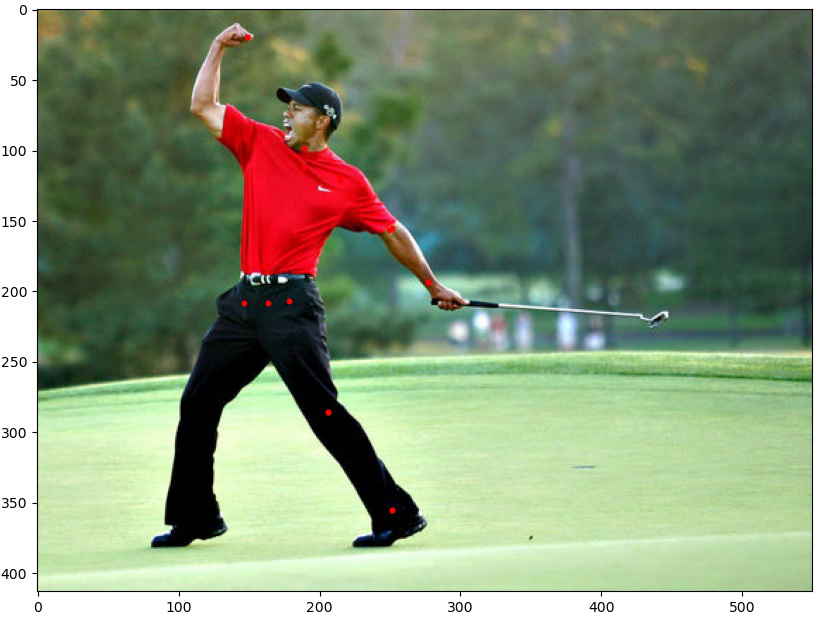

In [3]:
# 50 epoch를 한 결과
Image.open(os.getenv("HOME") + "/Pictures/img.jpg")

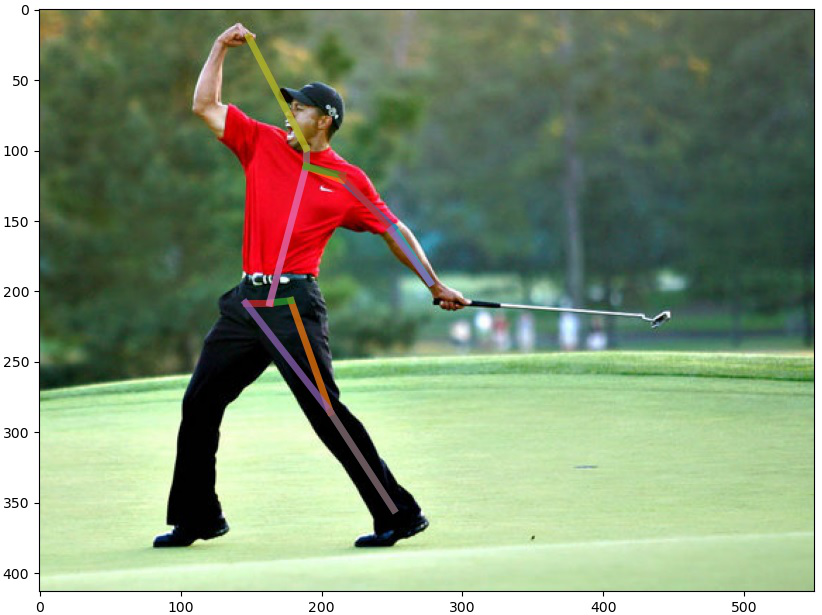

In [4]:
# 50 epoch를 한 결과
Image.open(os.getenv("HOME") + "/Pictures/img2.jpg")

In [7]:
# 50 epochs 결과 머리를 찾지 못했고, 다리 한쪽을 인식하지 못했다.
# 해당 model의 loss는 2.1801이다.

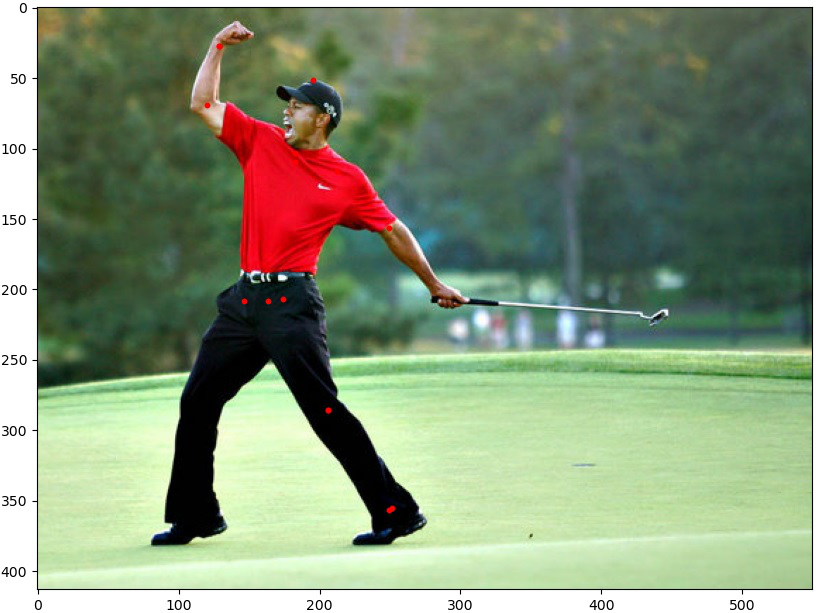

In [5]:
# 폴더에 들어있던 model(loss-1.0744)
Image.open(os.getenv("HOME") + "/Pictures/img3.jpg")

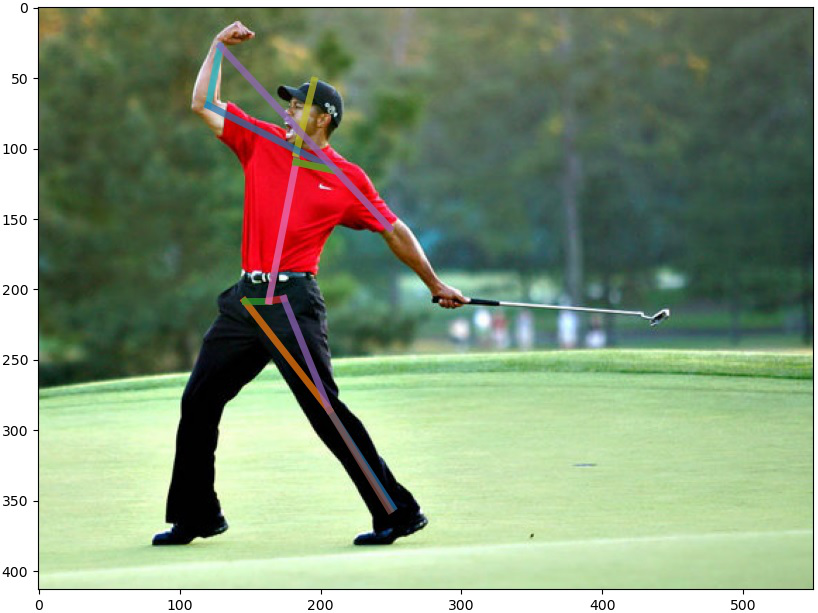

In [6]:
# 폴더에 들어있던 model(loss-1.0744)
Image.open(os.getenv("HOME") + "/Pictures/img4.jpg")

In [ ]:
# loss가 1.0744에도 다리 한쪽을 인식하지 못한다.

## 9. 프로젝트 : 모델 바꿔보기

### 9_1. simplebaseline 모델로 변경해 봅시다

* 지금까지 우리는 StackedHourglass Network 기반으로 학습을 진행해 왔다.
* 그러나 지난시간에 살펴본 것처럼 Simplebaseline 모델은 이보다 훨씬 간단한 모델 구조에도 불구하고 더욱 좋은 성능을 보여주었던 바 있다.
* 실제로도 그런 성능을 얻을 수 있을지 확인해 보겠다.

### 9_2. STEP 1 : simplebaseline 모델 완성하기
* simplebaseline.py 파일 내용을 완성한다.

### 9_3. STEP 2 : simplebaseline 모델로 변경하여 훈련하기
* train.py 218라인의 모델 선언 부분을 simplebaseline 모델로 변경한 후 다시 학습을 진행한다.

### 9_4. STEP 3 : 두 모델의 비교
* 실습에서 다룬 StackedHourglass Network와 Simplebaseline 모델을 둘 다 동일한 Epoch 수만큼 학습하여 그 결과를 비교해 본다.
* 1. Pose Estimation 결과 시각화 (정성적 비교)
* 2. 학습 진행경과 (loss 감소현황)
* 가급적 두 모델 공히 최소 3epoch이상, (5epoch 이상 권장)을 학습하기 바란다.

In [54]:
!cd ~/aiffel/mpii && python train_simplebaseline.py

Physical devices cannot be modified after being initialized
Start training...
Start epoch 1 with learning rate 0.0007
Instructions for updating:
Use `tf.data.Iterator.get_next_as_optional()` instead.
Traceback (most recent call last):
  File "train_simplebaseline.py", line 254, in <module>
    num_heatmap, batch_size, train_tfrecords, val_tfrecords, '0.0.1')
  File "train_simplebaseline.py", line 235, in train
    return trainer.run(train_dist_dataset, val_dist_dataset)
  File "train_simplebaseline.py", line 156, in run
    train_dist_dataset)
  File "/home/aiffel-dj52/anaconda3/envs/aiffel/lib/python3.7/site-packages/tensorflow/python/eager/def_function.py", line 780, in __call__
    result = self._call(*args, **kwds)
  File "/home/aiffel-dj52/anaconda3/envs/aiffel/lib/python3.7/site-packages/tensorflow/python/eager/def_function.py", line 823, in _call
    self._initialize(args, kwds, add_initializers_to=initializers)
  File "/home/aiffel-dj52/anaconda3/envs/aiffel/lib/python3.7/site-